# Building the blocks

In [35]:

from qiskit.opflow import (I, X, Y, Z)
from qiskit.opflow.primitive_ops import MatrixOp
from qiskit import quantum_info as qi
import numpy as np 
import copy

#H = np.load('Hamiltonian_Example.npy')
# I have -2.0 < u 2.0 in steps of 0.1
u=4.0
tt=-1
path = '/Users/stenger/Documents/Research/Hubbard_symmetries/VQE/'
H = np.load(path + 'H_mu_'+str(u)+"_t_"+str(tt)+'.npy')

# Function to add elements to a block so that it fits onto qubits
def complete_diagonal(b11):
    size = 2**np.ceil(np.log2(len(b11)))
    for v in b11:
        while len(v) < size:
            v.append(0.0)
    while len(b11) < size:
        i = len(b11)
        vnew = [0.0 for i in range(0,8)]
        vnew[i] = 10
        b11.append(vnew)
    return b11

def complete_off_diagonal(b11):
    size = 2**np.ceil(np.log2(len(b11)))
    for v in b11:
        while len(v) < size:
            v.append(0.0)
    while len(b11) < size:
        i = len(b11)
        vnew = [0.0 for i in range(0,8)]
        b11.append(vnew)
    return b11

import math
N = 4
S = 2
bL = math.comb(4,2)

blocks = {}
for bi in range(bL):
    for bj in range(bi,bL):
        bij = [[H[i + bL*bi][j + bL*bj] for j in range(0,bL)] for i in range(0,bL)]
        if np.amax(np.abs(bij)) > 10**(-5):
            if bi == bj:
                bij = complete_diagonal(bij)
            else:
                bij = complete_off_diagonal(bij)
            bij_pauli = MatrixOp(bij).to_pauli_op()
            blocks[str(bi) + ',' + str(bj)] = bij_pauli
        
Q = int(np.log2(len(blocks['0,0'].to_matrix())))

#Set alpha and phi to initial value

alpha = 1/np.sqrt(bL)*np.array([1 for b in range(bL)])

#number of blocks
T = 1
phi = []
for b in range(bL):
    phi_b = []
    for ti in range(T):
        phi_t = []
        for q in range(Q):
            phi_t.append(0)
        phi_b.append(phi_t)
    phi.append(phi_b)

# Import the runtime program

In [36]:
import os
from qiskit import IBMQ

IBMQ.load_account()
provider = IBMQ.get_provider(hub='ibm-q-afrl', group='air-force-lab', project='quantum-sim')  # Substitute with your provider.


ibmqfactory.load_account:WARNING:2022-04-04 13:55:24,197: Credentials are already in use. The existing account in the session will be replaced.


In [53]:
program_id = 'grouped-vqe-7E5J23kZ08'
my_program = provider.runtime.program(program_id)

print(my_program)

grouped-vqe-7E5J23kZ08:
  Name: Grouped_VQE
  Description: Performs VQE on Hamiltonian blocks so that the Hamitonian can be split into classical and quantum parts.  This program was written by Dr. John Stenger.  For help email me at jstenge2@gmail.com
  Creation date: 2022-04-05T13:14:27.803956Z
  Update date: 2022-04-05T13:14:27.803956Z
  Max execution time: 28800
  Input parameters:
    none
  Interim results:
    none
  Returns:
    none


# Run the program

## Simlution

In [62]:
def interim_result_callback(job_id, interim_result):
    print(f"interim result: {interim_result}")

In [63]:
backend = provider.backend.ibmq_qasm_simulator
options = {'backend_name': backend.name()}
inputs = {"k_max": 3, 'tt':tt, 'u':u,"phi": phi, "alpha": alpha, "blocks":blocks, "method":"matrix"}
job = provider.runtime.run(program_id, options=options, inputs=inputs, callback=interim_result_callback)

In [64]:
print(f"job id: {job.job_id()}")
result = job.result()
#print(result)

job id: c97i17it97o7199nj1f0
interim result: {'Starting program with k_max': 3}
interim result: {'starting iteration': 0}
interim result: {'k': 0, 'E_A': 3.52828179719481, 'time': '17:34:35'}
interim result: {'k': 0, 'E_B': 4.081098942464725, 'time': '17:34:36'}
interim result: {'k': 0, 'E_f': 2.6666666666666683, 'time': '17:34:36'}
interim result: {'starting iteration': 1}
interim result: {'k': 1, 'E_A': 4.23715272408162, 'time': '17:34:37'}
interim result: {'k': 1, 'E_B': 1.8777704476047452, 'time': '17:34:38'}
interim result: {'k': 1, 'E_f': 2.6855737819747647, 'time': '17:34:38'}
interim result: {'starting iteration': 2}
interim result: {'k': 2, 'E_A': 2.9075246266579082, 'time': '17:34:39'}
interim result: {'k': 2, 'E_B': 3.676877087462313, 'time': '17:34:39'}
interim result: {'k': 2, 'E_f': 2.114007052849097, 'time': '17:34:40'}
interim result: [{'E': 2.6666666666666683, 'c': 0.4, 'a': 0.030878064824598282, 'phi': array([[[ 0.0213374, -0.0213374, -0.0213374]],

       [[ 0.021337

In [8]:
e,ys = np.linalg.eig(H)

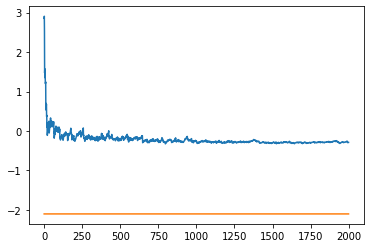

In [9]:
import matplotlib.pyplot as plt

E0 = [np.sort(e)[0] for i in range(len(result))]

El = [result[i]['E'] for i in range(len(result))]
tl = [i for i in range(len(El))]

plt.plot(tl,El)
plt.plot(tl,E0)

Something seems off here.  I should try to do these from a seed which I know converges better and compare the results.  First I would like to see if grouping the circuits helps to imporve the speed of the runtime program.


## On Chip

In [65]:
def interim_result_callback(job_id, interim_result):
    print(f"interim result: {interim_result}")

In [66]:
#backend = provider.get_backend('ibmq_jakarta')
backend = provider.get_backend('ibm_lagos')
options = {'backend_name': backend.name()}
inputs = {"k_max": 3, 'tt':tt, 'u':u, "phi": phi, "alpha": alpha, "blocks":blocks}
job = provider.runtime.run(program_id, options=options, inputs=inputs, callback=interim_result_callback)

In [67]:
print(f"job id: {job.job_id()}")
result = job.result()

job id: c97i353klm2eiortmikg
interim result: {'Starting program with k_max': 3}
interim result: {'starting iteration': 0}


RuntimeJobFailureError: 'Unable to retrieve job result. Job c97i353klm2eiortmikg has failed:\n2022-04-08T05:09:53.888885782Z 04/08/2022 05:09:53 AM - qiskit.quantum_info.synthesis.two_qubit_decompose - DEBUG Requested fidelity: None calculated fidelity: 1.0 actual fidelity 1.0000000000000004\n2022-04-08T05:09:54.326278695Z 04/08/2022 05:09:54 AM - jaeger_tracing - INFO Initializing Jaeger Tracer with UDP reporter\n2022-04-08T05:09:54.328461748Z 04/08/2022 05:09:54 AM - asyncio - DEBUG Using selector: EpollSelector\n2022-04-08T05:09:54.330580832Z 04/08/2022 05:09:54 AM - jaeger_tracing - INFO Using sampler ConstSampler(True)\n2022-04-08T05:09:54.331370534Z 04/08/2022 05:09:54 AM - jaeger_tracing - INFO opentracing.tracer initialized to <jaeger_client.tracer.Tracer object at 0x7f819323e6d0>[app_name=ntc-job]\n2022-04-08T05:09:54.383227459Z 04/08/2022 05:09:54 AM - asyncio - DEBUG Using selector: EpollSelector\n2022-04-08T05:09:54.383590657Z 04/08/2022 05:09:54 AM - programruntime.runtime_provider - DEBUG QuantumProgramProvider initialization completed. Program ID=grouped-vqe-7E5J23kZ08, execution ID=c97i353klm2eiortmikg, hub=ibm-q-afrl, group=air-force-lab, project=quantum-sim.\n2022-04-08T05:09:54.383855760Z 04/08/2022 05:09:54 AM - asyncio - DEBUG Using selector: EpollSelector\n2022-04-08T05:09:54.384248687Z 04/08/2022 05:09:54 AM - programruntime.clients.api.nats_client - DEBUG Connecting to server\n2022-04-08T05:09:54.589874018Z 04/08/2022 05:09:54 AM - programruntime.clients.api.usermessengernatsclient - DEBUG Publishing partial results\n2022-04-08T05:09:54.606623735Z 04/08/2022 05:09:54 AM - programruntime.clients.api.usermessengernatsclient - DEBUG Publishing partial results\n2022-04-08T05:09:55.787780101Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.792154695Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.804703445Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.804888826Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.808093217Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.808196595Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.891352747Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.901044596Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.906314837Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.917817303Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.918094040Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.922630045Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.922769060Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.925519405Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.925838627Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.936314631Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.942301652Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.946846222Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.958606045Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.958761190Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.960942959Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.961263588Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.963173380Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.963373219Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.963645855Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.963967475Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.968352467Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.969387094Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.976728693Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.980538310Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.980741962Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.981149677Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.983140206Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.985849524Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.986207098Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.986228589Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.988461805Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.988735105Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.993207683Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.993466272Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.993522010Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.993762550Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:55.994361043Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.999354220Z 04/08/2022 05:09:55 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:55.999548414Z 04/08/2022 05:09:55 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.002204397Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.002476884Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.002943181Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.003494426Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.006225976Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.006541128Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.008840718Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.010117945Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.010158718Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.010391849Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.010411905Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.011411437Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.011672794Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.016950911Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.020933716Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.021365265Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.024072973Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.027584005Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.027954037Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.029441968Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.029745721Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.033237099Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.033509089Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.037369033Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.042381301Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.042767603Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.048330721Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.048387768Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.059745194Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.059942701Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.074185208Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.074434981Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.074888377Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.075231874Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.082521919Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.082567677Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.084229552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:56.084301701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04005 (ms)\n2022-04-08T05:09:56.084357131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01550 (ms)\n2022-04-08T05:09:56.084458644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:56.084602091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08678 (ms)\n2022-04-08T05:09:56.084694229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06866 (ms)\n2022-04-08T05:09:56.084774839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04554 (ms)\n2022-04-08T05:09:56.085063774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24080 (ms)\n2022-04-08T05:09:56.085150268Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03529 (ms)\n2022-04-08T05:09:56.085252155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06294 (ms)\n2022-04-08T05:09:56.085320636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:56.085391255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.085440170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.085548876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.085604044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.085645926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.085693087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.086328463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.086328463Z    ┌──────────────┐\n2022-04-08T05:09:56.086328463Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.086328463Z    └──────────────┘\n2022-04-08T05:09:56.120461171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.120461171Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.120461171Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.120461171Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.121527696Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.122149919Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.123692547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.123692547Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.123692547Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.123692547Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.123692547Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.123783869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.038s.\n2022-04-08T05:09:56.124458409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.124458409Z    ┌──────────────┐\n2022-04-08T05:09:56.124458409Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.124458409Z    └──────────────┘\n2022-04-08T05:09:56.124977169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.124977169Z      ┌───────────┐\n2022-04-08T05:09:56.124977169Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.124977169Z      └───────────┘\n2022-04-08T05:09:56.125659451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.125659451Z      ┌──────────────┐\n2022-04-08T05:09:56.125659451Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.125659451Z      └──────────────┘\n2022-04-08T05:09:56.126586438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.126586438Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.126586438Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.126586438Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.127040869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.127040869Z      ┌──────────────┐\n2022-04-08T05:09:56.127040869Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.127040869Z      └──────────────┘\n2022-04-08T05:09:56.127895359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.127895359Z      ┌───────────────────┐\n2022-04-08T05:09:56.127895359Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.127895359Z      └───────────────────┘\n2022-04-08T05:09:56.129577186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.129577186Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.129577186Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.129577186Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.129577186Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.130211507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.130211507Z      ┌───────────────────┐\n2022-04-08T05:09:56.130211507Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.130211507Z      └───────────────────┘\n2022-04-08T05:09:56.132026028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.132026028Z global phase: 3π/2\n2022-04-08T05:09:56.132026028Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.132026028Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.132026028Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.132116824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.133424409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.133477355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 48.11168 (ms)\n2022-04-08T05:09:56.133538005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:56.133618229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03862 (ms)\n2022-04-08T05:09:56.133662582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.135446941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.71638 (ms)\n2022-04-08T05:09:56.135528148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:56.135648975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07915 (ms)\n2022-04-08T05:09:56.135723793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:56.135810104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.135853329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.135882340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.135913017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.136197791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.136266257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.136303234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54264 (ms)\n2022-04-08T05:09:56.136365886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:56.136404087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.137162819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70095 (ms)\n2022-04-08T05:09:56.137238723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:56.137343991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06270 (ms)\n2022-04-08T05:09:56.137413903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:56.137491369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.137534780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.137564770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.137597361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.137862249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.138016612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.138061689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.60415 (ms)\n2022-04-08T05:09:56.138128493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:56.138166716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.138903615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.67830 (ms)\n2022-04-08T05:09:56.138975151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:56.139082041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:56.139154862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:56.139230877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.139272950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.139302442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.139334145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.139602255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.139667639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.139705375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51594 (ms)\n2022-04-08T05:09:56.139753961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.139794973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.139856018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02885 (ms)\n2022-04-08T05:09:56.143495552Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.146732077Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.147105566Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.148420669Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.148868243Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.175816931Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.175902934Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.176300828Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.176354679Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.177804709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:56.177891564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04005 (ms)\n2022-04-08T05:09:56.177931212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01311 (ms)\n2022-04-08T05:09:56.178014029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04959 (ms)\n2022-04-08T05:09:56.178117153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06652 (ms)\n2022-04-08T05:09:56.178225933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06747 (ms)\n2022-04-08T05:09:56.178312552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05174 (ms)\n2022-04-08T05:09:56.178607083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25249 (ms)\n2022-04-08T05:09:56.178682232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02885 (ms)\n2022-04-08T05:09:56.178773779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.178856234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04506 (ms)\n2022-04-08T05:09:56.178929747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.178973331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.179010096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.179084319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.179138318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.179178868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.179233680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.179756510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.179756510Z    ┌──────────────┐\n2022-04-08T05:09:56.179756510Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.179756510Z    └──────────────┘\n2022-04-08T05:09:56.180137228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.180137228Z    ┌────────────┐\n2022-04-08T05:09:56.180137228Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.180137228Z    └────────────┘\n2022-04-08T05:09:56.181339370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.181339370Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.181339370Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.181339370Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.183319218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.183319218Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.183319218Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.183319218Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.183319218Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.183345286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.183955869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.183955869Z    ┌──────────────┐\n2022-04-08T05:09:56.183955869Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.183955869Z    └──────────────┘\n2022-04-08T05:09:56.184405054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.184405054Z      ┌───────────┐\n2022-04-08T05:09:56.184405054Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.184405054Z      └───────────┘\n2022-04-08T05:09:56.185019159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.185019159Z      ┌──────────────┐\n2022-04-08T05:09:56.185019159Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.185019159Z      └──────────────┘\n2022-04-08T05:09:56.185332546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.185332546Z    ┌────────────┐\n2022-04-08T05:09:56.185332546Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.185332546Z    └────────────┘\n2022-04-08T05:09:56.185746099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.185746099Z      ┌───────────┐\n2022-04-08T05:09:56.185746099Z q35: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.185746099Z      └───────────┘\n2022-04-08T05:09:56.186291669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.186291669Z      ┌────────────┐\n2022-04-08T05:09:56.186291669Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.186291669Z      └────────────┘\n2022-04-08T05:09:56.187214420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.187214420Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.187214420Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.187214420Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.187653101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.187653101Z      ┌──────────────┐\n2022-04-08T05:09:56.187653101Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.187653101Z      └──────────────┘\n2022-04-08T05:09:56.188479406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.188479406Z      ┌───────────────────┐\n2022-04-08T05:09:56.188479406Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.188479406Z      └───────────────────┘\n2022-04-08T05:09:56.188867755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.188867755Z      ┌────────────┐\n2022-04-08T05:09:56.188867755Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.188867755Z      └────────────┘\n2022-04-08T05:09:56.189820720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.189820720Z      ┌────────────────────┐\n2022-04-08T05:09:56.189820720Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.189820720Z      └────────────────────┘\n2022-04-08T05:09:56.192260556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.192260556Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.192260556Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.192260556Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.192260556Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.192825846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.192825846Z      ┌───────────────────┐\n2022-04-08T05:09:56.192825846Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.192825846Z      └───────────────────┘\n2022-04-08T05:09:56.194509398Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.194509398Z global phase: 3π/2\n2022-04-08T05:09:56.194509398Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.194509398Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.194509398Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.195295721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.195295721Z      ┌────────────────────┐\n2022-04-08T05:09:56.195295721Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.195295721Z      └────────────────────┘\n2022-04-08T05:09:56.197228921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.197228921Z global phase: 3π/2\n2022-04-08T05:09:56.197228921Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.197228921Z q35: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.197228921Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.197306381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:56.198936183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.198955244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.03884 (ms)\n2022-04-08T05:09:56.199007989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:56.199086155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:56.199127263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.200971277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.77813 (ms)\n2022-04-08T05:09:56.201063845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:56.201172463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06557 (ms)\n2022-04-08T05:09:56.201245837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:56.201322450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.201367839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.201405674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.201440179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.201694944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.201759582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.201796658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51641 (ms)\n2022-04-08T05:09:56.201860764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:56.201899384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.202713010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75746 (ms)\n2022-04-08T05:09:56.202787282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:56.202881982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:56.202951324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:56.203026238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.203078629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.203109162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.203141419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.203409012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.203474313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.203511000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:56.203568840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:56.203605946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.203908380Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.204420413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74816 (ms)\n2022-04-08T05:09:56.204487770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:56.204580179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05221 (ms)\n2022-04-08T05:09:56.204649964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:56.204724312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.204766705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.204797000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.204829124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.205106040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.205171780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.205208951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52404 (ms)\n2022-04-08T05:09:56.205258626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.205301905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.205359030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:56.209636689Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.218287352Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.218403615Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.218770344Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.218826622Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.220136227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00405 (ms)\n2022-04-08T05:09:56.220154840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02885 (ms)\n2022-04-08T05:09:56.220203823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01168 (ms)\n2022-04-08T05:09:56.220299032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04745 (ms)\n2022-04-08T05:09:56.220390013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05651 (ms)\n2022-04-08T05:09:56.220439040Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.220494961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06127 (ms)\n2022-04-08T05:09:56.220571826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:56.220834404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.21958 (ms)\n2022-04-08T05:09:56.220906500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:56.220994848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05054 (ms)\n2022-04-08T05:09:56.221087174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:56.221148006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.221189529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.221223393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.221278834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.221323042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.221374405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.221823316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.221823316Z    ┌──────────────┐\n2022-04-08T05:09:56.221823316Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.221823316Z    └──────────────┘\n2022-04-08T05:09:56.222964511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.222964511Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.222964511Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.222964511Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.224467133Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.224576575Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.224816155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.224816155Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.224816155Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.224816155Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.224816155Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.224870517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.225447286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.225447286Z    ┌──────────────┐\n2022-04-08T05:09:56.225447286Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.225447286Z    └──────────────┘\n2022-04-08T05:09:56.225866546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.225866546Z      ┌───────────┐\n2022-04-08T05:09:56.225866546Z q52: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.225866546Z      └───────────┘\n2022-04-08T05:09:56.226477288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.226477288Z      ┌──────────────┐\n2022-04-08T05:09:56.226477288Z q52: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.226477288Z      └──────────────┘\n2022-04-08T05:09:56.226556027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:56.226665449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06318 (ms)\n2022-04-08T05:09:56.226737789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02050 (ms)\n2022-04-08T05:09:56.226870965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07129 (ms)\n2022-04-08T05:09:56.227035507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11444 (ms)\n2022-04-08T05:09:56.227184730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08845 (ms)\n2022-04-08T05:09:56.227282363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05507 (ms)\n2022-04-08T05:09:56.227399344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.227399344Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.227399344Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.227399344Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.227604259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26321 (ms)\n2022-04-08T05:09:56.227692403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03648 (ms)\n2022-04-08T05:09:56.227810198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07749 (ms)\n2022-04-08T05:09:56.227839206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.227839206Z      ┌──────────────┐\n2022-04-08T05:09:56.227839206Z q52: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.227839206Z      └──────────────┘\n2022-04-08T05:09:56.227883119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:56.227965020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.228020562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.228175795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.228241528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.228285878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.228339436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.228681881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.228681881Z      ┌───────────────────┐\n2022-04-08T05:09:56.228681881Z q52: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.228681881Z      └───────────────────┘\n2022-04-08T05:09:56.229148409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.229148409Z    ┌──────────────┐\n2022-04-08T05:09:56.229148409Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.229148409Z    └──────────────┘\n2022-04-08T05:09:56.229520667Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.229831984Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.230353615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.230353615Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.230353615Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.230353615Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.230353615Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.230989411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.230989411Z      ┌───────────────────┐\n2022-04-08T05:09:56.230989411Z q52: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.230989411Z      └───────────────────┘\n2022-04-08T05:09:56.232892848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.232892848Z global phase: 3π/2\n2022-04-08T05:09:56.232892848Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.232892848Z q52: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.232892848Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.232958245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.234123940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.234177809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.04293 (ms)\n2022-04-08T05:09:56.234237612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01264 (ms)\n2022-04-08T05:09:56.234307328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:56.234350684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.235723788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.30796 (ms)\n2022-04-08T05:09:56.235809941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03338 (ms)\n2022-04-08T05:09:56.235926400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07486 (ms)\n2022-04-08T05:09:56.235998080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:56.236090052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.236133542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.236162644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.236194204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.236454492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.236516941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.236554592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52166 (ms)\n2022-04-08T05:09:56.236620323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:56.236658642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.237299651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.58413 (ms)\n2022-04-08T05:09:56.237374419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.237474291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:56.237542240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03099 (ms)\n2022-04-08T05:09:56.237615334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.237657978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.237687949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.237720501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.237980389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.238042608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.238089694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50259 (ms)\n2022-04-08T05:09:56.238147417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:56.238185012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.238786943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.54836 (ms)\n2022-04-08T05:09:56.238858785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:56.238949852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05126 (ms)\n2022-04-08T05:09:56.239018517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:56.239103237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.239145139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.239175200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.239207290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.239468636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.239531301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.239567648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51498 (ms)\n2022-04-08T05:09:56.239617351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.239660918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.239718369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02527 (ms)\n2022-04-08T05:09:56.246659779Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.246975329Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.248194677Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.255442473Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.255491912Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.255611497Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.256011536Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.256073222Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.257606567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:56.257682316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04458 (ms)\n2022-04-08T05:09:56.257735333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:56.257840788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:56.257938608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06318 (ms)\n2022-04-08T05:09:56.258063007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07153 (ms)\n2022-04-08T05:09:56.258146674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05460 (ms)\n2022-04-08T05:09:56.258441306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24509 (ms)\n2022-04-08T05:09:56.258515633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02980 (ms)\n2022-04-08T05:09:56.258628998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07319 (ms)\n2022-04-08T05:09:56.258758509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04697 (ms)\n2022-04-08T05:09:56.258857452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.258958583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.258958583Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.258981202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.259047313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.259110134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.259170684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.259794008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.259794008Z    ┌──────────────┐\n2022-04-08T05:09:56.259794008Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.259794008Z    └──────────────┘\n2022-04-08T05:09:56.261195420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.261195420Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.261195420Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.261195420Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.263236760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.263236760Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.263236760Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.263236760Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.263236760Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.263236760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.263423901Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.263875489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.263875489Z    ┌──────────────┐\n2022-04-08T05:09:56.263875489Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.263875489Z    └──────────────┘\n2022-04-08T05:09:56.264365462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.264365462Z      ┌───────────┐\n2022-04-08T05:09:56.264365462Z q69: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.264365462Z      └───────────┘\n2022-04-08T05:09:56.265019832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.265019832Z      ┌──────────────┐\n2022-04-08T05:09:56.265019832Z q69: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.265019832Z      └──────────────┘\n2022-04-08T05:09:56.265685083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.265685083Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.265685083Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.265685083Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.266032376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.266032376Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.266032376Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.266032376Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.266499762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.266499762Z      ┌──────────────┐\n2022-04-08T05:09:56.266499762Z q69: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.266499762Z      └──────────────┘\n2022-04-08T05:09:56.267393129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.267393129Z      ┌───────────────────┐\n2022-04-08T05:09:56.267393129Z q69: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.267393129Z      └───────────────────┘\n2022-04-08T05:09:56.269214592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.269214592Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.269214592Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.269214592Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.269214592Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.269478391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.269478391Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.269478391Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.269478391Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.269478391Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.269698185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.042s.\n2022-04-08T05:09:56.269818979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.269818979Z      ┌───────────────────┐\n2022-04-08T05:09:56.269818979Z q69: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.269818979Z      └───────────────────┘\n2022-04-08T05:09:56.270226513Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.270335229Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.270514845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.270514845Z    ┌──────────────┐\n2022-04-08T05:09:56.270514845Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.270514845Z    └──────────────┘\n2022-04-08T05:09:56.271088927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.271088927Z      ┌───────────┐\n2022-04-08T05:09:56.271088927Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.271088927Z      └───────────┘\n2022-04-08T05:09:56.271824431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.271824431Z      ┌──────────────┐\n2022-04-08T05:09:56.271824431Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.271824431Z      └──────────────┘\n2022-04-08T05:09:56.271911886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.271911886Z global phase: 3π/2\n2022-04-08T05:09:56.271911886Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.271911886Z q69: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.271911886Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.271991076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:56.272249743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:56.272348639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:56.272410208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:56.272524302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06223 (ms)\n2022-04-08T05:09:56.272665477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09656 (ms)\n2022-04-08T05:09:56.272786199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07558 (ms)\n2022-04-08T05:09:56.272870129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04673 (ms)\n2022-04-08T05:09:56.272900063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.272900063Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.272900063Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.272900063Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.273169247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24939 (ms)\n2022-04-08T05:09:56.273251848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03409 (ms)\n2022-04-08T05:09:56.273316148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.273379192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.55832 (ms)\n2022-04-08T05:09:56.273379192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09298 (ms)\n2022-04-08T05:09:56.273450664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01359 (ms)\n2022-04-08T05:09:56.273450664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:56.273531538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.273531538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03409 (ms)\n2022-04-08T05:09:56.273554206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.273554206Z      ┌──────────────┐\n2022-04-08T05:09:56.273554206Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.273554206Z      └──────────────┘\n2022-04-08T05:09:56.273586051Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.273586051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01240 (ms)\n2022-04-08T05:09:56.273586051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.273755544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.273817835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.273861591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.273890262Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.273909467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.274182623Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.274683315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.274683315Z    ┌──────────────┐\n2022-04-08T05:09:56.274683315Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.274683315Z    └──────────────┘\n2022-04-08T05:09:56.274784648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.274784648Z      ┌───────────────────┐\n2022-04-08T05:09:56.274784648Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.274784648Z      └───────────────────┘\n2022-04-08T05:09:56.275354548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.69683 (ms)\n2022-04-08T05:09:56.275447208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03529 (ms)\n2022-04-08T05:09:56.275587638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09823 (ms)\n2022-04-08T05:09:56.275665371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:56.275752911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.275799822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.275831367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.275861759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.276145490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.276215355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.276254193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55170 (ms)\n2022-04-08T05:09:56.276333697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:56.276374772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00882 (ms)\n2022-04-08T05:09:56.276771334Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.277164542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.72694 (ms)\n2022-04-08T05:09:56.277249730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:56.277293218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.277293218Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.277293218Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.277293218Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.277293218Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.277367518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07606 (ms)\n2022-04-08T05:09:56.277442880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:56.277520764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.277564641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.277595830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.277628432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.277902010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.277969423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.278005926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:56.278083846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01860 (ms)\n2022-04-08T05:09:56.278123614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.278225643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.278225643Z      ┌───────────────────┐\n2022-04-08T05:09:56.278225643Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.278225643Z      └───────────────────┘\n2022-04-08T05:09:56.278329197Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.278880592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70071 (ms)\n2022-04-08T05:09:56.278956902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.279063705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05841 (ms)\n2022-04-08T05:09:56.279140380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.279217611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.279260373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.279291139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.279324337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.279594443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.279664212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.279705312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52977 (ms)\n2022-04-08T05:09:56.279756638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00715 (ms)\n2022-04-08T05:09:56.279802401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.279862549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02789 (ms)\n2022-04-08T05:09:56.280858933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.280858933Z global phase: 3π/2\n2022-04-08T05:09:56.280858933Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.280858933Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.280858933Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.280957805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.011s.\n2022-04-08T05:09:56.282190071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.282245707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 54.29792 (ms)\n2022-04-08T05:09:56.282335421Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.282335421Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01621 (ms)\n2022-04-08T05:09:56.282440738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04816 (ms)\n2022-04-08T05:09:56.282491776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01478 (ms)\n2022-04-08T05:09:56.283837472Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.284107266Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.50275 (ms)\n2022-04-08T05:09:56.284205668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04911 (ms)\n2022-04-08T05:09:56.284360511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09942 (ms)\n2022-04-08T05:09:56.284451149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04625 (ms)\n2022-04-08T05:09:56.284538298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.284591808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.284628784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.284669731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.284979393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.285000847Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.285066045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.285125622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.62847 (ms)\n2022-04-08T05:09:56.285213634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:56.285262439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.285340917Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.285973043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.62656 (ms)\n2022-04-08T05:09:56.286066171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03934 (ms)\n2022-04-08T05:09:56.286214151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08583 (ms)\n2022-04-08T05:09:56.286266444Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.286295494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03839 (ms)\n2022-04-08T05:09:56.286387405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.286435148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.286483257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.286522096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.286835157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.286908511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.286957619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.62227 (ms)\n2022-04-08T05:09:56.287035459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:56.287092233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.287763518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.59772 (ms)\n2022-04-08T05:09:56.287845798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03600 (ms)\n2022-04-08T05:09:56.287977730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08345 (ms)\n2022-04-08T05:09:56.288064570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03719 (ms)\n2022-04-08T05:09:56.288159038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.288212579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.288251764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.288300122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.288727015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.288803480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.288852902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73552 (ms)\n2022-04-08T05:09:56.288922534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00858 (ms)\n2022-04-08T05:09:56.288977947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00715 (ms)\n2022-04-08T05:09:56.289069387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03481 (ms)\n2022-04-08T05:09:56.294773491Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.294940829Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.296007433Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.296211141Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.296533885Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.296589938Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.297197665Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.298023031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00739 (ms)\n2022-04-08T05:09:56.298114150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04768 (ms)\n2022-04-08T05:09:56.298166813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:56.298266882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:56.298360260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05841 (ms)\n2022-04-08T05:09:56.298467429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06604 (ms)\n2022-04-08T05:09:56.298547134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04578 (ms)\n2022-04-08T05:09:56.298819461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23031 (ms)\n2022-04-08T05:09:56.298891557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:56.298983354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.299076871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04196 (ms)\n2022-04-08T05:09:56.299143177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.299188638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.299223351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.299282146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.299329443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.299384795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.299951161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.299951161Z    ┌──────────────┐\n2022-04-08T05:09:56.299951161Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.299951161Z    └──────────────┘\n2022-04-08T05:09:56.301316357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.301316357Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.301316357Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.301316357Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.302632521Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.302928855Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.303246836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.303246836Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.303246836Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.303246836Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.303246836Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.303307023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.303891378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.303891378Z    ┌──────────────┐\n2022-04-08T05:09:56.303891378Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.303891378Z    └──────────────┘\n2022-04-08T05:09:56.304363812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.304363812Z      ┌───────────┐\n2022-04-08T05:09:56.304363812Z q86: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.304363812Z      └───────────┘\n2022-04-08T05:09:56.304993806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.304993806Z      ┌──────────────┐\n2022-04-08T05:09:56.304993806Z q86: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.304993806Z      └──────────────┘\n2022-04-08T05:09:56.304993806Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.305166809Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.305568127Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.305636593Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.305919749Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.305976846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.305976846Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.305976846Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.305976846Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.306438425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.306438425Z      ┌──────────────┐\n2022-04-08T05:09:56.306438425Z q86: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.306438425Z      └──────────────┘\n2022-04-08T05:09:56.306629183Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.306926102Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.307087198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:56.307171039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03839 (ms)\n2022-04-08T05:09:56.307222985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01192 (ms)\n2022-04-08T05:09:56.307222985Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.307323949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.307323949Z      ┌───────────────────┐\n2022-04-08T05:09:56.307323949Z q86: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.307323949Z      └───────────────────┘\n2022-04-08T05:09:56.307323949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04673 (ms)\n2022-04-08T05:09:56.307406622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05245 (ms)\n2022-04-08T05:09:56.307514224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06509 (ms)\n2022-04-08T05:09:56.307595428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04578 (ms)\n2022-04-08T05:09:56.307872249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23317 (ms)\n2022-04-08T05:09:56.307947197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:56.308047057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06056 (ms)\n2022-04-08T05:09:56.308138490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05221 (ms)\n2022-04-08T05:09:56.308207012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.308251856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.308287789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.308346037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.308391034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.308443113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.308531276Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.308986005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.308986005Z    ┌──────────────┐\n2022-04-08T05:09:56.308986005Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.308986005Z    └──────────────┘\n2022-04-08T05:09:56.309025602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.309025602Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.309025602Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.309025602Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.309025602Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.309645953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.309645953Z      ┌───────────────────┐\n2022-04-08T05:09:56.309645953Z q86: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.309645953Z      └───────────────────┘\n2022-04-08T05:09:56.309757400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.309757400Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.309757400Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.309757400Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.310254638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.310254638Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.310254638Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.310254638Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.311375598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.311375598Z global phase: 3π/2\n2022-04-08T05:09:56.311375598Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.311375598Z q86: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.311375598Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.311447446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.311621210Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.311919882Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.312213640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.312213640Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.312213640Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.312213640Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.312213640Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.312283012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.312625230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.312680315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.55505 (ms)\n2022-04-08T05:09:56.312743466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:56.312815701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:56.312859533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.312900697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.312900697Z    ┌──────────────┐\n2022-04-08T05:09:56.312900697Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.312900697Z    └──────────────┘\n2022-04-08T05:09:56.312993866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.312993866Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.312993866Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.312993866Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.312993866Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.313203268Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.039s.\n2022-04-08T05:09:56.313388832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.313388832Z      ┌───────────┐\n2022-04-08T05:09:56.313388832Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.313388832Z      └───────────┘\n2022-04-08T05:09:56.313800911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.313800911Z    ┌──────────────┐\n2022-04-08T05:09:56.313800911Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.313800911Z    └──────────────┘\n2022-04-08T05:09:56.314002382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.314002382Z      ┌──────────────┐\n2022-04-08T05:09:56.314002382Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.314002382Z      └──────────────┘\n2022-04-08T05:09:56.314238749Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.30177 (ms)\n2022-04-08T05:09:56.314297836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.314297836Z      ┌───────────┐\n2022-04-08T05:09:56.314297836Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.314297836Z      └───────────┘\n2022-04-08T05:09:56.314330067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03529 (ms)\n2022-04-08T05:09:56.314453995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08178 (ms)\n2022-04-08T05:09:56.314525448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:56.314609874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.314655380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.314686196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.314717522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.314949681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.314949681Z      ┌──────────────┐\n2022-04-08T05:09:56.314949681Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.314949681Z      └──────────────┘\n2022-04-08T05:09:56.314978721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.315041456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.315041456Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.315041456Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.315041456Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.315041456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.315086489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51689 (ms)\n2022-04-08T05:09:56.315165632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:56.315207748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.315600611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.315600611Z      ┌──────────────┐\n2022-04-08T05:09:56.315600611Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.315600611Z      └──────────────┘\n2022-04-08T05:09:56.315816964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55408 (ms)\n2022-04-08T05:09:56.315870361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.315870361Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.315870361Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.315870361Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.315886779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:56.315985308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05698 (ms)\n2022-04-08T05:09:56.316047141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:56.316130641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.316172137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.316202605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.316234227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.316333181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.316333181Z      ┌──────────────┐\n2022-04-08T05:09:56.316333181Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.316333181Z      └──────────────┘\n2022-04-08T05:09:56.316511165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.316511165Z      ┌───────────────────┐\n2022-04-08T05:09:56.316511165Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.316511165Z      └───────────────────┘\n2022-04-08T05:09:56.316511165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.316564519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.316601287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51236 (ms)\n2022-04-08T05:09:56.316659855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:56.316698412Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.317197309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.317197309Z      ┌───────────────────┐\n2022-04-08T05:09:56.317197309Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.317197309Z      └───────────────────┘\n2022-04-08T05:09:56.317310234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55552 (ms)\n2022-04-08T05:09:56.317380501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02575 (ms)\n2022-04-08T05:09:56.317473325Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.317473325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05054 (ms)\n2022-04-08T05:09:56.317539829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02956 (ms)\n2022-04-08T05:09:56.317613697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.317654788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.317685074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.317718039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.317755420Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.317983480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.318044215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.318091542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50592 (ms)\n2022-04-08T05:09:56.318141552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.318190302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.318247722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02551 (ms)\n2022-04-08T05:09:56.318302194Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.318406028Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.318562342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.318562342Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.318562342Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.318562342Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.318562342Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.318846809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.318846809Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.318846809Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.318846809Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.318846809Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.319294317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.319294317Z      ┌───────────────────┐\n2022-04-08T05:09:56.319294317Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.319294317Z      └───────────────────┘\n2022-04-08T05:09:56.319476691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.319476691Z      ┌───────────────────┐\n2022-04-08T05:09:56.319476691Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.319476691Z      └───────────────────┘\n2022-04-08T05:09:56.320251003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:56.320337577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05198 (ms)\n2022-04-08T05:09:56.320397080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01478 (ms)\n2022-04-08T05:09:56.320512992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05889 (ms)\n2022-04-08T05:09:56.320656877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10109 (ms)\n2022-04-08T05:09:56.320774422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07153 (ms)\n2022-04-08T05:09:56.320859766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04721 (ms)\n2022-04-08T05:09:56.321235017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26202 (ms)\n2022-04-08T05:09:56.321265450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03362 (ms)\n2022-04-08T05:09:56.321278390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.321278390Z global phase: 3π/2\n2022-04-08T05:09:56.321278390Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.321278390Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.321278390Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.321417459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.321417459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07582 (ms)\n2022-04-08T05:09:56.321441778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03886 (ms)\n2022-04-08T05:09:56.321526116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.321577018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.321720166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.321779979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.321824714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.321874680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.322382565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.322441922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 48.93804 (ms)\n2022-04-08T05:09:56.322503360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:56.322589169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03648 (ms)\n2022-04-08T05:09:56.322589169Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.322615135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.322615135Z    ┌──────────────┐\n2022-04-08T05:09:56.322615135Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.322615135Z    └──────────────┘\n2022-04-08T05:09:56.322636822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.322694443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.322694443Z global phase: 3π/2\n2022-04-08T05:09:56.322694443Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.322694443Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.322694443Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.322866969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.010s.\n2022-04-08T05:09:56.322866969Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.324078109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.36256 (ms)\n2022-04-08T05:09:56.324157902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:56.324312550Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.324312550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10848 (ms)\n2022-04-08T05:09:56.324386248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:56.324464317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.324507055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.324536356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.324567220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.324823490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.324886978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.324924773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50449 (ms)\n2022-04-08T05:09:56.325007057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.325007057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:56.325034327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.325181825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 16.96539 (ms)\n2022-04-08T05:09:56.325322460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02050 (ms)\n2022-04-08T05:09:56.325463966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03290 (ms)\n2022-04-08T05:09:56.325574877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01574 (ms)\n2022-04-08T05:09:56.325659973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56696 (ms)\n2022-04-08T05:09:56.325725208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:56.325832435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06652 (ms)\n2022-04-08T05:09:56.325900782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:56.325974172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.326018766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.326048499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.326092465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.326359875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.326422868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.326461199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:56.326517880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:56.326554711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.327167419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55695 (ms)\n2022-04-08T05:09:56.327237573Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.327237573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:56.327337967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05841 (ms)\n2022-04-08T05:09:56.327405392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:56.327478267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.327521377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.327551704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.327584275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.327930613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.327995435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.328034344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.59247 (ms)\n2022-04-08T05:09:56.328094600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01454 (ms)\n2022-04-08T05:09:56.328138208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.328209592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.49219 (ms)\n2022-04-08T05:09:56.328209592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02933 (ms)\n2022-04-08T05:09:56.328404683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05317 (ms)\n2022-04-08T05:09:56.328638292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11849 (ms)\n2022-04-08T05:09:56.328790444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05150 (ms)\n2022-04-08T05:09:56.328942674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.329047000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.329146329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.329233092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.329685560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.329835879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.329936737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.04690 (ms)\n2022-04-08T05:09:56.330090656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:56.330196492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01383 (ms)\n2022-04-08T05:09:56.331428996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11222 (ms)\n2022-04-08T05:09:56.331601658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04244 (ms)\n2022-04-08T05:09:56.331814555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10967 (ms)\n2022-04-08T05:09:56.331975077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05984 (ms)\n2022-04-08T05:09:56.332141385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.332249672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.332332740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.332414334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.332848481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.333000250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.333113739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.02973 (ms)\n2022-04-08T05:09:56.333254704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:56.333353919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.333428161Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.333813482Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.334588382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.10984 (ms)\n2022-04-08T05:09:56.334758735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04220 (ms)\n2022-04-08T05:09:56.334982686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11015 (ms)\n2022-04-08T05:09:56.335158151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05937 (ms)\n2022-04-08T05:09:56.335310609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.335409934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.335486475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.335579207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.336026407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.336193675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.336291846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.03927 (ms)\n2022-04-08T05:09:56.336411116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00906 (ms)\n2022-04-08T05:09:56.336517858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00978 (ms)\n2022-04-08T05:09:56.336643341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03767 (ms)\n2022-04-08T05:09:56.336921301Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.341611234Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.341690788Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.343100513Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.343445253Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.343480832Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.343511982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:56.343603392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04649 (ms)\n2022-04-08T05:09:56.343660403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01574 (ms)\n2022-04-08T05:09:56.343772341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06151 (ms)\n2022-04-08T05:09:56.343841291Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.343898104Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.343906470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09418 (ms)\n2022-04-08T05:09:56.344021204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07296 (ms)\n2022-04-08T05:09:56.344120865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06223 (ms)\n2022-04-08T05:09:56.344435000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26870 (ms)\n2022-04-08T05:09:56.344517820Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03719 (ms)\n2022-04-08T05:09:56.344623620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06700 (ms)\n2022-04-08T05:09:56.344700757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04053 (ms)\n2022-04-08T05:09:56.344776703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.344826534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.344981388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.345059423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.345110669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.345150811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.345159015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:56.345199257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.345230124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03004 (ms)\n2022-04-08T05:09:56.345278278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01121 (ms)\n2022-04-08T05:09:56.345368738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04506 (ms)\n2022-04-08T05:09:56.345447798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04363 (ms)\n2022-04-08T05:09:56.345551621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06318 (ms)\n2022-04-08T05:09:56.345628944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:56.345914206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24199 (ms)\n2022-04-08T05:09:56.345949932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.345949932Z    ┌──────────────┐\n2022-04-08T05:09:56.345949932Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.345949932Z    └──────────────┘\n2022-04-08T05:09:56.345987827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:56.346086405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:56.346168290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04578 (ms)\n2022-04-08T05:09:56.346231116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.346272199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.346305128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.346329568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.346329568Z    ┌────────────┐\n2022-04-08T05:09:56.346329568Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.346329568Z    └────────────┘\n2022-04-08T05:09:56.346359096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.346401743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.346451495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.346823152Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.346823152Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.346872034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.346872034Z    ┌──────────────┐\n2022-04-08T05:09:56.346872034Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.346872034Z    └──────────────┘\n2022-04-08T05:09:56.347973226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.347973226Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.347973226Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.347973226Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.348084711Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.349795116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.349795116Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.349795116Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.349795116Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.349795116Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.349853513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.349853513Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.350425672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.350425672Z    ┌──────────────┐\n2022-04-08T05:09:56.350425672Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.350425672Z    └──────────────┘\n2022-04-08T05:09:56.350836961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.350836961Z      ┌───────────┐\n2022-04-08T05:09:56.350836961Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.350836961Z      └───────────┘\n2022-04-08T05:09:56.351421544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.351421544Z      ┌──────────────┐\n2022-04-08T05:09:56.351421544Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.351421544Z      └──────────────┘\n2022-04-08T05:09:56.351763428Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.351872854Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.352337817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.352337817Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.352337817Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.352337817Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.352784916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.352784916Z      ┌──────────────┐\n2022-04-08T05:09:56.352784916Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.352784916Z      └──────────────┘\n2022-04-08T05:09:56.353621017Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.353621017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.353621017Z      ┌───────────────────┐\n2022-04-08T05:09:56.353621017Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.353621017Z      └───────────────────┘\n2022-04-08T05:09:56.353621017Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.353855248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00858 (ms)\n2022-04-08T05:09:56.353971333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06580 (ms)\n2022-04-08T05:09:56.354045009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01812 (ms)\n2022-04-08T05:09:56.354196199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06938 (ms)\n2022-04-08T05:09:56.354355876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10872 (ms)\n2022-04-08T05:09:56.354480326Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.354497530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07796 (ms)\n2022-04-08T05:09:56.354594013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05436 (ms)\n2022-04-08T05:09:56.354918094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26584 (ms)\n2022-04-08T05:09:56.355016488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04196 (ms)\n2022-04-08T05:09:56.355153896Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.355184481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11158 (ms)\n2022-04-08T05:09:56.355195661Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.355270297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04148 (ms)\n2022-04-08T05:09:56.355270297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.355270297Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.355270297Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.355270297Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.355270297Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.355355383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.355399617Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.355426396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.355527957Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.355607407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.355694417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.355754049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.355802503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.355863134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.355910588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.355910588Z      ┌───────────────────┐\n2022-04-08T05:09:56.355910588Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.355910588Z      └───────────────────┘\n2022-04-08T05:09:56.355987170Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.356737503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.356737503Z    ┌──────────────┐\n2022-04-08T05:09:56.356737503Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.356737503Z    └──────────────┘\n2022-04-08T05:09:56.357071165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:56.357127010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.357127010Z    ┌────────────┐\n2022-04-08T05:09:56.357127010Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.357127010Z    └────────────┘\n2022-04-08T05:09:56.357171127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:56.357228933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01431 (ms)\n2022-04-08T05:09:56.357346057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05960 (ms)\n2022-04-08T05:09:56.357472797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08512 (ms)\n2022-04-08T05:09:56.357588496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06986 (ms)\n2022-04-08T05:09:56.357673044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04840 (ms)\n2022-04-08T05:09:56.357864676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00787 (ms)\n2022-04-08T05:09:56.357964073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24676 (ms)\n2022-04-08T05:09:56.357978504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05078 (ms)\n2022-04-08T05:09:56.358045757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03386 (ms)\n2022-04-08T05:09:56.358045757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:56.358183496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09537 (ms)\n2022-04-08T05:09:56.358212768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07510 (ms)\n2022-04-08T05:09:56.358260311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:56.358296330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.358296330Z global phase: 3π/2\n2022-04-08T05:09:56.358296330Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.358296330Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.358296330Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.358334146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.358334146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.358334146Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.358334146Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.358334146Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.358368558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.358381609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.358381609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10633 (ms)\n2022-04-08T05:09:56.358536958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.358552084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09584 (ms)\n2022-04-08T05:09:56.358602055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.358653162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.358675521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06676 (ms)\n2022-04-08T05:09:56.358689404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.358740648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.359111486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.33879 (ms)\n2022-04-08T05:09:56.359231801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04649 (ms)\n2022-04-08T05:09:56.359391113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09847 (ms)\n2022-04-08T05:09:56.359485914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.359485914Z    ┌──────────────┐\n2022-04-08T05:09:56.359485914Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.359485914Z    └──────────────┘\n2022-04-08T05:09:56.359485914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:56.359597258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.359665600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.359827077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.359857838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.359857838Z    ┌────────────┐\n2022-04-08T05:09:56.359857838Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.359857838Z    └────────────┘\n2022-04-08T05:09:56.359917141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.359983525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.360064986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.360243072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.360243072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.01901 (ms)\n2022-04-08T05:09:56.360294599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01407 (ms)\n2022-04-08T05:09:56.360355976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:56.360396349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:56.360940054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.360940054Z    ┌──────────────┐\n2022-04-08T05:09:56.360940054Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.360940054Z    └──────────────┘\n2022-04-08T05:09:56.361118847Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.361522273Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.361816558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.361816558Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.361816558Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.361816558Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.361816558Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.361937098Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.362020394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.040s.\n2022-04-08T05:09:56.362209988Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.362478427Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.362671105Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.362671105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.21324 (ms)\n2022-04-08T05:09:56.362731602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.362731602Z    ┌──────────────┐\n2022-04-08T05:09:56.362731602Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.362731602Z    └──────────────┘\n2022-04-08T05:09:56.362762174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:56.362922902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06223 (ms)\n2022-04-08T05:09:56.362945095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04053 (ms)\n2022-04-08T05:09:56.363023217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.363082104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.363109194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.363139465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.363347668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.363347668Z      ┌───────────┐\n2022-04-08T05:09:56.363347668Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.363347668Z      └───────────┘\n2022-04-08T05:09:56.363382585Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.363393632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.363491199Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.363491199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.363516653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53906 (ms)\n2022-04-08T05:09:56.363581427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:56.363612350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.363990089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.363990089Z      ┌──────────────┐\n2022-04-08T05:09:56.363990089Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.363990089Z      └──────────────┘\n2022-04-08T05:09:56.364654829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.97346 (ms)\n2022-04-08T05:09:56.364726952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:56.364822595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:56.364900425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03886 (ms)\n2022-04-08T05:09:56.364973448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.364973448Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.364973448Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.364973448Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.364989464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.365036805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.365063149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.365098092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.365364785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.365440221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.365481344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54264 (ms)\n2022-04-08T05:09:56.365481344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.365481344Z      ┌──────────────┐\n2022-04-08T05:09:56.365481344Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.365481344Z      └──────────────┘\n2022-04-08T05:09:56.365535074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:56.365571827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:56.365627512Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.365781924Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.365859086Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.367008271Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.367349112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.367349112Z      ┌───────────────────┐\n2022-04-08T05:09:56.367349112Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.367349112Z      └───────────────────┘\n2022-04-08T05:09:56.368213113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.46978 (ms)\n2022-04-08T05:09:56.368404349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09036 (ms)\n2022-04-08T05:09:56.368631188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14925 (ms)\n2022-04-08T05:09:56.368769972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07200 (ms)\n2022-04-08T05:09:56.368878576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:56.368909518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.368986455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.369034880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.369105868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.369167496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.20957 (ms)\n2022-04-08T05:09:56.369176182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00930 (ms)\n2022-04-08T05:09:56.369250782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01550 (ms)\n2022-04-08T05:09:56.369325719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07367 (ms)\n2022-04-08T05:09:56.369392402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06461 (ms)\n2022-04-08T05:09:56.369415280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02193 (ms)\n2022-04-08T05:09:56.369523705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07248 (ms)\n2022-04-08T05:09:56.369585154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.09084 (ms)\n2022-04-08T05:09:56.369671466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.369779155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.12231 (ms)\n2022-04-08T05:09:56.369825943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.369894135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.06120 (ms)\n2022-04-08T05:09:56.369968342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11253 (ms)\n2022-04-08T05:09:56.369991761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.38362 (ms)\n2022-04-08T05:09:56.369991761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01645 (ms)\n2022-04-08T05:09:56.370080019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00882 (ms)\n2022-04-08T05:09:56.370139818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07582 (ms)\n2022-04-08T05:09:56.370139818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.08416 (ms)\n2022-04-08T05:09:56.370174522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04387 (ms)\n2022-04-08T05:09:56.370590487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37289 (ms)\n2022-04-08T05:09:56.370699467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40293 (ms)\n2022-04-08T05:09:56.370699467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04363 (ms)\n2022-04-08T05:09:56.370838245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05865 (ms)\n2022-04-08T05:09:56.370872953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10467 (ms)\n2022-04-08T05:09:56.370898212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.370898212Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.370898212Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.370898212Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.370898212Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.371019361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11468 (ms)\n2022-04-08T05:09:56.371236998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14043 (ms)\n2022-04-08T05:09:56.371373085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.371503050Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.371750455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.371891676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.372001854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.372042687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 1.07002 (ms)\n2022-04-08T05:09:56.372083668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.372083668Z      ┌───────────────────┐\n2022-04-08T05:09:56.372083668Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.372083668Z      └───────────────────┘\n2022-04-08T05:09:56.372147006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.372925583Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.373042266Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.373400543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.373400543Z    ┌──────────────┐\n2022-04-08T05:09:56.373400543Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.373400543Z    └──────────────┘\n2022-04-08T05:09:56.375280189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.375280189Z global phase: 3π/2\n2022-04-08T05:09:56.375280189Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.375280189Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.375280189Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.375464509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:56.375464509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:56.378299400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.378460257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 56.93293 (ms)\n2022-04-08T05:09:56.378616191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02313 (ms)\n2022-04-08T05:09:56.378791573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05555 (ms)\n2022-04-08T05:09:56.378918689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02313 (ms)\n2022-04-08T05:09:56.379628140Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.381022874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.381022874Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.381022874Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.381022874Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.382435053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.37195 (ms)\n2022-04-08T05:09:56.382637523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05484 (ms)\n2022-04-08T05:09:56.382949926Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.382949926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.18907 (ms)\n2022-04-08T05:09:56.383140815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07510 (ms)\n2022-04-08T05:09:56.383160882Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.383325555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.383437257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.383522072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.383606546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.384130957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.384130957Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.384130957Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.384130957Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.384130957Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.384130957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.384214799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.384238446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.039s.\n2022-04-08T05:09:56.384343718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.08290 (ms)\n2022-04-08T05:09:56.384497564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03338 (ms)\n2022-04-08T05:09:56.384605511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:56.384890142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.384890142Z    ┌──────────────┐\n2022-04-08T05:09:56.384890142Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.384890142Z    └──────────────┘\n2022-04-08T05:09:56.385385296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.385385296Z      ┌───────────┐\n2022-04-08T05:09:56.385385296Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.385385296Z      └───────────┘\n2022-04-08T05:09:56.386030239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.386030239Z      ┌──────────────┐\n2022-04-08T05:09:56.386030239Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.386030239Z      └──────────────┘\n2022-04-08T05:09:56.386334235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.386334235Z    ┌────────────┐\n2022-04-08T05:09:56.386334235Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.386334235Z    └────────────┘\n2022-04-08T05:09:56.386547534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82438 (ms)\n2022-04-08T05:09:56.386717009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.386717009Z      ┌───────────┐\n2022-04-08T05:09:56.386717009Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.386717009Z      └───────────┘\n2022-04-08T05:09:56.386717009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04792 (ms)\n2022-04-08T05:09:56.386999352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16522 (ms)\n2022-04-08T05:09:56.387190795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08249 (ms)\n2022-04-08T05:09:56.387256649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.387256649Z      ┌────────────┐\n2022-04-08T05:09:56.387256649Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.387256649Z      └────────────┘\n2022-04-08T05:09:56.387395049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.387499084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.387515163Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.387597013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.387689969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.388157206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.388157206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.388157206Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.388157206Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.388157206Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.388319035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.388423977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.13225 (ms)\n2022-04-08T05:09:56.388569191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02885 (ms)\n2022-04-08T05:09:56.388588962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.388588962Z      ┌──────────────┐\n2022-04-08T05:09:56.388588962Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.388588962Z      └──────────────┘\n2022-04-08T05:09:56.388704193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01383 (ms)\n2022-04-08T05:09:56.389417144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.389417144Z      ┌───────────────────┐\n2022-04-08T05:09:56.389417144Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.389417144Z      └───────────────────┘\n2022-04-08T05:09:56.389807325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.389807325Z      ┌────────────┐\n2022-04-08T05:09:56.389807325Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.389807325Z      └────────────┘\n2022-04-08T05:09:56.390377185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.55401 (ms)\n2022-04-08T05:09:56.390480129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04220 (ms)\n2022-04-08T05:09:56.390674209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13041 (ms)\n2022-04-08T05:09:56.390783002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.390783002Z      ┌────────────────────┐\n2022-04-08T05:09:56.390783002Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.390783002Z      └────────────────────┘\n2022-04-08T05:09:56.390783002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05484 (ms)\n2022-04-08T05:09:56.390905236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.390968193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.391013838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.391066278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.391471633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.391584603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.391640772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80252 (ms)\n2022-04-08T05:09:56.391719057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01049 (ms)\n2022-04-08T05:09:56.391785770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00858 (ms)\n2022-04-08T05:09:56.391884713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04649 (ms)\n2022-04-08T05:09:56.392358873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.392358873Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.392358873Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.392358873Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.392358873Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.392966768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.392966768Z      ┌───────────────────┐\n2022-04-08T05:09:56.392966768Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.392966768Z      └───────────────────┘\n2022-04-08T05:09:56.394148603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.394148603Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.394148603Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.394148603Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.394736617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.394736617Z global phase: 3π/2\n2022-04-08T05:09:56.394736617Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.394736617Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.394736617Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.395194505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.395194505Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.395194505Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.395194505Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.395616761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.395616761Z      ┌────────────────────┐\n2022-04-08T05:09:56.395616761Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.395616761Z      └────────────────────┘\n2022-04-08T05:09:56.396805879Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.397017165Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.397265754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.397265754Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.397265754Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.397265754Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.397265754Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.397339995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.039s.\n2022-04-08T05:09:56.397459549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.397459549Z global phase: 3π/2\n2022-04-08T05:09:56.397459549Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.397459549Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.397459549Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.397531854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:56.397680506Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.397769585Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.397965299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.397965299Z    ┌──────────────┐\n2022-04-08T05:09:56.397965299Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.397965299Z    └──────────────┘\n2022-04-08T05:09:56.398432015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.398432015Z      ┌───────────┐\n2022-04-08T05:09:56.398432015Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.398432015Z      └───────────┘\n2022-04-08T05:09:56.399056334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.399056334Z      ┌──────────────┐\n2022-04-08T05:09:56.399056334Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.399056334Z      └──────────────┘\n2022-04-08T05:09:56.399369238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.399369238Z    ┌────────────┐\n2022-04-08T05:09:56.399369238Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.399369238Z    └────────────┘\n2022-04-08T05:09:56.399369238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.399427279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 54.67868 (ms)\n2022-04-08T05:09:56.399490644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:56.399566552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03386 (ms)\n2022-04-08T05:09:56.399613192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.399758020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.399758020Z      ┌───────────┐\n2022-04-08T05:09:56.399758020Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.399758020Z      └───────────┘\n2022-04-08T05:09:56.399846535Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.399963436Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.400010704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00978 (ms)\n2022-04-08T05:09:56.400146428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06652 (ms)\n2022-04-08T05:09:56.400225562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02027 (ms)\n2022-04-08T05:09:56.400296457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.400296457Z      ┌────────────┐\n2022-04-08T05:09:56.400296457Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.400296457Z      └────────────┘\n2022-04-08T05:09:56.400369993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06938 (ms)\n2022-04-08T05:09:56.400510687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08035 (ms)\n2022-04-08T05:09:56.400553029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.400553029Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.400553029Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.400553029Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.400553029Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.400681971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09990 (ms)\n2022-04-08T05:09:56.400809638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07200 (ms)\n2022-04-08T05:09:56.400863754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.045s.\n2022-04-08T05:09:56.401199796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.401199796Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.401199796Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.401199796Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.401306249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.42462 (ms)\n2022-04-08T05:09:56.401341203Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.401422536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04268 (ms)\n2022-04-08T05:09:56.401582460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09823 (ms)\n2022-04-08T05:09:56.401616923Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.401632541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.401632541Z      ┌──────────────┐\n2022-04-08T05:09:56.401632541Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.401632541Z      └──────────────┘\n2022-04-08T05:09:56.401715767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07343 (ms)\n2022-04-08T05:09:56.401809318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.13480 (ms)\n2022-04-08T05:09:56.401818969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.401890526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.401890526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:56.401947285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.402017366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.402017366Z    ┌──────────────┐\n2022-04-08T05:09:56.402017366Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.402017366Z    └──────────────┘\n2022-04-08T05:09:56.402017366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08512 (ms)\n2022-04-08T05:09:56.402054196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.402106378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04530 (ms)\n2022-04-08T05:09:56.402173453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.402204995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.402251687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.402270321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.402282697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:56.402311041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.402407957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:56.402407957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.402456492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.402456492Z      ┌───────────────────┐\n2022-04-08T05:09:56.402456492Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.402456492Z      └───────────────────┘\n2022-04-08T05:09:56.402486308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01812 (ms)\n2022-04-08T05:09:56.402563928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.402622543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06437 (ms)\n2022-04-08T05:09:56.402622543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.402667017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.402667017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:56.402734591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:56.402773093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.402786254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09990 (ms)\n2022-04-08T05:09:56.402833170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.402833170Z      ┌───────────┐\n2022-04-08T05:09:56.402833170Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.402833170Z      └───────────┘\n2022-04-08T05:09:56.402858118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.402858118Z      ┌────────────┐\n2022-04-08T05:09:56.402858118Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.402858118Z      └────────────┘\n2022-04-08T05:09:56.402956228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09346 (ms)\n2022-04-08T05:09:56.403099726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06676 (ms)\n2022-04-08T05:09:56.403538187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.35977 (ms)\n2022-04-08T05:09:56.403538187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.403538187Z    ┌──────────────┐\n2022-04-08T05:09:56.403538187Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.403538187Z    └──────────────┘\n2022-04-08T05:09:56.403659566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04911 (ms)\n2022-04-08T05:09:56.403711176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87810 (ms)\n2022-04-08T05:09:56.403768278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.403768278Z      ┌────────────────────┐\n2022-04-08T05:09:56.403768278Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.403768278Z      └────────────────────┘\n2022-04-08T05:09:56.403794837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:56.403809937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09370 (ms)\n2022-04-08T05:09:56.403885361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05841 (ms)\n2022-04-08T05:09:56.403930134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05126 (ms)\n2022-04-08T05:09:56.403947406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:56.404016065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.404016065Z    ┌────────────┐\n2022-04-08T05:09:56.404016065Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.404016065Z    └────────────┘\n2022-04-08T05:09:56.404038250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.404038250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.404098339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.404123827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.404123827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.404143225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.404231528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.404231528Z      ┌──────────────┐\n2022-04-08T05:09:56.404231528Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.404231528Z      └──────────────┘\n2022-04-08T05:09:56.404281848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.404418672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.404418672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.404478533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.404478533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.404514157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53024 (ms)\n2022-04-08T05:09:56.404577235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.404577235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:56.404619628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.404758178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.404758178Z    ┌────────────┐\n2022-04-08T05:09:56.404758178Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.404758178Z    └────────────┘\n2022-04-08T05:09:56.405393030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.405393030Z      ┌───────────┐\n2022-04-08T05:09:56.405393030Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.405393030Z      └───────────┘\n2022-04-08T05:09:56.405393030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.405393030Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.405393030Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.405393030Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.405393030Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.405487697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.405487697Z    ┌──────────────┐\n2022-04-08T05:09:56.405487697Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.405487697Z    └──────────────┘\n2022-04-08T05:09:56.405552451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87333 (ms)\n2022-04-08T05:09:56.405626303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:56.405721755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:56.405793097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:56.405871528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.405913627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.405913627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.405913627Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.405913627Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.405913627Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.405946104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.405979241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.406010566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.406010566Z      ┌───────────────────┐\n2022-04-08T05:09:56.406010566Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.406010566Z      └───────────────────┘\n2022-04-08T05:09:56.406313340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.406313340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.406313340Z      ┌────────────┐\n2022-04-08T05:09:56.406313340Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.406313340Z      └────────────┘\n2022-04-08T05:09:56.406335302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.406367502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54407 (ms)\n2022-04-08T05:09:56.406420138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.406420138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.406475727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:56.406530355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03099 (ms)\n2022-04-08T05:09:56.406567991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.406672309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.406826100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.406955992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.407102986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.407778128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.407778128Z global phase: 3π/2\n2022-04-08T05:09:56.407778128Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.407778128Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.407778128Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.407824649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.407824649Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.407824649Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.407824649Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.408432816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10872 (ms)\n2022-04-08T05:09:56.408544710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02861 (ms)\n2022-04-08T05:09:56.408726201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.09060 (ms)\n2022-04-08T05:09:56.408913874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11921 (ms)\n2022-04-08T05:09:56.408970232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.408970232Z      ┌──────────────┐\n2022-04-08T05:09:56.408970232Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.408970232Z      └──────────────┘\n2022-04-08T05:09:56.409144214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11754 (ms)\n2022-04-08T05:09:56.409285765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.08297 (ms)\n2022-04-08T05:09:56.409454802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.409454802Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.409454802Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.409454802Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.409454802Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.409547354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.008s.\n2022-04-08T05:09:56.409778253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41032 (ms)\n2022-04-08T05:09:56.409909124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05031 (ms)\n2022-04-08T05:09:56.410104241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11134 (ms)\n2022-04-08T05:09:56.410231350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06390 (ms)\n2022-04-08T05:09:56.410376143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.410501605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.410501605Z    ┌──────────────┐\n2022-04-08T05:09:56.410501605Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.410501605Z    └──────────────┘\n2022-04-08T05:09:56.410576456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.410576456Z    ┌──────────────┐\n2022-04-08T05:09:56.410576456Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.410576456Z    └──────────────┘\n2022-04-08T05:09:56.410637571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.410637571Z      ┌────────────────────┐\n2022-04-08T05:09:56.410637571Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.410637571Z      └────────────────────┘\n2022-04-08T05:09:56.411007732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.411007732Z      ┌───────────────────┐\n2022-04-08T05:09:56.411007732Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.411007732Z      └───────────────────┘\n2022-04-08T05:09:56.411208144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.411208144Z      ┌───────────┐\n2022-04-08T05:09:56.411208144Z q51: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.411208144Z      └───────────┘\n2022-04-08T05:09:56.412124668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.412124668Z      ┌──────────────┐\n2022-04-08T05:09:56.412124668Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.412124668Z      └──────────────┘\n2022-04-08T05:09:56.412230874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.412458674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.412494217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.412494217Z global phase: 3π/2\n2022-04-08T05:09:56.412494217Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.412494217Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.412494217Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.412571791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.015s.\n2022-04-08T05:09:56.412634999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.412634999Z    ┌────────────┐\n2022-04-08T05:09:56.412634999Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.412634999Z    └────────────┘\n2022-04-08T05:09:56.412695996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.412786904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.412786904Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.412786904Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.412786904Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.412832849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.412948133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.413253753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.413253753Z      ┌───────────┐\n2022-04-08T05:09:56.413253753Z q52: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.413253753Z      └───────────┘\n2022-04-08T05:09:56.413925835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.413925835Z    ┌──────────────┐\n2022-04-08T05:09:56.413925835Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.413925835Z    └──────────────┘\n2022-04-08T05:09:56.414110875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.414110875Z      ┌────────────┐\n2022-04-08T05:09:56.414110875Z q52: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.414110875Z      └────────────┘\n2022-04-08T05:09:56.414136593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.414203577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 55.89104 (ms)\n2022-04-08T05:09:56.414265407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01264 (ms)\n2022-04-08T05:09:56.414339381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03147 (ms)\n2022-04-08T05:09:56.414388457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.415934452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.415934452Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.415934452Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.415934452Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.416283033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82271 (ms)\n2022-04-08T05:09:56.416368381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:56.416489244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08798 (ms)\n2022-04-08T05:09:56.416563967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:56.416637552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.416688477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.416722292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.416752585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.416960098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.416960098Z      ┌──────────────┐\n2022-04-08T05:09:56.416960098Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.416960098Z      └──────────────┘\n2022-04-08T05:09:56.416999837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.417075558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.417110755Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.417110755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52142 (ms)\n2022-04-08T05:09:56.417179697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:56.417203198Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.417215912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.417480021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.417480021Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.417480021Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.417480021Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.417480021Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.417772285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.058s.\n2022-04-08T05:09:56.418016461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73457 (ms)\n2022-04-08T05:09:56.418096041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.418200757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06080 (ms)\n2022-04-08T05:09:56.418269916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:56.418348183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.418390470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.418423340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.418456866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.418471811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.418471811Z      ┌───────────────────┐\n2022-04-08T05:09:56.418471811Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.418471811Z      └───────────────────┘\n2022-04-08T05:09:56.418725099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.418785156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.418822764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:56.418837303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:56.418879882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:56.418917722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.418917722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04029 (ms)\n2022-04-08T05:09:56.418980835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01645 (ms)\n2022-04-08T05:09:56.419090732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05054 (ms)\n2022-04-08T05:09:56.419108580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.419108580Z      ┌────────────┐\n2022-04-08T05:09:56.419108580Z q52: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.419108580Z      └────────────┘\n2022-04-08T05:09:56.419222239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08750 (ms)\n2022-04-08T05:09:56.419338618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06938 (ms)\n2022-04-08T05:09:56.419424429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.419424429Z    ┌──────────────┐\n2022-04-08T05:09:56.419424429Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.419424429Z    └──────────────┘\n2022-04-08T05:09:56.419424429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05031 (ms)\n2022-04-08T05:09:56.419720824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74291 (ms)\n2022-04-08T05:09:56.419720824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24629 (ms)\n2022-04-08T05:09:56.419794162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:56.419794162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03314 (ms)\n2022-04-08T05:09:56.419886869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:56.419902751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06366 (ms)\n2022-04-08T05:09:56.419956504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:56.419970771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:56.420034666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.420034666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.420088652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.420113910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.420113910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.420151607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.420224356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.420285056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.420329989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.420372293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.420372293Z      ┌────────────┐\n2022-04-08T05:09:56.420372293Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.420372293Z      └────────────┘\n2022-04-08T05:09:56.420372293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.420422275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.420487706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.420525495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53263 (ms)\n2022-04-08T05:09:56.420575035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.420618595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.420618595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.420618595Z      ┌───────────┐\n2022-04-08T05:09:56.420618595Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.420618595Z      └───────────┘\n2022-04-08T05:09:56.420681170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02861 (ms)\n2022-04-08T05:09:56.420747279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.420747279Z      ┌────────────────────┐\n2022-04-08T05:09:56.420747279Z q52: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.420747279Z      └────────────────────┘\n2022-04-08T05:09:56.421040303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.421040303Z    ┌──────────────┐\n2022-04-08T05:09:56.421040303Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.421040303Z    └──────────────┘\n2022-04-08T05:09:56.421552904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.421552904Z      ┌──────────────┐\n2022-04-08T05:09:56.421552904Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.421552904Z      └──────────────┘\n2022-04-08T05:09:56.422726229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.422726229Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.422726229Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.422726229Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.423051062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.423051062Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.423051062Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.423051062Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.423784331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.423784331Z      ┌──────────────┐\n2022-04-08T05:09:56.423784331Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.423784331Z      └──────────────┘\n2022-04-08T05:09:56.424306586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.424306586Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.424306586Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.424306586Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.424306586Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.425119215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.425119215Z      ┌───────────────────┐\n2022-04-08T05:09:56.425119215Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.425119215Z      └───────────────────┘\n2022-04-08T05:09:56.425141875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.425141875Z      ┌────────────────────┐\n2022-04-08T05:09:56.425141875Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.425141875Z      └────────────────────┘\n2022-04-08T05:09:56.425373577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.425373577Z      ┌───────────────────┐\n2022-04-08T05:09:56.425373577Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.425373577Z      └───────────────────┘\n2022-04-08T05:09:56.427874923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.427874923Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.427874923Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.427874923Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.427874923Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.428292400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.428292400Z global phase: 3π/2\n2022-04-08T05:09:56.428292400Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.428292400Z q51: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.428292400Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.428434209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.428434209Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.428434209Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.428434209Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.428434209Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.428845823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.428845823Z      ┌───────────────────┐\n2022-04-08T05:09:56.428845823Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.428845823Z      └───────────────────┘\n2022-04-08T05:09:56.429776546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.429776546Z      ┌────────────────────┐\n2022-04-08T05:09:56.429776546Z q52: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.429776546Z      └────────────────────┘\n2022-04-08T05:09:56.431794916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.431794916Z global phase: 3π/2\n2022-04-08T05:09:56.431794916Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.431794916Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.431794916Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.431834028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.431834028Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.431834028Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.431834028Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.431834028Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.431956007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.025s.\n2022-04-08T05:09:56.431980233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:56.431980233Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.432185682Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.432855549Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.433001399Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.433071074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.433071074Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.433071074Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.433071074Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.433097988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.433097988Z global phase: 3π/2\n2022-04-08T05:09:56.433097988Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.433097988Z q52: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.433097988Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.433224990Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.024s.\n2022-04-08T05:09:56.433403637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.433530498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 73.96340 (ms)\n2022-04-08T05:09:56.433654624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01645 (ms)\n2022-04-08T05:09:56.433813298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04458 (ms)\n2022-04-08T05:09:56.433919289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01717 (ms)\n2022-04-08T05:09:56.434328769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.434328769Z      ┌───────────────────┐\n2022-04-08T05:09:56.434328769Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.434328769Z      └───────────────────┘\n2022-04-08T05:09:56.434671682Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.434671682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.434671682Z    ┌──────────────┐\n2022-04-08T05:09:56.434671682Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.434671682Z    └──────────────┘\n2022-04-08T05:09:56.434816680Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.434861659Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.435018664Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.435361842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01144 (ms)\n2022-04-08T05:09:56.435552083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06509 (ms)\n2022-04-08T05:09:56.435630105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01907 (ms)\n2022-04-08T05:09:56.435789257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07963 (ms)\n2022-04-08T05:09:56.435929699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07892 (ms)\n2022-04-08T05:09:56.436032971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.99842 (ms)\n2022-04-08T05:09:56.436132566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.12589 (ms)\n2022-04-08T05:09:56.436158425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05484 (ms)\n2022-04-08T05:09:56.436274313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.08082 (ms)\n2022-04-08T05:09:56.436332360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11349 (ms)\n2022-04-08T05:09:56.436424031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:56.436534835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.436600472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.436637406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.436650545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.436693924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.436739496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 34.95932 (ms)\n2022-04-08T05:09:56.436753221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39887 (ms)\n2022-04-08T05:09:56.436826440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02265 (ms)\n2022-04-08T05:09:56.436875516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04888 (ms)\n2022-04-08T05:09:56.436929100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03648 (ms)\n2022-04-08T05:09:56.437009178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01860 (ms)\n2022-04-08T05:09:56.437061071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11277 (ms)\n2022-04-08T05:09:56.437107485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.437190405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06580 (ms)\n2022-04-08T05:09:56.437205995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.437231887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:56.437265799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78583 (ms)\n2022-04-08T05:09:56.437295526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.437358152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:56.437358152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:56.437358152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.437419675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.437419675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.437434169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01955 (ms)\n2022-04-08T05:09:56.437512601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.437579845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.437579845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07391 (ms)\n2022-04-08T05:09:56.437665684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.437752211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11063 (ms)\n2022-04-08T05:09:56.437805549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00882 (ms)\n2022-04-08T05:09:56.437924591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09632 (ms)\n2022-04-08T05:09:56.437940348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05627 (ms)\n2022-04-08T05:09:56.438019219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01931 (ms)\n2022-04-08T05:09:56.438035241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.438035241Z global phase: 3π/2\n2022-04-08T05:09:56.438035241Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.438035241Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.438035241Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.438064210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06890 (ms)\n2022-04-08T05:09:56.438208446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08965 (ms)\n2022-04-08T05:09:56.438369484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87094 (ms)\n2022-04-08T05:09:56.438401378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11444 (ms)\n2022-04-08T05:09:56.438481561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04101 (ms)\n2022-04-08T05:09:56.438516794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.438516794Z    ┌──────────────┐\n2022-04-08T05:09:56.438516794Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.438516794Z    └──────────────┘\n2022-04-08T05:09:56.438539171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39911 (ms)\n2022-04-08T05:09:56.438574596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10085 (ms)\n2022-04-08T05:09:56.438603618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.438603618Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.438603618Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.438603618Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.438603618Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.438646693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10371 (ms)\n2022-04-08T05:09:56.438672089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05126 (ms)\n2022-04-08T05:09:56.438693442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06533 (ms)\n2022-04-08T05:09:56.438754178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04721 (ms)\n2022-04-08T05:09:56.438819115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09465 (ms)\n2022-04-08T05:09:56.438872767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.438935612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.438935612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06008 (ms)\n2022-04-08T05:09:56.438950518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.067s.\n2022-04-08T05:09:56.438979702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.439026505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.439048172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.439135661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.439161246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39339 (ms)\n2022-04-08T05:09:56.439286983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04721 (ms)\n2022-04-08T05:09:56.439303867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.439385870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.439455035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.439469622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12136 (ms)\n2022-04-08T05:09:56.439533151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.439581502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05865 (ms)\n2022-04-08T05:09:56.439581502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.439581502Z      ┌────────────────────┐\n2022-04-08T05:09:56.439581502Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.439581502Z      └────────────────────┘\n2022-04-08T05:09:56.439693394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.439776005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.440024502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.440113576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.440113576Z    ┌──────────────┐\n2022-04-08T05:09:56.440113576Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.440113576Z    └──────────────┘\n2022-04-08T05:09:56.440185735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.440295097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.16572 (ms)\n2022-04-08T05:09:56.440314466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.440314466Z    ┌──────────────┐\n2022-04-08T05:09:56.440314466Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.440314466Z    └──────────────┘\n2022-04-08T05:09:56.440314466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.440370388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.440494178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.440494178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05150 (ms)\n2022-04-08T05:09:56.440547908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.440547908Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.440547908Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.440547908Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13018 (ms)\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05889 (ms)\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.442151724Z      ┌───────────┐\n2022-04-08T05:09:56.442151724Z q51: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.442151724Z      └───────────┘\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.442151724Z      ┌───────────┐\n2022-04-08T05:09:56.442151724Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.442151724Z      └───────────┘\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.442151724Z    ┌──────────────┐\n2022-04-08T05:09:56.442151724Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.442151724Z    └──────────────┘\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83208 (ms)\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03338 (ms)\n2022-04-08T05:09:56.442151724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01311 (ms)\n2022-04-08T05:09:56.442289739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.442289739Z      ┌──────────────┐\n2022-04-08T05:09:56.442289739Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.442289739Z      └──────────────┘\n2022-04-08T05:09:56.442995888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.442995888Z    ┌────────────┐\n2022-04-08T05:09:56.442995888Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.442995888Z    └────────────┘\n2022-04-08T05:09:56.443034765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.443034765Z global phase: 3π/2\n2022-04-08T05:09:56.443034765Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.443034765Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.443034765Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.443194042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.042s.\n2022-04-08T05:09:56.443705245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.74522 (ms)\n2022-04-08T05:09:56.443846824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04888 (ms)\n2022-04-08T05:09:56.443928563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.443928563Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.443928563Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.443928563Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.444101771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.444101771Z      ┌──────────────┐\n2022-04-08T05:09:56.444101771Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.444101771Z      └──────────────┘\n2022-04-08T05:09:56.444128926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14400 (ms)\n2022-04-08T05:09:56.444212513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.005s.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06223 (ms)\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 5.59092 (ms)\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.445540296Z      ┌──────────────┐\n2022-04-08T05:09:56.445540296Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.445540296Z      └──────────────┘\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.445540296Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.445540296Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.445540296Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.445540296Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.86164 (ms)\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:56.445540296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:56.445748444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.445748444Z    ┌──────────────┐\n2022-04-08T05:09:56.445748444Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.445748444Z    └──────────────┘\n2022-04-08T05:09:56.445784518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.445784518Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.445784518Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.445784518Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.445985724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.445985724Z      ┌───────────────────┐\n2022-04-08T05:09:56.445985724Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.445985724Z      └───────────────────┘\n2022-04-08T05:09:56.446300011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.446412163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 91.06994 (ms)\n2022-04-08T05:09:56.446519562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02217 (ms)\n2022-04-08T05:09:56.446642952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04959 (ms)\n2022-04-08T05:09:56.446722454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02313 (ms)\n2022-04-08T05:09:56.447455783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.447455783Z      ┌───────────┐\n2022-04-08T05:09:56.447455783Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.447455783Z      └───────────┘\n2022-04-08T05:09:56.448430539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.448430539Z      ┌──────────────┐\n2022-04-08T05:09:56.448430539Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.448430539Z      └──────────────┘\n2022-04-08T05:09:56.448466288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.07274 (ms)\n2022-04-08T05:09:56.448567589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04053 (ms)\n2022-04-08T05:09:56.448744548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11849 (ms)\n2022-04-08T05:09:56.448757040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.448757040Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.448757040Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.448757040Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.448757040Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.448861989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04983 (ms)\n2022-04-08T05:09:56.449023502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.449130756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.449170816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.449247038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.449736616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.449736616Z      ┌───────────────────┐\n2022-04-08T05:09:56.449736616Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.449736616Z      └───────────────────┘\n2022-04-08T05:09:56.449753588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.449817441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.14102 (ms)\n2022-04-08T05:09:56.449844713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.449895389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.93341 (ms)\n2022-04-08T05:09:56.449927588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03648 (ms)\n2022-04-08T05:09:56.449971163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01311 (ms)\n2022-04-08T05:09:56.450046739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00834 (ms)\n2022-04-08T05:09:56.450116129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10586 (ms)\n2022-04-08T05:09:56.450137416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.450137416Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.450137416Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.450137416Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.450199761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04101 (ms)\n2022-04-08T05:09:56.450199761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.37172 (ms)\n2022-04-08T05:09:56.450296617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05221 (ms)\n2022-04-08T05:09:56.450341640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05078 (ms)\n2022-04-08T05:09:56.450451572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.450565046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.450634579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.17905 (ms)\n2022-04-08T05:09:56.450654278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.450696408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.450804024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.450804024Z      ┌──────────────┐\n2022-04-08T05:09:56.450804024Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.450804024Z      └──────────────┘\n2022-04-08T05:09:56.450804024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05460 (ms)\n2022-04-08T05:09:56.450919422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.451022339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.451112987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.451195835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.451299325Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.12629 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01192 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00763 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04363 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.95963 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03147 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01431 (ms)\n2022-04-08T05:09:56.452086094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.452086094Z      ┌───────────────────┐\n2022-04-08T05:09:56.452086094Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.452086094Z      └───────────────────┘\n2022-04-08T05:09:56.452803626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.452803626Z global phase: 3π/2\n2022-04-08T05:09:56.452803626Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.452803626Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.452803626Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.452961986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:56.453287431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.19567 (ms)\n2022-04-08T05:09:56.453450197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04697 (ms)\n2022-04-08T05:09:56.453695041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14400 (ms)\n2022-04-08T05:09:56.453695041Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.453843318Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.453843318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06199 (ms)\n2022-04-08T05:09:56.453966563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.454079354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.454158485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.454235963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.454683482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.454750426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.454750426Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.454750426Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.454750426Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.454750426Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.454843722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.454938555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.02496 (ms)\n2022-04-08T05:09:56.455094792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03147 (ms)\n2022-04-08T05:09:56.455157876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.455200787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01502 (ms)\n2022-04-08T05:09:56.455301579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 83.97484 (ms)\n2022-04-08T05:09:56.455453524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02146 (ms)\n2022-04-08T05:09:56.455622798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05698 (ms)\n2022-04-08T05:09:56.455736926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02098 (ms)\n2022-04-08T05:09:56.455780400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.455780400Z      ┌───────────────────┐\n2022-04-08T05:09:56.455780400Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.455780400Z      └───────────────────┘\n2022-04-08T05:09:56.456074810Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.456356922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:56.456427435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.456427435Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.456427435Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.456427435Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.456427435Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.456481567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.456519058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.20831 (ms)\n2022-04-08T05:09:56.456568456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02050 (ms)\n2022-04-08T05:09:56.456633584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04673 (ms)\n2022-04-08T05:09:56.456777228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.13065 (ms)\n2022-04-08T05:09:56.456836348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13638 (ms)\n2022-04-08T05:09:56.456904152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.456904152Z      ┌──────────────┐\n2022-04-08T05:09:56.456904152Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.456904152Z      └──────────────┘\n2022-04-08T05:09:56.456951594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11635 (ms)\n2022-04-08T05:09:56.456951594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05507 (ms)\n2022-04-08T05:09:56.457092428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.457158749Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.457158749Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.457205466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.457205466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.19050 (ms)\n2022-04-08T05:09:56.457252304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.457252304Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.457667667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.40293 (ms)\n2022-04-08T05:09:56.458144135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.458260330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.458320103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.30987 (ms)\n2022-04-08T05:09:56.458413127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01597 (ms)\n2022-04-08T05:09:56.458482785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00930 (ms)\n2022-04-08T05:09:56.458518937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.77629 (ms)\n2022-04-08T05:09:56.458548285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.458548285Z      ┌───────────────────┐\n2022-04-08T05:09:56.458548285Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.458548285Z      └───────────────────┘\n2022-04-08T05:09:56.458582430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04649 (ms)\n2022-04-08T05:09:56.458648204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05198 (ms)\n2022-04-08T05:09:56.458816080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10204 (ms)\n2022-04-08T05:09:56.458937983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06104 (ms)\n2022-04-08T05:09:56.459063554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.459155040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.459327815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.459424416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.459500143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.459555142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.459625171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.460059766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00882 (ms)\n2022-04-08T05:09:56.460204237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05841 (ms)\n2022-04-08T05:09:56.460291317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02122 (ms)\n2022-04-08T05:09:56.460404829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.460404829Z global phase: 3π/2\n2022-04-08T05:09:56.460404829Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.460404829Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.460404829Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.460433242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.51159 (ms)\n2022-04-08T05:09:56.460433242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06723 (ms)\n2022-04-08T05:09:56.460477638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.460477638Z    ┌──────────────┐\n2022-04-08T05:09:56.460477638Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.460477638Z    └──────────────┘\n2022-04-08T05:09:56.460524937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.016s.\n2022-04-08T05:09:56.460563612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07153 (ms)\n2022-04-08T05:09:56.460563612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05770 (ms)\n2022-04-08T05:09:56.460733560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09751 (ms)\n2022-04-08T05:09:56.460787294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15903 (ms)\n2022-04-08T05:09:56.460861724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07176 (ms)\n2022-04-08T05:09:56.460908813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05984 (ms)\n2022-04-08T05:09:56.460923709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.460923709Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.460923709Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.460923709Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.460923709Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.460961115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.460961115Z    ┌────────────┐\n2022-04-08T05:09:56.460961115Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.460961115Z    └────────────┘\n2022-04-08T05:09:56.461029706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.461084018Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.461118069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.461164586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.461215165Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.461215165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.461399577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.44918 (ms)\n2022-04-08T05:09:56.461531759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04601 (ms)\n2022-04-08T05:09:56.461665549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.461719544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11563 (ms)\n2022-04-08T05:09:56.461774022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.461836607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.86617 (ms)\n2022-04-08T05:09:56.461849941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.461849941Z      ┌───────────────────┐\n2022-04-08T05:09:56.461849941Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.461849941Z      └───────────────────┘\n2022-04-08T05:09:56.461862571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07296 (ms)\n2022-04-08T05:09:56.461953218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03290 (ms)\n2022-04-08T05:09:56.461977122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.462019196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01526 (ms)\n2022-04-08T05:09:56.462060455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.462130152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.462247317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.462328415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.462395458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.462447610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.462447610Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.462447610Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.462447610Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.462447610Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.462478440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.462478440Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.462478440Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.462478440Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.462478440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.462822796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.462915659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 25.65002 (ms)\n2022-04-08T05:09:56.463014887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02193 (ms)\n2022-04-08T05:09:56.463131793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05031 (ms)\n2022-04-08T05:09:56.463200909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01740 (ms)\n2022-04-08T05:09:56.463214173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.463214173Z    ┌──────────────┐\n2022-04-08T05:09:56.463214173Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.463214173Z    └──────────────┘\n2022-04-08T05:09:56.463226838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11628 (ms)\n2022-04-08T05:09:56.463350716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04721 (ms)\n2022-04-08T05:09:56.463555408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13900 (ms)\n2022-04-08T05:09:56.463682126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05627 (ms)\n2022-04-08T05:09:56.463733676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.463733676Z    ┌────────────┐\n2022-04-08T05:09:56.463733676Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.463733676Z    └────────────┘\n2022-04-08T05:09:56.463793054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.042s.\n2022-04-08T05:09:56.463793054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.463864153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.463909443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.463957601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.464310500Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.464435014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.464476237Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.464724541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.464796459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.04332 (ms)\n2022-04-08T05:09:56.464907211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00787 (ms)\n2022-04-08T05:09:56.464907211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03219 (ms)\n2022-04-08T05:09:56.464975129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.464975129Z global phase: 3π/2\n2022-04-08T05:09:56.464975129Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.464975129Z q51: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.464975129Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.464975129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01478 (ms)\n2022-04-08T05:09:56.465156321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.033s.\n2022-04-08T05:09:56.466152589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.09291 (ms)\n2022-04-08T05:09:56.466152589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.81620 (ms)\n2022-04-08T05:09:56.466323273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05531 (ms)\n2022-04-08T05:09:56.466323273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04411 (ms)\n2022-04-08T05:09:56.466495384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11969 (ms)\n2022-04-08T05:09:56.466615720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15759 (ms)\n2022-04-08T05:09:56.466664797Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.466664797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06604 (ms)\n2022-04-08T05:09:56.466774417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.466774417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05579 (ms)\n2022-04-08T05:09:56.466869834Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.466869834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.466888724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.466922553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.466962059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.466982798Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.466997120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.467081553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.467158315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.467173094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01073 (ms)\n2022-04-08T05:09:56.467329364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:56.467414005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02408 (ms)\n2022-04-08T05:09:56.467428020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.467544130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.467582945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08631 (ms)\n2022-04-08T05:09:56.467661650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.467678750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.95057 (ms)\n2022-04-08T05:09:56.467750854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.467750854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01311 (ms)\n2022-04-08T05:09:56.467773919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.12970 (ms)\n2022-04-08T05:09:56.467834488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00930 (ms)\n2022-04-08T05:09:56.467834488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 61.62095 (ms)\n2022-04-08T05:09:56.467851981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.467915376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.07813 (ms)\n2022-04-08T05:09:56.467931567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02003 (ms)\n2022-04-08T05:09:56.467964280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10729 (ms)\n2022-04-08T05:09:56.467980401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04697 (ms)\n2022-04-08T05:09:56.468031243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03600 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.09465 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03314 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01478 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39029 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05555 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05388 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.14894 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04840 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13757 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05579 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05603 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02027 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07200 (ms)\n2022-04-08T05:09:56.470110619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.470154129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.470169201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.470267095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11039 (ms)\n2022-04-08T05:09:56.470483457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09966 (ms)\n2022-04-08T05:09:56.470598001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.470651455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07033 (ms)\n2022-04-08T05:09:56.470651455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.470651455Z    ┌──────────────┐\n2022-04-08T05:09:56.470651455Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.470651455Z    └──────────────┘\n2022-04-08T05:09:56.470751074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.470751074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:56.470856402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.90337 (ms)\n2022-04-08T05:09:56.470873424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.470959449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02551 (ms)\n2022-04-08T05:09:56.471014157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03242 (ms)\n2022-04-08T05:09:56.471118332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02527 (ms)\n2022-04-08T05:09:56.471169829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39172 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.10373 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05198 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04601 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09537 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05484 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13566 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06080 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01979 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05531 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06628 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09775 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08607 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.03879 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05817 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04506 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74077 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12779 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05603 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.30804 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04387 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09680 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04125 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.474104369Z    ┌──────────────┐\n2022-04-08T05:09:56.474104369Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.474104369Z    └──────────────┘\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83828 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01383 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00882 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04101 (ms)\n2022-04-08T05:09:56.474104369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.28722 (ms)\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04530 (ms)\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11778 (ms)\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05174 (ms)\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.475030611Z    ┌──────────────┐\n2022-04-08T05:09:56.475030611Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.475030611Z    └──────────────┘\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.475030611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.475428958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11373 (ms)\n2022-04-08T05:09:56.475537906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02980 (ms)\n2022-04-08T05:09:56.475878934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.22769 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.15593 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.55926 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11349 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07534 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.35739 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.478110735Z    ┌──────────────┐\n2022-04-08T05:09:56.478110735Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.478110735Z    └──────────────┘\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04554 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12732 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05054 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.37043 (ms)\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.478110735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04387 (ms)\n2022-04-08T05:09:56.478256582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.21315 (ms)\n2022-04-08T05:09:56.478377303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05555 (ms)\n2022-04-08T05:09:56.478485356Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.478485356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.478548206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.478570291Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.478590754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.478637607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.478729894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.478729894Z    ┌──────────────┐\n2022-04-08T05:09:56.478729894Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.478729894Z    └──────────────┘\n2022-04-08T05:09:56.478772538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.478772538Z      ┌───────────┐\n2022-04-08T05:09:56.478772538Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.478772538Z      └───────────┘\n2022-04-08T05:09:56.479068900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.479218572Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.479218572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.479260291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83089 (ms)\n2022-04-08T05:09:56.479339432Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.479339432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01049 (ms)\n2022-04-08T05:09:56.479408226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00811 (ms)\n2022-04-08T05:09:56.479500146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04148 (ms)\n2022-04-08T05:09:56.479784687Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.479843638Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.479916422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.479916422Z      ┌──────────────┐\n2022-04-08T05:09:56.479916422Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.479916422Z      └──────────────┘\n2022-04-08T05:09:56.480568564Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.480636172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00834 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05698 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01931 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06819 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07963 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09608 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06747 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.483100170Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.483100170Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.483100170Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00763 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40770 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04792 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01478 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06151 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10276 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07939 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.483100170Z      ┌──────────────┐\n2022-04-08T05:09:56.483100170Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.483100170Z      └──────────────┘\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06461 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07439 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04625 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24486 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02885 (ms)\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.483100170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06390 (ms)\n2022-04-08T05:09:56.483156364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09131 (ms)\n2022-04-08T05:09:56.483263057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.483263057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.483287788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.483368642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.483428530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.483494924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.489105468Z      ┌───────────────────┐\n2022-04-08T05:09:56.489105468Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.489105468Z      └───────────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.489105468Z    ┌──────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.489105468Z    └──────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01287 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.489105468Z    ┌──────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.489105468Z    └──────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.489105468Z    ┌────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.489105468Z    └────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07653 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02456 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08869 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.12898 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10395 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07510 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41223 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.489105468Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.489105468Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.489105468Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.489105468Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05221 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12851 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.489105468Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.489105468Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05817 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.489105468Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.489105468Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.489105468Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 10.68616 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.489105468Z      ┌───────────────────┐\n2022-04-08T05:09:56.489105468Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.489105468Z      └───────────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.22507 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.489105468Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.489105468Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.489105468Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.489105468Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.489105468Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.489105468Z    ┌──────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.489105468Z    └──────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.489105468Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.489105468Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.489105468Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.489105468Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.026s.\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 1.63507 (ms)\n2022-04-08T05:09:56.489105468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.489105468Z    ┌───────2022-04-08T05:09:56.489190585Z ───────┐\n2022-04-08T05:09:56.489190585Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.489190585Z    └──────────────┘\n2022-04-08T05:09:56.489431933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.489431933Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.489431933Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.489431933Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.489431933Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.496859568Z global phase: 3π/2\n2022-04-08T05:09:56.496859568Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.496859568Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.496859568Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.026s.\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.496859568Z    ┌──────────────┐\n2022-04-08T05:09:56.496859568Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.496859568Z    └──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 1.23334 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.496859568Z       ┌───────────┐\n2022-04-08T05:09:56.496859568Z q103: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.496859568Z       └───────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.496859568Z      ┌───────────┐\n2022-04-08T05:09:56.496859568Z q35: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.496859568Z      └───────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.496859568Z       ┌──────────────┐\n2022-04-08T05:09:56.496859568Z q103: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.496859568Z       └──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.64993 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.496859568Z    ┌──────────────┐\n2022-04-08T05:09:56.496859568Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.496859568Z    └──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.07176 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.18311 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.496859568Z      ┌──────────────┐\n2022-04-08T05:09:56.496859568Z q35: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.496859568Z      └──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.496859568Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.496859568Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.496859568Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 71.79546 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01860 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.70119 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04292 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.496859568Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.496859568Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.496859568Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.496859568Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01550 (ms)\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.496859568Z    ┌────────────┐\n2022-04-08T05:09:56.496859568Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.496859568Z    └────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.080s.\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.496859568Z       ┌──────────────┐\n2022-04-08T05:09:56.496859568Z q103: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.496859568Z       └──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.496859568Z      ┌───────────┐\n2022-04-08T05:09:56.496859568Z q35: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.496859568Z      └───────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.496859568Z      ┌───────────┐\n2022-04-08T05:09:56.496859568Z q36: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.496859568Z      └───────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.496859568Z    ┌──────────────┐\n2022-04-08T05:09:56.496859568Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.496859568Z    └──────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.496859568Z       ┌───────────────────┐\n2022-04-08T05:09:56.496859568Z q103: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.496859568Z       └───────────────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.496859568Z      ┌───────────┐\n2022-04-08T05:09:56.496859568Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.496859568Z      └───────────┘\n2022-04-08T05:09:56.496859568Z 04/08/2022 05:092022-04-08T05:09:56.496926380Z :56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.496926380Z      ┌────────────┐\n2022-04-08T05:09:56.496926380Z q36: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.496926380Z      └────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.496926380Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.496926380Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.496926380Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05031 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01478 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.496926380Z      ┌──────────────┐\n2022-04-08T05:09:56.496926380Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.496926380Z      └──────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.496926380Z    ┌──────────────┐\n2022-04-08T05:09:56.496926380Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.496926380Z    └──────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06080 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10657 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07463 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04864 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.496926380Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.496926380Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.496926380Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26083 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03386 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08178 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04721 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.64470 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.496926380Z      ┌──────────────┐\n2022-04-08T05:09:56.496926380Z q35: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.496926380Z      └──────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.06366 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.18954 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05841 (ms)\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.496926380Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.496926380Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.496926380Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.496926380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.496926380Z      ┌───────────────────┐\n2022-04-08T05:09:56.496926380Z q35: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.496926380Z      └───────────────────┘\n2022-04-08T05:09:56.497190812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.497190812Z    ┌──────────────┐\n2022-04-08T05:09:56.497190812Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.497190812Z    └──────────────┘\n2022-04-08T05:09:56.497340074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.497340074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.497340074Z      ┌────────────┐\n2022-04-08T05:09:56.497340074Z q36: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.497340074Z      └────────────┘\n2022-04-08T05:09:56.497437069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.497506169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.95367 (ms)\n2022-04-08T05:09:56.497565667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.497565667Z    ┌────────────┐\n2022-04-08T05:09:56.497565667Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.497565667Z    └────────────┘\n2022-04-08T05:09:56.497634885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03505 (ms)\n2022-04-08T05:09:56.497659333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.497659333Z      ┌──────────────┐\n2022-04-08T05:09:56.497659333Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.497659333Z      └──────────────┘\n2022-04-08T05:09:56.497705204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01550 (ms)\n2022-04-08T05:09:56.497915767Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.498091660Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.498325721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.498325721Z      ┌────────────────────┐\n2022-04-08T05:09:56.498325721Z q36: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.498325721Z      └────────────────────┘\n2022-04-08T05:09:56.499215132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.499215132Z      ┌───────────────────┐\n2022-04-08T05:09:56.499215132Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.499215132Z      └───────────────────┘\n2022-04-08T05:09:56.499215132Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.499363827Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.499667655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.499667655Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.499667655Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.499667655Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.499667655Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.499924051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.061s.\n2022-04-08T05:09:56.500931586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00882 (ms)\n2022-04-08T05:09:56.500973536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.500973536Z    ┌──────────────┐\n2022-04-08T05:09:56.500973536Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.500973536Z    └──────────────┘\n2022-04-08T05:09:56.501075626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06509 (ms)\n2022-04-08T05:09:56.501157401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02337 (ms)\n2022-04-08T05:09:56.501260319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.501260319Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.501260319Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.501260319Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.501260319Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.501298454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.501298454Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.501298454Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.501298454Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.501298454Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.501337340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:56.501337340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08678 (ms)\n2022-04-08T05:09:56.501439468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05054 (ms)\n2022-04-08T05:09:56.501499035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:56.501520999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11563 (ms)\n2022-04-08T05:09:56.501549168Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.501616302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06270 (ms)\n2022-04-08T05:09:56.501695666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10371 (ms)\n2022-04-08T05:09:56.501744854Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.501755086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10109 (ms)\n2022-04-08T05:09:56.501776739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.501776739Z      ┌───────────┐\n2022-04-08T05:09:56.501776739Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.501776739Z      └───────────┘\n2022-04-08T05:09:56.501826984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07200 (ms)\n2022-04-08T05:09:56.501879275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07272 (ms)\n2022-04-08T05:09:56.501968960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.501968960Z      ┌───────────────────┐\n2022-04-08T05:09:56.501968960Z q35: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.501968960Z      └───────────────────┘\n2022-04-08T05:09:56.501968960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05150 (ms)\n2022-04-08T05:09:56.502033205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.502033205Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.502033205Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.502033205Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.502033205Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.502219445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.502219445Z       ┌───────────────────┐\n2022-04-08T05:09:56.502219445Z q103: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.502219445Z       └───────────────────┘\n2022-04-08T05:09:56.502288711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26917 (ms)\n2022-04-08T05:09:56.502371313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03290 (ms)\n2022-04-08T05:09:56.502404926Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.502491875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07892 (ms)\n2022-04-08T05:09:56.502512010Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.502575399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04411 (ms)\n2022-04-08T05:09:56.502656624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.502709563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.502739876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.502739876Z      ┌──────────────┐\n2022-04-08T05:09:56.502739876Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.502739876Z      └──────────────┘\n2022-04-08T05:09:56.502860914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.502939003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.502994299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.503003375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.503003375Z      ┌───────────────────┐\n2022-04-08T05:09:56.503003375Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.503003375Z      └───────────────────┘\n2022-04-08T05:09:56.503034570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 1.08719 (ms)\n2022-04-08T05:09:56.503034570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.503064848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.503064848Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.503064848Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.503064848Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.503064848Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.503110095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.503180377Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.503209980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.07176 (ms)\n2022-04-08T05:09:56.503354407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.099s.\n2022-04-08T05:09:56.503411360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13256 (ms)\n2022-04-08T05:09:56.503586920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11039 (ms)\n2022-04-08T05:09:56.503707073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.503775691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.503775691Z global phase: 3π/2\n2022-04-08T05:09:56.503775691Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.503775691Z q35: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.503775691Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.503785243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.503871852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.503871852Z    ┌──────────────┐\n2022-04-08T05:09:56.503871852Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.503871852Z    └──────────────┘\n2022-04-08T05:09:56.504080626Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.504080626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.504215338Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.504224212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.504224212Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.504224212Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.504224212Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.504234326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.504253698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.504253698Z    ┌────────────┐\n2022-04-08T05:09:56.504253698Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.504253698Z    └────────────┘\n2022-04-08T05:09:56.504323435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.504323435Z    ┌──────────────┐\n2022-04-08T05:09:56.504323435Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.504323435Z    └──────────────┘\n2022-04-08T05:09:56.504332247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.504443946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.504586914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.504586914Z      ┌────────────────────┐\n2022-04-08T05:09:56.504586914Z q36: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.504586914Z      └────────────────────┘\n2022-04-08T05:09:56.504901316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.504901316Z      ┌──────────────┐\n2022-04-08T05:09:56.504901316Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.504901316Z      └──────────────┘\n2022-04-08T05:09:56.505097906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.505097906Z      ┌───────────┐\n2022-04-08T05:09:56.505097906Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.505097906Z      └───────────┘\n2022-04-08T05:09:56.505173541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00930 (ms)\n2022-04-08T05:09:56.505298823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:56.505384016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01907 (ms)\n2022-04-08T05:09:56.505447817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.505447817Z global phase: 3π/2\n2022-04-08T05:09:56.505447817Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.505447817Z q103: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.505447817Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.505537842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07510 (ms)\n2022-04-08T05:09:56.505583392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.505665135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.505665135Z    ┌──────────────┐\n2022-04-08T05:09:56.505665135Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.505665135Z    └──────────────┘\n2022-04-08T05:09:56.505674293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07486 (ms)\n2022-04-08T05:09:56.505856012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10467 (ms)\n2022-04-08T05:09:56.505939461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.505939461Z      ┌──────────────┐\n2022-04-08T05:09:56.505939461Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.505939461Z      └──────────────┘\n2022-04-08T05:09:56.506004672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07391 (ms)\n2022-04-08T05:09:56.506004672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.506004672Z global phase: 3π/2\n2022-04-08T05:09:56.506004672Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.506004672Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.506004672Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.506127924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:56.506169952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.506169952Z      ┌───────────────────┐\n2022-04-08T05:09:56.506169952Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.506169952Z      └───────────────────┘\n2022-04-08T05:09:56.506477538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.506477538Z global phase: 3π/2\n2022-04-08T05:09:56.506477538Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.506477538Z q36: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.506477538Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.506563825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.506572628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.47755 (ms)\n2022-04-08T05:09:56.506601058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:56.506726837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.506726837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05412 (ms)\n2022-04-08T05:09:56.506726837Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.506807082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01717 (ms)\n2022-04-08T05:09:56.506917452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11778 (ms)\n2022-04-08T05:09:56.506939539Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.506939539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06819 (ms)\n2022-04-08T05:09:56.507078967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07558 (ms)\n2022-04-08T05:09:56.507130131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.12541 (ms)\n2022-04-08T05:09:56.507196723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.507227269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.507227269Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.507227269Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.507227269Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.507268913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.507294357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09346 (ms)\n2022-04-08T05:09:56.507327493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.507416007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06747 (ms)\n2022-04-08T05:09:56.507446570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.507537174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.507608993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.507636434Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.507709337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.507709337Z      ┌──────────────┐\n2022-04-08T05:09:56.507709337Z q35: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.507709337Z      └──────────────┘\n2022-04-08T05:09:56.507709337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.507798074Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.507798074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.507798074Z      ┌──────────────┐\n2022-04-08T05:09:56.507798074Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.507798074Z      └──────────────┘\n2022-04-08T05:09:56.507844433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.34523 (ms)\n2022-04-08T05:09:56.507968719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04792 (ms)\n2022-04-08T05:09:56.508129493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.508140218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11158 (ms)\n2022-04-08T05:09:56.508220705Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.508244652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 25.03729 (ms)\n2022-04-08T05:09:56.508253218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05150 (ms)\n2022-04-08T05:09:56.508282649Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.508359007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02241 (ms)\n2022-04-08T05:09:56.508359007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.508438038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.508488771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.508488771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05555 (ms)\n2022-04-08T05:09:56.508556894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.508556894Z    ┌──────────────┐\n2022-04-08T05:09:56.508556894Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.508556894Z    └──────────────┘\n2022-04-08T05:09:56.508556894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 46.64779 (ms)\n2022-04-08T05:09:56.508576265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02050 (ms)\n2022-04-08T05:09:56.508602484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.508611613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.508611613Z    ┌────────────┐\n2022-04-08T05:09:56.508611613Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.508611613Z    └────────────┘\n2022-04-08T05:09:56.508632155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01574 (ms)\n2022-04-08T05:09:56.508695030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.508703302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:56.508751007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.508760023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.508809138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.508809138Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.508809138Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.508809138Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.508809138Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.508839714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.508934963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.508934963Z      ┌───────────────────┐\n2022-04-08T05:09:56.508934963Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.508934963Z      └───────────────────┘\n2022-04-08T05:09:56.509145575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.509145575Z    ┌────────────┐\n2022-04-08T05:09:56.509145575Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.509145575Z    └────────────┘\n2022-04-08T05:09:56.509379369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.509379369Z      ┌───────────┐\n2022-04-08T05:09:56.509379369Z q36: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.509379369Z      └───────────┘\n2022-04-08T05:09:56.509742849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.509742849Z    ┌──────────────┐\n2022-04-08T05:09:56.509742849Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.509742849Z    └──────────────┘\n2022-04-08T05:09:56.509752505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.509752505Z      ┌───────────────────┐\n2022-04-08T05:09:56.509752505Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.509752505Z      └───────────────────┘\n2022-04-08T05:09:56.510265491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:56.510316648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.510316648Z      ┌────────────┐\n2022-04-08T05:09:56.510316648Z q36: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.510316648Z      └────────────┘\n2022-04-08T05:09:56.510494094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.18597 (ms)\n2022-04-08T05:09:56.510549715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01431 (ms)\n2022-04-08T05:09:56.510651011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05054 (ms)\n2022-04-08T05:09:56.510771281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06533 (ms)\n2022-04-08T05:09:56.510909558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09131 (ms)\n2022-04-08T05:09:56.510993004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.16413 (ms)\n2022-04-08T05:09:56.511025837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05865 (ms)\n2022-04-08T05:09:56.511104962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04029 (ms)\n2022-04-08T05:09:56.511163802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.511163802Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.511163802Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.511163802Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.511246211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09966 (ms)\n2022-04-08T05:09:56.511302219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.511302219Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.511302219Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.511302219Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.511302219Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.511319678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03886 (ms)\n2022-04-08T05:09:56.511413756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.511413756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.32425 (ms)\n2022-04-08T05:09:56.511460206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.511489947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.511523103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.511523103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04435 (ms)\n2022-04-08T05:09:56.511649861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07319 (ms)\n2022-04-08T05:09:56.511790835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09179 (ms)\n2022-04-08T05:09:56.511790835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.511860170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.16501 (ms)\n2022-04-08T05:09:56.511860170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.511875508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.511908400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54598 (ms)\n2022-04-08T05:09:56.511940801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.511979718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02170 (ms)\n2022-04-08T05:09:56.511993600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.512007569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05603 (ms)\n2022-04-08T05:09:56.512019935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.512098220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.512165414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.512165414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.512165414Z      ┌───────────────────┐\n2022-04-08T05:09:56.512165414Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.512165414Z      └───────────────────┘\n2022-04-08T05:09:56.512216409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.512231063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.512231063Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.512231063Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.512231063Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.512280090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.19073 (ms)\n2022-04-08T05:09:56.512318609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.512409086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06032 (ms)\n2022-04-08T05:09:56.512535256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.512605456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.512653126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.512653126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.512653126Z global phase: 3π/2\n2022-04-08T05:09:56.512653126Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.512653126Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.512653126Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.512705605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.512775593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:56.512949606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.512949606Z      ┌──────────────┐\n2022-04-08T05:09:56.512949606Z q35: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.512949606Z      └──────────────┘\n2022-04-08T05:09:56.512997385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.91982 (ms)\n2022-04-08T05:09:56.513075338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.513075338Z    ┌──────────────┐\n2022-04-08T05:09:56.513075338Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.513075338Z    └──────────────┘\n2022-04-08T05:09:56.513091507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03219 (ms)\n2022-04-08T05:09:56.513161274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.513211038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07653 (ms)\n2022-04-08T05:09:56.513285342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.513285342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:56.513360203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.88549 (ms)\n2022-04-08T05:09:56.513360203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.513415617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.513447826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.513479888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.513479888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03719 (ms)\n2022-04-08T05:09:56.513524593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.513524593Z    ┌────────────┐\n2022-04-08T05:09:56.513524593Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.513524593Z    └────────────┘\n2022-04-08T05:09:56.513547948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:56.513766914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.513833121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.513870692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54741 (ms)\n2022-04-08T05:09:56.513936359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:56.513976817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.514171402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.514171402Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.514171402Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.514171402Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.514171402Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.514279084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:56.514400666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.514400666Z      ┌───────────────────┐\n2022-04-08T05:09:56.514400666Z q35: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.514400666Z      └───────────────────┘\n2022-04-08T05:09:56.514663282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.514663282Z global phase: 3π/2\n2022-04-08T05:09:56.514663282Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.514663282Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.514663282Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.514768809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.011s.\n2022-04-08T05:09:56.514943054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.90551 (ms)\n2022-04-08T05:09:56.514967565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.514967565Z      ┌────────────┐\n2022-04-08T05:09:56.514967565Z q36: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.514967565Z      └────────────┘\n2022-04-08T05:09:56.514986042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.35398 (ms)\n2022-04-08T05:09:56.515018926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:56.515074056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.515074056Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.515074056Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.515074056Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.515136077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.06437 (ms)\n2022-04-08T05:09:56.515136077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08297 (ms)\n2022-04-08T05:09:56.515219628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:56.515299436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.515299436Z    ┌──────────────┐\n2022-04-08T05:09:56.515299436Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.515299436Z    └──────────────┘\n2022-04-08T05:09:56.515299436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.515343350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.515343350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14591 (ms)\n2022-04-08T05:09:56.515374135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.515407779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.515482952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06056 (ms)\n2022-04-08T05:09:56.515600367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.515667213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.515688669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.515714369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.515752527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.515752527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.515793384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53811 (ms)\n2022-04-08T05:09:56.515849769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:56.515896849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.515896849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.515955955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02670 (ms)\n2022-04-08T05:09:56.515973341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.515973341Z      ┌───────────┐\n2022-04-08T05:09:56.515973341Z q69: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.515973341Z      └───────────┘\n2022-04-08T05:09:56.515973341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 76.97272 (ms)\n2022-04-08T05:09:56.516098505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02646 (ms)\n2022-04-08T05:09:56.516175349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.516213337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04506 (ms)\n2022-04-08T05:09:56.516285279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01621 (ms)\n2022-04-08T05:09:56.516285279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.516353572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81420 (ms)\n2022-04-08T05:09:56.516442563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.516442563Z      ┌────────────────────┐\n2022-04-08T05:09:56.516442563Z q36: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.516442563Z      └────────────────────┘\n2022-04-08T05:09:56.516462466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03624 (ms)\n2022-04-08T05:09:56.516530440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01311 (ms)\n2022-04-08T05:09:56.516870965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.516870965Z      ┌──────────────┐\n2022-04-08T05:09:56.516870965Z q69: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.516870965Z      └──────────────┘\n2022-04-08T05:09:56.516977723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.516977723Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.516977723Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.516977723Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.517034234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.517126770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 113.12842 (ms)\n2022-04-08T05:09:56.517212752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02003 (ms)\n2022-04-08T05:09:56.517325762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04292 (ms)\n2022-04-08T05:09:56.517360081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.517360081Z    ┌────────────┐\n2022-04-08T05:09:56.517360081Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.517360081Z    └────────────┘\n2022-04-08T05:09:56.517376933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:56.517559839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.517559839Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.517559839Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.517559839Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.517559839Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.517635722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.517942470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.517942470Z      ┌───────────┐\n2022-04-08T05:09:56.517942470Z q70: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.517942470Z      └───────────┘\n2022-04-08T05:09:56.517961282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.34802 (ms)\n2022-04-08T05:09:56.518081183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04244 (ms)\n2022-04-08T05:09:56.518276277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:56.518378402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.518378402Z    ┌──────────────┐\n2022-04-08T05:09:56.518378402Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.518378402Z    └──────────────┘\n2022-04-08T05:09:56.518399639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05698 (ms)\n2022-04-08T05:09:56.518518962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.518586633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.518617258Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.518630383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.518680378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.518734070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.518734070Z      ┌────────────┐\n2022-04-08T05:09:56.518734070Z q70: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.518734070Z      └────────────┘\n2022-04-08T05:09:56.518749657Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.518945466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.518945466Z      ┌───────────┐\n2022-04-08T05:09:56.518945466Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.518945466Z      └───────────┘\n2022-04-08T05:09:56.518999039Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.519110918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.519207930Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.519222155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.519280442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83113 (ms)\n2022-04-08T05:09:56.519369383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01240 (ms)\n2022-04-08T05:09:56.519438852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00787 (ms)\n2022-04-08T05:09:56.519534841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04339 (ms)\n2022-04-08T05:09:56.519742393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.519742393Z      ┌──────────────┐\n2022-04-08T05:09:56.519742393Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.519742393Z      └──────────────┘\n2022-04-08T05:09:56.519883263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.50022 (ms)\n2022-04-08T05:09:56.520017074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05054 (ms)\n2022-04-08T05:09:56.520117002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.520117002Z    ┌────────────┐\n2022-04-08T05:09:56.520117002Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.520117002Z    └────────────┘\n2022-04-08T05:09:56.520227375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14853 (ms)\n2022-04-08T05:09:56.520341763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05889 (ms)\n2022-04-08T05:09:56.520341763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.89369 (ms)\n2022-04-08T05:09:56.520372778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.520372778Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.520372778Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.520372778Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.520452646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.520467980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04506 (ms)\n2022-04-08T05:09:56.520512138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.520555088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.520602104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.520637348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.520637348Z      ┌───────────┐\n2022-04-08T05:09:56.520637348Z q35: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.520637348Z      └───────────┘\n2022-04-08T05:09:56.520652416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13113 (ms)\n2022-04-08T05:09:56.520755157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04816 (ms)\n2022-04-08T05:09:56.520860154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.520914537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.520952318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.520992972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.520992972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.520992972Z      ┌──────────────┐\n2022-04-08T05:09:56.520992972Z q69: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.520992972Z      └──────────────┘\n2022-04-08T05:09:56.521008315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.521149565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.521208517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:56.521208517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81372 (ms)\n2022-04-08T05:09:56.521316498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02861 (ms)\n2022-04-08T05:09:56.521316498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.521316498Z      ┌────────────┐\n2022-04-08T05:09:56.521316498Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.521316498Z      └────────────┘\n2022-04-08T05:09:56.521333732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:56.521363919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.521377770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:56.521419041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02098 (ms)\n2022-04-08T05:09:56.521463355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.521518642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.71263 (ms)\n2022-04-08T05:09:56.521575553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07677 (ms)\n2022-04-08T05:09:56.521611957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02575 (ms)\n2022-04-08T05:09:56.521665927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:56.521763172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11611 (ms)\n2022-04-08T05:09:56.521931763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09155 (ms)\n2022-04-08T05:09:56.522073159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06723 (ms)\n2022-04-08T05:09:56.522220570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.522220570Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.522220570Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.522220570Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.522298772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.522298772Z      ┌───────────────────┐\n2022-04-08T05:09:56.522298772Z q69: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.522298772Z      └───────────────────┘\n2022-04-08T05:09:56.522471651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.522471651Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.522471651Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.522471651Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.522471651Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.522518980Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.522534794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37241 (ms)\n2022-04-08T05:09:56.522564689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.016s.\n2022-04-08T05:09:56.522642371Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.522656258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04864 (ms)\n2022-04-08T05:09:56.522669031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.522669031Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.522669031Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.522669031Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.522700551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 112.37860 (ms)\n2022-04-08T05:09:56.522761514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.063s.\n2022-04-08T05:09:56.522818984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02503 (ms)\n2022-04-08T05:09:56.522834476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11182 (ms)\n2022-04-08T05:09:56.522863174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.522863174Z      ┌────────────┐\n2022-04-08T05:09:56.522863174Z q70: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.522863174Z      └────────────┘\n2022-04-08T05:09:56.522905059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.16611 (ms)\n2022-04-08T05:09:56.522947235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05054 (ms)\n2022-04-08T05:09:56.522987115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06843 (ms)\n2022-04-08T05:09:56.523004210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03958 (ms)\n2022-04-08T05:09:56.523037728Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.523064013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.523080523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02313 (ms)\n2022-04-08T05:09:56.523112581Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.523157952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.523190714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12255 (ms)\n2022-04-08T05:09:56.523264636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.523264636Z      ┌──────────────┐\n2022-04-08T05:09:56.523264636Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.523264636Z      └──────────────┘\n2022-04-08T05:09:56.523295642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04983 (ms)\n2022-04-08T05:09:56.523325353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.523363471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.89924 (ms)\n2022-04-08T05:09:56.523412367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.523412367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.523468895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.523483236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04506 (ms)\n2022-04-08T05:09:56.523483236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.523498179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.523542351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.523571222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.523659579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10490 (ms)\n2022-04-08T05:09:56.523777022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05651 (ms)\n2022-04-08T05:09:56.523906474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.523971478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.524020731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.524083479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.524194051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.524294238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.524347702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.00374 (ms)\n2022-04-08T05:09:56.524347702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.524347702Z      ┌────────────────────┐\n2022-04-08T05:09:56.524347702Z q70: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.524347702Z      └────────────────────┘\n2022-04-08T05:09:56.524362719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.524362719Z      ┌───────────────────┐\n2022-04-08T05:09:56.524362719Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.524362719Z      └───────────────────┘\n2022-04-08T05:09:56.524435713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:56.524468184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.524468184Z    ┌──────────────┐\n2022-04-08T05:09:56.524468184Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.524468184Z    └──────────────┘\n2022-04-08T05:09:56.524483449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.524498795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.524623297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.524682063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.84782 (ms)\n2022-04-08T05:09:56.524781557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02623 (ms)\n2022-04-08T05:09:56.524839775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.524839775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.524839775Z      ┌────────────┐\n2022-04-08T05:09:56.524839775Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.524839775Z      └────────────┘\n2022-04-08T05:09:56.525113672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:56.525199683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04411 (ms)\n2022-04-08T05:09:56.525254795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:56.525254795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.525254795Z    ┌──────────────┐\n2022-04-08T05:09:56.525254795Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.525254795Z    └──────────────┘\n2022-04-08T05:09:56.525357985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05221 (ms)\n2022-04-08T05:09:56.525451529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05722 (ms)\n2022-04-08T05:09:56.525451529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.525451529Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.525451529Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.525451529Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.525451529Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.525567079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06986 (ms)\n2022-04-08T05:09:56.525652378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04721 (ms)\n2022-04-08T05:09:56.525937082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23794 (ms)\n2022-04-08T05:09:56.526009645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02909 (ms)\n2022-04-08T05:09:56.526024088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.526024088Z      ┌────────────────────┐\n2022-04-08T05:09:56.526024088Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.526024088Z      └────────────────────┘\n2022-04-08T05:09:56.526142284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08512 (ms)\n2022-04-08T05:09:56.526226335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04649 (ms)\n2022-04-08T05:09:56.526295538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.526343939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.526381042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.526443506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.526489768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.526545731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.526857801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.65496 (ms)\n2022-04-08T05:09:56.526857801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.29836 (ms)\n2022-04-08T05:09:56.526971734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03958 (ms)\n2022-04-08T05:09:56.526971734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04482 (ms)\n2022-04-08T05:09:56.527133692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.19226 (ms)\n2022-04-08T05:09:56.527148581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.527148581Z    ┌──────────────┐\n2022-04-08T05:09:56.527148581Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.527148581Z    └──────────────┘\n2022-04-08T05:09:56.527148581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11635 (ms)\n2022-04-08T05:09:56.527148581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12994 (ms)\n2022-04-08T05:09:56.527238929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:56.527254514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05126 (ms)\n2022-04-08T05:09:56.527254514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04745 (ms)\n2022-04-08T05:09:56.527325770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.527365970Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.527379040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.527412346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.527412346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.527441516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11802 (ms)\n2022-04-08T05:09:56.527441516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.527455326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.527493122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.527493122Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.527493122Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.527493122Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.527493122Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.527493122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.527493122Z      ┌───────────────────┐\n2022-04-08T05:09:56.527493122Z q35: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.527493122Z      └───────────────────┘\n2022-04-08T05:09:56.527493122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.527579774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06247 (ms)\n2022-04-08T05:09:56.527601155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.527601155Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.527601155Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.527601155Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.527601155Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.527701309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.527758805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.527758805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.527809336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.527833631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.527833631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.058s.\n2022-04-08T05:09:56.527848354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.527848354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.527870381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.59628 (ms)\n2022-04-08T05:09:56.527951043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.527951043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:56.527998127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.527998127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.70667 (ms)\n2022-04-08T05:09:56.528086754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00978 (ms)\n2022-04-08T05:09:56.528143543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00763 (ms)\n2022-04-08T05:09:56.528227589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04125 (ms)\n2022-04-08T05:09:56.528284570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.528409827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.528473575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83518 (ms)\n2022-04-08T05:09:56.528502500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.528502500Z      ┌───────────┐\n2022-04-08T05:09:56.528502500Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.528502500Z      └───────────┘\n2022-04-08T05:09:56.528554418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.528554418Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.528554418Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.528554418Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.528554418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01049 (ms)\n2022-04-08T05:09:56.528591671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.528591671Z      ┌───────────────────┐\n2022-04-08T05:09:56.528591671Z q69: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.528591671Z      └───────────────────┘\n2022-04-08T05:09:56.528620439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00739 (ms)\n2022-04-08T05:09:56.528716796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04363 (ms)\n2022-04-08T05:09:56.528939885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87047 (ms)\n2022-04-08T05:09:56.529001671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.529001671Z    ┌──────────────┐\n2022-04-08T05:09:56.529001671Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.529001671Z    └──────────────┘\n2022-04-08T05:09:56.529026329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03648 (ms)\n2022-04-08T05:09:56.529105181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.529105181Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.529105181Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.529105181Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.529176150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10538 (ms)\n2022-04-08T05:09:56.529254274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03910 (ms)\n2022-04-08T05:09:56.529340547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.529388345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.529429670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.529456499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.529687171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.529687171Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.529687171Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.529687171Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.529687171Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.529731721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.529731721Z      ┌──────────────┐\n2022-04-08T05:09:56.529731721Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.529731721Z      └──────────────┘\n2022-04-08T05:09:56.529748583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.529822520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.529859490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.529859490Z      ┌───────────┐\n2022-04-08T05:09:56.529859490Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.529859490Z      └───────────┘\n2022-04-08T05:09:56.529859490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.56815 (ms)\n2022-04-08T05:09:56.529936889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02337 (ms)\n2022-04-08T05:09:56.529978254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.530062254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.530062254Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.530062254Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.530062254Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.530205740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.530205740Z    ┌────────────┐\n2022-04-08T05:09:56.530205740Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.530205740Z    └────────────┘\n2022-04-08T05:09:56.530493640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.530493640Z      ┌───────────────────┐\n2022-04-08T05:09:56.530493640Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.530493640Z      └───────────────────┘\n2022-04-08T05:09:56.530591735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.530591735Z global phase: 3π/2\n2022-04-08T05:09:56.530591735Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.530591735Z q35: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.530591735Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.530591735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.530591735Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.530591735Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.530591735Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.530591735Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.530660076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.530791691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.530791691Z      ┌───────────┐\n2022-04-08T05:09:56.530791691Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.530791691Z      └───────────┘\n2022-04-08T05:09:56.530887945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84805 (ms)\n2022-04-08T05:09:56.530887945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.530887945Z      ┌──────────────┐\n2022-04-08T05:09:56.530887945Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.530887945Z      └──────────────┘\n2022-04-08T05:09:56.530968669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03219 (ms)\n2022-04-08T05:09:56.531096065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07081 (ms)\n2022-04-08T05:09:56.531174760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:56.531255265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.531290254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.531290254Z    ┌──────────────┐\n2022-04-08T05:09:56.531290254Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.531290254Z    └──────────────┘\n2022-04-08T05:09:56.531290254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.531290254Z global phase: 3π/2\n2022-04-08T05:09:56.531290254Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.531290254Z q69: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.531290254Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.531305379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.531329857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.531363458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.531607708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.531607708Z      ┌────────────┐\n2022-04-08T05:09:56.531607708Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.531607708Z      └────────────┘\n2022-04-08T05:09:56.531641778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.531712974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.531755304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.531755304Z      ┌───────────┐\n2022-04-08T05:09:56.531755304Z q35: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.531755304Z      └───────────┘\n2022-04-08T05:09:56.531755304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54049 (ms)\n2022-04-08T05:09:56.531811546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00882 (ms)\n2022-04-08T05:09:56.531811546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.531811546Z      ┌────────────────────┐\n2022-04-08T05:09:56.531811546Z q36: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.531811546Z      └────────────────────┘\n2022-04-08T05:09:56.531859758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:56.531927473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03314 (ms)\n2022-04-08T05:09:56.532382162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.532382162Z      ┌──────────────┐\n2022-04-08T05:09:56.532382162Z q35: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.532382162Z      └──────────────┘\n2022-04-08T05:09:56.532461012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.532461012Z      ┌────────────────────┐\n2022-04-08T05:09:56.532461012Z q70: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.532461012Z      └────────────────────┘\n2022-04-08T05:09:56.532461012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.532461012Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.532461012Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.532461012Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.532644259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.532644259Z global phase: 3π/2\n2022-04-08T05:09:56.532644259Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.532644259Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.532644259Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.533149238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.533149238Z      ┌──────────────┐\n2022-04-08T05:09:56.533149238Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.533149238Z      └──────────────┘\n2022-04-08T05:09:56.533192972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.533192972Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.533192972Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.533192972Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.533387771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.533387771Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.533387771Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.533387771Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.533560137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.533560137Z      ┌────────────────────┐\n2022-04-08T05:09:56.533560137Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.533560137Z      └────────────────────┘\n2022-04-08T05:09:56.533724541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.533724541Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.533724541Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.533724541Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.533724541Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.533811169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.533811169Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.533811169Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.533811169Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.533811169Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.533848406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.533848406Z      ┌──────────────┐\n2022-04-08T05:09:56.533848406Z q35: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.533848406Z      └──────────────┘\n2022-04-08T05:09:56.533848406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.533848406Z      ┌──────────────┐\n2022-04-08T05:09:56.533848406Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.533848406Z      └──────────────┘\n2022-04-08T05:09:56.533914936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.062s.\n2022-04-08T05:09:56.534064996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.056s.\n2022-04-08T05:09:56.534449102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.534449102Z      ┌───────────────────┐\n2022-04-08T05:09:56.534449102Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.534449102Z      └───────────────────┘\n2022-04-08T05:09:56.534648896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.534648896Z    ┌──────────────┐\n2022-04-08T05:09:56.534648896Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.534648896Z    └──────────────┘\n2022-04-08T05:09:56.534737283Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.534737283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.534737283Z      ┌───────────────────┐\n2022-04-08T05:09:56.534737283Z q35: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.534737283Z      └───────────────────┘\n2022-04-08T05:09:56.534810782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.534810782Z global phase: 3π/2\n2022-04-08T05:09:56.534810782Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.534810782Z q36: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.534810782Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.534849624Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.534942941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.045s.\n2022-04-08T05:09:56.535151954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.535151954Z      ┌───────────────────┐\n2022-04-08T05:09:56.535151954Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.535151954Z      └───────────────────┘\n2022-04-08T05:09:56.535196900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.535196900Z      ┌───────────┐\n2022-04-08T05:09:56.535196900Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.535196900Z      └───────────┘\n2022-04-08T05:09:56.535196900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.535196900Z    ┌──────────────┐\n2022-04-08T05:09:56.535196900Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.535196900Z    └──────────────┘\n2022-04-08T05:09:56.535347628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.535347628Z global phase: 3π/2\n2022-04-08T05:09:56.535347628Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.535347628Z q70: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.535347628Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.535461616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.021s.\n2022-04-08T05:09:56.535727243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.535727243Z      ┌────────────┐\n2022-04-08T05:09:56.535727243Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.535727243Z      └────────────┘\n2022-04-08T05:09:56.535838159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.535838159Z      ┌──────────────┐\n2022-04-08T05:09:56.535838159Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.535838159Z      └──────────────┘\n2022-04-08T05:09:56.535919701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.535919701Z      ┌───────────┐\n2022-04-08T05:09:56.535919701Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.535919701Z      └───────────┘\n2022-04-08T05:09:56.535984292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.535984292Z global phase: 3π/2\n2022-04-08T05:09:56.535984292Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.535984292Z q35: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.535984292Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.536104002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.536508578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.536508578Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.536508578Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.536508578Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.536508578Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.536812720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.536812720Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.536812720Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.536812720Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.536812720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.536812720Z      ┌──────────────┐\n2022-04-08T05:09:56.536812720Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.536812720Z      └──────────────┘\n2022-04-08T05:09:56.536992548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00739 (ms)\n2022-04-08T05:09:56.537110287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06866 (ms)\n2022-04-08T05:09:56.537144832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.537144832Z      ┌────────────────────┐\n2022-04-08T05:09:56.537144832Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.537144832Z      └────────────────────┘\n2022-04-08T05:09:56.537160601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.537160601Z      ┌───────────────────┐\n2022-04-08T05:09:56.537160601Z q35: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.537160601Z      └───────────────────┘\n2022-04-08T05:09:56.537175857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.537175857Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.537175857Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.537175857Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.537175857Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.537175857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02503 (ms)\n2022-04-08T05:09:56.537313326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07296 (ms)\n2022-04-08T05:09:56.537328722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.537328722Z      ┌──────────────┐\n2022-04-08T05:09:56.537328722Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.537328722Z      └──────────────┘\n2022-04-08T05:09:56.537418408Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.537469552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.11277 (ms)\n2022-04-08T05:09:56.537553280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.537553280Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.537677579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 55.22895 (ms)\n2022-04-08T05:09:56.537793834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03123 (ms)\n2022-04-08T05:09:56.537920942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05794 (ms)\n2022-04-08T05:09:56.537986009Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.537986009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01717 (ms)\n2022-04-08T05:09:56.538031829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.538047981Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.538087725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.538087725Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.538087725Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.538087725Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.538119598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.538119598Z      ┌───────────────────┐\n2022-04-08T05:09:56.538119598Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.538119598Z      └───────────────────┘\n2022-04-08T05:09:56.538156155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 26.29256 (ms)\n2022-04-08T05:09:56.538214323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.538214323Z      ┌───────────────────┐\n2022-04-08T05:09:56.538214323Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.538214323Z      └───────────────────┘\n2022-04-08T05:09:56.538250842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01740 (ms)\n2022-04-08T05:09:56.538344559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03600 (ms)\n2022-04-08T05:09:56.538402779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01526 (ms)\n2022-04-08T05:09:56.538476390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.538607705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 31.43597 (ms)\n2022-04-08T05:09:56.538625819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.538625819Z      ┌──────────────┐\n2022-04-08T05:09:56.538625819Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.538625819Z      └──────────────┘\n2022-04-08T05:09:56.538706423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02503 (ms)\n2022-04-08T05:09:56.538819229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04029 (ms)\n2022-04-08T05:09:56.538892165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01550 (ms)\n2022-04-08T05:09:56.538944205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.538944205Z global phase: 3π/2\n2022-04-08T05:09:56.538944205Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.538944205Z q35: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.538944205Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.539022738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.539620365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.539620365Z      ┌───────────────────┐\n2022-04-08T05:09:56.539620365Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.539620365Z      └───────────────────┘\n2022-04-08T05:09:56.539705728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00858 (ms)\n2022-04-08T05:09:56.539797681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04578 (ms)\n2022-04-08T05:09:56.539837717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.539837717Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.539837717Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.539837717Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.539837717Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.539854911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:56.539958655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05651 (ms)\n2022-04-08T05:09:56.539958655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.539958655Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.539958655Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.539958655Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.539958655Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.540063807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05913 (ms)\n2022-04-08T05:09:56.540181452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07129 (ms)\n2022-04-08T05:09:56.540268338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05031 (ms)\n2022-04-08T05:09:56.540582720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25988 (ms)\n2022-04-08T05:09:56.540639504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.540639504Z      ┌───────────────────┐\n2022-04-08T05:09:56.540639504Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.540639504Z      └───────────────────┘\n2022-04-08T05:09:56.540639504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.14744 (ms)\n2022-04-08T05:09:56.540657175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03076 (ms)\n2022-04-08T05:09:56.540699316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.540699316Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.540699316Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.540699316Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.540740877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.540740877Z      ┌───────────────────┐\n2022-04-08T05:09:56.540740877Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.540740877Z      └───────────────────┘\n2022-04-08T05:09:56.540756958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:56.540772645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05054 (ms)\n2022-04-08T05:09:56.540847323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04888 (ms)\n2022-04-08T05:09:56.540918909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.540918909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.84100 (ms)\n2022-04-08T05:09:56.540962812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12350 (ms)\n2022-04-08T05:09:56.540962812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.541003746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.541029300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.541029300Z global phase: 3π/2\n2022-04-08T05:09:56.541029300Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.541029300Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.541029300Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.541076452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04983 (ms)\n2022-04-08T05:09:56.541091166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.541091166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05794 (ms)\n2022-04-08T05:09:56.541106329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.541135317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.541167760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:56.541167760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.89544 (ms)\n2022-04-08T05:09:56.541181581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.59917 (ms)\n2022-04-08T05:09:56.541194932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.541207145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.541249652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:56.541269943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.541308644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.541322273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:56.541334828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.19526 (ms)\n2022-04-08T05:09:56.541351638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09513 (ms)\n2022-04-08T05:09:56.541351638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.541364937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.541378147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.541378147Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.541378147Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.541378147Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.541378147Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.541442677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05031 (ms)\n2022-04-08T05:09:56.541458790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06437 (ms)\n2022-04-08T05:09:56.541552474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.541618245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.541663019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.541702861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.541702861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.541782073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.541832627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.541832627Z    ┌──────────────┐\n2022-04-08T05:09:56.541832627Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.541832627Z    └──────────────┘\n2022-04-08T05:09:56.541832627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.68808 (ms)\n2022-04-08T05:09:56.541924043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:56.541975861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01240 (ms)\n2022-04-08T05:09:56.542034105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.49520 (ms)\n2022-04-08T05:09:56.542046878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.542046878Z      ┌───────────────────┐\n2022-04-08T05:09:56.542046878Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.542046878Z      └───────────────────┘\n2022-04-08T05:09:56.542124271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.542175305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05865 (ms)\n2022-04-08T05:09:56.542221955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.542279005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78368 (ms)\n2022-04-08T05:09:56.542393930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03171 (ms)\n2022-04-08T05:09:56.542429627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.43156 (ms)\n2022-04-08T05:09:56.542458135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01407 (ms)\n2022-04-08T05:09:56.542523974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.542523974Z global phase: 3π/2\n2022-04-08T05:09:56.542523974Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.542523974Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.542523974Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.542573535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05507 (ms)\n2022-04-08T05:09:56.542603014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:56.542786343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.35088 (ms)\n2022-04-08T05:09:56.542804257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15879 (ms)\n2022-04-08T05:09:56.542817888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.542873015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:56.542905531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.64468 (ms)\n2022-04-08T05:09:56.542905531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05484 (ms)\n2022-04-08T05:09:56.542905531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 73.82989 (ms)\n2022-04-08T05:09:56.543007754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09394 (ms)\n2022-04-08T05:09:56.543007754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.96703 (ms)\n2022-04-08T05:09:56.543007754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01907 (ms)\n2022-04-08T05:09:56.543031159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.543102884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:56.543118233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.543131512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05913 (ms)\n2022-04-08T05:09:56.543145539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.07248 (ms)\n2022-04-08T05:09:56.543161129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.543175713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.543219648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.543219648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02170 (ms)\n2022-04-08T05:09:56.543219648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.543254799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.543287336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.543287336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.543287336Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.543287336Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.543287336Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.543303249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10276 (ms)\n2022-04-08T05:09:56.543382612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03982 (ms)\n2022-04-08T05:09:56.543470384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 45.56417 (ms)\n2022-04-08T05:09:56.543470384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.543487783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.543539787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.543556232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.543580535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.543580535Z global phase: 3π/2\n2022-04-08T05:09:56.543580535Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.543580535Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.543580535Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.543580535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.543621492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.543621492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.543662526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.543662526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52285 (ms)\n2022-04-08T05:09:56.543662526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13082 (ms)\n2022-04-08T05:09:56.543662526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.08488 (ms)\n2022-04-08T05:09:56.543737931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:56.543776181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04387 (ms)\n2022-04-08T05:09:56.543776181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:56.543776181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.543849033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.87500 (ms)\n2022-04-08T05:09:56.543908781Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.17810 (ms)\n2022-04-08T05:09:56.543923225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.543953320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.543953320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12612 (ms)\n2022-04-08T05:09:56.543968065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03123 (ms)\n2022-04-08T05:09:56.543968065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.543968065Z global phase: 3π/2\n2022-04-08T05:09:56.543968065Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.543968065Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.543968065Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.543988221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 72.32952 (ms)\n2022-04-08T05:09:56.544029190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05770 (ms)\n2022-04-08T05:09:56.544029190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.544045203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:56.544070652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.544070652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.010s.\n2022-04-08T05:09:56.544070652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04935 (ms)\n2022-04-08T05:09:56.544116172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.68355 (ms)\n2022-04-08T05:09:56.544130006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04649 (ms)\n2022-04-08T05:09:56.544166708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.544166708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.544195279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.544210464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02313 (ms)\n2022-04-08T05:09:56.544236856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.544252209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.544271360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01240 (ms)\n2022-04-08T05:09:56.544283072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.544294320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.544331287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.544343794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.544423805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.58699 (ms)\n2022-04-08T05:09:56.544500232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02980 (ms)\n2022-04-08T05:09:56.544561291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.544561291Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.544561291Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.544561291Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.544561291Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.544616243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07463 (ms)\n2022-04-08T05:09:56.544686933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:56.544726483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.544762346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.544805963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.544805963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.042s.\n2022-04-08T05:09:56.544820513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.544834165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.544869336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.544883436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75150 (ms)\n2022-04-08T05:09:56.544883436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.544883436Z      ┌────────────────────┐\n2022-04-08T05:09:56.544883436Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.544883436Z      └────────────────────┘\n2022-04-08T05:09:56.544897647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.544973785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02742 (ms)\n2022-04-08T05:09:56.545030289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.545154699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.545154699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.545154699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.545191304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.545219129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 67.86203 (ms)\n2022-04-08T05:09:56.545219129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.545219129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.545249876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.545249876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53644 (ms)\n2022-04-08T05:09:56.545276439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.545276439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.545276439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01097 (ms)\n2022-04-08T05:09:56.545304084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.545318866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:56.545333167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.545333167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.25384 (ms)\n2022-04-08T05:09:56.545357207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.545357207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.545357207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.03776 (ms)\n2022-04-08T05:09:56.545357207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.545357207Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.545357207Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.545357207Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.545357207Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.545357207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03433 (ms)\n2022-04-08T05:09:56.545381279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.545407833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.545407833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.545407833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.05858 (ms)\n2022-04-08T05:09:56.545423979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.545437063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.545458182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.545472065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04196 (ms)\n2022-04-08T05:09:56.545486926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.545486926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05126 (ms)\n2022-04-08T05:09:56.545503178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.545518752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04315 (ms)\n2022-04-08T05:09:56.545531455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.545531455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01788 (ms)\n2022-04-08T05:09:56.545609652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.49870 (ms)\n2022-04-08T05:09:56.545647410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:56.545709482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.545709482Z    ┌──────────────┐\n2022-04-08T05:09:56.545709482Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.545709482Z    └──────────────┘\n2022-04-08T05:09:56.545727472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04697 (ms)\n2022-04-08T05:09:56.545739577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.19073 (ms)\n2022-04-08T05:09:56.545739577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:56.545810084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.545810084Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.545810084Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.545810084Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.545810084Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.545810084Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.545810084Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.545810084Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.545810084Z })\n2022-04-08T05:09:56.545838796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.545838796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04983 (ms)\n2022-04-08T05:09:56.545891894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.545891894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.545919956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.68109 (ms)\n2022-04-08T05:09:56.545933698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13638 (ms)\n2022-04-08T05:09:56.545945621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.545945621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.545945621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.545970657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55790 (ms)\n2022-04-08T05:09:56.545990063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.546002515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.546002515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:56.546046783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:56.546046783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.546072161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05555 (ms)\n2022-04-08T05:09:56.546103127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.546103127Z    ┌──────────────┐\n2022-04-08T05:09:56.546103127Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.546103127Z    └──────────────┘\n2022-04-08T05:09:56.546103127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.546103127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.546142052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.546142052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09656 (ms)\n2022-04-08T05:09:56.546174716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08464 (ms)\n2022-04-08T05:09:56.546210008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.546210008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.546224435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:56.546237491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13440 (ms)\n2022-04-08T05:09:56.546237491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:56.546249634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.546277563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.546277563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.546310814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.546310814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.546328888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.546341747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03958 (ms)\n2022-04-08T05:09:56.546341747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.546341747Z      ┌───────────┐\n2022-04-08T05:09:56.546341747Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.546341747Z      └───────────┘\n2022-04-08T05:09:56.546355950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.546355950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.546369243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.546382121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.546382121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.546382121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.546382121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.546415389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.546415389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.546415389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.546462229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.546462229Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.546462229Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.546462229Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.546462229Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.546462229Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.546462229Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.546462229Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.546462229Z })\n2022-04-08T05:09:56.546462229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.546497136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10276 (ms)\n2022-04-08T05:09:56.546497136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.546497136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.546497136Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.546497136Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.546497136Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.546497136Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.546497136Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.546497136Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.546497136Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.546497136Z })\n2022-04-08T05:09:56.546520454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72956 (ms)\n2022-04-08T05:09:56.546533273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.546595763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00978 (ms)\n2022-04-08T05:09:56.546595763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.546595763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.546595763Z      ┌───────────┐\n2022-04-08T05:09:56.546595763Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.546595763Z      └───────────┘\n2022-04-08T05:09:56.546595763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04649 (ms)\n2022-04-08T05:09:56.546652427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00691 (ms)\n2022-04-08T05:09:56.546652427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76103 (ms)\n2022-04-08T05:09:56.546687733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.546687733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.546720340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.546737118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03457 (ms)\n2022-04-08T05:09:56.546749955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.546749955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.546749955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.546763068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:56.546790593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.546790593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.546790593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50974 (ms)\n2022-04-08T05:09:56.546790593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.16968 (ms)\n2022-04-08T05:09:56.546790593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53477 (ms)\n2022-04-08T05:09:56.546790593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.546825540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.546825540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.546839120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.546839120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00739 (ms)\n2022-04-08T05:09:56.546853506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:56.546853506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.546880647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.546892849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.546892849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.546905052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.546905052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04768 (ms)\n2022-04-08T05:09:56.546919547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45268 (ms)\n2022-04-08T05:09:56.546919547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.546957340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02694 (ms)\n2022-04-08T05:09:56.546971856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83661 (ms)\n2022-04-08T05:09:56.547010832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03195 (ms)\n2022-04-08T05:09:56.547022503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.547022503Z      ┌──────────────┐\n2022-04-08T05:09:56.547022503Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.547022503Z      └──────────────┘\n2022-04-08T05:09:56.547037795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.547086215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:56.547139923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16356 (ms)\n2022-04-08T05:09:56.547153940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.547153940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09847 (ms)\n2022-04-08T05:09:56.547232469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:56.547232469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.547232469Z      ┌──────────────┐\n2022-04-08T05:09:56.547232469Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.547232469Z      └──────────────┘\n2022-04-08T05:09:56.547255823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05388 (ms)\n2022-04-08T05:09:56.547281515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.547304976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.547350132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.547350132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.547363553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.547375640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.547375640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.547375640Z    ┌────────────┐\n2022-04-08T05:09:56.547375640Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.547375640Z    └────────────┘\n2022-04-08T05:09:56.547375640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.547412732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.547412732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.547430663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78011 (ms)\n2022-04-08T05:09:56.547457589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.547499259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.547512649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01192 (ms)\n2022-04-08T05:09:56.547578004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00811 (ms)\n2022-04-08T05:09:56.547672487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71812 (ms)\n2022-04-08T05:09:56.547672487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04697 (ms)\n2022-04-08T05:09:56.547672487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.547715597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.547715597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.81778 (ms)\n2022-04-08T05:09:56.547742112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.547742112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:56.547754164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.547781696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51284 (ms)\n2022-04-08T05:09:56.547781696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.547781696Z      ┌───────────┐\n2022-04-08T05:09:56.547781696Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.547781696Z      └───────────┘\n2022-04-08T05:09:56.547825252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03958 (ms)\n2022-04-08T05:09:56.547849713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01812 (ms)\n2022-04-08T05:09:56.547849713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06700 (ms)\n2022-04-08T05:09:56.547883797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.547883797Z global phase: 3π/2\n2022-04-08T05:09:56.547883797Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.547883797Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.547883797Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.547883797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.547883797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.547928780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:56.547928780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.547987012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.547987012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.025s.\n2022-04-08T05:09:56.548011684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.548011684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.548025239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14138 (ms)\n2022-04-08T05:09:56.548038095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.548064385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.548078787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.548078787Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.548078787Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.548078787Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.548078787Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.548078787Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.548078787Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.548078787Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.548078787Z })\n2022-04-08T05:09:56.548096583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.548108382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78607 (ms)\n2022-04-08T05:09:56.548120464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.548120464Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.548120464Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.548120464Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.548120464Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.548120464Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.548120464Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.548120464Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.548120464Z })\n2022-04-08T05:09:56.548135022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.548135022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06366 (ms)\n2022-04-08T05:09:56.548151567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.548217412Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01693 (ms)\n2022-04-08T05:09:56.548254953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.548297558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.01049 (ms)\n2022-04-08T05:09:56.548297558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.548297558Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.548297558Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.548297558Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.548311401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.548349416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.548382741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.548382741Z      ┌────────────┐\n2022-04-08T05:09:56.548382741Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.548382741Z      └────────────┘\n2022-04-08T05:09:56.548382741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.548396573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.548396573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.05221 (ms)\n2022-04-08T05:09:56.548396573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.548437044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.548480124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.548513237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.548528210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.59009 (ms)\n2022-04-08T05:09:56.548571350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.548571350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.548607169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:56.548607169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.548607169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.64468 (ms)\n2022-04-08T05:09:56.548632118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.548676474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:56.548690053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45793 (ms)\n2022-04-08T05:09:56.548716099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.548716099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06771 (ms)\n2022-04-08T05:09:56.548728459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.548750690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.548781477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.548781477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:56.548781477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.548781477Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.548781477Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.548781477Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.548781477Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.548781477Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.548781477Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.548781477Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.548781477Z })\n2022-04-08T05:09:56.548797592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04458 (ms)\n2022-04-08T05:09:56.548824870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.548824870Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.548824870Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.548824870Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.548824870Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.548824870Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.548824870Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.548824870Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.548824870Z })\n2022-04-08T05:09:56.548824870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.548824870Z      ┌──────────────┐\n2022-04-08T05:09:56.548824870Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.548824870Z      └──────────────┘\n2022-04-08T05:09:56.548852323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.548852323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.548881195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.548895151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.548931862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.548931862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74244 (ms)\n2022-04-08T05:09:56.548965688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.548978666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.548991313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12493 (ms)\n2022-04-08T05:09:56.549013191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.549027673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02694 (ms)\n2022-04-08T05:09:56.549055019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.549089029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.549104323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.549141801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07439 (ms)\n2022-04-08T05:09:56.549155584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.549189032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.549214779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.549254338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.549282336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.549308206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.549308206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.549332408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.549344871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.549358037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53573 (ms)\n2022-04-08T05:09:56.549371485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.549371485Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.549371485Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.549371485Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.549371485Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.549371485Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.549371485Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.549371485Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.549371485Z })\n2022-04-08T05:09:56.549386686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.549408766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.549408766Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.549408766Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.549408766Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.549408766Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.549408766Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.549408766Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.549408766Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.549408766Z })\n2022-04-08T05:09:56.549408766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:56.549425663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.549425663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.549454840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.549500455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.72789 (ms)\n2022-04-08T05:09:56.549527419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.549527419Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.549527419Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.549527419Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.549541638Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.549558171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.549572621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:56.549594992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.549626621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.549652310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.549681076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06390 (ms)\n2022-04-08T05:09:56.549710321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.549741206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.549741206Z      ┌───────────────────┐\n2022-04-08T05:09:56.549741206Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.549741206Z      └───────────────────┘\n2022-04-08T05:09:56.549741206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.549755031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:56.549832206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.549832206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.549875851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.549888950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.549901917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.549939720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.549950978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.549978710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.549978710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.79918 (ms)\n2022-04-08T05:09:56.550006569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.550006569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81420 (ms)\n2022-04-08T05:09:56.550060772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.550060772Z      ┌──────────────┐\n2022-04-08T05:09:56.550060772Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.550060772Z      └──────────────┘\n2022-04-08T05:09:56.550091208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57149 (ms)\n2022-04-08T05:09:56.550091208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04315 (ms)\n2022-04-08T05:09:56.550102333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.550114459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.02670 (ms)\n2022-04-08T05:09:56.550166109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:56.550174880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.550193761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00858 (ms)\n2022-04-08T05:09:56.550201823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.550221762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.550239894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.550239894Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.550239894Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.550239894Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.550239894Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.550239894Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.550239894Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.550239894Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.550239894Z })\n2022-04-08T05:09:56.550263717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:56.550272138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:56.550272138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.550272138Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.550272138Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.550272138Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.550272138Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.550272138Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.550272138Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.550272138Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.550272138Z })\n2022-04-08T05:09:56.550284796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.550284796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03982 (ms)\n2022-04-08T05:09:56.550304502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.550327164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53906 (ms)\n2022-04-08T05:09:56.550327164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:56.550381264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.550381264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05412 (ms)\n2022-04-08T05:09:56.550406701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.550418783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.550449950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.550481274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.550481274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03076 (ms)\n2022-04-08T05:09:56.550494366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.550506499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.550506499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.550538693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.550538693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.550583402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.550583402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.550595015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 91.58993 (ms)\n2022-04-08T05:09:56.550628917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.550628917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.550665561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.550695288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01931 (ms)\n2022-04-08T05:09:56.550731000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.550765576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.550791517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.550804748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04554 (ms)\n2022-04-08T05:09:56.550877452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01621 (ms)\n2022-04-08T05:09:56.550877452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.550900791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.550928648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.550946855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.550965432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.550965432Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.550965432Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.550965432Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.550965432Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.550965432Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.550965432Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.550965432Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.550965432Z })\n2022-04-08T05:09:56.550988346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.61965 (ms)\n2022-04-08T05:09:56.550998783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.550998783Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.550998783Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.550998783Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.550998783Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.550998783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.550998783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.550998783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.550998783Z })\n2022-04-08T05:09:56.551008508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.551008508Z      ┌───────────────────┐\n2022-04-08T05:09:56.551008508Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.551008508Z      └───────────────────┘\n2022-04-08T05:09:56.551024145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.551034458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.551148272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.551167567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.551176394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:56.551176394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.551211791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.551237327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.551237327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03123 (ms)\n2022-04-08T05:09:56.551270467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.551293799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.551329977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.89240 (ms)\n2022-04-08T05:09:56.551329977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.551355944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.551414076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01168 (ms)\n2022-04-08T05:09:56.551422463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.551422463Z      ┌────────────┐\n2022-04-08T05:09:56.551422463Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.551422463Z      └────────────┘\n2022-04-08T05:09:56.551442849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.551468493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.551476999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00882 (ms)\n2022-04-08T05:09:56.551504455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.551504455Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.551504455Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.551504455Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.551504455Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.551504455Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.551504455Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.551504455Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.551504455Z })\n2022-04-08T05:09:56.551539145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.551539145Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.551539145Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.551539145Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.551539145Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.551539145Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.551539145Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.551539145Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.551539145Z })\n2022-04-08T05:09:56.551567814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04339 (ms)\n2022-04-08T05:09:56.551567814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.551592387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.551592387Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.551592387Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.551592387Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.551592387Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.551687782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.551719903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.551751285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.551776831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.551833371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.551865443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.552001174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.552096932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.552128974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.552204470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.552276210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.552303888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.552345039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.552345039Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.552345039Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.552345039Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.552345039Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.552345039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.552345039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.552345039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.552345039Z })\n2022-04-08T05:09:56.552382157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.552382157Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.552382157Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.552382157Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.552382157Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.552382157Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.552382157Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.552382157Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.552382157Z })\n2022-04-08T05:09:56.552410167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.552623502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.552660929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.552685343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.552685343Z      ┌────────────────────┐\n2022-04-08T05:09:56.552685343Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.552685343Z      └────────────────────┘\n2022-04-08T05:09:56.552694752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.552732904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.552793171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.552827421Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.552957588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.553041269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.553083691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.553160985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.553232182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.553252919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.553252919Z      ┌───────────────────┐\n2022-04-08T05:09:56.553252919Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.553252919Z      └───────────────────┘\n2022-04-08T05:09:56.553264271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.553300134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.553300134Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.553300134Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.553300134Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.553300134Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.553300134Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.553300134Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.553300134Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.553300134Z })\n2022-04-08T05:09:56.553336934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.553336934Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.553336934Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.553336934Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.553336934Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.553336934Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.553336934Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.553336934Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.553336934Z })\n2022-04-08T05:09:56.553365481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.553563478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.553598635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.553633134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.553661415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.553729980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.553762363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.553811894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.84505 (ms)\n2022-04-08T05:09:56.553891539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.553938232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04554 (ms)\n2022-04-08T05:09:56.553963888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.553993289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.554075924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.554147612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.554147612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13852 (ms)\n2022-04-08T05:09:56.554174571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.554214740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.554214740Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.554214740Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.554214740Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.554214740Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.554214740Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.554214740Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.554214740Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.554214740Z })\n2022-04-08T05:09:56.554253166Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.554253166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.554253166Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.554253166Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.554253166Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.554253166Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.554253166Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.554253166Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.554253166Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.554253166Z })\n2022-04-08T05:09:56.554253166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04935 (ms)\n2022-04-08T05:09:56.554281186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.554394588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.554394588Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.554440171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.554474514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.554484508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.554522287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.554532119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.554582987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.554612022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.554612022Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.554612022Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.554612022Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.554612022Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.554623304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.554696765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.554734558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.554769017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.554810970Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.554868861Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.554901871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.554919455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.555003030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.555023703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.555069229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.555069229Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.555069229Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.555069229Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.555069229Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.555069229Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.555069229Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.555069229Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.555069229Z })\n2022-04-08T05:09:56.555095298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77367 (ms)\n2022-04-08T05:09:56.555125327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.555125327Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.555125327Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.555125327Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.555125327Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.555125327Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.555125327Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.555125327Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.555125327Z })\n2022-04-08T05:09:56.555161071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.555192187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:56.555251945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.555307784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.555307784Z      ┌───────────────────┐\n2022-04-08T05:09:56.555307784Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.555307784Z      └───────────────────┘\n2022-04-08T05:09:56.555355208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.555399722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.555443605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.555477827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.555558816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.555604031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.555780521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.555875753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.555915914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.556015026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.556126140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.556165326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.556221092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.556221092Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.556221092Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.556221092Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.556221092Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.556221092Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.556221092Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.556221092Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.556221092Z })\n2022-04-08T05:09:56.556271309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.556271309Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.556271309Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.556271309Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.556271309Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.556271309Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.556271309Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.556271309Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.556271309Z })\n2022-04-08T05:09:56.556302113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.556302113Z global phase: 3π/2\n2022-04-08T05:09:56.556302113Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.556302113Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.556302113Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.556302113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.556384672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.556384672Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.556384672Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.556384672Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.556384672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.011s.\n2022-04-08T05:09:56.556466778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13869 (ms)\n2022-04-08T05:09:56.556494460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:56.556567866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.556575669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03982 (ms)\n2022-04-08T05:09:56.556585145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04911 (ms)\n2022-04-08T05:09:56.556604463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.556639162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.556639162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01574 (ms)\n2022-04-08T05:09:56.556666038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.556723167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.556742219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09918 (ms)\n2022-04-08T05:09:56.556750692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.556750692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06127 (ms)\n2022-04-08T05:09:56.556776396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.556850132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06104 (ms)\n2022-04-08T05:09:56.556850132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04840 (ms)\n2022-04-08T05:09:56.556890761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.556924261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.556966849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07224 (ms)\n2022-04-08T05:09:56.556966849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.556966849Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.556966849Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.556966849Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.556966849Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.556966849Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.556966849Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.556966849Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.556966849Z })\n2022-04-08T05:09:56.556986980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.557015313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.557015313Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.557015313Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.557015313Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.557015313Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.557015313Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.557015313Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.557015313Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.557015313Z })\n2022-04-08T05:09:56.557038495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.557038495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.557060296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05126 (ms)\n2022-04-08T05:09:56.557092190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.557139999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26178 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.558107051Z global phase: 3π/2\n2022-04-08T05:09:56.558107051Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.558107051Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.558107051Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03076 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07081 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.558107051Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.558107051Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.558107051Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.558107051Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.558107051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.558107051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.558107051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.558107051Z })\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05198 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.558107051Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.558107051Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.558107051Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.558107051Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.558107051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.558107051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.558107051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.558107051Z })\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77128 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 16.92033 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01478 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.558107051Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.558107051Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.558107051Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.558107051Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.558107051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.558107051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.558107051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.558107051Z })\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.558107051Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.558107051Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.558107051Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.558107051Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.558107051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.558107051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.558107051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.558107051Z })\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03219 (ms)\n2022-04-08T05:09:56.558107051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01311 (ms)\n2022-04-08T05:09:56.558291359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 15.28215 (ms)\n2022-04-08T05:09:56.558395652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.558395652Z      ┌────────────────────┐\n2022-04-08T05:09:56.558395652Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.558395652Z      └────────────────────┘\n2022-04-08T05:09:56.558570045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15855 (ms)\n2022-04-08T05:09:56.558570045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.558570045Z    ┌──────────────┐\n2022-04-08T05:09:56.558570045Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.558570045Z    └──────────────┘\n2022-04-08T05:09:56.558783356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14043 (ms)\n2022-04-08T05:09:56.558952484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.559029961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.559046428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.14298 (ms)\n2022-04-08T05:09:56.559167897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03552 (ms)\n2022-04-08T05:09:56.559252173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.559321422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09084 (ms)\n2022-04-08T05:09:56.559427391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04649 (ms)\n2022-04-08T05:09:56.559427391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.559536861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.559536861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.559604540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.559604540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.559650172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.559674847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.559688817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.559731098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.559777356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.69683 (ms)\n2022-04-08T05:09:56.559807813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.559875721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03719 (ms)\n2022-04-08T05:09:56.559977324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.559977324Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.559977324Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.559977324Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.560023595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10276 (ms)\n2022-04-08T05:09:56.560098791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.560113995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04792 (ms)\n2022-04-08T05:09:56.560189142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.560189142Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.560189142Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.560189142Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.560205344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.560205344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.560248534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.560262394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78321 (ms)\n2022-04-08T05:09:56.560275599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.560310203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.560345012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00930 (ms)\n2022-04-08T05:09:56.560410756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00763 (ms)\n2022-04-08T05:09:56.560501774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03982 (ms)\n2022-04-08T05:09:56.560593833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.560660582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.560700669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54765 (ms)\n2022-04-08T05:09:56.560782836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02623 (ms)\n2022-04-08T05:09:56.560825087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.560992348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.560992348Z global phase: 3π/2\n2022-04-08T05:09:56.560992348Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.560992348Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.560992348Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.561108963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.016s.\n2022-04-08T05:09:56.561174322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.561174322Z           ┌───┐     \n2022-04-08T05:09:56.561174322Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.561174322Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.561174322Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.561174322Z      └───┘     └───┘\n2022-04-08T05:09:56.561607385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71716 (ms)\n2022-04-08T05:09:56.561684973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:56.561716931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.561716931Z global phase: π/2\n2022-04-08T05:09:56.561716931Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.561716931Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.561716931Z    └─────────┘└───────┘\n2022-04-08T05:09:56.561802366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07677 (ms)\n2022-04-08T05:09:56.561877965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:56.561956172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.561990326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.561990326Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.561990326Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.561990326Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.561990326Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.562006677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.562030750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.562067186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.562067186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.562210523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.562210523Z    ┌──────────────┐\n2022-04-08T05:09:56.562210523Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.562210523Z    └──────────────┘\n2022-04-08T05:09:56.562352925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.562420056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.562457568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54502 (ms)\n2022-04-08T05:09:56.562525896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:56.562549003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.562549003Z    ┌────────────┐\n2022-04-08T05:09:56.562549003Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.562549003Z    └────────────┘\n2022-04-08T05:09:56.562564607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.562716799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.562716799Z    ┌──────────────┐\n2022-04-08T05:09:56.562716799Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.562716799Z    └──────────────┘\n2022-04-08T05:09:56.562732306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.562732306Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.562732306Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.562732306Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.562732306Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.563101092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.563187986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.067s.\n2022-04-08T05:09:56.563187986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 60.54926 (ms)\n2022-04-08T05:09:56.563205598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.563205598Z      ┌───────────┐\n2022-04-08T05:09:56.563205598Z q51: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.563205598Z      └───────────┘\n2022-04-08T05:09:56.563281167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01621 (ms)\n2022-04-08T05:09:56.563340213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71812 (ms)\n2022-04-08T05:09:56.563394212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05317 (ms)\n2022-04-08T05:09:56.563419919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:56.563459584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01717 (ms)\n2022-04-08T05:09:56.563527781Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06485 (ms)\n2022-04-08T05:09:56.563600063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.563690372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.563724198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.563756108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.563788474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.563841754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.563841754Z      ┌──────────────┐\n2022-04-08T05:09:56.563841754Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.563841754Z      └──────────────┘\n2022-04-08T05:09:56.564076143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.564143385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.564181639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54431 (ms)\n2022-04-08T05:09:56.564239177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00834 (ms)\n2022-04-08T05:09:56.564290488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.564352687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02885 (ms)\n2022-04-08T05:09:56.564704613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.564704613Z    ┌──────────────┐\n2022-04-08T05:09:56.564704613Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.564704613Z    └──────────────┘\n2022-04-08T05:09:56.564704613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.564704613Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.564704613Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.564704613Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.564704613Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.564754066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.564754066Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.564754066Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.564754066Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.564833532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.564833532Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.564833532Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.564833532Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.564892103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.061s.\n2022-04-08T05:09:56.565530163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.565530163Z      ┌──────────────┐\n2022-04-08T05:09:56.565530163Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.565530163Z      └──────────────┘\n2022-04-08T05:09:56.565530163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.565530163Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.565530163Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.565530163Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.565864954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.565864954Z    ┌──────────────┐\n2022-04-08T05:09:56.565864954Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.565864954Z    └──────────────┘\n2022-04-08T05:09:56.566012199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.46906 (ms)\n2022-04-08T05:09:56.566137882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04888 (ms)\n2022-04-08T05:09:56.566156096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.566156096Z      ┌───────────┐\n2022-04-08T05:09:56.566156096Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.566156096Z      └───────────┘\n2022-04-08T05:09:56.566331460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13947 (ms)\n2022-04-08T05:09:56.566384822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.566384822Z      ┌───────────────────┐\n2022-04-08T05:09:56.566384822Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.566384822Z      └───────────────────┘\n2022-04-08T05:09:56.566442149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05627 (ms)\n2022-04-08T05:09:56.566531505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.566587149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.566626389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.566669475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.566703310Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.566733730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.566733730Z      ┌───────────┐\n2022-04-08T05:09:56.566733730Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.566733730Z      └───────────┘\n2022-04-08T05:09:56.566815259Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.567009537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.567099273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.567162912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.65923 (ms)\n2022-04-08T05:09:56.567193866Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.567214099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.567214099Z      ┌──────────────┐\n2022-04-08T05:09:56.567214099Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.567214099Z      └──────────────┘\n2022-04-08T05:09:56.567254429Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.567254429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:56.567302319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.567686902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.567686902Z    ┌────────────┐\n2022-04-08T05:09:56.567686902Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.567686902Z    └────────────┘\n2022-04-08T05:09:56.567809407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.567809407Z      ┌──────────────┐\n2022-04-08T05:09:56.567809407Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.567809407Z      └──────────────┘\n2022-04-08T05:09:56.568062851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.568062851Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.568062851Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.568062851Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.568062851Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.568136867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.568136867Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.568136867Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.568136867Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.568136867Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.568184350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.81849 (ms)\n2022-04-08T05:09:56.568245664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.060s.\n2022-04-08T05:09:56.568265918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:56.568275152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.568275152Z      ┌───────────┐\n2022-04-08T05:09:56.568275152Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.568275152Z      └───────────┘\n2022-04-08T05:09:56.568395170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08678 (ms)\n2022-04-08T05:09:56.568473708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:56.568547814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.568581366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00405 (ms)\n2022-04-08T05:09:56.568591063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.568625058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.568654055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03028 (ms)\n2022-04-08T05:09:56.568654055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.568706329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.568706329Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.568706329Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.568706329Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.568706329Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.568706329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01049 (ms)\n2022-04-08T05:09:56.568778340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.568778340Z      ┌───────────────────┐\n2022-04-08T05:09:56.568778340Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.568778340Z      └───────────────────┘\n2022-04-08T05:09:56.568788531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04077 (ms)\n2022-04-08T05:09:56.568859055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.046s.\n2022-04-08T05:09:56.568869357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04554 (ms)\n2022-04-08T05:09:56.568935312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.568935312Z    ┌──────────────┐\n2022-04-08T05:09:56.568935312Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.568935312Z    └──────────────┘\n2022-04-08T05:09:56.568935312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.568968949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05984 (ms)\n2022-04-08T05:09:56.569006013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.569046529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:56.569046529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53811 (ms)\n2022-04-08T05:09:56.569104688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.569104688Z      ┌────────────┐\n2022-04-08T05:09:56.569104688Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.569104688Z      └────────────┘\n2022-04-08T05:09:56.569133677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:56.569176822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.569293855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.569293855Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.569293855Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.569293855Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.569332222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24009 (ms)\n2022-04-08T05:09:56.569404111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02623 (ms)\n2022-04-08T05:09:56.569472500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.569472500Z      ┌───────────┐\n2022-04-08T05:09:56.569472500Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.569472500Z      └───────────┘\n2022-04-08T05:09:56.569501381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05817 (ms)\n2022-04-08T05:09:56.569532384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.569532384Z    ┌──────────────┐\n2022-04-08T05:09:56.569532384Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.569532384Z    └──────────────┘\n2022-04-08T05:09:56.569578045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03982 (ms)\n2022-04-08T05:09:56.569642326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.569685074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.569719577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.569773091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.569818442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.569870121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.569952567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.569952567Z      ┌──────────────┐\n2022-04-08T05:09:56.569952567Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.569952567Z      └──────────────┘\n2022-04-08T05:09:56.570015255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.78177 (ms)\n2022-04-08T05:09:56.570035605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.570035605Z      ┌───────────┐\n2022-04-08T05:09:56.570035605Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.570035605Z      └───────────┘\n2022-04-08T05:09:56.570102894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03839 (ms)\n2022-04-08T05:09:56.570141606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.570141606Z      ┌──────────────┐\n2022-04-08T05:09:56.570141606Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.570141606Z      └──────────────┘\n2022-04-08T05:09:56.570209087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06413 (ms)\n2022-04-08T05:09:56.570279878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:56.570330509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.570330509Z    ┌──────────────┐\n2022-04-08T05:09:56.570330509Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.570330509Z    └──────────────┘\n2022-04-08T05:09:56.570357110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.570400570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.570431035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.570463935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.570679800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.570679800Z      ┌──────────────┐\n2022-04-08T05:09:56.570679800Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.570679800Z      └──────────────┘\n2022-04-08T05:09:56.570742907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.570808734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.570808734Z global phase: 3π/2\n2022-04-08T05:09:56.570808734Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.570808734Z q51: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.570808734Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.570808734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.570829826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.570829826Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.570829826Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.570829826Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.570846994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53120 (ms)\n2022-04-08T05:09:56.570888302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:56.570902913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:56.570951141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.571007537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.571007537Z      ┌───────────────────┐\n2022-04-08T05:09:56.571007537Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.571007537Z      └───────────────────┘\n2022-04-08T05:09:56.571017071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03123 (ms)\n2022-04-08T05:09:56.571084712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.571084712Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.571084712Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.571084712Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.571445631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.571445631Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.571445631Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.571445631Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.571501309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.571501309Z      ┌──────────────┐\n2022-04-08T05:09:56.571501309Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.571501309Z      └──────────────┘\n2022-04-08T05:09:56.571532118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.571532118Z      ┌──────────────┐\n2022-04-08T05:09:56.571532118Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.571532118Z      └──────────────┘\n2022-04-08T05:09:56.571613494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.571613494Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.571613494Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.571613494Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.572062182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.572062182Z      ┌──────────────┐\n2022-04-08T05:09:56.572062182Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.572062182Z      └──────────────┘\n2022-04-08T05:09:56.572384642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.572384642Z      ┌───────────────────┐\n2022-04-08T05:09:56.572384642Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.572384642Z      └───────────────────┘\n2022-04-08T05:09:56.572507044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.572572811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.87231 (ms)\n2022-04-08T05:09:56.572638979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.572638979Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.572638979Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.572638979Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.572638979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01574 (ms)\n2022-04-08T05:09:56.572696932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.572696932Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.572696932Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.572696932Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.572696932Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.572723616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03433 (ms)\n2022-04-08T05:09:56.572772606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.572828990Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.572828990Z      ┌───────────────────┐\n2022-04-08T05:09:56.572828990Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.572828990Z      └───────────────────┘\n2022-04-08T05:09:56.572914406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.572914406Z      ┌───────────────────┐\n2022-04-08T05:09:56.572914406Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.572914406Z      └───────────────────┘\n2022-04-08T05:09:56.573265075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.573265075Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.573265075Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.573265075Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.573265075Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.573323138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.573323138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.573323138Z      ┌───────────────────┐\n2022-04-08T05:09:56.573323138Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.573323138Z      └───────────────────┘\n2022-04-08T05:09:56.573415713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.573415713Z      ┌────────────┐\n2022-04-08T05:09:56.573415713Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.573415713Z      └────────────┘\n2022-04-08T05:09:56.573888440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.573888440Z    ┌──────────────┐\n2022-04-08T05:09:56.573888440Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.573888440Z    └──────────────┘\n2022-04-08T05:09:56.574078555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.574078555Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.574078555Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.574078555Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.574078555Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.574330059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.574330059Z      ┌───────────┐\n2022-04-08T05:09:56.574330059Z q68: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.574330059Z      └───────────┘\n2022-04-08T05:09:56.574705584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.574705584Z      ┌───────────────────┐\n2022-04-08T05:09:56.574705584Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.574705584Z      └───────────────────┘\n2022-04-08T05:09:56.574860998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.01869 (ms)\n2022-04-08T05:09:56.574897226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.574897226Z      ┌──────────────┐\n2022-04-08T05:09:56.574897226Z q68: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.574897226Z      └──────────────┘\n2022-04-08T05:09:56.574910974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.574910974Z      ┌────────────────────┐\n2022-04-08T05:09:56.574910974Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.574910974Z      └────────────────────┘\n2022-04-08T05:09:56.574910974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.574910974Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.574910974Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.574910974Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.574910974Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.574955442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03552 (ms)\n2022-04-08T05:09:56.575118277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11659 (ms)\n2022-04-08T05:09:56.575128098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.575128098Z global phase: 3π/2\n2022-04-08T05:09:56.575128098Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.575128098Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.575128098Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.575200001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04005 (ms)\n2022-04-08T05:09:56.575200001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.010s.\n2022-04-08T05:09:56.575291313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.575337433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.575367998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.575400698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.575677129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.575751334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.575791905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55289 (ms)\n2022-04-08T05:09:56.575819717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.575819717Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.575819717Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.575819717Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.575872002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:56.575916120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.576290167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.576290167Z      ┌──────────────┐\n2022-04-08T05:09:56.576290167Z q68: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.576290167Z      └──────────────┘\n2022-04-08T05:09:56.576541533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.576591327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 72.95227 (ms)\n2022-04-08T05:09:56.576650075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01168 (ms)\n2022-04-08T05:09:56.576692301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.576692301Z      ┌───────────────────┐\n2022-04-08T05:09:56.576692301Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.576692301Z      └───────────────────┘\n2022-04-08T05:09:56.576730627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03409 (ms)\n2022-04-08T05:09:56.576776987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:56.576836101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.85855 (ms)\n2022-04-08T05:09:56.576921279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:56.577042446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07939 (ms)\n2022-04-08T05:09:56.577116659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.577116659Z      ┌───────────────────┐\n2022-04-08T05:09:56.577116659Z q68: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.577116659Z      └───────────────────┘\n2022-04-08T05:09:56.577127289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04792 (ms)\n2022-04-08T05:09:56.577213340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.577257443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.577290147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.577324305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.577388848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.577388848Z global phase: 3π/2\n2022-04-08T05:09:56.577388848Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.577388848Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.577388848Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.577465457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:56.577602840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.577676443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.577715955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55027 (ms)\n2022-04-08T05:09:56.577784440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01955 (ms)\n2022-04-08T05:09:56.577825970Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.578163589Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.578369219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.578369219Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.578369219Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.578369219Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.578369219Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.578558671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.578558671Z global phase: 3π/2\n2022-04-08T05:09:56.578558671Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.578558671Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.578558671Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.578613987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.77407 (ms)\n2022-04-08T05:09:56.578633195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.010s.\n2022-04-08T05:09:56.578695716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:56.578719479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83685 (ms)\n2022-04-08T05:09:56.578794240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.578794240Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.578794240Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.578794240Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.578794240Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.578794240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:56.578826641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08917 (ms)\n2022-04-08T05:09:56.578894993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:56.578894993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.578970611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:56.578989180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.579031827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.579066343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.579066343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.579076161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.579106991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.579106991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.579140785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.579140785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 70.82796 (ms)\n2022-04-08T05:09:56.579175299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.579208004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01478 (ms)\n2022-04-08T05:09:56.579290980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03552 (ms)\n2022-04-08T05:09:56.579338090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.579338090Z      ┌───────────────────┐\n2022-04-08T05:09:56.579338090Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.579338090Z      └───────────────────┘\n2022-04-08T05:09:56.579338090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.579364639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.579433741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.579433741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.579433741Z      ┌───────────────────┐\n2022-04-08T05:09:56.579433741Z q68: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.579433741Z      └───────────────────┘\n2022-04-08T05:09:56.579443483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.579472361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53501 (ms)\n2022-04-08T05:09:56.579515539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.579525839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.579525839Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.579525839Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.579525839Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.579525839Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.579525839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:56.579554595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54789 (ms)\n2022-04-08T05:09:56.579572457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00882 (ms)\n2022-04-08T05:09:56.579611844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00811 (ms)\n2022-04-08T05:09:56.579661510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.579763792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02933 (ms)\n2022-04-08T05:09:56.579951144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.579951144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.140s.\n2022-04-08T05:09:56.580008446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 57.01256 (ms)\n2022-04-08T05:09:56.580081938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01335 (ms)\n2022-04-08T05:09:56.580160429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03290 (ms)\n2022-04-08T05:09:56.580205644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.580344946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71001 (ms)\n2022-04-08T05:09:56.580423610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:56.580525539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06247 (ms)\n2022-04-08T05:09:56.580595975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:56.580673303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.580718110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.580749495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.580783420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.580953537Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.581065838Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.581332837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.581332837Z global phase: 3π/2\n2022-04-08T05:09:56.581332837Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.581332837Z q68: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.581332837Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.581399686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.581399686Z global phase: 3π/2\n2022-04-08T05:09:56.581399686Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.581399686Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.581399686Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.581399686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.581445732Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.581504410Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.581649749Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.581662814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.25377 (ms)\n2022-04-08T05:09:56.581744951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:56.581794565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.581839009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.20115 (ms)\n2022-04-08T05:09:56.581876246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08845 (ms)\n2022-04-08T05:09:56.581891082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:56.581933133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.581955377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:56.581955377Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.582041200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.582095810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.582124892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.582157030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.582349008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.582349008Z      ┌────────────────────┐\n2022-04-08T05:09:56.582349008Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.582349008Z      └────────────────────┘\n2022-04-08T05:09:56.582416057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.582485880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.582523581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52309 (ms)\n2022-04-08T05:09:56.582588799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:56.582626732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.582678053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68974 (ms)\n2022-04-08T05:09:56.582695083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.582748804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.582748804Z    ┌──────────────┐\n2022-04-08T05:09:56.582748804Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.582748804Z    └──────────────┘\n2022-04-08T05:09:56.582748804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:56.582748804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.12804 (ms)\n2022-04-08T05:09:56.582810118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:56.582841783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:56.582841783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.582876710Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.582876710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02027 (ms)\n2022-04-08T05:09:56.582915809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03076 (ms)\n2022-04-08T05:09:56.582915809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:56.582915809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.582967304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:56.582995428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.582995428Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.583038555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.583065849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04363 (ms)\n2022-04-08T05:09:56.583076005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.583112823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.583156871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05198 (ms)\n2022-04-08T05:09:56.583259867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06223 (ms)\n2022-04-08T05:09:56.583338031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04387 (ms)\n2022-04-08T05:09:56.583376521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.583423481Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.583444314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.583482658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:56.583530774Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.583530774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:56.583538842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.26085 (ms)\n2022-04-08T05:09:56.583548488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.86713 (ms)\n2022-04-08T05:09:56.583574720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.583629098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24486 (ms)\n2022-04-08T05:09:56.583629098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:56.583639200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03505 (ms)\n2022-04-08T05:09:56.583659620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04268 (ms)\n2022-04-08T05:09:56.583700567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:56.583740605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06986 (ms)\n2022-04-08T05:09:56.583794413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.583794413Z      ┌───────────┐\n2022-04-08T05:09:56.583794413Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.583794413Z      └───────────┘\n2022-04-08T05:09:56.583794413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:56.583816748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:56.583850721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12708 (ms)\n2022-04-08T05:09:56.583875392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04435 (ms)\n2022-04-08T05:09:56.583897981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.583941264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.583941264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.583962227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04840 (ms)\n2022-04-08T05:09:56.583970112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.583984273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.584003526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.584020027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.584089948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.584098715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.584148802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.584159290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.584190643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.584199026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.584243836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.584243836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.584288003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.584330030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.584330030Z global phase: 3π/2\n2022-04-08T05:09:56.584330030Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.584330030Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.584330030Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.584361968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.584400477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54741 (ms)\n2022-04-08T05:09:56.584415326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.021s.\n2022-04-08T05:09:56.584460463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:56.584498897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.584543160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.56069 (ms)\n2022-04-08T05:09:56.584625867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:56.584651759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.584726024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.584726024Z    ┌──────────────┐\n2022-04-08T05:09:56.584726024Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.584726024Z    └──────────────┘\n2022-04-08T05:09:56.584747484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:56.584756811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.584796521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.584796521Z      ┌──────────────┐\n2022-04-08T05:09:56.584796521Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.584796521Z      └──────────────┘\n2022-04-08T05:09:56.584817341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79894 (ms)\n2022-04-08T05:09:56.584817341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:56.584903872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.584913343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:56.584950375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.584975284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:56.584975284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.585008856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.585048799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.585048799Z    ┌────────────┐\n2022-04-08T05:09:56.585048799Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.585048799Z    └────────────┘\n2022-04-08T05:09:56.585162991Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.585283460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.585292960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.585292960Z    ┌────────────┐\n2022-04-08T05:09:56.585292960Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.585292960Z    └────────────┘\n2022-04-08T05:09:56.585349563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.585386366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83160 (ms)\n2022-04-08T05:09:56.585386366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53239 (ms)\n2022-04-08T05:09:56.585451655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01812 (ms)\n2022-04-08T05:09:56.585460307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.585489677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.585543228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00548 (ms)\n2022-04-08T05:09:56.585553878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:56.585628825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:56.585648198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05913 (ms)\n2022-04-08T05:09:56.585708103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02003 (ms)\n2022-04-08T05:09:56.585708103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.585751364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.585781407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.585814007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.585814007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06008 (ms)\n2022-04-08T05:09:56.585942335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.585942335Z      ┌───────────┐\n2022-04-08T05:09:56.585942335Z q18: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.585942335Z      └───────────┘\n2022-04-08T05:09:56.585942335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08798 (ms)\n2022-04-08T05:09:56.586088419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.586158432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.586158432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11270 (ms)\n2022-04-08T05:09:56.586189159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.586189159Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.586189159Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.586189159Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.586197858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53144 (ms)\n2022-04-08T05:09:56.586244013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:56.586259272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71192 (ms)\n2022-04-08T05:09:56.586267612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03839 (ms)\n2022-04-08T05:09:56.586286875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.586335803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:56.586351780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03242 (ms)\n2022-04-08T05:09:56.586359448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.586429258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 90.48390 (ms)\n2022-04-08T05:09:56.586429258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09894 (ms)\n2022-04-08T05:09:56.586437687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06008 (ms)\n2022-04-08T05:09:56.586505739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:56.586505739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01574 (ms)\n2022-04-08T05:09:56.586548673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05054 (ms)\n2022-04-08T05:09:56.586581796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.586589519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03982 (ms)\n2022-04-08T05:09:56.586625531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.586635084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:56.586656016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.586675888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.586685267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.586738174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.586781588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.586806271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.586806271Z      ┌────────────┐\n2022-04-08T05:09:56.586806271Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.586806271Z      └────────────┘\n2022-04-08T05:09:56.586826800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.586959680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.587026152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.587074866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52285 (ms)\n2022-04-08T05:09:56.587135896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:56.587173795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.587218137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.587440564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.587500037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.89312 (ms)\n2022-04-08T05:09:56.587587522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:56.587641785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:56.587927322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69714 (ms)\n2022-04-08T05:09:56.588002438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.588109842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06437 (ms)\n2022-04-08T05:09:56.588187010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:56.588264582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.588308115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.588337788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.588371386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.588514617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.79966 (ms)\n2022-04-08T05:09:56.588621678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03839 (ms)\n2022-04-08T05:09:56.588637858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.588704125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.588741571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51856 (ms)\n2022-04-08T05:09:56.588766892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08416 (ms)\n2022-04-08T05:09:56.588790808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.588816170Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.588834239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:56.588876246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04959 (ms)\n2022-04-08T05:09:56.588884618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02122 (ms)\n2022-04-08T05:09:56.588936261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.23422 (ms)\n2022-04-08T05:09:56.588996882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.589028691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:56.589074646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.589129571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.589192810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.589192810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12326 (ms)\n2022-04-08T05:09:56.589230077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.589230077Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.589230077Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.589230077Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.589230077Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.589276931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03982 (ms)\n2022-04-08T05:09:56.589317248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.589364490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.589373207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.589373207Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.589373207Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.589373207Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.589412841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.589443430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.589477865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.589477865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.44682 (ms)\n2022-04-08T05:09:56.589603764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07057 (ms)\n2022-04-08T05:09:56.589691326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:56.589829519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.589846069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.589915393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.589941595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.589952494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.64015 (ms)\n2022-04-08T05:09:56.589999434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.589999434Z      ┌──────────────┐\n2022-04-08T05:09:56.589999434Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.589999434Z      └──────────────┘\n2022-04-08T05:09:56.589999434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.06931 (ms)\n2022-04-08T05:09:56.590024316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01955 (ms)\n2022-04-08T05:09:56.590073214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.590092622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00930 (ms)\n2022-04-08T05:09:56.590144474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.590144474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40650 (ms)\n2022-04-08T05:09:56.590209775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03147 (ms)\n2022-04-08T05:09:56.590253468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04792 (ms)\n2022-04-08T05:09:56.591018517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.591018517Z      ┌───────────────────┐\n2022-04-08T05:09:56.591018517Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.591018517Z      └───────────────────┘\n2022-04-08T05:09:56.591609389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 1.28722 (ms)\n2022-04-08T05:09:56.591755431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.591755431Z      ┌────────────┐\n2022-04-08T05:09:56.591755431Z q18: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.591755431Z      └────────────┘\n2022-04-08T05:09:56.592059525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.91641 (ms)\n2022-04-08T05:09:56.592059525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.592140280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:56.592250342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06819 (ms)\n2022-04-08T05:09:56.592326408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:56.592407106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.592450712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.592481025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.592512760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.592759374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.592759374Z      ┌────────────────────┐\n2022-04-08T05:09:56.592759374Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.592759374Z      └────────────────────┘\n2022-04-08T05:09:56.592788357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.592858077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.592858077Z    ┌──────────────┐\n2022-04-08T05:09:56.592858077Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.592858077Z    └──────────────┘\n2022-04-08T05:09:56.592858077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.592895971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53358 (ms)\n2022-04-08T05:09:56.592960381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:56.592998292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.593644344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.593683872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.593714608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.593744345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.593770719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.593799620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.593827093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.593854575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.593883345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.593911373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.593938299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.593947581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89693 (ms)\n2022-04-08T05:09:56.593964989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.593992725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.594016867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.594025762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:56.594045611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.594134537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06962 (ms)\n2022-04-08T05:09:56.594208298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:56.594266600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.594266600Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.594266600Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.594266600Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.594266600Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.594266600Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.594266600Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.594266600Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.594266600Z })\n2022-04-08T05:09:56.594288449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.594332118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.594340906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.594340906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.594340906Z      ┌───────────┐\n2022-04-08T05:09:56.594340906Z q53: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.594340906Z      └───────────┘\n2022-04-08T05:09:56.594362544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.594371925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.594395055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.594500138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.594528091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.594568077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.594568077Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.594568077Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.594568077Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.594568077Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.594581307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.594613504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.594638473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.594671465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.594729644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.594738339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.594756152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.594776020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53167 (ms)\n2022-04-08T05:09:56.594795277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.594795277Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.594795277Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.594795277Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.594795277Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.594795277Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.594795277Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.594795277Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.594795277Z })\n2022-04-08T05:09:56.594831369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.594831369Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.594831369Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.594831369Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.594831369Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.594831369Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.594831369Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.594831369Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.594831369Z })\n2022-04-08T05:09:56.594831369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.594858635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.594876705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.594939136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02956 (ms)\n2022-04-08T05:09:56.594973066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.594973066Z      ┌──────────────┐\n2022-04-08T05:09:56.594973066Z q53: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.594973066Z      └──────────────┘\n2022-04-08T05:09:56.595022414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.595063087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.595109082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.595135451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.595192986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.595237803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.595237803Z      ┌───────────────────┐\n2022-04-08T05:09:56.595237803Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.595237803Z      └───────────────────┘\n2022-04-08T05:09:56.595298572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.595298572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.595298572Z    ┌────────────┐\n2022-04-08T05:09:56.595298572Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.595298572Z    └────────────┘\n2022-04-08T05:09:56.595455627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.595660450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.595670000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.595670000Z      ┌───────────┐\n2022-04-08T05:09:56.595670000Z q54: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.595670000Z      └───────────┘\n2022-04-08T05:09:56.595691533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.595782096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.595863577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.595892379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.595937941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.595937941Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.595937941Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.595937941Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.595937941Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.595937941Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.595937941Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.595937941Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.595937941Z })\n2022-04-08T05:09:56.595976824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.595976824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.595976824Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.595976824Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.595976824Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.595976824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.595976824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.595976824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.595976824Z })\n2022-04-08T05:09:56.596005711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.596203042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.596212362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.596212362Z      ┌────────────┐\n2022-04-08T05:09:56.596212362Z q54: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.596212362Z      └────────────┘\n2022-04-08T05:09:56.596250143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.596286733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.596312993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.596370059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.596397593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.596422824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.596513489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.596539092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.596576478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.596576478Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.596576478Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.596576478Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.596576478Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.596576478Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.596576478Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.596576478Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.596576478Z })\n2022-04-08T05:09:56.596612328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.596612328Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.596612328Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.596612328Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.596612328Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.596612328Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.596612328Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.596612328Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.596612328Z })\n2022-04-08T05:09:56.596638458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.596742458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.596775859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.596808625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.596834521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.596892536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.596928026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.596954297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.597041280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.597079046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.597116699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.597116699Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.597116699Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.597116699Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.597116699Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.597116699Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.597116699Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.597116699Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.597116699Z })\n2022-04-08T05:09:56.597152962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.597152962Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.597152962Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.597152962Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.597152962Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.597152962Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.597152962Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.597152962Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.597152962Z })\n2022-04-08T05:09:56.597178856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.597186863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.597186863Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.597186863Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.597186863Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.597228792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.597228792Z global phase: 3π/2\n2022-04-08T05:09:56.597228792Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.597228792Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.597228792Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.597294273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.597327550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.597360454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.597386776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.597446583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.597480530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.597605868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.597658661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.597658661Z      ┌──────────────┐\n2022-04-08T05:09:56.597658661Z q53: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.597658661Z      └──────────────┘\n2022-04-08T05:09:56.597688074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.597718127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.597789700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.597858253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.597886866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.597926629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.597926629Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.597926629Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.597926629Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.597926629Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.597926629Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.597926629Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.597926629Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.597926629Z })\n2022-04-08T05:09:56.597963954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.597963954Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.597963954Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.597963954Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.597963954Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.597963954Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.597963954Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.597963954Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.597963954Z })\n2022-04-08T05:09:56.597993012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.598198858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.598236184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.598272080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.598300299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.598366342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.598394083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.598418610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.598444756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.598444756Z      ┌────────────────────┐\n2022-04-08T05:09:56.598444756Z q18: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.598444756Z      └────────────────────┘\n2022-04-08T05:09:56.598507576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.598507576Z      ┌───────────────────┐\n2022-04-08T05:09:56.598507576Z q53: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.598507576Z      └───────────────────┘\n2022-04-08T05:09:56.598507576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.598536814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.598576496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.598576496Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.598576496Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.598576496Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.598576496Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.598576496Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.598576496Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.598576496Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.598576496Z })\n2022-04-08T05:09:56.598611382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.598611382Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.598611382Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.598611382Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.598611382Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.598611382Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.598611382Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.598611382Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.598611382Z })\n2022-04-08T05:09:56.598638611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.598740774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.598767657Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.598767657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.598806177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.598833603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.598889129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.598907159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.598907159Z      ┌────────────┐\n2022-04-08T05:09:56.598907159Z q54: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.598907159Z      └────────────┘\n2022-04-08T05:09:56.598917085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.598945728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.599003787Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.599032802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.599063824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.599109852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.599109852Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.599109852Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.599109852Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.599109852Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.599109852Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.599109852Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.599109852Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.599109852Z })\n2022-04-08T05:09:56.599144973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.599144973Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.599144973Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.599144973Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.599144973Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.599144973Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.599144973Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.599144973Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.599144973Z })\n2022-04-08T05:09:56.599170897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.599287336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.599320670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.599352972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.599380777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.599437502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.599469018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.599590279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.599662280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.599692498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.599760971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.599830390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.599859179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.599867554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.599867554Z      ┌────────────────────┐\n2022-04-08T05:09:56.599867554Z q54: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.599867554Z      └────────────────────┘\n2022-04-08T05:09:56.599899226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.599899226Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.599899226Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.599899226Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.599899226Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.599899226Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.599899226Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.599899226Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.599899226Z })\n2022-04-08T05:09:56.599936933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.599936933Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.599936933Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.599936933Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.599936933Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.599936933Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.599936933Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.599936933Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.599936933Z })\n2022-04-08T05:09:56.599965571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.600002435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.600002435Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.600002435Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.600002435Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.600166895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.600166895Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.600204742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.600240340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.600268115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.600340366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.600374033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.600404870Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.600492938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.600568181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.600597441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.600665829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.600698717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.600698717Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.600698717Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.600698717Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.600734435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.600763041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.600803230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.600803230Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.600803230Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.600803230Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.600803230Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.600803230Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.600803230Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.600803230Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.600803230Z })\n2022-04-08T05:09:56.600841219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.600841219Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.600841219Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.600841219Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.600841219Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.600841219Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.600841219Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.600841219Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.600841219Z })\n2022-04-08T05:09:56.600869438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.601020501Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.601066238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.601104993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.601125988Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.601136503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.601168569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.601199810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.601199810Z global phase: 3π/2\n2022-04-08T05:09:56.601199810Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.601199810Z q18: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.601199810Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.601238445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.601273934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.601300287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.021s.\n2022-04-08T05:09:56.601392249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.601463059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.601492768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.601561761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.601630519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.601658759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.601703790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.601703790Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.601703790Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.601703790Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.601703790Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.601703790Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.601703790Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.601703790Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.601703790Z })\n2022-04-08T05:09:56.601741820Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.601741820Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.601741820Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.601741820Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.601741820Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.601741820Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.601741820Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.601741820Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.601741820Z })\n2022-04-08T05:09:56.601770293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.601823446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.601823446Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.601823446Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.601823446Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.601823446Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.601941311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.601977912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.602013453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.602041426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.602124203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.602152674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.602178372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.602267882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.602294156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.602330839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.602330839Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.602330839Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.602330839Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.602330839Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.602330839Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.602330839Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.602330839Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.602330839Z })\n2022-04-08T05:09:56.602365868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.602365868Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.602365868Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.602365868Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.602365868Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.602365868Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.602365868Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.602365868Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.602365868Z })\n2022-04-08T05:09:56.602398929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.602461159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.602461159Z      ┌───────────────────┐\n2022-04-08T05:09:56.602461159Z q53: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.602461159Z      └───────────────────┘\n2022-04-08T05:09:56.602518310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.602551059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.602583529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.602609979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.602667728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.602700854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.602818385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.602891236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.602920643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.602989529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.603063716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.603096180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.603136092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.603136092Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.603136092Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.603136092Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.603136092Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.603136092Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.603136092Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.603136092Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.603136092Z })\n2022-04-08T05:09:56.603173890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.603173890Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.603173890Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.603173890Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.603173890Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.603173890Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.603173890Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.603173890Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.603173890Z })\n2022-04-08T05:09:56.603202339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.603328678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01001 (ms)\n2022-04-08T05:09:56.603374826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.603411248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.603449873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.603449873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05627 (ms)\n2022-04-08T05:09:56.603478893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.603532415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01860 (ms)\n2022-04-08T05:09:56.603542315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.603572783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.603597686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.603650771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.603650771Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.603650771Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.603650771Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.603650771Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.603681429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07248 (ms)\n2022-04-08T05:09:56.603681429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.603711568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.603747835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.603747835Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.603747835Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.603747835Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.603747835Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.603747835Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.603747835Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.603747835Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.603747835Z })\n2022-04-08T05:09:56.603770162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.045s.\n2022-04-08T05:09:56.603779150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.603779150Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.603779150Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.603779150Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.603779150Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.603779150Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.603779150Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.603779150Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.603779150Z })\n2022-04-08T05:09:56.603803185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07010 (ms)\n2022-04-08T05:09:56.603803185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.603918718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.603952347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.603982092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10133 (ms)\n2022-04-08T05:09:56.603982092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.604011244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.604080133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.604107979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.604133654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.604133654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.08965 (ms)\n2022-04-08T05:09:56.604185286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.604185286Z global phase: 3π/2\n2022-04-08T05:09:56.604185286Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.604185286Z q53: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.604185286Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.604194313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.604221256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.604246914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.604285374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.604285374Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.604285374Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.604285374Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.604285374Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.604285374Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.604285374Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.604285374Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.604285374Z })\n2022-04-08T05:09:56.604285374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 164.63995 (ms)\n2022-04-08T05:09:56.604323007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.604323007Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.604323007Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.604323007Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.604323007Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.604323007Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.604323007Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.604323007Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.604323007Z })\n2022-04-08T05:09:56.604348924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.604390044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02122 (ms)\n2022-04-08T05:09:56.604505089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04244 (ms)\n2022-04-08T05:09:56.604505089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.604505089Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.604505089Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.604505089Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.604505089Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.604505089Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.604505089Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.604505089Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.604505089Z })\n2022-04-08T05:09:56.604546161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.604546161Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.604546161Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.604546161Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.604546161Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.604546161Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.604546161Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.604546161Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.604546161Z })\n2022-04-08T05:09:56.604572577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.36311 (ms)\n2022-04-08T05:09:56.604572577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01740 (ms)\n2022-04-08T05:09:56.604626177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.97188 (ms)\n2022-04-08T05:09:56.604697698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05078 (ms)\n2022-04-08T05:09:56.604771161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08917 (ms)\n2022-04-08T05:09:56.604868488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10800 (ms)\n2022-04-08T05:09:56.604892156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08345 (ms)\n2022-04-08T05:09:56.604973596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.604973596Z      ┌────────────────────┐\n2022-04-08T05:09:56.604973596Z q54: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.604973596Z      └────────────────────┘\n2022-04-08T05:09:56.604982581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05579 (ms)\n2022-04-08T05:09:56.604982581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.605037372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.605096486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.605129775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.605164393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.605218919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.605218919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.605264852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.605264852Z           ┌───┐     \n2022-04-08T05:09:56.605264852Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.605264852Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.605264852Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.605264852Z      └───┘     └───┘\n2022-04-08T05:09:56.605276159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.605305567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.605339307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.605347356Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.605374867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.605374867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.605429439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.605460591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.605893829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.605893829Z        ┌───────┐\n2022-04-08T05:09:56.605893829Z q17_0: ┤0      ├\n2022-04-08T05:09:56.605893829Z        │  swap │\n2022-04-08T05:09:56.605893829Z q17_1: ┤1      ├\n2022-04-08T05:09:56.605893829Z        └───────┘\n2022-04-08T05:09:56.605919534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.605919534Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.605919534Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.605919534Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.605919534Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.606263288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.606263288Z    ┌──────────────┐\n2022-04-08T05:09:56.606263288Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.606263288Z    └──────────────┘\n2022-04-08T05:09:56.606272917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.120s.\n2022-04-08T05:09:56.606309994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.606309994Z           ┌───┐     \n2022-04-08T05:09:56.606309994Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.606309994Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.606309994Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.606309994Z      └───┘     └───┘\n2022-04-08T05:09:56.606785452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.606785452Z    ┌──────────────┐\n2022-04-08T05:09:56.606785452Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.606785452Z    └──────────────┘\n2022-04-08T05:09:56.606795402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.606795402Z global phase: 3π/2\n2022-04-08T05:09:56.606795402Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.606795402Z q54: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.606795402Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.606881608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.607026966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.607026966Z             ┌───┐     \n2022-04-08T05:09:56.607026966Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.607026966Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.607026966Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.607026966Z        └───┘     └───┘\n2022-04-08T05:09:56.607203693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.607203693Z global phase: π/2\n2022-04-08T05:09:56.607203693Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.607203693Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.607203693Z    └────────────┘└────────┘\n2022-04-08T05:09:56.607447777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.607447777Z    ┌──────────────┐\n2022-04-08T05:09:56.607447777Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.607447777Z    └──────────────┘\n2022-04-08T05:09:56.607482912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.607482912Z global phase: π/2\n2022-04-08T05:09:56.607482912Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.607482912Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.607482912Z    └─────────┘└───────┘\n2022-04-08T05:09:56.607866930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.607866930Z      ┌───┐\n2022-04-08T05:09:56.607866930Z q21: ┤ h ├\n2022-04-08T05:09:56.607866930Z      └───┘\n2022-04-08T05:09:56.608027171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.608027171Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.608027171Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.608027171Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.608062812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.37338 (ms)\n2022-04-08T05:09:56.608192859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04888 (ms)\n2022-04-08T05:09:56.608335443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.608335443Z      ┌───────────┐\n2022-04-08T05:09:56.608335443Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.608335443Z      └───────────┘\n2022-04-08T05:09:56.608399596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13542 (ms)\n2022-04-08T05:09:56.608486440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.608486440Z global phase: π/2\n2022-04-08T05:09:56.608486440Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.608486440Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.608486440Z      └─────────┘└───────┘\n2022-04-08T05:09:56.608514848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.608514848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05245 (ms)\n2022-04-08T05:09:56.608578184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 24.65320 (ms)\n2022-04-08T05:09:56.608641733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.608656123Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02480 (ms)\n2022-04-08T05:09:56.608708325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.608721786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.608753580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.608753580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.608803688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.608831289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.608831289Z    ┌──────────────┐\n2022-04-08T05:09:56.608831289Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.608831289Z    └──────────────┘\n2022-04-08T05:09:56.609239426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.609261637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.609261637Z      ┌───────────┐\n2022-04-08T05:09:56.609261637Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.609261637Z      └───────────┘\n2022-04-08T05:09:56.609307116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.609307116Z      ┌──────────────┐\n2022-04-08T05:09:56.609307116Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.609307116Z      └──────────────┘\n2022-04-08T05:09:56.609347079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.609412414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83089 (ms)\n2022-04-08T05:09:56.609513517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:56.609573992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.609842813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.609842813Z      ┌──────────────┐\n2022-04-08T05:09:56.609842813Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.609842813Z      └──────────────┘\n2022-04-08T05:09:56.610278838Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.610386232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.610386232Z global phase: π/2\n2022-04-08T05:09:56.610386232Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.610386232Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.610386232Z      └─────────┘└───────┘\n2022-04-08T05:09:56.610526853Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.610684553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.85490 (ms)\n2022-04-08T05:09:56.610770325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:56.610816904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.610816904Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.610816904Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.610816904Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.610816904Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.610816904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.610816904Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.610816904Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.610816904Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.610837866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.610837866Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.610837866Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.610837866Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.610901841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08893 (ms)\n2022-04-08T05:09:56.610901841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.610975424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:56.611062784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.611117897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44696 (ms)\n2022-04-08T05:09:56.611117897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.611151941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.611183705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.611229302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04125 (ms)\n2022-04-08T05:09:56.611397215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09608 (ms)\n2022-04-08T05:09:56.611450358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.611503512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.611503512Z      ┌──────────────┐\n2022-04-08T05:09:56.611503512Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.611503512Z      └──────────────┘\n2022-04-08T05:09:56.611513306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05341 (ms)\n2022-04-08T05:09:56.611513306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.611568016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54765 (ms)\n2022-04-08T05:09:56.611648917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.611657813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02337 (ms)\n2022-04-08T05:09:56.611682973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.611682973Z    ┌──────────────┐\n2022-04-08T05:09:56.611682973Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.611682973Z    └──────────────┘\n2022-04-08T05:09:56.611713794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.611713794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.611739250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.611739250Z global phase: π/2\n2022-04-08T05:09:56.611739250Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.611739250Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.611739250Z      └────────────┘└───────┘\n2022-04-08T05:09:56.611761327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.611810362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.612220302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.612220302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.612220302Z    ┌────────────┐\n2022-04-08T05:09:56.612220302Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.612220302Z    └────────────┘\n2022-04-08T05:09:56.612336676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.612336676Z       ┌───────────┐\n2022-04-08T05:09:56.612336676Z q120: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.612336676Z       └───────────┘\n2022-04-08T05:09:56.612336676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.612400385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82278 (ms)\n2022-04-08T05:09:56.612492898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:56.612554813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.612579006Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG reading /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.612785296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.612785296Z      ┌───────────────────┐\n2022-04-08T05:09:56.612785296Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.612785296Z      └───────────────────┘\n2022-04-08T05:09:56.612822942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.612822942Z      ┌───────────┐\n2022-04-08T05:09:56.612822942Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.612822942Z      └───────────┘\n2022-04-08T05:09:56.612921118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.12844 (ms)\n2022-04-08T05:09:56.613028798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03791 (ms)\n2022-04-08T05:09:56.613116794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.613116794Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.613116794Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.613116794Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.613205214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10657 (ms)\n2022-04-08T05:09:56.613239586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.613239586Z       ┌──────────────┐\n2022-04-08T05:09:56.613239586Z q120: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.613239586Z       └──────────────┘\n2022-04-08T05:09:56.613306812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04554 (ms)\n2022-04-08T05:09:56.613422602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.613491311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.613533029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.613578551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.613617267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.613617267Z      ┌────────────┐\n2022-04-08T05:09:56.613617267Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.613617267Z      └────────────┘\n2022-04-08T05:09:56.613944069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.614041830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.614116838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45578 (ms)\n2022-04-08T05:09:56.614116838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73838 (ms)\n2022-04-08T05:09:56.614209995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:56.614209995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03958 (ms)\n2022-04-08T05:09:56.614247991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.614367816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08631 (ms)\n2022-04-08T05:09:56.614486029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05221 (ms)\n2022-04-08T05:09:56.614613887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.614613887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.614613887Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.614613887Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.614613887Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.614645188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.614645188Z global phase: π/2\n2022-04-08T05:09:56.614645188Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.614645188Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.614645188Z      └────────────┘└───────┘\n2022-04-08T05:09:56.614678559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.614723609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.614771377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.615170554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.615290809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.615290809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.615290809Z       ┌──────────────┐\n2022-04-08T05:09:56.615290809Z q120: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.615290809Z       └──────────────┘\n2022-04-08T05:09:56.615351331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80800 (ms)\n2022-04-08T05:09:56.615428151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:56.615452930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13082 (ms)\n2022-04-08T05:09:56.615496980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00787 (ms)\n2022-04-08T05:09:56.615517534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.615517534Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.615517534Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.615517534Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.615517534Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.615553722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03719 (ms)\n2022-04-08T05:09:56.615597960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04435 (ms)\n2022-04-08T05:09:56.615694370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07915 (ms)\n2022-04-08T05:09:56.615796940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04601 (ms)\n2022-04-08T05:09:56.615905856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.615975771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.616016706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.616016706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.616016706Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.616016706Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.616016706Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.616016706Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.616069487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.616159299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.616159299Z global phase: π/2\n2022-04-08T05:09:56.616159299Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.616159299Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.616159299Z      └────────────┘└────────┘\n2022-04-08T05:09:56.616436071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.616436071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.616436071Z      ┌───────────────────┐\n2022-04-08T05:09:56.616436071Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.616436071Z      └───────────────────┘\n2022-04-08T05:09:56.616475383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.616475383Z       ┌───────────────────┐\n2022-04-08T05:09:56.616475383Z q120: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.616475383Z       └───────────────────┘\n2022-04-08T05:09:56.616533830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.616588579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73934 (ms)\n2022-04-08T05:09:56.616642402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.143s.\n2022-04-08T05:09:56.616659674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:56.616720191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:56.616800657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03481 (ms)\n2022-04-08T05:09:56.617800870Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.617864470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.617864470Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.617864470Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.617864470Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.617891762Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.617911303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.617911303Z    ┌──────────────┐\n2022-04-08T05:09:56.617911303Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.617911303Z    └──────────────┘\n2022-04-08T05:09:56.618234440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.618234440Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.618234440Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.618234440Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.618234440Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.618524241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.618524241Z      ┌──────────────┐\n2022-04-08T05:09:56.618524241Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.618524241Z      └──────────────┘\n2022-04-08T05:09:56.618585367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.126s.\n2022-04-08T05:09:56.619048519Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.619114206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.619114206Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.619114206Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.619114206Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.619114206Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.619161270Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.619282629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.619282629Z      ┌───────────┐\n2022-04-08T05:09:56.619282629Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.619282629Z      └───────────┘\n2022-04-08T05:09:56.619338283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.619338283Z global phase: 3π/2\n2022-04-08T05:09:56.619338283Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.619338283Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.619338283Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.619432701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:56.619533016Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.619590817Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.619724858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.619724858Z      ┌───────────────────┐\n2022-04-08T05:09:56.619724858Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.619724858Z      └───────────────────┘\n2022-04-08T05:09:56.619736280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:56.619824291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04625 (ms)\n2022-04-08T05:09:56.619885810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02074 (ms)\n2022-04-08T05:09:56.619990735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05770 (ms)\n2022-04-08T05:09:56.620036041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.620036041Z       ┌───────────────────┐\n2022-04-08T05:09:56.620036041Z q120: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.620036041Z       └───────────────────┘\n2022-04-08T05:09:56.620063083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.620063083Z    ┌──────────────┐\n2022-04-08T05:09:56.620063083Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.620063083Z    └──────────────┘\n2022-04-08T05:09:56.620139487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10705 (ms)\n2022-04-08T05:09:56.620299500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.620299500Z      ┌────────────┐\n2022-04-08T05:09:56.620299500Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.620299500Z      └────────────┘\n2022-04-08T05:09:56.620324652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.620324652Z      ┌──────────────┐\n2022-04-08T05:09:56.620324652Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.620324652Z      └──────────────┘\n2022-04-08T05:09:56.621089519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00381 (ms)\n2022-04-08T05:09:56.621089519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.621089519Z      ┌───────────┐\n2022-04-08T05:09:56.621089519Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.621089519Z      └───────────┘\n2022-04-08T05:09:56.621169626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03600 (ms)\n2022-04-08T05:09:56.621224072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01478 (ms)\n2022-04-08T05:09:56.621310410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04101 (ms)\n2022-04-08T05:09:56.621400877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05388 (ms)\n2022-04-08T05:09:56.621525258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.621629313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 135.56957 (ms)\n2022-04-08T05:09:56.621705904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.621705904Z      ┌────────────────────┐\n2022-04-08T05:09:56.621705904Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.621705904Z      └────────────────────┘\n2022-04-08T05:09:56.621749395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02217 (ms)\n2022-04-08T05:09:56.621816980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.621816980Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.621816980Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.621816980Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.621895752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06199 (ms)\n2022-04-08T05:09:56.621966244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01979 (ms)\n2022-04-08T05:09:56.622403552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.622403552Z      ┌──────────────┐\n2022-04-08T05:09:56.622403552Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.622403552Z      └──────────────┘\n2022-04-08T05:09:56.622441546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.622441546Z global phase: 3π/2\n2022-04-08T05:09:56.622441546Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.622441546Z q120: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.622441546Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.622522633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:56.622554768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.622554768Z      ┌──────────────┐\n2022-04-08T05:09:56.622554768Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.622554768Z      └──────────────┘\n2022-04-08T05:09:56.622741078Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.622932029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.622932029Z global phase: π/2\n2022-04-08T05:09:56.622932029Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.622932029Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.622932029Z      └────────────┘└────────┘\n2022-04-08T05:09:56.623361482Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.623361482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.623361482Z      ┌───────────────────┐\n2022-04-08T05:09:56.623361482Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.623361482Z      └───────────────────┘\n2022-04-08T05:09:56.623599590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.37148 (ms)\n2022-04-08T05:09:56.623679556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.623679556Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.623679556Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.623679556Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.623714031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06652 (ms)\n2022-04-08T05:09:56.623795766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:56.624218887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.624218887Z      ┌──────────────┐\n2022-04-08T05:09:56.624218887Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.624218887Z      └──────────────┘\n2022-04-08T05:09:56.624246705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39458 (ms)\n2022-04-08T05:09:56.624313620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.624342949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04601 (ms)\n2022-04-08T05:09:56.624390922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.33551 (ms)\n2022-04-08T05:09:56.624483923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01717 (ms)\n2022-04-08T05:09:56.624559850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.50292 (ms)\n2022-04-08T05:09:56.624585350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03648 (ms)\n2022-04-08T05:09:56.624647894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01431 (ms)\n2022-04-08T05:09:56.624687286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04625 (ms)\n2022-04-08T05:09:56.624696982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.22938 (ms)\n2022-04-08T05:09:56.624807983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05841 (ms)\n2022-04-08T05:09:56.624869905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47016 (ms)\n2022-04-08T05:09:56.624879893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04005 (ms)\n2022-04-08T05:09:56.624912080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16403 (ms)\n2022-04-08T05:09:56.625023652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05364 (ms)\n2022-04-08T05:09:56.625144265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.625144265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.625144265Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.625144265Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.625144265Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.625144265Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.625165429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.625165429Z      ┌───────────────────┐\n2022-04-08T05:09:56.625165429Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.625165429Z      └───────────────────┘\n2022-04-08T05:09:56.625213259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.625262079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.625300131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.625309192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.625309192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38123 (ms)\n2022-04-08T05:09:56.625373402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.625373402Z global phase: π/2\n2022-04-08T05:09:56.625373402Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.625373402Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.625373402Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.625400554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03648 (ms)\n2022-04-08T05:09:56.625734150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.625805804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.625805804Z      ┌───────────────────┐\n2022-04-08T05:09:56.625805804Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.625805804Z      └───────────────────┘\n2022-04-08T05:09:56.625848018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.625900256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82254 (ms)\n2022-04-08T05:09:56.626005521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:56.626032276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.57220 (ms)\n2022-04-08T05:09:56.626075298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:56.626435078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.626575791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.85680 (ms)\n2022-04-08T05:09:56.626670530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03576 (ms)\n2022-04-08T05:09:56.626829612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11516 (ms)\n2022-04-08T05:09:56.626878095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.626910500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04339 (ms)\n2022-04-08T05:09:56.626910500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.626943968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.626970675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.626980122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.626996795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.627016663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.627016663Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.627016663Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.627016663Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.627016663Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.627026915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.627026915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.627048255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.627067937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.627076996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.627098591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.627107374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.627130543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.627156451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.627182377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.627207265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.627246369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.07217 (ms)\n2022-04-08T05:09:56.627246369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.627267267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.627344328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04029 (ms)\n2022-04-08T05:09:56.627380445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.627437311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.627437311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.627437311Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.627437311Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.627437311Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.627437311Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.627437311Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.627437311Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.627437311Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.627437311Z })\n2022-04-08T05:09:56.627476114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52977 (ms)\n2022-04-08T05:09:56.627510708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.627552419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12946 (ms)\n2022-04-08T05:09:56.627552419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.627552419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.627603419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:56.627668305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05221 (ms)\n2022-04-08T05:09:56.627668305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.627710065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.627725180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.627725180Z      ┌───────────────────┐\n2022-04-08T05:09:56.627725180Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.627725180Z      └───────────────────┘\n2022-04-08T05:09:56.627748910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.627748910Z global phase: 3π/2\n2022-04-08T05:09:56.627748910Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.627748910Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.627748910Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.627763403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.627773270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.627789433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.627813891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.627833191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.011s.\n2022-04-08T05:09:56.627833191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.627890793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.627907132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.627935336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.627935336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.627948608Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.627964933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.627964933Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.627964933Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.627964933Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.627964933Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.627964933Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.627964933Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.627964933Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.627964933Z })\n2022-04-08T05:09:56.627999218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.627999218Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.627999218Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.627999218Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.627999218Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.627999218Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.627999218Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.627999218Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.627999218Z })\n2022-04-08T05:09:56.628023817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.628046249Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.628194192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.628227841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.628238355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.58866 (ms)\n2022-04-08T05:09:56.628262889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.628287587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.628320797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:56.628331746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.628331746Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.628331746Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.628331746Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.628331746Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.628331746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.628342351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.628418285Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.628428154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06962 (ms)\n2022-04-08T05:09:56.628435881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.628456591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.628488980Z 04/08/2022 05:09:56 AM - stevedore._cache - DEBUG writing to /.cache/python-entrypoints/1419e1ff12774870fd3b1d9e69987eb6b191feaf6423776e356ca22f872b441d\n2022-04-08T05:09:56.628488980Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.628509312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.628509312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:56.628536151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.628556377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.628574971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.628584578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.628584578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.628615064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.628615064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.628631152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.628631152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.628661824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.628661824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.628675546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.94986 (ms)\n2022-04-08T05:09:56.628684552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.628684552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.628711291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.628738892Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.628738892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.628774099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.628774099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02646 (ms)\n2022-04-08T05:09:56.628794310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.628794310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.628818845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.628828556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.628828556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.628845343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.628914805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.628954103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.628954103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.629000846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.629014811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 155.90239 (ms)\n2022-04-08T05:09:56.629014811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.629022545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.629032717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.629032717Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629032717Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629032717Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629032717Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629032717Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629032717Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629032717Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629032717Z })\n2022-04-08T05:09:56.629061755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51999 (ms)\n2022-04-08T05:09:56.629071654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.629071654Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629071654Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629071654Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629071654Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629071654Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629071654Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629071654Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629071654Z })\n2022-04-08T05:09:56.629109418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02217 (ms)\n2022-04-08T05:09:56.629109418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.629109418Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629109418Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629109418Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629109418Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629109418Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629109418Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629109418Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629109418Z })\n2022-04-08T05:09:56.629109418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.629145152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01764 (ms)\n2022-04-08T05:09:56.629145152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.629145152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.629178375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.629211738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04721 (ms)\n2022-04-08T05:09:56.629211738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.629244177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.629259033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.629268305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.629268305Z      ┌───────────────────┐\n2022-04-08T05:09:56.629268305Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.629268305Z      └───────────────────┘\n2022-04-08T05:09:56.629327456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.629365383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.629379711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.629398331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.629406049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.629423444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.629431792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.629485956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.629513637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.629513637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.629537186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.629537186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.629575934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.629575934Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629575934Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629575934Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629575934Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629575934Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629575934Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629575934Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629575934Z })\n2022-04-08T05:09:56.629612783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.629612783Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629612783Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629612783Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629612783Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629612783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629612783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629612783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629612783Z })\n2022-04-08T05:09:56.629623647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.629639729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.629647477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.629685131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.629685131Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629685131Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629685131Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629685131Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629685131Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629685131Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629685131Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629685131Z })\n2022-04-08T05:09:56.629719177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.629719177Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.629719177Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.629719177Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.629719177Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.629719177Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.629719177Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.629719177Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.629719177Z })\n2022-04-08T05:09:56.629752206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.629752206Z global phase: 3π/2\n2022-04-08T05:09:56.629752206Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.629752206Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.629752206Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.629752206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.629807017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.629807017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56624 (ms)\n2022-04-08T05:09:56.629845065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.011s.\n2022-04-08T05:09:56.629845065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.629845065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.629882343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.629882343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:56.629882343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.629899127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.629907698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.629933241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.629956986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.629974369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:56.629989048Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.629989048Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:56.630021052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11270 (ms)\n2022-04-08T05:09:56.630021052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.630043101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:56.630043101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.630056815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.630082850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03767 (ms)\n2022-04-08T05:09:56.630129626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.630138274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01526 (ms)\n2022-04-08T05:09:56.630146815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05174 (ms)\n2022-04-08T05:09:56.630146815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.630172276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.630172276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.630202281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.630211650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.630211650Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.630211650Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.630211650Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.630211650Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.630211650Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.630211650Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.630211650Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.630211650Z })\n2022-04-08T05:09:56.630211650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.630222253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04387 (ms)\n2022-04-08T05:09:56.630232847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.630240959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.630240959Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.630240959Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.630240959Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.630240959Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.630240959Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.630240959Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.630240959Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.630240959Z })\n2022-04-08T05:09:56.630264851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.630312533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05531 (ms)\n2022-04-08T05:09:56.630361025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11992 (ms)\n2022-04-08T05:09:56.630361025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.630393206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.630393206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.630428747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.630454814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.630454814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.630479866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.630503290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.630534512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.630534512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.630564917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06151 (ms)\n2022-04-08T05:09:56.630564917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.630564917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.630564917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.630611637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.630611637Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.630611637Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.630611637Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.630611637Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.630611637Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.630611637Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.630611637Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.630611637Z })\n2022-04-08T05:09:56.630611637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:56.630647951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.630647951Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.630647951Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.630647951Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.630647951Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.630647951Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.630647951Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.630647951Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.630647951Z })\n2022-04-08T05:09:56.630659252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.630659252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.630673871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.630691384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.630706346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.630716136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.630771483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.630771483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.630771483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02575 (ms)\n2022-04-08T05:09:56.630790000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.630798832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47796 (ms)\n2022-04-08T05:09:56.630798832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.630870070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.630870070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.630903969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03552 (ms)\n2022-04-08T05:09:56.630903969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.630942359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.630942359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.630968725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.630968725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.631008451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.631008451Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631008451Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631008451Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631008451Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631008451Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631008451Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631008451Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631008451Z })\n2022-04-08T05:09:56.631027643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.631045001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.631045001Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631045001Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631045001Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631045001Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631045001Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631045001Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631045001Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631045001Z })\n2022-04-08T05:09:56.631062677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.631071822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12136 (ms)\n2022-04-08T05:09:56.631080388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.631088298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.631169369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:56.631184657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.631203359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.631203359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.631235859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.631235859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.631235859Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631235859Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631235859Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631235859Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631235859Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631235859Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631235859Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631235859Z })\n2022-04-08T05:09:56.631248764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.631283244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.631283244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.631283244Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631283244Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631283244Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631283244Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631283244Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631283244Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631283244Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631283244Z })\n2022-04-08T05:09:56.631283244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.631299558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.631299558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.631308933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.631308933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.631319130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 139.25433 (ms)\n2022-04-08T05:09:56.631352148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.631352148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.631368685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75006 (ms)\n2022-04-08T05:09:56.631368685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.631395485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:56.631406436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.631438809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00978 (ms)\n2022-04-08T05:09:56.631438809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.631438809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.631478233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.631478233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.631496315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04458 (ms)\n2022-04-08T05:09:56.631496315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.631496315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.631507689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00858 (ms)\n2022-04-08T05:09:56.631557297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01836 (ms)\n2022-04-08T05:09:56.631557297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.631589436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.631589436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.631604017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04220 (ms)\n2022-04-08T05:09:56.631604017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.631604017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.631645690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.631645690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.631645690Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631645690Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631645690Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631645690Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631645690Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631645690Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631645690Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631645690Z })\n2022-04-08T05:09:56.631686903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.631686903Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631686903Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631686903Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631686903Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631686903Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631686903Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631686903Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631686903Z })\n2022-04-08T05:09:56.631708079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.631708079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.631708079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.631718587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.631754147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54502 (ms)\n2022-04-08T05:09:56.631754147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.631754147Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631754147Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631754147Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631754147Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631754147Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631754147Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631754147Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631754147Z })\n2022-04-08T05:09:56.631801994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.631801994Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.631801994Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.631801994Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.631801994Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.631801994Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.631801994Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.631801994Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.631801994Z })\n2022-04-08T05:09:56.631816035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.631816035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.631824333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02313 (ms)\n2022-04-08T05:09:56.631842592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.631876556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.631876556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.631897353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.631944061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.631956811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.631967815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.631987072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.631996954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.632012108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.632021713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.632093928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.632112013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.632128764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.632137342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.632172049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.632172049Z global phase: 3π/2\n2022-04-08T05:09:56.632172049Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.632172049Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.632172049Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.632181143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.632181143Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.632181143Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.632181143Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.632181143Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.632181143Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.632181143Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.632181143Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.632181143Z })\n2022-04-08T05:09:56.632220116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.632220116Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.632220116Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.632220116Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.632220116Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.632220116Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.632220116Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.632220116Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.632220116Z })\n2022-04-08T05:09:56.632244815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.632252825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.632321943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.632351938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.632367371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.632399124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.632423429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.632431985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.632456515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.632493582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.632515415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.632523640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.632549710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.632564706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.632564706Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.632564706Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.632564706Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.632564706Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.632564706Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.632564706Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.632564706Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.632564706Z })\n2022-04-08T05:09:56.632605221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.632605221Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.632605221Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.632605221Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.632605221Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.632605221Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.632605221Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.632605221Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.632605221Z })\n2022-04-08T05:09:56.632633661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.632670908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.632741339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.632770559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.632829287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.632837865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.632866614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.632901526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.632909788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.632928883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.632928883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.632974515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.632974515Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.632974515Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.632974515Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.632974515Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.632974515Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.632974515Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.632974515Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.632974515Z })\n2022-04-08T05:09:56.632995692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.633012235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.633012235Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633012235Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633012235Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633012235Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633012235Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633012235Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633012235Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633012235Z })\n2022-04-08T05:09:56.633012235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.633012235Z      ┌────────────────────┐\n2022-04-08T05:09:56.633012235Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.633012235Z      └────────────────────┘\n2022-04-08T05:09:56.633023214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.633039140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.633047347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.633142830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.633168498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.633204705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.633204705Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633204705Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633204705Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633204705Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633204705Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633204705Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633204705Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633204705Z })\n2022-04-08T05:09:56.633241643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.633241643Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633241643Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633241643Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633241643Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633241643Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633241643Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633241643Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633241643Z })\n2022-04-08T05:09:56.633254062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.633263691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.633283204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.633318174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.633318174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.39213 (ms)\n2022-04-08T05:09:56.633345750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.633369448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.633403770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.633403770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03362 (ms)\n2022-04-08T05:09:56.633412343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.633433348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.633447368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.633456597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.633513312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.633547161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.633547161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10085 (ms)\n2022-04-08T05:09:56.633564854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.633573197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.633622350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:56.633639269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.633656658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.633664849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.633682002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.633689989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.30138 (ms)\n2022-04-08T05:09:56.633697930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.633717764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.633717764Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633717764Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633717764Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633717764Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633717764Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633717764Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633717764Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633717764Z })\n2022-04-08T05:09:56.633741286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.633741286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.633749839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.633749839Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633749839Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633749839Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633749839Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633749839Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633749839Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633749839Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633749839Z })\n2022-04-08T05:09:56.633776252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.633776252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.633799725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05960 (ms)\n2022-04-08T05:09:56.633810722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.633810722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.633840032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.633878447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04125 (ms)\n2022-04-08T05:09:56.633878447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.633878447Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633878447Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633878447Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633878447Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633878447Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633878447Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633878447Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633878447Z })\n2022-04-08T05:09:56.633889623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.633915315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.633915315Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.633915315Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.633915315Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.633915315Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.633915315Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.633915315Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.633915315Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.633915315Z })\n2022-04-08T05:09:56.633925022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.633942830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.633950564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.633977084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.634033989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.634075407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.634105006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.634143787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.634170785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.634179294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.634195560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.634205244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55051 (ms)\n2022-04-08T05:09:56.634213467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.634238111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.634263077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.634282241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:56.634290663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.634308304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.634308304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38409 (ms)\n2022-04-08T05:09:56.634318932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:56.634341346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.634358624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.634399236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03743 (ms)\n2022-04-08T05:09:56.634427161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.634454626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.634454626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.634499816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.634499816Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.634499816Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.634499816Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.634499816Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.634499816Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.634499816Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.634499816Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.634499816Z })\n2022-04-08T05:09:56.634527481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.634537162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.634537162Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.634537162Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.634537162Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.634537162Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.634537162Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.634537162Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.634537162Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.634537162Z })\n2022-04-08T05:09:56.634556976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.634565261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.634623673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.634696465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.05653 (ms)\n2022-04-08T05:09:56.634696465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.634722346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.634761880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.634761880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.634761880Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.634761880Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.634761880Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.634761880Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.634761880Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.634761880Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.634761880Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.634761880Z })\n2022-04-08T05:09:56.634799452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.634799452Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.634799452Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.634799452Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.634799452Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.634799452Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.634799452Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.634799452Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.634799452Z })\n2022-04-08T05:09:56.634799452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.634799452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04053 (ms)\n2022-04-08T05:09:56.634827414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.634827414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.634858669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.634930534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47016 (ms)\n2022-04-08T05:09:56.634930534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.634930534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55861 (ms)\n2022-04-08T05:09:56.634960942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.634960942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12350 (ms)\n2022-04-08T05:09:56.635004162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.635004162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:56.635031789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.635070263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04029 (ms)\n2022-04-08T05:09:56.635070263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.635086536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.635100795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.635121659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07296 (ms)\n2022-04-08T05:09:56.635135013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.635135013Z global phase: 3π/2\n2022-04-08T05:09:56.635135013Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.635135013Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.635135013Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.635149640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.635168084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.635168084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.635182389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02956 (ms)\n2022-04-08T05:09:56.635182389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.635195385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.635195385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.635224030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.635224030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.635257452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.635257452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.635257452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.635304255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.635317279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.635329524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.635329524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.635329524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.635345793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.635345793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.635369054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.635369054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.635369054Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.635369054Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.635369054Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.635369054Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.635369054Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.635369054Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.635369054Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.635369054Z })\n2022-04-08T05:09:56.635390838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.635390838Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.635390838Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.635390838Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.635390838Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.635390838Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.635390838Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.635390838Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.635390838Z })\n2022-04-08T05:09:56.635406338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.635406338Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.635406338Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.635406338Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.635406338Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.635406338Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.635406338Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.635406338Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.635406338Z })\n2022-04-08T05:09:56.635428045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.635428045Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.635428045Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.635428045Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.635428045Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.635428045Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.635428045Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.635428045Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.635428045Z })\n2022-04-08T05:09:56.635428045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.635456830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.635550766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.635550766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.635584764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.635618622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.635618622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.635642731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.635642731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.635656425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54932 (ms)\n2022-04-08T05:09:56.635684616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.635697132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.635717711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.635730334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.635741610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.635741610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.635768533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.635779810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.635814651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.635831949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.635844300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.635844300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.635872948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.64945 (ms)\n2022-04-08T05:09:56.635913847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.635926963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00739 (ms)\n2022-04-08T05:09:56.635940632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.635964811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.635976948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.636008560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.636030882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.636045817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03576 (ms)\n2022-04-08T05:09:56.636067718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.636082858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.636114177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.636136572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.636150733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.636150733Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636150733Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636150733Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636150733Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636150733Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636150733Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636150733Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636150733Z })\n2022-04-08T05:09:56.636189241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.636189241Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636189241Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636189241Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636189241Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636189241Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636189241Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636189241Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636189241Z })\n2022-04-08T05:09:56.636206872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.636217790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.636230085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.636268441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.636268441Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636268441Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636268441Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636268441Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636268441Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636268441Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636268441Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636268441Z })\n2022-04-08T05:09:56.636313658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.636313658Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636313658Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636313658Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636313658Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636313658Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636313658Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636313658Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636313658Z })\n2022-04-08T05:09:56.636341540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.636386345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.636421136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.636455785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.636468227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.636468227Z global phase: π/2\n2022-04-08T05:09:56.636468227Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.636468227Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.636468227Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.636486840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.636515702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.636539804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.636551805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.636577017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.636577017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.636588574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74792 (ms)\n2022-04-08T05:09:56.636599827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.636611397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.636677118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03338 (ms)\n2022-04-08T05:09:56.636677118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.636689153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.636702112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.636713489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.636724498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.636746434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.636746434Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636746434Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636746434Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636746434Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636746434Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636746434Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636746434Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636746434Z })\n2022-04-08T05:09:56.636779871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.636779871Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636779871Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636779871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636779871Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636779871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636779871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636779871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636779871Z })\n2022-04-08T05:09:56.636795864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:56.636806918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.636818249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.636839198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.636873100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:56.636873100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.636873100Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636873100Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636873100Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636873100Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636873100Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636873100Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636873100Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636873100Z })\n2022-04-08T05:09:56.636908855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.636908855Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.636908855Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.636908855Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.636908855Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.636908855Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.636908855Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.636908855Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.636908855Z })\n2022-04-08T05:09:56.636922367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.636932852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.636953489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.636953489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.636977510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.637004247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.637004247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.637037670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.637066118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.637066118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.637081451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.637094333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.637094333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.637115246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.637126631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.637149207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.637200164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.637200164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.637226211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.637239010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.637264060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.637264060Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637264060Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637264060Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637264060Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637264060Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637264060Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637264060Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637264060Z })\n2022-04-08T05:09:56.637300017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.637300017Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637300017Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637300017Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637300017Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637300017Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637300017Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637300017Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637300017Z })\n2022-04-08T05:09:56.637324718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.637356488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.637382592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.637382592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.637422714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.637422714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.637452151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.637452151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.637481597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.637481597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.637481597Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637481597Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637481597Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637481597Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637481597Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637481597Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637481597Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637481597Z })\n2022-04-08T05:09:56.637508611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.637519912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.637519912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.637519912Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637519912Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637519912Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637519912Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637519912Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637519912Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637519912Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637519912Z })\n2022-04-08T05:09:56.637535646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.637562271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.637562271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.637586469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.637586469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.637600449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.69308 (ms)\n2022-04-08T05:09:56.637611744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.69174 (ms)\n2022-04-08T05:09:56.637611744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.637611744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.637638915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.637650625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.637650625Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637650625Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637650625Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637650625Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637650625Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637650625Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637650625Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637650625Z })\n2022-04-08T05:09:56.637666413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.637666413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:56.637689026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.637689026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.637689026Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637689026Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637689026Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637689026Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637689026Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637689026Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637689026Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637689026Z })\n2022-04-08T05:09:56.637708069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.637708069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.637720585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.637734132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.637745580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:56.637760002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.637871172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08917 (ms)\n2022-04-08T05:09:56.637886573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.637924435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.637953326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.637953326Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.637953326Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.637953326Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.637953326Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.637953326Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.637953326Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.637953326Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.637953326Z })\n2022-04-08T05:09:56.637953326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.637969212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.637980646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.638017272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.638017272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.638039814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.638067183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.638082320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.638108670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.638108670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.638120818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.638147569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.638196463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.638207469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.638220898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.638257236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.638257236Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638257236Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638257236Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638257236Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638257236Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638257236Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638257236Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638257236Z })\n2022-04-08T05:09:56.638270502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.638270502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.638287161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.638287161Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638287161Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638287161Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638287161Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638287161Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638287161Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638287161Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638287161Z })\n2022-04-08T05:09:56.638301881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.638312857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.638323686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.638323686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.638365380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.638415993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.638415993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.638429985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.638441816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.638461945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.638481534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.638481534Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638481534Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638481534Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638481534Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638481534Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638481534Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638481534Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638481534Z })\n2022-04-08T05:09:56.638497257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.638497257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73647 (ms)\n2022-04-08T05:09:56.638513805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.638513805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.638513805Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638513805Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638513805Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638513805Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638513805Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638513805Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638513805Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638513805Z })\n2022-04-08T05:09:56.638542693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.638569497Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.638581620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:56.638594285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.638618784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.638683269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:56.638706227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.638706227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.638727641Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.638727641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.638740509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.638752214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.638763856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.638763856Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638763856Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638763856Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638763856Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638763856Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638763856Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638763856Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638763856Z })\n2022-04-08T05:09:56.638781987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.638794986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.638794986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.638794986Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638794986Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638794986Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638794986Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638794986Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638794986Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638794986Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638794986Z })\n2022-04-08T05:09:56.638818496Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.638818496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.638832366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.638855336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.638869832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.638903762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.638938260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.638949843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.638987967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.638987967Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.638987967Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.638987967Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.638987967Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.638987967Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.638987967Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.638987967Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.638987967Z })\n2022-04-08T05:09:56.639024101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.639024101Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.639024101Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.639024101Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.639024101Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.639024101Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.639024101Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.639024101Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.639024101Z })\n2022-04-08T05:09:56.639116133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.639144694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.06367 (ms)\n2022-04-08T05:09:56.639223949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.639247475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.639277999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.639291035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.639291035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08059 (ms)\n2022-04-08T05:09:56.639291035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.639291035Z           ┌───┐     \n2022-04-08T05:09:56.639291035Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.639291035Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.639291035Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.639291035Z      └───┘     └───┘\n2022-04-08T05:09:56.639329556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53906 (ms)\n2022-04-08T05:09:56.639373154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.639387052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00858 (ms)\n2022-04-08T05:09:56.639426904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09370 (ms)\n2022-04-08T05:09:56.639426904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.639448859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.639477721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.639505204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03695 (ms)\n2022-04-08T05:09:56.639518771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.639518771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.639518771Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.639518771Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.639518771Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.639518771Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.639518771Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.639518771Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.639518771Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.639518771Z })\n2022-04-08T05:09:56.639541564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.639541564Z global phase: 3π/2\n2022-04-08T05:09:56.639541564Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.639541564Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.639541564Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.639541564Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.639541564Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.639541564Z «     └────┘└──────────┘\n2022-04-08T05:09:56.639555845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.639555845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.639555845Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.639555845Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.639555845Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.639555845Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.639555845Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.639555845Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.639555845Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.639555845Z })\n2022-04-08T05:09:56.639586851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.639586851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.639634262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.036s.\n2022-04-08T05:09:56.639688776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.639739771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.639739771Z    ┌──────────────┐\n2022-04-08T05:09:56.639739771Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.639739771Z    └──────────────┘\n2022-04-08T05:09:56.639756732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.639777834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.639810531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.639810531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.639847724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.639847724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.639885517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.639906994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.639941716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.639970505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.639993365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.640096432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.640121248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.640150470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.640150470Z global phase: π/2\n2022-04-08T05:09:56.640150470Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.640150470Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.640150470Z    └────────────┘└────────┘\n2022-04-08T05:09:56.640150470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.640150470Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.640150470Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.640150470Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.640150470Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.640150470Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.640150470Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.640150470Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.640150470Z })\n2022-04-08T05:09:56.640191957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.640191957Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.640191957Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.640191957Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.640191957Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.640191957Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.640191957Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.640191957Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.640191957Z })\n2022-04-08T05:09:56.640216248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.640324248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.640356238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.640387657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.640414641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.640471626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.640505625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.640531118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.640620988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.640646191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.640659715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:56.640681611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.640681611Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.640681611Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.640681611Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.640681611Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.640681611Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.640681611Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.640681611Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.640681611Z })\n2022-04-08T05:09:56.640701829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.640701829Z           ┌───┐     \n2022-04-08T05:09:56.640701829Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.640701829Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.640701829Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.640701829Z      └───┘     └───┘\n2022-04-08T05:09:56.640716822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.640716822Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.640716822Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.640716822Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.640716822Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.640716822Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.640716822Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.640716822Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.640716822Z })\n2022-04-08T05:09:56.640742950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.640742950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04578 (ms)\n2022-04-08T05:09:56.640809074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02050 (ms)\n2022-04-08T05:09:56.640860897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.640892907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.640916176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05960 (ms)\n2022-04-08T05:09:56.640928669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.640950617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.641006703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.641039547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.641039547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08631 (ms)\n2022-04-08T05:09:56.641091952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.641091952Z    ┌──────────────┐\n2022-04-08T05:09:56.641091952Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.641091952Z    └──────────────┘\n2022-04-08T05:09:56.641175263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.641248503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.641276520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.641349402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.641419735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.641419735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.641419735Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.641419735Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.641419735Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.641446555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.641487086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.641487086Z global phase: π/2\n2022-04-08T05:09:56.641487086Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.641487086Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.641487086Z    └────────────┘└────────┘\n2022-04-08T05:09:56.641487086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.641487086Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.641487086Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.641487086Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.641487086Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.641487086Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.641487086Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.641487086Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.641487086Z })\n2022-04-08T05:09:56.641524880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.641524880Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.641524880Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.641524880Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.641524880Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.641524880Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.641524880Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.641524880Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.641524880Z })\n2022-04-08T05:09:56.641553004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.641750601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.641785550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.641798752Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.641820249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.641848040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.641915641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.641942594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.641966318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.642064806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.642095266Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.642131492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.642131492Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.642131492Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.642131492Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.642131492Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.642131492Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.642131492Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.642131492Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.642131492Z })\n2022-04-08T05:09:56.642170693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.642170693Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.642170693Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.642170693Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.642170693Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.642170693Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.642170693Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.642170693Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.642170693Z })\n2022-04-08T05:09:56.642195033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.642302357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.642334119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.642365391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.642391093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.642447491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.642481322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.642481322Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.642507044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.642594106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.642594106Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.642594106Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.642594106Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.642594106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.642619548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.642660306Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.642660306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.642660306Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.642660306Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.642660306Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.642660306Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.642660306Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.642660306Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.642660306Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.642660306Z })\n2022-04-08T05:09:56.642693332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.642693332Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.642693332Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.642693332Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.642693332Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.642693332Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.642693332Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.642693332Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.642693332Z })\n2022-04-08T05:09:56.642719955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.642837654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.642870775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.642900850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.642927461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.642983289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.643014591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.643136438Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.643176233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.643176233Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.643232643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.643256147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.643316924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.643398732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.643398732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.643415102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.643466217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.643466217Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.643466217Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.643466217Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.643466217Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.643466217Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.643466217Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.643466217Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.643466217Z })\n2022-04-08T05:09:56.643485006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 84.64146 (ms)\n2022-04-08T05:09:56.643495861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.643495861Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.643495861Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.643495861Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.643495861Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.643495861Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.643495861Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.643495861Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.643495861Z })\n2022-04-08T05:09:56.643526936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.643587479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02813 (ms)\n2022-04-08T05:09:56.643679348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05341 (ms)\n2022-04-08T05:09:56.643735140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.643735140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:56.643764248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.643799694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.643828383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.643898780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.643931279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.644059557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.644209026Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.644209026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.644209026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.644241222Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.644241222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.644314035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.644336810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.644381350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.644381350Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.644381350Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.644381350Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.644381350Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.644381350Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.644381350Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.644381350Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.644381350Z })\n2022-04-08T05:09:56.644381350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.26347 (ms)\n2022-04-08T05:09:56.644399874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.644399874Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.644399874Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.644399874Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.644399874Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.644421452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.644421452Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.644421452Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.644421452Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.644421452Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.644421452Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.644421452Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.644421452Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.644421452Z })\n2022-04-08T05:09:56.644449549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.644457666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.644496001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06390 (ms)\n2022-04-08T05:09:56.644621645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.644621645Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.644621645Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.644621645Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.644621645Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.644621645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04125 (ms)\n2022-04-08T05:09:56.644621645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.040s.\n2022-04-08T05:09:56.644654326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.644691078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.644719238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.644746847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.644815990Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.644849500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.644969176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.645012713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38791 (ms)\n2022-04-08T05:09:56.645035925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.645076884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.645115166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05078 (ms)\n2022-04-08T05:09:56.645146778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.645216163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.645243934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.645283835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.645283835Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.645283835Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.645283835Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.645283835Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.645283835Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.645283835Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.645283835Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.645283835Z })\n2022-04-08T05:09:56.645323440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.645323440Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.645323440Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.645323440Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.645323440Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.645323440Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.645323440Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.645323440Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.645323440Z })\n2022-04-08T05:09:56.645351500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.645527492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.645527492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.645527492Z           ┌───┐     \n2022-04-08T05:09:56.645527492Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.645527492Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.645527492Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.645527492Z      └───┘     └───┘\n2022-04-08T05:09:56.645562519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.645596533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.645624024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.645642733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47016 (ms)\n2022-04-08T05:09:56.645653744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00930 (ms)\n2022-04-08T05:09:56.645692479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.645725393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.645725393Z           ┌───┐     \n2022-04-08T05:09:56.645725393Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.645725393Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.645725393Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.645725393Z      └───┘     └───┘\n2022-04-08T05:09:56.645725393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.645743766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.645829628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:56.645829628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01717 (ms)\n2022-04-08T05:09:56.645829628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.645855535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.645902307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.645902307Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.645902307Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.645902307Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.645902307Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.645902307Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.645902307Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.645902307Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.645902307Z })\n2022-04-08T05:09:56.645928717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.645928717Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.645928717Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.645928717Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.645928717Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.645928717Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.645928717Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.645928717Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.645928717Z })\n2022-04-08T05:09:56.645961076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06366 (ms)\n2022-04-08T05:09:56.645961076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.646036479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.646036479Z        ┌───────┐\n2022-04-08T05:09:56.646036479Z q34_0: ┤0      ├\n2022-04-08T05:09:56.646036479Z        │  swap │\n2022-04-08T05:09:56.646036479Z q34_1: ┤1      ├\n2022-04-08T05:09:56.646036479Z        └───────┘\n2022-04-08T05:09:56.646036479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.646077413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08321 (ms)\n2022-04-08T05:09:56.646088779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.646088779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:56.646120480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.646152123Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.646178515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.646178515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04530 (ms)\n2022-04-08T05:09:56.646232486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.646241837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02027 (ms)\n2022-04-08T05:09:56.646264765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.646343286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.646343286Z        ┌───────┐\n2022-04-08T05:09:56.646343286Z q17_0: ┤0      ├\n2022-04-08T05:09:56.646343286Z        │  swap │\n2022-04-08T05:09:56.646343286Z q17_1: ┤1      ├\n2022-04-08T05:09:56.646343286Z        └───────┘\n2022-04-08T05:09:56.646343286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05770 (ms)\n2022-04-08T05:09:56.646395712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.646456495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.646545026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09179 (ms)\n2022-04-08T05:09:56.646545026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.646580667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.646629460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.646651441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.646690802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.646690802Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.646690802Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.646690802Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.646690802Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.646690802Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.646690802Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.646690802Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.646690802Z })\n2022-04-08T05:09:56.646727549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.646727549Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.646727549Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.646727549Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.646727549Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.646727549Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.646727549Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.646727549Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.646727549Z })\n2022-04-08T05:09:56.646755016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.646926436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.646962287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.646997279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.647023483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.647023483Z             ┌───┐     \n2022-04-08T05:09:56.647023483Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.647023483Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.647023483Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.647023483Z        └───┘     └───┘\n2022-04-08T05:09:56.647023483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.647103321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.647130336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.647154721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.647245355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.647271203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.647307381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.647307381Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.647307381Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.647307381Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.647307381Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.647307381Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.647307381Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.647307381Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.647307381Z })\n2022-04-08T05:09:56.647341326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.647341326Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.647341326Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.647341326Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.647341326Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.647341326Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.647341326Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.647341326Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.647341326Z })\n2022-04-08T05:09:56.647366732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.647366732Z    ┌──────────────┐\n2022-04-08T05:09:56.647366732Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.647366732Z    └──────────────┘\n2022-04-08T05:09:56.647366732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.647398870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.647398870Z             ┌───┐     \n2022-04-08T05:09:56.647398870Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.647398870Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.647398870Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.647398870Z        └───┘     └───┘\n2022-04-08T05:09:56.647486664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.647518479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.647549778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.647575390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.647601012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.647631454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.647640131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.647658737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.647667217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.647682866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.647690596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.647718463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.647736373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.647736373Z    ┌──────────────┐\n2022-04-08T05:09:56.647736373Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.647736373Z    └──────────────┘\n2022-04-08T05:09:56.647746499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.647746499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.647746499Z      ┌───────────┐\n2022-04-08T05:09:56.647746499Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.647746499Z      └───────────┘\n2022-04-08T05:09:56.647770490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.647770490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.647797169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.647797169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.647823533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.01044 (ms)\n2022-04-08T05:09:56.647823533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.647834281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.647834281Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.647834281Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.647834281Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.647834281Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.647834281Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.647834281Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.647834281Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.647834281Z })\n2022-04-08T05:09:56.647850391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.647868174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.647868174Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.647868174Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.647868174Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.647868174Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.647868174Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.647868174Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.647868174Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.647868174Z })\n2022-04-08T05:09:56.647878061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.647892811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.647900637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.647924082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.647947946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.647975001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.648027578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13423 (ms)\n2022-04-08T05:09:56.648070117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.648070117Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.648070117Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.648070117Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.648070117Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.648070117Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.648070117Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.648070117Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.648070117Z })\n2022-04-08T05:09:56.648107211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.648107211Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.648107211Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.648107211Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.648107211Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.648107211Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.648107211Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.648107211Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.648107211Z })\n2022-04-08T05:09:56.648145378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.648145378Z      ┌───────────┐\n2022-04-08T05:09:56.648145378Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.648145378Z      └───────────┘\n2022-04-08T05:09:56.648171134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.648171134Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.648171134Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.648171134Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.648171134Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.648171134Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.648171134Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.648171134Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.648171134Z })\n2022-04-08T05:09:56.648220528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.24725 (ms)\n2022-04-08T05:09:56.648239744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15759 (ms)\n2022-04-08T05:09:56.648239744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.648275808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.648294636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.648294636Z      ┌──────────────┐\n2022-04-08T05:09:56.648294636Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.648294636Z      └──────────────┘\n2022-04-08T05:09:56.648372445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08225 (ms)\n2022-04-08T05:09:56.648381311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10133 (ms)\n2022-04-08T05:09:56.648400452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.648427807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.648486296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.648504484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09441 (ms)\n2022-04-08T05:09:56.648513408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.648513408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.648538289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.648562924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.648593583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.648593583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.648629628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.648629628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.648637610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.648655622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.648670072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.648689795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.648689795Z global phase: π/2\n2022-04-08T05:09:56.648689795Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.648689795Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.648689795Z    └────────────┘└────────┘\n2022-04-08T05:09:56.648689795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.648689795Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.648689795Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.648689795Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.648689795Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.648689795Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.648689795Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.648689795Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.648689795Z })\n2022-04-08T05:09:56.648689795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.648689795Z      ┌──────────────┐\n2022-04-08T05:09:56.648689795Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.648689795Z      └──────────────┘\n2022-04-08T05:09:56.648726872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.648726872Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.648726872Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.648726872Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.648726872Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.648726872Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.648726872Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.648726872Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.648726872Z })\n2022-04-08T05:09:56.648751459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.648780653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.648850802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.648900350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.648909046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.648942583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.648950367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.648966274Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.648975729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.648988313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.649002991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.649021716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.649021716Z      ┌───┐\n2022-04-08T05:09:56.649021716Z q37: ┤ h ├\n2022-04-08T05:09:56.649021716Z      └───┘\n2022-04-08T05:09:56.649031781Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.649039558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.649039558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.649055120Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.649066688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.649096886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.649096886Z global phase: π/2\n2022-04-08T05:09:56.649096886Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.649096886Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.649096886Z    └────────────┘└────────┘\n2022-04-08T05:09:56.649138986Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.649158630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.649200158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.649247161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82421 (ms)\n2022-04-08T05:09:56.649311080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.649340902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03314 (ms)\n2022-04-08T05:09:56.649386588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.649433296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.649433296Z      ┌───┐\n2022-04-08T05:09:56.649433296Z q20: ┤ h ├\n2022-04-08T05:09:56.649433296Z      └───┘\n2022-04-08T05:09:56.649479010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.649509410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.649595149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.649649613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.649649613Z global phase: π/2\n2022-04-08T05:09:56.649649613Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.649649613Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.649649613Z      └────────────┘└────────┘\n2022-04-08T05:09:56.649670485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.649698569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.649742454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.649742454Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.649742454Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.649742454Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.649742454Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.649742454Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.649742454Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.649742454Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.649742454Z })\n2022-04-08T05:09:56.649782058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.649782058Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.649782058Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.649782058Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.649782058Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.649782058Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.649782058Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.649782058Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.649782058Z })\n2022-04-08T05:09:56.649782058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.61037 (ms)\n2022-04-08T05:09:56.649809084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.649831892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.26371 (ms)\n2022-04-08T05:09:56.649841141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.649841141Z           ┌───┐     \n2022-04-08T05:09:56.649841141Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.649841141Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.649841141Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.649841141Z      └───┘     └───┘\n2022-04-08T05:09:56.649935601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09060 (ms)\n2022-04-08T05:09:56.649946871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06413 (ms)\n2022-04-08T05:09:56.649993904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.650024504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04649 (ms)\n2022-04-08T05:09:56.650024504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:56.650032837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.650040820Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.650040820Z global phase: π/2\n2022-04-08T05:09:56.650040820Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.650040820Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.650040820Z      └────────────┘└────────┘\n2022-04-08T05:09:56.650086110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.650112737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.650168919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.650196166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.650220531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.650279499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.650279499Z global phase: π/2\n2022-04-08T05:09:56.650279499Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.650279499Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.650279499Z    └─────────┘└───────┘\n2022-04-08T05:09:56.650309349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.650335411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.650372273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.650372273Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.650372273Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.650372273Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.650372273Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.650372273Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.650372273Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.650372273Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.650372273Z })\n2022-04-08T05:09:56.650407159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.650407159Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.650407159Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.650407159Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.650407159Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.650407159Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.650407159Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.650407159Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.650407159Z })\n2022-04-08T05:09:56.650431846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.650546434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40698 (ms)\n2022-04-08T05:09:56.650546434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.42200 (ms)\n2022-04-08T05:09:56.650546434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.650569983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.650581100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.650581100Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.650581100Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.650581100Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.650581100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04649 (ms)\n2022-04-08T05:09:56.650610814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.650610814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04578 (ms)\n2022-04-08T05:09:56.650633896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.650633896Z    ┌──────────────┐\n2022-04-08T05:09:56.650633896Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.650633896Z    └──────────────┘\n2022-04-08T05:09:56.650633896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.650693024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.650726167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.650752726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.650839068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.650862847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:56.650862847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.650901425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44863 (ms)\n2022-04-08T05:09:56.650901425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.650901425Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.650901425Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.650901425Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.650901425Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.650901425Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.650901425Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.650901425Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.650901425Z })\n2022-04-08T05:09:56.650937938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.650937938Z    ┌────────────┐\n2022-04-08T05:09:56.650937938Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.650937938Z    └────────────┘\n2022-04-08T05:09:56.650937938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.650937938Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.650937938Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.650937938Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.650937938Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.650937938Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.650937938Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.650937938Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.650937938Z })\n2022-04-08T05:09:56.650937938Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.650949270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04363 (ms)\n2022-04-08T05:09:56.650957320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:56.650957320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.650988198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.650988198Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.650988198Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.650988198Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.651000273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:56.651028953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.651028953Z      ┌──────────────┐\n2022-04-08T05:09:56.651028953Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.651028953Z      └──────────────┘\n2022-04-08T05:09:56.651039313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04411 (ms)\n2022-04-08T05:09:56.651055868Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.651081648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11039 (ms)\n2022-04-08T05:09:56.651081648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.651116524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.03171 (ms)\n2022-04-08T05:09:56.651116524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06819 (ms)\n2022-04-08T05:09:56.651116524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.651127061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.48375 (ms)\n2022-04-08T05:09:56.651153544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.651180751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.651220736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05603 (ms)\n2022-04-08T05:09:56.651220736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.55027 (ms)\n2022-04-08T05:09:56.651241744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.651241744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08726 (ms)\n2022-04-08T05:09:56.651241744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:56.651271737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.651345843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08488 (ms)\n2022-04-08T05:09:56.651390418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10371 (ms)\n2022-04-08T05:09:56.651390418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.651447740Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.651447740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.651447740Z      ┌──────────────┐\n2022-04-08T05:09:56.651447740Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.651447740Z      └──────────────┘\n2022-04-08T05:09:56.651470654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.651499950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.651499950Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.651530552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.651549183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.651571280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.651571280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.651605839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.651640248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.651640248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.651669894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.651710597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.651710597Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.651710597Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.651710597Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.651710597Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.651710597Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.651710597Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.651710597Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.651710597Z })\n2022-04-08T05:09:56.651748326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.651748326Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.651748326Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.651748326Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.651748326Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.651748326Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.651748326Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.651748326Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.651748326Z })\n2022-04-08T05:09:56.651777133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.651786009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.651856184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.651856184Z      ┌───────────────────┐\n2022-04-08T05:09:56.651856184Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.651856184Z      └───────────────────┘\n2022-04-08T05:09:56.651970602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.652008155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.652008155Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.652008155Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.652008155Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.652008155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.652036492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.652036492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.652086018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.652153563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.652181614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.652190697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.652210888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.652237288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80919 (ms)\n2022-04-08T05:09:56.652267771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.652267771Z      ┌───────────────────┐\n2022-04-08T05:09:56.652267771Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.652267771Z      └───────────────────┘\n2022-04-08T05:09:56.652299402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.652318379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:56.652318379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.652361753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.652361753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.652361753Z global phase: π/2\n2022-04-08T05:09:56.652361753Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.652361753Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.652361753Z      └────────────┘└────────┘\n2022-04-08T05:09:56.652361753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.652361753Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.652361753Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.652361753Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.652361753Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.652361753Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.652361753Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.652361753Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.652361753Z })\n2022-04-08T05:09:56.652398456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.652398456Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.652398456Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.652398456Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.652398456Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.652398456Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.652398456Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.652398456Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.652398456Z })\n2022-04-08T05:09:56.652423650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.652527558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.652560204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.652592809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.652620478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.652675253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.652708310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.652734685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.652755198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.652755198Z global phase: π/2\n2022-04-08T05:09:56.652755198Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.652755198Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.652755198Z      └────────────┘└────────┘\n2022-04-08T05:09:56.652820884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.652848118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.652883743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.652883743Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.652883743Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.652883743Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.652883743Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.652883743Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.652883743Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.652883743Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.652883743Z })\n2022-04-08T05:09:56.652919089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.652919089Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.652919089Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.652919089Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.652919089Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.652919089Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.652919089Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.652919089Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.652919089Z })\n2022-04-08T05:09:56.652944564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.653070986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.653110530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.653110530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.653145730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.653145730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:56.653145730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.653171581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.653180042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.653204942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.653230236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.653230236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.653230236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04935 (ms)\n2022-04-08T05:09:56.653261058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.653261058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.653287089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.653287089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01717 (ms)\n2022-04-08T05:09:56.653312983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.653339137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.653365204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.653383557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.653383557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:56.653392263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.653420458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.653442304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.653450968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.653465995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.653483581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.653483581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06199 (ms)\n2022-04-08T05:09:56.653492556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.653551236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.653620110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.653647259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.653677170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.653677170Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.653677170Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.653677170Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.653677170Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.653677170Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.653677170Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.653677170Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.653677170Z })\n2022-04-08T05:09:56.653686592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.653686592Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.653686592Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.653686592Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.653686592Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.653686592Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.653686592Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.653686592Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.653686592Z })\n2022-04-08T05:09:56.653723237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.653723237Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.653723237Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.653723237Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.653723237Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.653723237Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.653723237Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.653723237Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.653723237Z })\n2022-04-08T05:09:56.653751315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.653751315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.653787070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.653841026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.653841026Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.653841026Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.653841026Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.653841026Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.653851683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43623 (ms)\n2022-04-08T05:09:56.653905863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.653905863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.653934903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.653943541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.653980314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.653992607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.653992607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.653992607Z global phase: π/2\n2022-04-08T05:09:56.653992607Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.653992607Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.653992607Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.654014128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10562 (ms)\n2022-04-08T05:09:56.654014128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.654014128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.654043324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.654043324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.654128888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.654148464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.654158089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.654168350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11420 (ms)\n2022-04-08T05:09:56.654176475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.654211054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.654211054Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.654211054Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.654211054Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.654211054Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.654211054Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.654211054Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.654211054Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.654211054Z })\n2022-04-08T05:09:56.654231815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.654246817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.654246817Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.654246817Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.654246817Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.654246817Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.654246817Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.654246817Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.654246817Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.654246817Z })\n2022-04-08T05:09:56.654271603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.654271603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.654291949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.654301151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.654309861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10276 (ms)\n2022-04-08T05:09:56.654329723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.654359041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.654359041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.654359041Z global phase: π/2\n2022-04-08T05:09:56.654359041Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.654359041Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.654359041Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.654359041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.654388387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.654388387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.654414273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.654431577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.654439610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.654459267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.654459267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.654471353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.654471353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.654496007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.654496007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.654496007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.654522283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.654522283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.654522283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.654531049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.654548659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.654548659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.654559441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.654578468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.654578468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.654587371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.26490 (ms)\n2022-04-08T05:09:56.654587371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.654587371Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.654587371Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.654587371Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.654587371Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.654587371Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.654587371Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.654587371Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.654587371Z })\n2022-04-08T05:09:56.654602009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.654629655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.654629655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.654629655Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.654629655Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.654629655Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.654629655Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.654629655Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.654629655Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.654629655Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.654629655Z })\n2022-04-08T05:09:56.654659764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.654670347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.24154 (ms)\n2022-04-08T05:09:56.654670347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.654706753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06557 (ms)\n2022-04-08T05:09:56.654787937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04220 (ms)\n2022-04-08T05:09:56.654787937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06533 (ms)\n2022-04-08T05:09:56.654830557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.654852561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.654873505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04387 (ms)\n2022-04-08T05:09:56.654884200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.654893525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.654893525Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.654893525Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.654893525Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.654893525Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.654893525Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.654893525Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.654893525Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.654893525Z })\n2022-04-08T05:09:56.654922860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.654949792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.654949792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.654958178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.654997566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.655025721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.655034098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.655042284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.655042284Z           ┌───┐     \n2022-04-08T05:09:56.655042284Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.655042284Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.655042284Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.655042284Z      └───┘     └───┘\n2022-04-08T05:09:56.655060105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.655060105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.655069180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.655090935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.655099671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.655141634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79012 (ms)\n2022-04-08T05:09:56.655157751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.655189844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.655198617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00882 (ms)\n2022-04-08T05:09:56.655236800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.655246512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:56.655246512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.655246512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41056 (ms)\n2022-04-08T05:09:56.655255782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.655263877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.655282329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.655282329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.655307703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.655307703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.655307703Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655307703Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655307703Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655307703Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655307703Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655307703Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655307703Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655307703Z })\n2022-04-08T05:09:56.655325563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39887 (ms)\n2022-04-08T05:09:56.655325563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04339 (ms)\n2022-04-08T05:09:56.655343722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03958 (ms)\n2022-04-08T05:09:56.655343722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.655343722Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655343722Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655343722Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655343722Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655343722Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655343722Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655343722Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655343722Z })\n2022-04-08T05:09:56.655354019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.655373866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.655402845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.655422138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.655422138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04530 (ms)\n2022-04-08T05:09:56.655430378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.655451182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.655469245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.655469245Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655469245Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655469245Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655469245Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655469245Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655469245Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655469245Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655469245Z })\n2022-04-08T05:09:56.655491904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.655491904Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655491904Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655491904Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655491904Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655491904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655491904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655491904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655491904Z })\n2022-04-08T05:09:56.655503564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.655503564Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655503564Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655503564Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655503564Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655503564Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655503564Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655503564Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655503564Z })\n2022-04-08T05:09:56.655529928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.655529928Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655529928Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655529928Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655529928Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655529928Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655529928Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655529928Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655529928Z })\n2022-04-08T05:09:56.655529928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.655558101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.655558101Z        ┌───────┐\n2022-04-08T05:09:56.655558101Z q34_0: ┤0      ├\n2022-04-08T05:09:56.655558101Z        │  swap │\n2022-04-08T05:09:56.655558101Z q34_1: ┤1      ├\n2022-04-08T05:09:56.655558101Z        └───────┘\n2022-04-08T05:09:56.655558101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.655558101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.655596333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.655640358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.655666037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.655690309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.655690309Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.655690309Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.655690309Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.655690309Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.655715216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.655723503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.655723503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.655750693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.655750693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.655762091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.655771515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.655789714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.655798506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.655815361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.655823632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.655863945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.655873000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.655873000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47326 (ms)\n2022-04-08T05:09:56.655882219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.655890218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.655920272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.655920272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.655920272Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655920272Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655920272Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655920272Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655920272Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655920272Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655920272Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655920272Z })\n2022-04-08T05:09:56.655944792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.655960363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.655960363Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.655960363Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.655960363Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.655960363Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.655960363Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.655960363Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.655960363Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.655960363Z })\n2022-04-08T05:09:56.655973207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.48637 (ms)\n2022-04-08T05:09:56.655984588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.655984588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.656012593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.656012593Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.656012593Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.656012593Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.656012593Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.656033883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.656064237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.656101330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.656110041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.656110041Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656110041Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656110041Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656110041Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656110041Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656110041Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656110041Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656110041Z })\n2022-04-08T05:09:56.656133872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.656142425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.656142425Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656142425Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656142425Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656142425Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656142425Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656142425Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656142425Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656142425Z })\n2022-04-08T05:09:56.656167320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.656167320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.656175793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.656192672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.656248910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.656278983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.656278983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.656289578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.656307765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.656326120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.656326120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.656326120Z      ┌───────────────────┐\n2022-04-08T05:09:56.656326120Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.656326120Z      └───────────────────┘\n2022-04-08T05:09:56.656336092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.656359437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.656359437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.656385606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.656393987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.656393987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.656418554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.656443467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.656453192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.656453192Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656453192Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656453192Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656453192Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656453192Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656453192Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656453192Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656453192Z })\n2022-04-08T05:09:56.656476582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.656486167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.656486167Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656486167Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656486167Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656486167Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656486167Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656486167Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656486167Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656486167Z })\n2022-04-08T05:09:56.656495748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.656510663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.656560117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.656560117Z             ┌───┐     \n2022-04-08T05:09:56.656560117Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.656560117Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.656560117Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.656560117Z        └───┘     └───┘\n2022-04-08T05:09:56.656586399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.656595709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.656614402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.656623984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.656646297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.656646297Z      ┌───────────────────┐\n2022-04-08T05:09:56.656646297Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.656646297Z      └───────────────────┘\n2022-04-08T05:09:56.656658627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.656658627Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656658627Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656658627Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656658627Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656658627Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656658627Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656658627Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656658627Z })\n2022-04-08T05:09:56.656658627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.656658627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.656694234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.656694234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.656694234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.656694234Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656694234Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656694234Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656694234Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656694234Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656694234Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656694234Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656694234Z })\n2022-04-08T05:09:56.656719806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.656719806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.656761405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.656777465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.656811996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.656830483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.656858955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.656898579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.656898579Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656898579Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656898579Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656898579Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656898579Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656898579Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656898579Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656898579Z })\n2022-04-08T05:09:56.656936772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.656936772Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.656936772Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.656936772Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.656936772Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.656936772Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.656936772Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.656936772Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.656936772Z })\n2022-04-08T05:09:56.656936772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.656965728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.656965728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.656965728Z global phase: π/2\n2022-04-08T05:09:56.656965728Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.656965728Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.656965728Z    └─────────┘└───────┘\n2022-04-08T05:09:56.656965728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.656995218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.42488 (ms)\n2022-04-08T05:09:56.657003508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.657012297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.657037338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.657037338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.657072904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.657122086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.657130524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08082 (ms)\n2022-04-08T05:09:56.657130524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.657148330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.657157307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.657185608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.657185608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.657185608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.657218216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04840 (ms)\n2022-04-08T05:09:56.657218216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.657218216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.657248068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.657256006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.657256006Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657256006Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657256006Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657256006Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657256006Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657256006Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657256006Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657256006Z })\n2022-04-08T05:09:56.657289871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.657289871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.657289871Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657289871Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657289871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657289871Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657289871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657289871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657289871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657289871Z })\n2022-04-08T05:09:56.657319177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.657319177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.657319177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.657319177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.657319177Z      ┌───┐\n2022-04-08T05:09:56.657319177Z q38: ┤ h ├\n2022-04-08T05:09:56.657319177Z      └───┘\n2022-04-08T05:09:56.657344919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.657354070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.657354070Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657354070Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657354070Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657354070Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657354070Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657354070Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657354070Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657354070Z })\n2022-04-08T05:09:56.657365331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.657394946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.657394946Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657394946Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657394946Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657394946Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657394946Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657394946Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657394946Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657394946Z })\n2022-04-08T05:09:56.657428159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.657457357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.657484078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.657513734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.657513734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.657513734Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657513734Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657513734Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657513734Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657513734Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657513734Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657513734Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657513734Z })\n2022-04-08T05:09:56.657547559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.657547559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.657547559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.657547559Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657547559Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657547559Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657547559Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657547559Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657547559Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657547559Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657547559Z })\n2022-04-08T05:09:56.657578604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.657578604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.657578604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.657610920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.657610920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.657640245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.657649070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38648 (ms)\n2022-04-08T05:09:56.657678937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.657678937Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.657691264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.657691264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.657705673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.657726008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.657726008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.657726008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.657737059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04148 (ms)\n2022-04-08T05:09:56.657759026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.657759026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.657785233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.657817769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.657840502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.657840502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.657840502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.657849576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.657868046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.657868046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.657876525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.657876525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.657876525Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657876525Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657876525Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657876525Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657876525Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657876525Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657876525Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657876525Z })\n2022-04-08T05:09:56.657889238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.657907803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.657907803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.657907803Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657907803Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657907803Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657907803Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657907803Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657907803Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657907803Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657907803Z })\n2022-04-08T05:09:56.657907803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.657907803Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657907803Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657907803Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657907803Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657907803Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657907803Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657907803Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657907803Z })\n2022-04-08T05:09:56.657934129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.657934129Z global phase: π/2\n2022-04-08T05:09:56.657934129Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.657934129Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.657934129Z      └─────────┘└───────┘\n2022-04-08T05:09:56.657934129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.657934129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.657934129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.657954056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.657954056Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.657954056Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.657954056Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.657954056Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.657954056Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.657954056Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.657954056Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.657954056Z })\n2022-04-08T05:09:56.657954056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.657976892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.657976892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.657976892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.657985858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.657996682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.657996682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.657996682Z global phase: 3π/2\n2022-04-08T05:09:56.657996682Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.657996682Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.657996682Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.658006215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.658006215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658032397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.658032397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658032397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.658032397Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658032397Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658032397Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658032397Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658032397Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658032397Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658032397Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658032397Z })\n2022-04-08T05:09:56.658042128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658064296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.658075895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658075895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.658084129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.658084129Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658084129Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658084129Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658084129Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658084129Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658084129Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658084129Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658084129Z })\n2022-04-08T05:09:56.658093328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658093328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658104054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.658112784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.658112784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658121264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658121264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658136465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.658145436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.658145436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.658145436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.658170810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658170810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658179231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.658194904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.658194904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658194904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.658203555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.658222722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658222722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.658222722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.658246672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.658246672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.658257099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.658257099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.658257099Z    ┌──────────────┐\n2022-04-08T05:09:56.658257099Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.658257099Z    └──────────────┘\n2022-04-08T05:09:56.658266284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.658266284Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658266284Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658266284Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658266284Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658266284Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658266284Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658266284Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658266284Z })\n2022-04-08T05:09:56.658278404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658288325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.658288325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.49472 (ms)\n2022-04-08T05:09:56.658296591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.658304807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.658304807Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658304807Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658304807Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658304807Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658304807Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658304807Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658304807Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658304807Z })\n2022-04-08T05:09:56.658321391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.658335925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.658361518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.658396715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.70509 (ms)\n2022-04-08T05:09:56.658396715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.658396715Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658396715Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658396715Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658396715Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658396715Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658396715Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658396715Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658396715Z })\n2022-04-08T05:09:56.658407063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.658407063Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658407063Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658407063Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658407063Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658407063Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658407063Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658407063Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658407063Z })\n2022-04-08T05:09:56.658416943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.658416943Z global phase: 3π/2\n2022-04-08T05:09:56.658416943Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.658416943Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.658416943Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.658428132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.658428132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.658428132Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658428132Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658428132Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658428132Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658428132Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658428132Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658428132Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658428132Z })\n2022-04-08T05:09:56.658455861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.658476651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.658502270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.658502270Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658502270Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658502270Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658502270Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658502270Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658502270Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658502270Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658502270Z })\n2022-04-08T05:09:56.658512319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.658512319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.658540593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08011 (ms)\n2022-04-08T05:09:56.658550587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.658571697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.658571697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.658607601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.658607601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.658637444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.658637444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.658646733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.658646733Z      ┌───────────┐\n2022-04-08T05:09:56.658646733Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.658646733Z      └───────────┘\n2022-04-08T05:09:56.658646733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.658666185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.658666185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.658666185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09131 (ms)\n2022-04-08T05:09:56.658723980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.658723980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.658732671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.658732671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.658755108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.658755108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.658755108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.658763822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.658763822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.658775351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.658785520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.658819337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.658819337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.658828321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.658828321Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658828321Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658828321Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658828321Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658828321Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658828321Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658828321Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658828321Z })\n2022-04-08T05:09:56.658848413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.658867278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.658867278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.658867278Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658867278Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658867278Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658867278Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658867278Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658867278Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658867278Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658867278Z })\n2022-04-08T05:09:56.658876585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.658876585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.658893787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.658893787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.658906473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.658931854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.658931854Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658931854Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658931854Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658931854Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658931854Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658931854Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658931854Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658931854Z })\n2022-04-08T05:09:56.658942710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.658967097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.658967097Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.658967097Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.658967097Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.658967097Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.658967097Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.658967097Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.658967097Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.658967097Z })\n2022-04-08T05:09:56.658967097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.658967097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.658992786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.658992786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.659018230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.659028058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.659028058Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659028058Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659028058Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659028058Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659028058Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659028058Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659028058Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659028058Z })\n2022-04-08T05:09:56.659037221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.659076623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.659076623Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659076623Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659076623Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659076623Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659076623Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659076623Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659076623Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659076623Z })\n2022-04-08T05:09:56.659098676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.659098676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.659115639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.659125872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.659153495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.659153495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.659162054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.659171813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.659193070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.659193070Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659193070Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659193070Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659193070Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659193070Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659193070Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659193070Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659193070Z })\n2022-04-08T05:09:56.659193070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.659202917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.659202917Z      ┌──────────────┐\n2022-04-08T05:09:56.659202917Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.659202917Z      └──────────────┘\n2022-04-08T05:09:56.659202917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.659202917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.659232877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.659232877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.659232877Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659232877Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659232877Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659232877Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659232877Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659232877Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659232877Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659232877Z })\n2022-04-08T05:09:56.659232877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.659244279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.659253808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.659262475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.659262475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.659293384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.659293384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.659293384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.659302068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.659302068Z global phase: π/2\n2022-04-08T05:09:56.659302068Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.659302068Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.659302068Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.659314371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.659314371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.659330795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.659341089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.659357058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.659408310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.659416489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.659438601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.659454098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.659463007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.659489543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.659498126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.659498126Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659498126Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659498126Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659498126Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659498126Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659498126Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659498126Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659498126Z })\n2022-04-08T05:09:56.659498126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.659523757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.659542746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.659542746Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659542746Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659542746Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659542746Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659542746Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659542746Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659542746Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659542746Z })\n2022-04-08T05:09:56.659553501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.659553501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.659570926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.659620176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.659647252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.659655171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.659663054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.659663054Z global phase: π/2\n2022-04-08T05:09:56.659663054Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.659663054Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.659663054Z      └─────────┘└───────┘\n2022-04-08T05:09:56.659686111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.659686111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.659686111Z global phase: π/2\n2022-04-08T05:09:56.659686111Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.659686111Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.659686111Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.659718466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.659727191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.659752795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.659764683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.659764683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.659772891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.659820624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.659830090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.659847584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.659847584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.659847584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.659866059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.659874152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.659892065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.659926245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.659934732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.659942951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.659951399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.659980929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.659990323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.659990323Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.659990323Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.659990323Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.659990323Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.659990323Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.659990323Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.659990323Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.659990323Z })\n2022-04-08T05:09:56.660007420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.660007420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.660007420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.660032715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660032715Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660032715Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660032715Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660032715Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660032715Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660032715Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660032715Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660032715Z })\n2022-04-08T05:09:56.660032715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.660032715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.660043523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660043523Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660043523Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660043523Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660043523Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660043523Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660043523Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660043523Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660043523Z })\n2022-04-08T05:09:56.660073310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.660084473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660084473Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660084473Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660084473Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660084473Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660084473Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660084473Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660084473Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660084473Z })\n2022-04-08T05:09:56.660084473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660084473Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660084473Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660084473Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660084473Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660084473Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660084473Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660084473Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660084473Z })\n2022-04-08T05:09:56.660084473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660084473Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660084473Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660084473Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660084473Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660084473Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660084473Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660084473Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660084473Z })\n2022-04-08T05:09:56.660114972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.660124743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660124743Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660124743Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660124743Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660124743Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660124743Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660124743Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660124743Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660124743Z })\n2022-04-08T05:09:56.660124743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660124743Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660124743Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660124743Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660124743Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660124743Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660124743Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660124743Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660124743Z })\n2022-04-08T05:09:56.660149981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.660149981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.660171326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.660171326Z           ┌───┐     \n2022-04-08T05:09:56.660171326Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.660171326Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.660171326Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.660171326Z      └───┘     └───┘\n2022-04-08T05:09:56.660240259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.660260796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660269102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.660298073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.660298073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.660307566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.660330586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.660330586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660339139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.660339139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.660347958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.660368567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.660368567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.660376588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660376588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.660385150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.660404625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660404625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.660404625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.660421149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.660421149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.660430374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660438450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.660438450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.660446266Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.660453989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.660472705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.660481817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.660491468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.660510132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.660510132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.660518166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.660538603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.660538603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.660538603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.660547572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.660565609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.660565609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.660585583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.660585583Z global phase: π/2\n2022-04-08T05:09:56.660585583Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.660585583Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.660585583Z      └────────────┘└───────┘\n2022-04-08T05:09:56.660585583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.660585583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.660599641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.660599641Z global phase: π/2\n2022-04-08T05:09:56.660599641Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.660599641Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.660599641Z    └─────────┘└───────┘\n2022-04-08T05:09:56.660619347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.660619347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.660627856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660627856Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660627856Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660627856Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660627856Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660627856Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660627856Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660627856Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660627856Z })\n2022-04-08T05:09:56.660637708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.660637708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.660647215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.660657808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.660657808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660657808Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660657808Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660657808Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660657808Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660657808Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660657808Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660657808Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660657808Z })\n2022-04-08T05:09:56.660667977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.660667977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.660690061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.660690061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.660701889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660701889Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660701889Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660701889Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660701889Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660701889Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660701889Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660701889Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660701889Z })\n2022-04-08T05:09:56.660721949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.660730528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660730528Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660730528Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660730528Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660730528Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660730528Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660730528Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660730528Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660730528Z })\n2022-04-08T05:09:56.660730528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.660753748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.660753748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.660793933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660793933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.660823983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.660823983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.660823983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.660859537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.660859537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.660868191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660868191Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660868191Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660868191Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660868191Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660868191Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660868191Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660868191Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660868191Z })\n2022-04-08T05:09:56.660886579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.660886579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.660896967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.660896967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.660896967Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660896967Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660896967Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660896967Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660896967Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660896967Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660896967Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660896967Z })\n2022-04-08T05:09:56.660906810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660906810Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660906810Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660906810Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660906810Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660906810Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660906810Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660906810Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660906810Z })\n2022-04-08T05:09:56.660916694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.660916694Z    ┌────────────┐\n2022-04-08T05:09:56.660916694Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.660916694Z    └────────────┘\n2022-04-08T05:09:56.660916694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.660916694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.660930245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.660938459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.660945929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.660955288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.660955288Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660955288Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660955288Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660955288Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660955288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660955288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660955288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660955288Z })\n2022-04-08T05:09:56.660966696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.660966696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.660995779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.660995779Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.660995779Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.660995779Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.660995779Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.660995779Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.660995779Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.660995779Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.660995779Z })\n2022-04-08T05:09:56.660995779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.660995779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.660995779Z    ┌──────────────┐\n2022-04-08T05:09:56.660995779Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.660995779Z    └──────────────┘\n2022-04-08T05:09:56.660995779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.661010746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661019873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.661034460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.661071179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.661071179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661098299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.661098299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661124553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.661152854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.661152854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.661161199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661161199Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661161199Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661161199Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661161199Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661161199Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661161199Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661161199Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661161199Z })\n2022-04-08T05:09:56.661183380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.661183380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661192632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.661192632Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661192632Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661192632Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661192632Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661192632Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661192632Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661192632Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661192632Z })\n2022-04-08T05:09:56.661205328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.661214271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.661222651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661222651Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661222651Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661222651Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661222651Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661222651Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661222651Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661222651Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661222651Z })\n2022-04-08T05:09:56.661222651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661233908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.661233908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661254838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.661254838Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661254838Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661254838Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661254838Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661254838Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661254838Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661254838Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661254838Z })\n2022-04-08T05:09:56.661254838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661264259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.661272252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661280583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.661291638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.661299814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661320917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.661320917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.661320917Z    ┌────────────┐\n2022-04-08T05:09:56.661320917Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.661320917Z    └────────────┘\n2022-04-08T05:09:56.661330040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.661350997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.661350997Z      ┌───────────┐\n2022-04-08T05:09:56.661350997Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.661350997Z      └───────────┘\n2022-04-08T05:09:56.661350997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.661365984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.661365984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661376134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.661396049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661396049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.661396049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.661405151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.661421622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.661421622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661429488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661441336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661441336Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661441336Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661441336Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661441336Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661441336Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661441336Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661441336Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661441336Z })\n2022-04-08T05:09:56.661459313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661481079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.661481079Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661481079Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661481079Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661481079Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661481079Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661481079Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661481079Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661481079Z })\n2022-04-08T05:09:56.661481079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.661481079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.661481079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661506482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.661506482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.661514577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.661537605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.661537605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.661558680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.661573590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661573590Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661573590Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661573590Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661573590Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661573590Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661573590Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661573590Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661573590Z })\n2022-04-08T05:09:56.661573590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.661585776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.661607721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.661607721Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661607721Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661607721Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661607721Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661607721Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661607721Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661607721Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661607721Z })\n2022-04-08T05:09:56.661632847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.661632847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.661658087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.661680030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.661690306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.661712686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.661712686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661724938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.661743852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.661743852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661752305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.661752305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.661764521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.661773374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661788652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.661788652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.661797783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661797783Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661797783Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661797783Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661797783Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661797783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661797783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661797783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661797783Z })\n2022-04-08T05:09:56.661807510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.661816242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.661824419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.661832933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.661832933Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661832933Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661832933Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661832933Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661832933Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661832933Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661832933Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661832933Z })\n2022-04-08T05:09:56.661842202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.661861836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.661861836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.661876513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.661876513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.661876513Z      ┌────────────┐\n2022-04-08T05:09:56.661876513Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.661876513Z      └────────────┘\n2022-04-08T05:09:56.661898064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.661898064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.661923429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.661932224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.661932224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.661940764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661940764Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661940764Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661940764Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661940764Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661940764Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661940764Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661940764Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661940764Z })\n2022-04-08T05:09:56.661957886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.661979737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.661979737Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661979737Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661979737Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661979737Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661979737Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661979737Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661979737Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661979737Z })\n2022-04-08T05:09:56.661997729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.661997729Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.661997729Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.661997729Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.661997729Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.661997729Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.661997729Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.661997729Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.661997729Z })\n2022-04-08T05:09:56.662007025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.662035774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662035774Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662035774Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662035774Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662035774Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662035774Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662035774Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662035774Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662035774Z })\n2022-04-08T05:09:56.662045830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.662074300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.662074300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.662092772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.662115578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662115578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.662148298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.662148298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662179695Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662215080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.662215080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.662224331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.662249606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.662249606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662249606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.662261992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.662282408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.662282408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662282408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.662301893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662301893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.662301893Z global phase: 3π/2\n2022-04-08T05:09:56.662301893Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.662301893Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.662301893Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.662301893Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.662301893Z «q37: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.662301893Z «     └────┘└──────────┘\n2022-04-08T05:09:56.662312292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662312292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.662335216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662344383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.662351908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.662351908Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662351908Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662351908Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662351908Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662351908Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662351908Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662351908Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662351908Z })\n2022-04-08T05:09:56.662363239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662384629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.662384629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662384629Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662384629Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662384629Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662384629Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662384629Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662384629Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662384629Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662384629Z })\n2022-04-08T05:09:56.662384629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.662404799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.662404799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.662413343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.662423064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.662431637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.662431637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.662454544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.662454544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.662474525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.662483161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.662501148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.662501148Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662501148Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662501148Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662501148Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662501148Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662501148Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662501148Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662501148Z })\n2022-04-08T05:09:56.662501148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.662515718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.662542546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662542546Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662542546Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662542546Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662542546Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662542546Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662542546Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662542546Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662542546Z })\n2022-04-08T05:09:56.662542546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.662572689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.662572689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.662572689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.662572689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.662572689Z global phase: π/2\n2022-04-08T05:09:56.662572689Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.662572689Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.662572689Z      └────────────┘└───────┘\n2022-04-08T05:09:56.662572689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.662572689Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662572689Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662572689Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662572689Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662572689Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662572689Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662572689Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662572689Z })\n2022-04-08T05:09:56.662583442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.662593237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.662613318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.662613318Z global phase: 3π/2\n2022-04-08T05:09:56.662613318Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.662613318Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.662613318Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.662613318Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.662613318Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.662613318Z «     └────┘└──────────┘\n2022-04-08T05:09:56.662613318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662613318Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662613318Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662613318Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662613318Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662613318Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662613318Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662613318Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662613318Z })\n2022-04-08T05:09:56.662613318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662628901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.662628901Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662628901Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662628901Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662628901Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662628901Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662628901Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662628901Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662628901Z })\n2022-04-08T05:09:56.662639044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.662639044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.662647130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662665178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662665178Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662665178Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662665178Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662665178Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662665178Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662665178Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662665178Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662665178Z })\n2022-04-08T05:09:56.662665178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.662676953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662685611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.662685611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.662713559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.662713559Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662713559Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662713559Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662713559Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662713559Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662713559Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662713559Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662713559Z })\n2022-04-08T05:09:56.662732534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.662740989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.662748779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662748779Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662748779Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662748779Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662748779Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662748779Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662748779Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662748779Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662748779Z })\n2022-04-08T05:09:56.662767988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.662767988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662767988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.662777973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.662787232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.662797860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.662797860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662797860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662821653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662830579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662830579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662855976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.662874492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662883651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.662883651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.662883651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.662907235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.662915947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.662925748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.662935042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.662935042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.662943612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.662943612Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662943612Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662943612Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662943612Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662943612Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662943612Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662943612Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662943612Z })\n2022-04-08T05:09:56.662956203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.662964312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.662964312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.662976676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.662976676Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.662976676Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.662976676Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.662976676Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.662976676Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.662976676Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.662976676Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.662976676Z })\n2022-04-08T05:09:56.662976676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.662995089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.662995089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.662995089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663028704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.663028704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663064709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.663075002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663075002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.663091089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.663109282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663109282Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663109282Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663109282Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663109282Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663109282Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663109282Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663109282Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663109282Z })\n2022-04-08T05:09:56.663109282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.663121106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.663129195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.663137545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663137545Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663137545Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663137545Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663137545Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663137545Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663137545Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663137545Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663137545Z })\n2022-04-08T05:09:56.663137545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.663137545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663137545Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663137545Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663137545Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663137545Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663137545Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663137545Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663137545Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663137545Z })\n2022-04-08T05:09:56.663163273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663163273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.663163273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663163273Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663163273Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663163273Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663163273Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663163273Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663163273Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663163273Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663163273Z })\n2022-04-08T05:09:56.663163273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.663176249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663176249Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663176249Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663176249Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663176249Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663176249Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663176249Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663176249Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663176249Z })\n2022-04-08T05:09:56.663187474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.663196022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663196022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663196022Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663196022Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663196022Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663196022Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663196022Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663196022Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663196022Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663196022Z })\n2022-04-08T05:09:56.663196022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663219556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663219556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663275442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.663275442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.663283678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.663303447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.663303447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.663303447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.663314869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.663323003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.663332549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.663332549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.663341280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663341280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663341280Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663341280Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663341280Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663341280Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663341280Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663341280Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663341280Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663341280Z })\n2022-04-08T05:09:56.663369704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663369704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663369704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.663378988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663378988Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663378988Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663378988Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663378988Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663378988Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663378988Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663378988Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663378988Z })\n2022-04-08T05:09:56.663392346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663400823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663400823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663409076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.663427960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.663427960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663427960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.663452023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.663452023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.663470811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663470811Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663470811Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663470811Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663470811Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663470811Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663470811Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663470811Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663470811Z })\n2022-04-08T05:09:56.663481151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.663481151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.663507316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663507316Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663507316Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663507316Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663507316Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663507316Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663507316Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663507316Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663507316Z })\n2022-04-08T05:09:56.663507316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.663519919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.663530502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663530502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.663568948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.663568948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.663591481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.663591481Z global phase: π/2\n2022-04-08T05:09:56.663591481Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.663591481Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.663591481Z      └────────────┘└────────┘\n2022-04-08T05:09:56.663591481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.663602003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663622718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.663622718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663631614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.663641562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.663659032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663659032Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663659032Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663659032Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663659032Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663659032Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663659032Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663659032Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663659032Z })\n2022-04-08T05:09:56.663674563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.663674563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.663692935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663692935Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663692935Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663692935Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663692935Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663692935Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663692935Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663692935Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663692935Z })\n2022-04-08T05:09:56.663692935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663692935Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663692935Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663692935Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663692935Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663692935Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663692935Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663692935Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663692935Z })\n2022-04-08T05:09:56.663705998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.663705998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.663714612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.663731417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.663731417Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663731417Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663731417Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663731417Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663731417Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663731417Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663731417Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663731417Z })\n2022-04-08T05:09:56.663731417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.663741521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.663803378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.663803378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.663818845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.64858 (ms)\n2022-04-08T05:09:56.663831557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.663831557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.663831557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.663868917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.663868917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.663868917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663868917Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663868917Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663868917Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663868917Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663868917Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663868917Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663868917Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663868917Z })\n2022-04-08T05:09:56.663902358Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.663902358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.663902358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.663902358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.663911946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663911946Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663911946Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663911946Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663911946Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663911946Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663911946Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663911946Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663911946Z })\n2022-04-08T05:09:56.663933006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.663933006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.663933006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.663944172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.663944172Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663944172Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663944172Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663944172Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663944172Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663944172Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663944172Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663944172Z })\n2022-04-08T05:09:56.663955231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08106 (ms)\n2022-04-08T05:09:56.663980539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.663980539Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.663980539Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.663980539Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.663980539Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.663980539Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.663980539Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.663980539Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.663980539Z })\n2022-04-08T05:09:56.663980539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.664002530Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.664002530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.664012224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.664012224Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.664012224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.664087800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.664096356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09942 (ms)\n2022-04-08T05:09:56.664116709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.664116709Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.664146208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.664155484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.664155484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.664155484Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664155484Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664155484Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664155484Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664155484Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664155484Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664155484Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664155484Z })\n2022-04-08T05:09:56.664183288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.664195196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.664195196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.664195196Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664195196Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664195196Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664195196Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664195196Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664195196Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664195196Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664195196Z })\n2022-04-08T05:09:56.664216416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.664216416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.664225841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.664225841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.664248699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.664248699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.664248699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.664260394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.664286420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.664315375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.664315375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.664325088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.664325088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.664353047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.664373244Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.664383101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.664392876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.664412573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.664412573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.664420878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.664429628Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.664438372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.664446516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.664466355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.664466355Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664466355Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664466355Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664466355Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664466355Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664466355Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664466355Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664466355Z })\n2022-04-08T05:09:56.664479348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.664487243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.664505180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.664505180Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664505180Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664505180Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664505180Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664505180Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664505180Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664505180Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664505180Z })\n2022-04-08T05:09:56.664505180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.664515853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.664533701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.664533701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.664544413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.664552269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.664576496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.664576496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.664604481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.664604481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.664604481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.664633680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.664633680Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.664633680Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.664633680Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.664633680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.664633680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.664645495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.664645495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.664695175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.664712323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.664712323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.664734278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.664734278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.664742456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.664761987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.664770917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.664779365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.664779365Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664779365Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664779365Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664779365Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664779365Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664779365Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664779365Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664779365Z })\n2022-04-08T05:09:56.664779365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.664798501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.664798501Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664798501Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664798501Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664798501Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664798501Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664798501Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664798501Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664798501Z })\n2022-04-08T05:09:56.664798501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.664811812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.664811812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.664811812Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664811812Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664811812Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664811812Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664811812Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664811812Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664811812Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664811812Z })\n2022-04-08T05:09:56.664832483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.664832483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.664832483Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664832483Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664832483Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664832483Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664832483Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664832483Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664832483Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664832483Z })\n2022-04-08T05:09:56.664843034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.664843034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.664843034Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664843034Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664843034Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664843034Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664843034Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664843034Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664843034Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664843034Z })\n2022-04-08T05:09:56.664854853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.664883053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.664883053Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.664883053Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.664883053Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.664883053Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.664883053Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.664883053Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.664883053Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.664883053Z })\n2022-04-08T05:09:56.664897237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.664911967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.664921431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.664951146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.664990085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.665022250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.665031626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.665040054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.665062784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.665071944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.665071944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.665098167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.665108598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.665108598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.665119773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.665119773Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665119773Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665119773Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665119773Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665119773Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665119773Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665119773Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665119773Z })\n2022-04-08T05:09:56.665141375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.665150867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.665150867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.665150867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.665150867Z      ┌──────────────┐\n2022-04-08T05:09:56.665150867Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.665150867Z      └──────────────┘\n2022-04-08T05:09:56.665150867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.665150867Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665150867Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665150867Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665150867Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665150867Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665150867Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665150867Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665150867Z })\n2022-04-08T05:09:56.665182774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.665182774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.665182774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.665208416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.665208416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.665217331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.665250077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.665284225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.665284225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.665292655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.665319667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.665319667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.665319667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.665358062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.665358062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.665358062Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665358062Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665358062Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665358062Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665358062Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665358062Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665358062Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665358062Z })\n2022-04-08T05:09:56.665368727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.665378439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.665400915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.665400915Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665400915Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665400915Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665400915Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665400915Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665400915Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665400915Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665400915Z })\n2022-04-08T05:09:56.665427119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.665435614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.665435614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.665435614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.665465535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.665465535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.665497836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.665506540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.665531476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.665531476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.665585478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.665595572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.665605279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.665605279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.665605279Z           ┌───┐     \n2022-04-08T05:09:56.665605279Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.665605279Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.665605279Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.665605279Z      └───┘     └───┘\n2022-04-08T05:09:56.665605279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.665605279Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665605279Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665605279Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665605279Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665605279Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665605279Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665605279Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665605279Z })\n2022-04-08T05:09:56.665605279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.665625954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.665643897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.665643897Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665643897Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665643897Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665643897Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665643897Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665643897Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665643897Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665643897Z })\n2022-04-08T05:09:56.665643897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.665643897Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665643897Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665643897Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665643897Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665643897Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665643897Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665643897Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665643897Z })\n2022-04-08T05:09:56.665659949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.665659949Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665659949Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665659949Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665659949Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665659949Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665659949Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665659949Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665659949Z })\n2022-04-08T05:09:56.665669650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.665677391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.665677391Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665677391Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665677391Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665677391Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665677391Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665677391Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665677391Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665677391Z })\n2022-04-08T05:09:56.665698019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.665698019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.665698019Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665698019Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665698019Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665698019Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665698019Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665698019Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665698019Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665698019Z })\n2022-04-08T05:09:56.665698019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.665729448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.665740938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.665740938Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665740938Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665740938Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665740938Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665740938Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665740938Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665740938Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665740938Z })\n2022-04-08T05:09:56.665772495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.665772495Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.665772495Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.665772495Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.665772495Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.665772495Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.665772495Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.665772495Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.665772495Z })\n2022-04-08T05:09:56.665800543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.665820370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.665851672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 14.56118 (ms)\n2022-04-08T05:09:56.665851672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.665885961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.665885961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00358 (ms)\n2022-04-08T05:09:56.665905142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.665905142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.665929519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.665929519Z      ┌───────────────────┐\n2022-04-08T05:09:56.665929519Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.665929519Z      └───────────────────┘\n2022-04-08T05:09:56.665940757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.665940757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:56.665965884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03672 (ms)\n2022-04-08T05:09:56.665965884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.665975027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.665975027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.666000601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.666000601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.666000601Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.666009549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.666009549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.666018043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01550 (ms)\n2022-04-08T05:09:56.666025826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04411 (ms)\n2022-04-08T05:09:56.666034979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.666034979Z global phase: π/2\n2022-04-08T05:09:56.666034979Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.666034979Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.666034979Z    └─────────┘└───────┘\n2022-04-08T05:09:56.666043485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.666067664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.666078845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.666095757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:56.666095757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 26.60823 (ms)\n2022-04-08T05:09:56.666104287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12565 (ms)\n2022-04-08T05:09:56.666104287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.666125633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05960 (ms)\n2022-04-08T05:09:56.666125633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.666140397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.666140397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.666173671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.666173671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.666173671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02527 (ms)\n2022-04-08T05:09:56.666197472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.666197472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05579 (ms)\n2022-04-08T05:09:56.666197472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.666208390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05245 (ms)\n2022-04-08T05:09:56.666216859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.666226498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.666226498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 61.29670 (ms)\n2022-04-08T05:09:56.666247389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.666247389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03600 (ms)\n2022-04-08T05:09:56.666280523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12755 (ms)\n2022-04-08T05:09:56.666280523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.666280523Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.666280523Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.666280523Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.666280523Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.666280523Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.666280523Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.666280523Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.666280523Z })\n2022-04-08T05:09:56.666294877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.666294877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.666294877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.666294877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02551 (ms)\n2022-04-08T05:09:56.666311411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.666311411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.666311411Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.666311411Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.666311411Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.666311411Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.666311411Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.666311411Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.666311411Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.666311411Z })\n2022-04-08T05:09:56.666321561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08821 (ms)\n2022-04-08T05:09:56.666343164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.666343164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.666343164Z      ┌────────────┐\n2022-04-08T05:09:56.666343164Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.666343164Z      └────────────┘\n2022-04-08T05:09:56.666343164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.666343164Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.666343164Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.666343164Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.666343164Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.666343164Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.666343164Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.666343164Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.666343164Z })\n2022-04-08T05:09:56.666369033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.666369033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.666377245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03767 (ms)\n2022-04-08T05:09:56.666377245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.666377245Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.666377245Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.666377245Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.666377245Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.666377245Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.666377245Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.666377245Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.666377245Z })\n2022-04-08T05:09:56.666392024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.666401467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.666423132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:56.666423132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.666433396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.666433396Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.666433396Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.666433396Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.666433396Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.666433396Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.666433396Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.666433396Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.666433396Z })\n2022-04-08T05:09:56.666462751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.666462751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.666471259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.666471259Z    ┌──────────────┐\n2022-04-08T05:09:56.666471259Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.666471259Z    └──────────────┘\n2022-04-08T05:09:56.666471259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.666471259Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.666471259Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.666471259Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.666471259Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.666471259Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.666471259Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.666471259Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.666471259Z })\n2022-04-08T05:09:56.666500193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.666500193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.666525982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.666525982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.666559252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.666559252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.666589615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.666616724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.666616724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.666616724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.666651608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.666672979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.666681914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.666700624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.666709229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.666736851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.666770352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.666770352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.666770352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.666780199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.666780199Z    ┌────────────┐\n2022-04-08T05:09:56.666780199Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.666780199Z    └────────────┘\n2022-04-08T05:09:56.666800226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.666809027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.666818183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.666843550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.666876308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.666876308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.666885879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.666885879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.666910929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.666910929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.666944717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.666979816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.667012598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.667031217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.667041069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.667052304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.667093020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.667093020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.667093020Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667093020Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667093020Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667093020Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667093020Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667093020Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667093020Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667093020Z })\n2022-04-08T05:09:56.667105351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.667133722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.667133722Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667133722Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667133722Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667133722Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667133722Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667133722Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667133722Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667133722Z })\n2022-04-08T05:09:56.667133722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.667133722Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667133722Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667133722Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667133722Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667133722Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667133722Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667133722Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667133722Z })\n2022-04-08T05:09:56.667133722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.667162400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.667171436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.667171436Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667171436Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667171436Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667171436Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667171436Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667171436Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667171436Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667171436Z })\n2022-04-08T05:09:56.667196689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.667205195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.667275112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.667304035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.667304035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.667304035Z      ┌────────────────────┐\n2022-04-08T05:09:56.667304035Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.667304035Z      └────────────────────┘\n2022-04-08T05:09:56.667335686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.667335686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.667335686Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667335686Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667335686Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667335686Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667335686Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667335686Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667335686Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667335686Z })\n2022-04-08T05:09:56.667373069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.667373069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.667373069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.667373069Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667373069Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667373069Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667373069Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667373069Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667373069Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667373069Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667373069Z })\n2022-04-08T05:09:56.667406439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.667406439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.667406439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.667435445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.667435445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.667467762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.667503584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.667531324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.667531324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.667556405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.667556405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.667585090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.667603096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.667640251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.667640251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.667668094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.667668094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.667676885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.667700247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.667700247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.667700247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.667700247Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667700247Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667700247Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667700247Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667700247Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667700247Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667700247Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667700247Z })\n2022-04-08T05:09:56.667735525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.667735525Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667735525Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667735525Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667735525Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667735525Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667735525Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667735525Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667735525Z })\n2022-04-08T05:09:56.667735525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.667735525Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667735525Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667735525Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667735525Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667735525Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667735525Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667735525Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667735525Z })\n2022-04-08T05:09:56.667764289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.667773237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.667773237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.667773237Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.667773237Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.667773237Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.667773237Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.667773237Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.667773237Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.667773237Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.667773237Z })\n2022-04-08T05:09:56.667795568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.667804640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.667880168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.667911959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.667911959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.667923075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.667933074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.667933074Z           ┌───┐     \n2022-04-08T05:09:56.667933074Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.667933074Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.667933074Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.667933074Z      └───┘     └───┘\n2022-04-08T05:09:56.667941738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.667941738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.667969605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.667969605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.667990434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.667999076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.668020318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.668020318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.668054304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.668054304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.668085206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.668085206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.668104122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.668113318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.668148273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.668148273Z global phase: π/2\n2022-04-08T05:09:56.668148273Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.668148273Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.668148273Z      └────────────┘└────────┘\n2022-04-08T05:09:56.668172953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.668172953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.668199377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.668199377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.668199377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.668224407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.668234870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.668234870Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668234870Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668234870Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668234870Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668234870Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668234870Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668234870Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668234870Z })\n2022-04-08T05:09:56.668234870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.668234870Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668234870Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668234870Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668234870Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668234870Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668234870Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668234870Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668234870Z })\n2022-04-08T05:09:56.668262400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.668262400Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668262400Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668262400Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668262400Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668262400Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668262400Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668262400Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668262400Z })\n2022-04-08T05:09:56.668272910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.668272910Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668272910Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668272910Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668272910Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668272910Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668272910Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668272910Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668272910Z })\n2022-04-08T05:09:56.668272910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.668272910Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668272910Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668272910Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668272910Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668272910Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668272910Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668272910Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668272910Z })\n2022-04-08T05:09:56.668296643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.668296643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.668296643Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668296643Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668296643Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668296643Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668296643Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668296643Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668296643Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668296643Z })\n2022-04-08T05:09:56.668306950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.668323156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.668331791Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.668428713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.668428713Z    ┌──────────────┐\n2022-04-08T05:09:56.668428713Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.668428713Z    └──────────────┘\n2022-04-08T05:09:56.668461852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.668461852Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668461852Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668461852Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668461852Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668461852Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668461852Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668461852Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668461852Z })\n2022-04-08T05:09:56.668475240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.668484686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.668484686Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668484686Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668484686Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668484686Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668484686Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668484686Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668484686Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668484686Z })\n2022-04-08T05:09:56.668493739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.668493739Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668493739Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668493739Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668493739Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668493739Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668493739Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668493739Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668493739Z })\n2022-04-08T05:09:56.668514444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.668524150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.668524150Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668524150Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668524150Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668524150Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668524150Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668524150Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668524150Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668524150Z })\n2022-04-08T05:09:56.668534222Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.668544294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.668576459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.668594666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.67076 (ms)\n2022-04-08T05:09:56.668611503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.59708 (ms)\n2022-04-08T05:09:56.668647527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.668673979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.668699924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.668739282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08059 (ms)\n2022-04-08T05:09:56.668748535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08154 (ms)\n2022-04-08T05:09:56.668789331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.668816467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.668853175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.668853175Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668853175Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668853175Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668853175Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668853175Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668853175Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668853175Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668853175Z })\n2022-04-08T05:09:56.668853175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.668853175Z global phase: π/2\n2022-04-08T05:09:56.668853175Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.668853175Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.668853175Z    └────────────┘└────────┘\n2022-04-08T05:09:56.668865824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09084 (ms)\n2022-04-08T05:09:56.668874065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08821 (ms)\n2022-04-08T05:09:56.668882019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.668882019Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.668882019Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.668882019Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.668882019Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.668882019Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.668882019Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.668882019Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.668882019Z })\n2022-04-08T05:09:56.668910597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.668970294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.668970294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.669022387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.669022387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.669041122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.669085821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.669118024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.669118024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669118024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669144880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.669187242Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.669204787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.669214511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669232468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669232468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.669276695Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669287774Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.669296379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669339043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669347944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669347944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.669380212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.669399207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.669421951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.669430475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.669439202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.669447574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.669491798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.669518978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.669587744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.669617697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.669617697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.32880 (ms)\n2022-04-08T05:09:56.669656132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.669656132Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.669656132Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.669656132Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.669656132Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.669656132Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.669656132Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.669656132Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.669656132Z })\n2022-04-08T05:09:56.669694838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.669694838Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.669694838Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.669694838Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.669694838Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.669694838Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.669694838Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.669694838Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.669694838Z })\n2022-04-08T05:09:56.669694838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.28803 (ms)\n2022-04-08T05:09:56.669724759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.669724759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06294 (ms)\n2022-04-08T05:09:56.669760895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.669760895Z global phase: π/2\n2022-04-08T05:09:56.669760895Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.669760895Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.669760895Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.669808868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04292 (ms)\n2022-04-08T05:09:56.669808868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06366 (ms)\n2022-04-08T05:09:56.669896511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04411 (ms)\n2022-04-08T05:09:56.669896511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.669935777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.669971063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.669999612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.670077264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.670104856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.670129257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.670188455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.82543 (ms)\n2022-04-08T05:09:56.670220095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.670242337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38433 (ms)\n2022-04-08T05:09:56.670242337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.670275640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.670275640Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.670275640Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.670275640Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.670275640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.670275640Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.670275640Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.670275640Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.670275640Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.670275640Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.670275640Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.670275640Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.670275640Z })\n2022-04-08T05:09:56.670301492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.670301492Z           ┌───┐     \n2022-04-08T05:09:56.670301492Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.670301492Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.670301492Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.670301492Z      └───┘     └───┘\n2022-04-08T05:09:56.670310903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.670310903Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.670310903Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.670310903Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.670310903Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.670310903Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.670310903Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.670310903Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.670310903Z })\n2022-04-08T05:09:56.670331852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03743 (ms)\n2022-04-08T05:09:56.670331852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.670350212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40388 (ms)\n2022-04-08T05:09:56.670350212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.87096 (ms)\n2022-04-08T05:09:56.670369905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.670369905Z           ┌───┐     \n2022-04-08T05:09:56.670369905Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.670369905Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.670369905Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.670369905Z      └───┘     └───┘\n2022-04-08T05:09:56.670369905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12898 (ms)\n2022-04-08T05:09:56.670445769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04268 (ms)\n2022-04-08T05:09:56.670456054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.670492829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.670516004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10133 (ms)\n2022-04-08T05:09:56.670525091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.670525091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11969 (ms)\n2022-04-08T05:09:56.670549671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.670605605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.670632859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.670657624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.670657624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10896 (ms)\n2022-04-08T05:09:56.670657624Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.670676338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10633 (ms)\n2022-04-08T05:09:56.670744414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.670744414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.670744414Z    ┌──────────────┐\n2022-04-08T05:09:56.670744414Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.670744414Z    └──────────────┘\n2022-04-08T05:09:56.670770328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.670791323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.670791323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.670791323Z global phase: π/2\n2022-04-08T05:09:56.670791323Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.670791323Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.670791323Z    └─────────┘└───────┘\n2022-04-08T05:09:56.670803874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.670803874Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.670803874Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.670803874Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.670803874Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.670803874Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.670803874Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.670803874Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.670803874Z })\n2022-04-08T05:09:56.670823626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10729 (ms)\n2022-04-08T05:09:56.670832517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.670832517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.670832517Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.670832517Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.670832517Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.670832517Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.670832517Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.670832517Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.670832517Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.670832517Z })\n2022-04-08T05:09:56.670860891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47135 (ms)\n2022-04-08T05:09:56.670860891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.670860891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.670895962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.670952531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.670973060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47064 (ms)\n2022-04-08T05:09:56.670995393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.671025711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.671025711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.671025711Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.671025711Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.671025711Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.671025711Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.671025711Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.671025711Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.671025711Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.671025711Z })\n2022-04-08T05:09:56.671060434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.671079033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.671079033Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.671079033Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.671079033Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.671079033Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.671079033Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.671079033Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.671079033Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.671079033Z })\n2022-04-08T05:09:56.671153458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.671153458Z global phase: π/2\n2022-04-08T05:09:56.671153458Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.671153458Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.671153458Z    └────────────┘└────────┘\n2022-04-08T05:09:56.671205694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.671205694Z    ┌──────────────┐\n2022-04-08T05:09:56.671205694Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.671205694Z    └──────────────┘\n2022-04-08T05:09:56.671236980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.88915 (ms)\n2022-04-08T05:09:56.671293587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.671293587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.671392860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.671428489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10252 (ms)\n2022-04-08T05:09:56.671428489Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.671428489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.671440270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.671479328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78034 (ms)\n2022-04-08T05:09:56.671509238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.671509238Z    ┌────────────┐\n2022-04-08T05:09:56.671509238Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.671509238Z    └────────────┘\n2022-04-08T05:09:56.671533329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.671533329Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.671533329Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.671533329Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.671533329Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.671533329Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.671556811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:56.671556811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09847 (ms)\n2022-04-08T05:09:56.671567263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.671597481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.671607838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75150 (ms)\n2022-04-08T05:09:56.671655953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.671677347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:56.671702062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.671713205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.671738087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.671860396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.671909339Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.671931351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.671968056Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.671977427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.671985920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01311 (ms)\n2022-04-08T05:09:56.672032964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.672084857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.672142326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.672152517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09227 (ms)\n2022-04-08T05:09:56.672182571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.672182571Z      ┌───────────────────┐\n2022-04-08T05:09:56.672182571Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.672182571Z      └───────────────────┘\n2022-04-08T05:09:56.672259774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02909 (ms)\n2022-04-08T05:09:56.672306661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.672306661Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.672306661Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.672306661Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.672306661Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.672387081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.672432494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08678 (ms)\n2022-04-08T05:09:56.672587969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09584 (ms)\n2022-04-08T05:09:56.672953039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.672991391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673020775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.673020775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.673020775Z           ┌───┐     \n2022-04-08T05:09:56.673020775Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.673020775Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.673020775Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.673020775Z      └───┘     └───┘\n2022-04-08T05:09:56.673046779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.673085789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.673121709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.673121709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46890 (ms)\n2022-04-08T05:09:56.673146602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.673172028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.673198364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673226081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673226081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45936 (ms)\n2022-04-08T05:09:56.673251087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673278044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673278044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10633 (ms)\n2022-04-08T05:09:56.673303008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673326375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.673353185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673382018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10061 (ms)\n2022-04-08T05:09:56.673417254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08941 (ms)\n2022-04-08T05:09:56.673417254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.673461352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673492477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.673492477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.673492477Z global phase: π/2\n2022-04-08T05:09:56.673492477Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.673492477Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.673492477Z    └─────────┘└───────┘\n2022-04-08T05:09:56.673502133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07844 (ms)\n2022-04-08T05:09:56.673519490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.673546523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.673546523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.673546523Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.673546523Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.673546523Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.673546523Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.673546523Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.673546523Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.673546523Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.673546523Z })\n2022-04-08T05:09:56.673558115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10490 (ms)\n2022-04-08T05:09:56.673566800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:56.673575102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.673602071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.673602071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.673602071Z           ┌───┐     \n2022-04-08T05:09:56.673602071Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.673602071Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.673602071Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.673602071Z      └───┘     └───┘\n2022-04-08T05:09:56.673620648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673620648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.673642656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10180 (ms)\n2022-04-08T05:09:56.673651464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04077 (ms)\n2022-04-08T05:09:56.673651464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673659959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.673679993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673702457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.673702457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01669 (ms)\n2022-04-08T05:09:56.673702457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673733204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673741194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.673760410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.673769499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.673780351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.673780351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.673780351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.673797649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04458 (ms)\n2022-04-08T05:09:56.673797649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.673809782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.673809782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.673819446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.673851601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.673871750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.673871750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.673871750Z    ┌──────────────┐\n2022-04-08T05:09:56.673871750Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.673871750Z    └──────────────┘\n2022-04-08T05:09:56.673881238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.673891578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06008 (ms)\n2022-04-08T05:09:56.673899909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.673920636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.673928808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.673928808Z global phase: 3π/2\n2022-04-08T05:09:56.673928808Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.673928808Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.673928808Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.674008148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.674026131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.674026131Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.674026131Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.674026131Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.674026131Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.674026131Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.674026131Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.674026131Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.674026131Z })\n2022-04-08T05:09:56.674035743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.674076978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.674076978Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.674076978Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.674076978Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.674076978Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.674076978Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.674076978Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.674076978Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.674076978Z })\n2022-04-08T05:09:56.674101227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.674101227Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.674101227Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.674101227Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.674101227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.674109950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.674109950Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.674109950Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.674109950Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.674109950Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.674109950Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.674109950Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.674109950Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.674109950Z })\n2022-04-08T05:09:56.674136779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.674136779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.674188665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.674188665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.674188665Z    ┌────────────┐\n2022-04-08T05:09:56.674188665Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.674188665Z    └────────────┘\n2022-04-08T05:09:56.674197837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.674226591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.674261318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.674261318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.674261318Z        ┌───────┐\n2022-04-08T05:09:56.674261318Z q34_0: ┤0      ├\n2022-04-08T05:09:56.674261318Z        │  swap │\n2022-04-08T05:09:56.674261318Z q34_1: ┤1      ├\n2022-04-08T05:09:56.674261318Z        └───────┘\n2022-04-08T05:09:56.674302905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.674333046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.674333046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.674360452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.674369716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.674369716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77748 (ms)\n2022-04-08T05:09:56.674390253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.674390253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.674398869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.674415589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.674442600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76318 (ms)\n2022-04-08T05:09:56.674442600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:56.674451226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.674484054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.674507012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.674507012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02146 (ms)\n2022-04-08T05:09:56.674536042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.674544183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.674552420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.674575163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.674575163Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.674575163Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.674575163Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.674575163Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.674575163Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.674575163Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.674575163Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.674575163Z })\n2022-04-08T05:09:56.674614485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.674614485Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.674614485Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.674614485Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.674614485Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.674614485Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.674614485Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.674614485Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.674614485Z })\n2022-04-08T05:09:56.674639885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.674703392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.674774956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.674774956Z      ┌────────────────────┐\n2022-04-08T05:09:56.674774956Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.674774956Z      └────────────────────┘\n2022-04-08T05:09:56.674809972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.674843894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.674880126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.674888658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.674900216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.674915895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.674964409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.675007577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.675066066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.675093952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.675122132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.675165385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.675165385Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.675165385Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.675165385Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.675165385Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.675165385Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.675165385Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.675165385Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.675165385Z })\n2022-04-08T05:09:56.675203491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.675203491Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.675203491Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.675203491Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.675203491Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.675203491Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.675203491Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.675203491Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.675203491Z })\n2022-04-08T05:09:56.675301986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.675301986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.675377963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.675427842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.675427842Z             ┌───┐     \n2022-04-08T05:09:56.675427842Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.675427842Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.675427842Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.675427842Z        └───┘     └───┘\n2022-04-08T05:09:56.675427842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.675427842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.675481726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.675481726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.675481726Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.675481726Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.675481726Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.675504791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.675504791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.675532591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.675598673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.675598673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.675615356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.675615356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.675645040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.675656310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.675656310Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.675656310Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.675656310Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.675656310Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.675656310Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.675656310Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.675656310Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.675656310Z })\n2022-04-08T05:09:56.675701222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.675701222Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.675701222Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.675701222Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.675701222Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.675701222Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.675701222Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.675701222Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.675701222Z })\n2022-04-08T05:09:56.675731393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.675731393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.675772604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.675806406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.675806406Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.675806406Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.675806406Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.675806406Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.675806406Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.675806406Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.675806406Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.675806406Z })\n2022-04-08T05:09:56.675842600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.675842600Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.675842600Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.675842600Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.675842600Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.675842600Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.675842600Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.675842600Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.675842600Z })\n2022-04-08T05:09:56.675868770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.675930561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.675968956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.675968956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.675989041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44792 (ms)\n2022-04-08T05:09:56.675999466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.676007782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.676041838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.676041838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43981 (ms)\n2022-04-08T05:09:56.676041838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.676080414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.676109318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.676146752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.676146752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.676164209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11563 (ms)\n2022-04-08T05:09:56.676164209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.676172163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.676199691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.676199691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11086 (ms)\n2022-04-08T05:09:56.676257495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.676284607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08368 (ms)\n2022-04-08T05:09:56.676284607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.676284607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.676317003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.676317003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07439 (ms)\n2022-04-08T05:09:56.676317003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.676317003Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.676317003Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.676317003Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.676317003Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.676317003Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.676317003Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.676317003Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.676317003Z })\n2022-04-08T05:09:56.676353493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.676353493Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.676353493Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.676353493Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.676353493Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.676353493Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.676353493Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.676353493Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.676353493Z })\n2022-04-08T05:09:56.676353493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.676353493Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.676353493Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.676353493Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.676353493Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.676353493Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.676353493Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.676353493Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.676353493Z })\n2022-04-08T05:09:56.676382331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.676382331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.676382331Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.676382331Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.676382331Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.676382331Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.676382331Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.676382331Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.676382331Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.676382331Z })\n2022-04-08T05:09:56.676411376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.676429406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10467 (ms)\n2022-04-08T05:09:56.676465515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10395 (ms)\n2022-04-08T05:09:56.676491735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.676524752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.676524752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.676557729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.676557729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.676566375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.676585024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.676593892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.676604141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.676604141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.676613676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.676642280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.676642280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.676642280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.676672055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.676672055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.676672055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.676672055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.676672055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.676672055Z    ┌──────────────┐\n2022-04-08T05:09:56.676672055Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.676672055Z    └──────────────┘\n2022-04-08T05:09:56.676703997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.676703997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.676703997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.676789073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.676816076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.676824305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.676851684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.676851684Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.676851684Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.676851684Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.676851684Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.676851684Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.676851684Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.676851684Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.676851684Z })\n2022-04-08T05:09:56.676887352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.676887352Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.676887352Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.676887352Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.676887352Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.676887352Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.676887352Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.676887352Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.676887352Z })\n2022-04-08T05:09:56.676905236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.676905236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.676933773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.677005528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.677029019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.677037095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.677075500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.677088087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.677088087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.677109383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.677109383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.677136629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.677153657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.677153657Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.677153657Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.677153657Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.677153657Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.677153657Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.677153657Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.677153657Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.677153657Z })\n2022-04-08T05:09:56.677192935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.677192935Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.677192935Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.677192935Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.677192935Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.677192935Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.677192935Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.677192935Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.677192935Z })\n2022-04-08T05:09:56.677192935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.677192935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.677222974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.677222974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.677222974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.677232510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76985 (ms)\n2022-04-08T05:09:56.677267294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76413 (ms)\n2022-04-08T05:09:56.677287902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:56.677317840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:56.677330219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.677351666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.677361009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.677361009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.39699 (ms)\n2022-04-08T05:09:56.677387300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.677387300Z global phase: 3π/2\n2022-04-08T05:09:56.677387300Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.677387300Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.677387300Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.677398357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03839 (ms)\n2022-04-08T05:09:56.677415043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.677423042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.677430724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04029 (ms)\n2022-04-08T05:09:56.677454049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.677454049Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.677454049Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.677454049Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.677454049Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.677454049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.677454049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.677478275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06318 (ms)\n2022-04-08T05:09:56.677489151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.677515790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.677515790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.677524144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.677548151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.677548151Z      ┌───────────┐\n2022-04-08T05:09:56.677548151Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.677548151Z      └───────────┘\n2022-04-08T05:09:56.677557591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04411 (ms)\n2022-04-08T05:09:56.677582057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.677592351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.677608920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.677618726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.677633411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.677663625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.677663625Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.677663625Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.677663625Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.677663625Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.677663625Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.677663625Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.677663625Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.677663625Z })\n2022-04-08T05:09:56.677701283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.677701283Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.677701283Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.677701283Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.677701283Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.677701283Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.677701283Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.677701283Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.677701283Z })\n2022-04-08T05:09:56.677722689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.677722689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.677748170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.677786288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.677786288Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.677786288Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.677786288Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.677786288Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.677786288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.677786288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.677786288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.677786288Z })\n2022-04-08T05:09:56.677820370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.677820370Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.677820370Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.677820370Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.677820370Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.677820370Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.677820370Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.677820370Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.677820370Z })\n2022-04-08T05:09:56.677845375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.677924862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.677949130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.677958076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.677982560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.677982560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37813 (ms)\n2022-04-08T05:09:56.677990963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.678016016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.678016016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.678040577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.678086849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03862 (ms)\n2022-04-08T05:09:56.678098894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.678109271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.678132031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.678141629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.678152362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.678168549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.678197156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.678197156Z      ┌──────────────┐\n2022-04-08T05:09:56.678197156Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.678197156Z      └──────────────┘\n2022-04-08T05:09:56.678246121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.678254046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.678273075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.678282043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.678313958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.678313958Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.678313958Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.678313958Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.678313958Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.678313958Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.678313958Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.678313958Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.678313958Z })\n2022-04-08T05:09:56.678313958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.678313958Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.678313958Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.678313958Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.678313958Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.678313958Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.678313958Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.678313958Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.678313958Z })\n2022-04-08T05:09:56.678351339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.678351339Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.678351339Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.678351339Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.678351339Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.678351339Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.678351339Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.678351339Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.678351339Z })\n2022-04-08T05:09:56.678351339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.678351339Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.678351339Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.678351339Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.678351339Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.678351339Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.678351339Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.678351339Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.678351339Z })\n2022-04-08T05:09:56.678376182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.678376182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.678463982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.678463982Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.678463982Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.678463982Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.678463982Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.678486022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.76735 (ms)\n2022-04-08T05:09:56.678486022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.678494907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.678521776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.678521776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.678555590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.678555590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.678564133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.041s.\n2022-04-08T05:09:56.678581390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.678581390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.678619143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.678619143Z global phase: π/2\n2022-04-08T05:09:56.678619143Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.678619143Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.678619143Z    └────────────┘└────────┘\n2022-04-08T05:09:56.678640888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.49305 (ms)\n2022-04-08T05:09:56.678640888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.678640888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.678671952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.678671952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.678695379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.678695379Z           ┌───┐     \n2022-04-08T05:09:56.678695379Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.678695379Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.678695379Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.678695379Z      └───┘     └───┘\n2022-04-08T05:09:56.678695379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.12493 (ms)\n2022-04-08T05:09:56.678695379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.678725735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.678725735Z global phase: π/2\n2022-04-08T05:09:56.678725735Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.678725735Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.678725735Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.678790085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.678798704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.678816759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.678843025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07939 (ms)\n2022-04-08T05:09:56.678851855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.678851855Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.678851855Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.678851855Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.678851855Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.678851855Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.678851855Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.678851855Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.678851855Z })\n2022-04-08T05:09:56.678861993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.678888373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.678888373Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.678888373Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.678888373Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.678888373Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.678888373Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.678888373Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.678888373Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.678888373Z })\n2022-04-08T05:09:56.678888373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.678914629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.678971736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.678971736Z      ┌───┐\n2022-04-08T05:09:56.678971736Z q37: ┤ h ├\n2022-04-08T05:09:56.678971736Z      └───┘\n2022-04-08T05:09:56.679034097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.679078002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.679111098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.679121491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.679139561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.679165885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.679197110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.679230467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.679238587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.679238587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.679238587Z        ┌───────┐\n2022-04-08T05:09:56.679238587Z q52_0: ┤0      ├\n2022-04-08T05:09:56.679238587Z        │  swap │\n2022-04-08T05:09:56.679238587Z q52_1: ┤1      ├\n2022-04-08T05:09:56.679238587Z        └───────┘\n2022-04-08T05:09:56.679265371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.679307389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.679307389Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.679307389Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.679307389Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.679307389Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.679307389Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.679307389Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.679307389Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.679307389Z })\n2022-04-08T05:09:56.679344608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.679344608Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.679344608Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.679344608Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.679344608Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.679344608Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.679344608Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.679344608Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.679344608Z })\n2022-04-08T05:09:56.679357304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.679374104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.679423431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.679452720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.679524528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.679578237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.679597352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.679611626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.679621276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.679621276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.68259 (ms)\n2022-04-08T05:09:56.679630229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.679630229Z global phase: π/2\n2022-04-08T05:09:56.679630229Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.679630229Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.679630229Z      └────────────┘└────────┘\n2022-04-08T05:09:56.679645617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.679666202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.679666202Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.679666202Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.679666202Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.679666202Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.679666202Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.679666202Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.679666202Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.679666202Z })\n2022-04-08T05:09:56.679676399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.679707879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.679707879Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.679707879Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.679707879Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.679707879Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.679707879Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.679707879Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.679707879Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.679707879Z })\n2022-04-08T05:09:56.679737759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.679767301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.679796177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.07010 (ms)\n2022-04-08T05:09:56.679796177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.679935120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.679935120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.679978370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.680010279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.680010279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.680041951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.680041951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.680127188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.680237227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.680265160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.680306124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.680306124Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.680306124Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.680306124Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.680306124Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.680306124Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.680306124Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.680306124Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.680306124Z })\n2022-04-08T05:09:56.680343067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.680343067Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.680343067Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.680343067Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.680343067Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.680343067Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.680343067Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.680343067Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.680343067Z })\n2022-04-08T05:09:56.680371521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.680431352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.680431352Z             ┌───┐     \n2022-04-08T05:09:56.680431352Z q52_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.680431352Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.680431352Z q52_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.680431352Z        └───┘     └───┘\n2022-04-08T05:09:56.680570204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.680578950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.680607107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.680607107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.680650950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.680678862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.680738226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.680738226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.680777286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.680814577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.680845294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.680875889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.680875889Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.680875889Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.680875889Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.680899256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.680917073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.680943385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.680943385Z global phase: π/2\n2022-04-08T05:09:56.680943385Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.680943385Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.680943385Z    └─────────┘└───────┘\n2022-04-08T05:09:56.680969135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.680999711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.681079758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.681174903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.681203331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.681243458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.681243458Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.681243458Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.681243458Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.681243458Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.681243458Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.681243458Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.681243458Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.681243458Z })\n2022-04-08T05:09:56.681282283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.681282283Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.681282283Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.681282283Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.681282283Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.681282283Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.681282283Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.681282283Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.681282283Z })\n2022-04-08T05:09:56.681310496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.681320675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.681364318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.681364318Z      ┌───┐\n2022-04-08T05:09:56.681364318Z q56: ┤ h ├\n2022-04-08T05:09:56.681364318Z      └───┘\n2022-04-08T05:09:56.681364318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.681402952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.681402952Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.681402952Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.681402952Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.681402952Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.681402952Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.681402952Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.681402952Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.681402952Z })\n2022-04-08T05:09:56.681420275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.681420275Z      ┌──────────────┐\n2022-04-08T05:09:56.681420275Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.681420275Z      └──────────────┘\n2022-04-08T05:09:56.681469500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.681469500Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.681469500Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.681469500Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.681469500Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.681469500Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.681469500Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.681469500Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.681469500Z })\n2022-04-08T05:09:56.681488217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.681510922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.681524000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.681563870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.681586956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.681658985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.681676847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.681707375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.681707375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.681769648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.681796808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.681812879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.681812879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.681825844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.681860155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.681860155Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.681860155Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.681860155Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.681860155Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.681860155Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.681860155Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.681860155Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.681860155Z })\n2022-04-08T05:09:56.681860155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.681876307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.681890277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.681890277Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.681890277Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.681890277Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.681890277Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.681890277Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.681890277Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.681890277Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.681890277Z })\n2022-04-08T05:09:56.681911893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.681911893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.681927452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.681940861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.681982732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.681982732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.682025267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.682039333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.682088626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.682103569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.682111645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.682111645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.682141157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.682141157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.682188361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.682188361Z global phase: π/2\n2022-04-08T05:09:56.682188361Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.682188361Z q56: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.682188361Z      └─────────┘└───────┘\n2022-04-08T05:09:56.682188361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.682188361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.682217484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.682231526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.682231526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.682265052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.682265052Z      ┌───────────────────┐\n2022-04-08T05:09:56.682265052Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.682265052Z      └───────────────────┘\n2022-04-08T05:09:56.682265052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.682304683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.682357298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.682357298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.682431846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.682431846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.682463101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.682525514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.682572871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.682572871Z    ┌──────────────┐\n2022-04-08T05:09:56.682572871Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.682572871Z    └──────────────┘\n2022-04-08T05:09:56.682596311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.682609666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.682609666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.682667241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.682667241Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.682667241Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.682667241Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.682667241Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.682667241Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.682667241Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.682667241Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.682667241Z })\n2022-04-08T05:09:56.682667241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.682667241Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.682667241Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.682667241Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.682667241Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.682667241Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.682667241Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.682667241Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.682667241Z })\n2022-04-08T05:09:56.682667241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.682688722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.682688722Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.682688722Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.682688722Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.682688722Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.682688722Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.682688722Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.682688722Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.682688722Z })\n2022-04-08T05:09:56.682717838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.682774177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.682774177Z global phase: π/2\n2022-04-08T05:09:56.682774177Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.682774177Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.682774177Z      └────────────┘└────────┘\n2022-04-08T05:09:56.682774177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.682774177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.682826370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.682887419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.682887419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.682926526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.682926526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.682926526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.682969026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.682969026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.682984963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.682984963Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.682984963Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.682984963Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.682984963Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.682984963Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.682984963Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.682984963Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.682984963Z })\n2022-04-08T05:09:56.682984963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.682996287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.682996287Z      ┌───────────┐\n2022-04-08T05:09:56.682996287Z q54: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.682996287Z      └───────────┘\n2022-04-08T05:09:56.683080792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.683080792Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683080792Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683080792Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683080792Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683080792Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683080792Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683080792Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683080792Z })\n2022-04-08T05:09:56.683080792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.683120537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.683120537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.683213507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.683213507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.683213507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.683232890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.683263772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.683278561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.683278561Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683278561Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683278561Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683278561Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683278561Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683278561Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683278561Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683278561Z })\n2022-04-08T05:09:56.683296118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.683308997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.683308997Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683308997Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683308997Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683308997Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683308997Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683308997Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683308997Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683308997Z })\n2022-04-08T05:09:56.683325808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.683367498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 3.33691 (ms)\n2022-04-08T05:09:56.683448317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.683448317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.683488014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.683488014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.683511144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.683545479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.683545479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.683545479Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683545479Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683545479Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683545479Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683545479Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683545479Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683545479Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683545479Z })\n2022-04-08T05:09:56.683563747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.683563747Z      ┌──────────────┐\n2022-04-08T05:09:56.683563747Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.683563747Z      └──────────────┘\n2022-04-08T05:09:56.683577638Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.683590751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.683590751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.683590751Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683590751Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683590751Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683590751Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683590751Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683590751Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683590751Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683590751Z })\n2022-04-08T05:09:56.683626185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.683626185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.683641971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.683686942Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.683736449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.683752307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.683800821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.683800821Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683800821Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683800821Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683800821Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683800821Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683800821Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683800821Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683800821Z })\n2022-04-08T05:09:56.683839027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.683839027Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.683839027Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.683839027Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.683839027Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.683839027Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.683839027Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.683839027Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.683839027Z })\n2022-04-08T05:09:56.683858099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.683900887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.683958561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.684014789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.684014789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.684014789Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.684014789Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.684014789Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.684014789Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.684014789Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.684014789Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.684014789Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.684014789Z })\n2022-04-08T05:09:56.684034016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.684034016Z global phase: π/2\n2022-04-08T05:09:56.684034016Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.684034016Z q56: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.684034016Z      └─────────┘└───────┘\n2022-04-08T05:09:56.684070152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.684070152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.684070152Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.684070152Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.684070152Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.684070152Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.684070152Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.684070152Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.684070152Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.684070152Z })\n2022-04-08T05:09:56.684148260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.684148260Z global phase: 3π/2\n2022-04-08T05:09:56.684148260Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.684148260Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.684148260Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.684148260Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.684148260Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.684148260Z «     └────┘└──────────┘\n2022-04-08T05:09:56.684148260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.684148260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.12709 (ms)\n2022-04-08T05:09:56.684167870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.684278103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.030s.\n2022-04-08T05:09:56.684298413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:56.684312150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.684374617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.684436725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08821 (ms)\n2022-04-08T05:09:56.684504314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.684504314Z global phase: π/2\n2022-04-08T05:09:56.684504314Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.684504314Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.684504314Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.684525673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.684537959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.684572594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.684572594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.684664076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.684693681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.684721952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.684762881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.684762881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.684827182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.684863498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.684877958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.684915044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.684915044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.684980706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.684980706Z global phase: π/2\n2022-04-08T05:09:56.684980706Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.684980706Z q56: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.684980706Z      └────────────┘└───────┘\n2022-04-08T05:09:56.684980706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.685033325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.685102429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.685102429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.685160844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.685217557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.685217557Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.685217557Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.685217557Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.685217557Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.685217557Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.685217557Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.685217557Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.685217557Z })\n2022-04-08T05:09:56.685238982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.685334134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.685334134Z    ┌────────────┐\n2022-04-08T05:09:56.685334134Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.685334134Z    └────────────┘\n2022-04-08T05:09:56.685356825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.685356825Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.685356825Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.685356825Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.685356825Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.685356825Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.685356825Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.685356825Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.685356825Z })\n2022-04-08T05:09:56.685377450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.685377450Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.685390850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.685421951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.685481628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.685481628Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.685481628Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.685481628Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.685481628Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.685481628Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.685481628Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.685481628Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.685481628Z })\n2022-04-08T05:09:56.685523684Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.685537281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.685537281Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.685537281Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.685537281Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.685537281Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.685537281Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.685537281Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.685537281Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.685537281Z })\n2022-04-08T05:09:56.685574211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.685666353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.685721224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.685772536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.685772536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00548 (ms)\n2022-04-08T05:09:56.685772536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.685812254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.685812254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.685812254Z      ┌───────────┐\n2022-04-08T05:09:56.685812254Z q55: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.685812254Z      └───────────┘\n2022-04-08T05:09:56.685833981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.685869133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.685869133Z           ┌───┐     \n2022-04-08T05:09:56.685869133Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.685869133Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.685869133Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.685869133Z      └───┘     └───┘\n2022-04-08T05:09:56.685883477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.685883477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06032 (ms)\n2022-04-08T05:09:56.685896406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.685922290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.685935687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.685947807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02074 (ms)\n2022-04-08T05:09:56.685974695Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.686011320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.686070637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06342 (ms)\n2022-04-08T05:09:56.686070637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.686134204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.686175227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.686208572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09704 (ms)\n2022-04-08T05:09:56.686231841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.686231841Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.686231841Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.686231841Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.686231841Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.686231841Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.686231841Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.686231841Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.686231841Z })\n2022-04-08T05:09:56.686273149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.686286926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.686286926Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.686286926Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.686286926Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.686286926Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.686286926Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.686286926Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.686286926Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.686286926Z })\n2022-04-08T05:09:56.686324295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.686324295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.686324295Z    ┌──────────────┐\n2022-04-08T05:09:56.686324295Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.686324295Z    └──────────────┘\n2022-04-08T05:09:56.686340631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.686340631Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.686340631Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.686340631Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.686340631Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.686378923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.686427051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.686489610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.686510599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.686510599Z      ┌────────────┐\n2022-04-08T05:09:56.686510599Z q55: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.686510599Z      └────────────┘\n2022-04-08T05:09:56.686535716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.686535716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.686589095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.686626702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.686642012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.686689815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.686716411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.686716411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.686716411Z global phase: π/2\n2022-04-08T05:09:56.686716411Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.686716411Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.686716411Z    └────────────┘└────────┘\n2022-04-08T05:09:56.686751751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.686751751Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.686751751Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.686751751Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.686751751Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.686751751Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.686751751Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.686751751Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.686751751Z })\n2022-04-08T05:09:56.686767144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.686803705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.686816899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.686816899Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.686816899Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.686816899Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.686816899Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.686816899Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.686816899Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.686816899Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.686816899Z })\n2022-04-08T05:09:56.686860433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.686948429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.686987825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.687017796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.687017796Z      ┌───────────────────┐\n2022-04-08T05:09:56.687017796Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.687017796Z      └───────────────────┘\n2022-04-08T05:09:56.687045519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.687045519Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.687045519Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.687045519Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.687045519Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.687045519Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.687045519Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.687045519Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.687045519Z })\n2022-04-08T05:09:56.687116315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.687116315Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.687116315Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.687116315Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.687116315Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.687116315Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.687116315Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.687116315Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.687116315Z })\n2022-04-08T05:09:56.687148525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.687148525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.687198518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.687244700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.687283131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.687339541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.687365274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.687389954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.687407933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.687438977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.687438977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.687438977Z global phase: π/2\n2022-04-08T05:09:56.687438977Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.687438977Z q56: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.687438977Z      └────────────┘└───────┘\n2022-04-08T05:09:56.687438977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.687478481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.687550072Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.687565635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.687588132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.687620431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.687634068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.687685313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.687685313Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.687685313Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.687685313Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.687685313Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.687685313Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.687685313Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.687685313Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.687685313Z })\n2022-04-08T05:09:56.687700750Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.687743682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.687743682Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.687743682Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.687743682Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.687743682Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.687743682Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.687743682Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.687743682Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.687743682Z })\n2022-04-08T05:09:56.687782675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.687813380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.687920219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.687965455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.687979050Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.688028299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.688089672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.688089672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.688133090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.688199633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.688221968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.688243974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.688256439Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.688267926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.688279779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.688300770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.688300770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.688300770Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.688300770Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.688300770Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.688300770Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.688300770Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.688300770Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.688300770Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.688300770Z })\n2022-04-08T05:09:56.688335829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.688349952Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.688361824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.688361824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.688361824Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.688361824Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.688361824Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.688361824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.688361824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.688361824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.688361824Z })\n2022-04-08T05:09:56.688375679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00834 (ms)\n2022-04-08T05:09:56.688375679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.688405440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.688427027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.688440689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.688471027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.688484041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.688517428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07653 (ms)\n2022-04-08T05:09:56.688517428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.688533391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.688533391Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.688533391Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.688533391Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.688533391Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.688533391Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.688533391Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.688533391Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.688533391Z })\n2022-04-08T05:09:56.688557913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.688592242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.688592242Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.688592242Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.688592242Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.688592242Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.688592242Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.688592242Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.688592242Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.688592242Z })\n2022-04-08T05:09:56.688612052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.688612052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02789 (ms)\n2022-04-08T05:09:56.688626987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.688639174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.688682808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.688707355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.688720926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.688746806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.688746806Z global phase: 3π/2\n2022-04-08T05:09:56.688746806Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.688746806Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.688746806Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.688760454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.688760454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.688760454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08440 (ms)\n2022-04-08T05:09:56.688781757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.688781757Z global phase: π/2\n2022-04-08T05:09:56.688781757Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.688781757Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.688781757Z      └────────────┘└────────┘\n2022-04-08T05:09:56.688801364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.688813865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.688842783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.688855680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.688887889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.688901623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.688901623Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.688901623Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.688901623Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.688901623Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.688901623Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.688901623Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.688901623Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.688901623Z })\n2022-04-08T05:09:56.688935383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.688948053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.12159 (ms)\n2022-04-08T05:09:56.688960198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.688960198Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.688960198Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.688960198Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.688960198Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.688960198Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.688960198Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.688960198Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.688960198Z })\n2022-04-08T05:09:56.688975997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.689014698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.689177408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.689190614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 18.24713 (ms)\n2022-04-08T05:09:56.689217741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.689274481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.689274481Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.689274481Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.689274481Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.689274481Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.689274481Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.689274481Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.689274481Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.689274481Z })\n2022-04-08T05:09:56.689287148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.689287148Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.689287148Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.689287148Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.689287148Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.689287148Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.689287148Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.689287148Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.689287148Z })\n2022-04-08T05:09:56.689332114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.689332114Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.689332114Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.689332114Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.689332114Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.689332114Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.689332114Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.689332114Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.689332114Z })\n2022-04-08T05:09:56.689371294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.689391272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.689450296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13018 (ms)\n2022-04-08T05:09:56.689450296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.689541153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.689541153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.689590834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.689590834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.689642010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.689657016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13590 (ms)\n2022-04-08T05:09:56.689682805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.689740362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.43895 (ms)\n2022-04-08T05:09:56.689769700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.689801046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.689822989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.689822989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.689861178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.689873223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.689873223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07701 (ms)\n2022-04-08T05:09:56.689873223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.689912758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.689926379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.689964731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05221 (ms)\n2022-04-08T05:09:56.690001494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.690042606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.690070942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.690070942Z global phase: π/2\n2022-04-08T05:09:56.690070942Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.690070942Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.690070942Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.690070942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.690108097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.690108097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.690108097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.690108097Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.690108097Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.690108097Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.690108097Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.690108097Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.690108097Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.690108097Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.690108097Z })\n2022-04-08T05:09:56.690164723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.690164723Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.690164723Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.690164723Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.690164723Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.690164723Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.690164723Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.690164723Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.690164723Z })\n2022-04-08T05:09:56.690164723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.690164723Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.690164723Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.690164723Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.690164723Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.690164723Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.690164723Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.690164723Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.690164723Z })\n2022-04-08T05:09:56.690204108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.690217723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.690217723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.690217723Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.690217723Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.690217723Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.690217723Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.690217723Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.690217723Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.690217723Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.690217723Z })\n2022-04-08T05:09:56.690238458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.690263963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.690297370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.690357094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 41.78047 (ms)\n2022-04-08T05:09:56.690371832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.690393591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.690435751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.690448133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.42510 (ms)\n2022-04-08T05:09:56.690448133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.690462260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03791 (ms)\n2022-04-08T05:09:56.690496561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.690512185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.690535931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.690535931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04721 (ms)\n2022-04-08T05:09:56.690550778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.690564693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04578 (ms)\n2022-04-08T05:09:56.690609265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.690623227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.690623227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.690635885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00763 (ms)\n2022-04-08T05:09:56.690665840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.690679567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.690707182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.690754457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05221 (ms)\n2022-04-08T05:09:56.690808932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.690826788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02265 (ms)\n2022-04-08T05:09:56.690862030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.690947220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05388 (ms)\n2022-04-08T05:09:56.690963144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.690963144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.691010344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.691042448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.691042448Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.691042448Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.691042448Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.691086116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07010 (ms)\n2022-04-08T05:09:56.691133314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.691173794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.56386 (ms)\n2022-04-08T05:09:56.691241755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.691241755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.691286429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.691346503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.691346503Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.691346503Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.691346503Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.691346503Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.691346503Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.691346503Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.691346503Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.691346503Z })\n2022-04-08T05:09:56.691406073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.691406073Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.691406073Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.691406073Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.691406073Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.691406073Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.691406073Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.691406073Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.691406073Z })\n2022-04-08T05:09:56.691437602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.691464075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.691487175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.691632836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.691632836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.691728691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.691728691Z           ┌───┐     \n2022-04-08T05:09:56.691728691Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.691728691Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.691728691Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.691728691Z      └───┘     └───┘\n2022-04-08T05:09:56.691753764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.691772581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.691806181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.691806181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.691861738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.691861738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.691861738Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.691861738Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.691861738Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.691861738Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.691861738Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.691861738Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.691861738Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.691861738Z })\n2022-04-08T05:09:56.691898282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.691929045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.691929045Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.691929045Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.691929045Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.691929045Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.691929045Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.691929045Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.691929045Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.691929045Z })\n2022-04-08T05:09:56.692073280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.692073280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.692073280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.692191821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.692576579Z global phase: π/2\n2022-04-08T05:09:56.692576579Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.692576579Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.692576579Z    └─────────┘└───────┘\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.692576579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.692607851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.692635427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.692635427Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.692635427Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.692635427Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.692635427Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.692635427Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.692635427Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.692635427Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.692635427Z })\n2022-04-08T05:09:56.692687950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.692687950Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.692687950Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.692687950Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.692687950Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.692687950Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.692687950Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.692687950Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.692687950Z })\n2022-04-08T05:09:56.692724720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.692899545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.692899545Z           ┌───┐     \n2022-04-08T05:09:56.692899545Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.692899545Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.692899545Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.692899545Z      └───┘     └───┘\n2022-04-08T05:09:56.693014976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.693136670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.693136670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.693136670Z global phase: 3π/2\n2022-04-08T05:09:56.693136670Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.693136670Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.693136670Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.693136670Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.693136670Z «q37: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.693136670Z «     └────┘└──────────┘\n2022-04-08T05:09:56.693176115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.693216845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.693231817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.021s.\n2022-04-08T05:09:56.693307152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.693359615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.693421851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.693469081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.693505932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.693545432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.693545432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.693586451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.693623477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.693635558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.693660959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.693672970Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.693700488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.693737303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.693767445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.693779819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.693810888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.693845415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.693879925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.693911769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.693948954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.694046251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.694046251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.694046251Z        ┌───────┐\n2022-04-08T05:09:56.694046251Z q17_0: ┤0      ├\n2022-04-08T05:09:56.694046251Z        │  swap │\n2022-04-08T05:09:56.694046251Z q17_1: ┤1      ├\n2022-04-08T05:09:56.694046251Z        └───────┘\n2022-04-08T05:09:56.694104020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.694104020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.694152275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.694172718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.694172718Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.694172718Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.694172718Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.694172718Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.694172718Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.694172718Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.694172718Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.694172718Z })\n2022-04-08T05:09:56.694214334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.694214334Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.694214334Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.694214334Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.694214334Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.694214334Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.694214334Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.694214334Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.694214334Z })\n2022-04-08T05:09:56.694230100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.694230100Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.694230100Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.694230100Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.694230100Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.694230100Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.694230100Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.694230100Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.694230100Z })\n2022-04-08T05:09:56.694246117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.694246117Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.694246117Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.694246117Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.694246117Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.694246117Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.694246117Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.694246117Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.694246117Z })\n2022-04-08T05:09:56.694261493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.17225 (ms)\n2022-04-08T05:09:56.694274718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.694274718Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.694274718Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.694274718Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.694274718Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.694274718Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.694274718Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.694274718Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.694274718Z })\n2022-04-08T05:09:56.694293288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.694307799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.694358587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.694405912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.694443453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.694443453Z    ┌──────────────┐\n2022-04-08T05:09:56.694443453Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.694443453Z    └──────────────┘\n2022-04-08T05:09:56.694457453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10657 (ms)\n2022-04-08T05:09:56.694505851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.694539621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.694560373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.694589443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.694589443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07606 (ms)\n2022-04-08T05:09:56.694589443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.694606539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.694632616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.694646022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.694646022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.694681207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.694716207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.694739218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.694758866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.694758866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.694793163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.694793163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.694807036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.694835410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.694835410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.694911872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.694911872Z    ┌────────────┐\n2022-04-08T05:09:56.694911872Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.694911872Z    └────────────┘\n2022-04-08T05:09:56.694911872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.694945580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.694981127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.694981127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.694996541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.694996541Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.694996541Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.694996541Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.694996541Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.694996541Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.694996541Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.694996541Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.694996541Z })\n2022-04-08T05:09:56.695018036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.695018036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.695047331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.695047331Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.695047331Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.695047331Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.695047331Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.695047331Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.695047331Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.695047331Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.695047331Z })\n2022-04-08T05:09:56.695089733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.695089733Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.695089733Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.695089733Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.695089733Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.695089733Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.695089733Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.695089733Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.695089733Z })\n2022-04-08T05:09:56.695089733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.695089733Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.695089733Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.695089733Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.695089733Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.695089733Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.695089733Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.695089733Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.695089733Z })\n2022-04-08T05:09:56.695089733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.695145697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.695145697Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.695145697Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.695145697Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.695145697Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.695145697Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.695145697Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.695145697Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.695145697Z })\n2022-04-08T05:09:56.695160226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.695160226Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.695160226Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.695160226Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.695160226Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.695160226Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.695160226Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.695160226Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.695160226Z })\n2022-04-08T05:09:56.695179169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.695192106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.695306702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.695336181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.64802 (ms)\n2022-04-08T05:09:56.695351658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.695381400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.695406381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.695406381Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.695406381Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.695406381Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.695406381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.695406381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.695433178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.695445196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.695457957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.695483495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.695483495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06866 (ms)\n2022-04-08T05:09:56.695513242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.695525797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.695525797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.695554712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.695608260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.695644679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.695658200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.695658200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.695697717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.695745378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.695745378Z             ┌───┐     \n2022-04-08T05:09:56.695745378Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.695745378Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.695745378Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.695745378Z        └───┘     └───┘\n2022-04-08T05:09:56.695850238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.695850238Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.695850238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.695924111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.695953940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.695969190Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.695992757Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.696046201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.696103894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.696103894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.696103894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.696134497Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 4.92954 (ms)\n2022-04-08T05:09:56.696148302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.696213782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.696238188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.696254013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.696280300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.696296917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09537 (ms)\n2022-04-08T05:09:56.696310492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.58376 (ms)\n2022-04-08T05:09:56.696310492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.696310492Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.696310492Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.696310492Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.696310492Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.696310492Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.696310492Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.696310492Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.696310492Z })\n2022-04-08T05:09:56.696327033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.696327033Z    ┌──────────────┐\n2022-04-08T05:09:56.696327033Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.696327033Z    └──────────────┘\n2022-04-08T05:09:56.696352730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.696365777Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.696365777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.696365777Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.696365777Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.696365777Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.696365777Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.696365777Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.696365777Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.696365777Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.696365777Z })\n2022-04-08T05:09:56.696386420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.80037 (ms)\n2022-04-08T05:09:56.696400082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.696400082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.696414067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.696414067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06080 (ms)\n2022-04-08T05:09:56.696414067Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.696441671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.696454407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.696454407Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.696454407Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.696454407Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.696454407Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.696454407Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.696454407Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.696454407Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.696454407Z })\n2022-04-08T05:09:56.696502392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13280 (ms)\n2022-04-08T05:09:56.696502392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.696502392Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.696502392Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.696502392Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.696502392Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.696502392Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.696502392Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.696502392Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.696502392Z })\n2022-04-08T05:09:56.696502392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.696502392Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.696502392Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.696502392Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.696525197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.696525197Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.696525197Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.696525197Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.696525197Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.696525197Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.696525197Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.696525197Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.696525197Z })\n2022-04-08T05:09:56.696553636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.696553636Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.696553636Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.696553636Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.696553636Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.696553636Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.696553636Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.696553636Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.696553636Z })\n2022-04-08T05:09:56.696553636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.696591810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.696653551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10991 (ms)\n2022-04-08T05:09:56.696682283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.696737462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.696788076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.696801562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10991 (ms)\n2022-04-08T05:09:56.696827552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.696842890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.696884314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.696884314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.696913604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.696926802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.696938543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.696938543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.696956012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.696956012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.696969965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.696981140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.696981140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.696981140Z      ┌───────────┐\n2022-04-08T05:09:56.696981140Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.696981140Z      └───────────┘\n2022-04-08T05:09:56.696981140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.696993992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.696993992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.697007480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.697028583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.697028583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.697064879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.697081263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.58055 (ms)\n2022-04-08T05:09:56.697093505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 30.74741 (ms)\n2022-04-08T05:09:56.697112331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.697124420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.697124420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.697149381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.697162804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.697174776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.697174776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02837 (ms)\n2022-04-08T05:09:56.697202597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.697215434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05364 (ms)\n2022-04-08T05:09:56.697227383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.697227383Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.697227383Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.697227383Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.697227383Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.697227383Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.697227383Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.697227383Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.697227383Z })\n2022-04-08T05:09:56.697272182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04530 (ms)\n2022-04-08T05:09:56.697272182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.697272182Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.697272182Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.697272182Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.697272182Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.697272182Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.697272182Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.697272182Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.697272182Z })\n2022-04-08T05:09:56.697287233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.697319390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.697319390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.697319390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:56.697349659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.697373518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.697373518Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.697373518Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.697373518Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.697373518Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.697373518Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.697373518Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.697373518Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.697373518Z })\n2022-04-08T05:09:56.697389440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.697421533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.697421533Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.697421533Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.697421533Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.697421533Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.697421533Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.697421533Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.697421533Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.697421533Z })\n2022-04-08T05:09:56.697435819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.697448089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.697448089Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.697448089Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.697448089Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.697448089Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.697448089Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.697448089Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.697448089Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.697448089Z })\n2022-04-08T05:09:56.697462997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.697502484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.697502484Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.697502484Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.697502484Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.697502484Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.697502484Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.697502484Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.697502484Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.697502484Z })\n2022-04-08T05:09:56.697521436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.697542934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.697565047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.697576861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.697609440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.697609440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77510 (ms)\n2022-04-08T05:09:56.697609440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.697651434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.697651434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.697689236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:56.697689236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.697723680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.697723680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.697723680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00882 (ms)\n2022-04-08T05:09:56.697736686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.697772579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.697772579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.697802393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.697802393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.697815444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.697815444Z      ┌──────────────┐\n2022-04-08T05:09:56.697815444Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.697815444Z      └──────────────┘\n2022-04-08T05:09:56.697828750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.697852778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.697865347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.697889528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.697939354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.697952254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.697973985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.697973985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.68498 (ms)\n2022-04-08T05:09:56.698001951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.698014265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.698025831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.698025831Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698025831Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698025831Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698025831Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698025831Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698025831Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698025831Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698025831Z })\n2022-04-08T05:09:56.698039614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.698061634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.698091157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:56.698091157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.698091157Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698091157Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698091157Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698091157Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698091157Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698091157Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698091157Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698091157Z })\n2022-04-08T05:09:56.698114156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.698114156Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698114156Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698114156Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698114156Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698114156Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698114156Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698114156Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698114156Z })\n2022-04-08T05:09:56.698129558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.698162831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.698162831Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698162831Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698162831Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698162831Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698162831Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698162831Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698162831Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698162831Z })\n2022-04-08T05:09:56.698178475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04578 (ms)\n2022-04-08T05:09:56.698200239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.698200239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.698237727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01860 (ms)\n2022-04-08T05:09:56.698237727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.698300214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.698300214Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698300214Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698300214Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698300214Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698300214Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698300214Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698300214Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698300214Z })\n2022-04-08T05:09:56.698341055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05627 (ms)\n2022-04-08T05:09:56.698354136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.698354136Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698354136Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698354136Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698354136Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698354136Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698354136Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698354136Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698354136Z })\n2022-04-08T05:09:56.698354136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.698390533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.698403859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.698403859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.698403859Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698403859Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698403859Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698403859Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698403859Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698403859Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698403859Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698403859Z })\n2022-04-08T05:09:56.698434460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.698434460Z global phase: π/2\n2022-04-08T05:09:56.698434460Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.698434460Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.698434460Z    └────────────┘└────────┘\n2022-04-08T05:09:56.698448028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.698448028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06509 (ms)\n2022-04-08T05:09:56.698460327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.698460327Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.698460327Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.698460327Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.698460327Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.698460327Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.698460327Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.698460327Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.698460327Z })\n2022-04-08T05:09:56.698477824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.698477824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.698544512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.698585847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.698599360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.698648353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.698662916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 19.95659 (ms)\n2022-04-08T05:09:56.698698900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.698741079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.698761076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.698833838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.698860080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.698885862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.698902086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.698914253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12517 (ms)\n2022-04-08T05:09:56.698929053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.698929053Z      ┌───┐\n2022-04-08T05:09:56.698929053Z q20: ┤ h ├\n2022-04-08T05:09:56.698929053Z      └───┘\n2022-04-08T05:09:56.699004162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.699102616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.699119183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.699141937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.699155773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.17643 (ms)\n2022-04-08T05:09:56.699195068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.699195068Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.699195068Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.699195068Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.699195068Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.699195068Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.699195068Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.699195068Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.699195068Z })\n2022-04-08T05:09:56.699225318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.699247681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44625 (ms)\n2022-04-08T05:09:56.699247681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.699247681Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.699247681Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.699247681Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.699247681Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.699247681Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.699247681Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.699247681Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.699247681Z })\n2022-04-08T05:09:56.699273841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.699273841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.699273841Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.699273841Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.699273841Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.699273841Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.699288218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.699288218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.699360601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.699375113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.010s.\n2022-04-08T05:09:56.699400104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.699400104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10657 (ms)\n2022-04-08T05:09:56.699413212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.699505927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.699519635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.699541815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09441 (ms)\n2022-04-08T05:09:56.699555095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.699555095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.699567584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.699580782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.699600832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.699600832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.699616777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.699616777Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.699616777Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.699616777Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.699616777Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.699616777Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.699616777Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.699616777Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.699616777Z })\n2022-04-08T05:09:56.699649586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.699649586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.699682326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.699682326Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.699682326Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.699682326Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.699682326Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.699682326Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.699682326Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.699682326Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.699682326Z })\n2022-04-08T05:09:56.699682326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10085 (ms)\n2022-04-08T05:09:56.699682326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.699682326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.699699910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.699727784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.699727784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.699759317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.699771649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.699784380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.699797633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.699797633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.699797633Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.699797633Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.699797633Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.699797633Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.699816630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.699816630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.699836651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.699848105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.699848105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.699861246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.699892683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.699892683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.699921220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.041s.\n2022-04-08T05:09:56.699921220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.699934405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.699934405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.699934405Z global phase: π/2\n2022-04-08T05:09:56.699934405Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.699934405Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.699934405Z      └────────────┘└────────┘\n2022-04-08T05:09:56.699934405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.699966150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.699966150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.700000172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.700012601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.700044915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.700044915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.700044915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.700044915Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.700044915Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.700044915Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.700044915Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.700044915Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.700044915Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.700044915Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.700044915Z })\n2022-04-08T05:09:56.700102473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.700102473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.700102473Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.700102473Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.700102473Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.700102473Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.700102473Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.700102473Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.700102473Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.700102473Z })\n2022-04-08T05:09:56.700102473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.700135484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.700159233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.700201595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.700270928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.700293804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.700308822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.700321931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.700340634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.700364623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.700398229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.700430905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.700430905Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.700430905Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.700430905Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.700430905Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.700430905Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.700430905Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.700430905Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.700430905Z })\n2022-04-08T05:09:56.700455814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.700476628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.700496891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77820 (ms)\n2022-04-08T05:09:56.700523739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.700523739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.700539017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.700561509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.700573030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:56.700598393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.700611182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.700635379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.700679916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.700679916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.700717706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.700765689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.700765689Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.700765689Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.700765689Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.700765689Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.700765689Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.700765689Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.700765689Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.700765689Z })\n2022-04-08T05:09:56.700791775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.700791775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.700815446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.700815446Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.700815446Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.700815446Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.700815446Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.700815446Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.700815446Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.700815446Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.700815446Z })\n2022-04-08T05:09:56.700842053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.700854270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.700899606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.700937077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.700937077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.700980999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.701003559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.701003559Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.701003559Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.701003559Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.701003559Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.701003559Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.701003559Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.701003559Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.701003559Z })\n2022-04-08T05:09:56.701003559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.701024281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.701038501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.701038501Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.701038501Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.701038501Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.701060802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.701074001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.701074001Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.701074001Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.701074001Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.701074001Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.701074001Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.701074001Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.701074001Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.701074001Z })\n2022-04-08T05:09:56.701106014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.701119210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.701145718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.701145718Z           ┌───┐     \n2022-04-08T05:09:56.701145718Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.701145718Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.701145718Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.701145718Z      └───┘     └───┘\n2022-04-08T05:09:56.701145718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.701169626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.701169626Z           ┌───┐     \n2022-04-08T05:09:56.701169626Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.701169626Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.701169626Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.701169626Z      └───┘     └───┘\n2022-04-08T05:09:56.701169626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.701212698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.701226813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.701265885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.701265885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.701265885Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.701265885Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.701265885Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.701265885Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.701265885Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.701265885Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.701265885Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.701265885Z })\n2022-04-08T05:09:56.701280925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.88288 (ms)\n2022-04-08T05:09:56.701326196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.701326196Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.701326196Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.701326196Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.701326196Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.701326196Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.701326196Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.701326196Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.701326196Z })\n2022-04-08T05:09:56.701363907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.701428575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.701476581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13304 (ms)\n2022-04-08T05:09:56.701476581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.701521183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.701537831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.701563437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.701599616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.701622507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.701622507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.701622507Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.701622507Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.701622507Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.701640280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13518 (ms)\n2022-04-08T05:09:56.701640280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.701669652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.701669652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.701729359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.701729359Z    ┌──────────────┐\n2022-04-08T05:09:56.701729359Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.701729359Z    └──────────────┘\n2022-04-08T05:09:56.701729359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.701755984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.701755984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.701771379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.701771379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.701771379Z           ┌───┐     \n2022-04-08T05:09:56.701771379Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.701771379Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.701771379Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.701771379Z      └───┘     └───┘\n2022-04-08T05:09:56.701790476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10204 (ms)\n2022-04-08T05:09:56.701804782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.701804782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.701819228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.701854435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.701854435Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.701854435Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.701854435Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.701854435Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.701854435Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.701854435Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.701854435Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.701854435Z })\n2022-04-08T05:09:56.701854435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.701871694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.701871694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.701871694Z        ┌───────┐\n2022-04-08T05:09:56.701871694Z q34_0: ┤0      ├\n2022-04-08T05:09:56.701871694Z        │  swap │\n2022-04-08T05:09:56.701871694Z q34_1: ┤1      ├\n2022-04-08T05:09:56.701871694Z        └───────┘\n2022-04-08T05:09:56.701905603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.701905603Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.701905603Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.701905603Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.701905603Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.701905603Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.701905603Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.701905603Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.701905603Z })\n2022-04-08T05:09:56.701905603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.701905603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.701942511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.701942511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.701960654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.701985229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.701985229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.701999027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.702014495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.702027400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.702046768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.702080688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.702112056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43147 (ms)\n2022-04-08T05:09:56.702126173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.702163111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.702163111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.702206179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.702206179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.702219989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.69501 (ms)\n2022-04-08T05:09:56.702241592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.702241592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.702241592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.702268123Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10562 (ms)\n2022-04-08T05:09:56.702282767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.702298034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.702312514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.702312514Z      ┌──────────────┐\n2022-04-08T05:09:56.702312514Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.702312514Z      └──────────────┘\n2022-04-08T05:09:56.702312514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.702331708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.702331708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.702331708Z global phase: π/2\n2022-04-08T05:09:56.702331708Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.702331708Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.702331708Z    └────────────┘└────────┘\n2022-04-08T05:09:56.702344591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.702357198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08273 (ms)\n2022-04-08T05:09:56.702357198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.702377623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.702391530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08273 (ms)\n2022-04-08T05:09:56.702391530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.702416405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.702416405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.702450931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05531 (ms)\n2022-04-08T05:09:56.702464068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.702464068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.702495412Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.702512754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.702512754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.702512754Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.702512754Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.702512754Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.702512754Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.702512754Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.702512754Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.702512754Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.702512754Z })\n2022-04-08T05:09:56.702528084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10061 (ms)\n2022-04-08T05:09:56.702542737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.702555603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.702577896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.702577896Z        ┌───────┐\n2022-04-08T05:09:56.702577896Z q17_0: ┤0      ├\n2022-04-08T05:09:56.702577896Z        │  swap │\n2022-04-08T05:09:56.702577896Z q17_1: ┤1      ├\n2022-04-08T05:09:56.702577896Z        └───────┘\n2022-04-08T05:09:56.702577896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.702577896Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.702577896Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.702577896Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.702577896Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.702577896Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.702577896Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.702577896Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.702577896Z })\n2022-04-08T05:09:56.702596759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78273 (ms)\n2022-04-08T05:09:56.702627824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.702669097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.702681997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03004 (ms)\n2022-04-08T05:09:56.702681997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.702681997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.702711310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.702711310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.702711310Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.702711310Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.702711310Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.702711310Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.702711310Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.702711310Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.702711310Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.702711310Z })\n2022-04-08T05:09:56.702746698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.702746698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.702769060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.702791842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.702806839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.702820162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.702835529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.702848240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.702883524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.702914567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.702914567Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.702914567Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.702914567Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.702914567Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.702914567Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.702914567Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.702914567Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.702914567Z })\n2022-04-08T05:09:56.702914567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41652 (ms)\n2022-04-08T05:09:56.702931189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.702931189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.702974927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.702974927Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.702974927Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.702974927Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.702974927Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.702974927Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.702974927Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.702974927Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.702974927Z })\n2022-04-08T05:09:56.702974927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.702974927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.703013349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04435 (ms)\n2022-04-08T05:09:56.703013349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.703028200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.703028200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.703028200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.703074611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.703074611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.703124221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.703124221Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703124221Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703124221Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703124221Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703124221Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703124221Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703124221Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703124221Z })\n2022-04-08T05:09:56.703143070Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.703161564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.703161564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.703182008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.703182008Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703182008Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703182008Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703182008Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703182008Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703182008Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703182008Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703182008Z })\n2022-04-08T05:09:56.703198726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.703224648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.703238170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.703238170Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.703262538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.703301522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.703315378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.703315378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.703343043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77724 (ms)\n2022-04-08T05:09:56.703343043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.703357520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.703382906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.703396535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.703396535Z             ┌───┐     \n2022-04-08T05:09:56.703396535Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.703396535Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.703396535Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.703396535Z        └───┘     └───┘\n2022-04-08T05:09:56.703396535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.703396535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.703426104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.703439898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.703439898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.703485102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.703485102Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703485102Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703485102Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703485102Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703485102Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703485102Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703485102Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703485102Z })\n2022-04-08T05:09:56.703485102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.703511461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03982 (ms)\n2022-04-08T05:09:56.703511461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.703525463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.703525463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.703538609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.703538609Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703538609Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703538609Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703538609Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703538609Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703538609Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703538609Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703538609Z })\n2022-04-08T05:09:56.703564632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.703564632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.703578519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.703594500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.703594500Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703594500Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703594500Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703594500Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703594500Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703594500Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703594500Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703594500Z })\n2022-04-08T05:09:56.703594500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.703594500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.703594500Z      ┌───────────────────┐\n2022-04-08T05:09:56.703594500Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.703594500Z      └───────────────────┘\n2022-04-08T05:09:56.703611284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.53740 (ms)\n2022-04-08T05:09:56.703624046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.703647440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.703647440Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703647440Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703647440Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703647440Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703647440Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703647440Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703647440Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703647440Z })\n2022-04-08T05:09:56.703662238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.703686292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.703746426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.703746426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.703787828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.703787828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.703787828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.703845442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.703845442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.703845442Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703845442Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703845442Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703845442Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703845442Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703845442Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703845442Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703845442Z })\n2022-04-08T05:09:56.703896917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.703896917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.703896917Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.703896917Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.703896917Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.703896917Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.703896917Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.703896917Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.703896917Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.703896917Z })\n2022-04-08T05:09:56.703937728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.703937728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.703937728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.703955033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.703982554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.703982554Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.703982554Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.703982554Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.703998026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.704017026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.704017026Z global phase: π/2\n2022-04-08T05:09:56.704017026Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.704017026Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.704017026Z    └─────────┘└───────┘\n2022-04-08T05:09:56.704032270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.704045961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.704045961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.704095869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.704095869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.704112486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.704135688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.704135688Z             ┌───┐     \n2022-04-08T05:09:56.704135688Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.704135688Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.704135688Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.704135688Z        └───┘     └───┘\n2022-04-08T05:09:56.704167090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.704185147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.704198675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.704213981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.704254213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.704254213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47891 (ms)\n2022-04-08T05:09:56.704274651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.704274651Z global phase: π/2\n2022-04-08T05:09:56.704274651Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.704274651Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.704274651Z      └────────────┘└────────┘\n2022-04-08T05:09:56.704298303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.704337413Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.704337413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.704337413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.704337413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.704387097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.704387097Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.704387097Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.704387097Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.704387097Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.704387097Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.704387097Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.704387097Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.704387097Z })\n2022-04-08T05:09:56.704387097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.704419430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10657 (ms)\n2022-04-08T05:09:56.704419430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.704419430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.704419430Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.704419430Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.704419430Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.704419430Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.704435447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.704435447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.704435447Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.704435447Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.704435447Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.704435447Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.704435447Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.704435447Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.704435447Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.704435447Z })\n2022-04-08T05:09:56.704454566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.704479709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.704493712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.704493712Z      ┌───┐\n2022-04-08T05:09:56.704493712Z q38: ┤ h ├\n2022-04-08T05:09:56.704493712Z      └───┘\n2022-04-08T05:09:56.704507905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.040s.\n2022-04-08T05:09:56.704565438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.704565438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10514 (ms)\n2022-04-08T05:09:56.704565438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.704602299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.704659506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.704659506Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.704659506Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.704659506Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.704659506Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.704659506Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.704659506Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.704659506Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.704659506Z })\n2022-04-08T05:09:56.704711002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.704711002Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.704711002Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.704711002Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.704711002Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.704711002Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.704711002Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.704711002Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.704711002Z })\n2022-04-08T05:09:56.704711002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10586 (ms)\n2022-04-08T05:09:56.704711002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.704744314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.704744314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.704757983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.704757983Z global phase: π/2\n2022-04-08T05:09:56.704757983Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.704757983Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.704757983Z    └─────────┘└───────┘\n2022-04-08T05:09:56.704757983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.704794958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.704808359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.704840728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.704853289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.704866115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.704899224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.704921179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.704921179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.704935037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.704948944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.704948944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.704960986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.704960986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.704976968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.704989898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.705001347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.705012901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.705058998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.705102942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.705102942Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.705102942Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.705102942Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.705133303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.705146756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.705170672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.705194208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.705224946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.705224946Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.705224946Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.705224946Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.705224946Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.705224946Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.705224946Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.705224946Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.705224946Z })\n2022-04-08T05:09:56.705241186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.705274908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.705274908Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.705274908Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.705274908Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.705274908Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.705274908Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.705274908Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.705274908Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.705274908Z })\n2022-04-08T05:09:56.705274908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.705294255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:56.705312947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.705357656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.705357656Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.705357656Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.705357656Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.705357656Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.705357656Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.705357656Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.705357656Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.705357656Z })\n2022-04-08T05:09:56.705357656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.705357656Z      ┌───┐\n2022-04-08T05:09:56.705357656Z q21: ┤ h ├\n2022-04-08T05:09:56.705357656Z      └───┘\n2022-04-08T05:09:56.705373284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.705395453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:56.705423654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.705423654Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.705423654Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.705423654Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.705423654Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.705423654Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.705423654Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.705423654Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.705423654Z })\n2022-04-08T05:09:56.705459965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02289 (ms)\n2022-04-08T05:09:56.705459965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.705475263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.705498009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.705513458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.705543390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.705580321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06676 (ms)\n2022-04-08T05:09:56.705593155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.705615174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.705627335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.705694310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.705694310Z global phase: π/2\n2022-04-08T05:09:56.705694310Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.705694310Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.705694310Z      └─────────┘└───────┘\n2022-04-08T05:09:56.705721243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10228 (ms)\n2022-04-08T05:09:56.705732086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.705750101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.705750101Z      ┌──────────────┐\n2022-04-08T05:09:56.705750101Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.705750101Z      └──────────────┘\n2022-04-08T05:09:56.705761606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.705761606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.705807311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.705807311Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.705807311Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.705807311Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.705807311Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.705807311Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.705807311Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.705807311Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.705807311Z })\n2022-04-08T05:09:56.705823035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.705840204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.705840204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.705840204Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.705840204Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.705840204Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.705840204Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.705840204Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.705840204Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.705840204Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.705840204Z })\n2022-04-08T05:09:56.705865609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.705878585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.705890666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.705902558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.705951480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.705951480Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.705951480Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.705951480Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.706036989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.706060684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.706140031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.706169774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.706183877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.706206920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.706206920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.706252834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.706252834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.706275083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.706289017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.706289017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.706365849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.706365849Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.706365849Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.706365849Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.706365849Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.706365849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.706382537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.706416834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.706416834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.706431397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.706431397Z    ┌──────────────┐\n2022-04-08T05:09:56.706431397Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.706431397Z    └──────────────┘\n2022-04-08T05:09:56.706455149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.706469289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:56.706469289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.706469289Z global phase: π/2\n2022-04-08T05:09:56.706469289Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.706469289Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.706469289Z      └─────────┘└───────┘\n2022-04-08T05:09:56.706484095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.706484095Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706484095Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706484095Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706484095Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706484095Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706484095Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706484095Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706484095Z })\n2022-04-08T05:09:56.706484095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.706503467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.706517066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.002s.\n2022-04-08T05:09:56.706531121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.706531121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.706531121Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706531121Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706531121Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706531121Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706531121Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706531121Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706531121Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706531121Z })\n2022-04-08T05:09:56.706546061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.706572402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.706588405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.706588405Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706588405Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706588405Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706588405Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706588405Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706588405Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706588405Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706588405Z })\n2022-04-08T05:09:56.706588405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.706588405Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706588405Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706588405Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706588405Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706588405Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706588405Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706588405Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706588405Z })\n2022-04-08T05:09:56.706605721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.706638609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.706656554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.706656554Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706656554Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706656554Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706656554Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706656554Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706656554Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706656554Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706656554Z })\n2022-04-08T05:09:56.706656554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.706656554Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706656554Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706656554Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706656554Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706656554Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706656554Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706656554Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706656554Z })\n2022-04-08T05:09:56.706674511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.706686589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.706686589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.706686589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.706686589Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706686589Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706686589Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706686589Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706686589Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706686589Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706686589Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706686589Z })\n2022-04-08T05:09:56.706703523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.95789 (ms)\n2022-04-08T05:09:56.706716692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.706716692Z           ┌───┐     \n2022-04-08T05:09:56.706716692Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.706716692Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.706716692Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.706716692Z      └───┘     └───┘\n2022-04-08T05:09:56.706746914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.706746914Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.706746914Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.706746914Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.706746914Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.706746914Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.706746914Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.706746914Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.706746914Z })\n2022-04-08T05:09:56.706785882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03028 (ms)\n2022-04-08T05:09:56.706785882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.706827078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.706827078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.706862144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.706875306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.706914235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.706914235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.706949285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.706949285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.706963238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.706994274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.706994274Z    ┌──────────────┐\n2022-04-08T05:09:56.706994274Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.706994274Z    └──────────────┘\n2022-04-08T05:09:56.706994274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.707012209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.707012209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.707012209Z      ┌───────────┐\n2022-04-08T05:09:56.707012209Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.707012209Z      └───────────┘\n2022-04-08T05:09:56.707026552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.707057577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.707079577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.707095378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.707095378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.707108152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.707119794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.707150837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.707163539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.707185419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.707185419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.707218971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.707233403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.707255417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.707255417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.707272490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.707272490Z        ┌───────┐\n2022-04-08T05:09:56.707272490Z q17_0: ┤0      ├\n2022-04-08T05:09:56.707272490Z        │  swap │\n2022-04-08T05:09:56.707272490Z q17_1: ┤1      ├\n2022-04-08T05:09:56.707272490Z        └───────┘\n2022-04-08T05:09:56.707272490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.707292367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.707330486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.707344134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.707344134Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707344134Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707344134Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707344134Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707344134Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707344134Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707344134Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707344134Z })\n2022-04-08T05:09:56.707371001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.707384657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.707384657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.707384657Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707384657Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707384657Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707384657Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707384657Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707384657Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707384657Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707384657Z })\n2022-04-08T05:09:56.707415468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.707415468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.707428376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.707428376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.707428376Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707428376Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707428376Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707428376Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707428376Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707428376Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707428376Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707428376Z })\n2022-04-08T05:09:56.707454600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.707454600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.707480413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.707480413Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707480413Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707480413Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707480413Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707480413Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707480413Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707480413Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707480413Z })\n2022-04-08T05:09:56.707514813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.707514813Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707514813Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707514813Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707514813Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707514813Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707514813Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707514813Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707514813Z })\n2022-04-08T05:09:56.707514813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.707569333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.707569333Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707569333Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707569333Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707569333Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707569333Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707569333Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707569333Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707569333Z })\n2022-04-08T05:09:56.707592394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.707605407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.707605407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.707619919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.707619919Z      ┌───────────┐\n2022-04-08T05:09:56.707619919Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.707619919Z      └───────────┘\n2022-04-08T05:09:56.707632879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.707632879Z global phase: π/2\n2022-04-08T05:09:56.707632879Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.707632879Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.707632879Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.707650836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.707650836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.707688434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.707688434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.707688434Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707688434Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707688434Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707688434Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707688434Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707688434Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707688434Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707688434Z })\n2022-04-08T05:09:56.707704624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.707725520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.707725520Z      ┌───────────────────┐\n2022-04-08T05:09:56.707725520Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.707725520Z      └───────────────────┘\n2022-04-08T05:09:56.707725520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.707738051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.707751486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.707751486Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.707751486Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.707751486Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.707751486Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.707751486Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.707751486Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.707751486Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.707751486Z })\n2022-04-08T05:09:56.707783322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.707783322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.707783322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.707808640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.707822654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.707834690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.707847862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.707859465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.707859465Z      ┌──────────────┐\n2022-04-08T05:09:56.707859465Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.707859465Z      └──────────────┘\n2022-04-08T05:09:56.707885298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.707885298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.707897455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.707925849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.707947013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.707993656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.708006363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.708006363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.708041477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.708041477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.708067446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.708105263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.708105263Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708105263Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708105263Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708105263Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708105263Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708105263Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708105263Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708105263Z })\n2022-04-08T05:09:56.708105263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.708146346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.708146346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.708146346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.708146346Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708146346Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708146346Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708146346Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708146346Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708146346Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708146346Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708146346Z })\n2022-04-08T05:09:56.708164355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.708164355Z           ┌───┐     \n2022-04-08T05:09:56.708164355Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.708164355Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.708164355Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.708164355Z      └───┘     └───┘\n2022-04-08T05:09:56.708192187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.708238024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.708250908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.708264083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.708279329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.708279329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.708317225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.708331838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.708331838Z      ┌────────────┐\n2022-04-08T05:09:56.708331838Z q55: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.708331838Z      └────────────┘\n2022-04-08T05:09:56.708372701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.708372701Z             ┌───┐     \n2022-04-08T05:09:56.708372701Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.708372701Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.708372701Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.708372701Z        └───┘     └───┘\n2022-04-08T05:09:56.708372701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.708387836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.50132 (ms)\n2022-04-08T05:09:56.708387836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.708418024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.708431557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.708431557Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708431557Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708431557Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708431557Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708431557Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708431557Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708431557Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708431557Z })\n2022-04-08T05:09:56.708446827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.708446827Z      ┌──────────────┐\n2022-04-08T05:09:56.708446827Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.708446827Z      └──────────────┘\n2022-04-08T05:09:56.708461029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.708486305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.708486305Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708486305Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708486305Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708486305Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708486305Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708486305Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708486305Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708486305Z })\n2022-04-08T05:09:56.708486305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.708501600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.708528465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.708528465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.708541712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10347 (ms)\n2022-04-08T05:09:56.708541712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.708541712Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708541712Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708541712Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708541712Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708541712Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708541712Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708541712Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708541712Z })\n2022-04-08T05:09:56.708572289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.708572289Z global phase: π/2\n2022-04-08T05:09:56.708572289Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.708572289Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.708572289Z      └─────────┘└───────┘\n2022-04-08T05:09:56.708586284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.708586284Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708586284Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708586284Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708586284Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708586284Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708586284Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708586284Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708586284Z })\n2022-04-08T05:09:56.708601742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.708601742Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708601742Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708601742Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708601742Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708601742Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708601742Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708601742Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708601742Z })\n2022-04-08T05:09:56.708633798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.708633798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.708633798Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708633798Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708633798Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708633798Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708633798Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708633798Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708633798Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708633798Z })\n2022-04-08T05:09:56.708649174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.708649174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 17.40956 (ms)\n2022-04-08T05:09:56.708674003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09465 (ms)\n2022-04-08T05:09:56.708674003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.708674003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.708735959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.708735959Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708735959Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708735959Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708735959Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708735959Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708735959Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708735959Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708735959Z })\n2022-04-08T05:09:56.708786735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.708786735Z global phase: π/2\n2022-04-08T05:09:56.708786735Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.708786735Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.708786735Z    └─────────┘└───────┘\n2022-04-08T05:09:56.708786735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.708786735Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708786735Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708786735Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708786735Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708786735Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708786735Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708786735Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708786735Z })\n2022-04-08T05:09:56.708814750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10157 (ms)\n2022-04-08T05:09:56.708831016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.708831016Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.708831016Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.708831016Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.708831016Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.708831016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.708891431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13661 (ms)\n2022-04-08T05:09:56.708905639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.708905639Z        ┌───────┐\n2022-04-08T05:09:56.708905639Z q53_0: ┤0      ├\n2022-04-08T05:09:56.708905639Z        │  swap │\n2022-04-08T05:09:56.708905639Z q53_1: ┤1      ├\n2022-04-08T05:09:56.708905639Z        └───────┘\n2022-04-08T05:09:56.708919686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.040s.\n2022-04-08T05:09:56.708951071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.708951071Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.708951071Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.708951071Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.708951071Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.708951071Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.708951071Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.708951071Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.708951071Z })\n2022-04-08T05:09:56.708951071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.708967890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.709004093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.709016446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.709016446Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.709016446Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.709016446Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.709016446Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.709016446Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.709016446Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.709016446Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.709016446Z })\n2022-04-08T05:09:56.709016446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.709034164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.709064108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.709076197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.709105862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14067 (ms)\n2022-04-08T05:09:56.709119267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.709145421Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.709145421Z      ┌───┐\n2022-04-08T05:09:56.709145421Z q21: ┤ h ├\n2022-04-08T05:09:56.709145421Z      └───┘\n2022-04-08T05:09:56.709145421Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.709162507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.709162507Z global phase: π/2\n2022-04-08T05:09:56.709162507Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.709162507Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.709162507Z      └─────────┘└───────┘\n2022-04-08T05:09:56.709196079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.709196079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.709209174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.709209174Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.709209174Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.709209174Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.709209174Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.709237667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.709250933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.709263886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.709277042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.709288868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.46112 (ms)\n2022-04-08T05:09:56.709288868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.709288868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.040s.\n2022-04-08T05:09:56.709330544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.709363507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 25.87390 (ms)\n2022-04-08T05:09:56.709375844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.709398101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.709398101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.709413402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07272 (ms)\n2022-04-08T05:09:56.709426072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.709426072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.709452969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.709452969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.709500240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.709500240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.709500240Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.709500240Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.709500240Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.709500240Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.709500240Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.709500240Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.709500240Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.709500240Z })\n2022-04-08T05:09:56.709517003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.709517003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05269 (ms)\n2022-04-08T05:09:56.709541735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.709564767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.709564767Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.709564767Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.709564767Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.709564767Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.709564767Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.709564767Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.709564767Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.709564767Z })\n2022-04-08T05:09:56.709582370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.709596975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.709596975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.709609513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.709623792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.709635509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78654 (ms)\n2022-04-08T05:09:56.709670271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.709670271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.709694890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.709710290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.709730219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.709742299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.709753129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.709765354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.709765354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.709765354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.709765354Z global phase: π/2\n2022-04-08T05:09:56.709765354Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.709765354Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.709765354Z      └─────────┘└───────┘\n2022-04-08T05:09:56.709765354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.709789776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.709789776Z      ┌────────────────────┐\n2022-04-08T05:09:56.709789776Z q55: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.709789776Z      └────────────────────┘\n2022-04-08T05:09:56.709803827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.709803827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.24319 (ms)\n2022-04-08T05:09:56.709803827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.709817387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04196 (ms)\n2022-04-08T05:09:56.709841432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.709841432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.709866214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.709866214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.709883210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.709883210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.709924499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.709924499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.709924499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.709924499Z global phase: π/2\n2022-04-08T05:09:56.709924499Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.709924499Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.709924499Z      └────────────┘└───────┘\n2022-04-08T05:09:56.709955058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.709968092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.709968092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.709968092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41366 (ms)\n2022-04-08T05:09:56.710000858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.710000858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.710013503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.710013503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.710033872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.710086531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.710086531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.710086531Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.710086531Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.710086531Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.710086531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.710086531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.710086531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.710086531Z })\n2022-04-08T05:09:56.710086531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04959 (ms)\n2022-04-08T05:09:56.710106791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.710106791Z    ┌──────────────┐\n2022-04-08T05:09:56.710106791Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.710106791Z    └──────────────┘\n2022-04-08T05:09:56.710106791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.710106791Z           ┌───┐     \n2022-04-08T05:09:56.710106791Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.710106791Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.710106791Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.710106791Z      └───┘     └───┘\n2022-04-08T05:09:56.710145118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.710145118Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.710145118Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.710145118Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.710145118Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.710145118Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.710145118Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.710145118Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.710145118Z })\n2022-04-08T05:09:56.710180437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.710180437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.28610 (ms)\n2022-04-08T05:09:56.710192916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.710219505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.710266455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.710266455Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.710266455Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.710266455Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.710266455Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.710266455Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.710266455Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.710266455Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.710266455Z })\n2022-04-08T05:09:56.710302559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.710302559Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.710302559Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.710302559Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.710302559Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.710302559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.710302559Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.710302559Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.710302559Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.710302559Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.710302559Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.710302559Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.710302559Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.710302559Z })\n2022-04-08T05:09:56.710340767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.710356673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.710418280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.710418280Z    ┌────────────┐\n2022-04-08T05:09:56.710418280Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.710418280Z    └────────────┘\n2022-04-08T05:09:56.710433837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.710433837Z             ┌───┐     \n2022-04-08T05:09:56.710433837Z q53_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.710433837Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.710433837Z q53_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.710433837Z        └───┘     └───┘\n2022-04-08T05:09:56.710433837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.710486189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.710498598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.710498598Z      ┌───────────┐\n2022-04-08T05:09:56.710498598Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.710498598Z      └───────────┘\n2022-04-08T05:09:56.710498598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.710514140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.710514140Z global phase: π/2\n2022-04-08T05:09:56.710514140Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.710514140Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.710514140Z      └────────────┘└───────┘\n2022-04-08T05:09:56.710531536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.710531536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.710557381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.710590006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.710590006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.710614859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.710629051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.710662097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.710662097Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.710662097Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.710662097Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.710662097Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.710662097Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.710662097Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.710662097Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.710662097Z })\n2022-04-08T05:09:56.710676195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.710688865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.54002 (ms)\n2022-04-08T05:09:56.710704142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.710716737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.710746545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.710746545Z        ┌───────┐\n2022-04-08T05:09:56.710746545Z q17_0: ┤0      ├\n2022-04-08T05:09:56.710746545Z        │  swap │\n2022-04-08T05:09:56.710746545Z q17_1: ┤1      ├\n2022-04-08T05:09:56.710746545Z        └───────┘\n2022-04-08T05:09:56.710764252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.710797409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.710810670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.710810670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.710810670Z           ┌───┐     \n2022-04-08T05:09:56.710810670Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.710810670Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.710810670Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.710810670Z      └───┘     └───┘\n2022-04-08T05:09:56.710841259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.710875052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.710911933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.710911933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.710926900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.710926900Z    ┌──────────────┐\n2022-04-08T05:09:56.710926900Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.710926900Z    └──────────────┘\n2022-04-08T05:09:56.710941927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.710941927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.710986129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.710998024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.710998024Z    ┌────────────┐\n2022-04-08T05:09:56.710998024Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.710998024Z    └────────────┘\n2022-04-08T05:09:56.711031382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.711031382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.711031382Z      ┌───────────┐\n2022-04-08T05:09:56.711031382Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.711031382Z      └───────────┘\n2022-04-08T05:09:56.711031382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.711046070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.711046070Z      ┌──────────────┐\n2022-04-08T05:09:56.711046070Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.711046070Z      └──────────────┘\n2022-04-08T05:09:56.711046070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.711046070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.711070210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.711070210Z global phase: π/2\n2022-04-08T05:09:56.711070210Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.711070210Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.711070210Z      └────────────┘└────────┘\n2022-04-08T05:09:56.711107012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.711119381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.711149801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.711163011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.711210013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.711210013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.711221326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.711233372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.711233372Z      ┌───────────────────┐\n2022-04-08T05:09:56.711233372Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.711233372Z      └───────────────────┘\n2022-04-08T05:09:56.711246767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.711246767Z           ┌───┐     \n2022-04-08T05:09:56.711246767Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.711246767Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.711246767Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.711246767Z      └───┘     └───┘\n2022-04-08T05:09:56.711277803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.711277803Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.711277803Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.711277803Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.711277803Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.711277803Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.711277803Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.711277803Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.711277803Z })\n2022-04-08T05:09:56.711314377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.711329077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.711329077Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.711329077Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.711329077Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.711329077Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.711329077Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.711329077Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.711329077Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.711329077Z })\n2022-04-08T05:09:56.711358459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.711371821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.711371821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.711397023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.711397023Z        ┌───────┐\n2022-04-08T05:09:56.711397023Z q17_0: ┤0      ├\n2022-04-08T05:09:56.711397023Z        │  swap │\n2022-04-08T05:09:56.711397023Z q17_1: ┤1      ├\n2022-04-08T05:09:56.711397023Z        └───────┘\n2022-04-08T05:09:56.711419436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.711419436Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.711419436Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.711419436Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.711419436Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.711419436Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.711419436Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.711419436Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.711419436Z })\n2022-04-08T05:09:56.711437829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.711469672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.711483096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.711483096Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.711483096Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.711483096Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.711483096Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.711483096Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.711483096Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.711483096Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.711483096Z })\n2022-04-08T05:09:56.711524872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.711524872Z global phase: π/2\n2022-04-08T05:09:56.711524872Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.711524872Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.711524872Z      └─────────┘└───────┘\n2022-04-08T05:09:56.711524872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.711524872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.711524872Z      ┌───────────┐\n2022-04-08T05:09:56.711524872Z q55: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.711524872Z      └───────────┘\n2022-04-08T05:09:56.711623232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.711623232Z      ┌───────────┐\n2022-04-08T05:09:56.711623232Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.711623232Z      └───────────┘\n2022-04-08T05:09:56.711623232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.711662009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.711674167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.711715364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.711738142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.711738142Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.711738142Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.711738142Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.711738142Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.711738142Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.711738142Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.711738142Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.711738142Z })\n2022-04-08T05:09:56.711766276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.711789311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.711803468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.711803468Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.711803468Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.711803468Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.711803468Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.711803468Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.711803468Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.711803468Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.711803468Z })\n2022-04-08T05:09:56.711803468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.711835271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.711835271Z             ┌───┐     \n2022-04-08T05:09:56.711835271Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.711835271Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.711835271Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.711835271Z        └───┘     └───┘\n2022-04-08T05:09:56.711835271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.711848788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.711848788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.711848788Z      ┌────────────┐\n2022-04-08T05:09:56.711848788Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.711848788Z      └────────────┘\n2022-04-08T05:09:56.711883503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.711883503Z    ┌──────────────┐\n2022-04-08T05:09:56.711883503Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.711883503Z    └──────────────┘\n2022-04-08T05:09:56.711883503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.711901126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.711928683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.711941769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.712012991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.712062153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.712103565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.712142799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.712204775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.712204775Z    ┌──────────────┐\n2022-04-08T05:09:56.712204775Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.712204775Z    └──────────────┘\n2022-04-08T05:09:56.712241036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.712241036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.712241036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.712293256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.712293256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.712293256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.712318669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.712318669Z      ┌──────────────┐\n2022-04-08T05:09:56.712318669Z q55: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.712318669Z      └──────────────┘\n2022-04-08T05:09:56.712340314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.712340314Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.712340314Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.712340314Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.712340314Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.712340314Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.712340314Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.712340314Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.712340314Z })\n2022-04-08T05:09:56.712340314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.712360627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.712360627Z global phase: π/2\n2022-04-08T05:09:56.712360627Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.712360627Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.712360627Z    └────────────┘└────────┘\n2022-04-08T05:09:56.712389136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.712389136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.712389136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.712389136Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.712389136Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.712389136Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.712389136Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.712389136Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.712389136Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.712389136Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.712389136Z })\n2022-04-08T05:09:56.712389136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.712389136Z global phase: π/2\n2022-04-08T05:09:56.712389136Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.712389136Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.712389136Z      └────────────┘└───────┘\n2022-04-08T05:09:56.712421677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.712421677Z      ┌────────────┐\n2022-04-08T05:09:56.712421677Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.712421677Z      └────────────┘\n2022-04-08T05:09:56.712431212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.712483182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.712483182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.712527173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.712556194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.712556194Z             ┌───┐     \n2022-04-08T05:09:56.712556194Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.712556194Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.712556194Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.712556194Z        └───┘     └───┘\n2022-04-08T05:09:56.712585861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.712585861Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.712585861Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.712585861Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.712585861Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.712585861Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.712585861Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.712585861Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.712585861Z })\n2022-04-08T05:09:56.712585861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.712585861Z      ┌───────────┐\n2022-04-08T05:09:56.712585861Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.712585861Z      └───────────┘\n2022-04-08T05:09:56.712617134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.712636735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.712636735Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.712636735Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.712636735Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.712636735Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.712636735Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.712636735Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.712636735Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.712636735Z })\n2022-04-08T05:09:56.712646195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.712668622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.712677172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.712718309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.712718309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.712718309Z           ┌───┐     \n2022-04-08T05:09:56.712718309Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.712718309Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.712718309Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.712718309Z      └───┘     └───┘\n2022-04-08T05:09:56.712718309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.712718309Z    ┌────────────┐\n2022-04-08T05:09:56.712718309Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.712718309Z    └────────────┘\n2022-04-08T05:09:56.712732650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.712758551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.712767878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.712800876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.712827621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.712844644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.712853014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.712880352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.712898692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.712898692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.712898692Z global phase: π/2\n2022-04-08T05:09:56.712898692Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.712898692Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.712898692Z      └────────────┘└───────┘\n2022-04-08T05:09:56.712908503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.712927322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.712927322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.712927322Z global phase: π/2\n2022-04-08T05:09:56.712927322Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.712927322Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.712927322Z    └────────────┘└────────┘\n2022-04-08T05:09:56.712927322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.712956158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.712966291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.712966291Z global phase: π/2\n2022-04-08T05:09:56.712966291Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.712966291Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.712966291Z    └─────────┘└───────┘\n2022-04-08T05:09:56.712974622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.712982090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.713005384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.713022490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.713031136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.713062139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.713081747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.713089614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.713098630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.713115948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.713115948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.713160018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.713160018Z      ┌───────────┐\n2022-04-08T05:09:56.713160018Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.713160018Z      └───────────┘\n2022-04-08T05:09:56.713160018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.713160018Z      ┌──────────────┐\n2022-04-08T05:09:56.713160018Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.713160018Z      └──────────────┘\n2022-04-08T05:09:56.713198039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.713198039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.713198039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.713250042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.713250042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.713250042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.713329751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.713329751Z      ┌───┐\n2022-04-08T05:09:56.713329751Z q21: ┤ h ├\n2022-04-08T05:09:56.713329751Z      └───┘\n2022-04-08T05:09:56.713329751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.713329751Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713329751Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713329751Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713329751Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713329751Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713329751Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713329751Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713329751Z })\n2022-04-08T05:09:56.713343949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.713403368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.713421298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.713421298Z    ┌──────────────┐\n2022-04-08T05:09:56.713421298Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.713421298Z    └──────────────┘\n2022-04-08T05:09:56.713421298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.713438969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.713447777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.713447777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.713447777Z      ┌───┐\n2022-04-08T05:09:56.713447777Z q56: ┤ h ├\n2022-04-08T05:09:56.713447777Z      └───┘\n2022-04-08T05:09:56.713472985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.713472985Z global phase: π/2\n2022-04-08T05:09:56.713472985Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.713472985Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.713472985Z      └────────────┘└───────┘\n2022-04-08T05:09:56.713482551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.713482551Z global phase: π/2\n2022-04-08T05:09:56.713482551Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.713482551Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.713482551Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.713482551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.713516336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.713516336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.713556297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.713556297Z global phase: π/2\n2022-04-08T05:09:56.713556297Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.713556297Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.713556297Z    └────────────┘└────────┘\n2022-04-08T05:09:56.713556297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.713556297Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713556297Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713556297Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713556297Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713556297Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713556297Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713556297Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713556297Z })\n2022-04-08T05:09:56.713556297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.713556297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.713584200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.713618888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.713618888Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713618888Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713618888Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713618888Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713618888Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713618888Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713618888Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713618888Z })\n2022-04-08T05:09:56.713646592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.713654452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.713654452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.713654452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.713664342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.713664342Z      ┌────────────┐\n2022-04-08T05:09:56.713664342Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.713664342Z      └────────────┘\n2022-04-08T05:09:56.713673588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.713698753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.713707412Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.713762945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.713780885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.713780885Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713780885Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713780885Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713780885Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713780885Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713780885Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713780885Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713780885Z })\n2022-04-08T05:09:56.713790155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.713800808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.713810128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.713845223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.713845223Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713845223Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713845223Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713845223Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713845223Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713845223Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713845223Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713845223Z })\n2022-04-08T05:09:56.713845223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.713845223Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713845223Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713845223Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713845223Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713845223Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713845223Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713845223Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713845223Z })\n2022-04-08T05:09:56.713845223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.713845223Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713845223Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713845223Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713845223Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713845223Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713845223Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713845223Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713845223Z })\n2022-04-08T05:09:56.713882843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.713882843Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713882843Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713882843Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713882843Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713882843Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713882843Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713882843Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713882843Z })\n2022-04-08T05:09:56.713882843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.713882843Z      ┌───┐\n2022-04-08T05:09:56.713882843Z q20: ┤ h ├\n2022-04-08T05:09:56.713882843Z      └───┘\n2022-04-08T05:09:56.713882843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.713906131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.713906131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.713906131Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.713906131Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.713906131Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.713906131Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.713906131Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.713906131Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.713906131Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.713906131Z })\n2022-04-08T05:09:56.713925087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.713934175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.713934175Z global phase: π/2\n2022-04-08T05:09:56.713934175Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.713934175Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.713934175Z      └─────────┘└───────┘\n2022-04-08T05:09:56.713952353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.713961007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.713961007Z global phase: 3π/2\n2022-04-08T05:09:56.713961007Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.713961007Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.713961007Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.713971446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.714016843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.714060211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.714091601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.714126276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.714126276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.714126276Z global phase: π/2\n2022-04-08T05:09:56.714126276Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.714126276Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.714126276Z    └────────────┘└────────┘\n2022-04-08T05:09:56.714152184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.714160815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.714184187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.714191984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.714230004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.714238365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.714238365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.714246693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.714278549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.714278549Z    ┌──────────────┐\n2022-04-08T05:09:56.714278549Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.714278549Z    └──────────────┘\n2022-04-08T05:09:56.714287174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.714307886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.714341202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.714341202Z global phase: π/2\n2022-04-08T05:09:56.714341202Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.714341202Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.714341202Z      └────────────┘└───────┘\n2022-04-08T05:09:56.714341202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.714341202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.714363026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.714372317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.714372317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.714418336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.714418336Z global phase: π/2\n2022-04-08T05:09:56.714418336Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.714418336Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.714418336Z      └────────────┘└────────┘\n2022-04-08T05:09:56.714418336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.714418336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.714457367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.714466213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.714466213Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714466213Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714466213Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714466213Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714466213Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714466213Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714466213Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714466213Z })\n2022-04-08T05:09:56.714495092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.714495092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.714503618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.714503618Z global phase: π/2\n2022-04-08T05:09:56.714503618Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.714503618Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.714503618Z      └────────────┘└────────┘\n2022-04-08T05:09:56.714503618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.714516662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.714516662Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714516662Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714516662Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714516662Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714516662Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714516662Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714516662Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714516662Z })\n2022-04-08T05:09:56.714527033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.714536093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.714536093Z global phase: π/2\n2022-04-08T05:09:56.714536093Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.714536093Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.714536093Z      └────────────┘└────────┘\n2022-04-08T05:09:56.714545217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.714553469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.714586649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.714664271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.714674263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.714702854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.714702854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.714747264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.714747264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.714755780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.714755780Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714755780Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714755780Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714755780Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714755780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714755780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714755780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714755780Z })\n2022-04-08T05:09:56.714792882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.714801152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.714801152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.714801152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.714801152Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714801152Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714801152Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714801152Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714801152Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714801152Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714801152Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714801152Z })\n2022-04-08T05:09:56.714841710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.714841710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.714857082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.714857082Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714857082Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714857082Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714857082Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714857082Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714857082Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714857082Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714857082Z })\n2022-04-08T05:09:56.714883580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.714883580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.714912709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.714912709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.714912709Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714912709Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714912709Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714912709Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714912709Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714912709Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714912709Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714912709Z })\n2022-04-08T05:09:56.714955719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.714955719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.714955719Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714955719Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714955719Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714955719Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714955719Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714955719Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714955719Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714955719Z })\n2022-04-08T05:09:56.714973427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.714981169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.714981169Z global phase: π/2\n2022-04-08T05:09:56.714981169Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.714981169Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.714981169Z      └────────────┘└────────┘\n2022-04-08T05:09:56.714990635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.714990635Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.714990635Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.714990635Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.714990635Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.714990635Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.714990635Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.714990635Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.714990635Z })\n2022-04-08T05:09:56.715015474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.715015474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.715041253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.715052983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.715101649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.715148316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.715158480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.715186254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.715196793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.715205978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.715225445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.715233205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.715266229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.715266229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.715274268Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.715284354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.715284354Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715284354Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715284354Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715284354Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715284354Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715284354Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715284354Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715284354Z })\n2022-04-08T05:09:56.715300955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.715300955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.715319156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.715319156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.715319156Z      ┌───────────┐\n2022-04-08T05:09:56.715319156Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.715319156Z      └───────────┘\n2022-04-08T05:09:56.715330805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.715330805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.715330805Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715330805Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715330805Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715330805Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715330805Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715330805Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715330805Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715330805Z })\n2022-04-08T05:09:56.715340586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.715340586Z global phase: π/2\n2022-04-08T05:09:56.715340586Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.715340586Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.715340586Z      └────────────┘└────────┘\n2022-04-08T05:09:56.715368831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.715383123Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.715392787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.715410312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.715434976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.715434976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.715434976Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.715434976Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.715434976Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.715451500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.715493939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.715493939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.715526678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.715552837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.715588676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.715588676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.715588676Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715588676Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715588676Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715588676Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715588676Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715588676Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715588676Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715588676Z })\n2022-04-08T05:09:56.715620370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.715620370Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715620370Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715620370Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715620370Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715620370Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715620370Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715620370Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715620370Z })\n2022-04-08T05:09:56.715620370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.715620370Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715620370Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715620370Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715620370Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715620370Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715620370Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715620370Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715620370Z })\n2022-04-08T05:09:56.715631121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.715646272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.715646272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.715679632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.715679632Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715679632Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715679632Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715679632Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715679632Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715679632Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715679632Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715679632Z })\n2022-04-08T05:09:56.715689484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.715729977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.715747848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.715747848Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715747848Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715747848Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715747848Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715747848Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715747848Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715747848Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715747848Z })\n2022-04-08T05:09:56.715747848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.715838648Z global phase: π/2\n2022-04-08T05:09:56.715838648Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.715838648Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.715838648Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.715838648Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715838648Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715838648Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715838648Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715838648Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715838648Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715838648Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715838648Z })\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.715838648Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.715838648Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.715838648Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.715838648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.715880006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.715880006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.715880006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 19.40823 (ms)\n2022-04-08T05:09:56.715880006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.715880006Z      ┌──────────────┐\n2022-04-08T05:09:56.715880006Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.715880006Z      └──────────────┘\n2022-04-08T05:09:56.715880006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.715880006Z      ┌──────────────┐\n2022-04-08T05:09:56.715880006Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.715880006Z      └──────────────┘\n2022-04-08T05:09:56.715894141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.715947380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.715947380Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715947380Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715947380Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715947380Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715947380Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715947380Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715947380Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715947380Z })\n2022-04-08T05:09:56.715947380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.715961748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.715990058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.715990058Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.715990058Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.715990058Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.715990058Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.715990058Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.715990058Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.715990058Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.715990058Z })\n2022-04-08T05:09:56.716029429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.716046762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.716080518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.716119286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.716119286Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.716119286Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.716119286Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.716119286Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.716119286Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.716119286Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.716119286Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.716119286Z })\n2022-04-08T05:09:56.716129201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.716153856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.716153856Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.716153856Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.716153856Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.716153856Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.716153856Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.716153856Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.716153856Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.716153856Z })\n2022-04-08T05:09:56.716163931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.716163931Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.716163931Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.716163931Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.716179106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.716179106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.17953 (ms)\n2022-04-08T05:09:56.716188300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.716227716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.716227716Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.716227716Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.716227716Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.716252669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.716291574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.716291574Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.716291574Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.716291574Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.716308271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.716308271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.716308271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.716344230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.716356653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.716356653Z global phase: π/2\n2022-04-08T05:09:56.716356653Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.716356653Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.716356653Z      └─────────┘└───────┘\n2022-04-08T05:09:56.716356653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.716356653Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.716356653Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.716356653Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.716356653Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.716365951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.716365951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.716393786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.716402126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14281 (ms)\n2022-04-08T05:09:56.716409945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.716418720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.716450404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.716458789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.716477296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.716477296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.716514180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.716514180Z      ┌──────────────┐\n2022-04-08T05:09:56.716514180Z q55: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.716514180Z      └──────────────┘\n2022-04-08T05:09:56.716541784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.716541784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.716541784Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.716541784Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.716541784Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.716584914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.716584914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.716608596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.716623911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.716672152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.716689634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.716699405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.716699405Z      ┌───────────────────┐\n2022-04-08T05:09:56.716699405Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.716699405Z      └───────────────────┘\n2022-04-08T05:09:56.716719203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.716719203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.716727835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.716727835Z      ┌──────────────┐\n2022-04-08T05:09:56.716727835Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.716727835Z      └──────────────┘\n2022-04-08T05:09:56.716781724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.716791000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.716821862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.716848452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.716858225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.716865975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.716865975Z      ┌──────────────┐\n2022-04-08T05:09:56.716865975Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.716865975Z      └──────────────┘\n2022-04-08T05:09:56.716874366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.716874366Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.716874366Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.716874366Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.716874366Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.716874366Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.716874366Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.716874366Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.716874366Z })\n2022-04-08T05:09:56.716883355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.716883355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.716894878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.716921184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.716921184Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.716921184Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.716921184Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.716921184Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.716921184Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.716921184Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.716921184Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.716921184Z })\n2022-04-08T05:09:56.716921184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.716921184Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.716921184Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.716921184Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.716921184Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.716921184Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.716921184Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.716921184Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.716921184Z })\n2022-04-08T05:09:56.716954651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.716954651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.716954651Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.716954651Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.716954651Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.716954651Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.716954651Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.716954651Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.716954651Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.716954651Z })\n2022-04-08T05:09:56.716985741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.717025840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.717070562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.717159527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.717159527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.717190160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.717190160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.717190160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.717190160Z global phase: π/2\n2022-04-08T05:09:56.717190160Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.717190160Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.717190160Z      └────────────┘└────────┘\n2022-04-08T05:09:56.717209135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.717209135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.717228352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.717236707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.717236707Z      ┌──────────────┐\n2022-04-08T05:09:56.717236707Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.717236707Z      └──────────────┘\n2022-04-08T05:09:56.717254935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.717262728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.717262728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.717262728Z global phase: π/2\n2022-04-08T05:09:56.717262728Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.717262728Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.717262728Z      └────────────┘└───────┘\n2022-04-08T05:09:56.717271327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.717271327Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.717271327Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.717271327Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.717271327Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.717271327Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.717271327Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.717271327Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.717271327Z })\n2022-04-08T05:09:56.717289801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.717289801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.717289801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.717309510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.717309510Z      ┌───────────────────┐\n2022-04-08T05:09:56.717309510Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.717309510Z      └───────────────────┘\n2022-04-08T05:09:56.717333993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.717333993Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.717333993Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.717333993Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.717333993Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.717333993Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.717333993Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.717333993Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.717333993Z })\n2022-04-08T05:09:56.717356369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.717371853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.717371853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.717379739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.717379739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.717406597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.717406597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.717444160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.717467070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.717495992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.717521030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.717521030Z      ┌───────────────────┐\n2022-04-08T05:09:56.717521030Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.717521030Z      └───────────────────┘\n2022-04-08T05:09:56.717521030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.717557216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.717557216Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.717557216Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.717557216Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.717557216Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.717557216Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.717557216Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.717557216Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.717557216Z })\n2022-04-08T05:09:56.717591729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.717591729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.717591729Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.717591729Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.717591729Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.717591729Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.717591729Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.717591729Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.717591729Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.717591729Z })\n2022-04-08T05:09:56.717591729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.717591729Z    ┌────────────┐\n2022-04-08T05:09:56.717591729Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.717591729Z    └────────────┘\n2022-04-08T05:09:56.717616457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.717633747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.717682117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.717682117Z      ┌───────────────────┐\n2022-04-08T05:09:56.717682117Z q55: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.717682117Z      └───────────────────┘\n2022-04-08T05:09:56.717690564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.717690564Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.717690564Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.717690564Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.717690564Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.717690564Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.717690564Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.717690564Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.717690564Z })\n2022-04-08T05:09:56.717713353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.717721682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.717750702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.717750702Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.717750702Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.717750702Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.717750702Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.717750702Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.717750702Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.717750702Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.717750702Z })\n2022-04-08T05:09:56.717771809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.717789170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.717826917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.717862616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.717870719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.717907825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.717907825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.717907825Z      ┌────────────┐\n2022-04-08T05:09:56.717907825Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.717907825Z      └────────────┘\n2022-04-08T05:09:56.717940072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.717960886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.717995967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.717995967Z      ┌───────────┐\n2022-04-08T05:09:56.717995967Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.717995967Z      └───────────┘\n2022-04-08T05:09:56.718005035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.718013416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.718044164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.718055690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.718091186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.718091186Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.718091186Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.718091186Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.718091186Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.718091186Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.718091186Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.718091186Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.718091186Z })\n2022-04-08T05:09:56.718104262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.718104262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.718104262Z      ┌───────────────────┐\n2022-04-08T05:09:56.718104262Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.718104262Z      └───────────────────┘\n2022-04-08T05:09:56.718160034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.718160034Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.718160034Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.718160034Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.718160034Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.718160034Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.718160034Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.718160034Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.718160034Z })\n2022-04-08T05:09:56.718230754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.718230754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.718257725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.718307218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.718307218Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.718307218Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.718307218Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.718307218Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.718307218Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.718307218Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.718307218Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.718307218Z })\n2022-04-08T05:09:56.718337162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.718355375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.718355375Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.718355375Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.718355375Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.718355375Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.718355375Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.718355375Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.718355375Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.718355375Z })\n2022-04-08T05:09:56.718368333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 20.31064 (ms)\n2022-04-08T05:09:56.718385049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.718400180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.718400180Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.718400180Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.718400180Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.718400180Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.718400180Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.718400180Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.718400180Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.718400180Z })\n2022-04-08T05:09:56.718411514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.718411514Z      ┌───────────────────┐\n2022-04-08T05:09:56.718411514Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.718411514Z      └───────────────────┘\n2022-04-08T05:09:56.718411514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.718411514Z global phase: π/2\n2022-04-08T05:09:56.718411514Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.718411514Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.718411514Z      └────────────┘└────────┘\n2022-04-08T05:09:56.718460172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.718460172Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.718460172Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.718460172Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.718460172Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.718460172Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.718460172Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.718460172Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.718460172Z })\n2022-04-08T05:09:56.718501224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.718540440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.718540440Z      ┌────────────┐\n2022-04-08T05:09:56.718540440Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.718540440Z      └────────────┘\n2022-04-08T05:09:56.718594326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.718625462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12684 (ms)\n2022-04-08T05:09:56.718652594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.718692611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.718692611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.718692611Z      ┌────────────┐\n2022-04-08T05:09:56.718692611Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.718692611Z      └────────────┘\n2022-04-08T05:09:56.718711520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.718749226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.718758105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.718796782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.718796782Z global phase: π/2\n2022-04-08T05:09:56.718796782Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.718796782Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.718796782Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.718810212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.718830761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13566 (ms)\n2022-04-08T05:09:56.718838783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.718838783Z      ┌────────────────────┐\n2022-04-08T05:09:56.718838783Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.718838783Z      └────────────────────┘\n2022-04-08T05:09:56.718838783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.718838783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.718890661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.718890661Z           ┌───┐     \n2022-04-08T05:09:56.718890661Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.718890661Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.718890661Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.718890661Z      └───┘     └───┘\n2022-04-08T05:09:56.718900517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.718933410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.718974266Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.718983321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.718983321Z      ┌────────────┐\n2022-04-08T05:09:56.718983321Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.718983321Z      └────────────┘\n2022-04-08T05:09:56.718983321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.719044070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.719044070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.720081904Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.720081904Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.720081904Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.720081904Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.720081904Z global phase: π/2\n2022-04-08T05:09:56.720081904Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.720081904Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.720081904Z      └────────────┘└───────┘\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.009s.\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.720081904Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.720081904Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.720081904Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.720081904Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.720081904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.720081904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.720081904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.720081904Z })\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.720081904Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.720081904Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.720081904Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.720081904Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.720081904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.720081904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.720081904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.720081904Z })\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.720081904Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.720081904Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.720081904Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.720081904Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.720081904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.720081904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.720081904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.720081904Z })\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.720081904Z global phase: π/2\n2022-04-08T05:09:56.720081904Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.720081904Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.720081904Z      └────────────┘└────────┘\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.720081904Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.720081904Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.720081904Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.720081904Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.720081904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.720081904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.720081904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.720081904Z })\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.720081904Z    ┌──────────────┐\n2022-04-08T05:09:56.720081904Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.720081904Z    └──────────────┘\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.720081904Z global phase: 3π/2\n2022-04-08T05:09:56.720081904Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.720081904Z q54: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.720081904Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.720081904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.720169967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.720169967Z      ┌────────────────────┐\n2022-04-08T05:09:56.720169967Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.720169967Z      └────────────────────┘\n2022-04-08T05:09:56.720190985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.720200564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.720224367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.720240201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.720240201Z global phase: π/2\n2022-04-08T05:09:56.720240201Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.720240201Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.720240201Z      └────────────┘└────────┘\n2022-04-08T05:09:56.720273981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.720273981Z      ┌────────────────────┐\n2022-04-08T05:09:56.720273981Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.720273981Z      └────────────────────┘\n2022-04-08T05:09:56.720318888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.720318888Z global phase: π/2\n2022-04-08T05:09:56.720318888Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.720318888Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.720318888Z    └────────────┘└────────┘\n2022-04-08T05:09:56.720318888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.720344272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.720382515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.720382515Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.720382515Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.720382515Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.720382515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.720398477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.720447307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.720447307Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.720447307Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.720447307Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.720447307Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.720514768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.720579500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.720618356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.720618356Z global phase: 3π/2\n2022-04-08T05:09:56.720618356Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.720618356Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.720618356Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.720618356Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.720618356Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.720618356Z «     └────┘└──────────┘\n2022-04-08T05:09:56.720628943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.720677656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.720677656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.720697935Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.720723224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.720744384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.042s.\n2022-04-08T05:09:56.720744384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.720744384Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.720744384Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.720744384Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.720744384Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.720744384Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.720744384Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.720744384Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.720744384Z })\n2022-04-08T05:09:56.720811694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.720811694Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.720811694Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.720811694Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.720811694Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.720811694Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.720811694Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.720811694Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.720811694Z })\n2022-04-08T05:09:56.720824786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.720858615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.720858615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.720858615Z global phase: π/2\n2022-04-08T05:09:56.720858615Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.720858615Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.720858615Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.720909775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.720909775Z           ┌───┐     \n2022-04-08T05:09:56.720909775Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.720909775Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.720909775Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.720909775Z      └───┘     └───┘\n2022-04-08T05:09:56.720909775Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.720919042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.720961735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.721018410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.721018410Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.721018410Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.721018410Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.721018410Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.721018410Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.721018410Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.721018410Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.721018410Z })\n2022-04-08T05:09:56.721079538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.721079538Z      ┌───────────────────┐\n2022-04-08T05:09:56.721079538Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.721079538Z      └───────────────────┘\n2022-04-08T05:09:56.721079538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.721079538Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.721079538Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.721079538Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.721079538Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.721079538Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.721079538Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.721079538Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.721079538Z })\n2022-04-08T05:09:56.721131095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.721193747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.721193747Z      ┌────────────────────┐\n2022-04-08T05:09:56.721193747Z q55: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.721193747Z      └────────────────────┘\n2022-04-08T05:09:56.721211896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.721244165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.721244165Z global phase: π/2\n2022-04-08T05:09:56.721244165Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.721244165Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.721244165Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.721280511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.721280511Z           ┌───┐     \n2022-04-08T05:09:56.721280511Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.721280511Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.721280511Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.721280511Z      └───┘     └───┘\n2022-04-08T05:09:56.721280511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.721295283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.721295283Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.721295283Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.721295283Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.721331452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.721376001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.721418665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.721418665Z global phase: π/2\n2022-04-08T05:09:56.721418665Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.721418665Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.721418665Z      └────────────┘└────────┘\n2022-04-08T05:09:56.721418665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.721468887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.721468887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.721511603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.721511603Z global phase: π/2\n2022-04-08T05:09:56.721511603Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.721511603Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.721511603Z      └────────────┘└────────┘\n2022-04-08T05:09:56.721511603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.721520767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.721552256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.721571854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.721571854Z global phase: π/2\n2022-04-08T05:09:56.721571854Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.721571854Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.721571854Z    └─────────┘└───────┘\n2022-04-08T05:09:56.721580816Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.721636004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.721683257Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.721683257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.721739900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.721781272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.721781272Z      ┌──────────────┐\n2022-04-08T05:09:56.721781272Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.721781272Z      └──────────────┘\n2022-04-08T05:09:56.721859345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.721859345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.721911465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.721955199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.721998683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.722033050Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.722104439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.722104439Z    ┌──────────────┐\n2022-04-08T05:09:56.722104439Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.722104439Z    └──────────────┘\n2022-04-08T05:09:56.722115067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.722163041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.722196746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.722196746Z        ┌───────┐\n2022-04-08T05:09:56.722196746Z q34_0: ┤0      ├\n2022-04-08T05:09:56.722196746Z        │  swap │\n2022-04-08T05:09:56.722196746Z q34_1: ┤1      ├\n2022-04-08T05:09:56.722196746Z        └───────┘\n2022-04-08T05:09:56.722206761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.722216563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.722257565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.722270495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.722270495Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.722270495Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.722270495Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.722270495Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.722270495Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.722270495Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.722270495Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.722270495Z })\n2022-04-08T05:09:56.722326048Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.722326048Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.722326048Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.722326048Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.722326048Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.722326048Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.722326048Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.722326048Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.722326048Z })\n2022-04-08T05:09:56.722336555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.722336555Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.722336555Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.722336555Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.722336555Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.722336555Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.722336555Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.722336555Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.722336555Z })\n2022-04-08T05:09:56.722379060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.722379060Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.722379060Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.722379060Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.722379060Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.722379060Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.722379060Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.722379060Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.722379060Z })\n2022-04-08T05:09:56.722379060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.722418613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.722582787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.722582787Z    ┌────────────┐\n2022-04-08T05:09:56.722582787Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.722582787Z    └────────────┘\n2022-04-08T05:09:56.722591761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.722591761Z      ┌───────────────────┐\n2022-04-08T05:09:56.722591761Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.722591761Z      └───────────────────┘\n2022-04-08T05:09:56.722677125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.722708425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.722725490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.722766687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.722812253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.722820626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.722861898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.722861898Z global phase: 3π/2\n2022-04-08T05:09:56.722861898Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.722861898Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.722861898Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.722861898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.722895400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.722895400Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.722895400Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.722895400Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.722895400Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.722895400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.722966257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.722977751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.722977751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.722977751Z      ┌────────────┐\n2022-04-08T05:09:56.722977751Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.722977751Z      └────────────┘\n2022-04-08T05:09:56.723012623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.723012623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.723046000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.723189711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.723225899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.723244883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.723278231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.723278231Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.723278231Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.723278231Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.723278231Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.723278231Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.723278231Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.723278231Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.723278231Z })\n2022-04-08T05:09:56.723326972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.723326972Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.723326972Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.723326972Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.723326972Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.723326972Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.723326972Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.723326972Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.723326972Z })\n2022-04-08T05:09:56.723357181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.723357181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.723409054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.723409054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.723409054Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.723409054Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.723409054Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.723409054Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.723491516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.039s.\n2022-04-08T05:09:56.723527715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.723527715Z      ┌───────────────────┐\n2022-04-08T05:09:56.723527715Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.723527715Z      └───────────────────┘\n2022-04-08T05:09:56.723527715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.723560470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.723600733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.723608900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.723608900Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.723608900Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.723608900Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.723608900Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.723644509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.723644509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.723679762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.723688049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.723740108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.723740108Z global phase: π/2\n2022-04-08T05:09:56.723740108Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.723740108Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.723740108Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.723755424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.723755424Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.723755424Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.723755424Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.723755424Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.723755424Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.723755424Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.723755424Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.723755424Z })\n2022-04-08T05:09:56.723755424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.723804592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.723822479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.723822479Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.723822479Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.723822479Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.723822479Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.723822479Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.723822479Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.723822479Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.723822479Z })\n2022-04-08T05:09:56.723849469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.723849469Z             ┌───┐     \n2022-04-08T05:09:56.723849469Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.723849469Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.723849469Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.723849469Z        └───┘     └───┘\n2022-04-08T05:09:56.723870224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.723907504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.723907504Z      ┌────────────────────┐\n2022-04-08T05:09:56.723907504Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.723907504Z      └────────────────────┘\n2022-04-08T05:09:56.723977432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.724012374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.724012374Z global phase: 3π/2\n2022-04-08T05:09:56.724012374Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.724012374Z q55: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.724012374Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.724086368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.724129464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.724129464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.724129464Z global phase: π/2\n2022-04-08T05:09:56.724129464Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.724129464Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.724129464Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.724170163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.724170163Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.724170163Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.724170163Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.724195125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.724225741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.724250555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.724259384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.724259384Z global phase: π/2\n2022-04-08T05:09:56.724259384Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.724259384Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.724259384Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.724302661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.724319828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.724344028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.724353103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00954 (ms)\n2022-04-08T05:09:56.724361184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.724393155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.724393155Z    ┌──────────────┐\n2022-04-08T05:09:56.724393155Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.724393155Z    └──────────────┘\n2022-04-08T05:09:56.724416879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.724416879Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.724416879Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.724416879Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.724416879Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.724416879Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.724416879Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.724416879Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.724416879Z })\n2022-04-08T05:09:56.724433391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.724472726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.724472726Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.724472726Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.724472726Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.724472726Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.724472726Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.724472726Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.724472726Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.724472726Z })\n2022-04-08T05:09:56.724472726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.724493672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06843 (ms)\n2022-04-08T05:09:56.724518059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.724518059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.724534994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.724534994Z      ┌───────────────────┐\n2022-04-08T05:09:56.724534994Z q55: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.724534994Z      └───────────────────┘\n2022-04-08T05:09:56.724575572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02241 (ms)\n2022-04-08T05:09:56.724612753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.724612753Z           ┌───┐     \n2022-04-08T05:09:56.724612753Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.724612753Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.724612753Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.724612753Z      └───┘     └───┘\n2022-04-08T05:09:56.724681664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.724721344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.724721344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07677 (ms)\n2022-04-08T05:09:56.724721344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.724721344Z global phase: π/2\n2022-04-08T05:09:56.724721344Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.724721344Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.724721344Z      └────────────┘└────────┘\n2022-04-08T05:09:56.724781438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.724781438Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.724781438Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.724781438Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.724781438Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.724781438Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.724781438Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.724781438Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.724781438Z })\n2022-04-08T05:09:56.724781438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.724840046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.724840046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.724840046Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.724840046Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.724840046Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.724840046Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.724840046Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.724840046Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.724840046Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.724840046Z })\n2022-04-08T05:09:56.724869599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08488 (ms)\n2022-04-08T05:09:56.724878357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.724893444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.724935606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.725013401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.725013401Z      ┌───────────┐\n2022-04-08T05:09:56.725013401Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.725013401Z      └───────────┘\n2022-04-08T05:09:56.725022384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.725078325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.725115149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.725115149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.725168960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.725222494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.725241714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.725241714Z        ┌───────┐\n2022-04-08T05:09:56.725241714Z q17_0: ┤0      ├\n2022-04-08T05:09:56.725241714Z        │  swap │\n2022-04-08T05:09:56.725241714Z q17_1: ┤1      ├\n2022-04-08T05:09:56.725241714Z        └───────┘\n2022-04-08T05:09:56.725265211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.725265211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.725316156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.725316156Z global phase: 3π/2\n2022-04-08T05:09:56.725316156Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.725316156Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.725316156Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.725316156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.725366655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.725366655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.725366655Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.725366655Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.725366655Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.725366655Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.725366655Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.725366655Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.725366655Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.725366655Z })\n2022-04-08T05:09:56.725414346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.725422207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.725422207Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.725422207Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.725422207Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.725422207Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.725422207Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.725422207Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.725422207Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.725422207Z })\n2022-04-08T05:09:56.725458286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.725626054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.725657956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.725711930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.725736565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.725764866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.725787911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.725807600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.725869892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.725869892Z      ┌──────────────┐\n2022-04-08T05:09:56.725869892Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.725869892Z      └──────────────┘\n2022-04-08T05:09:56.725903059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.725903059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.725947629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.725984374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.725984374Z global phase: π/2\n2022-04-08T05:09:56.725984374Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.725984374Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.725984374Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.725984374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.726019960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.726076684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.726103281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.726103281Z      ┌────────────────────┐\n2022-04-08T05:09:56.726103281Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.726103281Z      └────────────────────┘\n2022-04-08T05:09:56.726151830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.726151830Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.726151830Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.726151830Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.726151830Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.726151830Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.726151830Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.726151830Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.726151830Z })\n2022-04-08T05:09:56.726151830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.726186328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.726210194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.726210194Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.726210194Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.726210194Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.726210194Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.726210194Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.726210194Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.726210194Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.726210194Z })\n2022-04-08T05:09:56.726244826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.726244826Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.726244826Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.726244826Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.726244826Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.726244826Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.726244826Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.726244826Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.726244826Z })\n2022-04-08T05:09:56.726255427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.726305369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.726305369Z             ┌───┐     \n2022-04-08T05:09:56.726305369Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.726305369Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.726305369Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.726305369Z        └───┘     └───┘\n2022-04-08T05:09:56.726305369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.726305369Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.726305369Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.726305369Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.726305369Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.726305369Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.726305369Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.726305369Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.726305369Z })\n2022-04-08T05:09:56.726322103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.726322103Z global phase: π/2\n2022-04-08T05:09:56.726322103Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.726322103Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.726322103Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.726334196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.726334196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.005s.\n2022-04-08T05:09:56.726454058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.726454058Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.726454058Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.726454058Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.726454058Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.726454058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 88.50813 (ms)\n2022-04-08T05:09:56.726467902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.726467902Z global phase: π/2\n2022-04-08T05:09:56.726467902Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.726467902Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.726467902Z    └────────────┘└────────┘\n2022-04-08T05:09:56.726554250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.726554250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03743 (ms)\n2022-04-08T05:09:56.726604032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.726604032Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.726604032Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.726604032Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.726604032Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.726604032Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.726604032Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.726604032Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.726604032Z })\n2022-04-08T05:09:56.726613317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.726645733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.726645733Z    ┌──────────────┐\n2022-04-08T05:09:56.726645733Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.726645733Z    └──────────────┘\n2022-04-08T05:09:56.726660786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.726660786Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.726660786Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.726660786Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.726660786Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.726660786Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.726660786Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.726660786Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.726660786Z })\n2022-04-08T05:09:56.726660786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.726698777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05913 (ms)\n2022-04-08T05:09:56.726711296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.726764606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:56.726796363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.726837160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 16.07132 (ms)\n2022-04-08T05:09:56.726837160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.726837160Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.726837160Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.726837160Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.726837160Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.726846188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.726884002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.726931178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.008s.\n2022-04-08T05:09:56.726978030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.726978030Z      ┌───┐\n2022-04-08T05:09:56.726978030Z q37: ┤ h ├\n2022-04-08T05:09:56.726978030Z      └───┘\n2022-04-08T05:09:56.727045722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.727045722Z      ┌───────────┐\n2022-04-08T05:09:56.727045722Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.727045722Z      └───────────┘\n2022-04-08T05:09:56.727045722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.727045722Z global phase: 3π/2\n2022-04-08T05:09:56.727045722Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.727045722Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.727045722Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.727045722Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.727045722Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.727045722Z «     └────┘└──────────┘\n2022-04-08T05:09:56.727072288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.727122514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.727122514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15974 (ms)\n2022-04-08T05:09:56.727136278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.727136278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.727136278Z global phase: 3π/2\n2022-04-08T05:09:56.727136278Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.727136278Z q55: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.727136278Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.727156126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.727156126Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.727156126Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.727156126Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.727156126Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.727175105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.727175105Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.727175105Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.727175105Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.727175105Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.727175105Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.727175105Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.727175105Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.727175105Z })\n2022-04-08T05:09:56.727236867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.727236867Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.727236867Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.727236867Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.727236867Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.727236867Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.727236867Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.727236867Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.727236867Z })\n2022-04-08T05:09:56.727279915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.727344068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14472 (ms)\n2022-04-08T05:09:56.727389650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.727389650Z      ┌───────────────────┐\n2022-04-08T05:09:56.727389650Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.727389650Z      └───────────────────┘\n2022-04-08T05:09:56.727514678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.727514678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.727578262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.727588809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.727588809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.727588809Z      ┌──────────────┐\n2022-04-08T05:09:56.727588809Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.727588809Z      └──────────────┘\n2022-04-08T05:09:56.727633383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.727677238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.727766771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.727786807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.727810960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.727850908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.727970023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.727970023Z global phase: 3π/2\n2022-04-08T05:09:56.727970023Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.727970023Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.727970023Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.727970023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.727981628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.727981628Z global phase: π/2\n2022-04-08T05:09:56.727981628Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.727981628Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.727981628Z    └────────────┘└────────┘\n2022-04-08T05:09:56.728008660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.728008660Z global phase: π/2\n2022-04-08T05:09:56.728008660Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.728008660Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.728008660Z      └────────────┘└────────┘\n2022-04-08T05:09:56.728008660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.728061394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.728091958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.728101656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.728101656Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.728101656Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.728101656Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.728101656Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.728114237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.728114237Z      ┌───────────────────┐\n2022-04-08T05:09:56.728114237Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.728114237Z      └───────────────────┘\n2022-04-08T05:09:56.728122585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.728122585Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.728122585Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.728122585Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.728122585Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.728122585Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.728122585Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.728122585Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.728122585Z })\n2022-04-08T05:09:56.728172223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.728181647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.728181647Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.728181647Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.728181647Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.728181647Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.728181647Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.728181647Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.728181647Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.728181647Z })\n2022-04-08T05:09:56.728217982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.728250725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.728313049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.728323412Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.728323412Z      ┌───┐\n2022-04-08T05:09:56.728323412Z q20: ┤ h ├\n2022-04-08T05:09:56.728323412Z      └───┘\n2022-04-08T05:09:56.728394472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.728518500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.728518500Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.728518500Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.728518500Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.728518500Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.728518500Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.728518500Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.728518500Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.728518500Z })\n2022-04-08T05:09:56.728582060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.728582060Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.728582060Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.728582060Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.728582060Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.728582060Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.728582060Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.728582060Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.728582060Z })\n2022-04-08T05:09:56.728740802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.728740802Z           ┌───┐     \n2022-04-08T05:09:56.728740802Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.728740802Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.728740802Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.728740802Z      └───┘     └───┘\n2022-04-08T05:09:56.728771995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.728771995Z      ┌───────────────────┐\n2022-04-08T05:09:56.728771995Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.728771995Z      └───────────────────┘\n2022-04-08T05:09:56.728882731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 25.18797 (ms)\n2022-04-08T05:09:56.728942764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.728942764Z global phase: π/2\n2022-04-08T05:09:56.728942764Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.728942764Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.728942764Z      └────────────┘└────────┘\n2022-04-08T05:09:56.729082653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.729082653Z global phase: π/2\n2022-04-08T05:09:56.729082653Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.729082653Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.729082653Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.729287211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.20790 (ms)\n2022-04-08T05:09:56.729301065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.729301065Z global phase: π/2\n2022-04-08T05:09:56.729301065Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.729301065Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.729301065Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.729507690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.729507690Z        ┌───────┐\n2022-04-08T05:09:56.729507690Z q34_0: ┤0      ├\n2022-04-08T05:09:56.729507690Z        │  swap │\n2022-04-08T05:09:56.729507690Z q34_1: ┤1      ├\n2022-04-08T05:09:56.729507690Z        └───────┘\n2022-04-08T05:09:56.729721747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.34738 (ms)\n2022-04-08T05:09:56.729749861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.729749861Z           ┌───┐     \n2022-04-08T05:09:56.729749861Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.729749861Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.729749861Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.729749861Z      └───┘     └───┘\n2022-04-08T05:09:56.729843139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.729843139Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.729843139Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.729843139Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.729887049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.729915252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.729915252Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.729915252Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.729915252Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.729961674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.730021538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.730241904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.730241904Z global phase: 3π/2\n2022-04-08T05:09:56.730241904Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.730241904Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.730241904Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.730355345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.730355345Z      ┌──────────────┐\n2022-04-08T05:09:56.730355345Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.730355345Z      └──────────────┘\n2022-04-08T05:09:56.730355345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.730431548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.730431548Z global phase: π/2\n2022-04-08T05:09:56.730431548Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.730431548Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.730431548Z    └─────────┘└───────┘\n2022-04-08T05:09:56.730431548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.730584523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.730623675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.730623675Z      ┌──────────────┐\n2022-04-08T05:09:56.730623675Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.730623675Z      └──────────────┘\n2022-04-08T05:09:56.730634304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.730634304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.730634304Z global phase: 3π/2\n2022-04-08T05:09:56.730634304Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.730634304Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.730634304Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.730666589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.730708587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 61.77211 (ms)\n2022-04-08T05:09:56.730758625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.730758625Z global phase: 3π/2\n2022-04-08T05:09:56.730758625Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.730758625Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.730758625Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.730775269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02551 (ms)\n2022-04-08T05:09:56.730783877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.730800151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.730800151Z global phase: 3π/2\n2022-04-08T05:09:56.730800151Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.730800151Z q56: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.730800151Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.730800151Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.730800151Z «q56: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.730800151Z «     └────┘└──────────┘\n2022-04-08T05:09:56.730874092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04649 (ms)\n2022-04-08T05:09:56.730909347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.730919424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.053s.\n2022-04-08T05:09:56.731084408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.731084408Z    ┌──────────────┐\n2022-04-08T05:09:56.731084408Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.731084408Z    └──────────────┘\n2022-04-08T05:09:56.731084408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.731084408Z             ┌───┐     \n2022-04-08T05:09:56.731084408Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.731084408Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.731084408Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.731084408Z        └───┘     └───┘\n2022-04-08T05:09:56.731084408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 6.06537 (ms)\n2022-04-08T05:09:56.731101219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.731101219Z      ┌───────────────────┐\n2022-04-08T05:09:56.731101219Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.731101219Z      └───────────────────┘\n2022-04-08T05:09:56.731296127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11921 (ms)\n2022-04-08T05:09:56.731340976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.731340976Z      ┌────────────────────┐\n2022-04-08T05:09:56.731340976Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.731340976Z      └────────────────────┘\n2022-04-08T05:09:56.731430151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.731430151Z      ┌────────────────────┐\n2022-04-08T05:09:56.731430151Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.731430151Z      └────────────────────┘\n2022-04-08T05:09:56.731439526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07534 (ms)\n2022-04-08T05:09:56.731555258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.731555258Z    ┌────────────┐\n2022-04-08T05:09:56.731555258Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.731555258Z    └────────────┘\n2022-04-08T05:09:56.731636155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.731636155Z global phase: π/2\n2022-04-08T05:09:56.731636155Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.731636155Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.731636155Z      └────────────┘└────────┘\n2022-04-08T05:09:56.731712402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.731712402Z global phase: π/2\n2022-04-08T05:09:56.731712402Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.731712402Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.731712402Z    └─────────┘└───────┘\n2022-04-08T05:09:56.731920196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.731920196Z      ┌────────────────────┐\n2022-04-08T05:09:56.731920196Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.731920196Z      └────────────────────┘\n2022-04-08T05:09:56.731971418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.731971418Z      ┌───────────────────┐\n2022-04-08T05:09:56.731971418Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.731971418Z      └───────────────────┘\n2022-04-08T05:09:56.732211664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.68116 (ms)\n2022-04-08T05:09:56.732236184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.732236184Z      ┌───┐\n2022-04-08T05:09:56.732236184Z q38: ┤ h ├\n2022-04-08T05:09:56.732236184Z      └───┘\n2022-04-08T05:09:56.732294863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.732294863Z global phase: 3π/2\n2022-04-08T05:09:56.732294863Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.732294863Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.732294863Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.732294863Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.732294863Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.732294863Z «     └────┘└──────────┘\n2022-04-08T05:09:56.732355858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.732355858Z           ┌───┐     \n2022-04-08T05:09:56.732355858Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.732355858Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.732355858Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.732355858Z      └───┘     └───┘\n2022-04-08T05:09:56.732369973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.732369973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06866 (ms)\n2022-04-08T05:09:56.732772280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.732772280Z global phase: π/2\n2022-04-08T05:09:56.732772280Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.732772280Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.732772280Z      └────────────┘└────────┘\n2022-04-08T05:09:56.732886076Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.732940544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 6.05917 (ms)\n2022-04-08T05:09:56.733025619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.733025619Z    ┌──────────────┐\n2022-04-08T05:09:56.733025619Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.733025619Z    └──────────────┘\n2022-04-08T05:09:56.733120566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.733120566Z global phase: π/2\n2022-04-08T05:09:56.733120566Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.733120566Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.733120566Z      └─────────┘└───────┘\n2022-04-08T05:09:56.733174878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.733174878Z global phase: π/2\n2022-04-08T05:09:56.733174878Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.733174878Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.733174878Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.733216035Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.733251116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.21386 (ms)\n2022-04-08T05:09:56.733299892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.83399 (ms)\n2022-04-08T05:09:56.733375589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.733375589Z global phase: 3π/2\n2022-04-08T05:09:56.733375589Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.733375589Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.733375589Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.733478752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15092 (ms)\n2022-04-08T05:09:56.733614481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.733614481Z    ┌──────────────┐\n2022-04-08T05:09:56.733614481Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.733614481Z    └──────────────┘\n2022-04-08T05:09:56.733672238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.733672238Z global phase: π/2\n2022-04-08T05:09:56.733672238Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.733672238Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.733672238Z    └────────────┘└────────┘\n2022-04-08T05:09:56.733701210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14830 (ms)\n2022-04-08T05:09:56.733805368Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.733824663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.733824663Z global phase: 3π/2\n2022-04-08T05:09:56.733824663Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.733824663Z q56: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.733824663Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.733824663Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.733824663Z «q56: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.733824663Z «     └────┘└──────────┘\n2022-04-08T05:09:56.733902349Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.733910334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.733956061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:56.733978583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.733999450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.734022567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.734082457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.734158550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.734158550Z global phase: 3π/2\n2022-04-08T05:09:56.734158550Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.734158550Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.734158550Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.734206674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.734206674Z      ┌───────────┐\n2022-04-08T05:09:56.734206674Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.734206674Z      └───────────┘\n2022-04-08T05:09:56.734697750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.734707206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.734707206Z global phase: π/2\n2022-04-08T05:09:56.734707206Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.734707206Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.734707206Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.734873536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.734873536Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.734873536Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.734873536Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.734873536Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.734873536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.89981 (ms)\n2022-04-08T05:09:56.734927431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.734927431Z global phase: 3π/2\n2022-04-08T05:09:56.734927431Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.734927431Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.734927431Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.734927431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.735082595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.735082595Z      ┌──────────────┐\n2022-04-08T05:09:56.735082595Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.735082595Z      └──────────────┘\n2022-04-08T05:09:56.735082595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.23191 (ms)\n2022-04-08T05:09:56.735082595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10610 (ms)\n2022-04-08T05:09:56.735134953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04554 (ms)\n2022-04-08T05:09:56.735196126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10777 (ms)\n2022-04-08T05:09:56.735196126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01287 (ms)\n2022-04-08T05:09:56.735338919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11277 (ms)\n2022-04-08T05:09:56.735442323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.735442323Z      ┌───────────────────┐\n2022-04-08T05:09:56.735442323Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.735442323Z      └───────────────────┘\n2022-04-08T05:09:56.735482728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.735482728Z global phase: π/2\n2022-04-08T05:09:56.735482728Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.735482728Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.735482728Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.735482728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.735530162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.735552184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.735584514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.735771375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.735771375Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.735771375Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.735771375Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.735771375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.735771375Z global phase: π/2\n2022-04-08T05:09:56.735771375Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.735771375Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.735771375Z      └─────────┘└───────┘\n2022-04-08T05:09:56.735908049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.735957818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.735967547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 71.82360 (ms)\n2022-04-08T05:09:56.736042877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02575 (ms)\n2022-04-08T05:09:56.736059162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.736059162Z global phase: π/2\n2022-04-08T05:09:56.736059162Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.736059162Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.736059162Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.736111033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.736138026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04339 (ms)\n2022-04-08T05:09:56.736148281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77534 (ms)\n2022-04-08T05:09:56.736180538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.736220657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02265 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05913 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07772 (ms)\n2022-04-08T05:09:56.737084786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.737084786Z global phase: π/2\n2022-04-08T05:09:56.737084786Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.737084786Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.737084786Z      └────────────┘└───────┘\n2022-04-08T05:09:56.737122786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.737122786Z global phase: π/2\n2022-04-08T05:09:56.737122786Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.737122786Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.737122786Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.737170995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.737260550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.737260550Z global phase: 3π/2\n2022-04-08T05:09:56.737260550Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.737260550Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.737260550Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.737345963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 65.68313 (ms)\n2022-04-08T05:09:56.737504330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.04840 (ms)\n2022-04-08T05:09:56.737548235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.737548235Z    ┌────────────┐\n2022-04-08T05:09:56.737548235Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.737548235Z    └────────────┘\n2022-04-08T05:09:56.737664205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.07463 (ms)\n2022-04-08T05:09:56.737694074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.737694074Z global phase: 3π/2\n2022-04-08T05:09:56.737694074Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.737694074Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.737694074Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.737694074Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.737694074Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.737694074Z «     └────┘└──────────┘\n2022-04-08T05:09:56.737717401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.43044 (ms)\n2022-04-08T05:09:56.737745874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01907 (ms)\n2022-04-08T05:09:56.737769594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45435 (ms)\n2022-04-08T05:09:56.737778307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.737848776Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.737924392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10586 (ms)\n2022-04-08T05:09:56.737934749Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14997 (ms)\n2022-04-08T05:09:56.738003502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.738055529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08345 (ms)\n2022-04-08T05:09:56.738078015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.738128887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.738173745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.738173745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15903 (ms)\n2022-04-08T05:09:56.738173745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.738173745Z      ┌───────────┐\n2022-04-08T05:09:56.738173745Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.738173745Z      └───────────┘\n2022-04-08T05:09:56.738206015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10657 (ms)\n2022-04-08T05:09:56.738214917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.738258544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.738301178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.738343474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.738352333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.738389583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.738389583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.738399014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15068 (ms)\n2022-04-08T05:09:56.738422288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.738430621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.738453302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.738471527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.738471527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.738471527Z global phase: π/2\n2022-04-08T05:09:56.738471527Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.738471527Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.738471527Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.738513620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.738556562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.738598178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.738606345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.738637065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.738637065Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.738637065Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.738637065Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.738637065Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.738637065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.738683321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.738719188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.738719188Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.738719188Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.738719188Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.738719188Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.738719188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.738770129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.738826253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.009s.\n2022-04-08T05:09:56.738826253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.738968769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.738980646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.738980646Z      ┌────────────┐\n2022-04-08T05:09:56.738980646Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.738980646Z      └────────────┘\n2022-04-08T05:09:56.739009591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76699 (ms)\n2022-04-08T05:09:56.739085015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:56.739114033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.739114033Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.739114033Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.739114033Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.739114033Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.739114033Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.739114033Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.739114033Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.739114033Z })\n2022-04-08T05:09:56.739123822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:56.739287615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.739370500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.739404698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.739474326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.739519560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.739599168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.739599168Z      ┌───────────────────┐\n2022-04-08T05:09:56.739599168Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.739599168Z      └───────────────────┘\n2022-04-08T05:09:56.739599168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.739632311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.739700638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.24121 (ms)\n2022-04-08T05:09:56.739711712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 40.48109 (ms)\n2022-04-08T05:09:56.739794547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.739803467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03457 (ms)\n2022-04-08T05:09:56.739811995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03457 (ms)\n2022-04-08T05:09:56.739843893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.739863373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.739885917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.739936326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05174 (ms)\n2022-04-08T05:09:56.740000586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.740036031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.740036031Z global phase: π/2\n2022-04-08T05:09:56.740036031Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.740036031Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.740036031Z      └────────────┘└───────┘\n2022-04-08T05:09:56.740036031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.79729 (ms)\n2022-04-08T05:09:56.740065701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.740117170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.740187312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.740187312Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.740187312Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.740187312Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.740187312Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.740187312Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.740187312Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.740187312Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.740187312Z })\n2022-04-08T05:09:56.740210465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10562 (ms)\n2022-04-08T05:09:56.740249550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.740249550Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.740249550Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.740249550Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.740249550Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.740249550Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.740249550Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.740249550Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.740249550Z })\n2022-04-08T05:09:56.740290858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.740353804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09918 (ms)\n2022-04-08T05:09:56.740507605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11611 (ms)\n2022-04-08T05:09:56.740620024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.740636487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.740644661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47009 (ms)\n2022-04-08T05:09:56.740678991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.740678991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.740708529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.740719183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.740719183Z global phase: 3π/2\n2022-04-08T05:09:56.740719183Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.740719183Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.740719183Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.740719183Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.740719183Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.740719183Z «     └────┘└──────────┘\n2022-04-08T05:09:56.740740097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.740740097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.740789715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.740800626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10538 (ms)\n2022-04-08T05:09:56.740843088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.041s.\n2022-04-08T05:09:56.740843088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.740843088Z           ┌───┐     \n2022-04-08T05:09:56.740843088Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.740843088Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.740843088Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.740843088Z      └───┘     └───┘\n2022-04-08T05:09:56.740899849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.740919145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07701 (ms)\n2022-04-08T05:09:56.741076035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10777 (ms)\n2022-04-08T05:09:56.741105456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.741124317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.741234491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.741263770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.741263770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.741294006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.741304097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76103 (ms)\n2022-04-08T05:09:56.741325082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.741372628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.741372628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.741401663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.741412114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.741412114Z global phase: 3π/2\n2022-04-08T05:09:56.741412114Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.741412114Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.741412114Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.741412114Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.741412114Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.741412114Z «     └────┘└──────────┘\n2022-04-08T05:09:56.741412114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.741481131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 72.56365 (ms)\n2022-04-08T05:09:56.741490657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.741554235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02456 (ms)\n2022-04-08T05:09:56.741587167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.741587167Z global phase: π/2\n2022-04-08T05:09:56.741587167Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.741587167Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.741587167Z      └────────────┘└────────┘\n2022-04-08T05:09:56.741597999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.741642136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.741642136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04792 (ms)\n2022-04-08T05:09:56.741688589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:56.741696841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.741799378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.741852332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.741885490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.741885490Z        ┌───────┐\n2022-04-08T05:09:56.741885490Z q87_0: ┤0      ├\n2022-04-08T05:09:56.741885490Z        │  swap │\n2022-04-08T05:09:56.741885490Z q87_1: ┤1      ├\n2022-04-08T05:09:56.741885490Z        └───────┘\n2022-04-08T05:09:56.741885490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77009 (ms)\n2022-04-08T05:09:56.741943599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:56.741943599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.741979418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.741979418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.742066983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.742066983Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.742066983Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.742066983Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.742066983Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.742066983Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.742066983Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.742066983Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.742066983Z })\n2022-04-08T05:09:56.742066983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04029 (ms)\n2022-04-08T05:09:56.742127788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.742127788Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.742127788Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.742127788Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.742127788Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.742127788Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.742127788Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.742127788Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.742127788Z })\n2022-04-08T05:09:56.742174485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.742187690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.742187690Z global phase: 3π/2\n2022-04-08T05:09:56.742187690Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.742187690Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.742187690Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.742187690Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.742187690Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.742187690Z «     └────┘└──────────┘\n2022-04-08T05:09:56.742327874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.043s.\n2022-04-08T05:09:56.742384439Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.44236 (ms)\n2022-04-08T05:09:56.742488506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.742516245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.68914 (ms)\n2022-04-08T05:09:56.742533662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.742533662Z global phase: 3π/2\n2022-04-08T05:09:56.742533662Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.742533662Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.742533662Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.742543312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.742579194Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.742594005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.742602519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14734 (ms)\n2022-04-08T05:09:56.742635726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.742688810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09680 (ms)\n2022-04-08T05:09:56.742722632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.742722632Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.742766025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.742805345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.742813668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14091 (ms)\n2022-04-08T05:09:56.742813668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06580 (ms)\n2022-04-08T05:09:56.742881881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.39737 (ms)\n2022-04-08T05:09:56.742965737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.743002147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.743038004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10395 (ms)\n2022-04-08T05:09:56.743063273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15831 (ms)\n2022-04-08T05:09:56.743073011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.743073011Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.743073011Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.743073011Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.743073011Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.743073011Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.743073011Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.743073011Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.743073011Z })\n2022-04-08T05:09:56.743138151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.743138151Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.743138151Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.743138151Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.743138151Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.743138151Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.743138151Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.743138151Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.743138151Z })\n2022-04-08T05:09:56.743138151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.743138151Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.743138151Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.743138151Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.743156830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08678 (ms)\n2022-04-08T05:09:56.743172780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.743256214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.743312410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10443 (ms)\n2022-04-08T05:09:56.743327525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.743364558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.743364558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.743413389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.743413389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.743460726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.743460726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.743496250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.743505908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.743524318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.743554818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.743604883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.743655550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.74863 (ms)\n2022-04-08T05:09:56.743655550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.743695963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.743704606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.743704606Z             ┌───┐     \n2022-04-08T05:09:56.743704606Z q87_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.743704606Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.743704606Z q87_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.743704606Z        └───┘     └───┘\n2022-04-08T05:09:56.743801934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05770 (ms)\n2022-04-08T05:09:56.743801934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.743801934Z      ┌──────────────┐\n2022-04-08T05:09:56.743801934Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.743801934Z      └──────────────┘\n2022-04-08T05:09:56.743843357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.743884795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.743935836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.743948873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.743948873Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.743948873Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.743948873Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.743948873Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.743948873Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.743948873Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.743948873Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.743948873Z })\n2022-04-08T05:09:56.744010104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.744010104Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.744010104Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.744010104Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.744010104Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.744010104Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.744010104Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.744010104Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.744010104Z })\n2022-04-08T05:09:56.744024937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.744043179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.744085601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.744120282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77796 (ms)\n2022-04-08T05:09:56.744184636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:56.744221448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.744277270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.744277270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.744277270Z    ┌──────────────┐\n2022-04-08T05:09:56.744277270Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.744277270Z    └──────────────┘\n2022-04-08T05:09:56.744277270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.744322637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.744336141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.22261 (ms)\n2022-04-08T05:09:56.744376610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.744376610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 6.43420 (ms)\n2022-04-08T05:09:56.744417794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.744417794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01025 (ms)\n2022-04-08T05:09:56.744481498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00739 (ms)\n2022-04-08T05:09:56.744508470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.744508470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.744508470Z global phase: π/2\n2022-04-08T05:09:56.744508470Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.744508470Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.744508470Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.744564675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.744595489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06032 (ms)\n2022-04-08T05:09:56.744678064Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.744678064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.77295 (ms)\n2022-04-08T05:09:56.744757567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.20671 (ms)\n2022-04-08T05:09:56.744786959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.744918032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.744918032Z      ┌───────────┐\n2022-04-08T05:09:56.744918032Z q89: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.744918032Z      └───────────┘\n2022-04-08T05:09:56.744918032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.744918032Z      ┌───────────────────┐\n2022-04-08T05:09:56.744918032Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.744918032Z      └───────────────────┘\n2022-04-08T05:09:56.744932149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.744970828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.744997159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.745052596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 60.58550 (ms)\n2022-04-08T05:09:56.745072185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.21410 (ms)\n2022-04-08T05:09:56.745129645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.745144697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02503 (ms)\n2022-04-08T05:09:56.745227076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03743 (ms)\n2022-04-08T05:09:56.745241943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.745250637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.745259126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.745288008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.745315410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.16117 (ms)\n2022-04-08T05:09:56.745343962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.745343962Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.745343962Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.745343962Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.745343962Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.745343962Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.745343962Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.745343962Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.745343962Z })\n2022-04-08T05:09:56.745404020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.745404020Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.745404020Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.745404020Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.745404020Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.745404020Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.745404020Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.745404020Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.745404020Z })\n2022-04-08T05:09:56.745449795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.745507842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.745507842Z      ┌────────────┐\n2022-04-08T05:09:56.745507842Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.745507842Z      └────────────┘\n2022-04-08T05:09:56.745541220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.745609401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.745657883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.745687144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.39880 (ms)\n2022-04-08T05:09:56.745721432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.745768655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.00019 (ms)\n2022-04-08T05:09:56.745768655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.745825724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.745825724Z      ┌──────────────┐\n2022-04-08T05:09:56.745825724Z q89: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.745825724Z      └──────────────┘\n2022-04-08T05:09:56.745825724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.745825724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00882 (ms)\n2022-04-08T05:09:56.745836436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10371 (ms)\n2022-04-08T05:09:56.745878840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.745920954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.745956855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07367 (ms)\n2022-04-08T05:09:56.745956855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13018 (ms)\n2022-04-08T05:09:56.745973158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08106 (ms)\n2022-04-08T05:09:56.746018417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.746062269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.746071313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02933 (ms)\n2022-04-08T05:09:56.746112263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11253 (ms)\n2022-04-08T05:09:56.746112263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.746112263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.97072 (ms)\n2022-04-08T05:09:56.746126574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12040 (ms)\n2022-04-08T05:09:56.746257285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08965 (ms)\n2022-04-08T05:09:56.746257285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.746257285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.746273556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10967 (ms)\n2022-04-08T05:09:56.746302271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.746302271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.746324073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.746365679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.746365679Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.746365679Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.746365679Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.746365679Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.746365679Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.746365679Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.746365679Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.746365679Z })\n2022-04-08T05:09:56.746365679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.746396074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.746417522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.20146 (ms)\n2022-04-08T05:09:56.746417522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.746417522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.746417522Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.746417522Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.746417522Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.746417522Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.746417522Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.746417522Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.746417522Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.746417522Z })\n2022-04-08T05:09:56.746439438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.746439438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.13161 (ms)\n2022-04-08T05:09:56.746459118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.746466843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.746482575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.746482575Z global phase: π/2\n2022-04-08T05:09:56.746482575Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.746482575Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.746482575Z    └────────────┘└────────┘\n2022-04-08T05:09:56.746499458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.746636706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.746661738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.746661738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16165 (ms)\n2022-04-08T05:09:56.746683384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.746725688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.746725688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.746725688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.746734278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.35827 (ms)\n2022-04-08T05:09:56.746766032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.746841361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 88.10639 (ms)\n2022-04-08T05:09:56.746850035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.746858280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04172 (ms)\n2022-04-08T05:09:56.746866245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.746889372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.746897122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.746897122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.16594 (ms)\n2022-04-08T05:09:56.746905804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76723 (ms)\n2022-04-08T05:09:56.746905804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.746905804Z      ┌────────────────────┐\n2022-04-08T05:09:56.746905804Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.746905804Z      └────────────────────┘\n2022-04-08T05:09:56.746916254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01478 (ms)\n2022-04-08T05:09:56.746932620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.746954876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03862 (ms)\n2022-04-08T05:09:56.746954876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:56.747007059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.747021048Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.747021048Z      ┌───┐\n2022-04-08T05:09:56.747021048Z q90: ┤ h ├\n2022-04-08T05:09:56.747021048Z      └───┘\n2022-04-08T05:09:56.747029918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.747092629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76652 (ms)\n2022-04-08T05:09:56.747092629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03815 (ms)\n2022-04-08T05:09:56.747092629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.747092629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06151 (ms)\n2022-04-08T05:09:56.747130325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.747143225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.747162402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01407 (ms)\n2022-04-08T05:09:56.747162402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:56.747187259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.747187259Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.747187259Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.747187259Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.747187259Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.747187259Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.747187259Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.747187259Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.747187259Z })\n2022-04-08T05:09:56.747205556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:56.747205556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.747240148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.747240148Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.747240148Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.747240148Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.747240148Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.747240148Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.747240148Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.747240148Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.747240148Z })\n2022-04-08T05:09:56.747249334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.747276934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.747302844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.747478939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.747526971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.747588576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.747629027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.747722661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.747775995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.747896437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.747896437Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.747896437Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.747896437Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.747925001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.747999380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.748017447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.748017447Z global phase: π/2\n2022-04-08T05:09:56.748017447Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.748017447Z q90: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.748017447Z      └────────────┘└────────┘\n2022-04-08T05:09:56.748136385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.748136385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.748136385Z global phase: π/2\n2022-04-08T05:09:56.748136385Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.748136385Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.748136385Z      └────────────┘└────────┘\n2022-04-08T05:09:56.748176454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.748184200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.748251846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.28627 (ms)\n2022-04-08T05:09:56.748305685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.748379228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04148 (ms)\n2022-04-08T05:09:56.748424808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.748445718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:56.748469791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.748501782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.748532827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.748532827Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.748532827Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.748532827Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.748532827Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.748532827Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.748532827Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.748532827Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.748532827Z })\n2022-04-08T05:09:56.748596728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.748596728Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.748596728Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.748596728Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.748596728Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.748596728Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.748596728Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.748596728Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.748596728Z })\n2022-04-08T05:09:56.748625595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 58.89225 (ms)\n2022-04-08T05:09:56.748643116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.748698005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42765 (ms)\n2022-04-08T05:09:56.748737182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03862 (ms)\n2022-04-08T05:09:56.748773887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.748833292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.748849985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04649 (ms)\n2022-04-08T05:09:56.748849985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10419 (ms)\n2022-04-08T05:09:56.748879156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.748915358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01335 (ms)\n2022-04-08T05:09:56.748915358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.748915358Z global phase: 3π/2\n2022-04-08T05:09:56.748915358Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.748915358Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.748915358Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.748915358Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.748915358Z «q37: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.748915358Z «     └────┘└──────────┘\n2022-04-08T05:09:56.748926886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.748963372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.748972311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.748982008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09179 (ms)\n2022-04-08T05:09:56.749007591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.749032581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.749032581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.030s.\n2022-04-08T05:09:56.749048669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.749102099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.749102099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.749126750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.80063 (ms)\n2022-04-08T05:09:56.749135222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11253 (ms)\n2022-04-08T05:09:56.749143675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.749143675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.749187133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.749227593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.749243446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.749268704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.749277251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.749301581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12207 (ms)\n2022-04-08T05:09:56.749301581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.749309506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.749316977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.749344602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.749344602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.749376758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.749391584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.749440456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09537 (ms)\n2022-04-08T05:09:56.749462452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.45833 (ms)\n2022-04-08T05:09:56.749516221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.749589187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10729 (ms)\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15497 (ms)\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.750083701Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.750083701Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.750083701Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.750083701Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.750083701Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.750083701Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.750083701Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.750083701Z })\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.750083701Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.750083701Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.750083701Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77057 (ms)\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.17405 (ms)\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.750083701Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.750083701Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.750083701Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.750083701Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.750083701Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.750083701Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.750083701Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.750083701Z })\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.750083701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756107780Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756107780Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756107780Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756107780Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756107780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756107780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756107780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756107780Z })\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.16928 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75364 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.756107780Z      ┌──────────────┐\n2022-04-08T05:09:56.756107780Z q89: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.756107780Z      └──────────────┘\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.756107780Z global phase: π/2\n2022-04-08T05:09:56.756107780Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.756107780Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.756107780Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756107780Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756107780Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756107780Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756107780Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756107780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756107780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756107780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756107780Z })\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756107780Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756107780Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756107780Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756107780Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756107780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756107780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756107780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756107780Z })\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.42066 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16117 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14091 (ms)\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.756107780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.756107780Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.756107780Z    ┌─────────┐┌────┐┌──────2022-04-08T05:09:56.756168508Z ─────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.756168508Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.756168508Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41883 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756168508Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756168508Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756168508Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756168508Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756168508Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756168508Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756168508Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756168508Z })\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.042s.\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.33729 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756168508Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756168508Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756168508Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756168508Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756168508Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756168508Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756168508Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756168508Z })\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10324 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04268 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08297 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01431 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.32449 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.756168508Z      ┌───────────────────┐\n2022-04-08T05:09:56.756168508Z q89: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.756168508Z      └───────────────────┘\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10180 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43456 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11039 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.61166 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756168508Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756168508Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756168508Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756168508Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756168508Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756168508Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756168508Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756168508Z })\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08225 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756168508Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756168508Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756168508Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756168508Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756168508Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756168508Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756168508Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756168508Z })\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10228 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11706 (ms)\n2022-04-08T05:09:56.756168508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper:2022-04-08T05:09:56.756199983Z  layer 10\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756199983Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756199983Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756199983Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756199983Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756199983Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756199983Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756199983Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756199983Z })\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07820 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756199983Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756199983Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756199983Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756199983Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756199983Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756199983Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756199983Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756199983Z })\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.756199983Z global phase: π/2\n2022-04-08T05:09:56.756199983Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.756199983Z q90: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.756199983Z      └────────────┘└────────┘\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76437 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.756199983Z           ┌───┐     \n2022-04-08T05:09:56.756199983Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.756199983Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.756199983Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.756199983Z      └───┘     └───┘\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04244 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 42.71579 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02813 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05960 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75626 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01335 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.30916 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.96261 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756199983Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756199983Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756199983Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756199983Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756199983Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756199983Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756199983Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756199983Z })\n2022-04-08T05:09:56.756199983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedP2022-04-08T05:09:56.756227357Z oint - 0.00548 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756227357Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756227357Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756227357Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756227357Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756227357Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756227357Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756227357Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756227357Z })\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.67687 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03576 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.756227357Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.756227357Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.756227357Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.756227357Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.07653 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.18573 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.756227357Z        ┌───────┐\n2022-04-08T05:09:56.756227357Z q17_0: ┤0      ├\n2022-04-08T05:09:56.756227357Z        │  swap │\n2022-04-08T05:09:56.756227357Z q17_1: ┤1      ├\n2022-04-08T05:09:56.756227357Z        └───────┘\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16522 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756227357Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756227357Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756227357Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756227357Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756227357Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756227357Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756227357Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756227357Z })\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756227357Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756227357Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756227357Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756227357Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756227357Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756227357Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756227357Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756227357Z })\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15783 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756227357Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756227357Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756227357Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756227357Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756227357Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756227357Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756227357Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756227357Z })\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756227357Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756227357Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756227357Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756227357Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756227357Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756227357Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756227357Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756227357Z })\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.37870 (ms)\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756227357Z 04/08/2022 05:09:56 AM - qi2022-04-08T05:09:56.756259154Z skit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.82493 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.756259154Z      ┌───────────────────┐\n2022-04-08T05:09:56.756259154Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.756259154Z      └───────────────────┘\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15306 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.756259154Z             ┌───┐     \n2022-04-08T05:09:56.756259154Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.756259154Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.756259154Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.756259154Z        └───┘     └───┘\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756259154Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756259154Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756259154Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756259154Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756259154Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756259154Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756259154Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756259154Z })\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16475 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756259154Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756259154Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756259154Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756259154Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756259154Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756259154Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756259154Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756259154Z })\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43313 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09847 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14949 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07463 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.756259154Z    ┌──────────────┐\n2022-04-08T05:09:56.756259154Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.756259154Z    └──────────────┘\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10872 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.20330 (ms)\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756259154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1),2022-04-08T05:09:56.756283824Z  (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03767 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 6.35624 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756283824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756283824Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756283824Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756283824Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756283824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756283824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756283824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756283824Z })\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.756283824Z      ┌───────────┐\n2022-04-08T05:09:56.756283824Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.756283824Z      └───────────┘\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756283824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756283824Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756283824Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756283824Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756283824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756283824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756283824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756283824Z })\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756283824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756283824Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756283824Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756283824Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756283824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756283824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756283824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756283824Z })\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756283824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756283824Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756283824Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756283824Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756283824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756283824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756283824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756283824Z })\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.756283824Z global phase: π/2\n2022-04-08T05:09:56.756283824Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.756283824Z q90: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.756283824Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.20456 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.43711 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756283824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756283824Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756283824Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756283824Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756283824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756283824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756283824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756283824Z })\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15903 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75197 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.756283824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756283824Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756283824Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756283824Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756283824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756283824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756283824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756283824Z })\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.756283824Z      ┌──────────────┐\n2022-04-08T05:09:56.756283824Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.756283824Z      └──────────────┘\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.08027 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11921 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03862 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16642 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01407 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00739 (ms)\n2022-04-08T05:09:56.756283824Z 04/08/2022 05:09:56 AM - qiskit.transpile2022-04-08T05:09:56.756314596Z r.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756314596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 22.91775 (ms)\n2022-04-08T05:09:56.756335468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06318 (ms)\n2022-04-08T05:09:56.756335468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756376015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756400786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15211 (ms)\n2022-04-08T05:09:56.756426891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.756481209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.756481209Z global phase: π/2\n2022-04-08T05:09:56.756481209Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.756481209Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.756481209Z    └────────────┘└────────┘\n2022-04-08T05:09:56.756554916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12350 (ms)\n2022-04-08T05:09:56.756616075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14997 (ms)\n2022-04-08T05:09:56.756645763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.756693693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.756752745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.756752745Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756752745Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756752745Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756752745Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756752745Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756752745Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756752745Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756752745Z })\n2022-04-08T05:09:56.756782475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14806 (ms)\n2022-04-08T05:09:56.756826898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.756826898Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.756826898Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.756826898Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.756826898Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.756826898Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.756826898Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.756826898Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.756826898Z })\n2022-04-08T05:09:56.756826898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.756826898Z      ┌───┐\n2022-04-08T05:09:56.756826898Z q20: ┤ h ├\n2022-04-08T05:09:56.756826898Z      └───┘\n2022-04-08T05:09:56.756826898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756878461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.756894025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.756941043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.756949021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.756990516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.757007633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.757045426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.757045426Z global phase: 3π/2\n2022-04-08T05:09:56.757045426Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.757045426Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.757045426Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.757060837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.757094443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.757159750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.757207405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.757218975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.757269010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.757293289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.757354150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.757380237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.757416657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.757444906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.757454581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.757454581Z global phase: π/2\n2022-04-08T05:09:56.757454581Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.757454581Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.757454581Z      └────────────┘└────────┘\n2022-04-08T05:09:56.757485776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.757493618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.757575176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.757974257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.758020711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.758099746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.758099746Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.758099746Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.758099746Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.758099746Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.758099746Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.758099746Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.758099746Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.758099746Z })\n2022-04-08T05:09:56.758154800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.758154800Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.758154800Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.758154800Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.758154800Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.758154800Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.758154800Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.758154800Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.758154800Z })\n2022-04-08T05:09:56.758167515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.758167515Z      ┌────────────────────┐\n2022-04-08T05:09:56.758167515Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.758167515Z      └────────────────────┘\n2022-04-08T05:09:56.758176994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.758193973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.758233161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.758279228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.758295008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.002s.\n2022-04-08T05:09:56.758295008Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.758327859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.758365105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.758394588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.758410017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.758449906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.758449906Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.758449906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.758491448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.758500828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.758510112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.758535479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.758543564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.758578987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.758606345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.758621535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.758631304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.758631304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.758631304Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.758631304Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.758631304Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.758666355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.758666355Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.758666355Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.758666355Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.758666355Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.758666355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.758687809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.758687809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 2.50220 (ms)\n2022-04-08T05:09:56.758696039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.758707160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.758746883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.758755495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 2.07591 (ms)\n2022-04-08T05:09:56.758796547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.758822677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04101 (ms)\n2022-04-08T05:09:56.758843094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01216 (ms)\n2022-04-08T05:09:56.758889787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.758897471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01311 (ms)\n2022-04-08T05:09:56.758921659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00811 (ms)\n2022-04-08T05:09:56.759004148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.759037303Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.759059986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06318 (ms)\n2022-04-08T05:09:56.759059986Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.759143134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.759143134Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.759143134Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.759143134Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.759143134Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.759143134Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.759143134Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.759143134Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.759143134Z })\n2022-04-08T05:09:56.759143134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.64518 (ms)\n2022-04-08T05:09:56.759152494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.759152494Z      ┌──────────────┐\n2022-04-08T05:09:56.759152494Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.759152494Z      └──────────────┘\n2022-04-08T05:09:56.759152494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.759152494Z           ┌───┐     \n2022-04-08T05:09:56.759152494Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.759152494Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.759152494Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.759152494Z      └───┘     └───┘\n2022-04-08T05:09:56.759164263Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.759181622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.759257840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.759294794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.759316814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.759341582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.759372251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14615 (ms)\n2022-04-08T05:09:56.759405331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.759405331Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.759405331Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.759405331Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.759405331Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.759405331Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.759405331Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.759405331Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.759405331Z })\n2022-04-08T05:09:56.759473316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.759473316Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.759473316Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.759473316Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.759473316Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.759473316Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.759473316Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.759473316Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.759473316Z })\n2022-04-08T05:09:56.759519124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.759519124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.759564349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.759595705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14281 (ms)\n2022-04-08T05:09:56.759657659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.759704597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.759704597Z      ┌───────────────────┐\n2022-04-08T05:09:56.759704597Z q89: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.759704597Z      └───────────────────┘\n2022-04-08T05:09:56.759704597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.759743926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.759800802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14091 (ms)\n2022-04-08T05:09:56.759836361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.759858761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.759858761Z global phase: π/2\n2022-04-08T05:09:56.759858761Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.759858761Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.759858761Z    └─────────┘└───────┘\n2022-04-08T05:09:56.759884824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.759893082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.759925443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.759942528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.759983322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.759983322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.759983322Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.759983322Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.759983322Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.759983322Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.759983322Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.759983322Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.759983322Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.759983322Z })\n2022-04-08T05:09:56.759996103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.760026733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.760026733Z      ┌───────────────────┐\n2022-04-08T05:09:56.760026733Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.760026733Z      └───────────────────┘\n2022-04-08T05:09:56.760035467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.760035467Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.760035467Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.760035467Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.760035467Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.760035467Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.760035467Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.760035467Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.760035467Z })\n2022-04-08T05:09:56.760059217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.760080027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.760080027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.760114902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.760133124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.760165679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.760330466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.760357677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.760410880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.760443523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.760443523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.760443523Z    ┌──────────────┐\n2022-04-08T05:09:56.760443523Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.760443523Z    └──────────────┘\n2022-04-08T05:09:56.760464160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.760490731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.760505364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.760526280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.760526280Z global phase: π/2\n2022-04-08T05:09:56.760526280Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.760526280Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.760526280Z      └────────────┘└────────┘\n2022-04-08T05:09:56.760592307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.760600668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.760709846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.760734276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.760755477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.760755477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.760817039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.760817039Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.760817039Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.760817039Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.760817039Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.760817039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.760817039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.760817039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.760817039Z })\n2022-04-08T05:09:56.760897082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.760897082Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.760897082Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.760897082Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.760897082Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.760897082Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.760897082Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.760897082Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.760897082Z })\n2022-04-08T05:09:56.760917932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.760917932Z    ┌────────────┐\n2022-04-08T05:09:56.760917932Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.760917932Z    └────────────┘\n2022-04-08T05:09:56.760947529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.760969494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.760978549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.761048107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.18876 (ms)\n2022-04-08T05:09:56.761177532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03576 (ms)\n2022-04-08T05:09:56.761237987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:56.761237987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.761292059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.761300090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.761300090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.761300090Z global phase: 3π/2\n2022-04-08T05:09:56.761300090Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.761300090Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.761300090Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.761363881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.761425572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.761446559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.761476333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.761570103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.761578460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.761610375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.62237 (ms)\n2022-04-08T05:09:56.761610375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.761643169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.761677224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.761677224Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.761677224Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.761677224Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.761677224Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.761677224Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.761677224Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.761677224Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.761677224Z })\n2022-04-08T05:09:56.761736858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.761736858Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.761736858Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.761736858Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.761736858Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.761736858Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.761736858Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.761736858Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.761736858Z })\n2022-04-08T05:09:56.761780063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.761853462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16069 (ms)\n2022-04-08T05:09:56.761853462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.761918993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00978 (ms)\n2022-04-08T05:09:56.761964531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.762011164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.762080273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.762097495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07319 (ms)\n2022-04-08T05:09:56.762097495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15879 (ms)\n2022-04-08T05:09:56.762130605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.762130605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.762183720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.762183720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.762183720Z global phase: π/2\n2022-04-08T05:09:56.762183720Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.762183720Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.762183720Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.762194553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02766 (ms)\n2022-04-08T05:09:56.762224491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.762241682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.762287791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.762311370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.762311370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14496 (ms)\n2022-04-08T05:09:56.762351987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.762351987Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.762351987Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.762351987Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.762351987Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.762351987Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.762351987Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.762351987Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.762351987Z })\n2022-04-08T05:09:56.762351987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.762351987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07939 (ms)\n2022-04-08T05:09:56.762390331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.762416942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.762416942Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.762416942Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.762416942Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.762416942Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.762416942Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.762416942Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.762416942Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.762416942Z })\n2022-04-08T05:09:56.762462765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.762519822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09680 (ms)\n2022-04-08T05:09:56.762519822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.762529346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.762572925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.762596341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.762631649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.762631649Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.762631649Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.762631649Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.762631649Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.762631649Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.762631649Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.762631649Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.762631649Z })\n2022-04-08T05:09:56.762641030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.762681214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.762681214Z global phase: 3π/2\n2022-04-08T05:09:56.762681214Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.762681214Z q89: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.762681214Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.762681214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.762681214Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.762681214Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.762681214Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.762681214Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.762681214Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.762681214Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.762681214Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.762681214Z })\n2022-04-08T05:09:56.762693385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.762723935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.762748170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.762806018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.762857725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.762890005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.762897929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.762943053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.762961849Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.762961849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.762961849Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.762961849Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.762961849Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.762985062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.762992965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.763028887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.763028887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.763077643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.763127497Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.763147668Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.763180352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.763220038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.763220038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.763266725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.763324080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.763324080Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.763324080Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.763324080Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.763324080Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.763324080Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.763324080Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.763324080Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.763324080Z })\n2022-04-08T05:09:56.763360560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.763368830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.763376623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.763376623Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.763376623Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.763376623Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.763376623Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.763376623Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.763376623Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.763376623Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.763376623Z })\n2022-04-08T05:09:56.763400690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.763408467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.763408467Z global phase: π/2\n2022-04-08T05:09:56.763408467Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.763408467Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.763408467Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.763408467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.763456135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.763456135Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.763456135Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.763456135Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.763456135Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.763456135Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.763456135Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.763456135Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.763456135Z })\n2022-04-08T05:09:56.763511165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.763511165Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.763511165Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.763511165Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.763511165Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.763511165Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.763511165Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.763511165Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.763511165Z })\n2022-04-08T05:09:56.763511165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 10.13088 (ms)\n2022-04-08T05:09:56.763548750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.763609574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.763617796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.763665231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.34580 (ms)\n2022-04-08T05:09:56.763665231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.763693717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.31345 (ms)\n2022-04-08T05:09:56.763718176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.763727608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.763759459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.763780797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.763809532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03576 (ms)\n2022-04-08T05:09:56.763832269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.763850591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.763858903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.21839 (ms)\n2022-04-08T05:09:56.763868050Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.763875747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.763894650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14758 (ms)\n2022-04-08T05:09:56.763902386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.763957993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.764007592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.764043717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.764043717Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.764043717Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.764043717Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.764043717Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.764102677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.764111070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13208 (ms)\n2022-04-08T05:09:56.764177596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.23532 (ms)\n2022-04-08T05:09:56.764204229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.764222212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.764252304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.764320003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14019 (ms)\n2022-04-08T05:09:56.764327873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.764360263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.764375216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.764411560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.16093 (ms)\n2022-04-08T05:09:56.764468920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.764489528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.764514079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.764522093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.764576864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.764576864Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.764576864Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.764576864Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.764576864Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.764576864Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.764576864Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.764576864Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.764576864Z })\n2022-04-08T05:09:56.764586398Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.764600459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.764623943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.764623943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.764633348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.764633348Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.764633348Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.764633348Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.764633348Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.764633348Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.764633348Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.764633348Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.764633348Z })\n2022-04-08T05:09:56.764645162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.764678667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.764678667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.764693926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.764702184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.764702184Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.764702184Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.764702184Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.764702184Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.764702184Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.764702184Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.764702184Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.764702184Z })\n2022-04-08T05:09:56.764729149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.764729149Z      ┌───────────────────┐\n2022-04-08T05:09:56.764729149Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.764729149Z      └───────────────────┘\n2022-04-08T05:09:56.764737731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.764758391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.764758391Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.764758391Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.764758391Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.764758391Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.764758391Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.764758391Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.764758391Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.764758391Z })\n2022-04-08T05:09:56.764758391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.764758391Z global phase: π/2\n2022-04-08T05:09:56.764758391Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.764758391Z q90: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.764758391Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.764789746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.764799284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.764954906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.765008771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.765082643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.765114649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.765171238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.765191605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.765219476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.765260145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.765281240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.765281240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.765325206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.765344576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.765364161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.765386816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.765403562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.765424126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.765504545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.765504545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.765545353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.765569901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.765598565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.19519 (ms)\n2022-04-08T05:09:56.765598565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.765598565Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.765598565Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.765598565Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.765598565Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.765598565Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.765598565Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.765598565Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.765598565Z })\n2022-04-08T05:09:56.765608681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.765643705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.765660894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.765660894Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.765660894Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.765660894Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.765660894Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.765660894Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.765660894Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.765660894Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.765660894Z })\n2022-04-08T05:09:56.765660894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.765660894Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.765660894Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.765660894Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.765660894Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.765660894Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.765660894Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.765660894Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.765660894Z })\n2022-04-08T05:09:56.765694925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01121 (ms)\n2022-04-08T05:09:56.765694925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.765713647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.23858 (ms)\n2022-04-08T05:09:56.765713647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.765713647Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.765713647Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.765713647Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.765713647Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.765713647Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.765713647Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.765713647Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.765713647Z })\n2022-04-08T05:09:56.765735087Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.765754767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.765772314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00882 (ms)\n2022-04-08T05:09:56.765841393Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.765850488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04959 (ms)\n2022-04-08T05:09:56.765898433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.765898433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.07153 (ms)\n2022-04-08T05:09:56.765906994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.765906994Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.765906994Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.765906994Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.765906994Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.765915911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.765915911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:56.765952170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.765959968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.766003654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.766003654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.766015665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.009s.\n2022-04-08T05:09:56.766045046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.766045046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.766111911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00858 (ms)\n2022-04-08T05:09:56.766143216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.766151568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.766193900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.766193900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.766232409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.766232409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.766271145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08440 (ms)\n2022-04-08T05:09:56.766371522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.766371522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.03076 (ms)\n2022-04-08T05:09:56.766393960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.766410197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.766439603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.766464519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.766464519Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.766464519Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.766464519Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.766464519Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.766464519Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.766464519Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.766464519Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.766464519Z })\n2022-04-08T05:09:56.766504222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.766504222Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.766504222Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.766504222Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.766504222Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.766504222Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.766504222Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.766504222Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.766504222Z })\n2022-04-08T05:09:56.766516630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.766516630Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.766516630Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.766516630Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.766516630Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.766516630Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.766516630Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.766516630Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.766516630Z })\n2022-04-08T05:09:56.766525537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.56562 (ms)\n2022-04-08T05:09:56.766548399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08845 (ms)\n2022-04-08T05:09:56.766548399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.766567470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.766567470Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.766567470Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.766567470Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.766567470Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.766567470Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.766567470Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.766567470Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.766567470Z })\n2022-04-08T05:09:56.766609732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.766676076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.766676076Z global phase: 3π/2\n2022-04-08T05:09:56.766676076Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.766676076Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.766676076Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.766732259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.766760207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15783 (ms)\n2022-04-08T05:09:56.766760207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.13757 (ms)\n2022-04-08T05:09:56.766781246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.766827121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.766862590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.766917000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.766917000Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.766917000Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.766917000Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.766917000Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.766917000Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.766917000Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.766917000Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.766917000Z })\n2022-04-08T05:09:56.766945860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.766973416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13447 (ms)\n2022-04-08T05:09:56.766973416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.766973416Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.766973416Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.766973416Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.766973416Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.766973416Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.766973416Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.766973416Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.766973416Z })\n2022-04-08T05:09:56.766995589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.767200731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15783 (ms)\n2022-04-08T05:09:56.767200731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.767200731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 22.45331 (ms)\n2022-04-08T05:09:56.767309785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.767353842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.767377137Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.767399449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.767463893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.767463893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.767473052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12302 (ms)\n2022-04-08T05:09:56.767513124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.767563617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.767563617Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.767571751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.767611267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.767670987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.767670987Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.767670987Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.767670987Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.767670987Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.767670987Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.767670987Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.767670987Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.767670987Z })\n2022-04-08T05:09:56.767705120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15354 (ms)\n2022-04-08T05:09:56.767727249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.767727249Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.767727249Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.767727249Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.767727249Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.767727249Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.767727249Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.767727249Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.767727249Z })\n2022-04-08T05:09:56.767769230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.767769230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.767769230Z           ┌───┐     \n2022-04-08T05:09:56.767769230Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.767769230Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.767769230Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.767769230Z      └───┘     └───┘\n2022-04-08T05:09:56.767870011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.767947624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.767981300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:56.767992557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.767992557Z global phase: π/2\n2022-04-08T05:09:56.767992557Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.767992557Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.767992557Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.768008775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.768074104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.768097587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06008 (ms)\n2022-04-08T05:09:56.768125551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.768163991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02265 (ms)\n2022-04-08T05:09:56.768172359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.768188175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.768196117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.768196117Z global phase: 3π/2\n2022-04-08T05:09:56.768196117Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.768196117Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.768196117Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.768196117Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.768196117Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.768196117Z «     └────┘└──────────┘\n2022-04-08T05:09:56.768207844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.768259088Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.768288920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07105 (ms)\n2022-04-08T05:09:56.768288920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.768298728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.768298728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.768326260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.041s.\n2022-04-08T05:09:56.768335480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.768388311Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.768418957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.768428782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09871 (ms)\n2022-04-08T05:09:56.768472052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.45476 (ms)\n2022-04-08T05:09:56.768501726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.768524461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.768585373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.768585373Z        ┌───────┐\n2022-04-08T05:09:56.768585373Z q34_0: ┤0      ├\n2022-04-08T05:09:56.768585373Z        │  swap │\n2022-04-08T05:09:56.768585373Z q34_1: ┤1      ├\n2022-04-08T05:09:56.768585373Z        └───────┘\n2022-04-08T05:09:56.768585373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.768585373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.768627803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.768666732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.40166 (ms)\n2022-04-08T05:09:56.768666732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.768733020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16975 (ms)\n2022-04-08T05:09:56.768754819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00978 (ms)\n2022-04-08T05:09:56.768762444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.768815822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 6.11210 (ms)\n2022-04-08T05:09:56.768824779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00787 (ms)\n2022-04-08T05:09:56.768863955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.768903916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.768939692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06104 (ms)\n2022-04-08T05:09:56.768960149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.768960149Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.768960149Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.768960149Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.768960149Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.768960149Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.768960149Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.768960149Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.768960149Z })\n2022-04-08T05:09:56.769012786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.769012786Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.769012786Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.769012786Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.769012786Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.769012786Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.769012786Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.769012786Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.769012786Z })\n2022-04-08T05:09:56.769022469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.20981 (ms)\n2022-04-08T05:09:56.769055700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.12875 (ms)\n2022-04-08T05:09:56.769055700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.769228950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.09871 (ms)\n2022-04-08T05:09:56.769264072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.16356 (ms)\n2022-04-08T05:09:56.769367096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.769423859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.769476313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.769476313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.769514838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.769550259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.769599260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.769599260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.769651546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.769651546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.769783004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.769783004Z           ┌───┐     \n2022-04-08T05:09:56.769783004Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.769783004Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.769783004Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.769783004Z      └───┘     └───┘\n2022-04-08T05:09:56.769845059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.769942446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.769983808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.769983808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.769983808Z             ┌───┐     \n2022-04-08T05:09:56.769983808Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.769983808Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.769983808Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.769983808Z        └───┘     └───┘\n2022-04-08T05:09:56.770017285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.68760 (ms)\n2022-04-08T05:09:56.770092249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.770092249Z global phase: 3π/2\n2022-04-08T05:09:56.770092249Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.770092249Z q90: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.770092249Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.770092249Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.770092249Z «q90: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.770092249Z «     └────┘└──────────┘\n2022-04-08T05:09:56.770092249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.770198215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.770198215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06866 (ms)\n2022-04-08T05:09:56.770235150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.770280820Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.031s.\n2022-04-08T05:09:56.770295887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.770295887Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.770295887Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.770295887Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.770295887Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.770295887Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.770295887Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.770295887Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.770295887Z })\n2022-04-08T05:09:56.770327921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.770350704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.770350704Z    ┌──────────────┐\n2022-04-08T05:09:56.770350704Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.770350704Z    └──────────────┘\n2022-04-08T05:09:56.770350704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.770350704Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.770350704Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.770350704Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.770350704Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.770350704Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.770350704Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.770350704Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.770350704Z })\n2022-04-08T05:09:56.770392886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.770425776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.770425776Z global phase: π/2\n2022-04-08T05:09:56.770425776Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.770425776Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.770425776Z    └─────────┘└───────┘\n2022-04-08T05:09:56.770571123Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.770647412Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.31607 (ms)\n2022-04-08T05:09:56.770670597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.770720109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.770767972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.770777299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04745 (ms)\n2022-04-08T05:09:56.770795463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.770795463Z      ┌───┐\n2022-04-08T05:09:56.770795463Z q38: ┤ h ├\n2022-04-08T05:09:56.770795463Z      └───┘\n2022-04-08T05:09:56.770803889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.770852013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01693 (ms)\n2022-04-08T05:09:56.770884338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.770924719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.770952902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.770952902Z global phase: π/2\n2022-04-08T05:09:56.770952902Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.770952902Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.770952902Z    └────────────┘└────────┘\n2022-04-08T05:09:56.770961906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.771030135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.771030135Z global phase: 3π/2\n2022-04-08T05:09:56.771030135Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.771030135Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.771030135Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.771030135Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.771030135Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.771030135Z «     └────┘└──────────┘\n2022-04-08T05:09:56.771114622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.771123536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.82135 (ms)\n2022-04-08T05:09:56.771131547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.020s.\n2022-04-08T05:09:56.771140663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01073 (ms)\n2022-04-08T05:09:56.771148294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.771202567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.771202567Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.771202567Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.771202567Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.771202567Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.771202567Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.771202567Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.771202567Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.771202567Z })\n2022-04-08T05:09:56.771252775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.771252775Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.771252775Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.771252775Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.771252775Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.771252775Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.771252775Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.771252775Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.771252775Z })\n2022-04-08T05:09:56.771288350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.771288350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07463 (ms)\n2022-04-08T05:09:56.771380167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02456 (ms)\n2022-04-08T05:09:56.771452737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.771452737Z global phase: π/2\n2022-04-08T05:09:56.771452737Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.771452737Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.771452737Z      └─────────┘└───────┘\n2022-04-08T05:09:56.771475994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.771522785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.771543638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08178 (ms)\n2022-04-08T05:09:56.771571184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.771609388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.771693540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.771702266Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08821 (ms)\n2022-04-08T05:09:56.771742547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.771809738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.771809738Z    ┌──────────────┐\n2022-04-08T05:09:56.771809738Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.771809738Z    └──────────────┘\n2022-04-08T05:09:56.771831809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.771922535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.772016708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.772030766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.48949 (ms)\n2022-04-08T05:09:56.772071881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.772169803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08583 (ms)\n2022-04-08T05:09:56.772169803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.772230646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.772230646Z      ┌───────────┐\n2022-04-08T05:09:56.772230646Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.772230646Z      └───────────┘\n2022-04-08T05:09:56.772264818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05507 (ms)\n2022-04-08T05:09:56.772273432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.772315857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.772375667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.772375667Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.772375667Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.772375667Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.772375667Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.772375667Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.772375667Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.772375667Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.772375667Z })\n2022-04-08T05:09:56.772431626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.772431626Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.772431626Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.772431626Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.772431626Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.772431626Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.772431626Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.772431626Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.772431626Z })\n2022-04-08T05:09:56.772472389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.772561931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.772561931Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.772561931Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.772561931Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.772603769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.71251 (ms)\n2022-04-08T05:09:56.772732344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.772732344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41461 (ms)\n2022-04-08T05:09:56.772785067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.772794351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.772794351Z      ┌──────────────┐\n2022-04-08T05:09:56.772794351Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.772794351Z      └──────────────┘\n2022-04-08T05:09:56.772811130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11158 (ms)\n2022-04-08T05:09:56.772833036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.772833036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05054 (ms)\n2022-04-08T05:09:56.772871655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.772950028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.772958198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07510 (ms)\n2022-04-08T05:09:56.772991977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.773028517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.773123628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.773123628Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.773123628Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.773123628Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.773175334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.773213149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.773267575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.773267575Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.773267575Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.773267575Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.773267575Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.773267575Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.773267575Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.773267575Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.773267575Z })\n2022-04-08T05:09:56.773280102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.773280102Z global phase: π/2\n2022-04-08T05:09:56.773280102Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.773280102Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.773280102Z      └─────────┘└───────┘\n2022-04-08T05:09:56.773319732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.773319732Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.773319732Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.773319732Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.773319732Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.773319732Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.773319732Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.773319732Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.773319732Z })\n2022-04-08T05:09:56.773357294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.773392303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.45619 (ms)\n2022-04-08T05:09:56.773433311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.53763 (ms)\n2022-04-08T05:09:56.773543355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.773596703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.773629687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16308 (ms)\n2022-04-08T05:09:56.773645230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.773684227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.773725753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.67878 (ms)\n2022-04-08T05:09:56.773766295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.773807858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.773843945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.773878538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06509 (ms)\n2022-04-08T05:09:56.773902088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.20814 (ms)\n2022-04-08T05:09:56.773924459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.773978559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.774015069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.774078797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.774078797Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.774078797Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.774078797Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.774078797Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.774078797Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.774078797Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.774078797Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.774078797Z })\n2022-04-08T05:09:56.774130764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.774130764Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.774130764Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.774130764Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.774130764Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.774130764Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.774130764Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.774130764Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.774130764Z })\n2022-04-08T05:09:56.774130764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.16284 (ms)\n2022-04-08T05:09:56.774165227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.774244160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.774273917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.774273917Z global phase: π/2\n2022-04-08T05:09:56.774273917Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.774273917Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.774273917Z      └────────────┘└───────┘\n2022-04-08T05:09:56.774331196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.774369015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 55.45759 (ms)\n2022-04-08T05:09:56.774397311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.774412342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.774412342Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.774412342Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.774412342Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.774412342Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.774412342Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.774412342Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.774412342Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.774412342Z })\n2022-04-08T05:09:56.774443924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.774466457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.774466457Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.774466457Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.774466457Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.774466457Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.774466457Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.774466457Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.774466457Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.774466457Z })\n2022-04-08T05:09:56.774482894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03767 (ms)\n2022-04-08T05:09:56.774490738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.774595538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04339 (ms)\n2022-04-08T05:09:56.774603454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.774603454Z    ┌────────────┐\n2022-04-08T05:09:56.774603454Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.774603454Z    └────────────┘\n2022-04-08T05:09:56.774632543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 20.14780 (ms)\n2022-04-08T05:09:56.774663433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.774706899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.74649 (ms)\n2022-04-08T05:09:56.774706899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.774764863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.774764863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.774820167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.774847753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 65.68146 (ms)\n2022-04-08T05:09:56.774868938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.774878393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.005s.\n2022-04-08T05:09:56.774917530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.774937791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:56.774953333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.19407 (ms)\n2022-04-08T05:09:56.774962981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.774962981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 45.17603 (ms)\n2022-04-08T05:09:56.775009305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.775031829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05293 (ms)\n2022-04-08T05:09:56.775031829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.775031829Z      ┌───────────┐\n2022-04-08T05:09:56.775031829Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.775031829Z      └───────────┘\n2022-04-08T05:09:56.775059295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02861 (ms)\n2022-04-08T05:09:56.775059295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.775091129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.775114049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.775114049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775161363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775176765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14997 (ms)\n2022-04-08T05:09:56.775176765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06557 (ms)\n2022-04-08T05:09:56.775209466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775227909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01311 (ms)\n2022-04-08T05:09:56.775254856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.775254856Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.775254856Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.775254856Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.775254856Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.775254856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.775300550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775329588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.775339054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.775339054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.775347107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:56.775387960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.775387960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.20854 (ms)\n2022-04-08T05:09:56.775407301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.775415012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.775487036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01335 (ms)\n2022-04-08T05:09:56.775511582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.775550715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.775560017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.01001 (ms)\n2022-04-08T05:09:56.775580555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.775580555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.775580555Z      ┌────────────┐\n2022-04-08T05:09:56.775580555Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.775580555Z      └────────────┘\n2022-04-08T05:09:56.775607672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.775607672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.775634550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.775661471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.775686705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.775694544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.07820 (ms)\n2022-04-08T05:09:56.775712446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.775739493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775765593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775765593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.775791251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775791251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.775791251Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.775791251Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.775791251Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.775791251Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.775791251Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.775791251Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.775791251Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.775791251Z })\n2022-04-08T05:09:56.775817279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.775842512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.775861505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.775861505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.775891985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.775915906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.775958455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.775982840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.776024566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.776105197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.776114765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.776114765Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.776114765Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.776114765Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.776114765Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.776114765Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.776114765Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.776114765Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.776114765Z })\n2022-04-08T05:09:56.776114765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.776164371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.776183132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.776220119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.776311853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.776311853Z global phase: π/2\n2022-04-08T05:09:56.776311853Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.776311853Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.776311853Z      └────────────┘└───────┘\n2022-04-08T05:09:56.776345123Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.776372280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.776431094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.776431094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.776459750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.776479686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.776479686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.776519263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.776569294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.776595514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.776613081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.776613081Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.776613081Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.776613081Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.776613081Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.776632642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.776632642Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.776632642Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.776632642Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.776632642Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.776632642Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.776632642Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.776632642Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.776632642Z })\n2022-04-08T05:09:56.776666288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.776666288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.776666288Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.776666288Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.776666288Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.776666288Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.776666288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.776666288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.776666288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.776666288Z })\n2022-04-08T05:09:56.776691775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.776712295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.776712295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.049s.\n2022-04-08T05:09:56.776772499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.776772499Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.776772499Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.776772499Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.776772499Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.776772499Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.776772499Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.776772499Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.776772499Z })\n2022-04-08T05:09:56.776827659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.776827659Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.776827659Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.776827659Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.776827659Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.776827659Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.776827659Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.776827659Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.776827659Z })\n2022-04-08T05:09:56.776867156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.776867156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.776902822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.776935661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.776960889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.777019288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.777106232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.777106232Z           ┌───┐     \n2022-04-08T05:09:56.777106232Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.777106232Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.777106232Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.777106232Z      └───┘     └───┘\n2022-04-08T05:09:56.777125913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.777170147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.777226644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.777283344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.777291655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.777325821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.777345686Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.777345686Z global phase: π/2\n2022-04-08T05:09:56.777345686Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.777345686Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.777345686Z      └────────────┘└────────┘\n2022-04-08T05:09:56.777414555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.777476889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.777505246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.777505246Z           ┌───┐     \n2022-04-08T05:09:56.777505246Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.777505246Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.777505246Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.777505246Z      └───┘     └───┘\n2022-04-08T05:09:56.777505246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.777562204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.777603040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.777633030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.80645 (ms)\n2022-04-08T05:09:56.777680738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.777708182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.777750335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.777750335Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.777750335Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.777750335Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.777750335Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.777750335Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.777750335Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.777750335Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.777750335Z })\n2022-04-08T05:09:56.777759504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.777759504Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.777759504Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.777759504Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.777787190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.777787190Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.777787190Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.777787190Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.777787190Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.777787190Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.777787190Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.777787190Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.777787190Z })\n2022-04-08T05:09:56.777812488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.777812488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.777832838Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11563 (ms)\n2022-04-08T05:09:56.777853520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.777894198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.777894198Z        ┌───────┐\n2022-04-08T05:09:56.777894198Z q35_0: ┤0      ├\n2022-04-08T05:09:56.777894198Z        │  swap │\n2022-04-08T05:09:56.777894198Z q35_1: ┤1      ├\n2022-04-08T05:09:56.777894198Z        └───────┘\n2022-04-08T05:09:56.777905083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.777946697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.777977010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07892 (ms)\n2022-04-08T05:09:56.777977010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.777998350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.777998350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.778015505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.778037626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.778046939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.778046939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.778091383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.778106864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.778115765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.778136660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.778170593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.778170593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.778187161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.778187161Z           ┌───┐     \n2022-04-08T05:09:56.778187161Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.778187161Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.778187161Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.778187161Z      └───┘     └───┘\n2022-04-08T05:09:56.778198417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.778206068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.778221178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.778221178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.778241169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.778275961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.778284515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.778284515Z    ┌──────────────┐\n2022-04-08T05:09:56.778284515Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.778284515Z    └──────────────┘\n2022-04-08T05:09:56.778311098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.778311098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.778337347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.778346154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.778346154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.778374325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.778374325Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778374325Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778374325Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778374325Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778374325Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778374325Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778374325Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778374325Z })\n2022-04-08T05:09:56.778383802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.778392124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.778408304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.778408304Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778408304Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778408304Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778408304Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778408304Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778408304Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778408304Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778408304Z })\n2022-04-08T05:09:56.778433158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.778458415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.778458415Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778458415Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778458415Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778458415Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778458415Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778458415Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778458415Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778458415Z })\n2022-04-08T05:09:56.778522307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.778522307Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778522307Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778522307Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778522307Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778522307Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778522307Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778522307Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778522307Z })\n2022-04-08T05:09:56.778532968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.778532968Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.778532968Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.778532968Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.778532968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.778567065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.778567065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.778603267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.778628990Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.778668280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.778668280Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778668280Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778668280Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778668280Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778668280Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778668280Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778668280Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778668280Z })\n2022-04-08T05:09:56.778685663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.778719465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.778744529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.778753972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.68736 (ms)\n2022-04-08T05:09:56.778768096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.778801498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.778801498Z        ┌───────┐\n2022-04-08T05:09:56.778801498Z q17_0: ┤0      ├\n2022-04-08T05:09:56.778801498Z        │  swap │\n2022-04-08T05:09:56.778801498Z q17_1: ┤1      ├\n2022-04-08T05:09:56.778801498Z        └───────┘\n2022-04-08T05:09:56.778823609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.778831902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.778850942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.778850942Z global phase: π/2\n2022-04-08T05:09:56.778850942Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.778850942Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.778850942Z    └────────────┘└────────┘\n2022-04-08T05:09:56.778850942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.778873110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.778889871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.778889871Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778889871Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778889871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778889871Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778889871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778889871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778889871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778889871Z })\n2022-04-08T05:09:56.778924414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06795 (ms)\n2022-04-08T05:09:56.778924414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.778924414Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.778924414Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.778924414Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.778924414Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.778924414Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.778924414Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.778924414Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.778924414Z })\n2022-04-08T05:09:56.778924414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.778948960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.778975323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.779001895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.779016257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.779052109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.779052109Z      ┌──────────────┐\n2022-04-08T05:09:56.779052109Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.779052109Z      └──────────────┘\n2022-04-08T05:09:56.779052109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.779074891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.779107743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.779118345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.779118345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.93796 (ms)\n2022-04-08T05:09:56.779139189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.779139189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.779148415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.83949 (ms)\n2022-04-08T05:09:56.779156434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.779164788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.779174319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.779193205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.779208742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.779217761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.779250624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.779291030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11539 (ms)\n2022-04-08T05:09:56.779336406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.779336406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.779360215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14806 (ms)\n2022-04-08T05:09:56.779368231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.779375660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.779375660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.779420912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.779420912Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.779420912Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.779420912Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.779420912Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.779420912Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.779420912Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.779420912Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.779420912Z })\n2022-04-08T05:09:56.779439849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.779439849Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.779439849Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.779439849Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.779439849Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.779439849Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.779439849Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.779439849Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.779439849Z })\n2022-04-08T05:09:56.779449756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.779468961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.779468961Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.779468961Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.779468961Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.779468961Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.779468961Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.779468961Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.779468961Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.779468961Z })\n2022-04-08T05:09:56.779478749Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.779486188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15259 (ms)\n2022-04-08T05:09:56.779493662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.779493662Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.779493662Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.779493662Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.779493662Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.779493662Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.779493662Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.779493662Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.779493662Z })\n2022-04-08T05:09:56.779503236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.779532464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.779541018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13781 (ms)\n2022-04-08T05:09:56.779548690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.779570624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.779570624Z             ┌───┐     \n2022-04-08T05:09:56.779570624Z q35_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.779570624Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.779570624Z q35_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.779570624Z        └───┘     └───┘\n2022-04-08T05:09:56.779617782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.779627538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10490 (ms)\n2022-04-08T05:09:56.779646248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.779671058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09060 (ms)\n2022-04-08T05:09:56.779685234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.779685234Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.779685234Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.779685234Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.779685234Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.779685234Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.779685234Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.779685234Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.779685234Z })\n2022-04-08T05:09:56.779708385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.779722118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.779722118Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.779722118Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.779722118Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.779722118Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.779722118Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.779722118Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.779722118Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.779722118Z })\n2022-04-08T05:09:56.779732311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.779750360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.779758720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.779758720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.779775295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.779791622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.779808667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.779808667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.779817339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.79751 (ms)\n2022-04-08T05:09:56.779817339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.779838646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.779838646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.779838646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.779838646Z      ┌───────────────────┐\n2022-04-08T05:09:56.779838646Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.779838646Z      └───────────────────┘\n2022-04-08T05:09:56.779847627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.779855228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.779869671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.779869671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.779903479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.779920433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.779920433Z             ┌───┐     \n2022-04-08T05:09:56.779920433Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.779920433Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.779920433Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.779920433Z        └───┘     └───┘\n2022-04-08T05:09:56.779932077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.779932077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.779941787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.779980561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.779980561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.780015093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.780022799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.780042641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.780042641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.780120840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.780120840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.780120840Z    ┌──────────────┐\n2022-04-08T05:09:56.780120840Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.780120840Z    └──────────────┘\n2022-04-08T05:09:56.780148158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.780172460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.780172460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.780217756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.780255230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.780255230Z      ┌────────────┐\n2022-04-08T05:09:56.780255230Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.780255230Z      └────────────┘\n2022-04-08T05:09:56.780255230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.780267589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.780276594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.780276594Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780276594Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780276594Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780276594Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780276594Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780276594Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780276594Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780276594Z })\n2022-04-08T05:09:56.780286297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.780286297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.780306745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.780323692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.780323692Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780323692Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780323692Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780323692Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780323692Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780323692Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780323692Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780323692Z })\n2022-04-08T05:09:56.780332729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.780332729Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780332729Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780332729Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780332729Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780332729Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780332729Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780332729Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780332729Z })\n2022-04-08T05:09:56.780349065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.780349065Z global phase: π/2\n2022-04-08T05:09:56.780349065Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.780349065Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.780349065Z    └─────────┘└───────┘\n2022-04-08T05:09:56.780357925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.780357925Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780357925Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780357925Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780357925Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780357925Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780357925Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780357925Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780357925Z })\n2022-04-08T05:09:56.780369776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.780378124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.780426594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.780434991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.780455312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.780470626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80299 (ms)\n2022-04-08T05:09:56.780479300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76890 (ms)\n2022-04-08T05:09:56.780479300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.780479300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.780514509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.780514509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.780546169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.780560631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03362 (ms)\n2022-04-08T05:09:56.780560631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:56.780569875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.780569875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.780596662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.82075 (ms)\n2022-04-08T05:09:56.780604956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.780604956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:56.780626079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.780626079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.780648287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.780656030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.780676574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.780685979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.780694167Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.780694167Z      ┌───┐\n2022-04-08T05:09:56.780694167Z q21: ┤ h ├\n2022-04-08T05:09:56.780694167Z      └───┘\n2022-04-08T05:09:56.780718119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.780726030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.780726030Z      ┌───────────┐\n2022-04-08T05:09:56.780726030Z q37: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.780726030Z      └───────────┘\n2022-04-08T05:09:56.780752787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.780768407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.780790224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.780790224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.780807243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.780817810Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.780825638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.780825638Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780825638Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780825638Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780825638Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780825638Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780825638Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780825638Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780825638Z })\n2022-04-08T05:09:56.780842029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.780842029Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780842029Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780842029Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780842029Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780842029Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780842029Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780842029Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780842029Z })\n2022-04-08T05:09:56.780860924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.780860924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.780860924Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780860924Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780860924Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780860924Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780860924Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780860924Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780860924Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780860924Z })\n2022-04-08T05:09:56.780885942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.18740 (ms)\n2022-04-08T05:09:56.780885942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.780894587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.780894587Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.780894587Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.780894587Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.780894587Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.780894587Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.780894587Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.780894587Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.780894587Z })\n2022-04-08T05:09:56.780924411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.780932908Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.781002717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.781034593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.781074781Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.781084798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.781100513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.781120031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14830 (ms)\n2022-04-08T05:09:56.781138833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.781155849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.781174586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.781184841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.781192522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.781206931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.781224102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.781224102Z      ┌────────────────────┐\n2022-04-08T05:09:56.781224102Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.781224102Z      └────────────────────┘\n2022-04-08T05:09:56.781232672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.781241171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.781288232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.781389144Z global phase: π/2\n2022-04-08T05:09:56.781389144Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.781389144Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.781389144Z      └─────────┘└───────┘\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15044 (ms)\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.781389144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.781427889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.781440359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.781470399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.781470399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.781482866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.781503702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.781503702Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.781503702Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.781503702Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.781503702Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.781503702Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.781503702Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.781503702Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.781503702Z })\n2022-04-08T05:09:56.781522925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.781532245Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.781540735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.781540735Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.781540735Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.781540735Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.781540735Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.781540735Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.781540735Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.781540735Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.781540735Z })\n2022-04-08T05:09:56.781553145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.781553145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.781553145Z      ┌──────────────┐\n2022-04-08T05:09:56.781553145Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.781553145Z      └──────────────┘\n2022-04-08T05:09:56.781553145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.781562501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.781578188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.781585883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.781585883Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.781585883Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.781585883Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.781585883Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.781585883Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.781585883Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.781585883Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.781585883Z })\n2022-04-08T05:09:56.781616823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.781616823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.781616823Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.781616823Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.781616823Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.781616823Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.781616823Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.781616823Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.781616823Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.781616823Z })\n2022-04-08T05:09:56.781643877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.781643877Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.781643877Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.781643877Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.781643877Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.781643877Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.781643877Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.781643877Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.781643877Z })\n2022-04-08T05:09:56.781656105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.781656105Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.781656105Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.781656105Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.781656105Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.781656105Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.781656105Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.781656105Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.781656105Z })\n2022-04-08T05:09:56.781665387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.781665387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.781665387Z    ┌──────────────┐\n2022-04-08T05:09:56.781665387Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.781665387Z    └──────────────┘\n2022-04-08T05:09:56.781665387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.781675172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.781683987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.781699478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.781707768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.781731964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.781757919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.781814614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.781848731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.781872021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.781872021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.781889322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.22333 (ms)\n2022-04-08T05:09:56.781908250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.781941521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.781960934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.781968592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.781986747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.782010814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.782020346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.782020346Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782020346Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782020346Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782020346Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782020346Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782020346Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782020346Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782020346Z })\n2022-04-08T05:09:56.782041147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09966 (ms)\n2022-04-08T05:09:56.782041147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.782062926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.782062926Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782062926Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782062926Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782062926Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782062926Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782062926Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782062926Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782062926Z })\n2022-04-08T05:09:56.782062926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.782062926Z global phase: π/2\n2022-04-08T05:09:56.782062926Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.782062926Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.782062926Z      └────────────┘└────────┘\n2022-04-08T05:09:56.782083201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.782083201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.782092924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.782104304Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.782116280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.782116280Z      ┌───────────┐\n2022-04-08T05:09:56.782116280Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.782116280Z      └───────────┘\n2022-04-08T05:09:56.782116280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.782148690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.782148690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.782148690Z global phase: π/2\n2022-04-08T05:09:56.782148690Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.782148690Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.782148690Z    └────────────┘└────────┘\n2022-04-08T05:09:56.782178585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.49941 (ms)\n2022-04-08T05:09:56.782188210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10610 (ms)\n2022-04-08T05:09:56.782203467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.782203467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.782203467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.782213803Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.782233651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.782233651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.782258627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.782268137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.782276884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.782293732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.782308812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.782320917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09274 (ms)\n2022-04-08T05:09:56.782350489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.782350489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.782377947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.782377947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.782377947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.782414829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16308 (ms)\n2022-04-08T05:09:56.782414829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.782414829Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782414829Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782414829Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782414829Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782414829Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782414829Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782414829Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782414829Z })\n2022-04-08T05:09:56.782414829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.782445802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.782456322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.782456322Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782456322Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782456322Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782456322Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782456322Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782456322Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782456322Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782456322Z })\n2022-04-08T05:09:56.782456322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.782473866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.782473866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.782498824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.782506860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.782506860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.782506860Z      ┌───┐\n2022-04-08T05:09:56.782506860Z q38: ┤ h ├\n2022-04-08T05:09:56.782506860Z      └───┘\n2022-04-08T05:09:56.782515121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.782515121Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782515121Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782515121Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782515121Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782515121Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782515121Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782515121Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782515121Z })\n2022-04-08T05:09:56.782525155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.782549007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.782549007Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782549007Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782549007Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782549007Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782549007Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782549007Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782549007Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782549007Z })\n2022-04-08T05:09:56.782561171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.782576361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.782576361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.782596020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.782605071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.782629014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.782647175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.782656328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.782656328Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.782656328Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.782656328Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.782656328Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.782656328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.17929 (ms)\n2022-04-08T05:09:56.782656328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.782678671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.782678671Z      ┌──────────────┐\n2022-04-08T05:09:56.782678671Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.782678671Z      └──────────────┘\n2022-04-08T05:09:56.782678671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.782687690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.782727945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.31392 (ms)\n2022-04-08T05:09:56.782744620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.782744620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.782771070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.782771070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.782780067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.782802801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.782802801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.782811464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.782811464Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782811464Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782811464Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782811464Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782811464Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782811464Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782811464Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782811464Z })\n2022-04-08T05:09:56.782811464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.066s.\n2022-04-08T05:09:56.782833635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03600 (ms)\n2022-04-08T05:09:56.782841380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.782848861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.782848861Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782848861Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782848861Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782848861Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782848861Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782848861Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782848861Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782848861Z })\n2022-04-08T05:09:56.782865675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.782874155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.782874155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15783 (ms)\n2022-04-08T05:09:56.782890459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.782890459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:56.782900357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:56.782918383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.782934886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.782934886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.782955390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.782955390Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.782955390Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.782955390Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.782955390Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.782955390Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.782955390Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.782955390Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.782955390Z })\n2022-04-08T05:09:56.782966179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.783062914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04125 (ms)\n2022-04-08T05:09:56.783062914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.783062914Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783062914Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783062914Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783062914Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783062914Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783062914Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783062914Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783062914Z })\n2022-04-08T05:09:56.783062914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.783062914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01717 (ms)\n2022-04-08T05:09:56.783091423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.783091423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.783091423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.783104165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.783122027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.783122027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75769 (ms)\n2022-04-08T05:09:56.783158418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.783158418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04959 (ms)\n2022-04-08T05:09:56.783158418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.783158418Z global phase: π/2\n2022-04-08T05:09:56.783158418Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.783158418Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.783158418Z      └────────────┘└────────┘\n2022-04-08T05:09:56.783158418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.783158418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.783158418Z global phase: π/2\n2022-04-08T05:09:56.783158418Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.783158418Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.783158418Z      └─────────┘└───────┘\n2022-04-08T05:09:56.783174919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.783174919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.783174919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.783184253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.783184253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:56.783201274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.783211967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.783211967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.783225223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.783243432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.783243432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05746 (ms)\n2022-04-08T05:09:56.783243432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.783264803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.783264803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.783272931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.783295019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.783295019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.783332055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.783332055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.783362587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.783384965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.783402010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.783402010Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783402010Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783402010Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783402010Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783402010Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783402010Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783402010Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783402010Z })\n2022-04-08T05:09:56.783411106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.783439084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.783439084Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783439084Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783439084Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783439084Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783439084Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783439084Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783439084Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783439084Z })\n2022-04-08T05:09:56.783451151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.783451151Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783451151Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783451151Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783451151Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783451151Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783451151Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783451151Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783451151Z })\n2022-04-08T05:09:56.783460878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.783460878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.783478402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.783478402Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783478402Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783478402Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783478402Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783478402Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783478402Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783478402Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783478402Z })\n2022-04-08T05:09:56.783503091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.783531840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.783560959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.783600689Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.783609209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.783635979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.783635979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.783635979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.783668344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.783668344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.783693943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.783703059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.783703059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.783732152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.783732152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.783750503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.783759779Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.783768521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.783768521Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783768521Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783768521Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783768521Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783768521Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783768521Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783768521Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783768521Z })\n2022-04-08T05:09:56.783783352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.783791055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.783814907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.783814907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.783814907Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783814907Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783814907Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783814907Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783814907Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783814907Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783814907Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783814907Z })\n2022-04-08T05:09:56.783827507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.783843134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.783851054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.783901059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.783928232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.783928232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.783936636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.783963410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.783963410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.783963410Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.783963410Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.783963410Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.783963410Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.783963410Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.783963410Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.783963410Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.783963410Z })\n2022-04-08T05:09:56.784002299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.784002299Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784002299Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784002299Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784002299Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784002299Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784002299Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784002299Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784002299Z })\n2022-04-08T05:09:56.784002299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.784002299Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784002299Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784002299Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784002299Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784002299Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784002299Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784002299Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784002299Z })\n2022-04-08T05:09:56.784027089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.784034784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.784034784Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784034784Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784034784Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784034784Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784034784Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784034784Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784034784Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784034784Z })\n2022-04-08T05:09:56.784047273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784070345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.784097392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.784097392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.784097392Z global phase: π/2\n2022-04-08T05:09:56.784097392Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.784097392Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.784097392Z      └────────────┘└───────┘\n2022-04-08T05:09:56.784130533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.784154155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784154155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.784154155Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.784154155Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.784154155Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.784154155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.784186674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.784194426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.784194426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784218282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.784226570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.784226570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.784244193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.784258831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.784258831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.784268014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.33109 (ms)\n2022-04-08T05:09:56.784284579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.784300547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.784317985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.784333269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.784341242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.784371685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.784371685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.784379624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.784387972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04029 (ms)\n2022-04-08T05:09:56.784419116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.784419116Z global phase: π/2\n2022-04-08T05:09:56.784419116Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.784419116Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.784419116Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.784419116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.784432404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.784432404Z    ┌────────────┐\n2022-04-08T05:09:56.784432404Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.784432404Z    └────────────┘\n2022-04-08T05:09:56.784453474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.784453474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.784461365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.784461365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.784477954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.19209 (ms)\n2022-04-08T05:09:56.784477954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.784496571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.784496571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.784526897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.784535126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:56.784535126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.784550960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.784550960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.784560149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.784577930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.784587554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.784611057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.784611057Z      ┌──────────────┐\n2022-04-08T05:09:56.784611057Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.784611057Z      └──────────────┘\n2022-04-08T05:09:56.784623585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.784623585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.784623585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.784623585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09680 (ms)\n2022-04-08T05:09:56.784646678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.784646678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:56.784654818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.784654818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784662449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.784662449Z           ┌───┐     \n2022-04-08T05:09:56.784662449Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.784662449Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.784662449Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.784662449Z      └───┘     └───┘\n2022-04-08T05:09:56.784685940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.784685940Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784685940Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784685940Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784685940Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784685940Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784685940Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784685940Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784685940Z })\n2022-04-08T05:09:56.784695922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.784695922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784719987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.784719987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.784719987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.784719987Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784719987Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784719987Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784719987Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784719987Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784719987Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784719987Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784719987Z })\n2022-04-08T05:09:56.784719987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02170 (ms)\n2022-04-08T05:09:56.784740484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784748804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:56.784748804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.784748804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.784756780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.784756780Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784756780Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784756780Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784756780Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784756780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784756780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784756780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784756780Z })\n2022-04-08T05:09:56.784779942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.784779942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.784779942Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784779942Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784779942Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784779942Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784779942Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784779942Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784779942Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784779942Z })\n2022-04-08T05:09:56.784791227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.784791227Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784791227Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784791227Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784791227Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784791227Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784791227Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784791227Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784791227Z })\n2022-04-08T05:09:56.784819437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.784819437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784819437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.784819437Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.784819437Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.784819437Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.784819437Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.784819437Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.784819437Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.784819437Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.784819437Z })\n2022-04-08T05:09:56.784841799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.784841799Z      ┌───────────┐\n2022-04-08T05:09:56.784841799Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.784841799Z      └───────────┘\n2022-04-08T05:09:56.784841799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.784850773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06485 (ms)\n2022-04-08T05:09:56.784858316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.784875149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08965 (ms)\n2022-04-08T05:09:56.784899557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.784952907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.784985050Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07749 (ms)\n2022-04-08T05:09:56.784985050Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785008696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.785008696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.785016730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.785024190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785048131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785048131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.785048131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785048131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.785091503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.785091503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785091503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785120928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.785120928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.785120928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.785129857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.785165348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.785179810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.785189975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.785218209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.785218209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.785242234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.785285419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.31457 (ms)\n2022-04-08T05:09:56.785285419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.785285419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.785285419Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785285419Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785285419Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785285419Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785285419Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785285419Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785285419Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785285419Z })\n2022-04-08T05:09:56.785332044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.785341202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.785351077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.785359528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.785381231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.785381231Z      ┌────────────┐\n2022-04-08T05:09:56.785381231Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.785381231Z      └────────────┘\n2022-04-08T05:09:56.785381231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.785390232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.785390232Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785390232Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785390232Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785390232Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785390232Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785390232Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785390232Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785390232Z })\n2022-04-08T05:09:56.785411068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.785418917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.785418917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.785418917Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785418917Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785418917Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785418917Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785418917Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785418917Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785418917Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785418917Z })\n2022-04-08T05:09:56.785443446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.785443446Z      ┌───────────────────┐\n2022-04-08T05:09:56.785443446Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.785443446Z      └───────────────────┘\n2022-04-08T05:09:56.785443446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.785443446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.785453905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.785473261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785491493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.785513121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.785513121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.785521047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15187 (ms)\n2022-04-08T05:09:56.785545345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.785563738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.785573776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785581522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.785581522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.785581522Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785581522Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785581522Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785581522Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785581522Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785581522Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785581522Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785581522Z })\n2022-04-08T05:09:56.785592839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785608149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.785615825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.785615825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.785624135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785624135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.785624135Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785624135Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785624135Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785624135Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785624135Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785624135Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785624135Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785624135Z })\n2022-04-08T05:09:56.785647511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.785647511Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785647511Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785647511Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785647511Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785647511Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785647511Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785647511Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785647511Z })\n2022-04-08T05:09:56.785647511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.785647511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.785658612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74863 (ms)\n2022-04-08T05:09:56.785684560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.785684560Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785684560Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785684560Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785684560Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785684560Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785684560Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785684560Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785684560Z })\n2022-04-08T05:09:56.785703362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.785711211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.785711211Z        ┌───────┐\n2022-04-08T05:09:56.785711211Z q17_0: ┤0      ├\n2022-04-08T05:09:56.785711211Z        │  swap │\n2022-04-08T05:09:56.785711211Z q17_1: ┤1      ├\n2022-04-08T05:09:56.785711211Z        └───────┘\n2022-04-08T05:09:56.785711211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.785711211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00787 (ms)\n2022-04-08T05:09:56.785729791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.785737943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14043 (ms)\n2022-04-08T05:09:56.785753737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.785761706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.785839670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.785839670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.785839670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04792 (ms)\n2022-04-08T05:09:56.785865108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.785873784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785873784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.785903561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.785903561Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785903561Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785903561Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785903561Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785903561Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785903561Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785903561Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785903561Z })\n2022-04-08T05:09:56.785903561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.785903561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785928217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.785936812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.785936812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.785936812Z global phase: π/2\n2022-04-08T05:09:56.785936812Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.785936812Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.785936812Z      └────────────┘└────────┘\n2022-04-08T05:09:56.785936812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.785936812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.785936812Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.785936812Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.785936812Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.785936812Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.785936812Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.785936812Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.785936812Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.785936812Z })\n2022-04-08T05:09:56.785962292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.785969984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.785969984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15926 (ms)\n2022-04-08T05:09:56.785969984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.785994792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.785994792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.786030906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.786060200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.786072418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.786072418Z global phase: π/2\n2022-04-08T05:09:56.786072418Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.786072418Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.786072418Z      └────────────┘└───────┘\n2022-04-08T05:09:56.786072418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.786108378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.786133307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.786133307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.786133307Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786133307Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786133307Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786133307Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786133307Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786133307Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786133307Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786133307Z })\n2022-04-08T05:09:56.786160892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.786169105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.786169105Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786169105Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786169105Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786169105Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786169105Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786169105Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786169105Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786169105Z })\n2022-04-08T05:09:56.786178845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.786193036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.786201992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.786229351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.786229351Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786229351Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786229351Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786229351Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786229351Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786229351Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786229351Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786229351Z })\n2022-04-08T05:09:56.786229351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.786241482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.786241482Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786241482Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786241482Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786241482Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786241482Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786241482Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786241482Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786241482Z })\n2022-04-08T05:09:56.786268922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.786268922Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786268922Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786268922Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786268922Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786268922Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786268922Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786268922Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786268922Z })\n2022-04-08T05:09:56.786278594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.786278594Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.78973 (ms)\n2022-04-08T05:09:56.786288858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.786288858Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786288858Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786288858Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786288858Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786288858Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786288858Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786288858Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786288858Z })\n2022-04-08T05:09:56.786288858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.786298188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.786323840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.786323840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.786323840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.786377493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.786392482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.786430103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.786461042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.786461042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.786469083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11849 (ms)\n2022-04-08T05:09:56.786489112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.786489112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.786519445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.786527808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.786527808Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786527808Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786527808Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786527808Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786527808Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786527808Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786527808Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786527808Z })\n2022-04-08T05:09:56.786563504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.786563504Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.786563504Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.786563504Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.786563504Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.786563504Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.786563504Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.786563504Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.786563504Z })\n2022-04-08T05:09:56.786573346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.786591648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.786608223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09966 (ms)\n2022-04-08T05:09:56.786608223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.786608223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.786728656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.34716 (ms)\n2022-04-08T05:09:56.786728656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.786728656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.786728656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.786728656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.786781379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.786781379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.786781379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.786781379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06127 (ms)\n2022-04-08T05:09:56.786794025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.786810175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.786819097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.786844854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.786857282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04029 (ms)\n2022-04-08T05:09:56.786873057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.786873057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00930 (ms)\n2022-04-08T05:09:56.786873057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.786881634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.34461 (ms)\n2022-04-08T05:09:56.786889712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.786889712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.786945204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.786954331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.786972845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.786981726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.786997406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.787006993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.787006993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.787022403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.787022403Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787022403Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787022403Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787022403Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787022403Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787022403Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787022403Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787022403Z })\n2022-04-08T05:09:56.787032263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.787074182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.787074182Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787074182Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787074182Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787074182Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787074182Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787074182Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787074182Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787074182Z })\n2022-04-08T05:09:56.787074182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.787074182Z global phase: π/2\n2022-04-08T05:09:56.787074182Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.787074182Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.787074182Z      └────────────┘└────────┘\n2022-04-08T05:09:56.787074182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09727 (ms)\n2022-04-08T05:09:56.787087054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.787095084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.787102902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.787120007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.787120007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15640 (ms)\n2022-04-08T05:09:56.787128346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.787156447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.787156447Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787156447Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787156447Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787156447Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787156447Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787156447Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787156447Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787156447Z })\n2022-04-08T05:09:56.787181967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.787190006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.03338 (ms)\n2022-04-08T05:09:56.787190006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.787190006Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787190006Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787190006Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787190006Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787190006Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787190006Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787190006Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787190006Z })\n2022-04-08T05:09:56.787215002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.787223470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.787255497Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.787273508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.787273508Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.787273508Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.787273508Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.787273508Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.787273508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37718 (ms)\n2022-04-08T05:09:56.787273508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.787282399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.787289849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.787318372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.787326538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.29509 (ms)\n2022-04-08T05:09:56.787326538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14687 (ms)\n2022-04-08T05:09:56.787334578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.787352725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.787362170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03624 (ms)\n2022-04-08T05:09:56.787362170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.787362170Z             ┌───┐     \n2022-04-08T05:09:56.787362170Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.787362170Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.787362170Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.787362170Z        └───┘     └───┘\n2022-04-08T05:09:56.787362170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.787382429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.10300 (ms)\n2022-04-08T05:09:56.787382429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.787401289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.787426894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.787434969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03481 (ms)\n2022-04-08T05:09:56.787452149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.787480792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.787480792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.787480792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.787489041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.787505591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.787513654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.787532924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.787549210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15211 (ms)\n2022-04-08T05:09:56.787579282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.787579282Z global phase: π/2\n2022-04-08T05:09:56.787579282Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.787579282Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.787579282Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.787595582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.787619383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.14544 (ms)\n2022-04-08T05:09:56.787619383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.787630237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.787656302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.787656302Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787656302Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787656302Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787656302Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787656302Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787656302Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787656302Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787656302Z })\n2022-04-08T05:09:56.787688924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.787688924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.787688924Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787688924Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787688924Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787688924Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787688924Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787688924Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787688924Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787688924Z })\n2022-04-08T05:09:56.787698152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.787714057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.787722429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.787766901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.787791598Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.787822391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.787838597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.787838597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.787861212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.787870020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.787870020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.787883578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.46277 (ms)\n2022-04-08T05:09:56.787883578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.787892133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.787892133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.787892133Z    ┌──────────────┐\n2022-04-08T05:09:56.787892133Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.787892133Z    └──────────────┘\n2022-04-08T05:09:56.787907019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.787927780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.787927780Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787927780Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787927780Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787927780Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787927780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787927780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787927780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787927780Z })\n2022-04-08T05:09:56.787927780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.787936966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.787936966Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787936966Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787936966Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787936966Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787936966Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787936966Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787936966Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787936966Z })\n2022-04-08T05:09:56.787936966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.787965114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.787965114Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.787965114Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.787965114Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.787965114Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.787965114Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.787965114Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.787965114Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.787965114Z })\n2022-04-08T05:09:56.787985878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.787994555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.788003692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.788003692Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788003692Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788003692Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788003692Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788003692Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788003692Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788003692Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788003692Z })\n2022-04-08T05:09:56.788012524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.788035297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.788065731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.788140326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.788166216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.788181204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.788202844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.788202844Z      ┌───────────────────┐\n2022-04-08T05:09:56.788202844Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.788202844Z      └───────────────────┘\n2022-04-08T05:09:56.788202844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.788202844Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788202844Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788202844Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788202844Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788202844Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788202844Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788202844Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788202844Z })\n2022-04-08T05:09:56.788214243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.788232769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.788232769Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.788232769Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.788232769Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.788241803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.788241803Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788241803Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788241803Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788241803Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788241803Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788241803Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788241803Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788241803Z })\n2022-04-08T05:09:56.788241803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.788241803Z           ┌───┐     \n2022-04-08T05:09:56.788241803Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.788241803Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.788241803Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.788241803Z      └───┘     └───┘\n2022-04-08T05:09:56.788251987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.788261228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.788276713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.788343796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.788343796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.788373944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.788395897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.788395897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.788446729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.788446729Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788446729Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788446729Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788446729Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788446729Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788446729Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788446729Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788446729Z })\n2022-04-08T05:09:56.788459555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.788484025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.788484025Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788484025Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788484025Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788484025Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788484025Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788484025Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788484025Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788484025Z })\n2022-04-08T05:09:56.788484025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.788510804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.788510804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.788533507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.788533507Z      ┌───────────┐\n2022-04-08T05:09:56.788533507Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.788533507Z      └───────────┘\n2022-04-08T05:09:56.788548819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.788548819Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788548819Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788548819Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788548819Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788548819Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788548819Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788548819Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788548819Z })\n2022-04-08T05:09:56.788559238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.788582904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.788582904Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.788582904Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.788582904Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.788582904Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.788582904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.788582904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.788582904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.788582904Z })\n2022-04-08T05:09:56.788607941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.788617391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.788650663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.788678824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 17.48919 (ms)\n2022-04-08T05:09:56.788699198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.788699198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.788699198Z global phase: π/2\n2022-04-08T05:09:56.788699198Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.788699198Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.788699198Z    └─────────┘└───────┘\n2022-04-08T05:09:56.788727183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.788741635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.788741635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.788741635Z      ┌──────────────┐\n2022-04-08T05:09:56.788741635Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.788741635Z      └──────────────┘\n2022-04-08T05:09:56.788764408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.788795655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.788821143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.788829356Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.788874232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.788874232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.788895470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11563 (ms)\n2022-04-08T05:09:56.788895470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.788905089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.788924254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.788951535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.33848 (ms)\n2022-04-08T05:09:56.788951535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.789010092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.789010092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.789010092Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789010092Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789010092Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789010092Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789010092Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789010092Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789010092Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789010092Z })\n2022-04-08T05:09:56.789035799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.789035799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10395 (ms)\n2022-04-08T05:09:56.789063148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01192 (ms)\n2022-04-08T05:09:56.789063148Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.789084156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.789084156Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789084156Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789084156Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789084156Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789084156Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789084156Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789084156Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789084156Z })\n2022-04-08T05:09:56.789084156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.789084156Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789084156Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789084156Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789084156Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789084156Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789084156Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789084156Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789084156Z })\n2022-04-08T05:09:56.789120828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.789120828Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789120828Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789120828Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789120828Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789120828Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789120828Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789120828Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789120828Z })\n2022-04-08T05:09:56.789130458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.789139361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00954 (ms)\n2022-04-08T05:09:56.789146760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.789248675Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.789248675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.789248675Z    ┌──────────────┐\n2022-04-08T05:09:56.789248675Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.789248675Z    └──────────────┘\n2022-04-08T05:09:56.789281870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06914 (ms)\n2022-04-08T05:09:56.789322273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.789322273Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789322273Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789322273Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789322273Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789322273Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789322273Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789322273Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789322273Z })\n2022-04-08T05:09:56.789322273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.789353214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.789353214Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789353214Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789353214Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789353214Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789353214Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789353214Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789353214Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789353214Z })\n2022-04-08T05:09:56.789365924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.789365924Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.789365924Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.789365924Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.789365924Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.789386956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.789386956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.789386956Z      ┌──────────────┐\n2022-04-08T05:09:56.789386956Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.789386956Z      └──────────────┘\n2022-04-08T05:09:56.789444161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.789458117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 14.69612 (ms)\n2022-04-08T05:09:56.789490269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.789513926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.789513926Z    ┌────────────┐\n2022-04-08T05:09:56.789513926Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.789513926Z    └────────────┘\n2022-04-08T05:09:56.789570486Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.789570486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.789570486Z      ┌───────────────────┐\n2022-04-08T05:09:56.789570486Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.789570486Z      └───────────────────┘\n2022-04-08T05:09:56.789588604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.789588604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.789619769Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.789619769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09823 (ms)\n2022-04-08T05:09:56.789652242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.789652242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.789683883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.789692911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.789760045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09346 (ms)\n2022-04-08T05:09:56.789848541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.789889836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.789889836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.789889836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.31719 (ms)\n2022-04-08T05:09:56.789889836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.789889836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.789915196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.789925828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.789937516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.789967728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.789967728Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.789967728Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.789967728Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.789967728Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.789967728Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.789967728Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.789967728Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.789967728Z })\n2022-04-08T05:09:56.789967728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.789967728Z      ┌────────────┐\n2022-04-08T05:09:56.789967728Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.789967728Z      └────────────┘\n2022-04-08T05:09:56.789967728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.789967728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790003197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.790003197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.790003197Z global phase: π/2\n2022-04-08T05:09:56.790003197Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.790003197Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.790003197Z    └────────────┘└────────┘\n2022-04-08T05:09:56.790019452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790019452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.790019452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790030361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.790030361Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.790030361Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.790030361Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.790030361Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.790030361Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.790030361Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.790030361Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.790030361Z })\n2022-04-08T05:09:56.790040957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.790040957Z      ┌───────────────────┐\n2022-04-08T05:09:56.790040957Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.790040957Z      └───────────────────┘\n2022-04-08T05:09:56.790054265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.790112286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.790112286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.790112286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790128380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.16546 (ms)\n2022-04-08T05:09:56.790137046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.790137046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790146638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.790177511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.790199829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.790199829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790211734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.790238781Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.790238781Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.790259731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.790259731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.790301848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.790301848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.790317596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13304 (ms)\n2022-04-08T05:09:56.790317596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.790361147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.790377230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.790425935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.790467638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.790475902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.790475902Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.790475902Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.790475902Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.790475902Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.790475902Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.790475902Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.790475902Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.790475902Z })\n2022-04-08T05:09:56.790509349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.790509349Z      ┌───┐\n2022-04-08T05:09:56.790509349Z q20: ┤ h ├\n2022-04-08T05:09:56.790509349Z      └───┘\n2022-04-08T05:09:56.790531144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15736 (ms)\n2022-04-08T05:09:56.790539682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.790559881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.790589069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.790638489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.790638489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.790666834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.790718876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.790783344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.790783344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.790798672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.790836499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.790836499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.790853052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.790883460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.790883460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.790909128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.790918174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.790918174Z      ┌────────────────────┐\n2022-04-08T05:09:56.790918174Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.790918174Z      └────────────────────┘\n2022-04-08T05:09:56.790956140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.790956140Z global phase: 3π/2\n2022-04-08T05:09:56.790956140Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.790956140Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.790956140Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.791003180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.791268583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.791290611Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.791334080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.791334080Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.791334080Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.791334080Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.791334080Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.791334080Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.791334080Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.791334080Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.791334080Z })\n2022-04-08T05:09:56.791372591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.791372591Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.791372591Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.791372591Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.791372591Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.791372591Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.791372591Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.791372591Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.791372591Z })\n2022-04-08T05:09:56.791399787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.791500822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.791500822Z           ┌───┐     \n2022-04-08T05:09:56.791500822Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.791500822Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.791500822Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.791500822Z      └───┘     └───┘\n2022-04-08T05:09:56.791524734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.791524734Z global phase: π/2\n2022-04-08T05:09:56.791524734Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.791524734Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.791524734Z      └────────────┘└────────┘\n2022-04-08T05:09:56.791625553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.791661916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.791696404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.791723957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.791799720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.791799720Z global phase: π/2\n2022-04-08T05:09:56.791799720Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.791799720Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.791799720Z      └────────────┘└────────┘\n2022-04-08T05:09:56.791850687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.791880113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.791904395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.791992430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.791992430Z    ┌──────────────┐\n2022-04-08T05:09:56.791992430Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.791992430Z    └──────────────┘\n2022-04-08T05:09:56.792002803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.792020055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 6.90246 (ms)\n2022-04-08T05:09:56.792028322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.792080295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.792080295Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.792080295Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.792080295Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.792080295Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.792080295Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.792080295Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.792080295Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.792080295Z })\n2022-04-08T05:09:56.792118163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.792118163Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.792118163Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.792118163Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.792118163Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.792118163Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.792118163Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.792118163Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.792118163Z })\n2022-04-08T05:09:56.792144316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.792214926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01264 (ms)\n2022-04-08T05:09:56.792223603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.12183 (ms)\n2022-04-08T05:09:56.792266510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.792300118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.792332563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.792358361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07176 (ms)\n2022-04-08T05:09:56.792358361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.792399310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.792399310Z global phase: π/2\n2022-04-08T05:09:56.792399310Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.792399310Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.792399310Z    └────────────┘└────────┘\n2022-04-08T05:09:56.792417143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.792417143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11349 (ms)\n2022-04-08T05:09:56.792452841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.792478760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.792487860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.792487860Z global phase: 3π/2\n2022-04-08T05:09:56.792487860Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.792487860Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.792487860Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.792528899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.03195 (ms)\n2022-04-08T05:09:56.792569466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.792596609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.792633489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.792633489Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.792633489Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.792633489Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.792633489Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.792633489Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.792633489Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.792633489Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.792633489Z })\n2022-04-08T05:09:56.792668267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.792668267Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.792668267Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.792668267Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.792668267Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.792668267Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.792668267Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.792668267Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.792668267Z })\n2022-04-08T05:09:56.792692863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.792710373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.792710373Z      ┌────────────────────┐\n2022-04-08T05:09:56.792710373Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.792710373Z      └────────────────────┘\n2022-04-08T05:09:56.792727386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.09799 (ms)\n2022-04-08T05:09:56.792823453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.792857198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.792890455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.792899206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09751 (ms)\n2022-04-08T05:09:56.792916680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.792973999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.793007111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.793123875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.65541 (ms)\n2022-04-08T05:09:56.793161314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.793241567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.793271402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05817 (ms)\n2022-04-08T05:09:56.793271402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.793291693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.793291693Z           ┌───┐     \n2022-04-08T05:09:56.793291693Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.793291693Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.793291693Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.793291693Z      └───┘     └───┘\n2022-04-08T05:09:56.793336807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.793336807Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.793336807Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.793336807Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.793357790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.793425622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.793425622Z global phase: π/2\n2022-04-08T05:09:56.793425622Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.793425622Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.793425622Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.793425622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.66816 (ms)\n2022-04-08T05:09:56.793436170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.793459933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.793500232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.793500232Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.793500232Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.793500232Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.793500232Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.793500232Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.793500232Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.793500232Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.793500232Z })\n2022-04-08T05:09:56.793545847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.793545847Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.793545847Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.793545847Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.793545847Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.793545847Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.793545847Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.793545847Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.793545847Z })\n2022-04-08T05:09:56.793574475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.793641920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.12231 (ms)\n2022-04-08T05:09:56.793788111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07844 (ms)\n2022-04-08T05:09:56.793788111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.793826484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.793863218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.793899998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.793959501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.793993998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.794011849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.794011849Z      ┌──────────────┐\n2022-04-08T05:09:56.794011849Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.794011849Z      └──────────────┘\n2022-04-08T05:09:56.794088485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.794088485Z global phase: π/2\n2022-04-08T05:09:56.794088485Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.794088485Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.794088485Z    └─────────┘└───────┘\n2022-04-08T05:09:56.794122133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.75150 (ms)\n2022-04-08T05:09:56.794150724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.794231666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.794261662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.794338826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.794411613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.794440578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.794440578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.794440578Z global phase: π/2\n2022-04-08T05:09:56.794440578Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.794440578Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.794440578Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.794480921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.794480921Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.794480921Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.794480921Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.794480921Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.794480921Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.794480921Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.794480921Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.794480921Z })\n2022-04-08T05:09:56.794518691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.794518691Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.794518691Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.794518691Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.794518691Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.794518691Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.794518691Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.794518691Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.794518691Z })\n2022-04-08T05:09:56.794546281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.794546281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.66829 (ms)\n2022-04-08T05:09:56.794681749Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.794699149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.794699149Z    ┌──────────────┐\n2022-04-08T05:09:56.794699149Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.794699149Z    └──────────────┘\n2022-04-08T05:09:56.794708980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06890 (ms)\n2022-04-08T05:09:56.794757073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.794793305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.794827878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.794855852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.794925429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.794958311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.795093046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.795153720Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.795162449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.795188679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.795197555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.795197555Z    ┌────────────┐\n2022-04-08T05:09:56.795197555Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.795197555Z    └────────────┘\n2022-04-08T05:09:56.795261532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.795293796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.795293796Z      ┌───────────────────┐\n2022-04-08T05:09:56.795293796Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.795293796Z      └───────────────────┘\n2022-04-08T05:09:56.795320846Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.795330470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.795337987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.795337987Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.795337987Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.795337987Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.795337987Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.795357235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.795399335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.795399335Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.795399335Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.795399335Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.795399335Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.795399335Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.795399335Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.795399335Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.795399335Z })\n2022-04-08T05:09:56.795441891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.795441891Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.795441891Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.795441891Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.795441891Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.795441891Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.795441891Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.795441891Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.795441891Z })\n2022-04-08T05:09:56.795471248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.795659139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.795668155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.86212 (ms)\n2022-04-08T05:09:56.795695690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.795731154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.795759238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.795799961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.795799961Z global phase: 3π/2\n2022-04-08T05:09:56.795799961Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.795799961Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.795799961Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.795828231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.795855301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.795880158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.795974327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.796000538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.796009559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.796009559Z      ┌───────────────────┐\n2022-04-08T05:09:56.796009559Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.796009559Z      └───────────────────┘\n2022-04-08T05:09:56.796017967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.796017967Z global phase: π/2\n2022-04-08T05:09:56.796017967Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.796017967Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.796017967Z      └────────────┘└────────┘\n2022-04-08T05:09:56.796036224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.796036224Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.796036224Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.796036224Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.796036224Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.796036224Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.796036224Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.796036224Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.796036224Z })\n2022-04-08T05:09:56.796080440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.796080440Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.796080440Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.796080440Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.796080440Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.796080440Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.796080440Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.796080440Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.796080440Z })\n2022-04-08T05:09:56.796105493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.796262796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.796283663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.796310263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.796335466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.796344191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.796394950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.796427910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.796550371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.796625094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.796649809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.796721021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.796792283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.796819468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.796858863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.796858863Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.796858863Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.796858863Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.796858863Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.796858863Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.796858863Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.796858863Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.796858863Z })\n2022-04-08T05:09:56.796899322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.796899322Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.796899322Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.796899322Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.796899322Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.796899322Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.796899322Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.796899322Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.796899322Z })\n2022-04-08T05:09:56.796927520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.797124026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.797164828Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.797164828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.797199057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.797226651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.797226651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.797226651Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.797226651Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.797226651Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.797286483Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.797294924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.797320704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.797345587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.797436767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.797462469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.797498491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.797498491Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.797498491Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.797498491Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.797498491Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.797498491Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.797498491Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.797498491Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.797498491Z })\n2022-04-08T05:09:56.797532916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.797532916Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.797532916Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.797532916Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.797532916Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.797532916Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.797532916Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.797532916Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.797532916Z })\n2022-04-08T05:09:56.797558242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.797672116Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.797682531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.797718522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.797727171Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.797750446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.797776516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.797802599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.797802599Z global phase: π/2\n2022-04-08T05:09:56.797802599Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.797802599Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.797802599Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.797830773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.797856398Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.797880755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.797962249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.797962249Z global phase: 3π/2\n2022-04-08T05:09:56.797962249Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.797962249Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.797962249Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.797974342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.797994043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.798031390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.798031390Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.798031390Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.798031390Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.798031390Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.798031390Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.798031390Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.798031390Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.798031390Z })\n2022-04-08T05:09:56.798082904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.798082904Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.798082904Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.798082904Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.798082904Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.798082904Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.798082904Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.798082904Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.798082904Z })\n2022-04-08T05:09:56.798082904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.798082904Z global phase: 3π/2\n2022-04-08T05:09:56.798082904Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.798082904Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.798082904Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.798082904Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.798082904Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.798082904Z «     └────┘└──────────┘\n2022-04-08T05:09:56.798115444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.798175968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.023s.\n2022-04-08T05:09:56.798175968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.798234330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.798274018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.798274018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:56.798301713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.798301713Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.798301713Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.798301713Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.798301713Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.798301713Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.798301713Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.798301713Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.798301713Z })\n2022-04-08T05:09:56.798311659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.798339853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.798339853Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.798339853Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.798339853Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.798339853Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.798339853Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.798339853Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.798339853Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.798339853Z })\n2022-04-08T05:09:56.798349584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.798388354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.798422383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:56.798431697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.798467562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.798508902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.798517286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.03314 (ms)\n2022-04-08T05:09:56.798551388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.798551388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 18.67104 (ms)\n2022-04-08T05:09:56.798563155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.798563155Z global phase: π/2\n2022-04-08T05:09:56.798563155Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.798563155Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.798563155Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.798593076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.798633833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.798673168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08488 (ms)\n2022-04-08T05:09:56.798673168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.798710819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.798753621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.798762710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.798762710Z      ┌────────────────────┐\n2022-04-08T05:09:56.798762710Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.798762710Z      └────────────────────┘\n2022-04-08T05:09:56.798771834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10920 (ms)\n2022-04-08T05:09:56.798865461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.12946 (ms)\n2022-04-08T05:09:56.798896214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.798896214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.85437 (ms)\n2022-04-08T05:09:56.798919640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10657 (ms)\n2022-04-08T05:09:56.798958974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.799005310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.799014228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.799048683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.799067064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.799088783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.799088783Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.799088783Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.799088783Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.799088783Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.799088783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.799088783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.799088783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.799088783Z })\n2022-04-08T05:09:56.799100850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10729 (ms)\n2022-04-08T05:09:56.799100850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.799100850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.799143094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.799184961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.799201032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.799227071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.799227071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.799244801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.08345 (ms)\n2022-04-08T05:09:56.799255566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.799271404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.799290067Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.799315020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.799354994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.799354994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.799354994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.799396161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.799396161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.799396161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.799436735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.799446289Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:56.799454601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.799475318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.799520712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.799530401Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.799530401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04482 (ms)\n2022-04-08T05:09:56.799595471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01693 (ms)\n2022-04-08T05:09:56.799628961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.799667759Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.799676210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.799692918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05102 (ms)\n2022-04-08T05:09:56.799714333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.799794765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06437 (ms)\n2022-04-08T05:09:56.799859373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.799859373Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.799859373Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.799859373Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.799859373Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.799859373Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.799859373Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.799859373Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.799859373Z })\n2022-04-08T05:09:56.799859373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.799902417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.799950931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.61893 (ms)\n2022-04-08T05:09:56.799959310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.799959310Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.799959310Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.799959310Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.799959310Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.799959310Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.799959310Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.799959310Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.799959310Z })\n2022-04-08T05:09:56.799976468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.800018693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.800018693Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.800018693Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.800018693Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.800018693Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.800018693Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.800018693Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.800018693Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.800018693Z })\n2022-04-08T05:09:56.800038501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.800062821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.800112434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05889 (ms)\n2022-04-08T05:09:56.800270149Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.800318828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.800346575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.800376988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.800385592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.800385592Z           ┌───┐     \n2022-04-08T05:09:56.800385592Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.800385592Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.800385592Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.800385592Z      └───┘     └───┘\n2022-04-08T05:09:56.800404431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.800413214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.800440029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.800459570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.800459570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.800498660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.800498660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.800543924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.800543924Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.800543924Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.800543924Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.800543924Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.800543924Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.800543924Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.800543924Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.800543924Z })\n2022-04-08T05:09:56.800592081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.800602262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.800602262Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.800602262Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.800602262Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.800602262Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.800602262Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.800602262Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.800602262Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.800602262Z })\n2022-04-08T05:09:56.800644949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.800671376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.800717796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.800739706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.800763117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.800763117Z global phase: 3π/2\n2022-04-08T05:09:56.800763117Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.800763117Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.800763117Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.800783744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.800783744Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.800783744Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.800783744Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.800783744Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.800783744Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.800783744Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.800783744Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.800783744Z })\n2022-04-08T05:09:56.800837646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.800837646Z    ┌──────────────┐\n2022-04-08T05:09:56.800837646Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.800837646Z    └──────────────┘\n2022-04-08T05:09:56.800837646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.800837646Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.800837646Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.800837646Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.800837646Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.800837646Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.800837646Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.800837646Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.800837646Z })\n2022-04-08T05:09:56.800885113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.800979834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.801006519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.80252 (ms)\n2022-04-08T05:09:56.801022810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.801098750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.801156679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.801175788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.801199488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.801215836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.801224673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.801254969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.801254969Z global phase: π/2\n2022-04-08T05:09:56.801254969Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.801254969Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.801254969Z    └────────────┘└────────┘\n2022-04-08T05:09:56.801273824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.801309552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.801329523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.801369082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.801369082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.801448199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.801448199Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.801448199Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.801448199Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.801448199Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.801465374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.801495541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.801527317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.801537785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.801577108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.801606399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.801606399Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.801606399Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.801606399Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.801606399Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.801606399Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.801606399Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.801606399Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.801606399Z })\n2022-04-08T05:09:56.801616679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.801673886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.801673886Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.801673886Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.801673886Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.801673886Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.801673886Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.801673886Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.801673886Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.801673886Z })\n2022-04-08T05:09:56.801719193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.801801857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.801811827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.801885245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.801885245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 34.12342 (ms)\n2022-04-08T05:09:56.801961979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:56.801994361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.802022241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.802042295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03648 (ms)\n2022-04-08T05:09:56.802042295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.802094352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.802094352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01907 (ms)\n2022-04-08T05:09:56.802104596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.802104596Z global phase: π/2\n2022-04-08T05:09:56.802104596Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.802104596Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.802104596Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.802149062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.802158221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.802191496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.802199981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00906 (ms)\n2022-04-08T05:09:56.802216804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.802216804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.802278547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.802322407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.802340276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06771 (ms)\n2022-04-08T05:09:56.802357476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.802357476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.802383164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.802392355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.802392355Z      ┌───────────────────┐\n2022-04-08T05:09:56.802392355Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.802392355Z      └───────────────────┘\n2022-04-08T05:09:56.802401343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.802418964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01884 (ms)\n2022-04-08T05:09:56.802469153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.802469153Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.802469153Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.802469153Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.802469153Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.802469153Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.802469153Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.802469153Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.802469153Z })\n2022-04-08T05:09:56.802510280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.802510280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.802534520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.802534520Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.802534520Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.802534520Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.802534520Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.802534520Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.802534520Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.802534520Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.802534520Z })\n2022-04-08T05:09:56.802552910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.802562195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.802570580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07725 (ms)\n2022-04-08T05:09:56.802578764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.802609936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.802609936Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.802609936Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.802609936Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.802609936Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.802609936Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.802609936Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.802609936Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.802609936Z })\n2022-04-08T05:09:56.802622529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.802622529Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.802622529Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.802622529Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.802622529Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.802622529Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.802622529Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.802622529Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.802622529Z })\n2022-04-08T05:09:56.802641454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.802641454Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.802641454Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.802641454Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.802641454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.802641454Z global phase: 3π/2\n2022-04-08T05:09:56.802641454Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.802641454Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.802641454Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.802641454Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.802641454Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.802641454Z «     └────┘└──────────┘\n2022-04-08T05:09:56.802665583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.802665583Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.802665583Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.802665583Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.802665583Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.802665583Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.802665583Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.802665583Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.802665583Z })\n2022-04-08T05:09:56.802685400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.802685400Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.802685400Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.802685400Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.802685400Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.802685400Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.802685400Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.802685400Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.802685400Z })\n2022-04-08T05:09:56.802704880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.802730751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.802751338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.10967 (ms)\n2022-04-08T05:09:56.802775002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.037s.\n2022-04-08T05:09:56.802886973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.802907219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.802932915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09823 (ms)\n2022-04-08T05:09:56.802941225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.802962554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.802992619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.803016347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.803033883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.803053919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.803053919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.803081011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06819 (ms)\n2022-04-08T05:09:56.803114269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.803133835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.803159309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.803168162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.803186509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.803202997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.803202997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.803226804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.803242577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.803284606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.803323269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.43227 (ms)\n2022-04-08T05:09:56.803323269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.803374704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.803374704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.803387709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.803414009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.803433633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.803433633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06986 (ms)\n2022-04-08T05:09:56.803473477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.803473477Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.803473477Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.803473477Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.803473477Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.803473477Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.803473477Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.803473477Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.803473477Z })\n2022-04-08T05:09:56.803486889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.803486889Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.803486889Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.803486889Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.803486889Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.803486889Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.803486889Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.803486889Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.803486889Z })\n2022-04-08T05:09:56.803529438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04482 (ms)\n2022-04-08T05:09:56.803529438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.803529438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.803529438Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.803529438Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.803529438Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.803529438Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.803529438Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.803529438Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.803529438Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.803529438Z })\n2022-04-08T05:09:56.803546164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.803546164Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.803546164Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.803546164Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.803546164Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.803546164Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.803546164Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.803546164Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.803546164Z })\n2022-04-08T05:09:56.803587636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.803587636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39554 (ms)\n2022-04-08T05:09:56.803587636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.803587636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.803644335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.803644335Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.803644335Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.803644335Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.803644335Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.803644335Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.803644335Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.803644335Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.803644335Z })\n2022-04-08T05:09:56.803701525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.803701525Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.803701525Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.803701525Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.803701525Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.803701525Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.803701525Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.803701525Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.803701525Z })\n2022-04-08T05:09:56.803701525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05054 (ms)\n2022-04-08T05:09:56.803741473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.803758253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.803784242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.803809692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.803838995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.803860627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.803882607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11444 (ms)\n2022-04-08T05:09:56.803892025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.803900362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.803908429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.803928043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.803966978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38290 (ms)\n2022-04-08T05:09:56.803966978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.803985395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.803994587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05651 (ms)\n2022-04-08T05:09:56.804029884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.804029884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.804044013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.804044013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04005 (ms)\n2022-04-08T05:09:56.804081193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.804081193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.804081193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.804121295Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.804172935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.804195522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.804226868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.804226868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.804268793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.804268793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.804278027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.804324951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.804324951Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.804324951Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.804324951Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.804324951Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.804324951Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.804324951Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.804324951Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.804324951Z })\n2022-04-08T05:09:56.804376910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.804376910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.804376910Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.804376910Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.804376910Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.804376910Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.804376910Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.804376910Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.804376910Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.804376910Z })\n2022-04-08T05:09:56.804376910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.804411467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.804411467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.804421414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.804452777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.804463675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.804508710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.804508710Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.804508710Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.804508710Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.804508710Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.804508710Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.804508710Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.804508710Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.804508710Z })\n2022-04-08T05:09:56.804529592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.804529592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.804562531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.804562531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.804562531Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.804562531Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.804562531Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.804562531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.804562531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.804562531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.804562531Z })\n2022-04-08T05:09:56.804575213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.804575213Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.804575213Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.804575213Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.804575213Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.804600014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.804600014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.804610746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.804619488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.50545 (ms)\n2022-04-08T05:09:56.804644172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.804644172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.804665088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.804687282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.804715389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.804744653Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.804744653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.804744653Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.804744653Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.804744653Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.804744653Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.804744653Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.804744653Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.804744653Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.804744653Z })\n2022-04-08T05:09:56.804765889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.804803157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.804803157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.804803157Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.804803157Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.804803157Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.804803157Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.804803157Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.804803157Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.804803157Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.804803157Z })\n2022-04-08T05:09:56.804844584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.804844584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.804844584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.804854119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 5.86033 (ms)\n2022-04-08T05:09:56.804854119Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.804898040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.804898040Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.804940332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.805035261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.805045887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10681 (ms)\n2022-04-08T05:09:56.805104336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.805104336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.805104336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.805104336Z global phase: 3π/2\n2022-04-08T05:09:56.805104336Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.805104336Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.805104336Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.805104336Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.805104336Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.805104336Z «     └────┘└──────────┘\n2022-04-08T05:09:56.805124320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.805178350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.805192917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.805192917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07343 (ms)\n2022-04-08T05:09:56.805223308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.805232132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.805241112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.805241112Z global phase: 3π/2\n2022-04-08T05:09:56.805241112Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.805241112Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.805241112Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.805250820Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.805275020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.805275020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.805307157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.805307157Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.805315949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.805396049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.805396049Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.805418806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.805418806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.805436860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.805467752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.805467752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.805476970Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.805510609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.805510609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.805533171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.805533171Z    ┌──────────────┐\n2022-04-08T05:09:56.805533171Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.805533171Z    └──────────────┘\n2022-04-08T05:09:56.805555688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.805555688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.805589275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.805589275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.805609440Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.805621100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.805621100Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.805621100Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.805621100Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.805621100Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.805621100Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.805621100Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.805621100Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.805621100Z })\n2022-04-08T05:09:56.805631337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.805648907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.805666475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.49784 (ms)\n2022-04-08T05:09:56.805675778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.805675778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.805675778Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.805675778Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.805675778Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.805675778Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.805675778Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.805675778Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.805675778Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.805675778Z })\n2022-04-08T05:09:56.805697451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.805706311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.805706311Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.805706311Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.805706311Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.805706311Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.805706311Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.805706311Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.805706311Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.805706311Z })\n2022-04-08T05:09:56.805706311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.805724724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.805733222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.805753783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.805762657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.805762657Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.805762657Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.805762657Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.805762657Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.805762657Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.805762657Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.805762657Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.805762657Z })\n2022-04-08T05:09:56.805786273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.805786273Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.805786273Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.805786273Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.805786273Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.805786273Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.805786273Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.805786273Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.805786273Z })\n2022-04-08T05:09:56.805786273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.805786273Z           ┌───┐     \n2022-04-08T05:09:56.805786273Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.805786273Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.805786273Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.805786273Z      └───┘     └───┘\n2022-04-08T05:09:56.805797545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.805797545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.805835125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.805835125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.805835125Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.805835125Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.805835125Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.805835125Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.805835125Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.805835125Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.805835125Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.805835125Z })\n2022-04-08T05:09:56.805859051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13566 (ms)\n2022-04-08T05:09:56.805875185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.805875185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.805914962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.805934373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.65184 (ms)\n2022-04-08T05:09:56.805951216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.805959550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.805996558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.805996558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09942 (ms)\n2022-04-08T05:09:56.806006177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.806041576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.806052885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.806099459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06890 (ms)\n2022-04-08T05:09:56.806099459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.806099459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.806146009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09608 (ms)\n2022-04-08T05:09:56.806154368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.806186721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.806195866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.806204363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.806238161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.806260543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.806260543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.806277114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.806277114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.806305183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.806314710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.806314710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.806314710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.806314710Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806314710Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806314710Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806314710Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806314710Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806314710Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806314710Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806314710Z })\n2022-04-08T05:09:56.806334882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.806343713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.806343713Z        ┌───────┐\n2022-04-08T05:09:56.806343713Z q35_0: ┤0      ├\n2022-04-08T05:09:56.806343713Z        │  swap │\n2022-04-08T05:09:56.806343713Z q35_1: ┤1      ├\n2022-04-08T05:09:56.806343713Z        └───────┘\n2022-04-08T05:09:56.806352251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.806352251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.806366408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.806415016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.806424597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.806434126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.806453637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.806477622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.806477622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.806497979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.806507003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.806507003Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806507003Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806507003Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806507003Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806507003Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806507003Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806507003Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806507003Z })\n2022-04-08T05:09:56.806517308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.806539542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.806557608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.806557608Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806557608Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806557608Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806557608Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806557608Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806557608Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806557608Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806557608Z })\n2022-04-08T05:09:56.806569380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.806593107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.806593107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.806593107Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806593107Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806593107Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806593107Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806593107Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806593107Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806593107Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806593107Z })\n2022-04-08T05:09:56.806619754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.806653414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.806653414Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806653414Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806653414Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806653414Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806653414Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806653414Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806653414Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806653414Z })\n2022-04-08T05:09:56.806653414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.806692377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.806692377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.806739465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.806755818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.806755818Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806755818Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806755818Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806755818Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806755818Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806755818Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806755818Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806755818Z })\n2022-04-08T05:09:56.806782200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.806811747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.806811747Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.806811747Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.806811747Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.806811747Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.806811747Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.806811747Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.806811747Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.806811747Z })\n2022-04-08T05:09:56.806832471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.806843313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.806851267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.806865905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.806865905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.806876348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.806876348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:56.806884848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.806908996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72479 (ms)\n2022-04-08T05:09:56.806908996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.806917963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.806917963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.806966785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.806966785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04268 (ms)\n2022-04-08T05:09:56.806982418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02551 (ms)\n2022-04-08T05:09:56.806992008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.807007435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.807007435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.807020858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.807020858Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01764 (ms)\n2022-04-08T05:09:56.807043844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.807043844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.86355 (ms)\n2022-04-08T05:09:56.807058989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.807075691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.807103081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.807103081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.807141500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05722 (ms)\n2022-04-08T05:09:56.807141500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.807141500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.807141500Z global phase: π/2\n2022-04-08T05:09:56.807141500Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.807141500Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.807141500Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.807163135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.807163135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.807163135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.807163135Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807163135Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807163135Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807163135Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807163135Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807163135Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807163135Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807163135Z })\n2022-04-08T05:09:56.807174584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.807199015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.807199015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.807222301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.807222301Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807222301Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807222301Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807222301Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807222301Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807222301Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807222301Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807222301Z })\n2022-04-08T05:09:56.807222301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05841 (ms)\n2022-04-08T05:09:56.807222301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.807250072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.807250072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.807259815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.807259815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.807281393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.807310664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.807310664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.807335190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.807335190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.807344164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.807352436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.807360603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.807381949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.807381949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.807381949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.807393935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.807393935Z             ┌───┐     \n2022-04-08T05:09:56.807393935Z q35_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.807393935Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.807393935Z q35_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.807393935Z        └───┘     └───┘\n2022-04-08T05:09:56.807412093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.807439039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.807439039Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807439039Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807439039Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807439039Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807439039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807439039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807439039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807439039Z })\n2022-04-08T05:09:56.807439039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.807464877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.807495303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.807495303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.807495303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.807495303Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807495303Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807495303Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807495303Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807495303Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807495303Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807495303Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807495303Z })\n2022-04-08T05:09:56.807495303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.807517481Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.807526424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.807537332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.807537332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.807545455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.807582441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.807591135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.807599498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.807599498Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807599498Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807599498Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807599498Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807599498Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807599498Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807599498Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807599498Z })\n2022-04-08T05:09:56.807630628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.807630628Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.807652687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.807652687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.807652687Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807652687Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807652687Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807652687Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807652687Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807652687Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807652687Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807652687Z })\n2022-04-08T05:09:56.807675300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.807685051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.807685051Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807685051Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807685051Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807685051Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807685051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807685051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807685051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807685051Z })\n2022-04-08T05:09:56.807685051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.807729850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.807729850Z    ┌──────────────┐\n2022-04-08T05:09:56.807729850Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.807729850Z    └──────────────┘\n2022-04-08T05:09:56.807729850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.807741641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.807741641Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807741641Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807741641Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807741641Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807741641Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807741641Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807741641Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807741641Z })\n2022-04-08T05:09:56.807759558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.807759558Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.807759558Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.807759558Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.807759558Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.807759558Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.807759558Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.807759558Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.807759558Z })\n2022-04-08T05:09:56.807759558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.807782732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.807782732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.807826629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.807826629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.807862950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.807871892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.807871892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.807901170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.807923580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.807923580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.807948589Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.807956887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.807980916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.808009491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.808019545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.808090179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.808111428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.808119490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.808119490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.808131030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.808131030Z      ┌───────────┐\n2022-04-08T05:09:56.808131030Z q37: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.808131030Z      └───────────┘\n2022-04-08T05:09:56.808139545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.808139545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.808169071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.808169071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.808213248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.808213248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.808233471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.808241896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.16563 (ms)\n2022-04-08T05:09:56.808260076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.808260076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.808297846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.808297846Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808297846Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808297846Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808297846Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808297846Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808297846Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808297846Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808297846Z })\n2022-04-08T05:09:56.808309873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.808309873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.808335164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.808335164Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808335164Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808335164Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808335164Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808335164Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808335164Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808335164Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808335164Z })\n2022-04-08T05:09:56.808347689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.808347689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.808357277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.808357277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.808365172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.808390397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09418 (ms)\n2022-04-08T05:09:56.808400546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.808472543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.808472543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.808492620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.808513094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08106 (ms)\n2022-04-08T05:09:56.808521854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.808521854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.808560130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.808579004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.808594917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.808614180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.808614180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.808614180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.808625252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.808625252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.808642962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09084 (ms)\n2022-04-08T05:09:56.808652753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.808677037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.808677037Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808677037Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808677037Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808677037Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808677037Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808677037Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808677037Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808677037Z })\n2022-04-08T05:09:56.808677037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.808703221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.808703221Z      ┌──────────────┐\n2022-04-08T05:09:56.808703221Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.808703221Z      └──────────────┘\n2022-04-08T05:09:56.808712782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.808712782Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808712782Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808712782Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808712782Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808712782Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808712782Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808712782Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808712782Z })\n2022-04-08T05:09:56.808712782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.808739437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.808739437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.808739437Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808739437Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808739437Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808739437Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808739437Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808739437Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808739437Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808739437Z })\n2022-04-08T05:09:56.808762848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.808771241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.808779922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.808779922Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808779922Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808779922Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808779922Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808779922Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808779922Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808779922Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808779922Z })\n2022-04-08T05:09:56.808779922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.808779922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.808779922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.808809578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.808809578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.808820089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.808843348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.808843348Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808843348Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808843348Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808843348Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808843348Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808843348Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808843348Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808843348Z })\n2022-04-08T05:09:56.808843348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.808865204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.808873196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.808898847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 81.48861 (ms)\n2022-04-08T05:09:56.808898847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.808898847Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.808898847Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.808898847Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.808898847Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.808898847Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.808898847Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.808898847Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.808898847Z })\n2022-04-08T05:09:56.808911667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.808941571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.808941571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.808972509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.808980599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02766 (ms)\n2022-04-08T05:09:56.809016199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.809062292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 52.18029 (ms)\n2022-04-08T05:09:56.809107921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.809107921Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.809107921Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.809107921Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.809107921Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.809107921Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.809107921Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.809107921Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.809107921Z })\n2022-04-08T05:09:56.809107921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05388 (ms)\n2022-04-08T05:09:56.809107921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.809107921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.809107921Z global phase: π/2\n2022-04-08T05:09:56.809107921Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.809107921Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.809107921Z    └────────────┘└────────┘\n2022-04-08T05:09:56.809126126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.809137996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.809146896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:56.809156465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.809156465Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.809156465Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.809156465Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.809156465Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.809156465Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.809156465Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.809156465Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.809156465Z })\n2022-04-08T05:09:56.809178781Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.809201700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.809201700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.04053 (ms)\n2022-04-08T05:09:56.809228732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.809245284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.809245284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.809254939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.809263870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.809294193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.809345547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.809345547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06008 (ms)\n2022-04-08T05:09:56.809345547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.809345547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.809366942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.809366942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.809378489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.809388045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.809420568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01621 (ms)\n2022-04-08T05:09:56.809420568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.809420568Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.809420568Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.809420568Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.809420568Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.809420568Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.809420568Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.809420568Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.809420568Z })\n2022-04-08T05:09:56.809420568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73409 (ms)\n2022-04-08T05:09:56.809420568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.809456798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.809456798Z      ┌───┐\n2022-04-08T05:09:56.809456798Z q38: ┤ h ├\n2022-04-08T05:09:56.809456798Z      └───┘\n2022-04-08T05:09:56.809456798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.809456798Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.809456798Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.809456798Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.809456798Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.809456798Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.809456798Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.809456798Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.809456798Z })\n2022-04-08T05:09:56.809468109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.809476664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:56.809485803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.809505937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.809514252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.809514252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:56.809558305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.809558305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.809597225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.809606680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.809650766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.809650766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.809650766Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.809650766Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.809650766Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.809650766Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.809650766Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.809650766Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.809650766Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.809650766Z })\n2022-04-08T05:09:56.809685206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.809699320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.809699320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.809699320Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.809699320Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.809699320Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.809699320Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.809699320Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.809699320Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.809699320Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.809699320Z })\n2022-04-08T05:09:56.809711645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.809752073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.809752073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.809752073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.809790316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.809804618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.809804618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.809847300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:56.809847300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.809847300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.809879689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.809894822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.809922974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.809938132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.809962490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.809982008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.809982008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.810009116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.810009116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.810042691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.810042691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.810058662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.810058662Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810058662Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810058662Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810058662Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810058662Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810058662Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810058662Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810058662Z })\n2022-04-08T05:09:56.810089176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.810089176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.810089176Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810089176Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810089176Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810089176Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810089176Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810089176Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810089176Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810089176Z })\n2022-04-08T05:09:56.810099342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.810099342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.810099342Z global phase: π/2\n2022-04-08T05:09:56.810099342Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.810099342Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.810099342Z      └────────────┘└────────┘\n2022-04-08T05:09:56.810127869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.810127869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.810143368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.810143368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.810152848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.810152848Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810152848Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810152848Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810152848Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810152848Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810152848Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810152848Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810152848Z })\n2022-04-08T05:09:56.810197562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.810210835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.810210835Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810210835Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810210835Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810210835Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810210835Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810210835Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810210835Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810210835Z })\n2022-04-08T05:09:56.810210835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.61613 (ms)\n2022-04-08T05:09:56.810223869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.810223869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.810233796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.810253334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.810253334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.810299064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.810312483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01216 (ms)\n2022-04-08T05:09:56.810312483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.810321014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.810348506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.810362442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.810370917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.810380153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.810380153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00811 (ms)\n2022-04-08T05:09:56.810380153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.810402354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.810402354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.810425519Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.810438551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.810438551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.810438551Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810438551Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810438551Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810438551Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810438551Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810438551Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810438551Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810438551Z })\n2022-04-08T05:09:56.810455480Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.810455480Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810455480Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810455480Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810455480Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810455480Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810455480Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810455480Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810455480Z })\n2022-04-08T05:09:56.810466725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.810493706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06270 (ms)\n2022-04-08T05:09:56.810511217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.810511217Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810511217Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810511217Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810511217Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810511217Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810511217Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810511217Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810511217Z })\n2022-04-08T05:09:56.810511217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.810511217Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810511217Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810511217Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810511217Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810511217Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810511217Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810511217Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810511217Z })\n2022-04-08T05:09:56.810511217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.810523538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.810545957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.810545957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.810545957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.810555545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.810555545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.810593980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.810593980Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810593980Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810593980Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810593980Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810593980Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810593980Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810593980Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810593980Z })\n2022-04-08T05:09:56.810609797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.810609797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.810619801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.810619801Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.810619801Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.810619801Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.810619801Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.810619801Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.810619801Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.810619801Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.810619801Z })\n2022-04-08T05:09:56.810655405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.810655405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.810655405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.810704629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.810704629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.810704629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13750 (ms)\n2022-04-08T05:09:56.810731131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.810743194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.810777206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.810777206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.810791227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.810799754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.810799754Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.810834568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.810834568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.52240 (ms)\n2022-04-08T05:09:56.810834568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.810834568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.810834568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.810848379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09203 (ms)\n2022-04-08T05:09:56.810860301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.810860301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.810868980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.810868980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.810876734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.810909551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.810909551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.810926419Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.810957327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.810957327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07129 (ms)\n2022-04-08T05:09:56.810957327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.810957327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.810957327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07081 (ms)\n2022-04-08T05:09:56.810972534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.811016584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.811048775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04745 (ms)\n2022-04-08T05:09:56.811048775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.811070867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.811081113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.811091169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09012 (ms)\n2022-04-08T05:09:56.811099570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.811146841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.811146841Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.811146841Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.811146841Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.811146841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.811163269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.811163269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.811201690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.811201690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.811217293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.811217293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.811280212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.811280212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.811280212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.811297103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.811297103Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811297103Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811297103Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811297103Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811297103Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811297103Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811297103Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811297103Z })\n2022-04-08T05:09:56.811297103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.811307793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.811307793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.811307793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.811333905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.811347401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.811347401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.811369753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.811369753Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811369753Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811369753Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811369753Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811369753Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811369753Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811369753Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811369753Z })\n2022-04-08T05:09:56.811369753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.811407044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.811407044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.811407044Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811407044Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811407044Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811407044Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811407044Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811407044Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811407044Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811407044Z })\n2022-04-08T05:09:56.811418539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.811418539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.811418539Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811418539Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811418539Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811418539Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811418539Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811418539Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811418539Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811418539Z })\n2022-04-08T05:09:56.811457852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.811457852Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811457852Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811457852Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811457852Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811457852Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811457852Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811457852Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811457852Z })\n2022-04-08T05:09:56.811457852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.811457852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.811457852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.811480406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.811480406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.811480406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39434 (ms)\n2022-04-08T05:09:56.811536147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.811536147Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811536147Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811536147Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811536147Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811536147Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811536147Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811536147Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811536147Z })\n2022-04-08T05:09:56.811573347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.811573347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03982 (ms)\n2022-04-08T05:09:56.811584697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.811584697Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811584697Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811584697Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811584697Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811584697Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811584697Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811584697Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811584697Z })\n2022-04-08T05:09:56.811584697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.811584697Z      ┌──────────────┐\n2022-04-08T05:09:56.811584697Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.811584697Z      └──────────────┘\n2022-04-08T05:09:56.811614824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.811625426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.811660800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.811670727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.811670727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.811670727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.811670727Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811670727Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811670727Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811670727Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811670727Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811670727Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811670727Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811670727Z })\n2022-04-08T05:09:56.811689127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.811715989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.811715989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.811715989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.811732437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.811732437Z global phase: 3π/2\n2022-04-08T05:09:56.811732437Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.811732437Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.811732437Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.811732437Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.811732437Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.811732437Z «     └────┘└──────────┘\n2022-04-08T05:09:56.811732437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.811732437Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.811732437Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.811732437Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.811732437Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.811732437Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.811732437Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.811732437Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.811732437Z })\n2022-04-08T05:09:56.811748338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.811774771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.811774771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.811774771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.811804510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.811804510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.811813324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.811846999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.811846999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.029s.\n2022-04-08T05:09:56.811846999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.811862871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72551 (ms)\n2022-04-08T05:09:56.811862871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.811897170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.811897170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.811897170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.811910405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.811910405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:56.811942074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.811942074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.811963688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.811999427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.812025022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.812025022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03529 (ms)\n2022-04-08T05:09:56.812025022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.812025022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.812070331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.812070331Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812070331Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812070331Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812070331Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812070331Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812070331Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812070331Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812070331Z })\n2022-04-08T05:09:56.812070331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.812084179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.812125098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.812125098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.812125098Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812125098Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812125098Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812125098Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812125098Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812125098Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812125098Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812125098Z })\n2022-04-08T05:09:56.812125098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.49925 (ms)\n2022-04-08T05:09:56.812143656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.812143656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.812143656Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812143656Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812143656Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812143656Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812143656Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812143656Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812143656Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812143656Z })\n2022-04-08T05:09:56.812143656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.812169874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.812169874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.812200121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.812200121Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812200121Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812200121Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812200121Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812200121Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812200121Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812200121Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812200121Z })\n2022-04-08T05:09:56.812210667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.812226158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.812226158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.812243436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.812243436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.812252051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.812267282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.812267282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.812279538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.812323993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.812340146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.812348809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.812388309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.812388309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.812401851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.812401851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.812429248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.812429248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.812438662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.812438662Z      ┌───────────────────┐\n2022-04-08T05:09:56.812438662Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.812438662Z      └───────────────────┘\n2022-04-08T05:09:56.812447425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.812456493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.812486477Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.812511424Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.812511424Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812511424Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812511424Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812511424Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812511424Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812511424Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812511424Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812511424Z })\n2022-04-08T05:09:56.812521337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.812532032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.812540210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.812578994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.812578994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.812578994Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812578994Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812578994Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812578994Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812578994Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812578994Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812578994Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812578994Z })\n2022-04-08T05:09:56.812578994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.812578994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.812599294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.812599294Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812599294Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812599294Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812599294Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812599294Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812599294Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812599294Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812599294Z })\n2022-04-08T05:09:56.812599294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.812599294Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812599294Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812599294Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812599294Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812599294Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812599294Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812599294Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812599294Z })\n2022-04-08T05:09:56.812611403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.812611403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.812639580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.812639580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.812639580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.812639580Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812639580Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812639580Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812639580Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812639580Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812639580Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812639580Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812639580Z })\n2022-04-08T05:09:56.812658030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.812658030Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812658030Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812658030Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812658030Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812658030Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812658030Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812658030Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812658030Z })\n2022-04-08T05:09:56.812668960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.812668960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.812668960Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812668960Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812668960Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812668960Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812668960Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812668960Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812668960Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812668960Z })\n2022-04-08T05:09:56.812699506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.812699506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.812721658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.812721658Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.812721658Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.812721658Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.812721658Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.812721658Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.812721658Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.812721658Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.812721658Z })\n2022-04-08T05:09:56.812759418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.812793461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.812793461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.812818029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.812858240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.812858240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.812873853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.812912979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.812933769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.812933769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.812933769Z global phase: π/2\n2022-04-08T05:09:56.812933769Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.812933769Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.812933769Z      └────────────┘└────────┘\n2022-04-08T05:09:56.812933769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.812933769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.812933769Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.812963175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.812963175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.812975969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.812983877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.813014012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.813014012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.813029546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.813075457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.813075457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.813105290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.813105290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.86786 (ms)\n2022-04-08T05:09:56.813105290Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.813119285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.813119285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.813168762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.813168762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.813177941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.813177941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.813211060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.813211060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.813226079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.813245778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.813267128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.813267128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11301 (ms)\n2022-04-08T05:09:56.813276085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.813294191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.813354346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.813373431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.813373431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.813420977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.813420977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.813420977Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813420977Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813420977Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813420977Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813420977Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813420977Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813420977Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813420977Z })\n2022-04-08T05:09:56.813420977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.813445038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.813454342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.813454342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14424 (ms)\n2022-04-08T05:09:56.813454342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.813454342Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813454342Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813454342Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813454342Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813454342Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813454342Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813454342Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813454342Z })\n2022-04-08T05:09:56.813469082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.813469082Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.813497095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.813497095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.813497095Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.813513196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.813513196Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813513196Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813513196Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813513196Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813513196Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813513196Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813513196Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813513196Z })\n2022-04-08T05:09:56.813513196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.813559515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.813559515Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813559515Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813559515Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813559515Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813559515Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813559515Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813559515Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813559515Z })\n2022-04-08T05:09:56.813559515Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.813576148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.813576148Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813576148Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813576148Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813576148Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813576148Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813576148Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813576148Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813576148Z })\n2022-04-08T05:09:56.813598506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.813607967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.813607967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.813607967Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813607967Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813607967Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813607967Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813607967Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813607967Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813607967Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813607967Z })\n2022-04-08T05:09:56.813607967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11563 (ms)\n2022-04-08T05:09:56.813621574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.813648931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.813696007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.813711347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.813722047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.813731462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.813740091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.813766774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.813766774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.813781107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.813781107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.813790506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.813798816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.813810499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.813819965Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.813819965Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813819965Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813819965Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813819965Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813819965Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813819965Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813819965Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813819965Z })\n2022-04-08T05:09:56.813830267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.813830267Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813830267Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813830267Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813830267Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813830267Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813830267Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813830267Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813830267Z })\n2022-04-08T05:09:56.813839305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.813848077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.813848077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.813858020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.813880990Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.813880990Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813880990Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813880990Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813880990Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813880990Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813880990Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813880990Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813880990Z })\n2022-04-08T05:09:56.813891924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.813891924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.813891924Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.813891924Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.813891924Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.813891924Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.813891924Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.813891924Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.813891924Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.813891924Z })\n2022-04-08T05:09:56.813891924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.813904234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.813925099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.813933656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.813933656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.813967281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.814006699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.814006699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.814015785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.814045493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.814045493Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.814045493Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.814045493Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.814045493Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.814079696Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.814089345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.814101098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.814128302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.814141399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.814197671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.814197671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.814223531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.814223531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.814223531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.814250562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.025s.\n2022-04-08T05:09:56.814250562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.814250562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.814261946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.814261946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.814270604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.814270604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.814280862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.814280862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.814319561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.814319561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.814319561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.814319561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.814319561Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814319561Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814319561Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814319561Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814319561Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814319561Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814319561Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814319561Z })\n2022-04-08T05:09:56.814343874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.814343874Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.814354017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.814354017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.814365464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.814365464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.814365464Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814365464Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814365464Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814365464Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814365464Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814365464Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814365464Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814365464Z })\n2022-04-08T05:09:56.814365464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.814375375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.814392115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.814392115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.814392115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.814421834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.814421834Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814421834Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814421834Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814421834Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814421834Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814421834Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814421834Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814421834Z })\n2022-04-08T05:09:56.814421834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.814421834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.814446311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78940 (ms)\n2022-04-08T05:09:56.814446311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.814446311Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.814465032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.814475531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.814475531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814475531Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814475531Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814475531Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814475531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814475531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814475531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814475531Z })\n2022-04-08T05:09:56.814475531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.814475531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.814509442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.814509442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.814509442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.814509442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.814523750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:56.814523750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.814523750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.814553001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.814553001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.814553001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.814577054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.814592830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.814602877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.814633241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.814633241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.814633241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.814633241Z global phase: π/2\n2022-04-08T05:09:56.814633241Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.814633241Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.814633241Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.814666192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.814666192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.814681020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.814690848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.814700567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.814710683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.814743509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.814743509Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814743509Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814743509Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814743509Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814743509Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814743509Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814743509Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814743509Z })\n2022-04-08T05:09:56.814757197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.814757197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.814757197Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814757197Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814757197Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814757197Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814757197Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814757197Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814757197Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814757197Z })\n2022-04-08T05:09:56.814768193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.814784631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.814784631Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814784631Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814784631Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814784631Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814784631Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814784631Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814784631Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814784631Z })\n2022-04-08T05:09:56.814796551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.814804019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.814804019Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814804019Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814804019Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814804019Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814804019Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814804019Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814804019Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814804019Z })\n2022-04-08T05:09:56.814804019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.814804019Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814804019Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814804019Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814804019Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814804019Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814804019Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814804019Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814804019Z })\n2022-04-08T05:09:56.814814456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.814814456Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814814456Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814814456Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814814456Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814814456Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814814456Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814814456Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814814456Z })\n2022-04-08T05:09:56.814828395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.814828395Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814828395Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814828395Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814828395Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814828395Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814828395Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814828395Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814828395Z })\n2022-04-08T05:09:56.814838641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.814838641Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814838641Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814838641Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814838641Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814838641Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814838641Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814838641Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814838641Z })\n2022-04-08T05:09:56.814848386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.814848386Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.814848386Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.814848386Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.814848386Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.814848386Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.814848386Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.814848386Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.814848386Z })\n2022-04-08T05:09:56.814848386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.814858028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.814878071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.814922810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.814922810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.814965687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.814989733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.815032845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.815032845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.815032845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815057309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 20.85137 (ms)\n2022-04-08T05:09:56.815067903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815077329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.815130517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.815139635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.815184980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.815184980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815203125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.815203125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815216514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.815224872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815233640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815241601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.815241601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.815260438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09274 (ms)\n2022-04-08T05:09:56.815260438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.815269125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.815291380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815291380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.78117 (ms)\n2022-04-08T05:09:56.815300760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.815308911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.815317066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815326823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815334411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.815368411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.815368411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.815368411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815368411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.815388094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.815396713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.815396713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.815396713Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10085 (ms)\n2022-04-08T05:09:56.815430411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.815430411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.815430411Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815430411Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815430411Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815430411Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815430411Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815430411Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815430411Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815430411Z })\n2022-04-08T05:09:56.815458473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.815458473Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.815458473Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815458473Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815458473Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815458473Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815458473Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815458473Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815458473Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815458473Z })\n2022-04-08T05:09:56.815472675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.815472675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.815472675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:56.815483612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.815491748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.815499622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.815514471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.815533521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.815533521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.815533521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.815533521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.815533521Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815533521Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815533521Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815533521Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815533521Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815533521Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815533521Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815533521Z })\n2022-04-08T05:09:56.815566406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.815566406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.815566406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.815566406Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815566406Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815566406Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815566406Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815566406Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815566406Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815566406Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815566406Z })\n2022-04-08T05:09:56.815566406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04649 (ms)\n2022-04-08T05:09:56.815578088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.815586453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.21410 (ms)\n2022-04-08T05:09:56.815594061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.815617606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.815617606Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815617606Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815617606Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815617606Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815617606Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815617606Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815617606Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815617606Z })\n2022-04-08T05:09:56.815628417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.815628417Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815628417Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815628417Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815628417Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815628417Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815628417Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815628417Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815628417Z })\n2022-04-08T05:09:56.815628417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01669 (ms)\n2022-04-08T05:09:56.815662748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.815662748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.815673487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.815673487Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815673487Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815673487Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815673487Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815673487Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815673487Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815673487Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815673487Z })\n2022-04-08T05:09:56.815683057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.815683057Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815683057Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815683057Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815683057Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815683057Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815683057Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815683057Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815683057Z })\n2022-04-08T05:09:56.815683057Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.815694316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.815701881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.815709449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.815727190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.815727190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:56.815727190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.815727190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815752662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.815752662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815762418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.815762418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.815790748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.815799195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.815808022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.815816556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.815816556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.815816556Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16832 (ms)\n2022-04-08T05:09:56.815851298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07129 (ms)\n2022-04-08T05:09:56.815851298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.815851298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.815884463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.815884463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.815897468Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.815908620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.815908620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.815908620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.815946535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.815979500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.815979500Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.815979500Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.815979500Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.815979500Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.815979500Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.815979500Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.815979500Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.815979500Z })\n2022-04-08T05:09:56.815979500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.816003297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.816013277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.816013277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.816013277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13304 (ms)\n2022-04-08T05:09:56.816036579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.816036579Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816036579Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816036579Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816036579Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816036579Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816036579Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816036579Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816036579Z })\n2022-04-08T05:09:56.816036579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.816048061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.816064855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.816075607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.816085520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.816119042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.816128212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.816128212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.816128212Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816128212Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816128212Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816128212Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816128212Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816128212Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816128212Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816128212Z })\n2022-04-08T05:09:56.816156380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.816156380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.816156380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.816187673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.816187673Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816187673Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816187673Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816187673Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816187673Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816187673Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816187673Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816187673Z })\n2022-04-08T05:09:56.816187673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.816197961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 20.45178 (ms)\n2022-04-08T05:09:56.816233801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.816233801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.816233801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.816233801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.816233801Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816233801Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816233801Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816233801Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816233801Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816233801Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816233801Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816233801Z })\n2022-04-08T05:09:56.816233801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.816233801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.816255513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.816291064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.816291064Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816291064Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816291064Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816291064Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816291064Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816291064Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816291064Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816291064Z })\n2022-04-08T05:09:56.816291064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.816305664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.816327073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.816327073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.816327073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.816336787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.816364318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.816364318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.816364318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.816373130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.816373130Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816373130Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816373130Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816373130Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816373130Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816373130Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816373130Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816373130Z })\n2022-04-08T05:09:56.816399511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.816399511Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816399511Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816399511Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816399511Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816399511Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816399511Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816399511Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816399511Z })\n2022-04-08T05:09:56.816409633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.816409633Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816409633Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816409633Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816409633Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816409633Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816409633Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816409633Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816409633Z })\n2022-04-08T05:09:56.816432630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.81389 (ms)\n2022-04-08T05:09:56.816432630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.816432630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.816432630Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816432630Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816432630Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816432630Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816432630Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816432630Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816432630Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816432630Z })\n2022-04-08T05:09:56.816445170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.816445170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.816445170Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.816445170Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.816445170Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.816445170Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.816455470Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.816485721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.816504851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.18215 (ms)\n2022-04-08T05:09:56.816520486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.816520486Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816520486Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816520486Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816520486Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816520486Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816520486Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816520486Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816520486Z })\n2022-04-08T05:09:56.816548171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.816562062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.816562062Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.816562062Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.816562062Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.816562062Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.816562062Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.816562062Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.816562062Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.816562062Z })\n2022-04-08T05:09:56.816599203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.816599203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10967 (ms)\n2022-04-08T05:09:56.816599203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.816599203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.816642859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.816642859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.816642859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.816642859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.816663711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.816672415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.816680927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.816689335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.816697116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.816704550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.816712272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14853 (ms)\n2022-04-08T05:09:56.816731447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.816740526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.816740526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.816740526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10967 (ms)\n2022-04-08T05:09:56.816770337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.816770337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.816770337Z           ┌───┐     \n2022-04-08T05:09:56.816770337Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.816770337Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.816770337Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.816770337Z      └───┘     └───┘\n2022-04-08T05:09:56.816782436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.816782436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.816790700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.816798531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.816822711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.816822711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.816822711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.816850053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.816858758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.816867508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.816884363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.816893387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10967 (ms)\n2022-04-08T05:09:56.816893387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.816911200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.816938632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.816938632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.816948437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.816956178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.816956178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.816965707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.816976486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.817003872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.817003872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817003872Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817003872Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817003872Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817003872Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817003872Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817003872Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817003872Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817003872Z })\n2022-04-08T05:09:56.817014782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.817030721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.817039969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.817039969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817039969Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817039969Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817039969Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817039969Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817039969Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817039969Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817039969Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817039969Z })\n2022-04-08T05:09:56.817072400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.817072400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.817089914Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.817098867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.817107881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.817116643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.817116643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.817125147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.817125147Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.817125147Z      ┌───────────────────┐\n2022-04-08T05:09:56.817125147Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.817125147Z      └───────────────────┘\n2022-04-08T05:09:56.817150972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.817150972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.817150972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.817160397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.817160397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.817160397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817160397Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817160397Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817160397Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817160397Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817160397Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817160397Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817160397Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817160397Z })\n2022-04-08T05:09:56.817182500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.817193286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817193286Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817193286Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817193286Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817193286Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817193286Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817193286Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817193286Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817193286Z })\n2022-04-08T05:09:56.817203540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.817214896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.817214896Z global phase: π/2\n2022-04-08T05:09:56.817214896Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.817214896Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.817214896Z    └─────────┘└───────┘\n2022-04-08T05:09:56.817214896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.817214896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.14250 (ms)\n2022-04-08T05:09:56.817214896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.817228345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.817247782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.817247782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.817256490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.817256490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.817274316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.817296867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817296867Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817296867Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817296867Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817296867Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817296867Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817296867Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817296867Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817296867Z })\n2022-04-08T05:09:56.817332454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.817332454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.817332454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.817332454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03767 (ms)\n2022-04-08T05:09:56.817332454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817332454Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817332454Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817332454Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817332454Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817332454Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817332454Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817332454Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817332454Z })\n2022-04-08T05:09:56.817347062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.817363877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.817363877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.817363877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.817363877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.817363877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.817363877Z           ┌───┐     \n2022-04-08T05:09:56.817363877Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.817363877Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.817363877Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.817363877Z      └───┘     └───┘\n2022-04-08T05:09:56.817393867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.817393867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.817393867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.817404768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.817413378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.005s.\n2022-04-08T05:09:56.817422223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.817439445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.817448509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.817469019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817469019Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817469019Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817469019Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817469019Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817469019Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817469019Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817469019Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817469019Z })\n2022-04-08T05:09:56.817482672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.817482672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.817491013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.817507672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.817517509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.817517509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.817526005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 101.04752 (ms)\n2022-04-08T05:09:56.817534783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817534783Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817534783Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817534783Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817534783Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817534783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817534783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817534783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817534783Z })\n2022-04-08T05:09:56.817534783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.817544014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817544014Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817544014Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817544014Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817544014Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817544014Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817544014Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817544014Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817544014Z })\n2022-04-08T05:09:56.817544014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817544014Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817544014Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817544014Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817544014Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817544014Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817544014Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817544014Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817544014Z })\n2022-04-08T05:09:56.817554532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.817562667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.817562667Z    ┌──────────────┐\n2022-04-08T05:09:56.817562667Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.817562667Z    └──────────────┘\n2022-04-08T05:09:56.817573625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.817573625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817573625Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817573625Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817573625Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817573625Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817573625Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817573625Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817573625Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817573625Z })\n2022-04-08T05:09:56.817586164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.817595716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.817595716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.817604213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.817624912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817624912Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817624912Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817624912Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817624912Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817624912Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817624912Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817624912Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817624912Z })\n2022-04-08T05:09:56.817624912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.817624912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.817645529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.04005 (ms)\n2022-04-08T05:09:56.817660086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.817660086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.817670742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.817670742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.817692410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817692410Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817692410Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817692410Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817692410Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817692410Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817692410Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817692410Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817692410Z })\n2022-04-08T05:09:56.817716893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.817716893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.817725940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817725940Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817725940Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817725940Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817725940Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817725940Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817725940Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817725940Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817725940Z })\n2022-04-08T05:09:56.817745272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.817745272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.817745272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.817755291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.817763776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.817771979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.817771979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06557 (ms)\n2022-04-08T05:09:56.817780303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.817790872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.86117 (ms)\n2022-04-08T05:09:56.817799821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.817844572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01383 (ms)\n2022-04-08T05:09:56.817844572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.817857060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.817857060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:56.817857060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.817866746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.817866746Z    ┌────────────┐\n2022-04-08T05:09:56.817866746Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.817866746Z    └────────────┘\n2022-04-08T05:09:56.817866746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.817885644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.817885644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.817896158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.817896158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.817896158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.817921699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.817921699Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817921699Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817921699Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817921699Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817921699Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817921699Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817921699Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817921699Z })\n2022-04-08T05:09:56.817934310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.817944070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.817944070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.817954894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.817954894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.817954894Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.817954894Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.817954894Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.817954894Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.817954894Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.817954894Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.817954894Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.817954894Z })\n2022-04-08T05:09:56.817984906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.817984906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818003169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.818012283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.818012283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.818065417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.818065417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.818101451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.818101451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.818101451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818132648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.818132648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.818132648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.818164461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.818173830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.818182939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.818182939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.818192382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.818206991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.818216625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818216625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.818259953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.818259953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.818271063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.818271063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.818301732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.818301732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.818301732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.818318702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.818318702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.818353099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.818353099Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818353099Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818353099Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818353099Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818353099Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818353099Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818353099Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818353099Z })\n2022-04-08T05:09:56.818368142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.818368142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.818383376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.818383376Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818383376Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818383376Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818383376Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818383376Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818383376Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818383376Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818383376Z })\n2022-04-08T05:09:56.818383376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.818383376Z        ┌───────┐\n2022-04-08T05:09:56.818383376Z q51_0: ┤0      ├\n2022-04-08T05:09:56.818383376Z        │  swap │\n2022-04-08T05:09:56.818383376Z q51_1: ┤1      ├\n2022-04-08T05:09:56.818383376Z        └───────┘\n2022-04-08T05:09:56.818396546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.818407092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.818407092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.818415944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.818415944Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818415944Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818415944Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818415944Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818415944Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818415944Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818415944Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818415944Z })\n2022-04-08T05:09:56.818435699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.818435699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.818435699Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.818476235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.818476235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.818476235Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818476235Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818476235Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818476235Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818476235Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818476235Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818476235Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818476235Z })\n2022-04-08T05:09:56.818476235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.818476235Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818476235Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818476235Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818476235Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818476235Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818476235Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818476235Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818476235Z })\n2022-04-08T05:09:56.818495243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.818495243Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818495243Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818495243Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818495243Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818495243Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818495243Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818495243Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818495243Z })\n2022-04-08T05:09:56.818504897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.818504897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.818504897Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818504897Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818504897Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818504897Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818504897Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818504897Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818504897Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818504897Z })\n2022-04-08T05:09:56.818504897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.818504897Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818504897Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818504897Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818504897Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818504897Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818504897Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818504897Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818504897Z })\n2022-04-08T05:09:56.818541866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.818541866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.818541866Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818541866Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818541866Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818541866Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818541866Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818541866Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818541866Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818541866Z })\n2022-04-08T05:09:56.818541866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.818541866Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818541866Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818541866Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818541866Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818541866Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818541866Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818541866Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818541866Z })\n2022-04-08T05:09:56.818582165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.818582165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.818619827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.818648420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.818684637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.818706944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.818706944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818716001Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.818716001Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818716001Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818716001Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818716001Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818716001Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818716001Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818716001Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818716001Z })\n2022-04-08T05:09:56.818752711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.818752711Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.818752711Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.818752711Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.818752711Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.818752711Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.818752711Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.818752711Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.818752711Z })\n2022-04-08T05:09:56.818752711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.818781190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.818781190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.818781190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.818819976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.818819976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.818819976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.818834046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.818834046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.818834046Z global phase: 3π/2\n2022-04-08T05:09:56.818834046Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.818834046Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.818834046Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.818848036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.818848036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818884458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818884458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.818932530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.818932530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.818932530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.818948312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.818948312Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.818948312Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.818948312Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.818948312Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.818989559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.818989559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 14.28962 (ms)\n2022-04-08T05:09:56.818989559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.819006604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.819006604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.819006604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.819060493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.819077894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.819115835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.819132666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.819132666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.819168546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.819168546Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819168546Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819168546Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819168546Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819168546Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819168546Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819168546Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819168546Z })\n2022-04-08T05:09:56.819180818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.819216817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.819216817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.819216817Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819216817Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819216817Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819216817Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819216817Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819216817Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819216817Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819216817Z })\n2022-04-08T05:09:56.819216817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11659 (ms)\n2022-04-08T05:09:56.819234056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.819234056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.819255173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.819255173Z           ┌───┐     \n2022-04-08T05:09:56.819255173Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.819255173Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.819255173Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.819255173Z      └───┘     └───┘\n2022-04-08T05:09:56.819255173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.819255173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.79124 (ms)\n2022-04-08T05:09:56.819270107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.819270107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.819270107Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819270107Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819270107Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819270107Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819270107Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819270107Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819270107Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819270107Z })\n2022-04-08T05:09:56.819312179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.819312179Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819312179Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819312179Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819312179Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819312179Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819312179Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819312179Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819312179Z })\n2022-04-08T05:09:56.819322823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.819330717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.39437 (ms)\n2022-04-08T05:09:56.819338545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.819338545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.819357258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.819357258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10490 (ms)\n2022-04-08T05:09:56.819368518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.819386536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42765 (ms)\n2022-04-08T05:09:56.819415908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.819415908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.819415908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.819438008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.819449436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.819449436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07010 (ms)\n2022-04-08T05:09:56.819483596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13494 (ms)\n2022-04-08T05:09:56.819483596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.819496870Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.819506377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.819519654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.819519654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.819528666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.819528666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.819537494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04768 (ms)\n2022-04-08T05:09:56.819537494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10610 (ms)\n2022-04-08T05:09:56.819546107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.819569989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.819569989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.819605918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.819614501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.819634974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.819634974Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819634974Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819634974Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819634974Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819634974Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819634974Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819634974Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819634974Z })\n2022-04-08T05:09:56.819634974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.819634974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.819656597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.819656597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.819656597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.819673341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08941 (ms)\n2022-04-08T05:09:56.819694343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14377 (ms)\n2022-04-08T05:09:56.819694343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.819694343Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819694343Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819694343Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819694343Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819694343Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819694343Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819694343Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819694343Z })\n2022-04-08T05:09:56.819694343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.819694343Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819694343Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819694343Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819694343Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819694343Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819694343Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819694343Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819694343Z })\n2022-04-08T05:09:56.819707171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.819707171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.819714867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.819714867Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819714867Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819714867Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819714867Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819714867Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819714867Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819714867Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819714867Z })\n2022-04-08T05:09:56.819728850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.819728850Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819728850Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819728850Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819728850Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819728850Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819728850Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819728850Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819728850Z })\n2022-04-08T05:09:56.819738845Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.819738845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.819738845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.819768738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.819768738Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.819786968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.819786968Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.819786968Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.819786968Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.819786968Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.819786968Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.819786968Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.819786968Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.819786968Z })\n2022-04-08T05:09:56.819824925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.819824925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10538 (ms)\n2022-04-08T05:09:56.819838116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.819863222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.819863222Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.819876761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.819876761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.819894077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12517 (ms)\n2022-04-08T05:09:56.819905158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.819933783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.819933783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.819966262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.819966262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.819966262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.819966262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.819966262Z global phase: π/2\n2022-04-08T05:09:56.819966262Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.819966262Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.819966262Z    └─────────┘└───────┘\n2022-04-08T05:09:56.819976523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38648 (ms)\n2022-04-08T05:09:56.820007154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.820007154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.820034296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.820034296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.820034296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.820065911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.820065911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.820080901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.820080901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04220 (ms)\n2022-04-08T05:09:56.820080901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.820123687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.820123687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.820123687Z             ┌───┐     \n2022-04-08T05:09:56.820123687Z q51_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.820123687Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.820123687Z q51_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.820123687Z        └───┘     └───┘\n2022-04-08T05:09:56.820123687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.820123687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.820138350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.820138350Z global phase: π/2\n2022-04-08T05:09:56.820138350Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.820138350Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.820138350Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.820138350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.820148133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.820157377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.820166818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.820179616Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.820179616Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820179616Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820179616Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820179616Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820179616Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820179616Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820179616Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820179616Z })\n2022-04-08T05:09:56.820189815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.820198794Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.820221763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.820221763Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.820221763Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820221763Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820221763Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820221763Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820221763Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820221763Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820221763Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820221763Z })\n2022-04-08T05:09:56.820232357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.820240414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.820248121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.820256065Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.820263892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.820263892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.820283240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.820292567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.820329729Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.820329729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.820360889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.820360889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.820400168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.820426277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.820426277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.820426277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.820459500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.820459500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.820459500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.820459500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.820497012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.820497012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.820497012Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820497012Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820497012Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820497012Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820497012Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820497012Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820497012Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820497012Z })\n2022-04-08T05:09:56.820508860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.820523767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.820553047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.820553047Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820553047Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820553047Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820553047Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820553047Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820553047Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820553047Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820553047Z })\n2022-04-08T05:09:56.820553047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.820553047Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820553047Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820553047Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820553047Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820553047Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820553047Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820553047Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820553047Z })\n2022-04-08T05:09:56.820575562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.820575562Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.820602032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.820602032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.820615390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.820615390Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820615390Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820615390Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820615390Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820615390Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820615390Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820615390Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820615390Z })\n2022-04-08T05:09:56.820615390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.820624472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.820640445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78464 (ms)\n2022-04-08T05:09:56.820640445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.820650368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.820650368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.51665 (ms)\n2022-04-08T05:09:56.820658950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.820658950Z    ┌──────────────┐\n2022-04-08T05:09:56.820658950Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.820658950Z    └──────────────┘\n2022-04-08T05:09:56.820677540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.820677540Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820677540Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820677540Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820677540Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820677540Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820677540Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820677540Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820677540Z })\n2022-04-08T05:09:56.820692897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00715 (ms)\n2022-04-08T05:09:56.820724488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.820724488Z           ┌───┐     \n2022-04-08T05:09:56.820724488Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.820724488Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.820724488Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.820724488Z      └───┘     └───┘\n2022-04-08T05:09:56.820733960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.820743461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.820743461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.820743461Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820743461Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820743461Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820743461Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820743461Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820743461Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820743461Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820743461Z })\n2022-04-08T05:09:56.820743461Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.820743461Z global phase: π/2\n2022-04-08T05:09:56.820743461Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.820743461Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.820743461Z    └─────────┘└───────┘\n2022-04-08T05:09:56.820760765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.820770199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.820778641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.820778641Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.820778641Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.820778641Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.820778641Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.820778641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.820778641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.820801415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.820801415Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820801415Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820801415Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820801415Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820801415Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820801415Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820801415Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820801415Z })\n2022-04-08T05:09:56.820801415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.820817791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04387 (ms)\n2022-04-08T05:09:56.820834725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.820834725Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.820834725Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.820834725Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.820834725Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.820834725Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.820834725Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.820834725Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.820834725Z })\n2022-04-08T05:09:56.820834725Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.820845682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.820845682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.820855605Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.820865558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.820887083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.820936597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.820936597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.820984931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.820984931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.820984931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.820984931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.821000300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.821027002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.821059062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.821059062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.09982 (ms)\n2022-04-08T05:09:56.821059062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.821068466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.821088759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.821117698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.821117698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.821117698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.821140235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.821140235Z    ┌────────────┐\n2022-04-08T05:09:56.821140235Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.821140235Z    └────────────┘\n2022-04-08T05:09:56.821140235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.821140235Z    ┌──────────────┐\n2022-04-08T05:09:56.821140235Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.821140235Z    └──────────────┘\n2022-04-08T05:09:56.821150973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.821150973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.821150973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.821170382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.821170382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03314 (ms)\n2022-04-08T05:09:56.821179812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.821179812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.821208025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.821244175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:56.821244175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.821258391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.821258391Z      ┌───┐\n2022-04-08T05:09:56.821258391Z q55: ┤ h ├\n2022-04-08T05:09:56.821258391Z      └───┘\n2022-04-08T05:09:56.821290449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.821290449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.821290449Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.821304466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.821332982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.821332982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.821354356Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.821364997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.821375290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.821384051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.821384051Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821384051Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821384051Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821384051Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821384051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821384051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821384051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821384051Z })\n2022-04-08T05:09:56.821394252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.821428061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.821428061Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821428061Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821428061Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821428061Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821428061Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821428061Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821428061Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821428061Z })\n2022-04-08T05:09:56.821446162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.821446162Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821446162Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821446162Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821446162Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821446162Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821446162Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821446162Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821446162Z })\n2022-04-08T05:09:56.821456669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.821456669Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821456669Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821456669Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821456669Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821456669Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821456669Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821456669Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821456669Z })\n2022-04-08T05:09:56.821466607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.821466607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.821478865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.821478865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.821518581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.821532301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.821541853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.821541853Z global phase: π/2\n2022-04-08T05:09:56.821541853Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.821541853Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.821541853Z    └────────────┘└────────┘\n2022-04-08T05:09:56.821560554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.821569987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.821569987Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821569987Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821569987Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821569987Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821569987Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821569987Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821569987Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821569987Z })\n2022-04-08T05:09:56.821599288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.821599288Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821599288Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821599288Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821599288Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821599288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821599288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821599288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821599288Z })\n2022-04-08T05:09:56.821619471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.821619471Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821619471Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821619471Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821619471Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821619471Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821619471Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821619471Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821619471Z })\n2022-04-08T05:09:56.821637676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.821637676Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821637676Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821637676Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821637676Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821637676Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821637676Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821637676Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821637676Z })\n2022-04-08T05:09:56.821658557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.821667584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.821677995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.821726857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.821742971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.821742971Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821742971Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821742971Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821742971Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821742971Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821742971Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821742971Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821742971Z })\n2022-04-08T05:09:56.821752131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.821780416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.821818879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.821818879Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821818879Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821818879Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821818879Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821818879Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821818879Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821818879Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821818879Z })\n2022-04-08T05:09:56.821833511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.821860637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.821873697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.821889058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.821899735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.821940767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.821940767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.821940767Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.821940767Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.821940767Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.821940767Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.821940767Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.821940767Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.821940767Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.821940767Z })\n2022-04-08T05:09:56.821987446Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.821987446Z           ┌───┐     \n2022-04-08T05:09:56.821987446Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.821987446Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.821987446Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.821987446Z      └───┘     └───┘\n2022-04-08T05:09:56.821998650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.821998650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.822007355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.822007355Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822007355Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822007355Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822007355Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822007355Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822007355Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822007355Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822007355Z })\n2022-04-08T05:09:56.822018307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 20.93029 (ms)\n2022-04-08T05:09:56.822018307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.822053606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.822088518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.822110571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.822110571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:56.822178786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.822178786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.822196249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.822196249Z global phase: π/2\n2022-04-08T05:09:56.822196249Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.822196249Z q55: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.822196249Z      └─────────┘└───────┘\n2022-04-08T05:09:56.822206094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04458 (ms)\n2022-04-08T05:09:56.822206094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.822256827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.822272229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01860 (ms)\n2022-04-08T05:09:56.822272229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.822272229Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822272229Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822272229Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822272229Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822272229Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822272229Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822272229Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822272229Z })\n2022-04-08T05:09:56.822272229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.822314271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 34.33800 (ms)\n2022-04-08T05:09:56.822314271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15736 (ms)\n2022-04-08T05:09:56.822314271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.822314271Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822314271Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822314271Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822314271Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822314271Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822314271Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822314271Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822314271Z })\n2022-04-08T05:09:56.822331232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.822331232Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822331232Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822331232Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822331232Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822331232Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822331232Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822331232Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822331232Z })\n2022-04-08T05:09:56.822369880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.822369880Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822369880Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822369880Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822369880Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822369880Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822369880Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822369880Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822369880Z })\n2022-04-08T05:09:56.822369880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05198 (ms)\n2022-04-08T05:09:56.822369880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.822388621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.822472355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07129 (ms)\n2022-04-08T05:09:56.822516560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.822516560Z        ┌───────┐\n2022-04-08T05:09:56.822516560Z q34_0: ┤0      ├\n2022-04-08T05:09:56.822516560Z        │  swap │\n2022-04-08T05:09:56.822516560Z q34_1: ┤1      ├\n2022-04-08T05:09:56.822516560Z        └───────┘\n2022-04-08T05:09:56.822516560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14520 (ms)\n2022-04-08T05:09:56.822566895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.822566895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.822615288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.822615288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.822645172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.822645172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16856 (ms)\n2022-04-08T05:09:56.822662174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.822662174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.822672698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.822709272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.822724478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.822724478Z    ┌──────────────┐\n2022-04-08T05:09:56.822724478Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.822724478Z    └──────────────┘\n2022-04-08T05:09:56.822724478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42765 (ms)\n2022-04-08T05:09:56.822724478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.822724478Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.822724478Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.822724478Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.822737277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.822737277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.822779866Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.822793381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.822793381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.822793381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.822838209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.822869631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14734 (ms)\n2022-04-08T05:09:56.822869631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.822880603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09775 (ms)\n2022-04-08T05:09:56.822890083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.822924205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.822953620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.822953620Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822953620Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822953620Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822953620Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822953620Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822953620Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822953620Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822953620Z })\n2022-04-08T05:09:56.822983650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.822983650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.822983650Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.822983650Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.822983650Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.822983650Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.822983650Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.822983650Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.822983650Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.822983650Z })\n2022-04-08T05:09:56.823007881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08845 (ms)\n2022-04-08T05:09:56.823007881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.823007881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.823018225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.823061768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.823089604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.823103249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823124868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.823124868Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823124868Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823124868Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823124868Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823124868Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823124868Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823124868Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823124868Z })\n2022-04-08T05:09:56.823147530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823147530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10061 (ms)\n2022-04-08T05:09:56.823147530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.823175337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.823175337Z global phase: 3π/2\n2022-04-08T05:09:56.823175337Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.823175337Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.823175337Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.823175337Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.823175337Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.823175337Z «     └────┘└──────────┘\n2022-04-08T05:09:56.823185227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.823185227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.823185227Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823185227Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823185227Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823185227Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823185227Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823185227Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823185227Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823185227Z })\n2022-04-08T05:09:56.823185227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823226399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.823226399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.823241447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.823280520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823280520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:56.823280520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.823297127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.823322201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823322201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.823332415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.823340773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.823348857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.823382526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.823382526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.823436244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.823436244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823436244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.823452332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.823465465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.823474409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.823474409Z      ┌───────────┐\n2022-04-08T05:09:56.823474409Z q53: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.823474409Z      └───────────┘\n2022-04-08T05:09:56.823483863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.823529028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.823529028Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823529028Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823529028Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823529028Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823529028Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823529028Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823529028Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823529028Z })\n2022-04-08T05:09:56.823529028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.823529028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.823529028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.823529028Z             ┌───┐     \n2022-04-08T05:09:56.823529028Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.823529028Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.823529028Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.823529028Z        └───┘     └───┘\n2022-04-08T05:09:56.823529028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.823560664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.823560664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.823570285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.823570285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.823570285Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823570285Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823570285Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823570285Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823570285Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823570285Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823570285Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823570285Z })\n2022-04-08T05:09:56.823590218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.823590218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.823619230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.823619230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.823643662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.823670581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.823680500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.823680500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.823697624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.823706510Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.823725511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.823725511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 16.59918 (ms)\n2022-04-08T05:09:56.823745899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.823745899Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823745899Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823745899Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823745899Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823745899Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823745899Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823745899Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823745899Z })\n2022-04-08T05:09:56.823745899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.823757493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.823774658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.823783877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.823783877Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823783877Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823783877Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823783877Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823783877Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823783877Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823783877Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823783877Z })\n2022-04-08T05:09:56.823809854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.823837235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.86963 (ms)\n2022-04-08T05:09:56.823888511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.823932129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.823932129Z global phase: π/2\n2022-04-08T05:09:56.823932129Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.823932129Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.823932129Z    └─────────┘└───────┘\n2022-04-08T05:09:56.823932129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74601 (ms)\n2022-04-08T05:09:56.823993936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.823993936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00834 (ms)\n2022-04-08T05:09:56.823993936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.823993936Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.823993936Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.823993936Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.823993936Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.823993936Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.823993936Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.823993936Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.823993936Z })\n2022-04-08T05:09:56.824010244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15807 (ms)\n2022-04-08T05:09:56.824019019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.824052301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:56.824071218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.824071218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.824103198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.824103198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.17738 (ms)\n2022-04-08T05:09:56.824119317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.824129471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.05007 (ms)\n2022-04-08T05:09:56.824164652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.824172746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.824191982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.824191982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.824216230Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.824249451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.15163 (ms)\n2022-04-08T05:09:56.824294393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.824294393Z      ┌───┐\n2022-04-08T05:09:56.824294393Z q38: ┤ h ├\n2022-04-08T05:09:56.824294393Z      └───┘\n2022-04-08T05:09:56.824305707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.824305707Z      ┌──────────────┐\n2022-04-08T05:09:56.824305707Z q53: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.824305707Z      └──────────────┘\n2022-04-08T05:09:56.824305707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.824341181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.824341181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.824366320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.824366320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.19622 (ms)\n2022-04-08T05:09:56.824366320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.824366320Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.824366320Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.824366320Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.824366320Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.824366320Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.824366320Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.824366320Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.824366320Z })\n2022-04-08T05:09:56.824389119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.824405465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.824405465Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.824405465Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.824405465Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.824405465Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.824405465Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.824405465Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.824405465Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.824405465Z })\n2022-04-08T05:09:56.824439705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.824439705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.824489186Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.824510078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.824510078Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.824547226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.824547226Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.824547226Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.824547226Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.824547226Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.824547226Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.824547226Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.824547226Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.824547226Z })\n2022-04-08T05:09:56.824557411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.824591273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.824591273Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.824591273Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.824591273Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.824591273Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.824591273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.824591273Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.824591273Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.824591273Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.824591273Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.824591273Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.824591273Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.824591273Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.824591273Z })\n2022-04-08T05:09:56.824591273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.824615868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.824615868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.17762 (ms)\n2022-04-08T05:09:56.824615868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.824655084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.824655084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.824670134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.824670134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.824670134Z           ┌───┐     \n2022-04-08T05:09:56.824670134Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.824670134Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.824670134Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.824670134Z      └───┘     └───┘\n2022-04-08T05:09:56.824703843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.824731241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.824755893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.824784084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.824817916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.824827985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.824856818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.824856818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.824856818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.824874362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.824874362Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.824905068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.824905068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.824905068Z global phase: π/2\n2022-04-08T05:09:56.824905068Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.824905068Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.824905068Z      └─────────┘└───────┘\n2022-04-08T05:09:56.824905068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.824905068Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.824905068Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.824905068Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.824905068Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.824905068Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.824905068Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.824905068Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.824905068Z })\n2022-04-08T05:09:56.824943834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.824943834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.824943834Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.824943834Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.824943834Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.824943834Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.824943834Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.824943834Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.824943834Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.824943834Z })\n2022-04-08T05:09:56.824962134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.824962134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.824962134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.824962134Z global phase: π/2\n2022-04-08T05:09:56.824962134Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.824962134Z q55: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.824962134Z      └─────────┘└───────┘\n2022-04-08T05:09:56.824962134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.825016181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.825016181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.825016181Z           ┌───┐     \n2022-04-08T05:09:56.825016181Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.825016181Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.825016181Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.825016181Z      └───┘     └───┘\n2022-04-08T05:09:56.825035229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.825035229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.825116485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.825157585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.825157585Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.825157585Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.825157585Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.825157585Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.825157585Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.825157585Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.825157585Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.825157585Z })\n2022-04-08T05:09:56.825176571Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.825189201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.825189201Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.825189201Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.825189201Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.825189201Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.825189201Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.825189201Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.825189201Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.825189201Z })\n2022-04-08T05:09:56.825210570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.825253155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.825253155Z    ┌──────────────┐\n2022-04-08T05:09:56.825253155Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.825253155Z    └──────────────┘\n2022-04-08T05:09:56.825253155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.825325235Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.13663 (ms)\n2022-04-08T05:09:56.825339746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.825339746Z global phase: π/2\n2022-04-08T05:09:56.825339746Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.825339746Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.825339746Z    └─────────┘└───────┘\n2022-04-08T05:09:56.825339746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.825368903Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.825485931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.825495685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10037 (ms)\n2022-04-08T05:09:56.825564893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.825593176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.825634013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09918 (ms)\n2022-04-08T05:09:56.825634013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.825634013Z      ┌───────────┐\n2022-04-08T05:09:56.825634013Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.825634013Z      └───────────┘\n2022-04-08T05:09:56.825634013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.825634013Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.825634013Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.825634013Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.825634013Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.825634013Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.825634013Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.825634013Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.825634013Z })\n2022-04-08T05:09:56.825647823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.825647823Z    ┌──────────────┐\n2022-04-08T05:09:56.825647823Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.825647823Z    └──────────────┘\n2022-04-08T05:09:56.825658358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.825678109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.825678109Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.825678109Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.825678109Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.825678109Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.825678109Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.825678109Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.825678109Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.825678109Z })\n2022-04-08T05:09:56.825706232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.825726024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.825778291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.825778291Z           ┌───┐     \n2022-04-08T05:09:56.825778291Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.825778291Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.825778291Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.825778291Z      └───┘     └───┘\n2022-04-08T05:09:56.825778291Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.825817695Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.825886458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.825886458Z    ┌──────────────┐\n2022-04-08T05:09:56.825886458Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.825886458Z    └──────────────┘\n2022-04-08T05:09:56.825910650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.825910650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.825910650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.36695 (ms)\n2022-04-08T05:09:56.825948578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.825948578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.825986876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.30010 (ms)\n2022-04-08T05:09:56.825986876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.826021573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.826021573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.826037618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06819 (ms)\n2022-04-08T05:09:56.826076414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.826076414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.826106632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.826116255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05221 (ms)\n2022-04-08T05:09:56.826124954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05674 (ms)\n2022-04-08T05:09:56.826124954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.826134139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.826167498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.826167498Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.826167498Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.826167498Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.826167498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.826181344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.826189402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.826189402Z      ┌──────────────┐\n2022-04-08T05:09:56.826189402Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.826189402Z      └──────────────┘\n2022-04-08T05:09:56.826222792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.826222792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.826222792Z global phase: π/2\n2022-04-08T05:09:56.826222792Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.826222792Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.826222792Z    └────────────┘└────────┘\n2022-04-08T05:09:56.826222792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.826248612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.826284750Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.826284750Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.826284750Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.826284750Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.826284750Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.826284750Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.826284750Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.826284750Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.826284750Z })\n2022-04-08T05:09:56.826295282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.826295282Z        ┌───────┐\n2022-04-08T05:09:56.826295282Z q34_0: ┤0      ├\n2022-04-08T05:09:56.826295282Z        │  swap │\n2022-04-08T05:09:56.826295282Z q34_1: ┤1      ├\n2022-04-08T05:09:56.826295282Z        └───────┘\n2022-04-08T05:09:56.826319234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.826319234Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.826319234Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.826319234Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.826319234Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.826319234Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.826319234Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.826319234Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.826319234Z })\n2022-04-08T05:09:56.826341726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.826341726Z    ┌────────────┐\n2022-04-08T05:09:56.826341726Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.826341726Z    └────────────┘\n2022-04-08T05:09:56.826341726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.826460179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.826460179Z global phase: π/2\n2022-04-08T05:09:56.826460179Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.826460179Z q55: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.826460179Z      └────────────┘└───────┘\n2022-04-08T05:09:56.826460179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.826460179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.826460179Z           ┌───┐     \n2022-04-08T05:09:56.826460179Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.826460179Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.826460179Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.826460179Z      └───┘     └───┘\n2022-04-08T05:09:56.826483721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.826522301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.826547467Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.826547467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.826558370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38743 (ms)\n2022-04-08T05:09:56.826606511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.826643755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.826643755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03815 (ms)\n2022-04-08T05:09:56.826653069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.826653069Z global phase: π/2\n2022-04-08T05:09:56.826653069Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.826653069Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.826653069Z      └─────────┘└───────┘\n2022-04-08T05:09:56.826667620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.826667620Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.826693314Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.826693314Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.826693314Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.826693314Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.826896839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.826896839Z    ┌────────────┐\n2022-04-08T05:09:56.826896839Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.826896839Z    └────────────┘\n2022-04-08T05:09:56.827066495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.827087996Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.827157853Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.827157853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.17965 (ms)\n2022-04-08T05:09:56.827168388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.827168388Z global phase: π/2\n2022-04-08T05:09:56.827168388Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.827168388Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.827168388Z    └─────────┘└───────┘\n2022-04-08T05:09:56.827249066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02885 (ms)\n2022-04-08T05:09:56.827343802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04792 (ms)\n2022-04-08T05:09:56.827393297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:56.827455596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.827455596Z             ┌───┐     \n2022-04-08T05:09:56.827455596Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.827455596Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.827455596Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.827455596Z        └───┘     └───┘\n2022-04-08T05:09:56.827506885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.827506885Z           ┌───┐     \n2022-04-08T05:09:56.827506885Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.827506885Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.827506885Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.827506885Z      └───┘     └───┘\n2022-04-08T05:09:56.827519567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.827519567Z      ┌───────────┐\n2022-04-08T05:09:56.827519567Z q54: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.827519567Z      └───────────┘\n2022-04-08T05:09:56.827673400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.827673400Z global phase: π/2\n2022-04-08T05:09:56.827673400Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.827673400Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.827673400Z      └────────────┘└───────┘\n2022-04-08T05:09:56.827833219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.827833219Z    ┌──────────────┐\n2022-04-08T05:09:56.827833219Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.827833219Z    └──────────────┘\n2022-04-08T05:09:56.827858644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.827858644Z    ┌──────────────┐\n2022-04-08T05:09:56.827858644Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.827858644Z    └──────────────┘\n2022-04-08T05:09:56.828044565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.828044565Z    ┌────────────┐\n2022-04-08T05:09:56.828044565Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.828044565Z    └────────────┘\n2022-04-08T05:09:56.828112854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.828112854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.828112854Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.828112854Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.828112854Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.828138769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.828150747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.828150747Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.828150747Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.828150747Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.828150747Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.828150747Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.828150747Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.828150747Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.828150747Z })\n2022-04-08T05:09:56.828193900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.828193900Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.828193900Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.828193900Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.828193900Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.828193900Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.828193900Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.828193900Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.828193900Z })\n2022-04-08T05:09:56.828193900Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.828193900Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.828193900Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.828193900Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.828219549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.828250201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.828250201Z      ┌───────────┐\n2022-04-08T05:09:56.828250201Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.828250201Z      └───────────┘\n2022-04-08T05:09:56.828346162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.828380656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.828402620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.828402620Z    ┌────────────┐\n2022-04-08T05:09:56.828402620Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.828402620Z    └────────────┘\n2022-04-08T05:09:56.828402620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.828402620Z global phase: π/2\n2022-04-08T05:09:56.828402620Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.828402620Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.828402620Z    └─────────┘└───────┘\n2022-04-08T05:09:56.828413204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.828436804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.828455485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.828455485Z      ┌────────────┐\n2022-04-08T05:09:56.828455485Z q54: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.828455485Z      └────────────┘\n2022-04-08T05:09:56.828481537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.828481537Z      ┌───────────┐\n2022-04-08T05:09:56.828481537Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.828481537Z      └───────────┘\n2022-04-08T05:09:56.828490399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 1.77979 (ms)\n2022-04-08T05:09:56.828490399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.828525683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.828655083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.828693717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.43831 (ms)\n2022-04-08T05:09:56.828730227Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.828759164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.828797922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.828797922Z    ┌──────────────┐\n2022-04-08T05:09:56.828797922Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.828797922Z    └──────────────┘\n2022-04-08T05:09:56.828797922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.828797922Z      ┌──────────────┐\n2022-04-08T05:09:56.828797922Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.828797922Z      └──────────────┘\n2022-04-08T05:09:56.828836130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.828857708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11659 (ms)\n2022-04-08T05:09:56.828906367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.828934145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.828952103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.828974197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.828974197Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.828974197Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.828974197Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.828974197Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.828974197Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.828974197Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.828974197Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.828974197Z })\n2022-04-08T05:09:56.829013791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.829013791Z      ┌────────────┐\n2022-04-08T05:09:56.829013791Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.829013791Z      └────────────┘\n2022-04-08T05:09:56.829013791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.829013791Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.829013791Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.829013791Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.829013791Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.829013791Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.829013791Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.829013791Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.829013791Z })\n2022-04-08T05:09:56.829025034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12493 (ms)\n2022-04-08T05:09:56.829042069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.829127803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.829127803Z    ┌────────────┐\n2022-04-08T05:09:56.829127803Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.829127803Z    └────────────┘\n2022-04-08T05:09:56.829195752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12541 (ms)\n2022-04-08T05:09:56.829215180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.829215180Z global phase: π/2\n2022-04-08T05:09:56.829215180Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.829215180Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.829215180Z    └────────────┘└────────┘\n2022-04-08T05:09:56.829250795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.829288305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.829323457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.829340578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.829350326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.829387228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.829417877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.829417877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.829426203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:56.829445524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.829445524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.829469926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.829515733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04530 (ms)\n2022-04-08T05:09:56.829550898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.829550898Z global phase: π/2\n2022-04-08T05:09:56.829550898Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.829550898Z q55: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.829550898Z      └────────────┘└───────┘\n2022-04-08T05:09:56.829550898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.829550898Z      ┌───┐\n2022-04-08T05:09:56.829550898Z q37: ┤ h ├\n2022-04-08T05:09:56.829550898Z      └───┘\n2022-04-08T05:09:56.829560867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.829570101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:56.829584731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.829620760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.829620760Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.829620760Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.829620760Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.829620760Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.829620760Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.829620760Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.829620760Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.829620760Z })\n2022-04-08T05:09:56.829658918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.829658918Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.829658918Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.829658918Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.829658918Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.829658918Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.829658918Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.829658918Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.829658918Z })\n2022-04-08T05:09:56.829668855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04745 (ms)\n2022-04-08T05:09:56.829684765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.829704952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.829704952Z global phase: π/2\n2022-04-08T05:09:56.829704952Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.829704952Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.829704952Z      └────────────┘└───────┘\n2022-04-08T05:09:56.829771609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07153 (ms)\n2022-04-08T05:09:56.829792828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.829826568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.829853502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.829853502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.829883044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.829938790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.829972388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.829999493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.829999493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.830041776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.830041776Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.830041776Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.830041776Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.830041776Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.830041776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80013 (ms)\n2022-04-08T05:09:56.830094633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.830121092Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.830139959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.040s.\n2022-04-08T05:09:56.830139959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03195 (ms)\n2022-04-08T05:09:56.830158045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.830158045Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.830158045Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.830158045Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.830158045Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.830158045Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.830158045Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.830158045Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.830158045Z })\n2022-04-08T05:09:56.830185563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:56.830185563Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.830185563Z global phase: π/2\n2022-04-08T05:09:56.830185563Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.830185563Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.830185563Z      └────────────┘└────────┘\n2022-04-08T05:09:56.830195436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.830195436Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.830195436Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.830195436Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.830195436Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.830195436Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.830195436Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.830195436Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.830195436Z })\n2022-04-08T05:09:56.830216075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.830336492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.830369395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.830401516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.830426579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.830426579Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.830426579Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.830426579Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.830426579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.830483064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.830515497Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.830636309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.830705159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.830713205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.830713205Z global phase: π/2\n2022-04-08T05:09:56.830713205Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.830713205Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.830713205Z      └────────────┘└────────┘\n2022-04-08T05:09:56.830734885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.830808169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.830808169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.830808169Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.830808169Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.830808169Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.830808169Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.830875292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.830903485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.008s.\n2022-04-08T05:09:56.830903485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.830950334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.830950334Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.830950334Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.830950334Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.830950334Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.830950334Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.830950334Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.830950334Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.830950334Z })\n2022-04-08T05:09:56.830974582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.830974582Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.830974582Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.830974582Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.830974582Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.830991912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.830991912Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.830991912Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.830991912Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.830991912Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.830991912Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.830991912Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.830991912Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.830991912Z })\n2022-04-08T05:09:56.831020665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.831077909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.008s.\n2022-04-08T05:09:56.831108950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.831108950Z global phase: π/2\n2022-04-08T05:09:56.831108950Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.831108950Z q55: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.831108950Z      └────────────┘└────────┘\n2022-04-08T05:09:56.831156778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.831156778Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.831156778Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.831156778Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.831166189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.831187341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.71289 (ms)\n2022-04-08T05:09:56.831203415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.831230963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.831230963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.831258990Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.831266718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.831286506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.831301037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.831309952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.831309952Z           ┌───┐     \n2022-04-08T05:09:56.831309952Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.831309952Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.831309952Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.831309952Z      └───┘     └───┘\n2022-04-08T05:09:56.831309952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.831328512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.831338511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.831363614Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.831391538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.831391538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14663 (ms)\n2022-04-08T05:09:56.831400940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.831417207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.831431292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.831440300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.831468330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.831494342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.831518734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.831545634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.831545634Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.831545634Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.831545634Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.831545634Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.831545634Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.831554433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.831562200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12970 (ms)\n2022-04-08T05:09:56.831613865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.831613865Z      ┌──────────────┐\n2022-04-08T05:09:56.831613865Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.831613865Z      └──────────────┘\n2022-04-08T05:09:56.831625184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.831651127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.831660998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.045s.\n2022-04-08T05:09:56.831695256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09060 (ms)\n2022-04-08T05:09:56.831719992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.831756013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.831756013Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.831756013Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.831756013Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.831765342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.831765342Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.831765342Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.831765342Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.831765342Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.831765342Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.831765342Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.831765342Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.831765342Z })\n2022-04-08T05:09:56.831789110Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.831810852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.56236 (ms)\n2022-04-08T05:09:56.831818905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.831818905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.831827952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.831858133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.831858133Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.831858133Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.831858133Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.831858133Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.831858133Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.831858133Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.831858133Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.831858133Z })\n2022-04-08T05:09:56.831870052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.831870052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.831894945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.831894945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.831894945Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.831894945Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.831894945Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.831894945Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.831894945Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.831894945Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.831894945Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.831894945Z })\n2022-04-08T05:09:56.831923666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.831923666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.831923666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.831952451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.831972631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.831972631Z        ┌───────┐\n2022-04-08T05:09:56.831972631Z q17_0: ┤0      ├\n2022-04-08T05:09:56.831972631Z        │  swap │\n2022-04-08T05:09:56.831972631Z q17_1: ┤1      ├\n2022-04-08T05:09:56.831972631Z        └───────┘\n2022-04-08T05:09:56.831972631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11206 (ms)\n2022-04-08T05:09:56.832104280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.832126793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10753 (ms)\n2022-04-08T05:09:56.832126793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.832135816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.832157877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.832166018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.832200978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.832228270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.832250202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.832275619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.832275619Z      ┌──────────────┐\n2022-04-08T05:09:56.832275619Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.832275619Z      └──────────────┘\n2022-04-08T05:09:56.832275619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11039 (ms)\n2022-04-08T05:09:56.832275619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.832298024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.832315577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.832315577Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.832315577Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.832315577Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.832315577Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.832315577Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.832315577Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.832315577Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.832315577Z })\n2022-04-08T05:09:56.832333037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.832333037Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.832352919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.832352919Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.832352919Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.832352919Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.832352919Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.832352919Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.832352919Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.832352919Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.832352919Z })\n2022-04-08T05:09:56.832377498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.832403629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.832403629Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.832403629Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.832403629Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.832403629Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.832425752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.832443451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.832443451Z      ┌───────────────────┐\n2022-04-08T05:09:56.832443451Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.832443451Z      └───────────────────┘\n2022-04-08T05:09:56.832451861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.832468299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.832468299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.832468299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:56.832500796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.832509810Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77891 (ms)\n2022-04-08T05:09:56.832517818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.832527154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.832548323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.832548323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.832584648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.832596745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03362 (ms)\n2022-04-08T05:09:56.832617129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.832617129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.832646360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.832646360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.832646360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.832646360Z           ┌───┐     \n2022-04-08T05:09:56.832646360Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.832646360Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.832646360Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.832646360Z      └───┘     └───┘\n2022-04-08T05:09:56.832685878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.832708099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.832716171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.832752684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.832752684Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.832752684Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.832752684Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.832752684Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.832752684Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.832752684Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.832752684Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.832752684Z })\n2022-04-08T05:09:56.832795006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.832795006Z           ┌───┐     \n2022-04-08T05:09:56.832795006Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.832795006Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.832795006Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.832795006Z      └───┘     └───┘\n2022-04-08T05:09:56.832795006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.832795006Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.832795006Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.832795006Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.832795006Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.832795006Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.832795006Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.832795006Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.832795006Z })\n2022-04-08T05:09:56.832808258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.832826006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.832860264Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.832860264Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.832860264Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.832860264Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.832930458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.832930458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.832930458Z global phase: π/2\n2022-04-08T05:09:56.832930458Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.832930458Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.832930458Z      └────────────┘└────────┘\n2022-04-08T05:09:56.832958630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.833004152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.833039630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.833051933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.833051933Z             ┌───┐     \n2022-04-08T05:09:56.833051933Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.833051933Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.833051933Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.833051933Z        └───┘     └───┘\n2022-04-08T05:09:56.833051933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.833051933Z      ┌───────────────────┐\n2022-04-08T05:09:56.833051933Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.833051933Z      └───────────────────┘\n2022-04-08T05:09:56.833086627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.833086627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.833097469Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.833113974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.833125860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.833125860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81611 (ms)\n2022-04-08T05:09:56.833182478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.833190675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00906 (ms)\n2022-04-08T05:09:56.833210301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.833236343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.833236343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:56.833236343Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.833236343Z           ┌───┐     \n2022-04-08T05:09:56.833236343Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.833236343Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.833236343Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.833236343Z      └───┘     └───┘\n2022-04-08T05:09:56.833246278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.833319500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04554 (ms)\n2022-04-08T05:09:56.833319500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.833327983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.833327983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.47018 (ms)\n2022-04-08T05:09:56.833350350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.833350350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.833387274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.833387274Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.833387274Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.833387274Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.833387274Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.833387274Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.833387274Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.833387274Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.833387274Z })\n2022-04-08T05:09:56.833387274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.833387274Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.833387274Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.833387274Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.833387274Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.833387274Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.833387274Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.833387274Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.833387274Z })\n2022-04-08T05:09:56.833401886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.833401886Z        ┌───────┐\n2022-04-08T05:09:56.833401886Z q34_0: ┤0      ├\n2022-04-08T05:09:56.833401886Z        │  swap │\n2022-04-08T05:09:56.833401886Z q34_1: ┤1      ├\n2022-04-08T05:09:56.833401886Z        └───────┘\n2022-04-08T05:09:56.833401886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.833401886Z    ┌──────────────┐\n2022-04-08T05:09:56.833401886Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.833401886Z    └──────────────┘\n2022-04-08T05:09:56.833422008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.833422008Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.833422008Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.833422008Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.833422008Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.833422008Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.833422008Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.833422008Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.833422008Z })\n2022-04-08T05:09:56.833432007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.833432007Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.833432007Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.833432007Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.833432007Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.833432007Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.833432007Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.833432007Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.833432007Z })\n2022-04-08T05:09:56.833448026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.833448026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06890 (ms)\n2022-04-08T05:09:56.833458442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.833458442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.833458442Z      ┌────────────┐\n2022-04-08T05:09:56.833458442Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.833458442Z      └────────────┘\n2022-04-08T05:09:56.833533551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.833533551Z      ┌──────────────┐\n2022-04-08T05:09:56.833533551Z q53: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.833533551Z      └──────────────┘\n2022-04-08T05:09:56.833533551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04625 (ms)\n2022-04-08T05:09:56.833572889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.833606085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.833616868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.833616868Z        ┌───────┐\n2022-04-08T05:09:56.833616868Z q68_0: ┤0      ├\n2022-04-08T05:09:56.833616868Z        │  swap │\n2022-04-08T05:09:56.833616868Z q68_1: ┤1      ├\n2022-04-08T05:09:56.833616868Z        └───────┘\n2022-04-08T05:09:56.833639028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.833639028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.833639028Z           ┌───┐     \n2022-04-08T05:09:56.833639028Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.833639028Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.833639028Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.833639028Z      └───┘     └───┘\n2022-04-08T05:09:56.833655298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.833663105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.833691997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.833723933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.833734137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.833756979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.833756979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.833818261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.833818261Z      ┌───────────┐\n2022-04-08T05:09:56.833818261Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.833818261Z      └───────────┘\n2022-04-08T05:09:56.833818261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.833818261Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.833846115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.833871422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.833871422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.17254 (ms)\n2022-04-08T05:09:56.833880445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.833945194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.833945194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.833945194Z        ┌───────┐\n2022-04-08T05:09:56.833945194Z q17_0: ┤0      ├\n2022-04-08T05:09:56.833945194Z        │  swap │\n2022-04-08T05:09:56.833945194Z q17_1: ┤1      ├\n2022-04-08T05:09:56.833945194Z        └───────┘\n2022-04-08T05:09:56.833961401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.833961401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38123 (ms)\n2022-04-08T05:09:56.833961401Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.833970884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.833988410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.834023423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09704 (ms)\n2022-04-08T05:09:56.834023423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.834023423Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834023423Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834023423Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834023423Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834023423Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834023423Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834023423Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834023423Z })\n2022-04-08T05:09:56.834041457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.834053823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04148 (ms)\n2022-04-08T05:09:56.834067193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.834067193Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834067193Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834067193Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834067193Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834067193Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834067193Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834067193Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834067193Z })\n2022-04-08T05:09:56.834092884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.834122146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.834151200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.834176377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10729 (ms)\n2022-04-08T05:09:56.834191610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.834191610Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834191610Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834191610Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834191610Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834191610Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834191610Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834191610Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834191610Z })\n2022-04-08T05:09:56.834191610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.834191610Z        ┌───────┐\n2022-04-08T05:09:56.834191610Z q85_0: ┤0      ├\n2022-04-08T05:09:56.834191610Z        │  swap │\n2022-04-08T05:09:56.834191610Z q85_1: ┤1      ├\n2022-04-08T05:09:56.834191610Z        └───────┘\n2022-04-08T05:09:56.834205031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.834231363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.834231363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.834231363Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834231363Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834231363Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834231363Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834231363Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834231363Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834231363Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834231363Z })\n2022-04-08T05:09:56.834260339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.834260339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.834287793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.834311726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09346 (ms)\n2022-04-08T05:09:56.834344771Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.834362234Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.834379880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.834379880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.834379880Z      ┌──────────────┐\n2022-04-08T05:09:56.834379880Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.834379880Z      └──────────────┘\n2022-04-08T05:09:56.834405239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.834405239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.834405239Z      ┌────────────────────┐\n2022-04-08T05:09:56.834405239Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.834405239Z      └────────────────────┘\n2022-04-08T05:09:56.834418653Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.834438524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.834447507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.834473862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.834483182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.834492055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.834509635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.834509635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.834518363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.834537171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.834545217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.834552723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.834552723Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834552723Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834552723Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834552723Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834552723Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834552723Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834552723Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834552723Z })\n2022-04-08T05:09:56.834593263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.834593263Z global phase: π/2\n2022-04-08T05:09:56.834593263Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.834593263Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.834593263Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.834593263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.834593263Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834593263Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834593263Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834593263Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834593263Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834593263Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834593263Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834593263Z })\n2022-04-08T05:09:56.834606330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.834616074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.834631843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.834631843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.51165 (ms)\n2022-04-08T05:09:56.834656220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.834665647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.834665647Z      ┌───────────────────┐\n2022-04-08T05:09:56.834665647Z q53: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.834665647Z      └───────────────────┘\n2022-04-08T05:09:56.834736668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.834744675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.834770865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.834770865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.834770865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.834770865Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.834770865Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.834770865Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.834770865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.834770865Z global phase: π/2\n2022-04-08T05:09:56.834770865Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.834770865Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.834770865Z    └────────────┘└────────┘\n2022-04-08T05:09:56.834803279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.834803279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.834803279Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834803279Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834803279Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834803279Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834803279Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834803279Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834803279Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834803279Z })\n2022-04-08T05:09:56.834828795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.834837807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.834837807Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.834837807Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.834837807Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.834837807Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.834837807Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.834837807Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.834837807Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.834837807Z })\n2022-04-08T05:09:56.834863577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.834886683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.834913252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.834922056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.834922056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.834922056Z             ┌───┐     \n2022-04-08T05:09:56.834922056Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.834922056Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.834922056Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.834922056Z        └───┘     └───┘\n2022-04-08T05:09:56.834988073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.835021163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.835042373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.835042373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.835063846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.835087560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.835096748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73600 (ms)\n2022-04-08T05:09:56.835105709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.835105709Z             ┌───┐     \n2022-04-08T05:09:56.835105709Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.835105709Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.835105709Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.835105709Z        └───┘     └───┘\n2022-04-08T05:09:56.835105709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.835116615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.835116615Z      ┌───┐\n2022-04-08T05:09:56.835116615Z q20: ┤ h ├\n2022-04-08T05:09:56.835116615Z      └───┘\n2022-04-08T05:09:56.835124941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.835141189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.835151730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.835161509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:56.835169901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.835191432Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.835199665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.835199665Z             ┌───┐     \n2022-04-08T05:09:56.835199665Z q68_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.835199665Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.835199665Z q68_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.835199665Z        └───┘     └───┘\n2022-04-08T05:09:56.835199665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.835223482Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.835223482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.835223482Z      ┌────────────┐\n2022-04-08T05:09:56.835223482Z q54: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.835223482Z      └────────────┘\n2022-04-08T05:09:56.835223482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.835247485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.835247485Z global phase: π/2\n2022-04-08T05:09:56.835247485Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.835247485Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.835247485Z      └────────────┘└────────┘\n2022-04-08T05:09:56.835247485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.835247485Z             ┌───┐     \n2022-04-08T05:09:56.835247485Z q85_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.835247485Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.835247485Z q85_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.835247485Z        └───┘     └───┘\n2022-04-08T05:09:56.835283141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.835292868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.835308981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.835326303Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.835326303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.835345016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.835345016Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.835345016Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.835345016Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.835345016Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.835345016Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.835345016Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.835345016Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.835345016Z })\n2022-04-08T05:09:56.835366869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.835366869Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.835366869Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.835366869Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.835366869Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.835366869Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.835366869Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.835366869Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.835366869Z })\n2022-04-08T05:09:56.835378133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.835378133Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.835378133Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.835378133Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.835378133Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.835378133Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.835378133Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.835378133Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.835378133Z })\n2022-04-08T05:09:56.835405039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.835405039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.835405039Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.835405039Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.835405039Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.835405039Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.835405039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.835405039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.835405039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.835405039Z })\n2022-04-08T05:09:56.835405039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.835405039Z global phase: π/2\n2022-04-08T05:09:56.835405039Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.835405039Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.835405039Z    └─────────┘└───────┘\n2022-04-08T05:09:56.835435302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.835578572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.835578572Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.835578572Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.835578572Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.835578572Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.835578572Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.835578572Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.835578572Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.835578572Z })\n2022-04-08T05:09:56.835616131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.835616131Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.835616131Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.835616131Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.835616131Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.835616131Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.835616131Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.835616131Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.835616131Z })\n2022-04-08T05:09:56.835635545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.835659437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.835659437Z global phase: π/2\n2022-04-08T05:09:56.835659437Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.835659437Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.835659437Z    └─────────┘└───────┘\n2022-04-08T05:09:56.835669731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.835709146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.835709146Z    ┌──────────────┐\n2022-04-08T05:09:56.835709146Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.835709146Z    └──────────────┘\n2022-04-08T05:09:56.835709146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.835735138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.835735138Z global phase: π/2\n2022-04-08T05:09:56.835735138Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.835735138Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.835735138Z      └────────────┘└────────┘\n2022-04-08T05:09:56.835735138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.835735138Z global phase: π/2\n2022-04-08T05:09:56.835735138Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.835735138Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.835735138Z    └─────────┘└───────┘\n2022-04-08T05:09:56.835735138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.835769128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 15.05709 (ms)\n2022-04-08T05:09:56.835769128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.835769128Z      ┌───┐\n2022-04-08T05:09:56.835769128Z q38: ┤ h ├\n2022-04-08T05:09:56.835769128Z      └───┘\n2022-04-08T05:09:56.835804567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.835832933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.835856613Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.835948328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.835956228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09966 (ms)\n2022-04-08T05:09:56.835974785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.836010736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.836010736Z      ┌───┐\n2022-04-08T05:09:56.836010736Z q89: ┤ h ├\n2022-04-08T05:09:56.836010736Z      └───┘\n2022-04-08T05:09:56.836010736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.836010736Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.836010736Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.836010736Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.836010736Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.836010736Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.836010736Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.836010736Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.836010736Z })\n2022-04-08T05:09:56.836047936Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.836047936Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.836047936Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.836047936Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.836047936Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.836047936Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.836047936Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.836047936Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.836047936Z })\n2022-04-08T05:09:56.836083031Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.836134926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13804 (ms)\n2022-04-08T05:09:56.836156573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00548 (ms)\n2022-04-08T05:09:56.836192023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.836225146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.836225146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.836242924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04387 (ms)\n2022-04-08T05:09:56.836258807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.836258807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.836258807Z      ┌───┐\n2022-04-08T05:09:56.836258807Z q21: ┤ h ├\n2022-04-08T05:09:56.836258807Z      └───┘\n2022-04-08T05:09:56.836275153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.836282955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.836300580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01788 (ms)\n2022-04-08T05:09:56.836309491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.836309491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.836309491Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.836309491Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.836309491Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.836309491Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.836330187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.836330187Z      ┌───────────┐\n2022-04-08T05:09:56.836330187Z q70: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.836330187Z      └───────────┘\n2022-04-08T05:09:56.836338639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.836370907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.836393520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04840 (ms)\n2022-04-08T05:09:56.836393520Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.836413476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.836413476Z global phase: π/2\n2022-04-08T05:09:56.836413476Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.836413476Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.836413476Z      └─────────┘└───────┘\n2022-04-08T05:09:56.836447840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.836484891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.836494151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06795 (ms)\n2022-04-08T05:09:56.836510937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.836510937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.836547817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.836547817Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.836547817Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.836547817Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.836547817Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.836547817Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.836547817Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.836547817Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.836547817Z })\n2022-04-08T05:09:56.836579534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.836579534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.836579534Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.836579534Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.836579534Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.836579534Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.836579534Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.836579534Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.836579534Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.836579534Z })\n2022-04-08T05:09:56.836603212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.836603212Z      ┌────────────────────┐\n2022-04-08T05:09:56.836603212Z q54: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.836603212Z      └────────────────────┘\n2022-04-08T05:09:56.836603212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.836622228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.836651065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.836651065Z global phase: π/2\n2022-04-08T05:09:56.836651065Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.836651065Z q89: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.836651065Z      └─────────┘└───────┘\n2022-04-08T05:09:56.836692925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.836701666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.836701666Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.836701666Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.836701666Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.836728118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.836747495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.836747495Z    ┌──────────────┐\n2022-04-08T05:09:56.836747495Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.836747495Z    └──────────────┘\n2022-04-08T05:09:56.836762733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.836794296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.836822444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.836862952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.836862952Z global phase: π/2\n2022-04-08T05:09:56.836862952Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.836862952Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.836862952Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.836882210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.836914074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.836959034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.836959034Z      ┌───────────────────┐\n2022-04-08T05:09:56.836959034Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.836959034Z      └───────────────────┘\n2022-04-08T05:09:56.837007132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.837007132Z    ┌──────────────┐\n2022-04-08T05:09:56.837007132Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.837007132Z    └──────────────┘\n2022-04-08T05:09:56.837040100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.837063323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:56.837122253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.837151737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.837151737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.837151737Z      ┌───────────┐\n2022-04-08T05:09:56.837151737Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.837151737Z      └───────────┘\n2022-04-08T05:09:56.837151737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04292 (ms)\n2022-04-08T05:09:56.837172536Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.837172536Z      ┌──────────────┐\n2022-04-08T05:09:56.837172536Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.837172536Z      └──────────────┘\n2022-04-08T05:09:56.837212437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.837212437Z global phase: π/2\n2022-04-08T05:09:56.837212437Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.837212437Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.837212437Z      └─────────┘└───────┘\n2022-04-08T05:09:56.837212437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01860 (ms)\n2022-04-08T05:09:56.837212437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.837212437Z      ┌──────────────┐\n2022-04-08T05:09:56.837212437Z q70: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.837212437Z      └──────────────┘\n2022-04-08T05:09:56.837224910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.837335010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06366 (ms)\n2022-04-08T05:09:56.837377157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.837415727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.837446849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.837475892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09489 (ms)\n2022-04-08T05:09:56.837475892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.837503629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.837531625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.837558880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.837584595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.837592550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07057 (ms)\n2022-04-08T05:09:56.837613511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.837641543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.837663172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.837663172Z           ┌───┐     \n2022-04-08T05:09:56.837663172Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.837663172Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.837663172Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.837663172Z      └───┘     └───┘\n2022-04-08T05:09:56.837663172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.837693919Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.837716212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.837716212Z      ┌──────────────┐\n2022-04-08T05:09:56.837716212Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.837716212Z      └──────────────┘\n2022-04-08T05:09:56.837716212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.837716212Z    ┌──────────────┐\n2022-04-08T05:09:56.837716212Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.837716212Z    └──────────────┘\n2022-04-08T05:09:56.837716212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.837743641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.837771777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.837771777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.837771777Z      ┌───────────┐\n2022-04-08T05:09:56.837771777Z q87: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.837771777Z      └───────────┘\n2022-04-08T05:09:56.837830000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.19002 (ms)\n2022-04-08T05:09:56.837849012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.837849012Z global phase: π/2\n2022-04-08T05:09:56.837849012Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.837849012Z q55: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.837849012Z      └────────────┘└────────┘\n2022-04-08T05:09:56.837858387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.837858387Z global phase: π/2\n2022-04-08T05:09:56.837858387Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.837858387Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.837858387Z    └────────────┘└────────┘\n2022-04-08T05:09:56.837877639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.837903671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.837942836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.837942836Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.837942836Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.837942836Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.837942836Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.837942836Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.837942836Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.837942836Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.837942836Z })\n2022-04-08T05:09:56.837980453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.837980453Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.837980453Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.837980453Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.837980453Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.837980453Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.837980453Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.837980453Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.837980453Z })\n2022-04-08T05:09:56.838007612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.838032550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.838032550Z      ┌───────────────────┐\n2022-04-08T05:09:56.838032550Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.838032550Z      └───────────────────┘\n2022-04-08T05:09:56.838125534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.838125534Z    ┌──────────────┐\n2022-04-08T05:09:56.838125534Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.838125534Z    └──────────────┘\n2022-04-08T05:09:56.838172825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.838172825Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.838172825Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.838172825Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.838172825Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.838172825Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.838172825Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.838172825Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.838172825Z })\n2022-04-08T05:09:56.838211615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.838243603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.838243603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.838252496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.838252496Z global phase: π/2\n2022-04-08T05:09:56.838252496Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.838252496Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.838252496Z      └─────────┘└───────┘\n2022-04-08T05:09:56.838278722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.838278722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.838304619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.838342717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.838352014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.46396 (ms)\n2022-04-08T05:09:56.838352014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.838352014Z      ┌───────────┐\n2022-04-08T05:09:56.838352014Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.838352014Z      └───────────┘\n2022-04-08T05:09:56.838370437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.838388644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.838388644Z      ┌───┐\n2022-04-08T05:09:56.838388644Z q71: ┤ h ├\n2022-04-08T05:09:56.838388644Z      └───┘\n2022-04-08T05:09:56.838397141Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.838430502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.838430502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03695 (ms)\n2022-04-08T05:09:56.838542478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.838542478Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.838542478Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.838542478Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.838542478Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.838542478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.838542478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06747 (ms)\n2022-04-08T05:09:56.838554901Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.838573232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.838573232Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.838573232Z global phase: π/2\n2022-04-08T05:09:56.838573232Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.838573232Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.838573232Z      └────────────┘└────────┘\n2022-04-08T05:09:56.838595624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.838613134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:56.838628035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.838659189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.063s.\n2022-04-08T05:09:56.838659189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.838691020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.838691020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.838718411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.838726478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.838743758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.838753338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.838753338Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.838753338Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.838753338Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.838753338Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.838753338Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.838753338Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.838753338Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.838753338Z })\n2022-04-08T05:09:56.838794105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.838794105Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.838794105Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.838794105Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.838794105Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.838794105Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.838794105Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.838794105Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.838794105Z })\n2022-04-08T05:09:56.838794105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.838813530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.838813530Z global phase: π/2\n2022-04-08T05:09:56.838813530Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.838813530Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.838813530Z    └────────────┘└────────┘\n2022-04-08T05:09:56.838813530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.838822957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.838863076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.838863076Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.838863076Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.838863076Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.838863076Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.838863076Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.838863076Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.838863076Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.838863076Z })\n2022-04-08T05:09:56.838863076Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.838902618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.838902618Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.838902618Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.838902618Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.838902618Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.838902618Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.838902618Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.838902618Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.838902618Z })\n2022-04-08T05:09:56.838924636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.838924636Z      ┌──────────────┐\n2022-04-08T05:09:56.838924636Z q87: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.838924636Z      └──────────────┘\n2022-04-08T05:09:56.838924636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.838934247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.838970626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.838992397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.839017970Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.839025952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.839025952Z global phase: 3π/2\n2022-04-08T05:09:56.839025952Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.839025952Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.839025952Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.839025952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.839055245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.839055245Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.839055245Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.839055245Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.839055245Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.839068557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.839095937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.839138190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.839154458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.839162507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.839162507Z global phase: π/2\n2022-04-08T05:09:56.839162507Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.839162507Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.839162507Z      └────────────┘└───────┘\n2022-04-08T05:09:56.839162507Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.839162507Z      ┌──────────────┐\n2022-04-08T05:09:56.839162507Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.839162507Z      └──────────────┘\n2022-04-08T05:09:56.839173848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.839207099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.839231569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.95370 (ms)\n2022-04-08T05:09:56.839231569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.839252785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.839303528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.839322726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.839322726Z global phase: π/2\n2022-04-08T05:09:56.839322726Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.839322726Z q71: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.839322726Z      └────────────┘└────────┘\n2022-04-08T05:09:56.839337602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.839401436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.839401436Z global phase: π/2\n2022-04-08T05:09:56.839401436Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.839401436Z q89: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.839401436Z      └─────────┘└───────┘\n2022-04-08T05:09:56.839410623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.839447920Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15736 (ms)\n2022-04-08T05:09:56.839456531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.839490551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.839490551Z    ┌────────────┐\n2022-04-08T05:09:56.839490551Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.839490551Z    └────────────┘\n2022-04-08T05:09:56.839523755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.839533847Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.839553275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.839561491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.839603226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11039 (ms)\n2022-04-08T05:09:56.839623304Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.839673815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.839691957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.839701878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.839701878Z    ┌──────────────┐\n2022-04-08T05:09:56.839701878Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.839701878Z    └──────────────┘\n2022-04-08T05:09:56.839719714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.839729693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.839729693Z      ┌───────────────────┐\n2022-04-08T05:09:56.839729693Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.839729693Z      └───────────────────┘\n2022-04-08T05:09:56.839752478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.839752478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11110 (ms)\n2022-04-08T05:09:56.839760462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.839760462Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.839760462Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.839760462Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.839760462Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.839760462Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.839760462Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.839760462Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.839760462Z })\n2022-04-08T05:09:56.839780746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.839798708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.839798708Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.839798708Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.839798708Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.839798708Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.839798708Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.839798708Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.839798708Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.839798708Z })\n2022-04-08T05:09:56.839821902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.839821902Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.839821902Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.839821902Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.839821902Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.839821902Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.839821902Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.839821902Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.839821902Z })\n2022-04-08T05:09:56.839821902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.839846609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.839846609Z global phase: π/2\n2022-04-08T05:09:56.839846609Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.839846609Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.839846609Z      └─────────┘└───────┘\n2022-04-08T05:09:56.839865886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.839865886Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.839865886Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.839865886Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.839865886Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.839865886Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.839865886Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.839865886Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.839865886Z })\n2022-04-08T05:09:56.839865886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.839894171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.839912976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.839912976Z      ┌───────────┐\n2022-04-08T05:09:56.839912976Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.839912976Z      └───────────┘\n2022-04-08T05:09:56.839912976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.839943371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.839975543Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.840001591Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.840019386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.840019386Z           ┌───┐     \n2022-04-08T05:09:56.840019386Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.840019386Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.840019386Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.840019386Z      └───┘     └───┘\n2022-04-08T05:09:56.840037751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.840047587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.48210 (ms)\n2022-04-08T05:09:56.840081127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.840096998Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.840104839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.840104839Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.840104839Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.840104839Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.840104839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.840133801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.840168996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.840180985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.840180985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06938 (ms)\n2022-04-08T05:09:56.840204503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.840204503Z global phase: π/2\n2022-04-08T05:09:56.840204503Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.840204503Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.840204503Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.840204503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.840204503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.840228244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.840260079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04601 (ms)\n2022-04-08T05:09:56.840260079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.840288025Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.840312929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.840323165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.840323165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.840323165Z global phase: π/2\n2022-04-08T05:09:56.840323165Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.840323165Z q55: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.840323165Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.840332792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.840332792Z global phase: π/2\n2022-04-08T05:09:56.840332792Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.840332792Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.840332792Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.840343016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.840373948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.840373948Z global phase: π/2\n2022-04-08T05:09:56.840373948Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.840373948Z q89: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.840373948Z      └────────────┘└───────┘\n2022-04-08T05:09:56.840373948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.840373948Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.840373948Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.840373948Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.840373948Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.840373948Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.840373948Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.840373948Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.840373948Z })\n2022-04-08T05:09:56.840403886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.840412474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.840412474Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.840412474Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.840412474Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.840412474Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.840412474Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.840412474Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.840412474Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.840412474Z })\n2022-04-08T05:09:56.840430816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.840430816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.840459148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.840459148Z      ┌────────────┐\n2022-04-08T05:09:56.840459148Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.840459148Z      └────────────┘\n2022-04-08T05:09:56.840468222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.840468222Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.840468222Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.840468222Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.840468222Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.840468222Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.840468222Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.840468222Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.840468222Z })\n2022-04-08T05:09:56.840496955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.840496955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.840496955Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.840496955Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.840496955Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.840496955Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.840496955Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.840496955Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.840496955Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.840496955Z })\n2022-04-08T05:09:56.840523685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.840562173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.840594192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.840625928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.840625928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.840625928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.840650676Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.840659802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.840669158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.88143 (ms)\n2022-04-08T05:09:56.840693272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38481 (ms)\n2022-04-08T05:09:56.840693272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.840703988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.840703988Z    ┌────────────┐\n2022-04-08T05:09:56.840703988Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.840703988Z    └────────────┘\n2022-04-08T05:09:56.840703988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.840719813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.840740162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:56.840740162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.840775849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.840784307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04029 (ms)\n2022-04-08T05:09:56.840784307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00691 (ms)\n2022-04-08T05:09:56.840810582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.840829867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.840829867Z        ┌───────┐\n2022-04-08T05:09:56.840829867Z q17_0: ┤0      ├\n2022-04-08T05:09:56.840829867Z        │  swap │\n2022-04-08T05:09:56.840829867Z q17_1: ┤1      ├\n2022-04-08T05:09:56.840829867Z        └───────┘\n2022-04-08T05:09:56.840839283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.840858434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.840866645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04482 (ms)\n2022-04-08T05:09:56.840916902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.840916902Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.840916902Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.840916902Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.840926509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.840926509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.840948666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.840948666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.840983742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.840983742Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.840983742Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.840983742Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.840983742Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.840983742Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.840983742Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.840983742Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.840983742Z })\n2022-04-08T05:09:56.841021791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.841021791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.841021791Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841021791Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841021791Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841021791Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841021791Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841021791Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841021791Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841021791Z })\n2022-04-08T05:09:56.841047666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.841102905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.841132139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.841141052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.841141052Z global phase: π/2\n2022-04-08T05:09:56.841141052Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.841141052Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.841141052Z      └────────────┘└───────┘\n2022-04-08T05:09:56.841149791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.841149791Z      ┌───────────┐\n2022-04-08T05:09:56.841149791Z q88: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.841149791Z      └───────────┘\n2022-04-08T05:09:56.841171065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.841171065Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841171065Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841171065Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841171065Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841171065Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841171065Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841171065Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841171065Z })\n2022-04-08T05:09:56.841171065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.841199088Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.841199088Z global phase: π/2\n2022-04-08T05:09:56.841199088Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.841199088Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.841199088Z      └────────────┘└───────┘\n2022-04-08T05:09:56.841209622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.841209622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.841209622Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841209622Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841209622Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841209622Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841209622Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841209622Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841209622Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841209622Z })\n2022-04-08T05:09:56.841238029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.841238029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.841264321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.841320949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.841355179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.51332 (ms)\n2022-04-08T05:09:56.841355179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.841416389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.841447576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.841447576Z global phase: 3π/2\n2022-04-08T05:09:56.841447576Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.841447576Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.841447576Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.841447576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.841486991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.841486991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.841512652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.841552016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.841572019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.841572019Z      ┌──────────────┐\n2022-04-08T05:09:56.841572019Z q70: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.841572019Z      └──────────────┘\n2022-04-08T05:09:56.841580392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.841580392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.841606321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.841630702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.841654398Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.841673317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.841673317Z    ┌────────────┐\n2022-04-08T05:09:56.841673317Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.841673317Z    └────────────┘\n2022-04-08T05:09:56.841689438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.841689438Z      ┌────────────┐\n2022-04-08T05:09:56.841689438Z q88: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.841689438Z      └────────────┘\n2022-04-08T05:09:56.841720500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.841720500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.841729204Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.841746331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.841746331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.841782121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.841782121Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841782121Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841782121Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841782121Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841782121Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841782121Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841782121Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841782121Z })\n2022-04-08T05:09:56.841782121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.841782121Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841782121Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841782121Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841782121Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841782121Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841782121Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841782121Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841782121Z })\n2022-04-08T05:09:56.841816118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.841816118Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841816118Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841816118Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841816118Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841816118Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841816118Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841816118Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841816118Z })\n2022-04-08T05:09:56.841825385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.841825385Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.841825385Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.841825385Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.841825385Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.841825385Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.841825385Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.841825385Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.841825385Z })\n2022-04-08T05:09:56.841841243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.841849681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.841857948Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.841857948Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.841920382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.841920382Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.841920382Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.841920382Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.841920382Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.841962839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.841971199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.841971199Z             ┌───┐     \n2022-04-08T05:09:56.841971199Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.841971199Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.841971199Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.841971199Z        └───┘     └───┘\n2022-04-08T05:09:56.841995547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.842027811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.842036740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.842036740Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.842036740Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.842036740Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.842036740Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.842036740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.842060030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.842083525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.842110546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.842110546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.842120976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.842142544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.842142544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.842142544Z global phase: π/2\n2022-04-08T05:09:56.842142544Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.842142544Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.842142544Z      └────────────┘└────────┘\n2022-04-08T05:09:56.842142544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.842166463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.842213195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.842240985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.842240985Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.842240985Z      ┌────────────────────┐\n2022-04-08T05:09:56.842240985Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.842240985Z      └────────────────────┘\n2022-04-08T05:09:56.842251173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.842251173Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.842265137Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.842274093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.842274093Z      ┌───────────┐\n2022-04-08T05:09:56.842274093Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.842274093Z      └───────────┘\n2022-04-08T05:09:56.842274093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.842314635Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.842314635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.842314635Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842314635Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842314635Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842314635Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842314635Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842314635Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842314635Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842314635Z })\n2022-04-08T05:09:56.842341980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.842341980Z    ┌──────────────┐\n2022-04-08T05:09:56.842341980Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.842341980Z    └──────────────┘\n2022-04-08T05:09:56.842352211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.842352211Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842352211Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842352211Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842352211Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842352211Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842352211Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842352211Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842352211Z })\n2022-04-08T05:09:56.842352211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.842378505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.842378505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.842406313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.842406313Z global phase: π/2\n2022-04-08T05:09:56.842406313Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.842406313Z q89: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.842406313Z      └────────────┘└───────┘\n2022-04-08T05:09:56.842415298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.842415298Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842415298Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842415298Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842415298Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842415298Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842415298Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842415298Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842415298Z })\n2022-04-08T05:09:56.842452007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.842452007Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842452007Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842452007Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842452007Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842452007Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842452007Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842452007Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842452007Z })\n2022-04-08T05:09:56.842476540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.842552251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.842552251Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842552251Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842552251Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842552251Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842552251Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842552251Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842552251Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842552251Z })\n2022-04-08T05:09:56.842584112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.842593218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.842593218Z      ┌───────────────────┐\n2022-04-08T05:09:56.842593218Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.842593218Z      └───────────────────┘\n2022-04-08T05:09:56.842593218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.842593218Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842593218Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842593218Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842593218Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842593218Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842593218Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842593218Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842593218Z })\n2022-04-08T05:09:56.842615859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.842646855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.842672740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.842727648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 14.18424 (ms)\n2022-04-08T05:09:56.842727648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.842759840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.842759840Z      ┌───────────────────┐\n2022-04-08T05:09:56.842759840Z q70: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.842759840Z      └───────────────────┘\n2022-04-08T05:09:56.842759840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.842759840Z      ┌───────────┐\n2022-04-08T05:09:56.842759840Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.842759840Z      └───────────┘\n2022-04-08T05:09:56.842759840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.842787280Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.842876425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.842901898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.842901898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09465 (ms)\n2022-04-08T05:09:56.842937827Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.842937827Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842937827Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842937827Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842937827Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842937827Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842937827Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842937827Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842937827Z })\n2022-04-08T05:09:56.842971154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.842971154Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.842971154Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.842971154Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.842971154Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.842971154Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.842971154Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.842971154Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.842971154Z })\n2022-04-08T05:09:56.842995643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.843072737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.843072737Z      ┌────────────┐\n2022-04-08T05:09:56.843072737Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.843072737Z      └────────────┘\n2022-04-08T05:09:56.843072737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12136 (ms)\n2022-04-08T05:09:56.843122649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.843155271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.843164845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.843164845Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.843164845Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.843164845Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.843164845Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.843186894Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.843213205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.843213205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.843221842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.843221842Z           ┌───┐     \n2022-04-08T05:09:56.843221842Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.843221842Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.843221842Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.843221842Z      └───┘     └───┘\n2022-04-08T05:09:56.843251104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.843269865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.843302309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.843334315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.843334315Z global phase: 3π/2\n2022-04-08T05:09:56.843334315Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.843334315Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.843334315Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.843334315Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.843334315Z «q37: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.843334315Z «     └────┘└──────────┘\n2022-04-08T05:09:56.843334315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.843334315Z      ┌──────────────┐\n2022-04-08T05:09:56.843334315Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.843334315Z      └──────────────┘\n2022-04-08T05:09:56.843385247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.843385247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.843385247Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.843385247Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.843385247Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.843385247Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.843423395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:56.843423395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.843423395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.843423395Z global phase: π/2\n2022-04-08T05:09:56.843423395Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.843423395Z q89: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.843423395Z      └────────────┘└────────┘\n2022-04-08T05:09:56.843445821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.843454175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.843483766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.843491552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.843501277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.843510705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.843519142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.843538772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.843554792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.843562503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.843579650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.843579650Z global phase: π/2\n2022-04-08T05:09:56.843579650Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.843579650Z q71: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.843579650Z      └────────────┘└────────┘\n2022-04-08T05:09:56.843588525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.843588525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.843597011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.843616839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.843616839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.843616839Z      ┌──────────────┐\n2022-04-08T05:09:56.843616839Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.843616839Z      └──────────────┘\n2022-04-08T05:09:56.843642152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.843649878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.843665879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.843665879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.843675023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.843694508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.843717880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.843717880Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.843717880Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.843717880Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.843717880Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.843717880Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.843717880Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.843717880Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.843717880Z })\n2022-04-08T05:09:56.843717880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.843728378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.843728378Z global phase: π/2\n2022-04-08T05:09:56.843728378Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.843728378Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.843728378Z    └────────────┘└────────┘\n2022-04-08T05:09:56.843744872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.843744872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.843744872Z        ┌───────┐\n2022-04-08T05:09:56.843744872Z q34_0: ┤0      ├\n2022-04-08T05:09:56.843744872Z        │  swap │\n2022-04-08T05:09:56.843744872Z q34_1: ┤1      ├\n2022-04-08T05:09:56.843744872Z        └───────┘\n2022-04-08T05:09:56.843755239Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.843755239Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.843755239Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.843755239Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.843755239Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.843755239Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.843755239Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.843755239Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.843755239Z })\n2022-04-08T05:09:56.843770715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.843785679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.843794546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.843821121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.843981221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.844005397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:56.844014590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.844023113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.844023113Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.844023113Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.844023113Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.844023113Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.844023113Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.844023113Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.844023113Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.844023113Z })\n2022-04-08T05:09:56.844052548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.844076587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.844076587Z      ┌───┐\n2022-04-08T05:09:56.844076587Z q20: ┤ h ├\n2022-04-08T05:09:56.844076587Z      └───┘\n2022-04-08T05:09:56.844076587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.844076587Z global phase: π/2\n2022-04-08T05:09:56.844076587Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.844076587Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.844076587Z      └────────────┘└───────┘\n2022-04-08T05:09:56.844086721Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.844103723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.844103723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:56.844140881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.844158163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.844158163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.844158163Z global phase: 3π/2\n2022-04-08T05:09:56.844158163Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.844158163Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.844158163Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.844170020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01812 (ms)\n2022-04-08T05:09:56.844190395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.844198501Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.844225206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.844266722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05460 (ms)\n2022-04-08T05:09:56.844309632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.844318719Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.844318719Z      ┌───────────────────┐\n2022-04-08T05:09:56.844318719Z q53: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.844318719Z      └───────────────────┘\n2022-04-08T05:09:56.844362070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.844362070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06127 (ms)\n2022-04-08T05:09:56.844379392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.844379392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.844379392Z global phase: 3π/2\n2022-04-08T05:09:56.844379392Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.844379392Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.844379392Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.844389509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.844408038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.844417165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.844417165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.844417165Z      ┌───────────────────┐\n2022-04-08T05:09:56.844417165Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.844417165Z      └───────────────────┘\n2022-04-08T05:09:56.844477056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.844502955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.844528891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.844545378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.844553035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.844553035Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.844553035Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.844553035Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.844564027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.844564027Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.844564027Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.844564027Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.844564027Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.844564027Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.844564027Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.844564027Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.844564027Z })\n2022-04-08T05:09:56.844564027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.844564027Z           ┌───┐     \n2022-04-08T05:09:56.844564027Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.844564027Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.844564027Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.844564027Z      └───┘     └───┘\n2022-04-08T05:09:56.844574624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.844602442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.844602442Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.844602442Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.844602442Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.844602442Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.844602442Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.844602442Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.844602442Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.844602442Z })\n2022-04-08T05:09:56.844614004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.844614004Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.844614004Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.844614004Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.844614004Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.844614004Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.844614004Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.844614004Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.844614004Z })\n2022-04-08T05:09:56.844624271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.844646538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.844646538Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.844646538Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.844646538Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.844646538Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.844646538Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.844646538Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.844646538Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.844646538Z })\n2022-04-08T05:09:56.844675042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.844685282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.844685282Z global phase: π/2\n2022-04-08T05:09:56.844685282Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.844685282Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.844685282Z      └────────────┘└────────┘\n2022-04-08T05:09:56.844791274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.844791274Z             ┌───┐     \n2022-04-08T05:09:56.844791274Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.844791274Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.844791274Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.844791274Z        └───┘     └───┘\n2022-04-08T05:09:56.844791274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.844819198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.844819198Z      ┌────────────┐\n2022-04-08T05:09:56.844819198Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.844819198Z      └────────────┘\n2022-04-08T05:09:56.844830576Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.844861782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.844870287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.844888145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.844903224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.844938183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.844945923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.844965788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.845021530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.845021530Z global phase: π/2\n2022-04-08T05:09:56.845021530Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.845021530Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.845021530Z    └─────────┘└───────┘\n2022-04-08T05:09:56.845031202Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.845039514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.845075132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.845075132Z      ┌──────────────┐\n2022-04-08T05:09:56.845075132Z q87: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.845075132Z      └──────────────┘\n2022-04-08T05:09:56.845075132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.845138619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.845138619Z    ┌──────────────┐\n2022-04-08T05:09:56.845138619Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.845138619Z    └──────────────┘\n2022-04-08T05:09:56.845191854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.845191854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.845261734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.845289981Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.845317759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.845347139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.845354954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.845424258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.845424258Z    ┌──────────────┐\n2022-04-08T05:09:56.845424258Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.845424258Z    └──────────────┘\n2022-04-08T05:09:56.845424258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.845452358Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.845461166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.845461166Z global phase: π/2\n2022-04-08T05:09:56.845461166Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.845461166Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.845461166Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.845461166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.845491909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.845491909Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.845491909Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.845491909Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.845491909Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.845491909Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.845491909Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.845491909Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.845491909Z })\n2022-04-08T05:09:56.845535642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.845535642Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.845535642Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.845535642Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.845535642Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.845535642Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.845535642Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.845535642Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.845535642Z })\n2022-04-08T05:09:56.845535642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.845535642Z global phase: π/2\n2022-04-08T05:09:56.845535642Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.845535642Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.845535642Z      └────────────┘└────────┘\n2022-04-08T05:09:56.845547729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.845547729Z      ┌───────────┐\n2022-04-08T05:09:56.845547729Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.845547729Z      └───────────┘\n2022-04-08T05:09:56.845547729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.845562945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.845578497Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.845620018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.845620018Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.845620018Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.845620018Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.845620018Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.845620018Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.845620018Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.845620018Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.845620018Z })\n2022-04-08T05:09:56.845657586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.845657586Z global phase: π/2\n2022-04-08T05:09:56.845657586Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.845657586Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.845657586Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.845657586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.845657586Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.845657586Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.845657586Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.845657586Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.845657586Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.845657586Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.845657586Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.845657586Z })\n2022-04-08T05:09:56.845688233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.845688233Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.845688233Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.845688233Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.845688233Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.845737409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.845737409Z    ┌────────────┐\n2022-04-08T05:09:56.845737409Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.845737409Z    └────────────┘\n2022-04-08T05:09:56.845737409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.845764306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.845764306Z      ┌────────────────────┐\n2022-04-08T05:09:56.845764306Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.845764306Z      └────────────────────┘\n2022-04-08T05:09:56.845773431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.845806492Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.845833864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.845849333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.845849333Z      ┌───────────────────┐\n2022-04-08T05:09:56.845849333Z q87: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.845849333Z      └───────────────────┘\n2022-04-08T05:09:56.845879548Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.845903347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.845913302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.845931142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.845954994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.845954994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.845983042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.846038765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.846038765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.846074041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.846074041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.846098822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.846107196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.846107196Z      ┌──────────────┐\n2022-04-08T05:09:56.846107196Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.846107196Z      └──────────────┘\n2022-04-08T05:09:56.846107196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.846107196Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846107196Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846107196Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846107196Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846107196Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846107196Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846107196Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846107196Z })\n2022-04-08T05:09:56.846143675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.846143675Z      ┌──────────────┐\n2022-04-08T05:09:56.846143675Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.846143675Z      └──────────────┘\n2022-04-08T05:09:56.846143675Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.846143675Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846143675Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846143675Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846143675Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846143675Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846143675Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846143675Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846143675Z })\n2022-04-08T05:09:56.846168727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.846189782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.846216038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.846244659Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.846244659Z global phase: π/2\n2022-04-08T05:09:56.846244659Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.846244659Z q71: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.846244659Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.846254014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.846254014Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846254014Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846254014Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846254014Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846254014Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846254014Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846254014Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846254014Z })\n2022-04-08T05:09:56.846254014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.846254014Z      ┌────────────┐\n2022-04-08T05:09:56.846254014Z q88: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.846254014Z      └────────────┘\n2022-04-08T05:09:56.846287252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.846287252Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846287252Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846287252Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846287252Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846287252Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846287252Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846287252Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846287252Z })\n2022-04-08T05:09:56.846296384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.846312489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.846322117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.846356361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.846382163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.846421015Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.846438788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.846453871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.846472509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.846486972Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.846506643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.846506643Z global phase: π/2\n2022-04-08T05:09:56.846506643Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.846506643Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.846506643Z    └────────────┘└────────┘\n2022-04-08T05:09:56.846515191Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.846567938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.846595376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.846595376Z global phase: π/2\n2022-04-08T05:09:56.846595376Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.846595376Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.846595376Z      └────────────┘└────────┘\n2022-04-08T05:09:56.846595376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.846605129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.846628228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.846662178Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.846691175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.846713442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.846739550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.846759526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.846774830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.846774830Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846774830Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846774830Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846774830Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846774830Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846774830Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846774830Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846774830Z })\n2022-04-08T05:09:56.846811667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.846811667Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846811667Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846811667Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846811667Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846811667Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846811667Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846811667Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846811667Z })\n2022-04-08T05:09:56.846826669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.846834463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.846842573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.846842573Z      ┌───┐\n2022-04-08T05:09:56.846842573Z q37: ┤ h ├\n2022-04-08T05:09:56.846842573Z      └───┘\n2022-04-08T05:09:56.846853396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.846893253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.846893253Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846893253Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846893253Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846893253Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846893253Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846893253Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846893253Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846893253Z })\n2022-04-08T05:09:56.846893253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.846893253Z global phase: 3π/2\n2022-04-08T05:09:56.846893253Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.846893253Z q53: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.846893253Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.846929774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.846929774Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.846929774Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.846929774Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.846929774Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.846929774Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.846929774Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.846929774Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.846929774Z })\n2022-04-08T05:09:56.846954913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.846954913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.846987522Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.847003938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.847003938Z      ┌───────────────────┐\n2022-04-08T05:09:56.847003938Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.847003938Z      └───────────────────┘\n2022-04-08T05:09:56.847003938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.847003938Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.847003938Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.847003938Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.847020529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.847046690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.847096189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.847117238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.847144328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.847144328Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.847169825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.847169825Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.847169825Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.847169825Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.847169825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 27.75407 (ms)\n2022-04-08T05:09:56.847179319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.847213844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.847221988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.847221988Z      ┌────────────────────┐\n2022-04-08T05:09:56.847221988Z q88: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.847221988Z      └────────────────────┘\n2022-04-08T05:09:56.847241113Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.847249257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02670 (ms)\n2022-04-08T05:09:56.847272242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.847297495Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.847307206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.847334709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04029 (ms)\n2022-04-08T05:09:56.847334709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.847345117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.847360373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.847369673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.847378623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.847441265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.847449879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.847474741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.847482448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.847482448Z global phase: π/2\n2022-04-08T05:09:56.847482448Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.847482448Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.847482448Z      └────────────┘└────────┘\n2022-04-08T05:09:56.847511299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.847511299Z global phase: π/2\n2022-04-08T05:09:56.847511299Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.847511299Z q20: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.847511299Z      └────────────┘└────────┘\n2022-04-08T05:09:56.847511299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.847511299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.847511299Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.847511299Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.847511299Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.847511299Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.847511299Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.847511299Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.847511299Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.847511299Z })\n2022-04-08T05:09:56.847537065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.847546758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.847546758Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.847546758Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.847546758Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.847546758Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.847546758Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.847546758Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.847546758Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.847546758Z })\n2022-04-08T05:09:56.847572417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.847572417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.847572417Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.847572417Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.847572417Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.847572417Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.847572417Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.847572417Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.847572417Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.847572417Z })\n2022-04-08T05:09:56.847611208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.847611208Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.847611208Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.847611208Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.847611208Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.847611208Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.847611208Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.847611208Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.847611208Z })\n2022-04-08T05:09:56.847639095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.847690737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.847723364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.847754596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.847779946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.847837036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.847837036Z      ┌──────────────┐\n2022-04-08T05:09:56.847837036Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.847837036Z      └──────────────┘\n2022-04-08T05:09:56.847837036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.847837036Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.847864938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.847873496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.847889658Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.847898109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.45182 (ms)\n2022-04-08T05:09:56.847906035Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.847932688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.847983017Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.848001148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.848009586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.848009586Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06843 (ms)\n2022-04-08T05:09:56.848030947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.848030947Z      ┌────────────────────┐\n2022-04-08T05:09:56.848030947Z q54: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.848030947Z      └────────────────────┘\n2022-04-08T05:09:56.848030947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.848041489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.848041489Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848041489Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848041489Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848041489Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848041489Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848041489Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848041489Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848041489Z })\n2022-04-08T05:09:56.848041489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.848041489Z global phase: π/2\n2022-04-08T05:09:56.848041489Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.848041489Z q89: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.848041489Z      └────────────┘└────────┘\n2022-04-08T05:09:56.848062099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.848086705Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.848086705Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848086705Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848086705Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848086705Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848086705Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848086705Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848086705Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848086705Z })\n2022-04-08T05:09:56.848107171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05627 (ms)\n2022-04-08T05:09:56.848107171Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.848153420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.848179324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.848213566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.848213566Z global phase: π/2\n2022-04-08T05:09:56.848213566Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.848213566Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.848213566Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.848213566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.848213566Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848213566Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848213566Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848213566Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848213566Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848213566Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848213566Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848213566Z })\n2022-04-08T05:09:56.848253125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.848253125Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848253125Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848253125Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848253125Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848253125Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848253125Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848253125Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848253125Z })\n2022-04-08T05:09:56.848277475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.848277475Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848277475Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848277475Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848277475Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848277475Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848277475Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848277475Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848277475Z })\n2022-04-08T05:09:56.848277475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.848319868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.848319868Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848319868Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848319868Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848319868Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848319868Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848319868Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848319868Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848319868Z })\n2022-04-08T05:09:56.848385342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.848417883Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.848438055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.75628 (ms)\n2022-04-08T05:09:56.848446116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.848446116Z global phase: 3π/2\n2022-04-08T05:09:56.848446116Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.848446116Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.848446116Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.848446116Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.848446116Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.848446116Z «     └────┘└──────────┘\n2022-04-08T05:09:56.848446116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.848474554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.848474554Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.848474554Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.848474554Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.848474554Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.848531447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.848531447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.848540228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38457 (ms)\n2022-04-08T05:09:56.848564367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.848589873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.848600361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09108 (ms)\n2022-04-08T05:09:56.848600361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.848600361Z global phase: 3π/2\n2022-04-08T05:09:56.848600361Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.848600361Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.848600361Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.848600361Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.848600361Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.848600361Z «     └────┘└──────────┘\n2022-04-08T05:09:56.848628668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03958 (ms)\n2022-04-08T05:09:56.848676979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.848685902Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.848702849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.848738400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.848738400Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848738400Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848738400Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848738400Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848738400Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848738400Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848738400Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848738400Z })\n2022-04-08T05:09:56.848760906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12040 (ms)\n2022-04-08T05:09:56.848770361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.848770361Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.848770361Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.848770361Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.848770361Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.848770361Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.848770361Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.848770361Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.848770361Z })\n2022-04-08T05:09:56.848795779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.848852720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.848897775Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.848912175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.848921999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.848921999Z      ┌──────────────┐\n2022-04-08T05:09:56.848921999Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.848921999Z      └──────────────┘\n2022-04-08T05:09:56.848931988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.848940830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.848940830Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.848940830Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.848940830Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.848940830Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.848940830Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.848977313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.848977313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.848977313Z      ┌───────────────────┐\n2022-04-08T05:09:56.848977313Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.848977313Z      └───────────────────┘\n2022-04-08T05:09:56.849002059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.849002059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.849051475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.849051475Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.849051475Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.849051475Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.849051475Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.849051475Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.849051475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.849062778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.849094717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.849121126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.849150540Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.849150540Z global phase: π/2\n2022-04-08T05:09:56.849150540Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.849150540Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.849150540Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.849187114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.849187114Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.849196906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.51141 (ms)\n2022-04-08T05:09:56.849213458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.849228766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.849282618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.849297241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.849306971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.849378119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.849446207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.849475374Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.849518081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.849518081Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.849518081Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.849518081Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.849518081Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.849518081Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.849518081Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.849518081Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.849518081Z })\n2022-04-08T05:09:56.849553018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.849553018Z      ┌────────────┐\n2022-04-08T05:09:56.849553018Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.849553018Z      └────────────┘\n2022-04-08T05:09:56.849553018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.849553018Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.849553018Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.849553018Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.849553018Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.849553018Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.849553018Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.849553018Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.849553018Z })\n2022-04-08T05:09:56.849585125Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.849608067Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.849667749Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.849676824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.849676824Z global phase: π/2\n2022-04-08T05:09:56.849676824Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.849676824Z q89: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.849676824Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.849718402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.849767396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.849767396Z      ┌───────────────────┐\n2022-04-08T05:09:56.849767396Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.849767396Z      └───────────────────┘\n2022-04-08T05:09:56.849777216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.849814859Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.849849363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.849877415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.849896885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.849896885Z      ┌───────────────────┐\n2022-04-08T05:09:56.849896885Z q70: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.849896885Z      └───────────────────┘\n2022-04-08T05:09:56.849942644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.849942644Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.849942644Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.849942644Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.849942644Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.849942644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.849979308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.850118973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.850177635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.850177635Z           ┌───┐     \n2022-04-08T05:09:56.850177635Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.850177635Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.850177635Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.850177635Z      └───┘     └───┘\n2022-04-08T05:09:56.850177635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.850189228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.850189228Z           ┌───┐     \n2022-04-08T05:09:56.850189228Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.850189228Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.850189228Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.850189228Z      └───┘     └───┘\n2022-04-08T05:09:56.850208457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.850274512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.850274512Z global phase: π/2\n2022-04-08T05:09:56.850274512Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.850274512Z q37: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.850274512Z      └────────────┘└────────┘\n2022-04-08T05:09:56.850274512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.850345022Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.850372933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.850412692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.850412692Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.850412692Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.850412692Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.850412692Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.850412692Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.850412692Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.850412692Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.850412692Z })\n2022-04-08T05:09:56.850449378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.850449378Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.850449378Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.850449378Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.850449378Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.850449378Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.850449378Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.850449378Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.850449378Z })\n2022-04-08T05:09:56.850477717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.850589256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.850589256Z      ┌───────────────────┐\n2022-04-08T05:09:56.850589256Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.850589256Z      └───────────────────┘\n2022-04-08T05:09:56.850599841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.850599841Z    ┌──────────────┐\n2022-04-08T05:09:56.850599841Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.850599841Z    └──────────────┘\n2022-04-08T05:09:56.850667878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.850704287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.850713252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.850713252Z        ┌───────┐\n2022-04-08T05:09:56.850713252Z q35_0: ┤0      ├\n2022-04-08T05:09:56.850713252Z        │  swap │\n2022-04-08T05:09:56.850713252Z q35_1: ┤1      ├\n2022-04-08T05:09:56.850713252Z        └───────┘\n2022-04-08T05:09:56.850738579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.850766189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.850837672Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.850864084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.850864084Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.850864084Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.850864084Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.850864084Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.850874120Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.850883327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.850883327Z      ┌────────────────────┐\n2022-04-08T05:09:56.850883327Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.850883327Z      └────────────────────┘\n2022-04-08T05:09:56.850989257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.850997401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.850997401Z global phase: π/2\n2022-04-08T05:09:56.850997401Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.850997401Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.850997401Z    └────────────┘└────────┘\n2022-04-08T05:09:56.851061624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.851097637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.851127367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.851127367Z global phase: 3π/2\n2022-04-08T05:09:56.851127367Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.851127367Z q54: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.851127367Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.851166203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.851236378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.851236378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.79491 (ms)\n2022-04-08T05:09:56.851264027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.851300068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.851309213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.851309213Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.851309213Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.851309213Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.851309213Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.851309213Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.851309213Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.851309213Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.851309213Z })\n2022-04-08T05:09:56.851338545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.851346886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.851346886Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.851346886Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.851346886Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.851346886Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.851346886Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.851346886Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.851346886Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.851346886Z })\n2022-04-08T05:09:56.851367955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.851376164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.851376164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00763 (ms)\n2022-04-08T05:09:56.851395016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.851403034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11063 (ms)\n2022-04-08T05:09:56.851421837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.851449592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.851473344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04888 (ms)\n2022-04-08T05:09:56.851473344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.851481504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.851481504Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.851481504Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.851481504Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.851481504Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.851502942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.851502942Z      ┌───────────────────┐\n2022-04-08T05:09:56.851502942Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.851502942Z      └───────────────────┘\n2022-04-08T05:09:56.851502942Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.851531622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01860 (ms)\n2022-04-08T05:09:56.851531622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.851550210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.851558638Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.851568726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12422 (ms)\n2022-04-08T05:09:56.851583074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.851583074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.851609904Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.851617619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.851637718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05674 (ms)\n2022-04-08T05:09:56.851637718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.851646895Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.851661690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.851688365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.851711842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.851719943Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11134 (ms)\n2022-04-08T05:09:56.851737169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.851737169Z             ┌───┐     \n2022-04-08T05:09:56.851737169Z q35_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.851737169Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.851737169Z q35_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.851737169Z        └───┘     └───┘\n2022-04-08T05:09:56.851737169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.851737169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06819 (ms)\n2022-04-08T05:09:56.851763496Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.851853393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.851853393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.851876706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.851876706Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.851876706Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.851876706Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.851876706Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.851876706Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.851876706Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.851876706Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.851876706Z })\n2022-04-08T05:09:56.851876706Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.851898846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.851914653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.851914653Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.851914653Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.851914653Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.851914653Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.851914653Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.851914653Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.851914653Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.851914653Z })\n2022-04-08T05:09:56.851927511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.851935679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.851935679Z global phase: π/2\n2022-04-08T05:09:56.851935679Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.851935679Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.851935679Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.851935679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.851946177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.851946177Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.851946177Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.851946177Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.851946177Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.851946177Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.851946177Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.851946177Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.851946177Z })\n2022-04-08T05:09:56.851955593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.851972207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.851972207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.852034099Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.852068887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.852080418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.852080418Z global phase: π/2\n2022-04-08T05:09:56.852080418Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.852080418Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.852080418Z      └────────────┘└────────┘\n2022-04-08T05:09:56.852109205Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.852121228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.852121228Z      ┌───────────────────┐\n2022-04-08T05:09:56.852121228Z q87: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.852121228Z      └───────────────────┘\n2022-04-08T05:09:56.852141621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.852149583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.852149583Z global phase: π/2\n2022-04-08T05:09:56.852149583Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.852149583Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.852149583Z    └─────────┘└───────┘\n2022-04-08T05:09:56.852173346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.852197485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.852197485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.852197485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.852224891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.852224891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.852250503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.852250503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.852271161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.852271161Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.852271161Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.852271161Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.852271161Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 36.82470 (ms)\n2022-04-08T05:09:56.852292623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.852292623Z global phase: 3π/2\n2022-04-08T05:09:56.852292623Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.852292623Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.852292623Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.852292623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.852292623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 62.48260 (ms)\n2022-04-08T05:09:56.852341539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.852350256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.852350256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:56.852369451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.852369451Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02551 (ms)\n2022-04-08T05:09:56.852407397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.852407397Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.852407397Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.852407397Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.852407397Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.852407397Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.852407397Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.852407397Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.852407397Z })\n2022-04-08T05:09:56.852407397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.852441286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04005 (ms)\n2022-04-08T05:09:56.852441286Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.852441286Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.852441286Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.852441286Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.852441286Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.852441286Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.852441286Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.852441286Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.852441286Z })\n2022-04-08T05:09:56.852461148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04435 (ms)\n2022-04-08T05:09:56.852469558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.852469558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.852480422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.852489218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.852489218Z      ┌───┐\n2022-04-08T05:09:56.852489218Z q39: ┤ h ├\n2022-04-08T05:09:56.852489218Z      └───┘\n2022-04-08T05:09:56.852489218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.852500849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.852500849Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:56.852536959Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77915 (ms)\n2022-04-08T05:09:56.852568068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.852610375Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:56.852633072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.852633072Z global phase: 3π/2\n2022-04-08T05:09:56.852633072Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.852633072Z q70: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.852633072Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.852633072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.852633072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.852652062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.852659966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.852667491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.852700115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.852700115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.852700115Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.852700115Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.852700115Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.852700115Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.852700115Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.852700115Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.852700115Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.852700115Z })\n2022-04-08T05:09:56.852726105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.852735281Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.852735281Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.852735281Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.852735281Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.852735281Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.852735281Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.852735281Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.852735281Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.852735281Z })\n2022-04-08T05:09:56.852764427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.852783532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.852872436Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.852933145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.852969267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.853003488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.853030636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.853030636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.853086670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.853086670Z      ┌────────────────────┐\n2022-04-08T05:09:56.853086670Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.853086670Z      └────────────────────┘\n2022-04-08T05:09:56.853097090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.853122420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.853122420Z global phase: π/2\n2022-04-08T05:09:56.853122420Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.853122420Z q39: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.853122420Z      └─────────┘└───────┘\n2022-04-08T05:09:56.853135310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.853161130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.853169649Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.853198181Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.853218228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.853218228Z global phase: π/2\n2022-04-08T05:09:56.853218228Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.853218228Z q55: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.853218228Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.853250833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.853276642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.853315333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.853315333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.853315333Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.853315333Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.853315333Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.853315333Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.853315333Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.853315333Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.853315333Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.853315333Z })\n2022-04-08T05:09:56.853315333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.853315333Z global phase: 3π/2\n2022-04-08T05:09:56.853315333Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.853315333Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.853315333Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.853348910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.853348910Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.853348910Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.853348910Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.853348910Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.853348910Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.853348910Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.853348910Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.853348910Z })\n2022-04-08T05:09:56.853373768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.853391423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.853419890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.853440238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.853440238Z    ┌──────────────┐\n2022-04-08T05:09:56.853440238Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.853440238Z    └──────────────┘\n2022-04-08T05:09:56.853461323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.853461323Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.853461323Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.853461323Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.853461323Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.853461323Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.853461323Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.853461323Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.853461323Z })\n2022-04-08T05:09:56.853493715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.853493715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.853493715Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.853493715Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.853493715Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.853493715Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.853493715Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.853493715Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.853493715Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.853493715Z })\n2022-04-08T05:09:56.853525962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.853525962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.853558785Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.853585014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.853638607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.853659626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.853659626Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.853659626Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.853659626Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.853659626Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.853668095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.853687961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.853719839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.853756021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.853774701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.853797455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.853805162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.853826593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.853826593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.853826593Z      ┌───────────┐\n2022-04-08T05:09:56.853826593Z q37: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.853826593Z      └───────────┘\n2022-04-08T05:09:56.853835632Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.853835632Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.853835632Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.853835632Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.853835632Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.853835632Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.853835632Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.853835632Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.853835632Z })\n2022-04-08T05:09:56.853856578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.853856578Z global phase: 3π/2\n2022-04-08T05:09:56.853856578Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.853856578Z q87: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.853856578Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.853867864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.853867864Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.853867864Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.853867864Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.853867864Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.853867864Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.853867864Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.853867864Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.853867864Z })\n2022-04-08T05:09:56.853884094Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.853891814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.853911203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.853936601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.854027553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.854057666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.854057666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.854057666Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.854057666Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.854057666Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.854057666Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.854057666Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.854057666Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.854057666Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.854057666Z })\n2022-04-08T05:09:56.854099924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.854099924Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.854099924Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.854099924Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.854099924Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.854099924Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.854099924Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.854099924Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.854099924Z })\n2022-04-08T05:09:56.854099924Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.854099924Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.854099924Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.854099924Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.854099924Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.854099924Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.854099924Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.854099924Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.854099924Z })\n2022-04-08T05:09:56.854135130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.854135130Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.854135130Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.854135130Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.854135130Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.854135130Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.854135130Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.854135130Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.854135130Z })\n2022-04-08T05:09:56.854159157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.854159157Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.854159157Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.854159157Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.854159157Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.854159157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.854159157Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45555 (ms)\n2022-04-08T05:09:56.854213096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.81047 (ms)\n2022-04-08T05:09:56.854222218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.854266150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.854298882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.854298882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.854298882Z      ┌───────────────────┐\n2022-04-08T05:09:56.854298882Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.854298882Z      └───────────────────┘\n2022-04-08T05:09:56.854322177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10705 (ms)\n2022-04-08T05:09:56.854330090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.854355944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.854374710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09060 (ms)\n2022-04-08T05:09:56.854384485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.854384485Z      ┌──────────────┐\n2022-04-08T05:09:56.854384485Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.854384485Z      └──────────────┘\n2022-04-08T05:09:56.854393238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.854393238Z global phase: π/2\n2022-04-08T05:09:56.854393238Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.854393238Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.854393238Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.854412478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.854445951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.854454742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08965 (ms)\n2022-04-08T05:09:56.854471897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.854534061Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11897 (ms)\n2022-04-08T05:09:56.854559224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.854584913Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.854604535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.854604535Z global phase: π/2\n2022-04-08T05:09:56.854604535Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.854604535Z q20: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.854604535Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.854604535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10753 (ms)\n2022-04-08T05:09:56.854604535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.854604535Z global phase: π/2\n2022-04-08T05:09:56.854604535Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.854604535Z q71: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.854604535Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.854619105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.854619105Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.854619105Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.854619105Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.854619105Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.854619105Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.854619105Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.854619105Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.854619105Z })\n2022-04-08T05:09:56.854628881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.854652547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.854652547Z      ┌────────────────────┐\n2022-04-08T05:09:56.854652547Z q88: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.854652547Z      └────────────────────┘\n2022-04-08T05:09:56.854652547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.854652547Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.854652547Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.854652547Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.854652547Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.854652547Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.854652547Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.854652547Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.854652547Z })\n2022-04-08T05:09:56.854669102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.854676786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.854704852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.854750386Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.854792791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.854792791Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.854821811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.854830023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.854830023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.854846256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.854846256Z global phase: π/2\n2022-04-08T05:09:56.854846256Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.854846256Z q39: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.854846256Z      └─────────┘└───────┘\n2022-04-08T05:09:56.854846256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.854856252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.854883124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.854898552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.854939271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.854947245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.854971688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.854998688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.855031602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.855031602Z global phase: 3π/2\n2022-04-08T05:09:56.855031602Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.855031602Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.855031602Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.855041151Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.855109566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.855118083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.855177958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.855207116Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.855234640Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.855281592Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.855304403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.855304403Z           ┌───┐     \n2022-04-08T05:09:56.855304403Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.855304403Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.855304403Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.855304403Z      └───┘     └───┘\n2022-04-08T05:09:56.855350846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.855378931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.54123 (ms)\n2022-04-08T05:09:56.855378931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.855378931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.855423098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78177 (ms)\n2022-04-08T05:09:56.855423098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.855423098Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.855423098Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.855423098Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.855423098Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.855423098Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.855423098Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.855423098Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.855423098Z })\n2022-04-08T05:09:56.855460848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.855460848Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.855460848Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.855460848Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.855460848Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.855460848Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.855460848Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.855460848Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.855460848Z })\n2022-04-08T05:09:56.855490390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:56.855490390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.855525793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08368 (ms)\n2022-04-08T05:09:56.855525793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.855621112Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05579 (ms)\n2022-04-08T05:09:56.855686306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.855723063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.855758482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.855758482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.855758482Z global phase: π/2\n2022-04-08T05:09:56.855758482Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.855758482Z q39: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.855758482Z      └────────────┘└───────┘\n2022-04-08T05:09:56.855786185Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.855831068Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.855831068Z        ┌───────┐\n2022-04-08T05:09:56.855831068Z q35_0: ┤0      ├\n2022-04-08T05:09:56.855831068Z        │  swap │\n2022-04-08T05:09:56.855831068Z q35_1: ┤1      ├\n2022-04-08T05:09:56.855831068Z        └───────┘\n2022-04-08T05:09:56.855853357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.855881002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.855905872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.855955317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.40676 (ms)\n2022-04-08T05:09:56.855955317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.855955317Z           ┌───┐     \n2022-04-08T05:09:56.855955317Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.855955317Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.855955317Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.855955317Z      └───┘     └───┘\n2022-04-08T05:09:56.855987789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.855987789Z global phase: 3π/2\n2022-04-08T05:09:56.855987789Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.855987789Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.855987789Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.855996431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.856021228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.856061417Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.856061417Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.856061417Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.856061417Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.856061417Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.856061417Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.856061417Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.856061417Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.856061417Z })\n2022-04-08T05:09:56.856084840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40030 (ms)\n2022-04-08T05:09:56.856095504Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.856095504Z    ┌────────────┐\n2022-04-08T05:09:56.856095504Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.856095504Z    └────────────┘\n2022-04-08T05:09:56.856104402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.856104402Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.856104402Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.856104402Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.856104402Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.856104402Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.856104402Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.856104402Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.856104402Z })\n2022-04-08T05:09:56.856125615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.856156966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14567 (ms)\n2022-04-08T05:09:56.856184346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04530 (ms)\n2022-04-08T05:09:56.856232405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.856265271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.856297282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.856297282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10228 (ms)\n2022-04-08T05:09:56.856322953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.856380225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.856380225Z global phase: π/2\n2022-04-08T05:09:56.856380225Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.856380225Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.856380225Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.856380225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.856398209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.856398209Z global phase: π/2\n2022-04-08T05:09:56.856398209Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.856398209Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.856398209Z    └─────────┘└───────┘\n2022-04-08T05:09:56.856414236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.856435865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.86548 (ms)\n2022-04-08T05:09:56.856435865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09656 (ms)\n2022-04-08T05:09:56.856435865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.856487608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.856487608Z      ┌───────────┐\n2022-04-08T05:09:56.856487608Z q38: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.856487608Z      └───────────┘\n2022-04-08T05:09:56.856525976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.856553533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.856553533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.856590710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.856590710Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.856590710Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.856590710Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.856590710Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.856590710Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.856590710Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.856590710Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.856590710Z })\n2022-04-08T05:09:56.856601431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.856610288Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12398 (ms)\n2022-04-08T05:09:56.856625610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.856625610Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.856625610Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.856625610Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.856625610Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.856625610Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.856625610Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.856625610Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.856625610Z })\n2022-04-08T05:09:56.856625610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.856651243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.856651243Z global phase: 3π/2\n2022-04-08T05:09:56.856651243Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.856651243Z q88: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.856651243Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.856651243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.856662569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.856757475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10109 (ms)\n2022-04-08T05:09:56.856757475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.856757475Z    ┌──────────────┐\n2022-04-08T05:09:56.856757475Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.856757475Z    └──────────────┘\n2022-04-08T05:09:56.856767098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.856767098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.52619 (ms)\n2022-04-08T05:09:56.856800371Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.856831673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.856831673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.856831673Z             ┌───┐     \n2022-04-08T05:09:56.856831673Z q35_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.856831673Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.856831673Z q35_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.856831673Z        └───┘     └───┘\n2022-04-08T05:09:56.856857787Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.856906415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10943 (ms)\n2022-04-08T05:09:56.856915595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.856945819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.857013246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.857013246Z      ┌────────────┐\n2022-04-08T05:09:56.857013246Z q38: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.857013246Z      └────────────┘\n2022-04-08T05:09:56.857025641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.857025641Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44434 (ms)\n2022-04-08T05:09:56.857033653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.857076379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.857076379Z    ┌────────────┐\n2022-04-08T05:09:56.857076379Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.857076379Z    └────────────┘\n2022-04-08T05:09:56.857076379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.857086853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.857116828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.857143275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.857143275Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.857143275Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.857143275Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.857143275Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.857143275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.857143275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.857168341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.857176059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.857176059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.857176059Z    ┌──────────────┐\n2022-04-08T05:09:56.857176059Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.857176059Z    └──────────────┘\n2022-04-08T05:09:56.857195344Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11539 (ms)\n2022-04-08T05:09:56.857204283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73528 (ms)\n2022-04-08T05:09:56.857246401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.857280685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:56.857289742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.857289742Z global phase: π/2\n2022-04-08T05:09:56.857289742Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.857289742Z q37: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.857289742Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.857313518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:56.857313518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07796 (ms)\n2022-04-08T05:09:56.857313518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.857313518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.857345143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.857385341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.857385341Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.857385341Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.857385341Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.857385341Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.857385341Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.857385341Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.857385341Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.857385341Z })\n2022-04-08T05:09:56.857422609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.857422609Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.857422609Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.857422609Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.857422609Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.857422609Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.857422609Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.857422609Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.857422609Z })\n2022-04-08T05:09:56.857452023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.857460201Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10490 (ms)\n2022-04-08T05:09:56.857525560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.857563940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.857563940Z global phase: 3π/2\n2022-04-08T05:09:56.857563940Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.857563940Z q20: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.857563940Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.857563940Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.857563940Z «q20: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.857563940Z «     └────┘└──────────┘\n2022-04-08T05:09:56.857576653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.857576653Z      ┌───────────┐\n2022-04-08T05:09:56.857576653Z q37: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.857576653Z      └───────────┘\n2022-04-08T05:09:56.857605584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.857646059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.857646059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:56.857646059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.857665697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.857673799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.857681276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.857703804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.857703804Z global phase: π/2\n2022-04-08T05:09:56.857703804Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.857703804Z q39: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.857703804Z      └────────────┘└───────┘\n2022-04-08T05:09:56.857703804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.857703804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76389 (ms)\n2022-04-08T05:09:56.857715650Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.857743086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.857777905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.857816065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.857816065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.857848907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.857887134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.857887134Z global phase: 3π/2\n2022-04-08T05:09:56.857887134Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.857887134Z q55: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.857887134Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.857887134Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.857887134Z «q55: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.857887134Z «     └────┘└──────────┘\n2022-04-08T05:09:56.857968633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.857992008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.857992008Z global phase: π/2\n2022-04-08T05:09:56.857992008Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.857992008Z q89: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.857992008Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.858014564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.044s.\n2022-04-08T05:09:56.858022855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.858022855Z      ┌───────────────────┐\n2022-04-08T05:09:56.858022855Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.858022855Z      └───────────────────┘\n2022-04-08T05:09:56.858036030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.858080435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.858080435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.858124977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.858124977Z      ┌──────────────┐\n2022-04-08T05:09:56.858124977Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.858124977Z      └──────────────┘\n2022-04-08T05:09:56.858148433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.858218154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.858226450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.858247153Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.858269093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77343 (ms)\n2022-04-08T05:09:56.858269093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.858269093Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.858269093Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.858269093Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.858287206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.858287206Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.858287206Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.858287206Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.858287206Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.858287206Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.858287206Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.858287206Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.858287206Z })\n2022-04-08T05:09:56.858322448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.858322448Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.858322448Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.858322448Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.858322448Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.858322448Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.858322448Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.858322448Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.858322448Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.858322448Z })\n2022-04-08T05:09:56.858352325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.858369667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.858444096Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04005 (ms)\n2022-04-08T05:09:56.858477681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.09887 (ms)\n2022-04-08T05:09:56.858521253Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.858521253Z global phase: π/2\n2022-04-08T05:09:56.858521253Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.858521253Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.858521253Z    └────────────┘└────────┘\n2022-04-08T05:09:56.858545806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.858582219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.858618577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.858618577Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09441 (ms)\n2022-04-08T05:09:56.858645472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.858707597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.858707597Z global phase: π/2\n2022-04-08T05:09:56.858707597Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.858707597Z q39: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.858707597Z      └────────────┘└────────┘\n2022-04-08T05:09:56.858716945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.858740029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07653 (ms)\n2022-04-08T05:09:56.858747720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.858856442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.858856442Z      ┌───┐\n2022-04-08T05:09:56.858856442Z q38: ┤ h ├\n2022-04-08T05:09:56.858856442Z      └───┘\n2022-04-08T05:09:56.858868313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.858868313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08798 (ms)\n2022-04-08T05:09:56.858929946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.858959093Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.858985418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:56.858985418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.859028243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.859028243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.859037804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.859064361Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.859075032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.859103433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.859103433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.859103433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.859131476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.859131476Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.859163225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.859171071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.859171071Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.859171071Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.859171071Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.859171071Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.859171071Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.859171071Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.859171071Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.859171071Z })\n2022-04-08T05:09:56.859186907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.859211518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.859211518Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.859211518Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.859211518Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.859211518Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.859211518Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.859211518Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.859211518Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.859211518Z })\n2022-04-08T05:09:56.859211518Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.859238953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.859246982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.859276228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.859301332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.859327207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45173 (ms)\n2022-04-08T05:09:56.859327207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.859359539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.859359539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.859359539Z global phase: 3π/2\n2022-04-08T05:09:56.859359539Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.859359539Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.859359539Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.859359539Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.859359539Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.859359539Z «     └────┘└──────────┘\n2022-04-08T05:09:56.859388204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:56.859388204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.859388204Z global phase: 3π/2\n2022-04-08T05:09:56.859388204Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.859388204Z q71: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.859388204Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.859388204Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.859388204Z «q71: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.859388204Z «     └────┘└──────────┘\n2022-04-08T05:09:56.859416732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.859416732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.859449348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.859449348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.859470626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.859470626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10180 (ms)\n2022-04-08T05:09:56.859480428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.859480428Z global phase: π/2\n2022-04-08T05:09:56.859480428Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.859480428Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.859480428Z      └────────────┘└────────┘\n2022-04-08T05:09:56.859489801Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.859514357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.859514357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.859582660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.859592977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.859592977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08082 (ms)\n2022-04-08T05:09:56.859611438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.859639350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73171 (ms)\n2022-04-08T05:09:56.859639350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.859660014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:56.859660014Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.859660014Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.859660014Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.859660014Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.859660014Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.859660014Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.859660014Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.859660014Z })\n2022-04-08T05:09:56.859705753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.859705753Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.859705753Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.859705753Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.859705753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02170 (ms)\n2022-04-08T05:09:56.859729824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.859729824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.859729824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10228 (ms)\n2022-04-08T05:09:56.859746922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.859755716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.859776654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.859786394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.859786394Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.859786394Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.859786394Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.859786394Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.859786394Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.859786394Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.859786394Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.859786394Z })\n2022-04-08T05:09:56.859822248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.859822248Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.859822248Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.859822248Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.859822248Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.859822248Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.859822248Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.859822248Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.859822248Z })\n2022-04-08T05:09:56.859844819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.859844819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.859873091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.859873091Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.859920927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.859950142Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.859968869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.859976906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.860001821Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.860025401Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.860034434Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.860067189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.860067189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.860093388Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.860113394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.860113394Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.860113394Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.860113394Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.860113394Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.860128462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.860162254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.860162254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.860162254Z      ┌──────────────┐\n2022-04-08T05:09:56.860162254Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.860162254Z      └──────────────┘\n2022-04-08T05:09:56.860171982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.860196193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:56.860223603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.860264392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.860264392Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.860264392Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.860264392Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.860264392Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.860264392Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.860264392Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.860264392Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.860264392Z })\n2022-04-08T05:09:56.860282817Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.860303575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.860303575Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.860303575Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.860303575Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.860303575Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.860303575Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.860303575Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.860303575Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.860303575Z })\n2022-04-08T05:09:56.860322891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.860322891Z global phase: 3π/2\n2022-04-08T05:09:56.860322891Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.860322891Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.860322891Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.860322891Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.860322891Z «q37: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.860322891Z «     └────┘└──────────┘\n2022-04-08T05:09:56.860322891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.860350736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.860359381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.860379892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.860414346Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.860430772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.860430772Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.860430772Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.860430772Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.860448992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.860502674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.860512897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.860512897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.860544023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76985 (ms)\n2022-04-08T05:09:56.860544023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.860544023Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.860586782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.860586782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.860586782Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.860586782Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.860586782Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.860586782Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.860586782Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.860586782Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.860586782Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.860586782Z })\n2022-04-08T05:09:56.860610818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:56.860610818Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.860620994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.860620994Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.860620994Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.860620994Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.860620994Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.860620994Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.860620994Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.860620994Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.860620994Z })\n2022-04-08T05:09:56.860649204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.860649204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.860675081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.860675081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.860675081Z global phase: 3π/2\n2022-04-08T05:09:56.860675081Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.860675081Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.860675081Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.860775687Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.860822387Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.860859465Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.860876156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.860876156Z      ┌──────────────┐\n2022-04-08T05:09:56.860876156Z q37: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.860876156Z      └──────────────┘\n2022-04-08T05:09:56.860893876Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.860901880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.09935 (ms)\n2022-04-08T05:09:56.860921878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.860943107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.860943107Z      ┌───────────────────┐\n2022-04-08T05:09:56.860943107Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.860943107Z      └───────────────────┘\n2022-04-08T05:09:56.860943107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.860963610Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.860963610Z global phase: 3π/2\n2022-04-08T05:09:56.860963610Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.860963610Z q89: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.860963610Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.860963610Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.860963610Z «q89: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.860963610Z «     └────┘└──────────┘\n2022-04-08T05:09:56.860982565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.861019275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.861047710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09370 (ms)\n2022-04-08T05:09:56.861047710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.861063684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.029s.\n2022-04-08T05:09:56.861109568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.861140834Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.861149175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.861173575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07296 (ms)\n2022-04-08T05:09:56.861173575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.861210503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.861210503Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861210503Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861210503Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861210503Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861210503Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861210503Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861210503Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861210503Z })\n2022-04-08T05:09:56.861247525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.861247525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.861247525Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861247525Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861247525Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861247525Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861247525Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861247525Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861247525Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861247525Z })\n2022-04-08T05:09:56.861269547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.861269547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.861301933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.861301933Z           ┌───┐     \n2022-04-08T05:09:56.861301933Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.861301933Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.861301933Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.861301933Z      └───┘     └───┘\n2022-04-08T05:09:56.861301933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08917 (ms)\n2022-04-08T05:09:56.861326043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 86.08103 (ms)\n2022-04-08T05:09:56.861354331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.861354331Z      ┌────────────┐\n2022-04-08T05:09:56.861354331Z q38: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.861354331Z      └────────────┘\n2022-04-08T05:09:56.861354331Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:56.861385814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.861385814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.861412340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02718 (ms)\n2022-04-08T05:09:56.861428732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.861428732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.861437617Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.861437617Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861437617Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861437617Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861437617Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861437617Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861437617Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861437617Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861437617Z })\n2022-04-08T05:09:56.861448512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.861476309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.861476309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.861476309Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.861476309Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861476309Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861476309Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861476309Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861476309Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861476309Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861476309Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861476309Z })\n2022-04-08T05:09:56.861506666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.861506666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.861515445Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05913 (ms)\n2022-04-08T05:09:56.861532307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.861532307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.861559143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.861559143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.861583462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.861669372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.861694839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.861702579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.861702579Z      ┌───────────────────┐\n2022-04-08T05:09:56.861702579Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.861702579Z      └───────────────────┘\n2022-04-08T05:09:56.861716761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.861731244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.861731244Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861731244Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861731244Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861731244Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861731244Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861731244Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861731244Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861731244Z })\n2022-04-08T05:09:56.861761156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.861761156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.861761156Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861761156Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861761156Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861761156Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861761156Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861761156Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861761156Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861761156Z })\n2022-04-08T05:09:56.861791128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.861791128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.861801953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.861801953Z      ┌────────────────────┐\n2022-04-08T05:09:56.861801953Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.861801953Z      └────────────────────┘\n2022-04-08T05:09:56.861810138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.861810138Z        ┌───────┐\n2022-04-08T05:09:56.861810138Z q71_0: ┤0      ├\n2022-04-08T05:09:56.861810138Z        │  swap │\n2022-04-08T05:09:56.861810138Z q71_1: ┤1      ├\n2022-04-08T05:09:56.861810138Z        └───────┘\n2022-04-08T05:09:56.861818833Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.861874765Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.861896336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.861896336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.861926729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.861956509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.861956509Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861956509Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861956509Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861956509Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861956509Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861956509Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861956509Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861956509Z })\n2022-04-08T05:09:56.861992979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.861992979Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.861992979Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.861992979Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.861992979Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.861992979Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.861992979Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.861992979Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.861992979Z })\n2022-04-08T05:09:56.862020508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:56.862020508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.862048360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.862072464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72265 (ms)\n2022-04-08T05:09:56.862100270Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.862100270Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.862100270Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.862100270Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.862100270Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.862100270Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.862100270Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.862100270Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.862100270Z })\n2022-04-08T05:09:56.862110736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.86578 (ms)\n2022-04-08T05:09:56.862118515Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.862137761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.862137761Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.862137761Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.862137761Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.862137761Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.862137761Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.862137761Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.862137761Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.862137761Z })\n2022-04-08T05:09:56.862149045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44649 (ms)\n2022-04-08T05:09:56.862158937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.862158937Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:56.862204195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.862204195Z global phase: π/2\n2022-04-08T05:09:56.862204195Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.862204195Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.862204195Z      └────────────┘└────────┘\n2022-04-08T05:09:56.862233284Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03648 (ms)\n2022-04-08T05:09:56.862271192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:56.862271192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09537 (ms)\n2022-04-08T05:09:56.862292395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.862292395Z      ┌────────────────────┐\n2022-04-08T05:09:56.862292395Z q38: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.862292395Z      └────────────────────┘\n2022-04-08T05:09:56.862292395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09942 (ms)\n2022-04-08T05:09:56.862303442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.862335997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.862362111Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.862409553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09680 (ms)\n2022-04-08T05:09:56.862409553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07439 (ms)\n2022-04-08T05:09:56.862418709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.862418709Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.862418709Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.862418709Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.862418709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:56.862456273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.862482278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.862500841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.862546128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.862554323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10252 (ms)\n2022-04-08T05:09:56.862571409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:56.862579466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.862600437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.862638172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.862638172Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.862638172Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.862638172Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.862638172Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.862638172Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.862638172Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.862638172Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.862638172Z })\n2022-04-08T05:09:56.862675692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.862675692Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.862675692Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.862675692Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.862675692Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.862675692Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.862675692Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.862675692Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.862675692Z })\n2022-04-08T05:09:56.862701183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.862701183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.862701183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.862744527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.862766841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.862766841Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.862805146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.862814746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.862814746Z             ┌───┐     \n2022-04-08T05:09:56.862814746Z q71_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.862814746Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.862814746Z q71_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.862814746Z        └───┘     └───┘\n2022-04-08T05:09:56.862832075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.862832075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.862867257Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.862875252Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.862900587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.862900587Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.862928826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.862928826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.862987535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.863021780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.863121892Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.863130410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.863130410Z global phase: π/2\n2022-04-08T05:09:56.863130410Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.863130410Z q39: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.863130410Z      └────────────┘└────────┘\n2022-04-08T05:09:56.863168262Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.863242836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.863242836Z global phase: π/2\n2022-04-08T05:09:56.863242836Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.863242836Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.863242836Z    └─────────┘└───────┘\n2022-04-08T05:09:56.863242836Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.863276506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.863355188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.863445748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.863506332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.863528790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 40.95244 (ms)\n2022-04-08T05:09:56.863589707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:56.863608168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02813 (ms)\n2022-04-08T05:09:56.863616483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.863651172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.863651172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.863651172Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.863651172Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.863651172Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.863651172Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.863651172Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.863651172Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.863651172Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.863651172Z })\n2022-04-08T05:09:56.863677953Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.863677953Z      ┌───┐\n2022-04-08T05:09:56.863677953Z q75: ┤ h ├\n2022-04-08T05:09:56.863677953Z      └───┘\n2022-04-08T05:09:56.863688237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.10054 (ms)\n2022-04-08T05:09:56.863697056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.863697056Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.863697056Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.863697056Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.863697056Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.863697056Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.863697056Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.863697056Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.863697056Z })\n2022-04-08T05:09:56.863697056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04458 (ms)\n2022-04-08T05:09:56.863721195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.863721195Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.863721195Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.863741182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.863741182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.863785475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:56.863807473Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.863861922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 74.74160 (ms)\n2022-04-08T05:09:56.863861922Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04220 (ms)\n2022-04-08T05:09:56.863947587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.863969265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.863969265Z           ┌───┐     \n2022-04-08T05:09:56.863969265Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.863969265Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.863969265Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.863969265Z      └───┘     └───┘\n2022-04-08T05:09:56.863978453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.864001144Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03958 (ms)\n2022-04-08T05:09:56.864011298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.864039514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.864110842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.864138529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.864162862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.864162862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.07939 (ms)\n2022-04-08T05:09:56.864242396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01621 (ms)\n2022-04-08T05:09:56.864252542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:56.864281321Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.864308949Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.864308949Z global phase: π/2\n2022-04-08T05:09:56.864308949Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.864308949Z q75: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.864308949Z      └─────────┘└───────┘\n2022-04-08T05:09:56.864318039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.864318039Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.864318039Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.864318039Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.864318039Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.864318039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.864318039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.864318039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.864318039Z })\n2022-04-08T05:09:56.864358026Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.864358026Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.864358026Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.864358026Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.864358026Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.864358026Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.864358026Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.864358026Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.864358026Z })\n2022-04-08T05:09:56.864383221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.864383221Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.864383221Z    ┌──────────────┐\n2022-04-08T05:09:56.864383221Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.864383221Z    └──────────────┘\n2022-04-08T05:09:56.864493274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:56.864527283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.864548384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.864548384Z global phase: π/2\n2022-04-08T05:09:56.864548384Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.864548384Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.864548384Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.864557326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.864583730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.864625823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.864625823Z    ┌──────────────┐\n2022-04-08T05:09:56.864625823Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.864625823Z    └──────────────┘\n2022-04-08T05:09:56.864637156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.864674816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:56.864700196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.864748992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.864748992Z global phase: π/2\n2022-04-08T05:09:56.864748992Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.864748992Z q39: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.864748992Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.864783359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.864783359Z global phase: π/2\n2022-04-08T05:09:56.864783359Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.864783359Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.864783359Z    └────────────┘└────────┘\n2022-04-08T05:09:56.864783359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:56.864814106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.864850219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.864850219Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.864850219Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.864850219Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.864850219Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.864850219Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.864850219Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.864850219Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.864850219Z })\n2022-04-08T05:09:56.864850219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.864885735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.864885735Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.864885735Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.864885735Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.864885735Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.864885735Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.864885735Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.864885735Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.864885735Z })\n2022-04-08T05:09:56.864911246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.864936506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.864936506Z global phase: 3π/2\n2022-04-08T05:09:56.864936506Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.864936506Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.864936506Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.864936506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 39.24751 (ms)\n2022-04-08T05:09:56.864956378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.865010216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.865010216Z      ┌───────────┐\n2022-04-08T05:09:56.865010216Z q73: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.865010216Z      └───────────┘\n2022-04-08T05:09:56.865019351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02670 (ms)\n2022-04-08T05:09:56.865027720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.865027720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.84316 (ms)\n2022-04-08T05:09:56.865072488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.865111450Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.865119355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05293 (ms)\n2022-04-08T05:09:56.865119355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02718 (ms)\n2022-04-08T05:09:56.865139124Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.865166336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.865198237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.865219074Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04983 (ms)\n2022-04-08T05:09:56.865227100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.865265210Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.865353673Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.865424279Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.865453651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.865527799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.865574639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.865574639Z      ┌──────────────┐\n2022-04-08T05:09:56.865574639Z q73: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.865574639Z      └──────────────┘\n2022-04-08T05:09:56.865598222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:56.865626689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.865667169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.865667169Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.865667169Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.865667169Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.865667169Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.865667169Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.865667169Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.865667169Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.865667169Z })\n2022-04-08T05:09:56.865667169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.03452 (ms)\n2022-04-08T05:09:56.865709327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.865709327Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.865709327Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.865709327Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.865709327Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.865709327Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.865709327Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.865709327Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.865709327Z })\n2022-04-08T05:09:56.865737599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.865845955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11253 (ms)\n2022-04-08T05:09:56.865907416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01121 (ms)\n2022-04-08T05:09:56.865942129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.865979136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.866014489Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.866022931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:56.866042187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.866042187Z global phase: π/2\n2022-04-08T05:09:56.866042187Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.866042187Z q75: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.866042187Z      └─────────┘└───────┘\n2022-04-08T05:09:56.866042187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.866063409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.866063409Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.866063409Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.866063409Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.866063409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15736 (ms)\n2022-04-08T05:09:56.866118694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02766 (ms)\n2022-04-08T05:09:56.866118694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:56.866155917Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.866214982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10371 (ms)\n2022-04-08T05:09:56.866252055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.866252055Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.866252055Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.866252055Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.866252055Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.866252055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07248 (ms)\n2022-04-08T05:09:56.866280030Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.866346685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.866346685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.866376318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07272 (ms)\n2022-04-08T05:09:56.866376318Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.866393420Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.866423570Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.866453452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.866453452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.866477066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.866477066Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.866477066Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.866477066Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.866477066Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.866523889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:56.866523889Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08893 (ms)\n2022-04-08T05:09:56.866552263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.866593531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.866593531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.866593531Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.866593531Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.866593531Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.866593531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.866593531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.866593531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.866593531Z })\n2022-04-08T05:09:56.866631777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.866631777Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.866631777Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.866631777Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.866631777Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.866631777Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.866631777Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.866631777Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.866631777Z })\n2022-04-08T05:09:56.866641399Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06461 (ms)\n2022-04-08T05:09:56.866661115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.866846905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.866858544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.866866671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.866866671Z global phase: π/2\n2022-04-08T05:09:56.866866671Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.866866671Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.866866671Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.866877812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.866877812Z      ┌───────────────────┐\n2022-04-08T05:09:56.866877812Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.866877812Z      └───────────────────┘\n2022-04-08T05:09:56.866898648Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.866933340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.866933340Z global phase: π/2\n2022-04-08T05:09:56.866933340Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.866933340Z q75: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.866933340Z      └────────────┘└───────┘\n2022-04-08T05:09:56.866933340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.866962856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.866993547Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.867035231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.867035231Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78368 (ms)\n2022-04-08T05:09:56.867060359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.33760 (ms)\n2022-04-08T05:09:56.867078690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.867112962Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.867112962Z      ┌───────────────────┐\n2022-04-08T05:09:56.867112962Z q37: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.867112962Z      └───────────────────┘\n2022-04-08T05:09:56.867131065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03004 (ms)\n2022-04-08T05:09:56.867174287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:56.867174287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04911 (ms)\n2022-04-08T05:09:56.867215135Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.867259182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.44324 (ms)\n2022-04-08T05:09:56.867269206Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.867269206Z    ┌────────────┐\n2022-04-08T05:09:56.867269206Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.867269206Z    └────────────┘\n2022-04-08T05:09:56.867290150Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.867300160Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07844 (ms)\n2022-04-08T05:09:56.867324215Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.867397950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.867440907Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08512 (ms)\n2022-04-08T05:09:56.867449198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13614 (ms)\n2022-04-08T05:09:56.867470729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:56.867499478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.867531315Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.867540915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.867540915Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.867540915Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.867540915Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.867540915Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.867540915Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.867540915Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.867540915Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.867540915Z })\n2022-04-08T05:09:56.867560452Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.867560452Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.867560452Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.867560452Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.867560452Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.867585964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.867585964Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.867585964Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.867585964Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.867585964Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.867585964Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.867585964Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.867585964Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.867585964Z })\n2022-04-08T05:09:56.867585964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.867615065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.867615065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12183 (ms)\n2022-04-08T05:09:56.867657200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.867657200Z      ┌───────────┐\n2022-04-08T05:09:56.867657200Z q74: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.867657200Z      └───────────┘\n2022-04-08T05:09:56.867657200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.867753006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09632 (ms)\n2022-04-08T05:09:56.867753006Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.867821177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.008s.\n2022-04-08T05:09:56.867821177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.867840274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.867870588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.867870588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.063s.\n2022-04-08T05:09:56.867881414Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.867913893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.867913893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.867922248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.867922248Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.867922248Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.867922248Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.867922248Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.867933512Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.867941569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.867968349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 44.99769 (ms)\n2022-04-08T05:09:56.867968349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.867977609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.867985933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:56.868041214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.868088812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.868121384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.868129688Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.05245 (ms)\n2022-04-08T05:09:56.868189337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.868189337Z      ┌────────────┐\n2022-04-08T05:09:56.868189337Z q74: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.868189337Z      └────────────┘\n2022-04-08T05:09:56.868251731Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:56.868288223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06700 (ms)\n2022-04-08T05:09:56.868288223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.868339055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.868339055Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.868339055Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.868339055Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.868339055Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.868339055Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.868339055Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.868339055Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.868339055Z })\n2022-04-08T05:09:56.868364305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.868374552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02456 (ms)\n2022-04-08T05:09:56.868383728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.868383728Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.868383728Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.868383728Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.868383728Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.868383728Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.868383728Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.868383728Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.868383728Z })\n2022-04-08T05:09:56.868421066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.868493963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.868535350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74625 (ms)\n2022-04-08T05:09:56.868544567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.868544567Z global phase: 3π/2\n2022-04-08T05:09:56.868544567Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.868544567Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.868544567Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.868609058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:56.868609058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:56.868653683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.868653683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.868692102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45745 (ms)\n2022-04-08T05:09:56.868692102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.868729248Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.868748860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.868748860Z    ┌──────────────┐\n2022-04-08T05:09:56.868748860Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.868748860Z    └──────────────┘\n2022-04-08T05:09:56.868801599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.868801599Z global phase: 3π/2\n2022-04-08T05:09:56.868801599Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.868801599Z q37: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.868801599Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.868801599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:56.868853334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:56.868853334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10920 (ms)\n2022-04-08T05:09:56.868853334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.868853334Z    ┌──────────────┐\n2022-04-08T05:09:56.868853334Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.868853334Z    └──────────────┘\n2022-04-08T05:09:56.868853334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.868853334Z global phase: π/2\n2022-04-08T05:09:56.868853334Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.868853334Z q75: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.868853334Z      └────────────┘└───────┘\n2022-04-08T05:09:56.868984393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:56.868994568Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10419 (ms)\n2022-04-08T05:09:56.869074154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:56.869082558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.869082558Z           ┌───┐     \n2022-04-08T05:09:56.869082558Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.869082558Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.869082558Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.869082558Z      └───┘     └───┘\n2022-04-08T05:09:56.869082558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.83878 (ms)\n2022-04-08T05:09:56.869112747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:56.869157325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11754 (ms)\n2022-04-08T05:09:56.869167207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.82829 (ms)\n2022-04-08T05:09:56.869199604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:56.869256173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11206 (ms)\n2022-04-08T05:09:56.869285960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:56.869302702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.869321745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:56.869330265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11253 (ms)\n2022-04-08T05:09:56.869348292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.869371224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.869371224Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.869371224Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.869371224Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.869371224Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.869371224Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.869371224Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.869371224Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.869371224Z })\n2022-04-08T05:09:56.869371224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.869408033Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.869417923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.869417923Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.869417923Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.869417923Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.869417923Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.869417923Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.869417923Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.869417923Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.869417923Z })\n2022-04-08T05:09:56.869435584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13351 (ms)\n2022-04-08T05:09:56.869455767Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:56.869490912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11778 (ms)\n2022-04-08T05:09:56.869587485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11325 (ms)\n2022-04-08T05:09:56.869587485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.869587485Z      ┌────────────────────┐\n2022-04-08T05:09:56.869587485Z q38: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.869587485Z      └────────────────────┘\n2022-04-08T05:09:56.869615612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.869615612Z         ┌───────┐\n2022-04-08T05:09:56.869615612Z q137_0: ┤0      ├\n2022-04-08T05:09:56.869615612Z         │  swap │\n2022-04-08T05:09:56.869615612Z q137_1: ┤1      ├\n2022-04-08T05:09:56.869615612Z         └───────┘\n2022-04-08T05:09:56.869648084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.869648084Z      ┌───────────┐\n2022-04-08T05:09:56.869648084Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.869648084Z      └───────────┘\n2022-04-08T05:09:56.869648084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10443 (ms)\n2022-04-08T05:09:56.869697475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:56.869717944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.869742397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.869764383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.869773660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.869773660Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.869784964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.869793925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.869793925Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.869793925Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.869793925Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.869793925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.869803329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.869811863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.10412 (ms)\n2022-04-08T05:09:56.869820146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.869827513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.869827513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.869827513Z global phase: π/2\n2022-04-08T05:09:56.869827513Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.869827513Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.869827513Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.869851532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.869851532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.869851532Z global phase: π/2\n2022-04-08T05:09:56.869851532Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.869851532Z q75: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.869851532Z      └────────────┘└────────┘\n2022-04-08T05:09:56.869851532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.869884862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.869884862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.53870 (ms)\n2022-04-08T05:09:56.869884862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.869914247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.869923293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.869959955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09418 (ms)\n2022-04-08T05:09:56.869959955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77319 (ms)\n2022-04-08T05:09:56.870013855Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:56.870037780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:56.870037780Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.870089159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:56.870089159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.870089159Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.870089159Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.870089159Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.870089159Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.870089159Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.870089159Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.870089159Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.870089159Z })\n2022-04-08T05:09:56.870101656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10228 (ms)\n2022-04-08T05:09:56.870128987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.870128987Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.870128987Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.870128987Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.870128987Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.870128987Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.870128987Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.870128987Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.870128987Z })\n2022-04-08T05:09:56.870155730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.870212020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.22388 (ms)\n2022-04-08T05:09:56.870227807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.870227807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08726 (ms)\n2022-04-08T05:09:56.870279724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.870302714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:56.870339095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:56.870366392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.870366392Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:56.870374593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.870400422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:56.870400422Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.870410416Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78869 (ms)\n2022-04-08T05:09:56.870428126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.870428126Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.870457521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:56.870457521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.870467084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78559 (ms)\n2022-04-08T05:09:56.870486299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:56.870494454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02885 (ms)\n2022-04-08T05:09:56.870504795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.20647 (ms)\n2022-04-08T05:09:56.870504795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:56.870531891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.870547087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:56.870586056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.870595472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:56.870624624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:56.870644885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.870644885Z              ┌───┐     \n2022-04-08T05:09:56.870644885Z q137_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.870644885Z         ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.870644885Z q137_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.870644885Z         └───┘     └───┘\n2022-04-08T05:09:56.870644885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.870644885Z      ┌──────────────┐\n2022-04-08T05:09:56.870644885Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.870644885Z      └──────────────┘\n2022-04-08T05:09:56.870658376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:56.870658376Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.870658376Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.870658376Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.870658376Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.870658376Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.870658376Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.870658376Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.870658376Z })\n2022-04-08T05:09:56.870668366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.870668366Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.870668366Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.870668366Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.870697285Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:56.870697285Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.870697285Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.870697285Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.870697285Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.870697285Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.870697285Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.870697285Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.870697285Z })\n2022-04-08T05:09:56.870722338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:56.870722338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.14377 (ms)\n2022-04-08T05:09:56.870825443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.870825443Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.870825443Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.870825443Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.870825443Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.870900710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:56.870900710Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.870900710Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.870900710Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.870900710Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.870900710Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.870900710Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.870900710Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.870900710Z })\n2022-04-08T05:09:56.870935322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.870935322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:56.870935322Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:56.870935322Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:56.870935322Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:56.870935322Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:56.870935322Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:56.870935322Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:56.870935322Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:56.870935322Z })\n2022-04-08T05:09:56.870955479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.870987269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.870987269Z    ┌──────────────┐\n2022-04-08T05:09:56.870987269Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.870987269Z    └──────────────┘\n2022-04-08T05:09:56.870995813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72980 (ms)\n2022-04-08T05:09:56.871013629Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.871081690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:56.871081690Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.871119580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 14.28914 (ms)\n2022-04-08T05:09:56.871119580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.871140888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.871293521Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.871293521Z      ┌──────────────┐\n2022-04-08T05:09:56.871293521Z q73: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.871293521Z      └──────────────┘\n2022-04-08T05:09:56.871319430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10633 (ms)\n2022-04-08T05:09:56.871405073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.871405073Z       ┌───────────┐\n2022-04-08T05:09:56.871405073Z q139: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.871405073Z       └───────────┘\n2022-04-08T05:09:56.871405073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.871405073Z global phase: 3π/2\n2022-04-08T05:09:56.871405073Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.871405073Z q38: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.871405073Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.871467746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10633 (ms)\n2022-04-08T05:09:56.871525896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.871525896Z global phase: 3π/2\n2022-04-08T05:09:56.871525896Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.871525896Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.871525896Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.871525896Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.871525896Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.871525896Z «     └────┘└──────────┘\n2022-04-08T05:09:56.871566222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.871590707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44553 (ms)\n2022-04-08T05:09:56.871614377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.871648969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.040s.\n2022-04-08T05:09:56.871648969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.871746544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10562 (ms)\n2022-04-08T05:09:56.871785602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.871785602Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.871856545Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.871866516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08321 (ms)\n2022-04-08T05:09:56.871907851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.871959593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.871959593Z       ┌──────────────┐\n2022-04-08T05:09:56.871959593Z q139: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.871959593Z       └──────────────┘\n2022-04-08T05:09:56.871959593Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:56.872003631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.872003631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.872012773Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10586 (ms)\n2022-04-08T05:09:56.872020238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43099 (ms)\n2022-04-08T05:09:56.872079809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.872096992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.872096992Z      ┌───────────────────┐\n2022-04-08T05:09:56.872096992Z q73: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.872096992Z      └───────────────────┘\n2022-04-08T05:09:56.872106685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.29008 (ms)\n2022-04-08T05:09:56.872106685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45435 (ms)\n2022-04-08T05:09:56.872177282Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.872196379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12589 (ms)\n2022-04-08T05:09:56.872207117Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.872207117Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.872207117Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.872207117Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.872215715Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.872236793Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03958 (ms)\n2022-04-08T05:09:56.872245384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.872267987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10872 (ms)\n2022-04-08T05:09:56.872267987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.872287172Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.10936 (ms)\n2022-04-08T05:09:56.872309723Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01359 (ms)\n2022-04-08T05:09:56.872327490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08845 (ms)\n2022-04-08T05:09:56.872373939Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.872373939Z global phase: π/2\n2022-04-08T05:09:56.872373939Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:56.872373939Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.872373939Z    └────────────┘└────────┘\n2022-04-08T05:09:56.872396134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08678 (ms)\n2022-04-08T05:09:56.872429597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09322 (ms)\n2022-04-08T05:09:56.872471044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10419 (ms)\n2022-04-08T05:09:56.872493600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.872493600Z      ┌────────────┐\n2022-04-08T05:09:56.872493600Z q74: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.872493600Z      └────────────┘\n2022-04-08T05:09:56.872542214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10633 (ms)\n2022-04-08T05:09:56.872542214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07391 (ms)\n2022-04-08T05:09:56.872614320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.872646217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.872656119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.872673813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08750 (ms)\n2022-04-08T05:09:56.872682759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.872682759Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.872711698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.872711698Z       ┌───┐\n2022-04-08T05:09:56.872711698Z q140: ┤ h ├\n2022-04-08T05:09:56.872711698Z       └───┘\n2022-04-08T05:09:56.872711698Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.872722192Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.872748779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.872748779Z global phase: π/2\n2022-04-08T05:09:56.872748779Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.872748779Z q39: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.872748779Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.872748779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.872782294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.872790782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.872790782Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.872828661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.872828661Z      ┌──────────────┐\n2022-04-08T05:09:56.872828661Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.872828661Z      └──────────────┘\n2022-04-08T05:09:56.872828661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78464 (ms)\n2022-04-08T05:09:56.872828661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.872828661Z global phase: 3π/2\n2022-04-08T05:09:56.872828661Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.872828661Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.872828661Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.872828661Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.872828661Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.872828661Z «     └────┘└──────────┘\n2022-04-08T05:09:56.872841692Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.872871885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.872883678Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.872903290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.872919159Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:56.872928354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:56.873016683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04959 (ms)\n2022-04-08T05:09:56.873016683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:56.873016683Z           ┌───┐     \n2022-04-08T05:09:56.873016683Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.873016683Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.873016683Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.873016683Z      └───┘     └───┘\n2022-04-08T05:09:56.873101560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.873165402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.873245046Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.873279999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.873287701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77844 (ms)\n2022-04-08T05:09:56.873311301Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.873339139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.873339139Z global phase: π/2\n2022-04-08T05:09:56.873339139Z       ┌────────────┐┌────────┐\n2022-04-08T05:09:56.873339139Z q140: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.873339139Z       └────────────┘└────────┘\n2022-04-08T05:09:56.873349820Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77486 (ms)\n2022-04-08T05:09:56.873349820Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:56.873391118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.873401455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.873417596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.873417596Z      ┌────────────────────┐\n2022-04-08T05:09:56.873417596Z q74: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.873417596Z      └────────────────────┘\n2022-04-08T05:09:56.873417596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02575 (ms)\n2022-04-08T05:09:56.873445379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73647 (ms)\n2022-04-08T05:09:56.873445379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.873445379Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.873445379Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.873445379Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.873445379Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.873454671Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.873498345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:56.873498345Z global phase: π/2\n2022-04-08T05:09:56.873498345Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.873498345Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.873498345Z    └─────────┘└───────┘\n2022-04-08T05:09:56.873498345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:56.873527582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.873547783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.873547783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.873547783Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.873547783Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.873547783Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.873547783Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.873618826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03743 (ms)\n2022-04-08T05:09:56.873649070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.057s.\n2022-04-08T05:09:56.873905435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.873905435Z    ┌──────────────┐\n2022-04-08T05:09:56.873905435Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.873905435Z    └──────────────┘\n2022-04-08T05:09:56.874044140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.874044140Z      ┌───────────────────┐\n2022-04-08T05:09:56.874044140Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.874044140Z      └───────────────────┘\n2022-04-08T05:09:56.874129430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 5.64241 (ms)\n2022-04-08T05:09:56.874162145Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.78170 (ms)\n2022-04-08T05:09:56.874247103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:56.874247103Z    ┌────────────┐\n2022-04-08T05:09:56.874247103Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.874247103Z    └────────────┘\n2022-04-08T05:09:56.874247103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.874247103Z global phase: π/2\n2022-04-08T05:09:56.874247103Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.874247103Z q75: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.874247103Z      └────────────┘└────────┘\n2022-04-08T05:09:56.874288259Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.874288259Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.874288259Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.874288259Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.874370234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13995 (ms)\n2022-04-08T05:09:56.874370234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.874370234Z    ┌──────────────┐\n2022-04-08T05:09:56.874370234Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.874370234Z    └──────────────┘\n2022-04-08T05:09:56.874421578Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.21338 (ms)\n2022-04-08T05:09:56.874556102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12589 (ms)\n2022-04-08T05:09:56.874725877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.23723 (ms)\n2022-04-08T05:09:56.874735087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.874735087Z       ┌──────────────┐\n2022-04-08T05:09:56.874735087Z q139: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.874735087Z       └──────────────┘\n2022-04-08T05:09:56.874743624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13351 (ms)\n2022-04-08T05:09:56.874858365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.40882 (ms)\n2022-04-08T05:09:56.874867080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.874867080Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.874867080Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.874867080Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.874922733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.874922733Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13733 (ms)\n2022-04-08T05:09:56.874958389Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44506 (ms)\n2022-04-08T05:09:56.874986425Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.875012930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10514 (ms)\n2022-04-08T05:09:56.875030249Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.875039029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.875039029Z      ┌───────────┐\n2022-04-08T05:09:56.875039029Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.875039029Z      └───────────┘\n2022-04-08T05:09:56.875087055Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.875112354Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.875112354Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.875121662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11611 (ms)\n2022-04-08T05:09:56.875141707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08631 (ms)\n2022-04-08T05:09:56.875178360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.875219237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.875219237Z           ┌───┐     \n2022-04-08T05:09:56.875219237Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.875219237Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.875219237Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.875219237Z      └───┘     └───┘\n2022-04-08T05:09:56.875219237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.875241891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07701 (ms)\n2022-04-08T05:09:56.875267355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.875283623Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10324 (ms)\n2022-04-08T05:09:56.875351698Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.875386008Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10562 (ms)\n2022-04-08T05:09:56.875428581Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.875468800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.875497075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.875527745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.875527745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.875567272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.875567272Z       ┌───────────────────┐\n2022-04-08T05:09:56.875567272Z q139: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.875567272Z       └───────────────────┘\n2022-04-08T05:09:56.875567272Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.875596483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.875616799Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.875616799Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.875616799Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.875616799Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.875625260Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.875654684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.875744095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.875744095Z global phase: 3π/2\n2022-04-08T05:09:56.875744095Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.875744095Z q39: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.875744095Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.875744095Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.875744095Z «q39: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.875744095Z «     └────┘└──────────┘\n2022-04-08T05:09:56.875831086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:56.875831086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.875831086Z global phase: π/2\n2022-04-08T05:09:56.875831086Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.875831086Z q75: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.875831086Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.875854716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.875885298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.875893256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.875919644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.11771 (ms)\n2022-04-08T05:09:56.875939106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.875939106Z      ┌──────────────┐\n2022-04-08T05:09:56.875939106Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.875939106Z      └──────────────┘\n2022-04-08T05:09:56.875939106Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.875939106Z        ┌───────┐\n2022-04-08T05:09:56.875939106Z q17_0: ┤0      ├\n2022-04-08T05:09:56.875939106Z        │  swap │\n2022-04-08T05:09:56.875939106Z q17_1: ┤1      ├\n2022-04-08T05:09:56.875939106Z        └───────┘\n2022-04-08T05:09:56.875991946Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.876020298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03314 (ms)\n2022-04-08T05:09:56.876035875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.876071208Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.876071208Z global phase: π/2\n2022-04-08T05:09:56.876071208Z       ┌────────────┐┌────────┐\n2022-04-08T05:09:56.876071208Z q140: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.876071208Z       └────────────┘└────────┘\n2022-04-08T05:09:56.876082228Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75650 (ms)\n2022-04-08T05:09:56.876092485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.876092485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.876092485Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.876138029Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.876147960Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.876156369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.17683 (ms)\n2022-04-08T05:09:56.876187255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:56.876187255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76914 (ms)\n2022-04-08T05:09:56.876198004Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.876243995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.876261951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04053 (ms)\n2022-04-08T05:09:56.876281277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03409 (ms)\n2022-04-08T05:09:56.876289363Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.876352212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01383 (ms)\n2022-04-08T05:09:56.876361327Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04268 (ms)\n2022-04-08T05:09:56.876512326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.876580700Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 27.76766 (ms)\n2022-04-08T05:09:56.876656189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02551 (ms)\n2022-04-08T05:09:56.876700319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.876700319Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.876700319Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.876700319Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.876700319Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.876745326Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04315 (ms)\n2022-04-08T05:09:56.876791474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:56.877120505Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.877120505Z             ┌───┐     \n2022-04-08T05:09:56.877120505Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.877120505Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.877120505Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.877120505Z        └───┘     └───┘\n2022-04-08T05:09:56.877153548Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.877248787Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.877334336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.877334336Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.877334336Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.877334336Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.877546717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.877546717Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.877546717Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.877546717Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.877546717Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.877555735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.877555735Z global phase: π/2\n2022-04-08T05:09:56.877555735Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.877555735Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.877555735Z    └─────────┘└───────┘\n2022-04-08T05:09:56.877595679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.877595679Z      ┌───────────────────┐\n2022-04-08T05:09:56.877595679Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.877595679Z      └───────────────────┘\n2022-04-08T05:09:56.877595679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.006s.\n2022-04-08T05:09:56.877605619Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.877623349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.877623349Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.877623349Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.877623349Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.877623349Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.877665498Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.877694935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.877703247Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.877703247Z global phase: π/2\n2022-04-08T05:09:56.877703247Z       ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.877703247Z q140: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.877703247Z       └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.877726348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 91.03560 (ms)\n2022-04-08T05:09:56.877852808Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.04029 (ms)\n2022-04-08T05:09:56.877905323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.877905323Z      ┌───┐\n2022-04-08T05:09:56.877905323Z q21: ┤ h ├\n2022-04-08T05:09:56.877905323Z      └───┘\n2022-04-08T05:09:56.877947460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.77908 (ms)\n2022-04-08T05:09:56.877976198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.877976198Z      ┌──────────────┐\n2022-04-08T05:09:56.877976198Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.877976198Z      └──────────────┘\n2022-04-08T05:09:56.878012229Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.07892 (ms)\n2022-04-08T05:09:56.878101275Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01597 (ms)\n2022-04-08T05:09:56.878183444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.15116 (ms)\n2022-04-08T05:09:56.878183444Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.878183444Z      ┌───────────────────┐\n2022-04-08T05:09:56.878183444Z q73: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.878183444Z      └───────────────────┘\n2022-04-08T05:09:56.878195663Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.77598 (ms)\n2022-04-08T05:09:56.878203541Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.878203541Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.878203541Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.878203541Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.878203541Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.878297702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.054s.\n2022-04-08T05:09:56.878377385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12255 (ms)\n2022-04-08T05:09:56.878403896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13924 (ms)\n2022-04-08T05:09:56.878537121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.878537121Z global phase: π/2\n2022-04-08T05:09:56.878537121Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.878537121Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.878537121Z      └─────────┘└───────┘\n2022-04-08T05:09:56.878570453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12922 (ms)\n2022-04-08T05:09:56.878619957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15354 (ms)\n2022-04-08T05:09:56.878702819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01168 (ms)\n2022-04-08T05:09:56.878760118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.878818458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13685 (ms)\n2022-04-08T05:09:56.878818458Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.878838277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05937 (ms)\n2022-04-08T05:09:56.878863474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.878863474Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.878863474Z    ┌──────────────┐\n2022-04-08T05:09:56.878863474Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.878863474Z    └──────────────┘\n2022-04-08T05:09:56.878883303Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.878883303Z           ┌───┐     \n2022-04-08T05:09:56.878883303Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.878883303Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.878883303Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.878883303Z      └───┘     └───┘\n2022-04-08T05:09:56.878892557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00381 (ms)\n2022-04-08T05:09:56.878909511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.878918348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01979 (ms)\n2022-04-08T05:09:56.878962345Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02861 (ms)\n2022-04-08T05:09:56.878990730Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.879013127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01025 (ms)\n2022-04-08T05:09:56.879062380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.879087710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07629 (ms)\n2022-04-08T05:09:56.879106044Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04911 (ms)\n2022-04-08T05:09:56.879115080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.879164179Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.879185606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04292 (ms)\n2022-04-08T05:09:56.879185606Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.879185606Z      ┌───────────────────┐\n2022-04-08T05:09:56.879185606Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.879185606Z      └───────────────────┘\n2022-04-08T05:09:56.879229306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07820 (ms)\n2022-04-08T05:09:56.879285410Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05889 (ms)\n2022-04-08T05:09:56.879313597Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.879313597Z      ┌───────────┐\n2022-04-08T05:09:56.879313597Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.879313597Z      └───────────┘\n2022-04-08T05:09:56.879363053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04292 (ms)\n2022-04-08T05:09:56.879401060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10276 (ms)\n2022-04-08T05:09:56.879401060Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.879401060Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.879401060Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.879401060Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.879401060Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.879456333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.879456333Z        ┌───────┐\n2022-04-08T05:09:56.879456333Z q52_0: ┤0      ├\n2022-04-08T05:09:56.879456333Z        │  swap │\n2022-04-08T05:09:56.879456333Z q52_1: ┤1      ├\n2022-04-08T05:09:56.879456333Z        └───────┘\n2022-04-08T05:09:56.879491021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:56.879491021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.879536268Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07486 (ms)\n2022-04-08T05:09:56.879574499Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 36.44538 (ms)\n2022-04-08T05:09:56.879627934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22197 (ms)\n2022-04-08T05:09:56.879657391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:56.879657391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:56.879657391Z           ┌───┐     \n2022-04-08T05:09:56.879657391Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.879657391Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.879657391Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.879657391Z      └───┘     └───┘\n2022-04-08T05:09:56.879692835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.879692835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02480 (ms)\n2022-04-08T05:09:56.879713925Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.879747165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04315 (ms)\n2022-04-08T05:09:56.879755710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.13034 (ms)\n2022-04-08T05:09:56.879784484Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04935 (ms)\n2022-04-08T05:09:56.879792351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.879833431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01001 (ms)\n2022-04-08T05:09:56.879859702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:56.879859702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.879859702Z global phase: 3π/2\n2022-04-08T05:09:56.879859702Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.879859702Z q73: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.879859702Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.879881542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.879881542Z      ┌──────────────┐\n2022-04-08T05:09:56.879881542Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.879881542Z      └──────────────┘\n2022-04-08T05:09:56.879899630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00787 (ms)\n2022-04-08T05:09:56.879899630Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.879920857Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.879963369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.879963369Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.09482 (ms)\n2022-04-08T05:09:56.879995788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.880018368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06342 (ms)\n2022-04-08T05:09:56.880028152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40913 (ms)\n2022-04-08T05:09:56.880028152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.880028152Z       ┌───────────────────┐\n2022-04-08T05:09:56.880028152Z q139: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.880028152Z       └───────────────────┘\n2022-04-08T05:09:56.880048170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.880079086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03433 (ms)\n2022-04-08T05:09:56.880104118Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.880139079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:56.880149880Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.880158216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05770 (ms)\n2022-04-08T05:09:56.880242795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:56.880242795Z        ┌───────┐\n2022-04-08T05:09:56.880242795Z q17_0: ┤0      ├\n2022-04-08T05:09:56.880242795Z        │  swap │\n2022-04-08T05:09:56.880242795Z q17_1: ┤1      ├\n2022-04-08T05:09:56.880242795Z        └───────┘\n2022-04-08T05:09:56.880321843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09036 (ms)\n2022-04-08T05:09:56.880360976Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.880360976Z global phase: π/2\n2022-04-08T05:09:56.880360976Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.880360976Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.880360976Z      └─────────┘└───────┘\n2022-04-08T05:09:56.880449958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06294 (ms)\n2022-04-08T05:09:56.880449958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.880449958Z global phase: 3π/2\n2022-04-08T05:09:56.880449958Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.880449958Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.880449958Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.880527498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.880527498Z             ┌───┐     \n2022-04-08T05:09:56.880527498Z q52_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.880527498Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.880527498Z q52_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.880527498Z        └───┘     └───┘\n2022-04-08T05:09:56.880562014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.880562014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:56.880570561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.880570561Z    ┌──────────────┐\n2022-04-08T05:09:56.880570561Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.880570561Z    └──────────────┘\n2022-04-08T05:09:56.880629835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.880647575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.880647575Z      ┌────────────────────┐\n2022-04-08T05:09:56.880647575Z q74: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.880647575Z      └────────────────────┘\n2022-04-08T05:09:56.880686951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.880721338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.85880 (ms)\n2022-04-08T05:09:56.880779685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.880853364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.880887136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11182 (ms)\n2022-04-08T05:09:56.880941003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.880941003Z global phase: π/2\n2022-04-08T05:09:56.880941003Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.880941003Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.880941003Z    └─────────┘└───────┘\n2022-04-08T05:09:56.880941003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.881043041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11230 (ms)\n2022-04-08T05:09:56.881123758Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.881208852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12636 (ms)\n2022-04-08T05:09:56.881287906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.881287906Z global phase: π/2\n2022-04-08T05:09:56.881287906Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.881287906Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.881287906Z      └────────────┘└───────┘\n2022-04-08T05:09:56.881316839Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.881316839Z      ┌───┐\n2022-04-08T05:09:56.881316839Z q56: ┤ h ├\n2022-04-08T05:09:56.881316839Z      └───┘\n2022-04-08T05:09:56.881326529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:56.881326529Z             ┌───┐     \n2022-04-08T05:09:56.881326529Z q17_0: ──■──┤ X ├──■──\n2022-04-08T05:09:56.881326529Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:56.881326529Z q17_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:56.881326529Z        └───┘     └───┘\n2022-04-08T05:09:56.881342482Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.881387245Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.881398078Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.881417475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.881448310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.881618207Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.881618207Z    ┌────────────┐\n2022-04-08T05:09:56.881618207Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.881618207Z    └────────────┘\n2022-04-08T05:09:56.881628944Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.881628944Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.881628944Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.881628944Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.881669018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.881669018Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.881669018Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.881669018Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.881669018Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.881729136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.881729136Z global phase: 3π/2\n2022-04-08T05:09:56.881729136Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.881729136Z q139: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.881729136Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.881737999Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:56.881737999Z global phase: π/2\n2022-04-08T05:09:56.881737999Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:56.881737999Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.881737999Z    └─────────┘└───────┘\n2022-04-08T05:09:56.881747979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.881747979Z    ┌──────────────┐\n2022-04-08T05:09:56.881747979Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.881747979Z    └──────────────┘\n2022-04-08T05:09:56.881830342Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.881953317Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.881953317Z global phase: π/2\n2022-04-08T05:09:56.881953317Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.881953317Z q56: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.881953317Z      └─────────┘└───────┘\n2022-04-08T05:09:56.881978971Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.881999063Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.78480 (ms)\n2022-04-08T05:09:56.882019162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.882019162Z      ┌───────────┐\n2022-04-08T05:09:56.882019162Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.882019162Z      └───────────┘\n2022-04-08T05:09:56.882019162Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77534 (ms)\n2022-04-08T05:09:56.882088312Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.882097707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.882097707Z      ┌───┐\n2022-04-08T05:09:56.882097707Z q21: ┤ h ├\n2022-04-08T05:09:56.882097707Z      └───┘\n2022-04-08T05:09:56.882115018Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04172 (ms)\n2022-04-08T05:09:56.882155621Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.882200184Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.882218200Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.14853 (ms)\n2022-04-08T05:09:56.882302058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.882302058Z    ┌──────────────┐\n2022-04-08T05:09:56.882302058Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.882302058Z    └──────────────┘\n2022-04-08T05:09:56.882402927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12279 (ms)\n2022-04-08T05:09:56.882464844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.882464844Z global phase: 3π/2\n2022-04-08T05:09:56.882464844Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.882464844Z q74: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.882464844Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.882477298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.882477298Z      ┌───────────────────┐\n2022-04-08T05:09:56.882477298Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.882477298Z      └───────────────────┘\n2022-04-08T05:09:56.882572090Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.882572090Z      ┌────────────┐\n2022-04-08T05:09:56.882572090Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.882572090Z      └────────────┘\n2022-04-08T05:09:56.882582164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13399 (ms)\n2022-04-08T05:09:56.882704527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.882704527Z      ┌───────────┐\n2022-04-08T05:09:56.882704527Z q54: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.882704527Z      └───────────┘\n2022-04-08T05:09:56.882714428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.882714428Z global phase: π/2\n2022-04-08T05:09:56.882714428Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.882714428Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.882714428Z      └─────────┘└───────┘\n2022-04-08T05:09:56.882749324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.882805273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.882845240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.882883472Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.882883472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.883012108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.883012108Z global phase: π/2\n2022-04-08T05:09:56.883012108Z       ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.883012108Z q140: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.883012108Z       └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.883042761Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.883042761Z    ┌──────────────┐\n2022-04-08T05:09:56.883042761Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.883042761Z    └──────────────┘\n2022-04-08T05:09:56.883059304Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.883245954Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.883245954Z global phase: π/2\n2022-04-08T05:09:56.883245954Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.883245954Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.883245954Z      └────────────┘└───────┘\n2022-04-08T05:09:56.883276553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.883276553Z      ┌──────────────┐\n2022-04-08T05:09:56.883276553Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.883276553Z      └──────────────┘\n2022-04-08T05:09:56.883276553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.883375203Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 79.29993 (ms)\n2022-04-08T05:09:56.883413537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.883413537Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.883413537Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.883413537Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.883413537Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.883413537Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.883457996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.883457996Z      ┌───────────┐\n2022-04-08T05:09:56.883457996Z q19: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.883457996Z      └───────────┘\n2022-04-08T05:09:56.883467276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.003s.\n2022-04-08T05:09:56.883493689Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02241 (ms)\n2022-04-08T05:09:56.883600677Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.883622872Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05198 (ms)\n2022-04-08T05:09:56.883648851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.78776 (ms)\n2022-04-08T05:09:56.883658101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.02472 (ms)\n2022-04-08T05:09:56.883658101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.883658101Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.883658101Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.883658101Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.883667077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45388 (ms)\n2022-04-08T05:09:56.883700244Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01740 (ms)\n2022-04-08T05:09:56.883725888Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00858 (ms)\n2022-04-08T05:09:56.883751997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.883751997Z global phase: π/2\n2022-04-08T05:09:56.883751997Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.883751997Z q56: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.883751997Z      └─────────┘└───────┘\n2022-04-08T05:09:56.883785682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00715 (ms)\n2022-04-08T05:09:56.883785682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.883785682Z global phase: π/2\n2022-04-08T05:09:56.883785682Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.883785682Z q75: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.883785682Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.883817308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11134 (ms)\n2022-04-08T05:09:56.883817308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10681 (ms)\n2022-04-08T05:09:56.883894334Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06413 (ms)\n2022-04-08T05:09:56.883947546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08559 (ms)\n2022-04-08T05:09:56.883975852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11539 (ms)\n2022-04-08T05:09:56.884009226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.884009226Z    ┌──────────────┐\n2022-04-08T05:09:56.884009226Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.884009226Z    └──────────────┘\n2022-04-08T05:09:56.884009226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.884009226Z      ┌──────────────┐\n2022-04-08T05:09:56.884009226Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.884009226Z      └──────────────┘\n2022-04-08T05:09:56.884116069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12732 (ms)\n2022-04-08T05:09:56.884144566Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12827 (ms)\n2022-04-08T05:09:56.884261774Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.884269753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.884269753Z global phase: π/2\n2022-04-08T05:09:56.884269753Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.884269753Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.884269753Z      └────────────┘└────────┘\n2022-04-08T05:09:56.884269753Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.884299516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 6.10161 (ms)\n2022-04-08T05:09:56.884299516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.884318442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.884333155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.884348152Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.884363332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.884378973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.884440383Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.884440383Z      ┌───────────┐\n2022-04-08T05:09:56.884440383Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.884440383Z      └───────────┘\n2022-04-08T05:09:56.884492906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.884492906Z global phase: π/2\n2022-04-08T05:09:56.884492906Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:56.884492906Z q21: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.884492906Z      └─────────┘└───────┘\n2022-04-08T05:09:56.884597941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.20027 (ms)\n2022-04-08T05:09:56.884735792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.884735792Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.884735792Z global phase: π/2\n2022-04-08T05:09:56.884735792Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.884735792Z q56: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.884735792Z      └────────────┘└───────┘\n2022-04-08T05:09:56.884764693Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.884852340Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.884852340Z global phase: 3π/2\n2022-04-08T05:09:56.884852340Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.884852340Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.884852340Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.884879885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.884908574Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.884918188Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76938 (ms)\n2022-04-08T05:09:56.884942377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.25058 (ms)\n2022-04-08T05:09:56.884950176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.011s.\n2022-04-08T05:09:56.884950176Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76938 (ms)\n2022-04-08T05:09:56.884968445Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.884989139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.884989139Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.884989139Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.884989139Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.884989139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.884989139Z      ┌──────────────┐\n2022-04-08T05:09:56.884989139Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.884989139Z      └──────────────┘\n2022-04-08T05:09:56.884989139Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:56.885029148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.885029148Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:56.885078032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:56.885087107Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.885087107Z    ┌────────────┐\n2022-04-08T05:09:56.885087107Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.885087107Z    └────────────┘\n2022-04-08T05:09:56.885128293Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.885136652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01049 (ms)\n2022-04-08T05:09:56.885234604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.19097 (ms)\n2022-04-08T05:09:56.885281622Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06628 (ms)\n2022-04-08T05:09:56.885345128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.885345128Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.885345128Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.885345128Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.885371930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02623 (ms)\n2022-04-08T05:09:56.885379945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.885387625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.885387625Z global phase: π/2\n2022-04-08T05:09:56.885387625Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.885387625Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.885387625Z      └────────────┘└───────┘\n2022-04-08T05:09:56.885431506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.885464308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.885486797Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.885486797Z      ┌───────────┐\n2022-04-08T05:09:56.885486797Z q55: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.885486797Z      └───────────┘\n2022-04-08T05:09:56.885496083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.885525897Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.885525897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08059 (ms)\n2022-04-08T05:09:56.885585663Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.885690926Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09942 (ms)\n2022-04-08T05:09:56.885718941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.885718941Z    ┌────────────┐\n2022-04-08T05:09:56.885718941Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:56.885718941Z    └────────────┘\n2022-04-08T05:09:56.885848788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.885848788Z      ┌──────────────┐\n2022-04-08T05:09:56.885848788Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.885848788Z      └──────────────┘\n2022-04-08T05:09:56.885866932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.10467 (ms)\n2022-04-08T05:09:56.885887402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.885887402Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.885887402Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.885887402Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.885887402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.885989879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00954 (ms)\n2022-04-08T05:09:56.885989879Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06485 (ms)\n2022-04-08T05:09:56.886006746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.886006746Z global phase: 3π/2\n2022-04-08T05:09:56.886006746Z       ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.886006746Z q140: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.886006746Z       └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.886006746Z «      ┌────┐┌──────────┐\n2022-04-08T05:09:56.886006746Z «q140: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.886006746Z «      └────┘└──────────┘\n2022-04-08T05:09:56.886030751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.886030751Z      ┌────────────┐\n2022-04-08T05:09:56.886030751Z q55: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.886030751Z      └────────────┘\n2022-04-08T05:09:56.886030751Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.886086531Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79703 (ms)\n2022-04-08T05:09:56.886107407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:56.886141242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.886141242Z      ┌───────────┐\n2022-04-08T05:09:56.886141242Z q20: ┤ rx(rx[0]) ├\n2022-04-08T05:09:56.886141242Z      └───────────┘\n2022-04-08T05:09:56.886175798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:56.886175798Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:56.886216786Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:56.886285868Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02670 (ms)\n2022-04-08T05:09:56.886341059Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.886341059Z      ┌──────────────┐\n2022-04-08T05:09:56.886341059Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.886341059Z      └──────────────┘\n2022-04-08T05:09:56.886375768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.60234 (ms)\n2022-04-08T05:09:56.886430298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.35787 (ms)\n2022-04-08T05:09:56.886465974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03219 (ms)\n2022-04-08T05:09:56.886465974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.886465974Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.886465974Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.886465974Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.886465974Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.886478822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.10228 (ms)\n2022-04-08T05:09:56.886552155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46365 (ms)\n2022-04-08T05:09:56.886552155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.886552155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04530 (ms)\n2022-04-08T05:09:56.886561934Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42908 (ms)\n2022-04-08T05:09:56.886628933Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11754 (ms)\n2022-04-08T05:09:56.886652823Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.886652823Z      ┌───────────────────┐\n2022-04-08T05:09:56.886652823Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.886652823Z      └───────────────────┘\n2022-04-08T05:09:56.886675819Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.886675819Z      ┌────────────┐\n2022-04-08T05:09:56.886675819Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.886675819Z      └────────────┘\n2022-04-08T05:09:56.886686835Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.13161 (ms)\n2022-04-08T05:09:56.886718670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04029 (ms)\n2022-04-08T05:09:56.886718670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10848 (ms)\n2022-04-08T05:09:56.886718670Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10920 (ms)\n2022-04-08T05:09:56.886740058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11158 (ms)\n2022-04-08T05:09:56.886749457Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.886749457Z global phase: π/2\n2022-04-08T05:09:56.886749457Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.886749457Z q56: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.886749457Z      └────────────┘└───────┘\n2022-04-08T05:09:56.886782848Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.886782848Z global phase: 3π/2\n2022-04-08T05:09:56.886782848Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.886782848Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.886782848Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.886782848Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.886782848Z «q75: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.886782848Z «     └────┘└──────────┘\n2022-04-08T05:09:56.886796842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.886832184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07868 (ms)\n2022-04-08T05:09:56.886840887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.886850368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08988 (ms)\n2022-04-08T05:09:56.886869832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:56.886869832Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.886888324Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11921 (ms)\n2022-04-08T05:09:56.886907065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.886915624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10633 (ms)\n2022-04-08T05:09:56.886979216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10777 (ms)\n2022-04-08T05:09:56.886996645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10490 (ms)\n2022-04-08T05:09:56.887028485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.887028485Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07367 (ms)\n2022-04-08T05:09:56.887051957Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.887051957Z      ┌────────────┐\n2022-04-08T05:09:56.887051957Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.887051957Z      └────────────┘\n2022-04-08T05:09:56.887110766Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.887135089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.887135089Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.887135089Z      ┌───────────────────┐\n2022-04-08T05:09:56.887135089Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.887135089Z      └───────────────────┘\n2022-04-08T05:09:56.887154633Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.887162958Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.887171743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.887180884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.887196624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.887196624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.887225433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.887225433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.887254704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.887254704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.887280013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.887297814Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53573 (ms)\n2022-04-08T05:09:56.887351128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.887351128Z global phase: π/2\n2022-04-08T05:09:56.887351128Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:56.887351128Z q21: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:56.887351128Z      └────────────┘└───────┘\n2022-04-08T05:09:56.887361783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:56.887361783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.887407234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:56.887407234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:56.887416553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.887416553Z    ┌──────────────┐\n2022-04-08T05:09:56.887416553Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.887416553Z    └──────────────┘\n2022-04-08T05:09:56.887473815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.887492058Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03362 (ms)\n2022-04-08T05:09:56.887500396Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39697 (ms)\n2022-04-08T05:09:56.887541654Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01097 (ms)\n2022-04-08T05:09:56.887595487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.887629856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.887629856Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04768 (ms)\n2022-04-08T05:09:56.887638163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.06032 (ms)\n2022-04-08T05:09:56.887704710Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42550 (ms)\n2022-04-08T05:09:56.887739134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07010 (ms)\n2022-04-08T05:09:56.887739134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.887759503Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.887769277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.887778736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76604 (ms)\n2022-04-08T05:09:56.887804982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.887804982Z global phase: π/2\n2022-04-08T05:09:56.887804982Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.887804982Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.887804982Z      └────────────┘└────────┘\n2022-04-08T05:09:56.887813643Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77748 (ms)\n2022-04-08T05:09:56.887834967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:56.887834967Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.33162 (ms)\n2022-04-08T05:09:56.887846964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06962 (ms)\n2022-04-08T05:09:56.887855359Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10467 (ms)\n2022-04-08T05:09:56.887863619Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15712 (ms)\n2022-04-08T05:09:56.887878475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:56.887878475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.887916302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:56.887924762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:56.887924762Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01788 (ms)\n2022-04-08T05:09:56.887956471Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04363 (ms)\n2022-04-08T05:09:56.887979495Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04697 (ms)\n2022-04-08T05:09:56.888005852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.888005852Z      ┌────────────────────┐\n2022-04-08T05:09:56.888005852Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.888005852Z      └────────────────────┘\n2022-04-08T05:09:56.888005852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10514 (ms)\n2022-04-08T05:09:56.888024897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03576 (ms)\n2022-04-08T05:09:56.888089225Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.888089225Z      ┌───────────┐\n2022-04-08T05:09:56.888089225Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.888089225Z      └───────────┘\n2022-04-08T05:09:56.888098539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01407 (ms)\n2022-04-08T05:09:56.888098539Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.888158336Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11063 (ms)\n2022-04-08T05:09:56.888176803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.888198292Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22960 (ms)\n2022-04-08T05:09:56.888271674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:56.888299553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.888299553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83709 (ms)\n2022-04-08T05:09:56.888342812Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.888352138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.888352138Z global phase: π/2\n2022-04-08T05:09:56.888352138Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.888352138Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.888352138Z      └────────────┘└────────┘\n2022-04-08T05:09:56.888372402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05865 (ms)\n2022-04-08T05:09:56.888372402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.888372402Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.888372402Z    ┌──────────────┐\n2022-04-08T05:09:56.888372402Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.888372402Z    └──────────────┘\n2022-04-08T05:09:56.888383173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:56.888402530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.888402530Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.888491307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08178 (ms)\n2022-04-08T05:09:56.888491307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07367 (ms)\n2022-04-08T05:09:56.888491307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.888552437Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.888561865Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.888570395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:56.888593864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.888627258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.888647075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.888647075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.888691567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.888691567Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.888727460Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.888745596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.888755575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.888777478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.888777478Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.888777478Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.888777478Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.888777478Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.888777478Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.888807871Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.888832464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.888832464Z global phase: π/2\n2022-04-08T05:09:56.888832464Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.888832464Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.888832464Z      └────────────┘└────────┘\n2022-04-08T05:09:56.888897862Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.888897862Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.888897862Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.888897862Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.888924103Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.888965853Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77033 (ms)\n2022-04-08T05:09:56.889024618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.889024618Z      ┌──────────────┐\n2022-04-08T05:09:56.889024618Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.889024618Z      └──────────────┘\n2022-04-08T05:09:56.889024618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.889033735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02599 (ms)\n2022-04-08T05:09:56.889101464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:56.889111378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.889150204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54431 (ms)\n2022-04-08T05:09:56.889210646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:56.889249397Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.889312224Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.889312224Z    ┌──────────────┐\n2022-04-08T05:09:56.889312224Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.889312224Z    └──────────────┘\n2022-04-08T05:09:56.889367727Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.889367727Z      ┌──────────────┐\n2022-04-08T05:09:56.889367727Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.889367727Z      └──────────────┘\n2022-04-08T05:09:56.889377065Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.889377065Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.889377065Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.889377065Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.889401993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.889401993Z      ┌───────────────────┐\n2022-04-08T05:09:56.889401993Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.889401993Z      └───────────────────┘\n2022-04-08T05:09:56.889401993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42980 (ms)\n2022-04-08T05:09:56.889561051Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10824 (ms)\n2022-04-08T05:09:56.889585997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.889585997Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.889585997Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.889585997Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.889585997Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.889680238Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07677 (ms)\n2022-04-08T05:09:56.889710428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.889710428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.889710428Z    ┌──────────────┐\n2022-04-08T05:09:56.889710428Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.889710428Z    └──────────────┘\n2022-04-08T05:09:56.889784010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 27.32468 (ms)\n2022-04-08T05:09:56.889825561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10538 (ms)\n2022-04-08T05:09:56.889825561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.051s.\n2022-04-08T05:09:56.889864701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02766 (ms)\n2022-04-08T05:09:56.889864701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.889864701Z      ┌──────────────┐\n2022-04-08T05:09:56.889864701Z q19: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.889864701Z      └──────────────┘\n2022-04-08T05:09:56.889954071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04363 (ms)\n2022-04-08T05:09:56.889966869Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.890000790Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:56.890009307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.890039000Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.890077987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.88684 (ms)\n2022-04-08T05:09:56.890077987Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.890134728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82707 (ms)\n2022-04-08T05:09:56.890178666Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.890178666Z      ┌───────────────────┐\n2022-04-08T05:09:56.890178666Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.890178666Z      └───────────────────┘\n2022-04-08T05:09:56.890208829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04363 (ms)\n2022-04-08T05:09:56.890208829Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:56.890304175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:56.890379372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:56.890379372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11730 (ms)\n2022-04-08T05:09:56.890426627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.890426627Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.890426627Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.890426627Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.890426627Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.890426627Z global phase: π/2\n2022-04-08T05:09:56.890426627Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.890426627Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.890426627Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.890436772Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.890436772Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.890436772Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.890436772Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.890444918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.890454070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.890485737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04363 (ms)\n2022-04-08T05:09:56.890485737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.890485737Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.890485737Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.890485737Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.890497553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.890497553Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.890528353Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.890550294Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.40333 (ms)\n2022-04-08T05:09:56.890558380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.890583391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 35.99477 (ms)\n2022-04-08T05:09:56.890583391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.890583391Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.890583391Z      ┌────────────┐\n2022-04-08T05:09:56.890583391Z q55: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.890583391Z      └────────────┘\n2022-04-08T05:09:56.890593146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.890623114Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.890623114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76723 (ms)\n2022-04-08T05:09:56.890649755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.890657459Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:56.890678612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.890678612Z      ┌───────────────────┐\n2022-04-08T05:09:56.890678612Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.890678612Z      └───────────────────┘\n2022-04-08T05:09:56.890678612Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.890688323Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.890699095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10204 (ms)\n2022-04-08T05:09:56.890722893Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.890722893Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:56.890731325Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.890745462Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04148 (ms)\n2022-04-08T05:09:56.890790454Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.890798665Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04077 (ms)\n2022-04-08T05:09:56.890822352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07915 (ms)\n2022-04-08T05:09:56.890822352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.890878016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.890878016Z    ┌──────────────┐\n2022-04-08T05:09:56.890878016Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.890878016Z    └──────────────┘\n2022-04-08T05:09:56.890895053Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.890933183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51975 (ms)\n2022-04-08T05:09:56.890961748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10085 (ms)\n2022-04-08T05:09:56.890983298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.891029381Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.891092173Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.891092173Z      ┌────────────┐\n2022-04-08T05:09:56.891092173Z q20: ┤ R(rx[0],0) ├\n2022-04-08T05:09:56.891092173Z      └────────────┘\n2022-04-08T05:09:56.891092173Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.891101528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03839 (ms)\n2022-04-08T05:09:56.891109431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.891130066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.891130066Z      ┌──────────────┐\n2022-04-08T05:09:56.891130066Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.891130066Z      └──────────────┘\n2022-04-08T05:09:56.891130066Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.891142736Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.891151656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.891182532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.891215290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.891225014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.891225014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.891225014Z global phase: 3π/2\n2022-04-08T05:09:56.891225014Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.891225014Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.891225014Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.891282523Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74410 (ms)\n2022-04-08T05:09:56.891302932Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.891376243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:56.891430447Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.891535579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.891535579Z      ┌────────────────────┐\n2022-04-08T05:09:56.891535579Z q55: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.891535579Z      └────────────────────┘\n2022-04-08T05:09:56.891590273Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.891626555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.891626555Z      ┌───────────┐\n2022-04-08T05:09:56.891626555Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.891626555Z      └───────────┘\n2022-04-08T05:09:56.891732217Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.891774463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77510 (ms)\n2022-04-08T05:09:56.891827726Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.891874636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.891967583Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.05579 (ms)\n2022-04-08T05:09:56.892006956Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.892006956Z      ┌────────────────────┐\n2022-04-08T05:09:56.892006956Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.892006956Z      └────────────────────┘\n2022-04-08T05:09:56.892145969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.892145969Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.892145969Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.892145969Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.892145969Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.892198209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:56.892223758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.892223758Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.892223758Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.892223758Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.892223758Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.892331824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82731 (ms)\n2022-04-08T05:09:56.892372915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.892372915Z      ┌───────────────────┐\n2022-04-08T05:09:56.892372915Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.892372915Z      └───────────────────┘\n2022-04-08T05:09:56.892372915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00405 (ms)\n2022-04-08T05:09:56.892372915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.892372915Z global phase: π/2\n2022-04-08T05:09:56.892372915Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.892372915Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.892372915Z      └────────────┘└────────┘\n2022-04-08T05:09:56.892440555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03982 (ms)\n2022-04-08T05:09:56.892440555Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02885 (ms)\n2022-04-08T05:09:56.892494255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01001 (ms)\n2022-04-08T05:09:56.892573322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.892573322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.03767 (ms)\n2022-04-08T05:09:56.892581947Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08416 (ms)\n2022-04-08T05:09:56.892602906Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.892602906Z      ┌──────────────┐\n2022-04-08T05:09:56.892602906Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.892602906Z      └──────────────┘\n2022-04-08T05:09:56.892625163Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.72202 (ms)\n2022-04-08T05:09:56.892649138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04029 (ms)\n2022-04-08T05:09:56.892682236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01097 (ms)\n2022-04-08T05:09:56.892682236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04411 (ms)\n2022-04-08T05:09:56.892740752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:56.892740752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05770 (ms)\n2022-04-08T05:09:56.892769716Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.892769716Z    ┌──────────────┐\n2022-04-08T05:09:56.892769716Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.892769716Z    └──────────────┘\n2022-04-08T05:09:56.892778498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.892810409Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.892819714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04148 (ms)\n2022-04-08T05:09:56.892819714Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.892819714Z global phase: π/2\n2022-04-08T05:09:56.892819714Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:56.892819714Z q21: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:56.892819714Z      └────────────┘└────────┘\n2022-04-08T05:09:56.892872242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.892882776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.892882776Z      ┌───────────────────┐\n2022-04-08T05:09:56.892882776Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.892882776Z      └───────────────────┘\n2022-04-08T05:09:56.892919652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.892960487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.893096840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22149 (ms)\n2022-04-08T05:09:56.893167674Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02503 (ms)\n2022-04-08T05:09:56.893253234Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04792 (ms)\n2022-04-08T05:09:56.893278083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.893278083Z      ┌───────────┐\n2022-04-08T05:09:56.893278083Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.893278083Z      └───────────┘\n2022-04-08T05:09:56.893330899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.893330899Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.893330899Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.893330899Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.893330899Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.893330899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:56.893330899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.893395039Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.893418789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:56.893428739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.893428739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.893469963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.893479994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74506 (ms)\n2022-04-08T05:09:56.893521086Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.893565083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.893565083Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:56.893617861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.893617861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.893877487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.893877487Z      ┌──────────────┐\n2022-04-08T05:09:56.893877487Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.893877487Z      └──────────────┘\n2022-04-08T05:09:56.893901579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.82710 (ms)\n2022-04-08T05:09:56.893986333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.893986333Z global phase: π/2\n2022-04-08T05:09:56.893986333Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.893986333Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.893986333Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.894037243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.894037243Z    ┌──────────────┐\n2022-04-08T05:09:56.894037243Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.894037243Z    └──────────────┘\n2022-04-08T05:09:56.894081752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11206 (ms)\n2022-04-08T05:09:56.894120966Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.894120966Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.894120966Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.894120966Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.894264805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12970 (ms)\n2022-04-08T05:09:56.894393119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.55115 (ms)\n2022-04-08T05:09:56.894401418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.894401418Z    ┌──────────────┐\n2022-04-08T05:09:56.894401418Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.894401418Z    └──────────────┘\n2022-04-08T05:09:56.894401418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10204 (ms)\n2022-04-08T05:09:56.894425864Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.894425864Z global phase: π/2\n2022-04-08T05:09:56.894425864Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.894425864Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.894425864Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.894474491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:56.894514306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82040 (ms)\n2022-04-08T05:09:56.894534930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.894575310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05889 (ms)\n2022-04-08T05:09:56.894575310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.894610308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.894610308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.75581 (ms)\n2022-04-08T05:09:56.894610308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03767 (ms)\n2022-04-08T05:09:56.894639743Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.894648463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.894729653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.894729653Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.894729653Z global phase: 3π/2\n2022-04-08T05:09:56.894729653Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.894729653Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.894729653Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.894754861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07725 (ms)\n2022-04-08T05:09:56.894754861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.894754861Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.894754861Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.894754861Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.894764385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.894764385Z      ┌──────────────┐\n2022-04-08T05:09:56.894764385Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.894764385Z      └──────────────┘\n2022-04-08T05:09:56.894774236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11277 (ms)\n2022-04-08T05:09:56.894774236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.894810193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.894842984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.894842984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:56.894948734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12684 (ms)\n2022-04-08T05:09:56.894948734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.895003213Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.895003213Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.895003213Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.895003213Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.895003213Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.895022341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.895022341Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.895074013Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.895100631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.895100631Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.895100631Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.895100631Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.895100631Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.895111062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12159 (ms)\n2022-04-08T05:09:56.895111062Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.895168549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.895177193Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.895198174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.895198174Z      ┌──────────────┐\n2022-04-08T05:09:56.895198174Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.895198174Z      └──────────────┘\n2022-04-08T05:09:56.895206992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52071 (ms)\n2022-04-08T05:09:56.895222921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77891 (ms)\n2022-04-08T05:09:56.895222921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.895222921Z      ┌───────────┐\n2022-04-08T05:09:56.895222921Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.895222921Z      └───────────┘\n2022-04-08T05:09:56.895233360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.895264132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:56.895285242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.895302367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.895302367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:56.895312813Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.895338467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.895338467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.895478377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.895524709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.895524709Z      ┌────────────────────┐\n2022-04-08T05:09:56.895524709Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.895524709Z      └────────────────────┘\n2022-04-08T05:09:56.895574335Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.895630455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72742 (ms)\n2022-04-08T05:09:56.895703635Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00978 (ms)\n2022-04-08T05:09:56.895721390Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.895765251Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00739 (ms)\n2022-04-08T05:09:56.895846806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03433 (ms)\n2022-04-08T05:09:56.895855423Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.895855423Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.895855423Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.895855423Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.895855423Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.895863657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.895907169Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76103 (ms)\n2022-04-08T05:09:56.895936182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.895936182Z      ┌───────────────────┐\n2022-04-08T05:09:56.895936182Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.895936182Z      └───────────────────┘\n2022-04-08T05:09:56.895936182Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.895936182Z      ┌───────────────────┐\n2022-04-08T05:09:56.895936182Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.895936182Z      └───────────────────┘\n2022-04-08T05:09:56.895966549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.895966549Z      ┌───────────────────┐\n2022-04-08T05:09:56.895966549Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.895966549Z      └───────────────────┘\n2022-04-08T05:09:56.895984002Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02599 (ms)\n2022-04-08T05:09:56.896023697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.896032935Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68140 (ms)\n2022-04-08T05:09:56.896121661Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03719 (ms)\n2022-04-08T05:09:56.896149042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.896149042Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.896149042Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.896149042Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.896149042Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.896149042Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.896149042Z      ┌──────────────┐\n2022-04-08T05:09:56.896149042Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.896149042Z      └──────────────┘\n2022-04-08T05:09:56.896218669Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:56.896289732Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:56.896364977Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.896407524Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.896438302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.896472070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.896541016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.896541016Z      ┌───────────────────┐\n2022-04-08T05:09:56.896541016Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.896541016Z      └───────────────────┘\n2022-04-08T05:09:56.896736087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.896769158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.896769158Z      ┌───────────────────┐\n2022-04-08T05:09:56.896769158Z q19: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.896769158Z      └───────────────────┘\n2022-04-08T05:09:56.896803709Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.896842177Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51665 (ms)\n2022-04-08T05:09:56.896850784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.44911 (ms)\n2022-04-08T05:09:56.896886241Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.896886241Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.896886241Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.896886241Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.896886241Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.896895607Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01335 (ms)\n2022-04-08T05:09:56.896932955Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.896941187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.003s.\n2022-04-08T05:09:56.897008997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10920 (ms)\n2022-04-08T05:09:56.897154582Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10133 (ms)\n2022-04-08T05:09:56.897300307Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10705 (ms)\n2022-04-08T05:09:56.897431769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.897431769Z global phase: 3π/2\n2022-04-08T05:09:56.897431769Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.897431769Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.897431769Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.897442097Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.897487165Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.897495079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.897495079Z    ┌──────────────┐\n2022-04-08T05:09:56.897495079Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.897495079Z    └──────────────┘\n2022-04-08T05:09:56.897495079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41788 (ms)\n2022-04-08T05:09:56.897521027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.897521027Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.897521027Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.897521027Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.897521027Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.897550910Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.897626655Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.897626655Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.897626655Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.897626655Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.897626655Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.897652584Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10586 (ms)\n2022-04-08T05:09:56.897675045Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68593 (ms)\n2022-04-08T05:09:56.897750435Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:56.897792982Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09727 (ms)\n2022-04-08T05:09:56.897842338Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05102 (ms)\n2022-04-08T05:09:56.897904479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.897904479Z      ┌───────────┐\n2022-04-08T05:09:56.897904479Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.897904479Z      └───────────┘\n2022-04-08T05:09:56.897904479Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:56.897925131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.897934863Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10514 (ms)\n2022-04-08T05:09:56.897987429Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.898030072Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.898067378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.898076216Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.898092024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.898100146Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.898116269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77891 (ms)\n2022-04-08T05:09:56.898134003Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.898162694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.898182909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.898182909Z      ┌──────────────┐\n2022-04-08T05:09:56.898182909Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.898182909Z      └──────────────┘\n2022-04-08T05:09:56.898191298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:56.898191298Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.898231637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:56.898261056Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.898261056Z      ┌───────────────────┐\n2022-04-08T05:09:56.898261056Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.898261056Z      └───────────────────┘\n2022-04-08T05:09:56.898340756Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.898340756Z global phase: 3π/2\n2022-04-08T05:09:56.898340756Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.898340756Z q54: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.898340756Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.898356806Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.898426991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.898462453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.898462453Z      ┌──────────────┐\n2022-04-08T05:09:56.898462453Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.898462453Z      └──────────────┘\n2022-04-08T05:09:56.898462453Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51785 (ms)\n2022-04-08T05:09:56.898509491Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:56.898549844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:56.898559016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.898559016Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.898559016Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.898559016Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.898559016Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.898559016Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.898580804Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.898580804Z global phase: 3π/2\n2022-04-08T05:09:56.898580804Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.898580804Z q19: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.898580804Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.898602395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02098 (ms)\n2022-04-08T05:09:56.898696873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.898737595Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76365 (ms)\n2022-04-08T05:09:56.898756945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.898756945Z global phase: π/2\n2022-04-08T05:09:56.898756945Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.898756945Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.898756945Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.898804909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02170 (ms)\n2022-04-08T05:09:56.898842905Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.899141430Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.899141430Z      ┌────────────────────┐\n2022-04-08T05:09:56.899141430Z q55: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.899141430Z      └────────────────────┘\n2022-04-08T05:09:56.899360564Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.899360564Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.899360564Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.899360564Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.899369978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:56.899369978Z      ┌────────────────────┐\n2022-04-08T05:09:56.899369978Z q20: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:56.899369978Z      └────────────────────┘\n2022-04-08T05:09:56.899457009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.899457009Z      ┌───────────────────┐\n2022-04-08T05:09:56.899457009Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.899457009Z      └───────────────────┘\n2022-04-08T05:09:56.899467011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.899467011Z      ┌───────────────────┐\n2022-04-08T05:09:56.899467011Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.899467011Z      └───────────────────┘\n2022-04-08T05:09:56.899723394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43170 (ms)\n2022-04-08T05:09:56.899801720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.899801720Z      ┌──────────────┐\n2022-04-08T05:09:56.899801720Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.899801720Z      └──────────────┘\n2022-04-08T05:09:56.899885860Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10681 (ms)\n2022-04-08T05:09:56.899996742Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07534 (ms)\n2022-04-08T05:09:56.900005603Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.900005603Z global phase: 3π/2\n2022-04-08T05:09:56.900005603Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.900005603Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.900005603Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.900086255Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.900150052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11444 (ms)\n2022-04-08T05:09:56.900241795Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.900241795Z global phase: 3π/2\n2022-04-08T05:09:56.900241795Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.900241795Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.900241795Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.900296549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.900314815Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41406 (ms)\n2022-04-08T05:09:56.900337322Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.900356769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:56.900364828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.900395115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.900466211Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10347 (ms)\n2022-04-08T05:09:56.900583802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07582 (ms)\n2022-04-08T05:09:56.900594263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.900594263Z      ┌───────────────────┐\n2022-04-08T05:09:56.900594263Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.900594263Z      └───────────────────┘\n2022-04-08T05:09:56.900725488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10276 (ms)\n2022-04-08T05:09:56.900763071Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.900859509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.900907218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.900907218Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.900938708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.900947542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76175 (ms)\n2022-04-08T05:09:56.900956456Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.900956456Z global phase: 3π/2\n2022-04-08T05:09:56.900956456Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.900956456Z q55: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.900956456Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.900966190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.900998337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:56.901045502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.901131770Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.05198 (ms)\n2022-04-08T05:09:56.901256639Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:56.901256639Z global phase: 3π/2\n2022-04-08T05:09:56.901256639Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:56.901256639Z q20: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.901256639Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:56.901340373Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.901482940Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.901523704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76175 (ms)\n2022-04-08T05:09:56.901563831Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.901572651Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.901613189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.08012 (ms)\n2022-04-08T05:09:56.901621306Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.901667534Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:56.901690516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03934 (ms)\n2022-04-08T05:09:56.901730760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.901730760Z global phase: 3π/2\n2022-04-08T05:09:56.901730760Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.901730760Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.901730760Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.901730760Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.901730760Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.901730760Z «     └────┘└──────────┘\n2022-04-08T05:09:56.901730760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02575 (ms)\n2022-04-08T05:09:56.901773626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.901817975Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.902080189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.902080189Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.902080189Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.902080189Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.902080189Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.902215313Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.902215313Z global phase: 3π/2\n2022-04-08T05:09:56.902215313Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.902215313Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.902215313Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.902239004Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.902239004Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.902239004Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.902239004Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.902239004Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.902300268Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.902300268Z global phase: π/2\n2022-04-08T05:09:56.902300268Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.902300268Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.902300268Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.902311012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:56.902472021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.902558557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 22.03321 (ms)\n2022-04-08T05:09:56.902566626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:56.902566626Z global phase: π/2\n2022-04-08T05:09:56.902566626Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:56.902566626Z q21: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:56.902566626Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:56.902661034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02074 (ms)\n2022-04-08T05:09:56.902765840Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03648 (ms)\n2022-04-08T05:09:56.902835156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01574 (ms)\n2022-04-08T05:09:56.902861100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.902861100Z      ┌───────────────────┐\n2022-04-08T05:09:56.902861100Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.902861100Z      └───────────────────┘\n2022-04-08T05:09:56.903013664Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.903013664Z      ┌───────────────────┐\n2022-04-08T05:09:56.903013664Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.903013664Z      └───────────────────┘\n2022-04-08T05:09:56.903662626Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82843 (ms)\n2022-04-08T05:09:56.903736274Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:56.903828511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:56.903900788Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:56.903910052Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.903976128Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.903995268Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 65.31501 (ms)\n2022-04-08T05:09:56.904019196Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.904083493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.904094488Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01669 (ms)\n2022-04-08T05:09:56.904115127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.904208752Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04315 (ms)\n2022-04-08T05:09:56.904280081Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01478 (ms)\n2022-04-08T05:09:56.904366684Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.904437538Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.904474897Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54002 (ms)\n2022-04-08T05:09:56.904532680Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:56.904570558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.904663529Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.904663529Z global phase: 3π/2\n2022-04-08T05:09:56.904663529Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.904663529Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.904663529Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.904734952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.905331236Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.905331236Z global phase: 3π/2\n2022-04-08T05:09:56.905331236Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.905331236Z q56: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.905331236Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.905331236Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.905331236Z «q56: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.905331236Z «     └────┘└──────────┘\n2022-04-08T05:09:56.905395348Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.905395348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:56.905432542Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:56.905456187Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 88.67764 (ms)\n2022-04-08T05:09:56.905476745Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84639 (ms)\n2022-04-08T05:09:56.905518708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:56.905518708Z global phase: 3π/2\n2022-04-08T05:09:56.905518708Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:56.905518708Z q21: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:56.905518708Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:56.905518708Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:56.905518708Z «q21: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:56.905518708Z «     └────┘└──────────┘\n2022-04-08T05:09:56.905540043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.61736 (ms)\n2022-04-08T05:09:56.905540043Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02670 (ms)\n2022-04-08T05:09:56.905550133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.905603370Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:56.905645760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:56.905645760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.905645760Z global phase: 3π/2\n2022-04-08T05:09:56.905645760Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.905645760Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.905645760Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.905645760Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06461 (ms)\n2022-04-08T05:09:56.905664079Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04601 (ms)\n2022-04-08T05:09:56.905697683Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.905719703Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:56.905758302Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:56.905799155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.905842411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.905850494Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12589 (ms)\n2022-04-08T05:09:56.905872843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.905905740Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.905962332Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05245 (ms)\n2022-04-08T05:09:56.905998380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.906046826Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.67338 (ms)\n2022-04-08T05:09:56.906090528Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.906111095Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01097 (ms)\n2022-04-08T05:09:56.906159837Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.906168514Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01788 (ms)\n2022-04-08T05:09:56.906177212Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.906207108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.906207108Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.906248927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.906248927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.906287100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53144 (ms)\n2022-04-08T05:09:56.906343384Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01454 (ms)\n2022-04-08T05:09:56.906381724Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.906397890Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.03800 (ms)\n2022-04-08T05:09:56.906513132Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03982 (ms)\n2022-04-08T05:09:56.906585061Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.906668463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.906677274Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.906703789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12326 (ms)\n2022-04-08T05:09:56.906782822Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.906810532Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04435 (ms)\n2022-04-08T05:09:56.906847509Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82469 (ms)\n2022-04-08T05:09:56.906921997Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.906953287Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:56.906986403Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.907017652Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:56.907032194Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.907090587Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.907270758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83160 (ms)\n2022-04-08T05:09:56.907346824Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.907439928Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05221 (ms)\n2022-04-08T05:09:56.907484778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.907515487Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:56.907582694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:56.907582694Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.907591573Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.907635276Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.907643105Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77629 (ms)\n2022-04-08T05:09:56.907658844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.67494 (ms)\n2022-04-08T05:09:56.907658844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.907697746Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.907732442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:56.907747204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01717 (ms)\n2022-04-08T05:09:56.907781565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.51157 (ms)\n2022-04-08T05:09:56.907789250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:56.907858744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04411 (ms)\n2022-04-08T05:09:56.907858744Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.907936588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:56.907955994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:56.907955994Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.908027909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:56.908027909Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.908077463Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51689 (ms)\n2022-04-08T05:09:56.908118265Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.908126996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.908168513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:56.908168513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.908199644Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.908227974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02432 (ms)\n2022-04-08T05:09:56.908227974Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.908287809Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.18947 (ms)\n2022-04-08T05:09:56.908376407Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:56.908407329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04458 (ms)\n2022-04-08T05:09:56.908461486Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03695 (ms)\n2022-04-08T05:09:56.908478712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.908518166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01597 (ms)\n2022-04-08T05:09:56.908545647Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.908581668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10514 (ms)\n2022-04-08T05:09:56.908581668Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51975 (ms)\n2022-04-08T05:09:56.908630620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06199 (ms)\n2022-04-08T05:09:56.908639011Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:56.908676114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.908696508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05198 (ms)\n2022-04-08T05:09:56.908735408Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.86522 (ms)\n2022-04-08T05:09:56.908756406Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08249 (ms)\n2022-04-08T05:09:56.908820711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.908846739Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03576 (ms)\n2022-04-08T05:09:56.908869032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06795 (ms)\n2022-04-08T05:09:56.908884938Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.908931024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.908952579Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04601 (ms)\n2022-04-08T05:09:56.908979852Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.909013024Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09465 (ms)\n2022-04-08T05:09:56.909135911Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05460 (ms)\n2022-04-08T05:09:56.909181140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.909212618Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:56.909250472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.909250472Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25225 (ms)\n2022-04-08T05:09:56.909259467Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 84.95450 (ms)\n2022-04-08T05:09:56.909303077Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 37.78148 (ms)\n2022-04-08T05:09:56.909317400Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.909326441Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03195 (ms)\n2022-04-08T05:09:56.909343380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02718 (ms)\n2022-04-08T05:09:56.909364963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.909392728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.909392728Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02933 (ms)\n2022-04-08T05:09:56.909414569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.909431404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69833 (ms)\n2022-04-08T05:09:56.909431404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06270 (ms)\n2022-04-08T05:09:56.909431404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04864 (ms)\n2022-04-08T05:09:56.909481704Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:56.909489968Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05007 (ms)\n2022-04-08T05:09:56.909501372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:56.909501372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.909501372Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:56.909537158Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01240 (ms)\n2022-04-08T05:09:56.909560549Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80633 (ms)\n2022-04-08T05:09:56.909568352Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.909598080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:56.909617380Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.909654558Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:56.909664075Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:56.909683223Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.91889 (ms)\n2022-04-08T05:09:56.909716019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:56.909740084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.909740084Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.909785242Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.909796899Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.909816007Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.909833646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.909833646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.909844992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10777 (ms)\n2022-04-08T05:09:56.909844992Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.909885516Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.909943377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.910004127Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81015 (ms)\n2022-04-08T05:09:56.910013718Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.00772 (ms)\n2022-04-08T05:09:56.910048873Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15712 (ms)\n2022-04-08T05:09:56.910107136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:56.910117174Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.910137843Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.05078 (ms)\n2022-04-08T05:09:56.910162455Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:56.910187620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.910212199Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11396 (ms)\n2022-04-08T05:09:56.910221502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52309 (ms)\n2022-04-08T05:09:56.910278741Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01335 (ms)\n2022-04-08T05:09:56.910316882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:56.910342734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.910342734Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12660 (ms)\n2022-04-08T05:09:56.910390428Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.910421646Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.910452882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.910460950Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04864 (ms)\n2022-04-08T05:09:56.910519411Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.910519411Z    ┌──────────────┐\n2022-04-08T05:09:56.910519411Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.910519411Z    └──────────────┘\n2022-04-08T05:09:56.910579156Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.910654405Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.910706219Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.910758164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.910830506Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.910962850Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.16539 (ms)\n2022-04-08T05:09:56.910971138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.911013735Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76294 (ms)\n2022-04-08T05:09:56.911060896Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68235 (ms)\n2022-04-08T05:09:56.911086418Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04244 (ms)\n2022-04-08T05:09:56.911096776Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03314 (ms)\n2022-04-08T05:09:56.911114846Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.86641 (ms)\n2022-04-08T05:09:56.911137615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:56.911137615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.911194305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.911215256Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03505 (ms)\n2022-04-08T05:09:56.911230701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05245 (ms)\n2022-04-08T05:09:56.911230701Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08416 (ms)\n2022-04-08T05:09:56.911302009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:56.911302009Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.911345367Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05031 (ms)\n2022-04-08T05:09:56.911354789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:56.911362513Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.84591 (ms)\n2022-04-08T05:09:56.911379283Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.911422394Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.911453777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.911453777Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04172 (ms)\n2022-04-08T05:09:56.911462098Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02599 (ms)\n2022-04-08T05:09:56.911470064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.911487271Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.911523708Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:56.911531398Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.911573130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.911573130Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.911621350Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.911629886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.911678720Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.911727310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.911748601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.911815601Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.911853305Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51427 (ms)\n2022-04-08T05:09:56.911901546Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00477 (ms)\n2022-04-08T05:09:56.911940609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00429 (ms)\n2022-04-08T05:09:56.911993101Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02050 (ms)\n2022-04-08T05:09:56.912015802Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.912145300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.912206559Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80323 (ms)\n2022-04-08T05:09:56.912228501Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.912283189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00882 (ms)\n2022-04-08T05:09:56.912292861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.912351887Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00858 (ms)\n2022-04-08T05:09:56.912407565Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.912441069Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03791 (ms)\n2022-04-08T05:09:56.912474783Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.95797 (ms)\n2022-04-08T05:09:56.912483685Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89788 (ms)\n2022-04-08T05:09:56.912552243Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:56.912581054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03719 (ms)\n2022-04-08T05:09:56.912687877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41096 (ms)\n2022-04-08T05:09:56.912687877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00763 (ms)\n2022-04-08T05:09:56.912730886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03982 (ms)\n2022-04-08T05:09:56.912730886Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09203 (ms)\n2022-04-08T05:09:56.912772364Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10753 (ms)\n2022-04-08T05:09:56.912854969Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04458 (ms)\n2022-04-08T05:09:56.912929620Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10705 (ms)\n2022-04-08T05:09:56.912969572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.913022891Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.913086300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10467 (ms)\n2022-04-08T05:09:56.913086300Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.913134747Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.913232378Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.913268927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.913297085Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.913327552Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.913367608Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.81899 (ms)\n2022-04-08T05:09:56.913452961Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.82328 (ms)\n2022-04-08T05:09:56.913496984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.913557038Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10920 (ms)\n2022-04-08T05:09:56.913609609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.913609609Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11468 (ms)\n2022-04-08T05:09:56.913649464Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76556 (ms)\n2022-04-08T05:09:56.913707885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.913707885Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:56.913730197Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14544 (ms)\n2022-04-08T05:09:56.913759657Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:56.913784189Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12684 (ms)\n2022-04-08T05:09:56.913859138Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.913890351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77534 (ms)\n2022-04-08T05:09:56.913890351Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11921 (ms)\n2022-04-08T05:09:56.913954183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11349 (ms)\n2022-04-08T05:09:56.913954183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02337 (ms)\n2022-04-08T05:09:56.914004109Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:56.914031382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.914099805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.914099805Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.914138010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.914138010Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.914165952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.914165952Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.914210517Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.914381209Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57101 (ms)\n2022-04-08T05:09:56.914455347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:56.914546636Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05221 (ms)\n2022-04-08T05:09:56.914576293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.914591842Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.914625041Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:56.914691064Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.914730784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.914730784Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.914747121Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.914773964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.914773964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.83375 (ms)\n2022-04-08T05:09:56.914773964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79632 (ms)\n2022-04-08T05:09:56.914799898Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.914859154Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:56.914875155Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:56.914891996Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:56.914921140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.915083012Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.915147379Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.915184800Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53239 (ms)\n2022-04-08T05:09:56.915236269Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.915283115Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.915339527Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02432 (ms)\n2022-04-08T05:09:56.915519438Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.40023 (ms)\n2022-04-08T05:09:56.915617293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10538 (ms)\n2022-04-08T05:09:56.915731736Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07439 (ms)\n2022-04-08T05:09:56.915875393Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10490 (ms)\n2022-04-08T05:09:56.916018475Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.916071426Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.916100442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.916132748Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.916406237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42074 (ms)\n2022-04-08T05:09:56.916538140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.51753 (ms)\n2022-04-08T05:09:56.916538140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.916561502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10943 (ms)\n2022-04-08T05:09:56.916645175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11206 (ms)\n2022-04-08T05:09:56.916645175Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.916685296Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77200 (ms)\n2022-04-08T05:09:56.916696404Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09346 (ms)\n2022-04-08T05:09:56.916736980Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:56.916783021Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.916791712Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10586 (ms)\n2022-04-08T05:09:56.916849250Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10562 (ms)\n2022-04-08T05:09:56.916862769Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04840 (ms)\n2022-04-08T05:09:56.916965483Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11444 (ms)\n2022-04-08T05:09:56.916997164Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.917031892Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.917068918Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.917099561Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.917130656Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.917165551Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.917195884Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.917227978Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.917498803Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.917630667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.917645254Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.917686825Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80037 (ms)\n2022-04-08T05:09:56.917749828Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02360 (ms)\n2022-04-08T05:09:56.917790511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.917790511Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:56.917825851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82946 (ms)\n2022-04-08T05:09:56.917896645Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:56.917935382Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:56.919271349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41549 (ms)\n2022-04-08T05:09:56.919419983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10467 (ms)\n2022-04-08T05:09:56.919512333Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.50537 (ms)\n2022-04-08T05:09:56.919546246Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07558 (ms)\n2022-04-08T05:09:56.919683431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11253 (ms)\n2022-04-08T05:09:56.919683431Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10371 (ms)\n2022-04-08T05:09:56.919800310Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:56.919835104Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.919868931Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.919896964Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.919927580Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.919964347Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11396 (ms)\n2022-04-08T05:09:56.920124019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.920165882Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.920195308Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.920229032Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.920322442Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.920458330Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.920498878Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78177 (ms)\n2022-04-08T05:09:56.920550881Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.920597395Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.920629377Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.920681134Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04101 (ms)\n2022-04-08T05:09:56.920783493Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.920817348Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82064 (ms)\n2022-04-08T05:09:56.920870500Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:56.920920662Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:56.921000014Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04435 (ms)\n2022-04-08T05:09:56.935516204Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.935516204Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.935516204Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.935516204Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.939166261Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.939166261Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.939166261Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.939166261Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.939166261Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.939368779Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.051s.\n2022-04-08T05:09:56.940079991Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.940079991Z    ┌──────────────┐\n2022-04-08T05:09:56.940079991Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.940079991Z    └──────────────┘\n2022-04-08T05:09:56.940636588Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.940636588Z      ┌───────────┐\n2022-04-08T05:09:56.940636588Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.940636588Z      └───────────┘\n2022-04-08T05:09:56.941321722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.941321722Z      ┌──────────────┐\n2022-04-08T05:09:56.941321722Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.941321722Z      └──────────────┘\n2022-04-08T05:09:56.942263560Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.942263560Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.942263560Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.942263560Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.942774355Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.942774355Z      ┌──────────────┐\n2022-04-08T05:09:56.942774355Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.942774355Z      └──────────────┘\n2022-04-08T05:09:56.943648226Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.943648226Z      ┌───────────────────┐\n2022-04-08T05:09:56.943648226Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.943648226Z      └───────────────────┘\n2022-04-08T05:09:56.945441908Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.945441908Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.945441908Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.945441908Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.945441908Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.945640875Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:56.945640875Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.945640875Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.945640875Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.946110131Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.946110131Z      ┌───────────────────┐\n2022-04-08T05:09:56.946110131Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.946110131Z      └───────────────────┘\n2022-04-08T05:09:56.947949711Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.947949711Z global phase: 3π/2\n2022-04-08T05:09:56.947949711Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.947949711Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.947949711Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.948023600Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:56.948693702Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:56.948693702Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.948693702Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.948693702Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.948693702Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.948830222Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.039s.\n2022-04-08T05:09:56.949083722Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.949143299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 61.10907 (ms)\n2022-04-08T05:09:56.949211297Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01192 (ms)\n2022-04-08T05:09:56.949298755Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04268 (ms)\n2022-04-08T05:09:56.949347005Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01287 (ms)\n2022-04-08T05:09:56.949415190Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:56.949415190Z    ┌──────────────┐\n2022-04-08T05:09:56.949415190Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.949415190Z    └──────────────┘\n2022-04-08T05:09:56.949879717Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.949879717Z      ┌───────────┐\n2022-04-08T05:09:56.949879717Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:56.949879717Z      └───────────┘\n2022-04-08T05:09:56.950515625Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.950515625Z      ┌──────────────┐\n2022-04-08T05:09:56.950515625Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.950515625Z      └──────────────┘\n2022-04-08T05:09:56.950827525Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41358 (ms)\n2022-04-08T05:09:56.950911697Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:56.951076707Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11277 (ms)\n2022-04-08T05:09:56.951157080Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.951233140Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.951275851Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.951304816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.951335599Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.951409637Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:56.951409637Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:56.951409637Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:56.951409637Z    └───────────────────────────────────┘\n2022-04-08T05:09:56.951596316Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.951660329Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.951698995Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50211 (ms)\n2022-04-08T05:09:56.951765811Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:56.951805557Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.951849945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.951849945Z      ┌──────────────┐\n2022-04-08T05:09:56.951849945Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:56.951849945Z      └──────────────┘\n2022-04-08T05:09:56.952458575Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.59628 (ms)\n2022-04-08T05:09:56.952534596Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:56.952649240Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07272 (ms)\n2022-04-08T05:09:56.952672183Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.952672183Z      ┌───────────────────┐\n2022-04-08T05:09:56.952672183Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.952672183Z      └───────────────────┘\n2022-04-08T05:09:56.952718073Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03028 (ms)\n2022-04-08T05:09:56.952792667Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.952836768Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.952867737Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.952900945Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.953181214Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.953245789Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.953284526Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52953 (ms)\n2022-04-08T05:09:56.953343258Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:56.953382319Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:56.954011807Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57459 (ms)\n2022-04-08T05:09:56.954096877Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:56.954192427Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:56.954261180Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03028 (ms)\n2022-04-08T05:09:56.954318357Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:56.954318357Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:56.954318357Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:56.954318357Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:56.954318357Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:56.954335143Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.954377490Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.954408498Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.954441861Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.954802979Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.954869912Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.954910778Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.61178 (ms)\n2022-04-08T05:09:56.954930572Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:56.954930572Z      ┌───────────────────┐\n2022-04-08T05:09:56.954930572Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:56.954930572Z      └───────────────────┘\n2022-04-08T05:09:56.954961984Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:56.955006989Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:56.955076184Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02885 (ms)\n2022-04-08T05:09:56.956697550Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:56.956697550Z global phase: 3π/2\n2022-04-08T05:09:56.956697550Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:56.956697550Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:56.956697550Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:56.956767320Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:56.958057368Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:56.958113615Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 48.56658 (ms)\n2022-04-08T05:09:56.958175682Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:56.958248585Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03123 (ms)\n2022-04-08T05:09:56.958294988Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:56.959960973Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.60027 (ms)\n2022-04-08T05:09:56.960040034Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:56.960163502Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:56.960237385Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:56.960314433Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.960366028Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.960394927Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.960425360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.960683087Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.960748963Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.960786535Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51332 (ms)\n2022-04-08T05:09:56.960848136Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:56.960884729Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:56.961639168Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69833 (ms)\n2022-04-08T05:09:56.961726133Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:56.961825237Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05817 (ms)\n2022-04-08T05:09:56.961896758Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:56.961973376Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.962014337Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.962044679Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.962084360Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.962353102Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.962495923Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.962535604Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.60129 (ms)\n2022-04-08T05:09:56.962591047Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01359 (ms)\n2022-04-08T05:09:56.962628466Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:56.963371681Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68545 (ms)\n2022-04-08T05:09:56.963443020Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:56.963534624Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:56.963605299Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:56.963680339Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.963721915Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.963751415Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.963783421Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:56.964046114Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:56.964120916Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:56.964158263Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51832 (ms)\n2022-04-08T05:09:56.964206349Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:56.964248070Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:56.964306277Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02670 (ms)\n2022-04-08T05:09:56.966312781Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.966415119Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.968241941Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:56.968337129Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04649 (ms)\n2022-04-08T05:09:56.968394019Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01550 (ms)\n2022-04-08T05:09:56.968508413Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06342 (ms)\n2022-04-08T05:09:56.968639267Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08821 (ms)\n2022-04-08T05:09:56.968751930Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06914 (ms)\n2022-04-08T05:09:56.968834508Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04697 (ms)\n2022-04-08T05:09:56.969146054Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25702 (ms)\n2022-04-08T05:09:56.969231290Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03505 (ms)\n2022-04-08T05:09:56.969332220Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06223 (ms)\n2022-04-08T05:09:56.969403366Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:56.969475844Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.969523854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.969680170Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.969737796Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.969779764Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.969826278Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.970550365Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.970550365Z    ┌──────────────┐\n2022-04-08T05:09:56.970550365Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.970550365Z    └──────────────┘\n2022-04-08T05:09:56.972794488Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.972889618Z 04/08/2022 05:09:56 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:56.974668569Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:56.974758293Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04530 (ms)\n2022-04-08T05:09:56.974814691Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01550 (ms)\n2022-04-08T05:09:56.974927929Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06413 (ms)\n2022-04-08T05:09:56.975048166Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07844 (ms)\n2022-04-08T05:09:56.975171854Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07010 (ms)\n2022-04-08T05:09:56.975254119Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04649 (ms)\n2022-04-08T05:09:56.975543544Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24104 (ms)\n2022-04-08T05:09:56.975626590Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03767 (ms)\n2022-04-08T05:09:56.975730867Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06509 (ms)\n2022-04-08T05:09:56.975801642Z 04/08/2022 05:09:56 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:56.975873198Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:56.975923983Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:56.976082816Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:56.976140533Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.976182100Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:56.976228951Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:56.976925993Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:56.976925993Z    ┌──────────────┐\n2022-04-08T05:09:56.976925993Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:56.976925993Z    └──────────────┘\n2022-04-08T05:09:57.004502122Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.004502122Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.004502122Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.004502122Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.007648919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.007648919Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.007648919Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.007648919Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.007648919Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.007765211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.038s.\n2022-04-08T05:09:57.008375615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.008375615Z    ┌──────────────┐\n2022-04-08T05:09:57.008375615Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.008375615Z    └──────────────┘\n2022-04-08T05:09:57.008837690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.008837690Z      ┌───────────┐\n2022-04-08T05:09:57.008837690Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.008837690Z      └───────────┘\n2022-04-08T05:09:57.009468368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.009468368Z      ┌──────────────┐\n2022-04-08T05:09:57.009468368Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.009468368Z      └──────────────┘\n2022-04-08T05:09:57.010387793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.010387793Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.010387793Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.010387793Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.010824226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.010824226Z      ┌──────────────┐\n2022-04-08T05:09:57.010824226Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.010824226Z      └──────────────┘\n2022-04-08T05:09:57.011034921Z 04/08/2022 05:09:56 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.011034921Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.011034921Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.011034921Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.011652526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.011652526Z      ┌───────────────────┐\n2022-04-08T05:09:57.011652526Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.011652526Z      └───────────────────┘\n2022-04-08T05:09:57.013304900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.013304900Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.013304900Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.013304900Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.013304900Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.013915963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.013915963Z      ┌───────────────────┐\n2022-04-08T05:09:57.013915963Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.013915963Z      └───────────────────┘\n2022-04-08T05:09:57.014136645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.014136645Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.014136645Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.014136645Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.014136645Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.014277976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.038s.\n2022-04-08T05:09:57.014854421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.014854421Z    ┌──────────────┐\n2022-04-08T05:09:57.014854421Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.014854421Z    └──────────────┘\n2022-04-08T05:09:57.015329537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.015329537Z      ┌───────────┐\n2022-04-08T05:09:57.015329537Z q17: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.015329537Z      └───────────┘\n2022-04-08T05:09:57.015683545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.015683545Z global phase: 3π/2\n2022-04-08T05:09:57.015683545Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.015683545Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.015683545Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.015755647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.015962419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.015962419Z      ┌──────────────┐\n2022-04-08T05:09:57.015962419Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.015962419Z      └──────────────┘\n2022-04-08T05:09:57.016872485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.016872485Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.016872485Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.016872485Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.017030333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.017091109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 47.63365 (ms)\n2022-04-08T05:09:57.017151603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01192 (ms)\n2022-04-08T05:09:57.017228244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03362 (ms)\n2022-04-08T05:09:57.017273875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01311 (ms)\n2022-04-08T05:09:57.017323033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.017323033Z      ┌──────────────┐\n2022-04-08T05:09:57.017323033Z q17: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.017323033Z      └──────────────┘\n2022-04-08T05:09:57.018147572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.018147572Z      ┌───────────────────┐\n2022-04-08T05:09:57.018147572Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.018147572Z      └───────────────────┘\n2022-04-08T05:09:57.018996213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.66082 (ms)\n2022-04-08T05:09:57.019095430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03076 (ms)\n2022-04-08T05:09:57.019204699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07319 (ms)\n2022-04-08T05:09:57.019295201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04745 (ms)\n2022-04-08T05:09:57.019382405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.019424720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.019453262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.019483403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.019741890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.019808731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.019808731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.019808731Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.019808731Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.019808731Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.019808731Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.019846891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51546 (ms)\n2022-04-08T05:09:57.019909976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:57.019948526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.020448857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.020448857Z      ┌───────────────────┐\n2022-04-08T05:09:57.020448857Z q17: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.020448857Z      └───────────────────┘\n2022-04-08T05:09:57.020697441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69404 (ms)\n2022-04-08T05:09:57.020771527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.020871046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05913 (ms)\n2022-04-08T05:09:57.020941878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.021016991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.021068334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.021098787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.021130978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.021395691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.021539404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.021578600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.60010 (ms)\n2022-04-08T05:09:57.021635992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.021673462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.022240422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.022240422Z global phase: 3π/2\n2022-04-08T05:09:57.022240422Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.022240422Z q17: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.022240422Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.022313547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.022411328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68283 (ms)\n2022-04-08T05:09:57.022483868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:57.022575151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.022645537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.022725111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.022768333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.022798358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.022829735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.023103226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.023170838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.023208609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:57.023256770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.023299364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.023359948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02885 (ms)\n2022-04-08T05:09:57.023612118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.023664861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 47.81866 (ms)\n2022-04-08T05:09:57.023724537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:57.023798823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03290 (ms)\n2022-04-08T05:09:57.023843024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:57.025583877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.66774 (ms)\n2022-04-08T05:09:57.025657281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.025769070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07010 (ms)\n2022-04-08T05:09:57.025841799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.025919474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.025971498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.025999256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.026029368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.026290513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.026357825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.026396306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51808 (ms)\n2022-04-08T05:09:57.026456523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.026494539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.027255202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70429 (ms)\n2022-04-08T05:09:57.027330590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.027429395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.027501546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.027577568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.027619498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.027648938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.027680964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.027946760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.028105018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.028145667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.60582 (ms)\n2022-04-08T05:09:57.028202966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:57.028240492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.028970586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.67568 (ms)\n2022-04-08T05:09:57.029043290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:57.029146341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06008 (ms)\n2022-04-08T05:09:57.029218189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.029292753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.029334051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.029363671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.029395891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.029660259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.029725601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.029762769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51022 (ms)\n2022-04-08T05:09:57.029811153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.029852064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.029913777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02933 (ms)\n2022-04-08T05:09:57.031839318Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.031945638Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.032322634Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.032380621Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.033733226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.033756532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02980 (ms)\n2022-04-08T05:09:57.033793010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01144 (ms)\n2022-04-08T05:09:57.033878329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04220 (ms)\n2022-04-08T05:09:57.033959606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04482 (ms)\n2022-04-08T05:09:57.034060376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05770 (ms)\n2022-04-08T05:09:57.034145178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04292 (ms)\n2022-04-08T05:09:57.034420878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23293 (ms)\n2022-04-08T05:09:57.034492624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.034583174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05054 (ms)\n2022-04-08T05:09:57.034662853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04411 (ms)\n2022-04-08T05:09:57.034727325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.034768973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.034801998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.034866677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.034919002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.034959278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.035010548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.035457834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.035457834Z    ┌──────────────┐\n2022-04-08T05:09:57.035457834Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.035457834Z    └──────────────┘\n2022-04-08T05:09:57.035775268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.035775268Z    ┌────────────┐\n2022-04-08T05:09:57.035775268Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.035775268Z    └────────────┘\n2022-04-08T05:09:57.036810590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.036810590Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.036810590Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.036810590Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.038654571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.038654571Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.038654571Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.038654571Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.038654571Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.038675322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.039287600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.039287600Z    ┌──────────────┐\n2022-04-08T05:09:57.039287600Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.039287600Z    └──────────────┘\n2022-04-08T05:09:57.039523285Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.039630167Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.039705958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.039705958Z      ┌───────────┐\n2022-04-08T05:09:57.039705958Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.039705958Z      └───────────┘\n2022-04-08T05:09:57.039997894Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.040066417Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.040274165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.040274165Z      ┌──────────────┐\n2022-04-08T05:09:57.040274165Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.040274165Z      └──────────────┘\n2022-04-08T05:09:57.040575762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.040575762Z    ┌────────────┐\n2022-04-08T05:09:57.040575762Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.040575762Z    └────────────┘\n2022-04-08T05:09:57.040974982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.040974982Z      ┌───────────┐\n2022-04-08T05:09:57.040974982Z q58: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.040974982Z      └───────────┘\n2022-04-08T05:09:57.041350657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00405 (ms)\n2022-04-08T05:09:57.041400279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03123 (ms)\n2022-04-08T05:09:57.041448373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01001 (ms)\n2022-04-08T05:09:57.041524817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.041524817Z      ┌────────────┐\n2022-04-08T05:09:57.041524817Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.041524817Z      └────────────┘\n2022-04-08T05:09:57.041538145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04077 (ms)\n2022-04-08T05:09:57.041620478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04482 (ms)\n2022-04-08T05:09:57.041715029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06056 (ms)\n2022-04-08T05:09:57.041789908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04125 (ms)\n2022-04-08T05:09:57.042046433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.21482 (ms)\n2022-04-08T05:09:57.042127789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02503 (ms)\n2022-04-08T05:09:57.042213002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04768 (ms)\n2022-04-08T05:09:57.042285401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.042346745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.042388087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.042421644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.042421644Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.042421644Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.042421644Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.042421644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.042475686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.042519840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.042570584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.042858287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.042858287Z      ┌──────────────┐\n2022-04-08T05:09:57.042858287Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.042858287Z      └──────────────┘\n2022-04-08T05:09:57.043013130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.043013130Z    ┌──────────────┐\n2022-04-08T05:09:57.043013130Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.043013130Z    └──────────────┘\n2022-04-08T05:09:57.043658177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.043658177Z      ┌───────────────────┐\n2022-04-08T05:09:57.043658177Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.043658177Z      └───────────────────┘\n2022-04-08T05:09:57.044057930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.044057930Z      ┌────────────┐\n2022-04-08T05:09:57.044057930Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.044057930Z      └────────────┘\n2022-04-08T05:09:57.044117035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.044117035Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.044117035Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.044117035Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.044985617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.044985617Z      ┌────────────────────┐\n2022-04-08T05:09:57.044985617Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.044985617Z      └────────────────────┘\n2022-04-08T05:09:57.045890980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.045890980Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.045890980Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.045890980Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.045890980Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.045945514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.046501911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.046501911Z    ┌──────────────┐\n2022-04-08T05:09:57.046501911Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.046501911Z    └──────────────┘\n2022-04-08T05:09:57.046827827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.046827827Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.046827827Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.046827827Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.046827827Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.046932655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.046932655Z      ┌───────────┐\n2022-04-08T05:09:57.046932655Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.046932655Z      └───────────┘\n2022-04-08T05:09:57.047401689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.047401689Z      ┌───────────────────┐\n2022-04-08T05:09:57.047401689Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.047401689Z      └───────────────────┘\n2022-04-08T05:09:57.047497996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.047497996Z      ┌──────────────┐\n2022-04-08T05:09:57.047497996Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.047497996Z      └──────────────┘\n2022-04-08T05:09:57.048399008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.048399008Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.048399008Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.048399008Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.048846722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.048846722Z      ┌──────────────┐\n2022-04-08T05:09:57.048846722Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.048846722Z      └──────────────┘\n2022-04-08T05:09:57.048917651Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.049058856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.049058856Z global phase: 3π/2\n2022-04-08T05:09:57.049058856Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.049058856Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.049058856Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.049084748Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.049480518Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.049538610Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.049660300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.049660300Z      ┌───────────────────┐\n2022-04-08T05:09:57.049660300Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.049660300Z      └───────────────────┘\n2022-04-08T05:09:57.049896517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.049896517Z      ┌────────────────────┐\n2022-04-08T05:09:57.049896517Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.049896517Z      └────────────────────┘\n2022-04-08T05:09:57.051180921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00548 (ms)\n2022-04-08T05:09:57.051180921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03958 (ms)\n2022-04-08T05:09:57.051237359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01240 (ms)\n2022-04-08T05:09:57.051315706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.051315706Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.051315706Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.051315706Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.051315706Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.051329013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04768 (ms)\n2022-04-08T05:09:57.051427007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06199 (ms)\n2022-04-08T05:09:57.051533535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06461 (ms)\n2022-04-08T05:09:57.051613270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.051806365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.051806365Z global phase: 3π/2\n2022-04-08T05:09:57.051806365Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.051806365Z q58: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.051806365Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.051828409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.051897866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23174 (ms)\n2022-04-08T05:09:57.051937211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.051937211Z      ┌───────────────────┐\n2022-04-08T05:09:57.051937211Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.051937211Z      └───────────────────┘\n2022-04-08T05:09:57.051964942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.052058373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05198 (ms)\n2022-04-08T05:09:57.052177952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07749 (ms)\n2022-04-08T05:09:57.052248758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.052291427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.052327365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.052387702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.052431557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.052490076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.053006148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.053006148Z    ┌──────────────┐\n2022-04-08T05:09:57.053006148Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.053006148Z    └──────────────┘\n2022-04-08T05:09:57.053443900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.053443900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 18.73159 (ms)\n2022-04-08T05:09:57.053496255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:57.053553953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.053593836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.053636716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.053636716Z global phase: 3π/2\n2022-04-08T05:09:57.053636716Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.053636716Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.053636716Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.053698365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.054263619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.054263619Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.054263619Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.054263619Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.054810798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.054860230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.53152 (ms)\n2022-04-08T05:09:57.054882476Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.054916570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01025 (ms)\n2022-04-08T05:09:57.054977669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02050 (ms)\n2022-04-08T05:09:57.055010142Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.055018997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.055463387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.74332 (ms)\n2022-04-08T05:09:57.055463387Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.055463387Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.055485526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.055577736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:57.055646186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.055724208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.055766446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.055796434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.055839977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.056093544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.056164053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.056164053Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.056164053Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.056164053Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.056164053Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.056164053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.056196177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51546 (ms)\n2022-04-08T05:09:57.056206986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.056259342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:57.056299045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.056318139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.23835 (ms)\n2022-04-08T05:09:57.056394980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.056500484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06557 (ms)\n2022-04-08T05:09:57.056570161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.056644902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.056699133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.056718358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00358 (ms)\n2022-04-08T05:09:57.056726431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.056756487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.056783909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.056783909Z    ┌──────────────┐\n2022-04-08T05:09:57.056783909Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.056783909Z    └──────────────┘\n2022-04-08T05:09:57.056783909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02980 (ms)\n2022-04-08T05:09:57.056836369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01073 (ms)\n2022-04-08T05:09:57.056920331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.03982 (ms)\n2022-04-08T05:09:57.056998135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04387 (ms)\n2022-04-08T05:09:57.057006854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.057077146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.057101389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74029 (ms)\n2022-04-08T05:09:57.057101389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06580 (ms)\n2022-04-08T05:09:57.057112483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50974 (ms)\n2022-04-08T05:09:57.057185912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.057185912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.057185912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04196 (ms)\n2022-04-08T05:09:57.057229180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.057229180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.057229180Z      ┌───────────┐\n2022-04-08T05:09:57.057229180Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.057229180Z      └───────────┘\n2022-04-08T05:09:57.057282431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:57.057345875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:57.057421851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.057450380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.21434 (ms)\n2022-04-08T05:09:57.057465815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.057501268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.057512737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02623 (ms)\n2022-04-08T05:09:57.057528409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.057611368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05031 (ms)\n2022-04-08T05:09:57.057678017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.057738582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.057779134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.057791703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.057813720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.057836567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56148 (ms)\n2022-04-08T05:09:57.057836567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.057836567Z      ┌──────────────┐\n2022-04-08T05:09:57.057836567Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.057836567Z      └──────────────┘\n2022-04-08T05:09:57.057864977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.057864977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.057896160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51403 (ms)\n2022-04-08T05:09:57.057906885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.057906885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:57.057951874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01359 (ms)\n2022-04-08T05:09:57.057960034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.057988075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.058017738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05865 (ms)\n2022-04-08T05:09:57.058092389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:57.058166638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.058209989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.058240463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.058272891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.058411152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.058411152Z    ┌──────────────┐\n2022-04-08T05:09:57.058411152Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.058411152Z    └──────────────┘\n2022-04-08T05:09:57.058534944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.058597947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.058634358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50664 (ms)\n2022-04-08T05:09:57.058691612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:57.058728544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.058791679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73814 (ms)\n2022-04-08T05:09:57.058805705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.058805705Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.058805705Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.058805705Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.058858721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.058950821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05126 (ms)\n2022-04-08T05:09:57.059020408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.059106218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.059148936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.059178685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.059217712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.059341585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.059341585Z      ┌──────────────┐\n2022-04-08T05:09:57.059341585Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.059341585Z      └──────────────┘\n2022-04-08T05:09:57.059362630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56291 (ms)\n2022-04-08T05:09:57.059418436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02503 (ms)\n2022-04-08T05:09:57.059478981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.059478981Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.059478981Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.059478981Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.059478981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.059509994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.059554490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.059587376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02933 (ms)\n2022-04-08T05:09:57.059587376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52953 (ms)\n2022-04-08T05:09:57.059641185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.059654462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.059674966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00453 (ms)\n2022-04-08T05:09:57.059704796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.059735709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02050 (ms)\n2022-04-08T05:09:57.059735709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.059772031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.060024047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.060094559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.060132199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:57.060168776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.060168776Z      ┌───────────────────┐\n2022-04-08T05:09:57.060168776Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.060168776Z      └───────────────────┘\n2022-04-08T05:09:57.060178346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.060219655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.060272398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02146 (ms)\n2022-04-08T05:09:57.061214852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.061214852Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.061214852Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.061214852Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.061214852Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.061268576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.003s.\n2022-04-08T05:09:57.061820185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.061820185Z    ┌──────────────┐\n2022-04-08T05:09:57.061820185Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.061820185Z    └──────────────┘\n2022-04-08T05:09:57.061860193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.061860193Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.061860193Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.061860193Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.061860193Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.062249853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.062249853Z      ┌───────────┐\n2022-04-08T05:09:57.062249853Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.062249853Z      └───────────┘\n2022-04-08T05:09:57.062499270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.062499270Z      ┌───────────────────┐\n2022-04-08T05:09:57.062499270Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.062499270Z      └───────────────────┘\n2022-04-08T05:09:57.062813495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.062813495Z      ┌──────────────┐\n2022-04-08T05:09:57.062813495Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.062813495Z      └──────────────┘\n2022-04-08T05:09:57.063099335Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.063224696Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.063613376Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.063672066Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.063713599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.063713599Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.063713599Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.063713599Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.064172086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.064172086Z      ┌──────────────┐\n2022-04-08T05:09:57.064172086Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.064172086Z      └──────────────┘\n2022-04-08T05:09:57.064400695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.064400695Z global phase: 3π/2\n2022-04-08T05:09:57.064400695Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.064400695Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.064400695Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.064476698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.064977706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.064977706Z      ┌───────────────────┐\n2022-04-08T05:09:57.064977706Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.064977706Z      └───────────────────┘\n2022-04-08T05:09:57.065376807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.065460548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04029 (ms)\n2022-04-08T05:09:57.065512634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01168 (ms)\n2022-04-08T05:09:57.065606325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04792 (ms)\n2022-04-08T05:09:57.065708067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06437 (ms)\n2022-04-08T05:09:57.065792971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.065818832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06843 (ms)\n2022-04-08T05:09:57.065855774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.62705 (ms)\n2022-04-08T05:09:57.065900503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04578 (ms)\n2022-04-08T05:09:57.065922886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:57.065995594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:57.066040586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.066186681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23961 (ms)\n2022-04-08T05:09:57.066260552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02837 (ms)\n2022-04-08T05:09:57.066354770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:57.066472478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07772 (ms)\n2022-04-08T05:09:57.066540041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.066584294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.066620349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.066628230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.066628230Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.066628230Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.066628230Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.066628230Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.066683358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.066729019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.066790365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.067256179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.067256179Z      ┌───────────────────┐\n2022-04-08T05:09:57.067256179Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.067256179Z      └───────────────────┘\n2022-04-08T05:09:57.067319694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.067319694Z    ┌──────────────┐\n2022-04-08T05:09:57.067319694Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.067319694Z    └──────────────┘\n2022-04-08T05:09:57.067735018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.62840 (ms)\n2022-04-08T05:09:57.067823265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03314 (ms)\n2022-04-08T05:09:57.067952223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08702 (ms)\n2022-04-08T05:09:57.068029480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.068125507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.068169122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.068199396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.068231606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.068500771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.068561896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.068561896Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.068561896Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.068561896Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.068561896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.068603778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53835 (ms)\n2022-04-08T05:09:57.068673448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01931 (ms)\n2022-04-08T05:09:57.068713937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.068831638Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.068930255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.068930255Z global phase: 3π/2\n2022-04-08T05:09:57.068930255Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.068930255Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.068930255Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.068942333Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.069000281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.069313945Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.069371925Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.069491859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.72026 (ms)\n2022-04-08T05:09:57.069567047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.069668202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05913 (ms)\n2022-04-08T05:09:57.069739131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.069816645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.069861844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.069892350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.069925033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.070153867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.070199955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.070199955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.48384 (ms)\n2022-04-08T05:09:57.070262847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01097 (ms)\n2022-04-08T05:09:57.070262847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.070303546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52881 (ms)\n2022-04-08T05:09:57.070320464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02050 (ms)\n2022-04-08T05:09:57.070361050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.070361050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:57.070399280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.070467614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.070467614Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.070467614Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.070467614Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.070467614Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.070530372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.070642632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00358 (ms)\n2022-04-08T05:09:57.070715842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03004 (ms)\n2022-04-08T05:09:57.070764694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01073 (ms)\n2022-04-08T05:09:57.070846506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.03862 (ms)\n2022-04-08T05:09:57.070927257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04363 (ms)\n2022-04-08T05:09:57.071027690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05913 (ms)\n2022-04-08T05:09:57.071111064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04840 (ms)\n2022-04-08T05:09:57.071134548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.071134548Z    ┌──────────────┐\n2022-04-08T05:09:57.071134548Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.071134548Z    └──────────────┘\n2022-04-08T05:09:57.071153683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69761 (ms)\n2022-04-08T05:09:57.071227915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.071322974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.071396913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22817 (ms)\n2022-04-08T05:09:57.071396913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.071455865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02623 (ms)\n2022-04-08T05:09:57.071465710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.071508101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.071538784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.071538784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.071571005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.071579463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.071579463Z      ┌───────────┐\n2022-04-08T05:09:57.071579463Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.071579463Z      └───────────┘\n2022-04-08T05:09:57.071620485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04148 (ms)\n2022-04-08T05:09:57.071636641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.21212 (ms)\n2022-04-08T05:09:57.071686077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.071715082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.071725049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.071761736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.071816289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.071825355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06843 (ms)\n2022-04-08T05:09:57.071835257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.071860241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.071893710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:57.071901719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.071909447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.071937253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51117 (ms)\n2022-04-08T05:09:57.071975135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.071990305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.072020932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.072032780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.072053279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.072087929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.072097921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03076 (ms)\n2022-04-08T05:09:57.072176827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.072176827Z      ┌──────────────┐\n2022-04-08T05:09:57.072176827Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.072176827Z      └──────────────┘\n2022-04-08T05:09:57.072343043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.072359220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.072359220Z    ┌──────────────┐\n2022-04-08T05:09:57.072359220Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.072359220Z    └──────────────┘\n2022-04-08T05:09:57.072404961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.072443722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51332 (ms)\n2022-04-08T05:09:57.072505004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.072543851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.073134265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.073134265Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.073134265Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.073134265Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.073174813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57435 (ms)\n2022-04-08T05:09:57.073254368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:57.073352576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.073419153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02909 (ms)\n2022-04-08T05:09:57.073444128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.073444128Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.073444128Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.073444128Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.073491766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.073533061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.073563168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.073593185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.073593185Z      ┌──────────────┐\n2022-04-08T05:09:57.073593185Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.073593185Z      └──────────────┘\n2022-04-08T05:09:57.073593185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.073855922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.073917941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.073954497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50116 (ms)\n2022-04-08T05:09:57.074011558Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.074051573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.074440904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.074440904Z      ┌───────────────────┐\n2022-04-08T05:09:57.074440904Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.074440904Z      └───────────────────┘\n2022-04-08T05:09:57.074660007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55671 (ms)\n2022-04-08T05:09:57.074732120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:57.074823185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:57.074889001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02933 (ms)\n2022-04-08T05:09:57.074961210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.075003618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.075033250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.075074751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.075245147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.075245147Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.075245147Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.075245147Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.075245147Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.075300055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.075334475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.075396786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.075433768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50998 (ms)\n2022-04-08T05:09:57.075481766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.075522288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.075574523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02098 (ms)\n2022-04-08T05:09:57.075852522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.075852522Z    ┌──────────────┐\n2022-04-08T05:09:57.075852522Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.075852522Z    └──────────────┘\n2022-04-08T05:09:57.076135654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.076135654Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.076135654Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.076135654Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.076135654Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.076276037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.076276037Z      ┌───────────┐\n2022-04-08T05:09:57.076276037Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.076276037Z      └───────────┘\n2022-04-08T05:09:57.076753488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.076753488Z      ┌───────────────────┐\n2022-04-08T05:09:57.076753488Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.076753488Z      └───────────────────┘\n2022-04-08T05:09:57.076830312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.076830312Z      ┌──────────────┐\n2022-04-08T05:09:57.076830312Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.076830312Z      └──────────────┘\n2022-04-08T05:09:57.077734958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.077734958Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.077734958Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.077734958Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.078029208Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.078297134Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.078453983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.078453983Z      ┌──────────────┐\n2022-04-08T05:09:57.078453983Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.078453983Z      └──────────────┘\n2022-04-08T05:09:57.078629301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.078629301Z global phase: 3π/2\n2022-04-08T05:09:57.078629301Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.078629301Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.078629301Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.078702879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.078702879Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.078765788Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.079863468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.079863468Z      ┌───────────────────┐\n2022-04-08T05:09:57.079863468Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.079863468Z      └───────────────────┘\n2022-04-08T05:09:57.080189539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.080249014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.72504 (ms)\n2022-04-08T05:09:57.080315572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01192 (ms)\n2022-04-08T05:09:57.080387323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:57.080431428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.080431428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.080519415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04148 (ms)\n2022-04-08T05:09:57.080575494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01454 (ms)\n2022-04-08T05:09:57.080677067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05293 (ms)\n2022-04-08T05:09:57.080774861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06104 (ms)\n2022-04-08T05:09:57.080886112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06819 (ms)\n2022-04-08T05:09:57.080967712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04697 (ms)\n2022-04-08T05:09:57.081277144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26321 (ms)\n2022-04-08T05:09:57.081354507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02980 (ms)\n2022-04-08T05:09:57.081459345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06795 (ms)\n2022-04-08T05:09:57.081459345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.081459345Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.081459345Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.081459345Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.081459345Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.081580853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08368 (ms)\n2022-04-08T05:09:57.081651611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.081696906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.081735436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.081797739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.081842670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.081904438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.082091066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.082091066Z      ┌───────────────────┐\n2022-04-08T05:09:57.082091066Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.082091066Z      └───────────────────┘\n2022-04-08T05:09:57.082101682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.60551 (ms)\n2022-04-08T05:09:57.082189798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03362 (ms)\n2022-04-08T05:09:57.082324113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09060 (ms)\n2022-04-08T05:09:57.082400897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03719 (ms)\n2022-04-08T05:09:57.082458890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.082458890Z    ┌──────────────┐\n2022-04-08T05:09:57.082458890Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.082458890Z    └──────────────┘\n2022-04-08T05:09:57.082489043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.082534098Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.082564584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.082594640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.082861332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.082928960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.082965890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52977 (ms)\n2022-04-08T05:09:57.083035250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:57.083083153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.083754706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.083754706Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.083754706Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.083754706Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.083834408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69618 (ms)\n2022-04-08T05:09:57.083908301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.083908301Z global phase: 3π/2\n2022-04-08T05:09:57.083908301Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.083908301Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.083908301Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.083908301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.083977982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.084009051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05937 (ms)\n2022-04-08T05:09:57.084087744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.084164360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.084208285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.084239281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.084271994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.084718112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.084785944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.084823655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.70095 (ms)\n2022-04-08T05:09:57.084883735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.084921599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.085334514Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.085449887Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.085528059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.085579600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.91602 (ms)\n2022-04-08T05:09:57.085640864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.085648909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.085648909Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.085648909Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.085648909Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.085648909Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.085678643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70286 (ms)\n2022-04-08T05:09:57.085703996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:57.085703996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.085744710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.085753026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:57.085834807Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.085842690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05293 (ms)\n2022-04-08T05:09:57.085894738Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.085910761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.085985657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.086026647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.086058482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.086097436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.086291330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.086291330Z    ┌──────────────┐\n2022-04-08T05:09:57.086291330Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.086291330Z    └──────────────┘\n2022-04-08T05:09:57.086363830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.086430306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.086467642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52214 (ms)\n2022-04-08T05:09:57.086518544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.086563650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.086621010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02480 (ms)\n2022-04-08T05:09:57.086747035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.086747035Z      ┌───────────┐\n2022-04-08T05:09:57.086747035Z q76: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.086747035Z      └───────────┘\n2022-04-08T05:09:57.087310381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.087368054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.087368054Z      ┌──────────────┐\n2022-04-08T05:09:57.087368054Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.087368054Z      └──────────────┘\n2022-04-08T05:09:57.087389568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03600 (ms)\n2022-04-08T05:09:57.087443097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.087537369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04792 (ms)\n2022-04-08T05:09:57.087624642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05198 (ms)\n2022-04-08T05:09:57.087712964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.90401 (ms)\n2022-04-08T05:09:57.087729034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06270 (ms)\n2022-04-08T05:09:57.087793047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.087807974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04435 (ms)\n2022-04-08T05:09:57.087908433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07463 (ms)\n2022-04-08T05:09:57.087985862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:57.088085266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.088096946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24748 (ms)\n2022-04-08T05:09:57.088126863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.088156459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.088171559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.088187412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.088268263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05865 (ms)\n2022-04-08T05:09:57.088306300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.088306300Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.088306300Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.088306300Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.088348781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04363 (ms)\n2022-04-08T05:09:57.088414119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.088448932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.088456970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.088489375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.088517633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.088548681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.088557209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53358 (ms)\n2022-04-08T05:09:57.088595505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.088615080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.088652494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.088652494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.088766344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.088766344Z      ┌──────────────┐\n2022-04-08T05:09:57.088766344Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.088766344Z      └──────────────┘\n2022-04-08T05:09:57.089156915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.089156915Z    ┌──────────────┐\n2022-04-08T05:09:57.089156915Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.089156915Z    └──────────────┘\n2022-04-08T05:09:57.089557206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84400 (ms)\n2022-04-08T05:09:57.089613969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.089613969Z      ┌───────────────────┐\n2022-04-08T05:09:57.089613969Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.089613969Z      └───────────────────┘\n2022-04-08T05:09:57.089634557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.089734892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05937 (ms)\n2022-04-08T05:09:57.089808917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.089889087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.089931618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.089961267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.089993684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.090267406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.090338165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.090369733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.090369733Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.090369733Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.090369733Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.090379166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53096 (ms)\n2022-04-08T05:09:57.090431722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01454 (ms)\n2022-04-08T05:09:57.090469090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.091294966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.091294966Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.091294966Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.091294966Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.091294966Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.091359916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83518 (ms)\n2022-04-08T05:09:57.091433955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.091526882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.091599231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.091678073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.091720230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.091749945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.091782164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.091920282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.091920282Z      ┌───────────────────┐\n2022-04-08T05:09:57.091920282Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.091920282Z      └───────────────────┘\n2022-04-08T05:09:57.092045222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.092121194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.092158914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52381 (ms)\n2022-04-08T05:09:57.092207631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.092234925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.092234925Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.092234925Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.092234925Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.092234925Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.092248785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.092292669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.092303412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:57.092866409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.092866409Z    ┌──────────────┐\n2022-04-08T05:09:57.092866409Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.092866409Z    └──────────────┘\n2022-04-08T05:09:57.093318598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.093318598Z      ┌───────────┐\n2022-04-08T05:09:57.093318598Z q76: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.093318598Z      └───────────┘\n2022-04-08T05:09:57.093843026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.093843026Z global phase: 3π/2\n2022-04-08T05:09:57.093843026Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.093843026Z q76: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.093843026Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.093894229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.093894229Z      ┌──────────────┐\n2022-04-08T05:09:57.093894229Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.093894229Z      └──────────────┘\n2022-04-08T05:09:57.093917110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.094823733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.094823733Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.094823733Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.094823733Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.094850306Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.095016886Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.095270754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.095270754Z      ┌──────────────┐\n2022-04-08T05:09:57.095270754Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.095270754Z      └──────────────┘\n2022-04-08T05:09:57.095446772Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.095506396Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.095761161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.095823892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.19139 (ms)\n2022-04-08T05:09:57.095896907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01597 (ms)\n2022-04-08T05:09:57.095974039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03171 (ms)\n2022-04-08T05:09:57.096021274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:57.096109096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.096109096Z      ┌───────────────────┐\n2022-04-08T05:09:57.096109096Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.096109096Z      └───────────────────┘\n2022-04-08T05:09:57.097658030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.097748489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04363 (ms)\n2022-04-08T05:09:57.097791857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.097791857Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.097791857Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.097791857Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.097791857Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.097801321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.097896608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04911 (ms)\n2022-04-08T05:09:57.098000586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06580 (ms)\n2022-04-08T05:09:57.098141327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08655 (ms)\n2022-04-08T05:09:57.098226114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04864 (ms)\n2022-04-08T05:09:57.098371815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.28333 (ms)\n2022-04-08T05:09:57.098427802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.098427802Z      ┌───────────────────┐\n2022-04-08T05:09:57.098427802Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.098427802Z      └───────────────────┘\n2022-04-08T05:09:57.098462008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:57.098527153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25630 (ms)\n2022-04-08T05:09:57.098605053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03171 (ms)\n2022-04-08T05:09:57.098605053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10419 (ms)\n2022-04-08T05:09:57.098691668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04458 (ms)\n2022-04-08T05:09:57.098712569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06866 (ms)\n2022-04-08T05:09:57.098783792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.098827127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.098827127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.07772 (ms)\n2022-04-08T05:09:57.098856575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.098888092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.098896131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.098941644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.098978006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.099056674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.099124223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.099164365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.099164365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.099230070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.099238212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.099275808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54765 (ms)\n2022-04-08T05:09:57.099347318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.099387719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.100007719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.100007719Z    ┌──────────────┐\n2022-04-08T05:09:57.100007719Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.100007719Z    └──────────────┘\n2022-04-08T05:09:57.100351087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.100351087Z global phase: 3π/2\n2022-04-08T05:09:57.100351087Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.100351087Z q76: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.100351087Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.100381056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.100381056Z    ┌────────────┐\n2022-04-08T05:09:57.100381056Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.100381056Z    └────────────┘\n2022-04-08T05:09:57.100423623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.100440285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.99421 (ms)\n2022-04-08T05:09:57.100521014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.100637220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07558 (ms)\n2022-04-08T05:09:57.100717513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:57.100801546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.100846138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.100877253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.100909656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.101137095Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.101185194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.101257138Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.101257138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.101295426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54169 (ms)\n2022-04-08T05:09:57.101355502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:57.101393527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.101648533Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.101666441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.101666441Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.101666441Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.101666441Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.101706588Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.101968994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.102025926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.63015 (ms)\n2022-04-08T05:09:57.102101392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02074 (ms)\n2022-04-08T05:09:57.102175088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02813 (ms)\n2022-04-08T05:09:57.102220033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.102412388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.96273 (ms)\n2022-04-08T05:09:57.102488098Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.102583972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05579 (ms)\n2022-04-08T05:09:57.102660629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03839 (ms)\n2022-04-08T05:09:57.102742020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.102784101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.102908219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.102908219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.103117586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.103130473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.103193180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03529 (ms)\n2022-04-08T05:09:57.103193180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.103233127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53430 (ms)\n2022-04-08T05:09:57.103243741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01240 (ms)\n2022-04-08T05:09:57.103286319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.103332603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00715 (ms)\n2022-04-08T05:09:57.103332603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04530 (ms)\n2022-04-08T05:09:57.103393049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02718 (ms)\n2022-04-08T05:09:57.103416183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04840 (ms)\n2022-04-08T05:09:57.103518372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06080 (ms)\n2022-04-08T05:09:57.103597370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04435 (ms)\n2022-04-08T05:09:57.103622049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.103622049Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.103622049Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.103622049Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.103622049Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.103685673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.103874398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23198 (ms)\n2022-04-08T05:09:57.103946763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.104040652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05436 (ms)\n2022-04-08T05:09:57.104129419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05054 (ms)\n2022-04-08T05:09:57.104194724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.104203621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.92094 (ms)\n2022-04-08T05:09:57.104237400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.104273115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.104293052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:57.104331233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.104375457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.104427687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09298 (ms)\n2022-04-08T05:09:57.104427687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.104457368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.104457368Z    ┌──────────────┐\n2022-04-08T05:09:57.104457368Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.104457368Z    └──────────────┘\n2022-04-08T05:09:57.104506544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03910 (ms)\n2022-04-08T05:09:57.104595752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.104639004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.104668350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.104700593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.104928573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.104928573Z    ┌──────────────┐\n2022-04-08T05:09:57.104928573Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.104928573Z    └──────────────┘\n2022-04-08T05:09:57.104963115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.105030967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.105030967Z      ┌───────────┐\n2022-04-08T05:09:57.105030967Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.105030967Z      └───────────┘\n2022-04-08T05:09:57.105030967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.105075841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52643 (ms)\n2022-04-08T05:09:57.105145921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:57.105186196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.105776980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.105776980Z      ┌──────────────┐\n2022-04-08T05:09:57.105776980Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.105776980Z      └──────────────┘\n2022-04-08T05:09:57.106092488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.106092488Z    ┌────────────┐\n2022-04-08T05:09:57.106092488Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.106092488Z    └────────────┘\n2022-04-08T05:09:57.106092488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84710 (ms)\n2022-04-08T05:09:57.106157000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.106157000Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.106157000Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.106157000Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.106173542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.106282479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06866 (ms)\n2022-04-08T05:09:57.106356413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:57.106435249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.106480134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.106491591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.106491591Z      ┌───────────┐\n2022-04-08T05:09:57.106491591Z q42: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.106491591Z      └───────────┘\n2022-04-08T05:09:57.106509817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.106542530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.106810337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.106880318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.106916665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.106975356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.107011776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.107029987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.107029987Z      ┌────────────┐\n2022-04-08T05:09:57.107029987Z q42: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.107029987Z      └────────────┘\n2022-04-08T05:09:57.107900548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83017 (ms)\n2022-04-08T05:09:57.107900548Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.107975547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.108000672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.108000672Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.108000672Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.108000672Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.108022660Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.108059186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.108059186Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.108059186Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.108059186Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.108059186Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.108078677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05579 (ms)\n2022-04-08T05:09:57.108122535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.108152091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.108231266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.108274315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.108304496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.108336575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.108404384Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.108451831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.108451831Z      ┌──────────────┐\n2022-04-08T05:09:57.108451831Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.108451831Z      └──────────────┘\n2022-04-08T05:09:57.108460879Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.108604319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.108673145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.108690878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.108690878Z    ┌──────────────┐\n2022-04-08T05:09:57.108690878Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.108690878Z    └──────────────┘\n2022-04-08T05:09:57.108710964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52261 (ms)\n2022-04-08T05:09:57.108760914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.108807239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.108865781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02551 (ms)\n2022-04-08T05:09:57.109144371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.109144371Z      ┌───────────┐\n2022-04-08T05:09:57.109144371Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.109144371Z      └───────────┘\n2022-04-08T05:09:57.109288965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.109288965Z      ┌───────────────────┐\n2022-04-08T05:09:57.109288965Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.109288965Z      └───────────────────┘\n2022-04-08T05:09:57.109689093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.109689093Z      ┌────────────┐\n2022-04-08T05:09:57.109689093Z q42: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.109689093Z      └────────────┘\n2022-04-08T05:09:57.109748350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.109748350Z      ┌──────────────┐\n2022-04-08T05:09:57.109748350Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.109748350Z      └──────────────┘\n2022-04-08T05:09:57.109888223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.109964947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03576 (ms)\n2022-04-08T05:09:57.110016165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.110116538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:57.110201971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05102 (ms)\n2022-04-08T05:09:57.110306447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06175 (ms)\n2022-04-08T05:09:57.110384476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04363 (ms)\n2022-04-08T05:09:57.110669021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.110669021Z      ┌────────────────────┐\n2022-04-08T05:09:57.110669021Z q42: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.110669021Z      └────────────────────┘\n2022-04-08T05:09:57.110669021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24462 (ms)\n2022-04-08T05:09:57.110678455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.110678455Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.110678455Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.110678455Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.110746314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.110841423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05698 (ms)\n2022-04-08T05:09:57.110924474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04697 (ms)\n2022-04-08T05:09:57.110990485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.111034667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.111077786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.111146029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.111146029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.111146029Z      ┌──────────────┐\n2022-04-08T05:09:57.111146029Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.111146029Z      └──────────────┘\n2022-04-08T05:09:57.111198292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.111237821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.111291090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.111789455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.111789455Z    ┌──────────────┐\n2022-04-08T05:09:57.111789455Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.111789455Z    └──────────────┘\n2022-04-08T05:09:57.111982210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.111982210Z      ┌───────────────────┐\n2022-04-08T05:09:57.111982210Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.111982210Z      └───────────────────┘\n2022-04-08T05:09:57.112123204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.112123204Z    ┌────────────┐\n2022-04-08T05:09:57.112123204Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.112123204Z    └────────────┘\n2022-04-08T05:09:57.112562046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.112562046Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.112562046Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.112562046Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.112562046Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.113203947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.113203947Z      ┌───────────────────┐\n2022-04-08T05:09:57.113203947Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.113203947Z      └───────────────────┘\n2022-04-08T05:09:57.113274265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.113274265Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.113274265Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.113274265Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.113672836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.113672836Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.113672836Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.113672836Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.113672836Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.114315761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.114315761Z      ┌───────────────────┐\n2022-04-08T05:09:57.114315761Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.114315761Z      └───────────────────┘\n2022-04-08T05:09:57.114924829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.114924829Z global phase: 3π/2\n2022-04-08T05:09:57.114924829Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.114924829Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.114924829Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.115120486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.115120486Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.115120486Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.115120486Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.115120486Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.115180344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.115720679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.115720679Z      ┌────────────────────┐\n2022-04-08T05:09:57.115720679Z q42: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.115720679Z      └────────────────────┘\n2022-04-08T05:09:57.115790101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.115790101Z    ┌──────────────┐\n2022-04-08T05:09:57.115790101Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.115790101Z    └──────────────┘\n2022-04-08T05:09:57.116234784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.116234784Z      ┌───────────┐\n2022-04-08T05:09:57.116234784Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.116234784Z      └───────────┘\n2022-04-08T05:09:57.116234784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.116234784Z global phase: 3π/2\n2022-04-08T05:09:57.116234784Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.116234784Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.116234784Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.116308254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.116807156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.116807156Z      ┌──────────────┐\n2022-04-08T05:09:57.116807156Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.116807156Z      └──────────────┘\n2022-04-08T05:09:57.117119788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.117119788Z    ┌────────────┐\n2022-04-08T05:09:57.117119788Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.117119788Z    └────────────┘\n2022-04-08T05:09:57.117529075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.117529075Z global phase: 3π/2\n2022-04-08T05:09:57.117529075Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.117529075Z q42: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.117529075Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.117529075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.117529075Z      ┌───────────┐\n2022-04-08T05:09:57.117529075Z q58: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.117529075Z      └───────────┘\n2022-04-08T05:09:57.117605090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.117605090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.117661883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.48686 (ms)\n2022-04-08T05:09:57.117728128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01264 (ms)\n2022-04-08T05:09:57.117796248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02551 (ms)\n2022-04-08T05:09:57.117839679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:57.118061789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.118061789Z      ┌────────────┐\n2022-04-08T05:09:57.118061789Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.118061789Z      └────────────┘\n2022-04-08T05:09:57.118989927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.118989927Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.118989927Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.118989927Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.119432731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.119432731Z      ┌──────────────┐\n2022-04-08T05:09:57.119432731Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.119432731Z      └──────────────┘\n2022-04-08T05:09:57.119492835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.58691 (ms)\n2022-04-08T05:09:57.119492835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.119562563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.68138 (ms)\n2022-04-08T05:09:57.119577617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:57.119633898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01359 (ms)\n2022-04-08T05:09:57.119704657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08464 (ms)\n2022-04-08T05:09:57.119720760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04005 (ms)\n2022-04-08T05:09:57.119765209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.119781244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.119869361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.119914849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.119945281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.119976563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.120247320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.120247320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.120247320Z      ┌───────────────────┐\n2022-04-08T05:09:57.120247320Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.120247320Z      └───────────────────┘\n2022-04-08T05:09:57.120314689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.120354714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53620 (ms)\n2022-04-08T05:09:57.120425171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02146 (ms)\n2022-04-08T05:09:57.120464533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.120650246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.120650246Z      ┌────────────┐\n2022-04-08T05:09:57.120650246Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.120650246Z      └────────────┘\n2022-04-08T05:09:57.121236726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71335 (ms)\n2022-04-08T05:09:57.121312369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.121413299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06056 (ms)\n2022-04-08T05:09:57.121485348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.121562630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.121605043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.121636237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.121669137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.121771699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.121771699Z      ┌────────────────────┐\n2022-04-08T05:09:57.121771699Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.121771699Z      └────────────────────┘\n2022-04-08T05:09:57.121932799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.121997832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.122035682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51522 (ms)\n2022-04-08T05:09:57.122101216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:57.122139144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.122320855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.48313 (ms)\n2022-04-08T05:09:57.122416385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03552 (ms)\n2022-04-08T05:09:57.122551691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09346 (ms)\n2022-04-08T05:09:57.122630743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03839 (ms)\n2022-04-08T05:09:57.122715790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.122771029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.122800587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.122831571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.122875084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68116 (ms)\n2022-04-08T05:09:57.122949534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.123042319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05293 (ms)\n2022-04-08T05:09:57.123104920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.123120452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03910 (ms)\n2022-04-08T05:09:57.123175599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.123196011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.123214361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54550 (ms)\n2022-04-08T05:09:57.123239281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.123268422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.123287681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02265 (ms)\n2022-04-08T05:09:57.123297359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.123327572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.123451748Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.123451748Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.123451748Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.123451748Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.123451748Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.123563988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.123630545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.123667118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51188 (ms)\n2022-04-08T05:09:57.123717266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.123763038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.123820542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:57.124085832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.124085832Z      ┌───────────────────┐\n2022-04-08T05:09:57.124085832Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.124085832Z      └───────────────────┘\n2022-04-08T05:09:57.124300369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.91457 (ms)\n2022-04-08T05:09:57.124376988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.124480941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06390 (ms)\n2022-04-08T05:09:57.124503180Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.124555096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.124617414Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.124633715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.124677637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.124708539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.124741573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.124991402Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.125009094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.125051434Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.125089502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.125127699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53668 (ms)\n2022-04-08T05:09:57.125187177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.125224927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.125774872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.125774872Z global phase: 3π/2\n2022-04-08T05:09:57.125774872Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.125774872Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.125774872Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.126167566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88167 (ms)\n2022-04-08T05:09:57.126243149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.126337711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.126409706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.126409706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.126486625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.126486625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03552 (ms)\n2022-04-08T05:09:57.126529298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.126537398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.126560602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.126560602Z      ┌────────────────────┐\n2022-04-08T05:09:57.126560602Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.126560602Z      └────────────────────┘\n2022-04-08T05:09:57.126560602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.126593171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.126629157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04554 (ms)\n2022-04-08T05:09:57.126713531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04935 (ms)\n2022-04-08T05:09:57.126817693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06175 (ms)\n2022-04-08T05:09:57.126860488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.126895082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:57.126929138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.126965760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52238 (ms)\n2022-04-08T05:09:57.127016761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.127070226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.127128215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02432 (ms)\n2022-04-08T05:09:57.127189881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25129 (ms)\n2022-04-08T05:09:57.127263453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.127354490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.127435632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04506 (ms)\n2022-04-08T05:09:57.127501665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.127545465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.127580718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.127644951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.127697794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.127738388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.127793765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.128294481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.128294481Z    ┌──────────────┐\n2022-04-08T05:09:57.128294481Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.128294481Z    └──────────────┘\n2022-04-08T05:09:57.128501215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.128501215Z global phase: 3π/2\n2022-04-08T05:09:57.128501215Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.128501215Z q58: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.128501215Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.128582514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.128620854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.128620854Z    ┌────────────┐\n2022-04-08T05:09:57.128620854Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.128620854Z    └────────────┘\n2022-04-08T05:09:57.129760633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.129760633Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.129760633Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.129760633Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.130468646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.130529275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.55986 (ms)\n2022-04-08T05:09:57.130593675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01478 (ms)\n2022-04-08T05:09:57.130662252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02646 (ms)\n2022-04-08T05:09:57.130703565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.131608254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.131608254Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.131608254Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.131608254Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.131608254Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.131670195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.132025162Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.132159230Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.132325792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.132325792Z    ┌──────────────┐\n2022-04-08T05:09:57.132325792Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.132325792Z    └──────────────┘\n2022-04-08T05:09:57.132540071Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.132597870Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.132750951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.132750951Z      ┌───────────┐\n2022-04-08T05:09:57.132750951Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.132750951Z      └───────────┘\n2022-04-08T05:09:57.132913691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.14434 (ms)\n2022-04-08T05:09:57.133001232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.133138171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09418 (ms)\n2022-04-08T05:09:57.133215179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.133303928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.133341444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.133341444Z      ┌──────────────┐\n2022-04-08T05:09:57.133341444Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.133341444Z      └──────────────┘\n2022-04-08T05:09:57.133341444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.133375114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.133405727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.133648157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.133648157Z    ┌────────────┐\n2022-04-08T05:09:57.133648157Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.133648157Z    └────────────┘\n2022-04-08T05:09:57.133669835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.133737984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.133776404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.133842139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:57.133880023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.134017553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.134060254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.134060254Z      ┌───────────┐\n2022-04-08T05:09:57.134060254Z q41: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.134060254Z      └───────────┘\n2022-04-08T05:09:57.134107511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04578 (ms)\n2022-04-08T05:09:57.134161857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.134258420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05007 (ms)\n2022-04-08T05:09:57.134347732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05412 (ms)\n2022-04-08T05:09:57.134452509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06223 (ms)\n2022-04-08T05:09:57.134535254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04840 (ms)\n2022-04-08T05:09:57.134611834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.134611834Z      ┌────────────┐\n2022-04-08T05:09:57.134611834Z q41: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.134611834Z      └────────────┘\n2022-04-08T05:09:57.134821465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24343 (ms)\n2022-04-08T05:09:57.134831405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89812 (ms)\n2022-04-08T05:09:57.134895522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02861 (ms)\n2022-04-08T05:09:57.134915789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:57.134993334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05960 (ms)\n2022-04-08T05:09:57.135027295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07081 (ms)\n2022-04-08T05:09:57.135084412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04673 (ms)\n2022-04-08T05:09:57.135109343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04268 (ms)\n2022-04-08T05:09:57.135152509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.135188923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.135197255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.135231056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.135231056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.135262039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.135294273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.135302055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.135352895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.135392680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.135447631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.135540193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.135540193Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.135540193Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.135540193Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.135566194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.135635444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.135672160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52738 (ms)\n2022-04-08T05:09:57.135730825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.135768550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.135966336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.135966336Z    ┌──────────────┐\n2022-04-08T05:09:57.135966336Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.135966336Z    └──────────────┘\n2022-04-08T05:09:57.135984263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.135984263Z      ┌──────────────┐\n2022-04-08T05:09:57.135984263Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.135984263Z      └──────────────┘\n2022-04-08T05:09:57.136331775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.136331775Z    ┌────────────┐\n2022-04-08T05:09:57.136331775Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.136331775Z    └────────────┘\n2022-04-08T05:09:57.136714639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88859 (ms)\n2022-04-08T05:09:57.136790341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.136811596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.136811596Z      ┌───────────────────┐\n2022-04-08T05:09:57.136811596Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.136811596Z      └───────────────────┘\n2022-04-08T05:09:57.136886866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05627 (ms)\n2022-04-08T05:09:57.136959441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:57.137037263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.137089954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.137120333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.137153447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.137218206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.137218206Z      ┌────────────┐\n2022-04-08T05:09:57.137218206Z q41: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.137218206Z      └────────────┘\n2022-04-08T05:09:57.137424129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.137492498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.137530037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53453 (ms)\n2022-04-08T05:09:57.137530037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.137530037Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.137530037Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.137530037Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.137580061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.137623726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.137680326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.138298396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.138298396Z      ┌────────────────────┐\n2022-04-08T05:09:57.138298396Z q41: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.138298396Z      └────────────────────┘\n2022-04-08T05:09:57.139335579Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.139421108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.139421108Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.139421108Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.139421108Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.139421108Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.139455298Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.139483642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.139844495Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.139903265Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.139979399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.139979399Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.139979399Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.139979399Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.139979399Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.140135642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.140135642Z    ┌──────────────┐\n2022-04-08T05:09:57.140135642Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.140135642Z    └──────────────┘\n2022-04-08T05:09:57.140577681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.140577681Z      ┌───────────┐\n2022-04-08T05:09:57.140577681Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.140577681Z      └───────────┘\n2022-04-08T05:09:57.140616982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.140616982Z      ┌───────────────────┐\n2022-04-08T05:09:57.140616982Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.140616982Z      └───────────────────┘\n2022-04-08T05:09:57.141190415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.141190415Z      ┌──────────────┐\n2022-04-08T05:09:57.141190415Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.141190415Z      └──────────────┘\n2022-04-08T05:09:57.141308862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.141388058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03529 (ms)\n2022-04-08T05:09:57.141439646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.141496451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.141496451Z    ┌────────────┐\n2022-04-08T05:09:57.141496451Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.141496451Z    └────────────┘\n2022-04-08T05:09:57.141533471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04697 (ms)\n2022-04-08T05:09:57.141619294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05102 (ms)\n2022-04-08T05:09:57.141722417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06080 (ms)\n2022-04-08T05:09:57.141800889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04411 (ms)\n2022-04-08T05:09:57.141884722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.141884722Z      ┌───────────┐\n2022-04-08T05:09:57.141884722Z q59: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.141884722Z      └───────────┘\n2022-04-08T05:09:57.142076053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22292 (ms)\n2022-04-08T05:09:57.142147350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.142245570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06056 (ms)\n2022-04-08T05:09:57.142320575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.142320575Z global phase: 3π/2\n2022-04-08T05:09:57.142320575Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.142320575Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.142320575Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.142320575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03886 (ms)\n2022-04-08T05:09:57.142384400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.142428011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.142436594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.142436594Z      ┌────────────┐\n2022-04-08T05:09:57.142436594Z q59: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.142436594Z      └────────────┘\n2022-04-08T05:09:57.142461973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.142517618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.142564164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.142618561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.143115958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.143115958Z      ┌────────────────────┐\n2022-04-08T05:09:57.143115958Z q41: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.143115958Z      └────────────────────┘\n2022-04-08T05:09:57.143133594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.143133594Z    ┌──────────────┐\n2022-04-08T05:09:57.143133594Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.143133594Z    └──────────────┘\n2022-04-08T05:09:57.143373533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.143373533Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.143373533Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.143373533Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.143823785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.143823785Z      ┌──────────────┐\n2022-04-08T05:09:57.143823785Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.143823785Z      └──────────────┘\n2022-04-08T05:09:57.144349657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.144349657Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.144349657Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.144349657Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.144653894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.144653894Z      ┌───────────────────┐\n2022-04-08T05:09:57.144653894Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.144653894Z      └───────────────────┘\n2022-04-08T05:09:57.145059269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.145059269Z      ┌────────────┐\n2022-04-08T05:09:57.145059269Z q59: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.145059269Z      └────────────┘\n2022-04-08T05:09:57.145059269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.145059269Z global phase: 3π/2\n2022-04-08T05:09:57.145059269Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.145059269Z q41: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.145059269Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.145146950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.146020773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.146020773Z      ┌────────────────────┐\n2022-04-08T05:09:57.146020773Z q59: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.146020773Z      └────────────────────┘\n2022-04-08T05:09:57.146200733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.146200733Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.146200733Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.146200733Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.146200733Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.146257676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.146451282Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.146566990Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.146823973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.146823973Z    ┌──────────────┐\n2022-04-08T05:09:57.146823973Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.146823973Z    └──────────────┘\n2022-04-08T05:09:57.146938207Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.146995470Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.146995470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.147069383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.57774 (ms)\n2022-04-08T05:09:57.147135102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.147201665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:57.147244863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.147278665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.147278665Z      ┌───────────┐\n2022-04-08T05:09:57.147278665Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.147278665Z      └───────────┘\n2022-04-08T05:09:57.147885777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.147885777Z      ┌──────────────┐\n2022-04-08T05:09:57.147885777Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.147885777Z      └──────────────┘\n2022-04-08T05:09:57.147907551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.147907551Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.147907551Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.147907551Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.147907551Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.148343169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.148419614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03576 (ms)\n2022-04-08T05:09:57.148469948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01192 (ms)\n2022-04-08T05:09:57.148549319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.148549319Z      ┌───────────────────┐\n2022-04-08T05:09:57.148549319Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.148549319Z      └───────────────────┘\n2022-04-08T05:09:57.148559238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04673 (ms)\n2022-04-08T05:09:57.148642577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04721 (ms)\n2022-04-08T05:09:57.148746109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06199 (ms)\n2022-04-08T05:09:57.148809839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.148809839Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.148809839Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.148809839Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.148825655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.149099337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22054 (ms)\n2022-04-08T05:09:57.149172532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02766 (ms)\n2022-04-08T05:09:57.149262122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.149281955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.149281955Z      ┌──────────────┐\n2022-04-08T05:09:57.149281955Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.149281955Z      └──────────────┘\n2022-04-08T05:09:57.149336166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:57.149399130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.149416903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.10619 (ms)\n2022-04-08T05:09:57.149443798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.149477518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.149503991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:57.149535203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.149581552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.149621493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07510 (ms)\n2022-04-08T05:09:57.149636513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.149697951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.149778165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.149823942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.149863507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.149894845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.150127758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.150127758Z      ┌───────────────────┐\n2022-04-08T05:09:57.150127758Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.150127758Z      └───────────────────┘\n2022-04-08T05:09:57.150137095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.150137095Z    ┌──────────────┐\n2022-04-08T05:09:57.150137095Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.150137095Z    └──────────────┘\n2022-04-08T05:09:57.150166303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.150235939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.150252520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.150252520Z global phase: 3π/2\n2022-04-08T05:09:57.150252520Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.150252520Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.150252520Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.150274506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54049 (ms)\n2022-04-08T05:09:57.150342296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01860 (ms)\n2022-04-08T05:09:57.150381403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.151036050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.151036050Z      ┌────────────────────┐\n2022-04-08T05:09:57.151036050Z q59: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.151036050Z      └────────────────────┘\n2022-04-08T05:09:57.151312299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.151312299Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.151312299Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.151312299Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.151342886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.90289 (ms)\n2022-04-08T05:09:57.151421450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.151524414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:57.151596631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:57.151676908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.151719454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.151749596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.151782961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.151811618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.151811618Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.151811618Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.151811618Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.151811618Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.152057263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.152133617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.152170919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53835 (ms)\n2022-04-08T05:09:57.152229232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:57.152267141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.152455991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.152455991Z      ┌───────────────────┐\n2022-04-08T05:09:57.152455991Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.152455991Z      └───────────────────┘\n2022-04-08T05:09:57.152849339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.152849339Z global phase: 3π/2\n2022-04-08T05:09:57.152849339Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.152849339Z q59: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.152849339Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.152931745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.153111354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.153111354Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.153111354Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.153111354Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.153111354Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.153164977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.153215614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89121 (ms)\n2022-04-08T05:09:57.153291761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.153387212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.153460314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.153538561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.153580501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.153611047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.153644039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.153710696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.153710696Z    ┌──────────────┐\n2022-04-08T05:09:57.153710696Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.153710696Z    └──────────────┘\n2022-04-08T05:09:57.153913308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.153982606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.154020525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.154081893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.154126054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.154142616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.154142616Z      ┌───────────┐\n2022-04-08T05:09:57.154142616Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.154142616Z      └───────────┘\n2022-04-08T05:09:57.154180215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.154180215Z global phase: 3π/2\n2022-04-08T05:09:57.154180215Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.154180215Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.154180215Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.154180215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02670 (ms)\n2022-04-08T05:09:57.154253915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.154558883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.154626615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.49024 (ms)\n2022-04-08T05:09:57.154695607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01478 (ms)\n2022-04-08T05:09:57.154711648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.154711648Z      ┌──────────────┐\n2022-04-08T05:09:57.154711648Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.154711648Z      └──────────────┘\n2022-04-08T05:09:57.154769456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:57.154813707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.155441900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.155489474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.11970 (ms)\n2022-04-08T05:09:57.155552603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01264 (ms)\n2022-04-08T05:09:57.155606195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.155606195Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.155606195Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.155606195Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.155623280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02766 (ms)\n2022-04-08T05:09:57.155667165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.155814974Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.155937835Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.156057873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.156057873Z      ┌──────────────┐\n2022-04-08T05:09:57.156057873Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.156057873Z      └──────────────┘\n2022-04-08T05:09:57.156392610Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.156452986Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.156715909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82581 (ms)\n2022-04-08T05:09:57.156800912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.156854266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.156854266Z      ┌───────────────────┐\n2022-04-08T05:09:57.156854266Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.156854266Z      └───────────────────┘\n2022-04-08T05:09:57.156947175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10180 (ms)\n2022-04-08T05:09:57.157025042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03743 (ms)\n2022-04-08T05:09:57.157025042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.29676 (ms)\n2022-04-08T05:09:57.157125154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.157125154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04125 (ms)\n2022-04-08T05:09:57.157173180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.157203645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.157235469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.157250606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08392 (ms)\n2022-04-08T05:09:57.157325567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.157411369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.157455157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.157484865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.157501872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.157516089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.157570240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.157608689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54598 (ms)\n2022-04-08T05:09:57.157679184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:57.157721006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:57.157779055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.157843103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.157881593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51880 (ms)\n2022-04-08T05:09:57.157950274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.157991740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.158504647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.158504647Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.158504647Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.158504647Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.158504647Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.158551633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.77200 (ms)\n2022-04-08T05:09:57.158603840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:57.158631231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.58270 (ms)\n2022-04-08T05:09:57.158631231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:57.158703031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05054 (ms)\n2022-04-08T05:09:57.158703031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.158741183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06938 (ms)\n2022-04-08T05:09:57.158758494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.158806483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:57.158815454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.158871467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06104 (ms)\n2022-04-08T05:09:57.158871467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:57.158888364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.158932691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.158948254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.158963176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.158983028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.07367 (ms)\n2022-04-08T05:09:57.158991532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.158991532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.159021627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.159058097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.159117966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08178 (ms)\n2022-04-08T05:09:57.159117966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.159117966Z      ┌───────────────────┐\n2022-04-08T05:09:57.159117966Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.159117966Z      └───────────────────┘\n2022-04-08T05:09:57.159255065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04888 (ms)\n2022-04-08T05:09:57.159275235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.159340876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.159340876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.159377471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52929 (ms)\n2022-04-08T05:09:57.159397018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.159433918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52428 (ms)\n2022-04-08T05:09:57.159433918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.159475916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.159475916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23723 (ms)\n2022-04-08T05:09:57.159490831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:57.159528819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.159567271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03076 (ms)\n2022-04-08T05:09:57.159662301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06247 (ms)\n2022-04-08T05:09:57.159781960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08154 (ms)\n2022-04-08T05:09:57.159851163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.159896658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.159932740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.160002031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.160060720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.160130366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.160162977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56791 (ms)\n2022-04-08T05:09:57.160230271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.160285417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75412 (ms)\n2022-04-08T05:09:57.160322721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.160360666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.160391068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:57.160458424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:57.160458424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.160504524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.160528624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.160536354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.160565956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.160604386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.160646789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.160677402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.160709610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.160767140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.160767140Z    ┌──────────────┐\n2022-04-08T05:09:57.160767140Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.160767140Z    └──────────────┘\n2022-04-08T05:09:57.160803187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.160803187Z global phase: 3π/2\n2022-04-08T05:09:57.160803187Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.160803187Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.160803187Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.160829781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.160867368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.160891597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.160928532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50187 (ms)\n2022-04-08T05:09:57.160979216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.160979216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.161023297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.161045901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.161092492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02480 (ms)\n2022-04-08T05:09:57.161092492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52881 (ms)\n2022-04-08T05:09:57.161144665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.161192082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.161252703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02766 (ms)\n2022-04-08T05:09:57.161430591Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.161548194Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.161922810Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.161979469Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.162011984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.162072268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.68339 (ms)\n2022-04-08T05:09:57.162136323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.162136323Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.162136323Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.162136323Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.162136323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:57.162205612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02313 (ms)\n2022-04-08T05:09:57.162241607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.163336203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.163414471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03648 (ms)\n2022-04-08T05:09:57.163466526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01216 (ms)\n2022-04-08T05:09:57.163548529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.24669 (ms)\n2022-04-08T05:09:57.163558053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04601 (ms)\n2022-04-08T05:09:57.163631682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.163640148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04721 (ms)\n2022-04-08T05:09:57.163738698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06604 (ms)\n2022-04-08T05:09:57.163738698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06104 (ms)\n2022-04-08T05:09:57.163808320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:57.163816070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04268 (ms)\n2022-04-08T05:09:57.163890782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.163937184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.163966819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.163997133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.164023203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.164023203Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.164023203Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.164023203Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.164023203Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.164085071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.164095073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23103 (ms)\n2022-04-08T05:09:57.164187138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02766 (ms)\n2022-04-08T05:09:57.164260628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.164260628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:57.164323757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.164341839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04363 (ms)\n2022-04-08T05:09:57.164361394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51618 (ms)\n2022-04-08T05:09:57.164404929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.164422390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:57.164446371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.164456330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.164481189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.164535727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.164579855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.164633794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.164686572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.164686572Z    ┌──────────────┐\n2022-04-08T05:09:57.164686572Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.164686572Z    └──────────────┘\n2022-04-08T05:09:57.165083457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55385 (ms)\n2022-04-08T05:09:57.165130767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.165130767Z    ┌──────────────┐\n2022-04-08T05:09:57.165130767Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.165130767Z    └──────────────┘\n2022-04-08T05:09:57.165150806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:57.165231283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.165231283Z      ┌───────────┐\n2022-04-08T05:09:57.165231283Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.165231283Z      └───────────┘\n2022-04-08T05:09:57.165245948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.165325203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:57.165392188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.165436462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.165466857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.165499433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.165760419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.165822012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.165858201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50497 (ms)\n2022-04-08T05:09:57.165867620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.165867620Z      ┌──────────────┐\n2022-04-08T05:09:57.165867620Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.165867620Z      └──────────────┘\n2022-04-08T05:09:57.165913081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01311 (ms)\n2022-04-08T05:09:57.165951088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.166305589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.166305589Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.166305589Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.166305589Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.166561307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55599 (ms)\n2022-04-08T05:09:57.166632654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02551 (ms)\n2022-04-08T05:09:57.166723924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05126 (ms)\n2022-04-08T05:09:57.166783560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.166783560Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.166783560Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.166783560Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.166792927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.166862549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.166905470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.166935260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.166968251Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.167243970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.167243970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.167243970Z      ┌──────────────┐\n2022-04-08T05:09:57.167243970Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.167243970Z      └──────────────┘\n2022-04-08T05:09:57.167306206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.167343279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51808 (ms)\n2022-04-08T05:09:57.167391618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.167432523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.167485917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02217 (ms)\n2022-04-08T05:09:57.168157538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.168157538Z      ┌───────────────────┐\n2022-04-08T05:09:57.168157538Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.168157538Z      └───────────────────┘\n2022-04-08T05:09:57.168157538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.168157538Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.168157538Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.168157538Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.168157538Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.168192192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.168224225Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.168339520Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.168721294Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.168752474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.168752474Z    ┌──────────────┐\n2022-04-08T05:09:57.168752474Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.168752474Z    └──────────────┘\n2022-04-08T05:09:57.168779217Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.169196759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.169196759Z      ┌───────────┐\n2022-04-08T05:09:57.169196759Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.169196759Z      └───────────┘\n2022-04-08T05:09:57.169757295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.169757295Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.169757295Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.169757295Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.169757295Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.169778875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.169778875Z      ┌──────────────┐\n2022-04-08T05:09:57.169778875Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.169778875Z      └──────────────┘\n2022-04-08T05:09:57.170272805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.170340667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03743 (ms)\n2022-04-08T05:09:57.170391644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.170391644Z      ┌───────────────────┐\n2022-04-08T05:09:57.170391644Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.170391644Z      └───────────────────┘\n2022-04-08T05:09:57.170391644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:57.170499871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04697 (ms)\n2022-04-08T05:09:57.170579014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05293 (ms)\n2022-04-08T05:09:57.170685704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06437 (ms)\n2022-04-08T05:09:57.170708885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.170708885Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.170708885Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.170708885Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.170764534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04458 (ms)\n2022-04-08T05:09:57.171041595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23413 (ms)\n2022-04-08T05:09:57.171123535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:57.171164971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.171164971Z      ┌──────────────┐\n2022-04-08T05:09:57.171164971Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.171164971Z      └──────────────┘\n2022-04-08T05:09:57.171219913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:57.171305069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04864 (ms)\n2022-04-08T05:09:57.171370940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.171414289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.171448366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.171508015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.171560926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.171614206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.171986021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.171986021Z      ┌───────────────────┐\n2022-04-08T05:09:57.171986021Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.171986021Z      └───────────────────┘\n2022-04-08T05:09:57.172162085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.172162085Z    ┌──────────────┐\n2022-04-08T05:09:57.172162085Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.172162085Z    └──────────────┘\n2022-04-08T05:09:57.172251040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.172251040Z global phase: 3π/2\n2022-04-08T05:09:57.172251040Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.172251040Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.172251040Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.172315399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.173369490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.173369490Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.173369490Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.173369490Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.173613938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.173669795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.173669795Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.173669795Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.173669795Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.173669795Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.173669795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.83162 (ms)\n2022-04-08T05:09:57.173730051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:57.173801353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03409 (ms)\n2022-04-08T05:09:57.173844311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.174313312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.174313312Z      ┌───────────────────┐\n2022-04-08T05:09:57.174313312Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.174313312Z      └───────────────────┘\n2022-04-08T05:09:57.175182888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.175182888Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.175182888Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.175182888Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.175182888Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.175238228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.175669306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.70064 (ms)\n2022-04-08T05:09:57.175697555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03219 (ms)\n2022-04-08T05:09:57.175802106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:57.175802106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.175802106Z    ┌──────────────┐\n2022-04-08T05:09:57.175802106Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.175802106Z    └──────────────┘\n2022-04-08T05:09:57.175873833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.175950458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.176001737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.176030476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.176070911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.176154718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.176154718Z global phase: 3π/2\n2022-04-08T05:09:57.176154718Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.176154718Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.176154718Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.176220783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.176251294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.176251294Z      ┌───────────┐\n2022-04-08T05:09:57.176251294Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.176251294Z      └───────────┘\n2022-04-08T05:09:57.176330715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.176390444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.176428713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51999 (ms)\n2022-04-08T05:09:57.176507095Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.176507095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:57.176545560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00882 (ms)\n2022-04-08T05:09:57.176636171Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.176868319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.176868319Z      ┌──────────────┐\n2022-04-08T05:09:57.176868319Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.176868319Z      └──────────────┘\n2022-04-08T05:09:57.177022082Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.177088685Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.177315962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71526 (ms)\n2022-04-08T05:09:57.177390892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.177485988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.177558416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.177642732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.177677268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.177706529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.177738763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.177780219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.177780219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.177780219Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.177780219Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.177780219Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.177836504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.44466 (ms)\n2022-04-08T05:09:57.177901602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01335 (ms)\n2022-04-08T05:09:57.177969687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:57.178001593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.178010082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.178077454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.178115818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.178171853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.178209600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.178244728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.178244728Z      ┌──────────────┐\n2022-04-08T05:09:57.178244728Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.178244728Z      └──────────────┘\n2022-04-08T05:09:57.178578439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.178661270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03791 (ms)\n2022-04-08T05:09:57.178715815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.178814780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:57.178902858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05174 (ms)\n2022-04-08T05:09:57.178945028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.67949 (ms)\n2022-04-08T05:09:57.179010536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06533 (ms)\n2022-04-08T05:09:57.179018898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.179069575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.179069575Z      ┌───────────────────┐\n2022-04-08T05:09:57.179069575Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.179069575Z      └───────────────────┘\n2022-04-08T05:09:57.179098168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04983 (ms)\n2022-04-08T05:09:57.179119320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05960 (ms)\n2022-04-08T05:09:57.179191929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.179268574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.179310435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.179340169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.179372463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.179380463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24271 (ms)\n2022-04-08T05:09:57.179470024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.179555972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.179648188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.179648188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04530 (ms)\n2022-04-08T05:09:57.179709886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.179709886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.179745819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51832 (ms)\n2022-04-08T05:09:57.179754645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.179805913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.179805913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.179845070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.179858729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.179895967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02575 (ms)\n2022-04-08T05:09:57.179922162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.179955499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.180011797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.180022076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.95336 (ms)\n2022-04-08T05:09:57.180117519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03982 (ms)\n2022-04-08T05:09:57.180234645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07367 (ms)\n2022-04-08T05:09:57.180314134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03934 (ms)\n2022-04-08T05:09:57.180407018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.180448345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.180477942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.180509159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.180537202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.180537202Z    ┌──────────────┐\n2022-04-08T05:09:57.180537202Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.180537202Z    └──────────────┘\n2022-04-08T05:09:57.180720067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.180720067Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.180720067Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.180720067Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.180720067Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.180768789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.180837434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.180875184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52595 (ms)\n2022-04-08T05:09:57.180891084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.180891084Z    ┌────────────┐\n2022-04-08T05:09:57.180891084Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.180891084Z    └────────────┘\n2022-04-08T05:09:57.180940122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.180979086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.181346325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.181346325Z      ┌───────────────────┐\n2022-04-08T05:09:57.181346325Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.181346325Z      └───────────────────┘\n2022-04-08T05:09:57.181884473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84496 (ms)\n2022-04-08T05:09:57.181961339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.182069436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05960 (ms)\n2022-04-08T05:09:57.182089465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.182089465Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.182089465Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.182089465Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.182146398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03743 (ms)\n2022-04-08T05:09:57.182225839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.182269540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.182299463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.182331237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.182597561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.182668781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.182706010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52428 (ms)\n2022-04-08T05:09:57.182765076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.182802451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.183217968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.183217968Z global phase: 3π/2\n2022-04-08T05:09:57.183217968Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.183217968Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.183217968Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.183290406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.183699899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83947 (ms)\n2022-04-08T05:09:57.183773960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.183868190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:57.183876424Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.183941170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.183969056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.183969056Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.183969056Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.183969056Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.183969056Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.183988292Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.184020022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.184032938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.184069508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.184099982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.184132042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.184374493Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.184399264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.184432817Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.184468671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.184506067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53000 (ms)\n2022-04-08T05:09:57.184555044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.184578719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.184597900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.184632583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.28158 (ms)\n2022-04-08T05:09:57.184651407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.184651407Z    ┌──────────────┐\n2022-04-08T05:09:57.184651407Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.184651407Z    └──────────────┘\n2022-04-08T05:09:57.184651407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02599 (ms)\n2022-04-08T05:09:57.184694040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:57.184843984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:57.184843984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.185104062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.185104062Z      ┌───────────┐\n2022-04-08T05:09:57.185104062Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.185104062Z      └───────────┘\n2022-04-08T05:09:57.185718068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.185718068Z      ┌──────────────┐\n2022-04-08T05:09:57.185718068Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.185718068Z      └──────────────┘\n2022-04-08T05:09:57.185800444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.185879484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03672 (ms)\n2022-04-08T05:09:57.185929681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01168 (ms)\n2022-04-08T05:09:57.186021775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.186021775Z    ┌────────────┐\n2022-04-08T05:09:57.186021775Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.186021775Z    └────────────┘\n2022-04-08T05:09:57.186021775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04935 (ms)\n2022-04-08T05:09:57.186120346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05698 (ms)\n2022-04-08T05:09:57.186227192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06413 (ms)\n2022-04-08T05:09:57.186305956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04458 (ms)\n2022-04-08T05:09:57.186463801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.186463801Z      ┌───────────┐\n2022-04-08T05:09:57.186463801Z q58: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.186463801Z      └───────────┘\n2022-04-08T05:09:57.186481566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.61457 (ms)\n2022-04-08T05:09:57.186569963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03409 (ms)\n2022-04-08T05:09:57.186569963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22674 (ms)\n2022-04-08T05:09:57.186646936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02718 (ms)\n2022-04-08T05:09:57.186690337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07892 (ms)\n2022-04-08T05:09:57.186741651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:57.186766252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.186815519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.186854903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.186878551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.186898369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.186923035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.186931596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.186956635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.186956635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.187014424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.187014424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.187014424Z      ┌────────────┐\n2022-04-08T05:09:57.187014424Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.187014424Z      └────────────┘\n2022-04-08T05:09:57.187068721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.187125814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.187225020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.187292207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.187330835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:57.187397516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01860 (ms)\n2022-04-08T05:09:57.187435631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.187640907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.187640907Z    ┌──────────────┐\n2022-04-08T05:09:57.187640907Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.187640907Z    └──────────────┘\n2022-04-08T05:09:57.187985381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.187985381Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.187985381Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.187985381Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.188205091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71239 (ms)\n2022-04-08T05:09:57.188280570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.188383177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06294 (ms)\n2022-04-08T05:09:57.188439587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.188439587Z      ┌──────────────┐\n2022-04-08T05:09:57.188439587Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.188439587Z      └──────────────┘\n2022-04-08T05:09:57.188454997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.188530674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.188573940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.188604522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.188637092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.188866920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.188866920Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.188866920Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.188866920Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.188902039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.188967745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.189004303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51427 (ms)\n2022-04-08T05:09:57.189072940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.189111242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.189276295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.189276295Z      ┌───────────────────┐\n2022-04-08T05:09:57.189276295Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.189276295Z      └───────────────────┘\n2022-04-08T05:09:57.189674701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.189674701Z      ┌────────────┐\n2022-04-08T05:09:57.189674701Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.189674701Z      └────────────┘\n2022-04-08T05:09:57.189849059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68331 (ms)\n2022-04-08T05:09:57.189920898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.190014055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.190090194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.190166744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.190209102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.190238518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.190270492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.190535279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.190601494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.190631248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.190631248Z      ┌────────────────────┐\n2022-04-08T05:09:57.190631248Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.190631248Z      └────────────────────┘\n2022-04-08T05:09:57.190640160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51284 (ms)\n2022-04-08T05:09:57.190685756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.190729226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.190729226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.190729226Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.190729226Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.190729226Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.190729226Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.190785475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.190785475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.191368871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.191368871Z    ┌──────────────┐\n2022-04-08T05:09:57.191368871Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.191368871Z    └──────────────┘\n2022-04-08T05:09:57.191809314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.191809314Z      ┌───────────┐\n2022-04-08T05:09:57.191809314Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.191809314Z      └───────────┘\n2022-04-08T05:09:57.192361374Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.192405917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.192405917Z      ┌──────────────┐\n2022-04-08T05:09:57.192405917Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.192405917Z      └──────────────┘\n2022-04-08T05:09:57.192474718Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.192547794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.192547794Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.192547794Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.192547794Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.192547794Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.192872491Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.192932479Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.193188549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.193188549Z      ┌───────────────────┐\n2022-04-08T05:09:57.193188549Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.193188549Z      └───────────────────┘\n2022-04-08T05:09:57.193336255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.193336255Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.193336255Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.193336255Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.193784133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.193784133Z      ┌──────────────┐\n2022-04-08T05:09:57.193784133Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.193784133Z      └──────────────┘\n2022-04-08T05:09:57.194332484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.194413651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03839 (ms)\n2022-04-08T05:09:57.194463507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01192 (ms)\n2022-04-08T05:09:57.194556226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04625 (ms)\n2022-04-08T05:09:57.194622012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.194622012Z      ┌───────────────────┐\n2022-04-08T05:09:57.194622012Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.194622012Z      └───────────────────┘\n2022-04-08T05:09:57.194640737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05007 (ms)\n2022-04-08T05:09:57.194748137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06509 (ms)\n2022-04-08T05:09:57.194828413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04601 (ms)\n2022-04-08T05:09:57.194907213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.194907213Z global phase: 3π/2\n2022-04-08T05:09:57.194907213Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.194907213Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.194907213Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.195113219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23293 (ms)\n2022-04-08T05:09:57.195183709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02599 (ms)\n2022-04-08T05:09:57.195275870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.195351466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03958 (ms)\n2022-04-08T05:09:57.195417294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.195459590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.195493648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.195549853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.195594676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.195648994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.195700634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.195700634Z      ┌────────────────────┐\n2022-04-08T05:09:57.195700634Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.195700634Z      └────────────────────┘\n2022-04-08T05:09:57.196159970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.196159970Z    ┌──────────────┐\n2022-04-08T05:09:57.196159970Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.196159970Z    └──────────────┘\n2022-04-08T05:09:57.196305604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.196305604Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.196305604Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.196305604Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.196305604Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.196931291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.196931291Z      ┌───────────────────┐\n2022-04-08T05:09:57.196931291Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.196931291Z      └───────────────────┘\n2022-04-08T05:09:57.197411159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.197411159Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.197411159Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.197411159Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.197669103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.197669103Z global phase: 3π/2\n2022-04-08T05:09:57.197669103Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.197669103Z q58: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.197669103Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.197753339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.198636552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.198636552Z global phase: 3π/2\n2022-04-08T05:09:57.198636552Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.198636552Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.198636552Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.198706109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.199063726Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.199178006Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.199271398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.199271398Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.199271398Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.199271398Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.199271398Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.199326655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.199375961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.199445086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.75083 (ms)\n2022-04-08T05:09:57.199516553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:57.199555085Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.199592281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03076 (ms)\n2022-04-08T05:09:57.199612699Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.199636290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.199898656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.199898656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.199898656Z    ┌──────────────┐\n2022-04-08T05:09:57.199898656Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.199898656Z    └──────────────┘\n2022-04-08T05:09:57.199942749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.07917 (ms)\n2022-04-08T05:09:57.200006444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01121 (ms)\n2022-04-08T05:09:57.200094723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:57.200132903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.200357345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.200357345Z      ┌───────────┐\n2022-04-08T05:09:57.200357345Z q40: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.200357345Z      └───────────┘\n2022-04-08T05:09:57.200961260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.200961260Z      ┌──────────────┐\n2022-04-08T05:09:57.200961260Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.200961260Z      └──────────────┘\n2022-04-08T05:09:57.201376518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.201441362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.24454 (ms)\n2022-04-08T05:09:57.201464802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04458 (ms)\n2022-04-08T05:09:57.201522052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01764 (ms)\n2022-04-08T05:09:57.201522052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:57.201531163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82796 (ms)\n2022-04-08T05:09:57.201618656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:57.201627309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03719 (ms)\n2022-04-08T05:09:57.201660383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09227 (ms)\n2022-04-08T05:09:57.201713059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05937 (ms)\n2022-04-08T05:09:57.201731982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.201761697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09227 (ms)\n2022-04-08T05:09:57.201816112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.201838120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.201860220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.201890828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.201899184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.201899184Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.201899184Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.201899184Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.201917604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.201917604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.201975074Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.202004879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.202035662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.202194424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.202259082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.202297651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52881 (ms)\n2022-04-08T05:09:57.202314532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.202368913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:57.202368913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.202368913Z      ┌──────────────┐\n2022-04-08T05:09:57.202368913Z q40: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.202368913Z      └──────────────┘\n2022-04-08T05:09:57.202381219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.202407599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.202416146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54383 (ms)\n2022-04-08T05:09:57.202496640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02265 (ms)\n2022-04-08T05:09:57.202538520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.203022991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55790 (ms)\n2022-04-08T05:09:57.203110040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03648 (ms)\n2022-04-08T05:09:57.203219525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06843 (ms)\n2022-04-08T05:09:57.203227393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.203227393Z      ┌───────────────────┐\n2022-04-08T05:09:57.203227393Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.203227393Z      └───────────────────┘\n2022-04-08T05:09:57.203289662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:57.203361253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.203361253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.76628 (ms)\n2022-04-08T05:09:57.203405895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.203436382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.203444579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.203469295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.203553780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06700 (ms)\n2022-04-08T05:09:57.203626038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:57.203702339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.203732232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.203746647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.203776970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.203796001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.203806446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.203832214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50831 (ms)\n2022-04-08T05:09:57.203892872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.203929826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.204088576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.204154994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.204192047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53144 (ms)\n2022-04-08T05:09:57.204253434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:57.204291225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.204543650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55981 (ms)\n2022-04-08T05:09:57.204616069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02575 (ms)\n2022-04-08T05:09:57.204707540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:57.204774431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02933 (ms)\n2022-04-08T05:09:57.204799547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.00288 (ms)\n2022-04-08T05:09:57.204847142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.204888810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.204917065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06771 (ms)\n2022-04-08T05:09:57.204917065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.204925840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.204925840Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.204925840Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.204925840Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.204925840Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.204950235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.204999249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04411 (ms)\n2022-04-08T05:09:57.205101199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73791 (ms)\n2022-04-08T05:09:57.205176854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.205224344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.205270285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.205288548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.205326403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51665 (ms)\n2022-04-08T05:09:57.205340323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.205377306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.205416908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.205425645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.205425645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38457 (ms)\n2022-04-08T05:09:57.205458837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.205478847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02384 (ms)\n2022-04-08T05:09:57.205486561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.205519017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03743 (ms)\n2022-04-08T05:09:57.205519017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.205569682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.205569682Z      ┌───────────────────┐\n2022-04-08T05:09:57.205569682Z q40: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.205569682Z      └───────────────────┘\n2022-04-08T05:09:57.205799168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.205857523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.205893673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51713 (ms)\n2022-04-08T05:09:57.205946423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.205992963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.206047889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47231 (ms)\n2022-04-08T05:09:57.206047889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02432 (ms)\n2022-04-08T05:09:57.206301707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.206661138Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.206717420Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.206936425Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.207004056Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.207100317Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.207167891Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.207312087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.207312087Z global phase: 3π/2\n2022-04-08T05:09:57.207312087Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.207312087Z q40: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.207312087Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.207384598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.207393203Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.207450741Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.207829753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.207867994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.207896359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.207922963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.207949399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.207976860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.208002290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.208028497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.208058244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.208091456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.208116823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.208143096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.208168910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.208193618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.208220901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.208355158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.208355158Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.208355158Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.208355158Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.208355158Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.208355158Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.208355158Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.208355158Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.208355158Z })\n2022-04-08T05:09:57.208390842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.208423958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.208456975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.208483248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.208568620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00405 (ms)\n2022-04-08T05:09:57.208568620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.208568620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.208568620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.208588945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03290 (ms)\n2022-04-08T05:09:57.208588945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.208618574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.20672 (ms)\n2022-04-08T05:09:57.208633840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01240 (ms)\n2022-04-08T05:09:57.208675817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.208675817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01192 (ms)\n2022-04-08T05:09:57.208701027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.208731063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04125 (ms)\n2022-04-08T05:09:57.208745569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.208745569Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.208745569Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.208745569Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.208745569Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.208745569Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.208745569Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.208745569Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.208745569Z })\n2022-04-08T05:09:57.208745569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:57.208792569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.208792569Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.208792569Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.208792569Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.208792569Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.208792569Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.208792569Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.208792569Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.208792569Z })\n2022-04-08T05:09:57.208792569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:57.208817931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.208817931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05341 (ms)\n2022-04-08T05:09:57.208926108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06294 (ms)\n2022-04-08T05:09:57.208982150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.208998779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04721 (ms)\n2022-04-08T05:09:57.209007877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.209042018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.209076725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.209105445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.209134566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.209170195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.209192440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04363 (ms)\n2022-04-08T05:09:57.209251300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01884 (ms)\n2022-04-08T05:09:57.209312485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25630 (ms)\n2022-04-08T05:09:57.209312485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.209358823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05150 (ms)\n2022-04-08T05:09:57.209391637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03004 (ms)\n2022-04-08T05:09:57.209420415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.209445128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.209445128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06056 (ms)\n2022-04-08T05:09:57.209491218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05960 (ms)\n2022-04-08T05:09:57.209544153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.209572928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04196 (ms)\n2022-04-08T05:09:57.209619758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.209634797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.209643095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.209685080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.209685080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.209685080Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.209685080Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.209685080Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.209685080Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.209685080Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.209685080Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.209685080Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.209685080Z })\n2022-04-08T05:09:57.209711124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.209720404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.209720404Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.209720404Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.209720404Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.209720404Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.209720404Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.209720404Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.209720404Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.209720404Z })\n2022-04-08T05:09:57.209756687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.209788409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.209833317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.209874907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.209926478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.209957325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.209986464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.210021453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.210061630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.210122420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.210152527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.29890 (ms)\n2022-04-08T05:09:57.210152527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.210176311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.210239779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03195 (ms)\n2022-04-08T05:09:57.210266813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.210292348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.210328396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.210328396Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.210328396Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.210328396Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.210328396Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.210328396Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.210328396Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.210328396Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.210328396Z })\n2022-04-08T05:09:57.210362387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.210362387Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.210362387Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.210362387Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.210362387Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.210362387Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.210362387Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.210362387Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.210362387Z })\n2022-04-08T05:09:57.210362387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08392 (ms)\n2022-04-08T05:09:57.210386938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.210421208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.210421208Z    ┌──────────────┐\n2022-04-08T05:09:57.210421208Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.210421208Z    └──────────────┘\n2022-04-08T05:09:57.210452037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.210497566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.210530893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.210530893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.210562395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.210573086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.210587839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.210602955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.210634005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.210641770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.210677475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.210702732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.210755660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.210755660Z    ┌────────────┐\n2022-04-08T05:09:57.210755660Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.210755660Z    └────────────┘\n2022-04-08T05:09:57.210800969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.210821229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.210857110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.210857110Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.210857110Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.210857110Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.210857110Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.210857110Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.210857110Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.210857110Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.210857110Z })\n2022-04-08T05:09:57.210891196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.210891196Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.210891196Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.210891196Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.210891196Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.210891196Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.210891196Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.210891196Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.210891196Z })\n2022-04-08T05:09:57.210902030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.210916261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.210962591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.211000852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51832 (ms)\n2022-04-08T05:09:57.211035415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.211079615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01860 (ms)\n2022-04-08T05:09:57.211079615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.211111450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.211122799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.211137829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.211194550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.211227829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.211356169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.211431529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.211460235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.211533771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.211602426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.211630645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.211671604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.211671604Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.211671604Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.211671604Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.211671604Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.211671604Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.211671604Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.211671604Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.211671604Z })\n2022-04-08T05:09:57.211708271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.211708271Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.211708271Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.211708271Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.211708271Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.211708271Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.211708271Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.211708271Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.211708271Z })\n2022-04-08T05:09:57.211736510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.211736510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56791 (ms)\n2022-04-08T05:09:57.211814755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.211814755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.211814755Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.211814755Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.211814755Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.211915666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06008 (ms)\n2022-04-08T05:09:57.211936206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.211972434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.211982078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:57.212006951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.212034741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.212065147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.212113165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.212113165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.212140466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.212140466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.212164540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.212174336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.212253990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.212279919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.212317048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.212317048Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.212317048Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.212317048Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.212317048Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.212317048Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.212317048Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.212317048Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.212317048Z })\n2022-04-08T05:09:57.212350957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.212350957Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.212350957Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.212350957Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.212350957Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.212350957Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.212350957Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.212350957Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.212350957Z })\n2022-04-08T05:09:57.212375486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.212443414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.212480974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.212506853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.212515260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.212544764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.01838 (ms)\n2022-04-08T05:09:57.212544764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.212544764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.212570333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.212602671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01383 (ms)\n2022-04-08T05:09:57.212626429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.212641676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.212660827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.212660827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07033 (ms)\n2022-04-08T05:09:57.212685768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.212749348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04625 (ms)\n2022-04-08T05:09:57.212772663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.212797921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.212834703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.212834703Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.212834703Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.212834703Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.212834703Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.212834703Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.212834703Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.212834703Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.212834703Z })\n2022-04-08T05:09:57.212868172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.212868172Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.212868172Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.212868172Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.212868172Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.212868172Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.212868172Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.212868172Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.212868172Z })\n2022-04-08T05:09:57.212893053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.213013034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.213045805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.213087444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.213113904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.213169876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.213195063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39697 (ms)\n2022-04-08T05:09:57.213203025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.213225654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.213265859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56839 (ms)\n2022-04-08T05:09:57.213286723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04101 (ms)\n2022-04-08T05:09:57.213313165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.213336340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02527 (ms)\n2022-04-08T05:09:57.213336340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.213374576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.213374576Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.213374576Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.213374576Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.213374576Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.213374576Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.213374576Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.213374576Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.213374576Z })\n2022-04-08T05:09:57.213408781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.213408781Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.213408781Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.213408781Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.213408781Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.213408781Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.213408781Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.213408781Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.213408781Z })\n2022-04-08T05:09:57.213428796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:57.213428796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.213494241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02885 (ms)\n2022-04-08T05:09:57.213567333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.213567333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.213600905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.213608670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.213619376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.213619376Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.213619376Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.213619376Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.213619376Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.213630512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.213638901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.213657643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.213665783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.213673923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.213713495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.213746202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.213809742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.46754 (ms)\n2022-04-08T05:09:57.213867511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.213930768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.213938469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.213963867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.213993729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.214030543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50139 (ms)\n2022-04-08T05:09:57.214030543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.214039205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.214093756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.214104791Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.214104791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.214136659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.214145286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.214176611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.214176611Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.214176611Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.214176611Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.214176611Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.214176611Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.214176611Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.214176611Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.214176611Z })\n2022-04-08T05:09:57.214200522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.214214899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.214214899Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.214214899Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.214214899Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.214214899Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.214214899Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.214214899Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.214214899Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.214214899Z })\n2022-04-08T05:09:57.214234289Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.214242009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.214360689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.214360689Z    ┌──────────────┐\n2022-04-08T05:09:57.214360689Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.214360689Z    └──────────────┘\n2022-04-08T05:09:57.214451034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.214479344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.214514190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.214541524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.214611595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.214629577Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.214645503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.214686830Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.214747457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.214747457Z       ┌───────────┐\n2022-04-08T05:09:57.214747457Z q110: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.214747457Z       └───────────┘\n2022-04-08T05:09:57.214764760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.214841482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.214863708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.214933101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.215002227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.215029355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.215078481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.215078481Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.215078481Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.215078481Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.215078481Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.215078481Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.215078481Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.215078481Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.215078481Z })\n2022-04-08T05:09:57.215115421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.215115421Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.215115421Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.215115421Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.215115421Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.215115421Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.215115421Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.215115421Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.215115421Z })\n2022-04-08T05:09:57.215143276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.215319925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.215329438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.215329438Z       ┌──────────────┐\n2022-04-08T05:09:57.215329438Z q110: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.215329438Z       └──────────────┘\n2022-04-08T05:09:57.215355840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.215390349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.215417519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.215485628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.215512779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.215537658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.215620545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.215620545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.215630002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.215630002Z    ┌────────────┐\n2022-04-08T05:09:57.215630002Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.215630002Z    └────────────┘\n2022-04-08T05:09:57.215649554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.215657369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.215685487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.215685487Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.215685487Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.215685487Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.215685487Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.215685487Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.215685487Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.215685487Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.215685487Z })\n2022-04-08T05:09:57.215685487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.215713650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.215722306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.215722306Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.215722306Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.215722306Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.215722306Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.215722306Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.215722306Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.215722306Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.215722306Z })\n2022-04-08T05:09:57.215739733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.215739733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.215768104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.215793735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.215819841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.215846007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.215865610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.215874291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.215896503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.215896503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.215923110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.215923110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.215949190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.215949190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.215973128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.216000162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.216000162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.216000162Z       ┌───────────┐\n2022-04-08T05:09:57.216000162Z q111: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.216000162Z       └───────────┘\n2022-04-08T05:09:57.216009673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.216040117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.216142512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.216142512Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.216142512Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.216142512Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.216142512Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.216142512Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.216142512Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.216142512Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.216142512Z })\n2022-04-08T05:09:57.216165597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.216175951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.216211412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.216233245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.216243711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.216261574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.216270157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.216325242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.216333617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.216353478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.216378076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.216398384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.216406834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00763 (ms)\n2022-04-08T05:09:57.216426166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.216462781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.216462781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.216462781Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.216462781Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.216462781Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.216462781Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.216462781Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.216462781Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.216462781Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.216462781Z })\n2022-04-08T05:09:57.216489178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.216496986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04983 (ms)\n2022-04-08T05:09:57.216496986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.216496986Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.216496986Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.216496986Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.216496986Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.216496986Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.216496986Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.216496986Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.216496986Z })\n2022-04-08T05:09:57.216526026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.216526026Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.216526026Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.216526026Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.216526026Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.216526026Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.216526026Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.216526026Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.216526026Z })\n2022-04-08T05:09:57.216526026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.216542106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.216542106Z       ┌────────────┐\n2022-04-08T05:09:57.216542106Z q111: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.216542106Z       └────────────┘\n2022-04-08T05:09:57.216552624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01931 (ms)\n2022-04-08T05:09:57.216560545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.216560545Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.216560545Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.216560545Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.216560545Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.216560545Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.216560545Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.216560545Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.216560545Z })\n2022-04-08T05:09:57.216585118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.216657665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05531 (ms)\n2022-04-08T05:09:57.216703504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.216739219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.216756681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.216756681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06318 (ms)\n2022-04-08T05:09:57.216772865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.216790686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.216800570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.216822627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.216848008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.216856958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.216893596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.216903440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.216918064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.216937718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.217008288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.217034360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.217077130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.217077130Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217077130Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217077130Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217077130Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217077130Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217077130Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217077130Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217077130Z })\n2022-04-08T05:09:57.217077130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.217112671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.217112671Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217112671Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217112671Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217112671Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217112671Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217112671Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217112671Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217112671Z })\n2022-04-08T05:09:57.217136752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.217164478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.217194172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.217259072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.217280505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.217288654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.217321547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.217347274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.217355963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.217380226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.217400428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.217424997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.217424997Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217424997Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217424997Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217424997Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217424997Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217424997Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217424997Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217424997Z })\n2022-04-08T05:09:57.217424997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.217450019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.217464542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.217464542Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217464542Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217464542Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217464542Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217464542Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217464542Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217464542Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217464542Z })\n2022-04-08T05:09:57.217477958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.217477958Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.217477958Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.217477958Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.217493264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.217535743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.217560866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.217596606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.217596606Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217596606Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217596606Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217596606Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217596606Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217596606Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217596606Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217596606Z })\n2022-04-08T05:09:57.217630979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.217630979Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217630979Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217630979Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217630979Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217630979Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217630979Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217630979Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217630979Z })\n2022-04-08T05:09:57.217655114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.217687703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.217722887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.217757655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.217785183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.217850819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.217877654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.217901553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.217920806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.217920806Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217920806Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217920806Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217920806Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217920806Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217920806Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217920806Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217920806Z })\n2022-04-08T05:09:57.217920806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.217920806Z       ┌──────────────┐\n2022-04-08T05:09:57.217920806Z q110: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.217920806Z       └──────────────┘\n2022-04-08T05:09:57.217958141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.217958141Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.217958141Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.217958141Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.217958141Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.217958141Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.217958141Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.217958141Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.217958141Z })\n2022-04-08T05:09:57.217992105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.218017643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.218058753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.218058753Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.218058753Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.218058753Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.218058753Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.218058753Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.218058753Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.218058753Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.218058753Z })\n2022-04-08T05:09:57.218076070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.96527 (ms)\n2022-04-08T05:09:57.218093706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.218093706Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.218093706Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.218093706Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.218093706Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.218093706Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.218093706Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.218093706Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.218093706Z })\n2022-04-08T05:09:57.218118991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.218229279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.218229279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08488 (ms)\n2022-04-08T05:09:57.218261799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.218293757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.218320481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.218377021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.218411341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.218436242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.218466921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.19431 (ms)\n2022-04-08T05:09:57.218523075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.218548433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.218556293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.218584802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.218584802Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.218584802Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.218584802Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.218584802Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.218584802Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.218584802Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.218584802Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.218584802Z })\n2022-04-08T05:09:57.218603189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.218618017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.218618017Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.218618017Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.218618017Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.218618017Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.218618017Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.218618017Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.218618017Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.218618017Z })\n2022-04-08T05:09:57.218639070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.218639070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.218793265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.218793265Z       ┌───────────────────┐\n2022-04-08T05:09:57.218793265Z q110: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.218793265Z       └───────────────────┘\n2022-04-08T05:09:57.218793265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.218793265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.218793265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.218833437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.218833437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.218852902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.218893608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.218909290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.218934637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.218943302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.218993480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.219079075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.219151736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.219151736Z       ┌────────────┐\n2022-04-08T05:09:57.219151736Z q111: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.219151736Z       └────────────┘\n2022-04-08T05:09:57.219167070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.219197117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.219268287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.219337404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.219364917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.219404998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.219404998Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.219404998Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.219404998Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.219404998Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.219404998Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.219404998Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.219404998Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.219404998Z })\n2022-04-08T05:09:57.219443198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.219443198Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.219443198Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.219443198Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.219443198Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.219443198Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.219443198Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.219443198Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.219443198Z })\n2022-04-08T05:09:57.219470771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.219672012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.219708341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.219743854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.219771215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.219838516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.219838516Z           ┌───┐     \n2022-04-08T05:09:57.219838516Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.219838516Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.219838516Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.219838516Z      └───┘     └───┘\n2022-04-08T05:09:57.219838516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.219866209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.219890986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.219913721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.06129 (ms)\n2022-04-08T05:09:57.219981338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.220007453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.220044875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.220044875Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.220044875Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.220044875Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.220044875Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.220044875Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.220044875Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.220044875Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.220044875Z })\n2022-04-08T05:09:57.220044875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07629 (ms)\n2022-04-08T05:09:57.220087673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.220087673Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.220087673Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.220087673Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.220087673Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.220087673Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.220087673Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.220087673Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.220087673Z })\n2022-04-08T05:09:57.220112191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.220148984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05245 (ms)\n2022-04-08T05:09:57.220214339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.220214339Z       ┌────────────────────┐\n2022-04-08T05:09:57.220214339Z q111: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.220214339Z       └────────────────────┘\n2022-04-08T05:09:57.220230007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.220262873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.220262873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.220262873Z    ┌──────────────┐\n2022-04-08T05:09:57.220262873Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.220262873Z    └──────────────┘\n2022-04-08T05:09:57.220288570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.220314707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.220378651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.220411990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.220436754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.220523737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.220549232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.220585451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.220585451Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.220585451Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.220585451Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.220585451Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.220585451Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.220585451Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.220585451Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.220585451Z })\n2022-04-08T05:09:57.220598840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40317 (ms)\n2022-04-08T05:09:57.220619647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.220619647Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.220619647Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.220619647Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.220619647Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.220619647Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.220619647Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.220619647Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.220619647Z })\n2022-04-08T05:09:57.220644392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.220665762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.220665762Z global phase: π/2\n2022-04-08T05:09:57.220665762Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.220665762Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.220665762Z    └────────────┘└────────┘\n2022-04-08T05:09:57.220693378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04172 (ms)\n2022-04-08T05:09:57.220765604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.220798373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.220829807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.220855225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.220912287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.220944388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.220969087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.221058405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.221088881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.221125380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.221125380Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.221125380Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.221125380Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.221125380Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.221125380Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.221125380Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.221125380Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.221125380Z })\n2022-04-08T05:09:57.221159218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.221159218Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.221159218Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.221159218Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.221159218Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.221159218Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.221159218Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.221159218Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.221159218Z })\n2022-04-08T05:09:57.221184019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.221242204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.49114 (ms)\n2022-04-08T05:09:57.221326289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.221359226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.221391331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.221416520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.221473441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.221473441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.221506442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.221630298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.221700903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.221729750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.221800103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.221928502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.221928502Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.221928502Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.221928502Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.221928502Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.221928502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.221928502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.221928502Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.221928502Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.221928502Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.221928502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.221952205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.221952205Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.221952205Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.221952205Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.221952205Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.221952205Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.221952205Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.221952205Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.221952205Z })\n2022-04-08T05:09:57.221980798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.221980798Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.221980798Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.221980798Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.221980798Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.221980798Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.221980798Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.221980798Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.221980798Z })\n2022-04-08T05:09:57.222002154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.222206085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.222242329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.222276981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.222304997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.222375844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.222409158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.222527258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.222527258Z       ┌───────────────────┐\n2022-04-08T05:09:57.222527258Z q110: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.222527258Z       └───────────────────┘\n2022-04-08T05:09:57.222527258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.222606618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.222628855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.222699258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.222768478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.222796479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.222836134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.222836134Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.222836134Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.222836134Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.222836134Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.222836134Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.222836134Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.222836134Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.222836134Z })\n2022-04-08T05:09:57.222873404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.222873404Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.222873404Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.222873404Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.222873404Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.222873404Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.222873404Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.222873404Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.222873404Z })\n2022-04-08T05:09:57.222901493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.223043957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.223086229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.223086229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.223117600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.223117600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.223145378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.223153607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.223172326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.223180322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.223200252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.223225810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.223250328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.223250328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.223277851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.223277851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.223302057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.223302057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.223327864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.223353604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.223379208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.223388246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.223403409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.223413101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.223430467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.223451116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.223451116Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.223451116Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.223451116Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.223451116Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.223451116Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.223451116Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.223451116Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.223451116Z })\n2022-04-08T05:09:57.223485334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.223485334Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.223485334Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.223485334Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.223485334Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.223485334Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.223485334Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.223485334Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.223485334Z })\n2022-04-08T05:09:57.223509914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.223570937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.223570937Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.223570937Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.223570937Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.223570937Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.223570937Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.223570937Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.223570937Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.223570937Z })\n2022-04-08T05:09:57.223606486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.223637193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.223637193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.223669613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.223669613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.223696519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.223696519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.223726303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.223753330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.223753330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.223753330Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.223753330Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.223753330Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.223753330Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.223780922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.223780922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.223805529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.223816095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.223816095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.223889119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.223915586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.223931695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.223952463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.223952463Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.223952463Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.223952463Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.223952463Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.223952463Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.223952463Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.223952463Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.223952463Z })\n2022-04-08T05:09:57.223987202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.223987202Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.223987202Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.223987202Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.223987202Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.223987202Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.223987202Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.223987202Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.223987202Z })\n2022-04-08T05:09:57.223996481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.224011747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.224026331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.224103788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.224173884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.224182222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.224204648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.224204648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.224204648Z global phase: 3π/2\n2022-04-08T05:09:57.224204648Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.224204648Z q110: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.224204648Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.224216117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.224241835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.224241835Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.224241835Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.224241835Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.224241835Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.224241835Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.224241835Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.224241835Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.224241835Z })\n2022-04-08T05:09:57.224241835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.224271222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.224279594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.224279594Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.224279594Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.224279594Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.224279594Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.224279594Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.224279594Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.224279594Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.224279594Z })\n2022-04-08T05:09:57.224304873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.224328909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.224363452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.224484593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.224493033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.224520329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.224554908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.224576185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.224583865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.224605735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.224649968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.224677330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.224691553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.224699366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.224763794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.224791911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.224791911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.224821675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.224829973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.224829973Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.224829973Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.224829973Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.224829973Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.224829973Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.224829973Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.224829973Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.224829973Z })\n2022-04-08T05:09:57.224857590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.224857590Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.224857590Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.224857590Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.224857590Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.224857590Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.224857590Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.224857590Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.224857590Z })\n2022-04-08T05:09:57.224866588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.224866588Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.224866588Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.224866588Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.224866588Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.224866588Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.224866588Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.224866588Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.224866588Z })\n2022-04-08T05:09:57.224893325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.224893325Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.224893325Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.224893325Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.224893325Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.224893325Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.224893325Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.224893325Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.224893325Z })\n2022-04-08T05:09:57.224893325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.224903977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.224903977Z           ┌───┐     \n2022-04-08T05:09:57.224903977Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.224903977Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.224903977Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.224903977Z      └───┘     └───┘\n2022-04-08T05:09:57.224919100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.225063293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.225063293Z       ┌────────────────────┐\n2022-04-08T05:09:57.225063293Z q111: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.225063293Z       └────────────────────┘\n2022-04-08T05:09:57.225063293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.225087497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.225087497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.225138056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.225138056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.225168746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.225168746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.225188631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.225200501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.225229752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.225253183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.225253183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.225280805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.225304918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.225339800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.225366386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.225394672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.225402880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.225402880Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.225402880Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.225402880Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.225402880Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.225402880Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.225402880Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.225402880Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.225402880Z })\n2022-04-08T05:09:57.225420310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.225420310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.225420310Z        ┌───────┐\n2022-04-08T05:09:57.225420310Z q40_0: ┤0      ├\n2022-04-08T05:09:57.225420310Z        │  swap │\n2022-04-08T05:09:57.225420310Z q40_1: ┤1      ├\n2022-04-08T05:09:57.225420310Z        └───────┘\n2022-04-08T05:09:57.225432214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.225432214Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.225432214Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.225432214Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.225432214Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.225432214Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.225432214Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.225432214Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.225432214Z })\n2022-04-08T05:09:57.225456195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.225456195Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.225456195Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.225456195Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.225456195Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.225456195Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.225456195Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.225456195Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.225456195Z })\n2022-04-08T05:09:57.225456195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.225491008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.225491008Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.225491008Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.225491008Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.225491008Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.225491008Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.225491008Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.225491008Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.225491008Z })\n2022-04-08T05:09:57.225515640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.225621006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.225653678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.225685584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.225711245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.225767761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.225801484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.225826533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.225912985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.225938378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.225975269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.225975269Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.225975269Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.225975269Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.225975269Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.225975269Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.225975269Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.225975269Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.225975269Z })\n2022-04-08T05:09:57.226009655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.226009655Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.226009655Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.226009655Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.226009655Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.226009655Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.226009655Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.226009655Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.226009655Z })\n2022-04-08T05:09:57.226034016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.226160497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.226193345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.226225380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.226251941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.226307546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.226341064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.226440696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.226440696Z             ┌───┐     \n2022-04-08T05:09:57.226440696Z q40_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.226440696Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.226440696Z q40_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.226440696Z        └───┘     └───┘\n2022-04-08T05:09:57.226465192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.226537637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.226566974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.226639496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.226708209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.226735704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.226777128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.226777128Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.226777128Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.226777128Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.226777128Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.226777128Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.226777128Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.226777128Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.226777128Z })\n2022-04-08T05:09:57.226777128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.226777128Z global phase: 3π/2\n2022-04-08T05:09:57.226777128Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.226777128Z q111: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.226777128Z       └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.226777128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.226777128Z    ┌──────────────┐\n2022-04-08T05:09:57.226777128Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.226777128Z    └──────────────┘\n2022-04-08T05:09:57.226814533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.226814533Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.226814533Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.226814533Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.226814533Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.226814533Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.226814533Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.226814533Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.226814533Z })\n2022-04-08T05:09:57.226841876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.226850445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.226998638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.226998638Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.226998638Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.226998638Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.226998638Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.226998638Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.226998638Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.226998638Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.226998638Z })\n2022-04-08T05:09:57.227037334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.227037334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.227037334Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.227037334Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.227037334Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.227037334Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.227037334Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.227037334Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.227037334Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.227037334Z })\n2022-04-08T05:09:57.227084297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.227119309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.227147234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.227155792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.29470 (ms)\n2022-04-08T05:09:57.227185790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.227185790Z      ┌───────────┐\n2022-04-08T05:09:57.227185790Z q42: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.227185790Z      └───────────┘\n2022-04-08T05:09:57.227214365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.227241946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.227266792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.227305717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08249 (ms)\n2022-04-08T05:09:57.227357125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.227383325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.227420079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.227420079Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.227420079Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.227420079Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.227420079Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.227420079Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.227420079Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.227420079Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.227420079Z })\n2022-04-08T05:09:57.227441514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09513 (ms)\n2022-04-08T05:09:57.227451843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.227451843Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.227451843Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.227451843Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.227451843Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.227451843Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.227451843Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.227451843Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.227451843Z })\n2022-04-08T05:09:57.227478126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.227533970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.227579555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.227579555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.227615265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.227615265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.227647918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.227673220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.227730141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.227739707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.227747498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.227747498Z      ┌──────────────┐\n2022-04-08T05:09:57.227747498Z q42: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.227747498Z      └──────────────┘\n2022-04-08T05:09:57.227763258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.227790091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.227812326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.227863203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.227872740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.227900449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.227916953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.227937177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.227937177Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.227937177Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.227937177Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.227937177Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.227937177Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.227937177Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.227937177Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.227937177Z })\n2022-04-08T05:09:57.227957759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.227968434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.227968434Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.227968434Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.227968434Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.227968434Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.227968434Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.227968434Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.227968434Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.227968434Z })\n2022-04-08T05:09:57.227993761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.228015296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.228119921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.228150509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.228150509Z global phase: π/2\n2022-04-08T05:09:57.228150509Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.228150509Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.228150509Z    └────────────┘└────────┘\n2022-04-08T05:09:57.228150509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.228183854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.228208980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.228266036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.228298774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.228324026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.228412269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.228438027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.228458153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.228475255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.228475255Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.228475255Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.228475255Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.228475255Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.228475255Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.228475255Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.228475255Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.228475255Z })\n2022-04-08T05:09:57.228492590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.228492590Z      ┌───┐\n2022-04-08T05:09:57.228492590Z q43: ┤ h ├\n2022-04-08T05:09:57.228492590Z      └───┘\n2022-04-08T05:09:57.228510677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.228510677Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.228510677Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.228510677Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.228510677Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.228510677Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.228510677Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.228510677Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.228510677Z })\n2022-04-08T05:09:57.228510677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 18.90182 (ms)\n2022-04-08T05:09:57.228535176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.228569441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.228630474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.228669927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.228669927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.228703104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.228735152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.228761020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.228821578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.228853752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.228882456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.228882456Z           ┌───┐     \n2022-04-08T05:09:57.228882456Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.228882456Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.228882456Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.228882456Z      └───┘     └───┘\n2022-04-08T05:09:57.228977571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.229046947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.229082677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.229124901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.229124901Z global phase: π/2\n2022-04-08T05:09:57.229124901Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.229124901Z q43: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.229124901Z      └────────────┘└────────┘\n2022-04-08T05:09:57.229153694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.229183767Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.229222191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.229250213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.229291810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.229291810Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.229291810Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.229291810Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.229291810Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.229291810Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.229291810Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.229291810Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.229291810Z })\n2022-04-08T05:09:57.229328936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.229328936Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.229328936Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.229328936Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.229328936Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.229328936Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.229328936Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.229328936Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.229328936Z })\n2022-04-08T05:09:57.229328936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.229328936Z global phase: π/2\n2022-04-08T05:09:57.229328936Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.229328936Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.229328936Z    └─────────┘└───────┘\n2022-04-08T05:09:57.229357149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.229399710Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.229551211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.229587677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.229622484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.229650289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.229708340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.229708340Z    ┌──────────────┐\n2022-04-08T05:09:57.229708340Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.229708340Z    └──────────────┘\n2022-04-08T05:09:57.229718713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.229753655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.229785231Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.229844283Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.229874617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.229943239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.229973302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.230013369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.230013369Z    ┌────────────┐\n2022-04-08T05:09:57.230013369Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.230013369Z    └────────────┘\n2022-04-08T05:09:57.230042301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.230090587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.230090587Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.230090587Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.230090587Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.230121254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.230149257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.230189382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.230189382Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.230189382Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.230189382Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.230189382Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.230189382Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.230189382Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.230189382Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.230189382Z })\n2022-04-08T05:09:57.230226503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.230226503Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.230226503Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.230226503Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.230226503Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.230226503Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.230226503Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.230226503Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.230226503Z })\n2022-04-08T05:09:57.230254426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.230428282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.230464577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.230464577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.74093 (ms)\n2022-04-08T05:09:57.230499069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.230526374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.230616709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.230616709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.230616709Z      ┌──────────────┐\n2022-04-08T05:09:57.230616709Z q42: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.230616709Z      └──────────────┘\n2022-04-08T05:09:57.230616709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.230640265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.230651699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.230674348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07796 (ms)\n2022-04-08T05:09:57.230753400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.230753400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.230768718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.230806541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.230806541Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.230806541Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.230806541Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.230806541Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.230806541Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.230806541Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.230806541Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.230806541Z })\n2022-04-08T05:09:57.230820263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.230841370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.230841370Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.230841370Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.230841370Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.230841370Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.230841370Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.230841370Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.230841370Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.230841370Z })\n2022-04-08T05:09:57.230875616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.230875616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.230899274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.230940848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.231002579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.231028000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.231066468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.231092896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.231150469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.231184182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.231220041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.231300020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.231300020Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.231300020Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.231300020Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.231300020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.231300020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.231343404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55051 (ms)\n2022-04-08T05:09:57.231384180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.231400948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.231400948Z      ┌───────────────────┐\n2022-04-08T05:09:57.231400948Z q42: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.231400948Z      └───────────────────┘\n2022-04-08T05:09:57.231400948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.231400948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.231445423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.231460036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.231470429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.231553510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04196 (ms)\n2022-04-08T05:09:57.231553510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.231570511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.231601400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01740 (ms)\n2022-04-08T05:09:57.231609982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.231609982Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.231609982Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.231609982Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.231609982Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.231609982Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.231609982Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.231609982Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.231609982Z })\n2022-04-08T05:09:57.231646086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.231646086Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.231646086Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.231646086Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.231646086Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.231646086Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.231646086Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.231646086Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.231646086Z })\n2022-04-08T05:09:57.231675247Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.231695381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04768 (ms)\n2022-04-08T05:09:57.231787686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05794 (ms)\n2022-04-08T05:09:57.231851132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.231882455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.231882455Z global phase: π/2\n2022-04-08T05:09:57.231882455Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.231882455Z q43: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.231882455Z      └────────────┘└────────┘\n2022-04-08T05:09:57.231882455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.231920287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.231947839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.232016763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.232043722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.232074545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.232164105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.232190100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.232226286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.232226286Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.232226286Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.232226286Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.232226286Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.232226286Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.232226286Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.232226286Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.232226286Z })\n2022-04-08T05:09:57.232253942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75030 (ms)\n2022-04-08T05:09:57.232268010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.232268010Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.232268010Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.232268010Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.232268010Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.232268010Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.232268010Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.232268010Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.232268010Z })\n2022-04-08T05:09:57.232296206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.232333459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.232420059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.232420059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:57.232447095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.232478941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.232489182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:57.232504826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.232561179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.232561179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.232588045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.232621054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.232621054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.232643848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.232677348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.232714541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.232734638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.232771352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.232771352Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.232771352Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.232771352Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.232771352Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.232771352Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.232771352Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.232771352Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.232771352Z })\n2022-04-08T05:09:57.232808340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.232808340Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.232808340Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.232808340Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.232808340Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.232808340Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.232808340Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.232808340Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.232808340Z })\n2022-04-08T05:09:57.232833973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.232960889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.233018848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.233059728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53024 (ms)\n2022-04-08T05:09:57.233118764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01407 (ms)\n2022-04-08T05:09:57.233154788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.233233351Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.233233351Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.233233351Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.233233351Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.233233351Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.233300990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.233537719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.233537719Z global phase: π/2\n2022-04-08T05:09:57.233537719Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.233537719Z q43: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.233537719Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.233917837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70095 (ms)\n2022-04-08T05:09:57.233984904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.234092213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:57.234160128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:57.234231733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.234275254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.234275254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.234275254Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.234275254Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.234275254Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.234275254Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.234275254Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.234275254Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.234275254Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.234275254Z })\n2022-04-08T05:09:57.234303024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.234333068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.234333068Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.234333068Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.234333068Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.234333068Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.234333068Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.234333068Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.234333068Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.234333068Z })\n2022-04-08T05:09:57.234333068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.234443999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.14569 (ms)\n2022-04-08T05:09:57.234495173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.234495173Z           ┌───┐     \n2022-04-08T05:09:57.234495173Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.234495173Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.234495173Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.234495173Z      └───┘     └───┘\n2022-04-08T05:09:57.234602381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.234602381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08869 (ms)\n2022-04-08T05:09:57.234660312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.234697671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50282 (ms)\n2022-04-08T05:09:57.234745750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.234745750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09871 (ms)\n2022-04-08T05:09:57.234784624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.234847239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.234847239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02265 (ms)\n2022-04-08T05:09:57.234888219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.234897725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.02911 (ms)\n2022-04-08T05:09:57.234923871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.235014350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06890 (ms)\n2022-04-08T05:09:57.235014350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.235014350Z        ┌───────┐\n2022-04-08T05:09:57.235014350Z q58_0: ┤0      ├\n2022-04-08T05:09:57.235014350Z        │  swap │\n2022-04-08T05:09:57.235014350Z q58_1: ┤1      ├\n2022-04-08T05:09:57.235014350Z        └───────┘\n2022-04-08T05:09:57.235041522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.235109156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05436 (ms)\n2022-04-08T05:09:57.235109156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.235178534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.235220405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.235281140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.235290509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.235290509Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.235290509Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.235290509Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.235290509Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.235548893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39172 (ms)\n2022-04-08T05:09:57.235641077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04125 (ms)\n2022-04-08T05:09:57.235971481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.235971481Z      ┌───────────────────┐\n2022-04-08T05:09:57.235971481Z q42: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.235971481Z      └───────────────────┘\n2022-04-08T05:09:57.236051293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.236051293Z             ┌───┐     \n2022-04-08T05:09:57.236051293Z q58_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.236051293Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.236051293Z q58_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.236051293Z        └───┘     └───┘\n2022-04-08T05:09:57.236170368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.47064 (ms)\n2022-04-08T05:09:57.236197709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.236197709Z           ┌───┐     \n2022-04-08T05:09:57.236197709Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.236197709Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.236197709Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.236197709Z      └───┘     └───┘\n2022-04-08T05:09:57.236405260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.236465433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.236465433Z global phase: π/2\n2022-04-08T05:09:57.236465433Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.236465433Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.236465433Z    └─────────┘└───────┘\n2022-04-08T05:09:57.236655887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.236655887Z    ┌──────────────┐\n2022-04-08T05:09:57.236655887Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.236655887Z    └──────────────┘\n2022-04-08T05:09:57.236813242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.236813242Z      ┌───┐\n2022-04-08T05:09:57.236813242Z q62: ┤ h ├\n2022-04-08T05:09:57.236813242Z      └───┘\n2022-04-08T05:09:57.237065373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.237065373Z global phase: π/2\n2022-04-08T05:09:57.237065373Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.237065373Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.237065373Z    └────────────┘└────────┘\n2022-04-08T05:09:57.237305077Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.237421920Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.237454651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.237454651Z global phase: π/2\n2022-04-08T05:09:57.237454651Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.237454651Z q62: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.237454651Z      └─────────┘└───────┘\n2022-04-08T05:09:57.237692323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.237692323Z global phase: 3π/2\n2022-04-08T05:09:57.237692323Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.237692323Z q42: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.237692323Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.237789176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.237789176Z    ┌──────────────┐\n2022-04-08T05:09:57.237789176Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.237789176Z    └──────────────┘\n2022-04-08T05:09:57.237789176Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.237872120Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.237979445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.238017746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.238047318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.238081504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.238108538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.238137064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.238162310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.238190299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.238190299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.238190299Z      ┌───────────┐\n2022-04-08T05:09:57.238190299Z q60: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.238190299Z      └───────────┘\n2022-04-08T05:09:57.238217193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.238244095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.238273924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.238299844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.238325093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.238350024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.238377316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.238402921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.238402921Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.238402921Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.238402921Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.238522877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.238522877Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.238522877Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.238522877Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.238522877Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.238522877Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.238522877Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.238522877Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.238522877Z })\n2022-04-08T05:09:57.238553553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.238579584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.238617994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.238641247Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.238701244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.238727928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.238752157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.238752157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.238752157Z      ┌──────────────┐\n2022-04-08T05:09:57.238752157Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.238752157Z      └──────────────┘\n2022-04-08T05:09:57.238835868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.238863306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.238899506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.238899506Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.238899506Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.238899506Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.238899506Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.238899506Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.238899506Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.238899506Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.238899506Z })\n2022-04-08T05:09:57.238934132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.238934132Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.238934132Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.238934132Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.238934132Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.238934132Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.238934132Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.238934132Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.238934132Z })\n2022-04-08T05:09:57.238958477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.239000957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.239000957Z global phase: π/2\n2022-04-08T05:09:57.239000957Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.239000957Z q43: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.239000957Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.239131947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.239165843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.239198859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.239222541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.239222541Z global phase: π/2\n2022-04-08T05:09:57.239222541Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.239222541Z q62: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.239222541Z      └─────────┘└───────┘\n2022-04-08T05:09:57.239222541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.239281158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.239317171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.239453516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.239470570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.239546016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.239555791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04458 (ms)\n2022-04-08T05:09:57.239575158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.239614487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01788 (ms)\n2022-04-08T05:09:57.239664309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.239704666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04435 (ms)\n2022-04-08T05:09:57.239737344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.239765559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.239800308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05984 (ms)\n2022-04-08T05:09:57.239808770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.239808770Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.239808770Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.239808770Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.239808770Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.239808770Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.239808770Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.239808770Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.239808770Z })\n2022-04-08T05:09:57.239844088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.239844088Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.239844088Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.239844088Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.239844088Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.239844088Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.239844088Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.239844088Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.239844088Z })\n2022-04-08T05:09:57.239871971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.240067749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.240104435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.240139684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.240166492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.240184846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.240184846Z global phase: π/2\n2022-04-08T05:09:57.240184846Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.240184846Z q62: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.240184846Z      └────────────┘└───────┘\n2022-04-08T05:09:57.240233984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.240260852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.240285190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.240310190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.240310190Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.240310190Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.240310190Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.240310190Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.240374819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.240374819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.240401226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.240438417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.240438417Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.240438417Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.240438417Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.240438417Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.240438417Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.240438417Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.240438417Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.240438417Z })\n2022-04-08T05:09:57.240472565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.240472565Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.240472565Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.240472565Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.240472565Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.240472565Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.240472565Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.240472565Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.240472565Z })\n2022-04-08T05:09:57.240497263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.240522311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.240522311Z    ┌────────────┐\n2022-04-08T05:09:57.240522311Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.240522311Z    └────────────┘\n2022-04-08T05:09:57.240604962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.240638675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.240669967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.240694871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.240751483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.240784632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.240809778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.240895192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.240915686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.240915686Z      ┌───────────┐\n2022-04-08T05:09:57.240915686Z q61: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.240915686Z      └───────────┘\n2022-04-08T05:09:57.240915686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.240954190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.240954190Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.240954190Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.240954190Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.240954190Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.240954190Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.240954190Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.240954190Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.240954190Z })\n2022-04-08T05:09:57.240987999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.240987999Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.240987999Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.240987999Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.240987999Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.240987999Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.240987999Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.240987999Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.240987999Z })\n2022-04-08T05:09:57.241012767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.241148366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.241181109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.241213345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.241238649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.241295236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.241339908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.241450023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.241458690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.241458690Z      ┌────────────┐\n2022-04-08T05:09:57.241458690Z q61: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.241458690Z      └────────────┘\n2022-04-08T05:09:57.241517704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.241517704Z           ┌───┐     \n2022-04-08T05:09:57.241517704Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.241517704Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.241517704Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.241517704Z      └───┘     └───┘\n2022-04-08T05:09:57.241526912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.241551742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.241624166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.241693604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.241721445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.241760856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.241760856Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.241760856Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.241760856Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.241760856Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.241760856Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.241760856Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.241760856Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.241760856Z })\n2022-04-08T05:09:57.241798103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.241798103Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.241798103Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.241798103Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.241798103Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.241798103Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.241798103Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.241798103Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.241798103Z })\n2022-04-08T05:09:57.241826215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.241977528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.241977528Z global phase: 3π/2\n2022-04-08T05:09:57.241977528Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.241977528Z q43: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.241977528Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.241977528Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.241977528Z «q43: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.241977528Z «     └────┘└──────────┘\n2022-04-08T05:09:57.242021596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.242059939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.242059939Z        ┌───────┐\n2022-04-08T05:09:57.242059939Z q57_0: ┤0      ├\n2022-04-08T05:09:57.242059939Z        │  swap │\n2022-04-08T05:09:57.242059939Z q57_1: ┤1      ├\n2022-04-08T05:09:57.242059939Z        └───────┘\n2022-04-08T05:09:57.242059939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.242071410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:57.242098788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.242126834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.242167136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.242167136Z global phase: π/2\n2022-04-08T05:09:57.242167136Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.242167136Z q62: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.242167136Z      └────────────┘└───────┘\n2022-04-08T05:09:57.242194332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.242221902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.242246207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.242335504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.242361335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.242398520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.242398520Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.242398520Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.242398520Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.242398520Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.242398520Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.242398520Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.242398520Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.242398520Z })\n2022-04-08T05:09:57.242433165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.242433165Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.242433165Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.242433165Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.242433165Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.242433165Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.242433165Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.242433165Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.242433165Z })\n2022-04-08T05:09:57.242458032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.242565595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.242599304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.242630672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.242656669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.242712448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.242745752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.242770989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.242821947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.94209 (ms)\n2022-04-08T05:09:57.242858663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.242883868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.242919885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.242919885Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.242919885Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.242919885Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.242919885Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.242919885Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.242919885Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.242919885Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.242919885Z })\n2022-04-08T05:09:57.242940796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06819 (ms)\n2022-04-08T05:09:57.242950687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.242950687Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.242950687Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.242950687Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.242950687Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.242950687Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.242950687Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.242950687Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.242950687Z })\n2022-04-08T05:09:57.242978679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.243027309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04697 (ms)\n2022-04-08T05:09:57.243106118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.243106118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.243106118Z             ┌───┐     \n2022-04-08T05:09:57.243106118Z q57_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.243106118Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.243106118Z q57_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.243106118Z        └───┘     └───┘\n2022-04-08T05:09:57.243143633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.243170511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.243170511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.243170511Z global phase: π/2\n2022-04-08T05:09:57.243170511Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.243170511Z q62: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.243170511Z      └────────────┘└────────┘\n2022-04-08T05:09:57.243197057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.243253093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.243285924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.243310330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.243397647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.243423030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.243450260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.243450260Z    ┌──────────────┐\n2022-04-08T05:09:57.243450260Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.243450260Z    └──────────────┘\n2022-04-08T05:09:57.243459101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.243459101Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.243459101Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.243459101Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.243459101Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.243459101Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.243459101Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.243459101Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.243459101Z })\n2022-04-08T05:09:57.243472746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40150 (ms)\n2022-04-08T05:09:57.243490760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.243490760Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.243490760Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.243490760Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.243490760Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.243490760Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.243490760Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.243490760Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.243490760Z })\n2022-04-08T05:09:57.243515509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.243565756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03958 (ms)\n2022-04-08T05:09:57.243655719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.243689711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.243721072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.243746660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.243803176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.243835325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.243853024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.243853024Z      ┌───────────┐\n2022-04-08T05:09:57.243853024Z q59: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.243853024Z      └───────────┘\n2022-04-08T05:09:57.243955779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.244026497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.244056762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.244099216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.46682 (ms)\n2022-04-08T05:09:57.244133721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.244203733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.244231318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.244270720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.244270720Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.244270720Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.244270720Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.244270720Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.244270720Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.244270720Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.244270720Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.244270720Z })\n2022-04-08T05:09:57.244307852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.244307852Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.244307852Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.244307852Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.244307852Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.244307852Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.244307852Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.244307852Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.244307852Z })\n2022-04-08T05:09:57.244307852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.244307852Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.244307852Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.244307852Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.244318609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.244335859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.244431062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.244431062Z      ┌──────────────┐\n2022-04-08T05:09:57.244431062Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.244431062Z      └──────────────┘\n2022-04-08T05:09:57.244534210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.244570654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.244605366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.244632953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.244703001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.244736234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.244765738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.244765738Z      ┌──────────────┐\n2022-04-08T05:09:57.244765738Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.244765738Z      └──────────────┘\n2022-04-08T05:09:57.244830329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.244830329Z global phase: π/2\n2022-04-08T05:09:57.244830329Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.244830329Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.244830329Z    └────────────┘└────────┘\n2022-04-08T05:09:57.244855785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.244923099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.244952428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.245022321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.245098111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.245125449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.245166340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.245166340Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.245166340Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.245166340Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.245166340Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.245166340Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.245166340Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.245166340Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.245166340Z })\n2022-04-08T05:09:57.245175933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.245175933Z      ┌───┐\n2022-04-08T05:09:57.245175933Z q60: ┤ h ├\n2022-04-08T05:09:57.245175933Z      └───┘\n2022-04-08T05:09:57.245203981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.245203981Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.245203981Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.245203981Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.245203981Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.245203981Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.245203981Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.245203981Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.245203981Z })\n2022-04-08T05:09:57.245231882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.245389166Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.245408933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.245445169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.245479926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.245507903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.245516158Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.245568046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.245568046Z      ┌───────────────────┐\n2022-04-08T05:09:57.245568046Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.245568046Z      └───────────────────┘\n2022-04-08T05:09:57.245577137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.245598172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.245598172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.245624889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.245674868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 27.15540 (ms)\n2022-04-08T05:09:57.245714059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.245739376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.245753609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02718 (ms)\n2022-04-08T05:09:57.245775339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.245775339Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.245775339Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.245775339Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.245775339Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.245775339Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.245775339Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.245775339Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.245775339Z })\n2022-04-08T05:09:57.245796279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.245796279Z global phase: π/2\n2022-04-08T05:09:57.245796279Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.245796279Z q60: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.245796279Z      └────────────┘└────────┘\n2022-04-08T05:09:57.245807029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.245807029Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.245807029Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.245807029Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.245807029Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.245807029Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.245807029Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.245807029Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.245807029Z })\n2022-04-08T05:09:57.245833483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.245833483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03672 (ms)\n2022-04-08T05:09:57.245879045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:57.245887461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.245912338Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.245920383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.245952546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.245963868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.245963868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.245963868Z      ┌────────────┐\n2022-04-08T05:09:57.245963868Z q61: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.245963868Z      └────────────┘\n2022-04-08T05:09:57.245973060Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.245980926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.245988674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.246004620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.246021209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.246029673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.246046928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.246060647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.246085717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.246108871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.246108871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.246138316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.246138316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.246163802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.246190280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.246216415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.246240352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.246260671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.246269939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.246329000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.246357281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.246402693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.246402693Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.246402693Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.246402693Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.246402693Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.246402693Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.246402693Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.246402693Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.246402693Z })\n2022-04-08T05:09:57.246427156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.246436516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.246470612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.246494991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.246503321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.246522890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.246522890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.246562358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.246562358Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.246562358Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.246562358Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.246562358Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.246562358Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.246562358Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.246562358Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.246562358Z })\n2022-04-08T05:09:57.246584461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.246600076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.246600076Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.246600076Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.246600076Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.246600076Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.246600076Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.246600076Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.246600076Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.246600076Z })\n2022-04-08T05:09:57.246609774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.246627256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.246635594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.246717671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.246743978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.246781005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.246781005Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.246781005Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.246781005Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.246781005Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.246781005Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.246781005Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.246781005Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.246781005Z })\n2022-04-08T05:09:57.246804035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.246813452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.246813452Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.246813452Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.246813452Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.246813452Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.246813452Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.246813452Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.246813452Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.246813452Z })\n2022-04-08T05:09:57.246840397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.246840397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.246874988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.246895137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.246895137Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.246895137Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.246895137Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.246895137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.246895137Z      ┌────────────────────┐\n2022-04-08T05:09:57.246895137Z q61: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.246895137Z      └────────────────────┘\n2022-04-08T05:09:57.246904982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.246965106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.246996144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.247010261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.247018525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.247045324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.247083783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.247109669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.247109669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.247140054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.247167010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.247175699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.247175699Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.247175699Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.247175699Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.247175699Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.247175699Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.247175699Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.247175699Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.247175699Z })\n2022-04-08T05:09:57.247201619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.247210209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.247210209Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.247210209Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.247210209Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.247210209Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.247210209Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.247210209Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.247210209Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.247210209Z })\n2022-04-08T05:09:57.247231494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.247330666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.247360046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.247392679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.247414181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.247414181Z      ┌──────────────┐\n2022-04-08T05:09:57.247414181Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.247414181Z      └──────────────┘\n2022-04-08T05:09:57.247414181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.247423425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.247444305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.247444305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.247502391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.247528989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.247528989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.247553190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.247605428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.247633246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.247641611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.247661234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00787 (ms)\n2022-04-08T05:09:57.247661234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.247670581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.247670581Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.247670581Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.247670581Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.247670581Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.247670581Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.247670581Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.247670581Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.247670581Z })\n2022-04-08T05:09:57.247702474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.247702474Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.247702474Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.247702474Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.247702474Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.247702474Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.247702474Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.247702474Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.247702474Z })\n2022-04-08T05:09:57.247712797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.247712797Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.247712797Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.247712797Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.247712797Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.247712797Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.247712797Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.247712797Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.247712797Z })\n2022-04-08T05:09:57.247725218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.247725218Z global phase: π/2\n2022-04-08T05:09:57.247725218Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.247725218Z q62: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.247725218Z      └────────────┘└────────┘\n2022-04-08T05:09:57.247734478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.247734478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.247734478Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.247734478Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.247734478Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.247734478Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.247734478Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.247734478Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.247734478Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.247734478Z })\n2022-04-08T05:09:57.247754683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04792 (ms)\n2022-04-08T05:09:57.247762800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.247812288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01788 (ms)\n2022-04-08T05:09:57.247921695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05531 (ms)\n2022-04-08T05:09:57.247930266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.247963561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.247998886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.248020146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06294 (ms)\n2022-04-08T05:09:57.248028037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.248047668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.248047668Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.248047668Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.248047668Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.248047668Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.248047668Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.248047668Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.248047668Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.248047668Z })\n2022-04-08T05:09:57.248094341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.248094341Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.248094341Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.248094341Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.248094341Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.248094341Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.248094341Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.248094341Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.248094341Z })\n2022-04-08T05:09:57.248094341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.248124810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.248149204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.248227671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.00509 (ms)\n2022-04-08T05:09:57.248236971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.248264093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.248282488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.248282488Z      ┌───────────────────┐\n2022-04-08T05:09:57.248282488Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.248282488Z      └───────────────────┘\n2022-04-08T05:09:57.248299823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.248299823Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.248299823Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.248299823Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.248299823Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.248299823Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.248299823Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.248299823Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.248299823Z })\n2022-04-08T05:09:57.248334228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.248334228Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.248334228Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.248334228Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.248334228Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.248334228Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.248334228Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.248334228Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.248334228Z })\n2022-04-08T05:09:57.248359144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.248408586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10490 (ms)\n2022-04-08T05:09:57.248469546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.248501614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.248533984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.248542249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09680 (ms)\n2022-04-08T05:09:57.248559412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.248616723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.248632459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.248650144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.248675856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.248675856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.248711753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.248762275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.248779365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.248779365Z global phase: π/2\n2022-04-08T05:09:57.248779365Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.248779365Z q60: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.248779365Z      └────────────┘└────────┘\n2022-04-08T05:09:57.248791579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.248820751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.248820751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.248820751Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.248820751Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.248820751Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.248820751Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.248820751Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.248820751Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.248820751Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.248820751Z })\n2022-04-08T05:09:57.248856743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.248856743Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.248856743Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.248856743Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.248856743Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.248856743Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.248856743Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.248856743Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.248856743Z })\n2022-04-08T05:09:57.248881316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.248881316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.248948772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.248991166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.249000756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.249035191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.249045033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.249074692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.249100265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.249156973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.249189265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.249314298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.249337765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.249337765Z global phase: π/2\n2022-04-08T05:09:57.249337765Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.249337765Z q62: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.249337765Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.249390712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.249420056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.249496812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.249566665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.249594530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.249634141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.249634141Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.249634141Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.249634141Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.249634141Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.249634141Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.249634141Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.249634141Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.249634141Z })\n2022-04-08T05:09:57.249671796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.249671796Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.249671796Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.249671796Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.249671796Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.249671796Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.249671796Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.249671796Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.249671796Z })\n2022-04-08T05:09:57.249700346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.249845841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.88932 (ms)\n2022-04-08T05:09:57.249898280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.249898280Z           ┌───┐     \n2022-04-08T05:09:57.249898280Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.249898280Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.249898280Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.249898280Z      └───┘     └───┘\n2022-04-08T05:09:57.249898280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.249937196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.249972016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.250000581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.250009191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10538 (ms)\n2022-04-08T05:09:57.250074818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.250102370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.250127068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.250164948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11396 (ms)\n2022-04-08T05:09:57.250217526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.250243418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.250279226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.250279226Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.250279226Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.250279226Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.250279226Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.250279226Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.250279226Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.250279226Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.250279226Z })\n2022-04-08T05:09:57.250299736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.250299736Z    ┌──────────────┐\n2022-04-08T05:09:57.250299736Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.250299736Z    └──────────────┘\n2022-04-08T05:09:57.250311175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.250311175Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.250311175Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.250311175Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.250311175Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.250311175Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.250311175Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.250311175Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.250311175Z })\n2022-04-08T05:09:57.250311175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09894 (ms)\n2022-04-08T05:09:57.250336605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.250442405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.250442405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.250472504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.250472504Z global phase: π/2\n2022-04-08T05:09:57.250472504Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.250472504Z q60: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.250472504Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.250472504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.250483391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.250507989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.250515907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.250533577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.250543376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.250590463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.250624095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.250649346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.250697920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.250697920Z global phase: π/2\n2022-04-08T05:09:57.250697920Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.250697920Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.250697920Z    └────────────┘└────────┘\n2022-04-08T05:09:57.250735790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.250761609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.250796884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.250796884Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.250796884Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.250796884Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.250796884Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.250796884Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.250796884Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.250796884Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.250796884Z })\n2022-04-08T05:09:57.250830756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.250830756Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.250830756Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.250830756Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.250830756Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.250830756Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.250830756Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.250830756Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.250830756Z })\n2022-04-08T05:09:57.250855629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.250942637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.250977113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.251009687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.251041365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.251074393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.251089958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.251130963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.251130963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78321 (ms)\n2022-04-08T05:09:57.251164309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.251172507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.07083 (ms)\n2022-04-08T05:09:57.251189877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.251217024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:57.251259001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.251259001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.251259001Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.251259001Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.251259001Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.251259001Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.251277567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.251301463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07701 (ms)\n2022-04-08T05:09:57.251301463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.251338863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.251338863Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.251338863Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.251338863Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.251338863Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.251338863Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.251338863Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.251338863Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.251338863Z })\n2022-04-08T05:09:57.251372846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.251372846Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.251372846Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.251372846Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.251372846Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.251372846Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.251372846Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.251372846Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.251372846Z })\n2022-04-08T05:09:57.251391469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05126 (ms)\n2022-04-08T05:09:57.251399413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.251536863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.251570662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.251601877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.251627073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.251683013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.251715366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.251832620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39244 (ms)\n2022-04-08T05:09:57.251841558Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.251862518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.251862518Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.251862518Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.251862518Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.251910249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.251926765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04315 (ms)\n2022-04-08T05:09:57.251934510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.251934510Z      ┌───────────────────┐\n2022-04-08T05:09:57.251934510Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.251934510Z      └───────────────────┘\n2022-04-08T05:09:57.251934510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.252011340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.252088920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.252121792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.252161283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.252161283Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.252161283Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.252161283Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.252161283Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.252161283Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.252161283Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.252161283Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.252161283Z })\n2022-04-08T05:09:57.252199118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.252199118Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.252199118Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.252199118Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.252199118Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.252199118Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.252199118Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.252199118Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.252199118Z })\n2022-04-08T05:09:57.252226970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.252330559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.252330559Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.252330559Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.252330559Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.252330559Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.252428730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.252465031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.252485107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.50092 (ms)\n2022-04-08T05:09:57.252496449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.252525968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.252595461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.252629737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.252733393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.252751179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.252802093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47724 (ms)\n2022-04-08T05:09:57.252819016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.252847986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.252918327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.252957102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10276 (ms)\n2022-04-08T05:09:57.252987624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.253012891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.253012891Z      ┌───────────────────┐\n2022-04-08T05:09:57.253012891Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.253012891Z      └───────────────────┘\n2022-04-08T05:09:57.253012891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.253056138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.253056138Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.253056138Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.253056138Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.253056138Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.253056138Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.253056138Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.253056138Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.253056138Z })\n2022-04-08T05:09:57.253095384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08893 (ms)\n2022-04-08T05:09:57.253095384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.253095384Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.253095384Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.253095384Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.253095384Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.253095384Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.253095384Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.253095384Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.253095384Z })\n2022-04-08T05:09:57.253126162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.253236447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10085 (ms)\n2022-04-08T05:09:57.253309699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.253347046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.253379421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.253379421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.253408203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.253422523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.253451640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.253475968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.253484153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.253503844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.253528430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.253617998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.253643638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.253679440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.253679440Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.253679440Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.253679440Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.253679440Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.253679440Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.253679440Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.253679440Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.253679440Z })\n2022-04-08T05:09:57.253692235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.253692235Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.253692235Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.253692235Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.253692235Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.253692235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.253692235Z global phase: 3π/2\n2022-04-08T05:09:57.253692235Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.253692235Z q60: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.253692235Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.253713801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.253713801Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.253713801Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.253713801Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.253713801Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.253713801Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.253713801Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.253713801Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.253713801Z })\n2022-04-08T05:09:57.253738505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.253756662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.253789848Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.253864236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.253864236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.253900043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.253919733Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.253929057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.253955123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.254002885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.254011397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.254043303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.254043303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77200 (ms)\n2022-04-08T05:09:57.254123321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02575 (ms)\n2022-04-08T05:09:57.254165939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.254165939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.254238140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.254267070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.254332863Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.254332863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.254356523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.254391741Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.254391741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.254416589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.254416589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.254441034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.254441034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.254502105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.254502105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.254502105Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.254502105Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.254502105Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.254502105Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.254502105Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.254502105Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.254502105Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.254502105Z })\n2022-04-08T05:09:57.254502105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.254502105Z      ┌────────────────────┐\n2022-04-08T05:09:57.254502105Z q61: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.254502105Z      └────────────────────┘\n2022-04-08T05:09:57.254530381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.254543208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.254543208Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.254543208Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.254543208Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.254543208Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.254543208Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.254543208Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.254543208Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.254543208Z })\n2022-04-08T05:09:57.254557608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.254557608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.254580684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.254607259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.254632794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.254658834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.254684114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.254709703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.254732560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.254745670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.254758105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.254772097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.254772097Z global phase: 3π/2\n2022-04-08T05:09:57.254772097Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.254772097Z q59: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.254772097Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.254772097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.254810988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.254839056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.254868185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.254868185Z           ┌───┐     \n2022-04-08T05:09:57.254868185Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.254868185Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.254868185Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.254868185Z      └───┘     └───┘\n2022-04-08T05:09:57.254897511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.254897511Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.254897511Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.254897511Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.254897511Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.254897511Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.254897511Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.254897511Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.254897511Z })\n2022-04-08T05:09:57.254916241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.254929671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.254929671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.254955196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.254967666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.254996352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.255021474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.255043974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.255077449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.255091103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.255112438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.255112438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.255112438Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255112438Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255112438Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255112438Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255112438Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255112438Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255112438Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255112438Z })\n2022-04-08T05:09:57.255137241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.255150294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.255150294Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255150294Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255150294Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255150294Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255150294Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255150294Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255150294Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255150294Z })\n2022-04-08T05:09:57.255169693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.255223468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.255249134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.255288394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.255288394Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255288394Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255288394Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255288394Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255288394Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255288394Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255288394Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255288394Z })\n2022-04-08T05:09:57.255288394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.255322923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.255322923Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255322923Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255322923Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255322923Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255322923Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255322923Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255322923Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255322923Z })\n2022-04-08T05:09:57.255322923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.255348215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.255348215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.255379485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.255391765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.255391765Z        ┌───────┐\n2022-04-08T05:09:57.255391765Z q75_0: ┤0      ├\n2022-04-08T05:09:57.255391765Z        │  swap │\n2022-04-08T05:09:57.255391765Z q75_1: ┤1      ├\n2022-04-08T05:09:57.255391765Z        └───────┘\n2022-04-08T05:09:57.255435715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.255462861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.255487103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.255525925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.255560134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.255571591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.255591373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.255591373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.255617044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.255628796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.255628796Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255628796Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255628796Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255628796Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255628796Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255628796Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255628796Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255628796Z })\n2022-04-08T05:09:57.255664998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.255664998Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255664998Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255664998Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255664998Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255664998Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255664998Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255664998Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255664998Z })\n2022-04-08T05:09:57.255678301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.255678301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46151 (ms)\n2022-04-08T05:09:57.255693622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.255705822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.255835904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10014 (ms)\n2022-04-08T05:09:57.255835904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.255927474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.255956330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.255956330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08154 (ms)\n2022-04-08T05:09:57.255969769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.255969769Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.255969769Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.255969769Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.255969769Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.255969769Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.255969769Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.255969769Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.255969769Z })\n2022-04-08T05:09:57.256009339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.256009339Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.256009339Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.256009339Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.256009339Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.256009339Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.256009339Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.256009339Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.256009339Z })\n2022-04-08T05:09:57.256044045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.256084313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.256084313Z global phase: π/2\n2022-04-08T05:09:57.256084313Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.256084313Z q60: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.256084313Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.256101916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10705 (ms)\n2022-04-08T05:09:57.256126913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.256145065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.99412 (ms)\n2022-04-08T05:09:57.256157224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.256197064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.256197064Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.256197064Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.256197064Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.256197064Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.256197064Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.256197064Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.256197064Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.256197064Z })\n2022-04-08T05:09:57.256236788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.256236788Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.256236788Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.256236788Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.256236788Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.256236788Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.256236788Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.256236788Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.256236788Z })\n2022-04-08T05:09:57.256236788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.256263416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.256277440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.256309992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.256323528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10252 (ms)\n2022-04-08T05:09:57.256343806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.256379532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.256379532Z global phase: 3π/2\n2022-04-08T05:09:57.256379532Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.256379532Z q61: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.256379532Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.256413649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.256413649Z             ┌───┐     \n2022-04-08T05:09:57.256413649Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.256413649Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.256413649Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.256413649Z        └───┘     └───┘\n2022-04-08T05:09:57.256460899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.256473440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10443 (ms)\n2022-04-08T05:09:57.256497969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.256532941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.256562992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.256562992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.256610122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.256621770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.256646453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.256646453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.256673660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.256686035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01001 (ms)\n2022-04-08T05:09:57.256747003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.256747003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.256747003Z    ┌──────────────┐\n2022-04-08T05:09:57.256747003Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.256747003Z    └──────────────┘\n2022-04-08T05:09:57.256765329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.256765329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.256788406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.256810365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05722 (ms)\n2022-04-08T05:09:57.256823255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.256823255Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.256823255Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.256823255Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.256823255Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.256823255Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.256823255Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.256823255Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.256823255Z })\n2022-04-08T05:09:57.256839344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.256853767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.256853767Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.256853767Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.256853767Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.256853767Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.256853767Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.256853767Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.256853767Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.256853767Z })\n2022-04-08T05:09:57.256880347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.256893442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.256893442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02623 (ms)\n2022-04-08T05:09:57.256893442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.256943345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80252 (ms)\n2022-04-08T05:09:57.256956046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.256989874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.256989874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.257002933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00715 (ms)\n2022-04-08T05:09:57.257019333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.257031697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06914 (ms)\n2022-04-08T05:09:57.257043898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.257063022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.257063022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.257078013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.257132594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.05078 (ms)\n2022-04-08T05:09:57.257132594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.257163090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.257163090Z      ┌───────────┐\n2022-04-08T05:09:57.257163090Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.257163090Z      └───────────┘\n2022-04-08T05:09:57.257163090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08440 (ms)\n2022-04-08T05:09:57.257163090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.257192772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.257281820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.257307545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.257341983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.257341983Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.257341983Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.257341983Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.257341983Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.257341983Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.257341983Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.257341983Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.257341983Z })\n2022-04-08T05:09:57.257377187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.257377187Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.257377187Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.257377187Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.257377187Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.257377187Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.257377187Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.257377187Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.257377187Z })\n2022-04-08T05:09:57.257397738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.257523720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.257555611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.257587081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.257612190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.257669427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.257702455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.257716327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.257716327Z global phase: π/2\n2022-04-08T05:09:57.257716327Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.257716327Z q62: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.257716327Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.257716327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.257716327Z      ┌──────────────┐\n2022-04-08T05:09:57.257716327Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.257716327Z      └──────────────┘\n2022-04-08T05:09:57.257831487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.257904881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.257929492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.257929492Z           ┌───┐     \n2022-04-08T05:09:57.257929492Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.257929492Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.257929492Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.257929492Z      └───┘     └───┘\n2022-04-08T05:09:57.257929492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.258004221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.258082354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.258110284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.258110284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.258110284Z global phase: π/2\n2022-04-08T05:09:57.258110284Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.258110284Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.258110284Z    └────────────┘└────────┘\n2022-04-08T05:09:57.258149862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.258149862Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.258149862Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.258149862Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.258149862Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.258149862Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.258149862Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.258149862Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.258149862Z })\n2022-04-08T05:09:57.258186890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.258186890Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.258186890Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.258186890Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.258186890Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.258186890Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.258186890Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.258186890Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.258186890Z })\n2022-04-08T05:09:57.258214556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.258412384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.258412384Z global phase: π/2\n2022-04-08T05:09:57.258412384Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.258412384Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.258412384Z    └─────────┘└───────┘\n2022-04-08T05:09:57.258412384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.258449710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.258468348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.258468348Z      ┌───┐\n2022-04-08T05:09:57.258468348Z q78: ┤ h ├\n2022-04-08T05:09:57.258468348Z      └───┘\n2022-04-08T05:09:57.258482252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.258510336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.258577876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.258605159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.258628037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.258721056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.258745405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.258775916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.258775916Z    ┌──────────────┐\n2022-04-08T05:09:57.258775916Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.258775916Z    └──────────────┘\n2022-04-08T05:09:57.258775916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.258775916Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.258775916Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.258775916Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.258775916Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.258775916Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.258775916Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.258775916Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.258775916Z })\n2022-04-08T05:09:57.258815812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.258815812Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.258815812Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.258815812Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.258815812Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.258815812Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.258815812Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.258815812Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.258815812Z })\n2022-04-08T05:09:57.258837653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.258950423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.258982209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.259014478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.259039790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.259084866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.259084866Z global phase: 3π/2\n2022-04-08T05:09:57.259084866Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.259084866Z q60: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.259084866Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.259084866Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.259084866Z «q60: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.259084866Z «     └────┘└──────────┘\n2022-04-08T05:09:57.259084866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.259084866Z global phase: π/2\n2022-04-08T05:09:57.259084866Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.259084866Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.259084866Z      └────────────┘└────────┘\n2022-04-08T05:09:57.259084866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.259084866Z    ┌────────────┐\n2022-04-08T05:09:57.259084866Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.259084866Z    └────────────┘\n2022-04-08T05:09:57.259104024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.259134561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.259160018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.259179806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:57.259251028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.259275962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.259313450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.259313450Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.259313450Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.259313450Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.259313450Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.259313450Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.259313450Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.259313450Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.259313450Z })\n2022-04-08T05:09:57.259346655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.259346655Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.259346655Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.259346655Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.259346655Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.259346655Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.259346655Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.259346655Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.259346655Z })\n2022-04-08T05:09:57.259371937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.259496448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.259526836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.259559117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.259584580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.259642269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.259674945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.259699714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.259788605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.259813904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.259849295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.259849295Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.259849295Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.259849295Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.259849295Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.259849295Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.259849295Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.259849295Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.259849295Z })\n2022-04-08T05:09:57.259883700Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.259883700Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.259883700Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.259883700Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.259883700Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.259883700Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.259883700Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.259883700Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.259883700Z })\n2022-04-08T05:09:57.259907850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.260059568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.260090992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.260115981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.260115981Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.260115981Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.260115981Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.260115981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.260146182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.260204817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.260236535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.260265184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.260265184Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.260265184Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.260265184Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.260361581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.260432396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.260460520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.260534929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.260605987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.260621067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.260621067Z      ┌──────────────┐\n2022-04-08T05:09:57.260621067Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.260621067Z      └──────────────┘\n2022-04-08T05:09:57.260634060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.260671660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.260671660Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.260671660Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.260671660Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.260671660Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.260671660Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.260671660Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.260671660Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.260671660Z })\n2022-04-08T05:09:57.260709652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.260709652Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.260709652Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.260709652Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.260709652Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.260709652Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.260709652Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.260709652Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.260709652Z })\n2022-04-08T05:09:57.260709652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.260709652Z global phase: 3π/2\n2022-04-08T05:09:57.260709652Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.260709652Z q62: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.260709652Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.260709652Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.260709652Z «q62: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.260709652Z «     └────┘└──────────┘\n2022-04-08T05:09:57.260733805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.260808453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:57.260938032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.260974011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.261007331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.261035702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.261086845Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.261111544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.261144847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.261228105Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.261267564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.261334673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.261362353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.261431904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.261450457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.261450457Z      ┌───────────────────┐\n2022-04-08T05:09:57.261450457Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.261450457Z      └───────────────────┘\n2022-04-08T05:09:57.261502377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.261528813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.261568428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.261568428Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.261568428Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.261568428Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.261568428Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.261568428Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.261568428Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.261568428Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.261568428Z })\n2022-04-08T05:09:57.261605594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.261605594Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.261605594Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.261605594Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.261605594Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.261605594Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.261605594Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.261605594Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.261605594Z })\n2022-04-08T05:09:57.261632914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.261632914Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.261692121Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.261749929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 4.47059 (ms)\n2022-04-08T05:09:57.261810046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.261845372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.261880080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.261908452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.261922200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09418 (ms)\n2022-04-08T05:09:57.261945121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.261945121Z global phase: π/2\n2022-04-08T05:09:57.261945121Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.261945121Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.261945121Z      └────────────┘└────────┘\n2022-04-08T05:09:57.261976930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.262003671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.262028483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.262040999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06986 (ms)\n2022-04-08T05:09:57.262087519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.262087519Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.262087519Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.262087519Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.262087519Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.262124331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.262150132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.262150132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.262186106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.262186106Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.262186106Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.262186106Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.262186106Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.262186106Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.262186106Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.262186106Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.262186106Z })\n2022-04-08T05:09:57.262220816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.262220816Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.262220816Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.262220816Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.262220816Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.262220816Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.262220816Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.262220816Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.262220816Z })\n2022-04-08T05:09:57.262247482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.262376488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.262408078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.262439989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.262465641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.262521643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.262555803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.262631207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.51594 (ms)\n2022-04-08T05:09:57.262681672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.262745342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.262759641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05674 (ms)\n2022-04-08T05:09:57.262772527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.262772527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.262842677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.262857073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.05138 (ms)\n2022-04-08T05:09:57.262910664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.262938615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.262938615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02885 (ms)\n2022-04-08T05:09:57.262977004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.262977004Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.262977004Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.262977004Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.262977004Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.262977004Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.262977004Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.262977004Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.262977004Z })\n2022-04-08T05:09:57.263013457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.263013457Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.263013457Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.263013457Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.263013457Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.263013457Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.263013457Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.263013457Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.263013457Z })\n2022-04-08T05:09:57.263037341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04411 (ms)\n2022-04-08T05:09:57.263037341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.263096585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01931 (ms)\n2022-04-08T05:09:57.263196965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.263226094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.263262367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.263285466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04315 (ms)\n2022-04-08T05:09:57.263298201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.263323004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.263323004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.263323004Z           ┌───┐     \n2022-04-08T05:09:57.263323004Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.263323004Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.263323004Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.263323004Z      └───┘     └───┘\n2022-04-08T05:09:57.263340392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:57.263389493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.263419971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.263441416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05269 (ms)\n2022-04-08T05:09:57.263441416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.263532780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.70095 (ms)\n2022-04-08T05:09:57.263532780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.263532780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05817 (ms)\n2022-04-08T05:09:57.263558566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.263595783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.263595783Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.263595783Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.263595783Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.263595783Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.263595783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.263595783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.263595783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.263595783Z })\n2022-04-08T05:09:57.263611028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.263611028Z global phase: π/2\n2022-04-08T05:09:57.263611028Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.263611028Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.263611028Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.263626444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.263626444Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.263626444Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.263626444Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.263626444Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.263626444Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.263626444Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.263626444Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.263626444Z })\n2022-04-08T05:09:57.263640272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06461 (ms)\n2022-04-08T05:09:57.263654224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.263725347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04745 (ms)\n2022-04-08T05:09:57.263778758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.263810752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.263843379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.263843379Z        ┌───────┐\n2022-04-08T05:09:57.263843379Z q91_0: ┤0      ├\n2022-04-08T05:09:57.263843379Z        │  swap │\n2022-04-08T05:09:57.263843379Z q91_1: ┤1      ├\n2022-04-08T05:09:57.263843379Z        └───────┘\n2022-04-08T05:09:57.263843379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.263870876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.263924100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.263950470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.263975110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.263988780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22435 (ms)\n2022-04-08T05:09:57.264070425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02599 (ms)\n2022-04-08T05:09:57.264070425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.264099187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.264134701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.264134701Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.264134701Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.264134701Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.264134701Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.264134701Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.264134701Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.264134701Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.264134701Z })\n2022-04-08T05:09:57.264149885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:57.264163470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05817 (ms)\n2022-04-08T05:09:57.264163470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.264163470Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.264163470Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.264163470Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.264163470Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.264163470Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.264163470Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.264163470Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.264163470Z })\n2022-04-08T05:09:57.264193355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.264242713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:57.264309720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.264355645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.264391064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.264448393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.264470493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.264494025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.264553986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.264569994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 37.07218 (ms)\n2022-04-08T05:09:57.264664260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02885 (ms)\n2022-04-08T05:09:57.264755907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04363 (ms)\n2022-04-08T05:09:57.264802671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:57.264872054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.264872054Z             ┌───┐     \n2022-04-08T05:09:57.264872054Z q91_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.264872054Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.264872054Z q91_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.264872054Z        └───┘     └───┘\n2022-04-08T05:09:57.265127007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.265127007Z    ┌──────────────┐\n2022-04-08T05:09:57.265127007Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.265127007Z    └──────────────┘\n2022-04-08T05:09:57.265289821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.265289821Z global phase: π/2\n2022-04-08T05:09:57.265289821Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.265289821Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.265289821Z    └─────────┘└───────┘\n2022-04-08T05:09:57.265381504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.265381504Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.265381504Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.265381504Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.265381504Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.265643703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.265643703Z      ┌───┐\n2022-04-08T05:09:57.265643703Z q95: ┤ h ├\n2022-04-08T05:09:57.265643703Z      └───┘\n2022-04-08T05:09:57.265772428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.265772428Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.265772428Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.265772428Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.265772428Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.265772428Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.265772428Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.265772428Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.265772428Z })\n2022-04-08T05:09:57.265818769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.265818769Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.265818769Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.265818769Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.265818769Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.265818769Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.265818769Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.265818769Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.265818769Z })\n2022-04-08T05:09:57.265952807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.40723 (ms)\n2022-04-08T05:09:57.266026123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.266061932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.266061932Z      ┌───────────────────┐\n2022-04-08T05:09:57.266061932Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.266061932Z      └───────────────────┘\n2022-04-08T05:09:57.266084251Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.266123955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.266123955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09704 (ms)\n2022-04-08T05:09:57.266159654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.266195004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.266231944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.266266051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.266278052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.266278052Z global phase: π/2\n2022-04-08T05:09:57.266278052Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.266278052Z q95: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.266278052Z      └─────────┘└───────┘\n2022-04-08T05:09:57.266278052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11206 (ms)\n2022-04-08T05:09:57.266304295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.266340563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.266381914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.266381914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.266415073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.266429422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.266453835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.266469672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.266491964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.266491964Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.266491964Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.266491964Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.266491964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.266526586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.266563628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.266597198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.266597198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.266597198Z    ┌──────────────┐\n2022-04-08T05:09:57.266597198Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.266597198Z    └──────────────┘\n2022-04-08T05:09:57.266668705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.266741784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.266787003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.266847257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.266847257Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.266847257Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.266847257Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.266847257Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.266847257Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.266847257Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.266847257Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.266847257Z })\n2022-04-08T05:09:57.266847257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.266929289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.266976911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.266992229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.266992229Z      ┌───────────┐\n2022-04-08T05:09:57.266992229Z q93: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.266992229Z      └───────────┘\n2022-04-08T05:09:57.267060843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.267095871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.267129194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.94082 (ms)\n2022-04-08T05:09:57.267282922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.267312440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11683 (ms)\n2022-04-08T05:09:57.267325295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.267356649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.267462865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.267486085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13018 (ms)\n2022-04-08T05:09:57.267498587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.267548606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.267548606Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.267548606Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.267548606Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.267548606Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.267548606Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.267548606Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.267548606Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.267548606Z })\n2022-04-08T05:09:57.267548606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.267548606Z      ┌──────────────┐\n2022-04-08T05:09:57.267548606Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.267548606Z      └──────────────┘\n2022-04-08T05:09:57.267594716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.267594716Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.267594716Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.267594716Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.267594716Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.267594716Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.267594716Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.267594716Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.267594716Z })\n2022-04-08T05:09:57.267629017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10371 (ms)\n2022-04-08T05:09:57.267629017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.267762322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.267793207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.267793207Z global phase: 3π/2\n2022-04-08T05:09:57.267793207Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.267793207Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.267793207Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.267807414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.267807414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.267807414Z           ┌───┐     \n2022-04-08T05:09:57.267807414Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.267807414Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.267807414Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.267807414Z      └───┘     └───┘\n2022-04-08T05:09:57.267838887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.267859024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.267872141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.267905978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.267949544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.267984393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.268022537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.268022537Z global phase: π/2\n2022-04-08T05:09:57.268022537Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.268022537Z q95: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.268022537Z      └─────────┘└───────┘\n2022-04-08T05:09:57.268061799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.268180689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.268266697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.268266697Z    ┌──────────────┐\n2022-04-08T05:09:57.268266697Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.268266697Z    └──────────────┘\n2022-04-08T05:09:57.268282049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.268385714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.268431933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.268478671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.80729 (ms)\n2022-04-08T05:09:57.268520837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.268520837Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.268520837Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.268520837Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.268520837Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.268564391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.268580317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03505 (ms)\n2022-04-08T05:09:57.268580317Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.268580317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.268607536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.268625215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.268696930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.268696930Z global phase: π/2\n2022-04-08T05:09:57.268696930Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.268696930Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.268696930Z    └────────────┘└────────┘\n2022-04-08T05:09:57.268696930Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.268733240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.84402 (ms)\n2022-04-08T05:09:57.268733240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.268829315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.268865451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.268914909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11587 (ms)\n2022-04-08T05:09:57.268914909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.268914909Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.268914909Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.268914909Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.268914909Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.268914909Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.268914909Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.268914909Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.268914909Z })\n2022-04-08T05:09:57.268933330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.268933330Z global phase: π/2\n2022-04-08T05:09:57.268933330Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.268933330Z q95: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.268933330Z      └────────────┘└───────┘\n2022-04-08T05:09:57.268974519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.268974519Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.268974519Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.268974519Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.268974519Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.268974519Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.268974519Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.268974519Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.268974519Z })\n2022-04-08T05:09:57.269011347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.269081148Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.269081148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.269081148Z global phase: π/2\n2022-04-08T05:09:57.269081148Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.269081148Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.269081148Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.269111139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14138 (ms)\n2022-04-08T05:09:57.269137076Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.269227002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.269227002Z    ┌──────────────┐\n2022-04-08T05:09:57.269227002Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.269227002Z    └──────────────┘\n2022-04-08T05:09:57.269249215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09871 (ms)\n2022-04-08T05:09:57.269276617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.269276617Z    ┌────────────┐\n2022-04-08T05:09:57.269276617Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.269276617Z    └────────────┘\n2022-04-08T05:09:57.269290448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.269331860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.269373768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.269373768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.269407736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.269422877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.269456902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.269485926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.269485926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.269522214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.269554073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.269660349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.269676782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.269676782Z      ┌───────────┐\n2022-04-08T05:09:57.269676782Z q59: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.269676782Z      └───────────┘\n2022-04-08T05:09:57.269696252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.269709129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.269709129Z      ┌───────────┐\n2022-04-08T05:09:57.269709129Z q94: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.269709129Z      └───────────┘\n2022-04-08T05:09:57.269746497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.269746497Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.269746497Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.269746497Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.269746497Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.269746497Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.269746497Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.269746497Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.269746497Z })\n2022-04-08T05:09:57.269789302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.269789302Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.269789302Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.269789302Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.269789302Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.269789302Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.269789302Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.269789302Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.269789302Z })\n2022-04-08T05:09:57.269822883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.269901013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.269956192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.269996404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.270036383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.270036383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.270077190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.270090893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79298 (ms)\n2022-04-08T05:09:57.270103821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.270103821Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.270103821Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.270103821Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.270154318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.270167544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.48463 (ms)\n2022-04-08T05:09:57.270182347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03362 (ms)\n2022-04-08T05:09:57.270204719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.270226650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:57.270240672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.270251369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.270251369Z      ┌────────────┐\n2022-04-08T05:09:57.270251369Z q94: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.270251369Z      └────────────┘\n2022-04-08T05:09:57.270283105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.270283105Z      ┌──────────────┐\n2022-04-08T05:09:57.270283105Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.270283105Z      └──────────────┘\n2022-04-08T05:09:57.270325918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10800 (ms)\n2022-04-08T05:09:57.270362438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.270396555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.270440563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.270440563Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.270440563Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.270440563Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.270440563Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.270440563Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.270440563Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.270440563Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.270440563Z })\n2022-04-08T05:09:57.270475115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10586 (ms)\n2022-04-08T05:09:57.270488399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.270488399Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.270488399Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.270488399Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.270488399Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.270488399Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.270488399Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.270488399Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.270488399Z })\n2022-04-08T05:09:57.270519690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.270580305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.270617782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10252 (ms)\n2022-04-08T05:09:57.270658282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03576 (ms)\n2022-04-08T05:09:57.270678238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.270707847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01192 (ms)\n2022-04-08T05:09:57.270722061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.270756324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.270768664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.270800621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.270800621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04554 (ms)\n2022-04-08T05:09:57.270800621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.270831318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.270862687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.270876508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.270889234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05507 (ms)\n2022-04-08T05:09:57.270922737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.270933581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.270933581Z global phase: π/2\n2022-04-08T05:09:57.270933581Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.270933581Z q95: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.270933581Z      └────────────┘└───────┘\n2022-04-08T05:09:57.270994997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06294 (ms)\n2022-04-08T05:09:57.271083600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04363 (ms)\n2022-04-08T05:09:57.271098275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.271186409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.271223376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.271262174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.271277968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.271277968Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.271277968Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.271277968Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.271327398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.271359010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23389 (ms)\n2022-04-08T05:09:57.271407149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.271422197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.271435318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02837 (ms)\n2022-04-08T05:09:57.271448221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79584 (ms)\n2022-04-08T05:09:57.271467529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.271518376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.271518376Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.271518376Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.271518376Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.271518376Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.271518376Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.271518376Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.271518376Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.271518376Z })\n2022-04-08T05:09:57.271518376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.271535823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03409 (ms)\n2022-04-08T05:09:57.271568560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.271568560Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.271568560Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.271568560Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.271568560Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.271568560Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.271568560Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.271568560Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.271568560Z })\n2022-04-08T05:09:57.271585526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.271609882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.271609882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05555 (ms)\n2022-04-08T05:09:57.271680761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.271725445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.271725445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43814 (ms)\n2022-04-08T05:09:57.271743911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.271743911Z      ┌──────────────┐\n2022-04-08T05:09:57.271743911Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.271743911Z      └──────────────┘\n2022-04-08T05:09:57.271758632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.271830729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.271865654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.271879044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.271891209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10562 (ms)\n2022-04-08T05:09:57.271921958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.271921958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.271947300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.271947300Z global phase: π/2\n2022-04-08T05:09:57.271947300Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.271947300Z q95: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.271947300Z      └────────────┘└────────┘\n2022-04-08T05:09:57.271969049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.272003338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.272038725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10800 (ms)\n2022-04-08T05:09:57.272056287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.272056287Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.272056287Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.272056287Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.272056287Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.272056287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.272056287Z global phase: 3π/2\n2022-04-08T05:09:57.272056287Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.272056287Z q78: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.272056287Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.272056287Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.272056287Z «q78: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.272056287Z «     └────┘└──────────┘\n2022-04-08T05:09:57.272082739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.272118549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.272118549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.272147383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:57.272147383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.272184691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10538 (ms)\n2022-04-08T05:09:57.272261762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.272294193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.272326719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.272342526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.272342526Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.272342526Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.272342526Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.272342526Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.272342526Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.272342526Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.272342526Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.272342526Z })\n2022-04-08T05:09:57.272371981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.272398425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.272398425Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.272398425Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.272398425Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.272398425Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.272398425Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.272398425Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.272398425Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.272398425Z })\n2022-04-08T05:09:57.272398425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.272430059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.272430059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.272441941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.272441941Z    ┌──────────────┐\n2022-04-08T05:09:57.272441941Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.272441941Z    └──────────────┘\n2022-04-08T05:09:57.272565892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.272606404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.272606404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.272606404Z      ┌───────────────────┐\n2022-04-08T05:09:57.272606404Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.272606404Z      └───────────────────┘\n2022-04-08T05:09:57.272646694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.272679347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.272745510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.272787206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.272816269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.272816269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.272920741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.272956120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.272956120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.272997252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77486 (ms)\n2022-04-08T05:09:57.272997252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.272997252Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.272997252Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.272997252Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.272997252Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.272997252Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.272997252Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.272997252Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.272997252Z })\n2022-04-08T05:09:57.273023222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.273023222Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.273023222Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.273023222Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.273053152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.273053152Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.273053152Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.273053152Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.273053152Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.273053152Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.273053152Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.273053152Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.273053152Z })\n2022-04-08T05:09:57.273082519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02742 (ms)\n2022-04-08T05:09:57.273096275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.273110616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47033 (ms)\n2022-04-08T05:09:57.273121621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.273245939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.273261193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.273261193Z           ┌───┐     \n2022-04-08T05:09:57.273261193Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.273261193Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.273261193Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.273261193Z      └───┘     └───┘\n2022-04-08T05:09:57.273261193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10324 (ms)\n2022-04-08T05:09:57.273291279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.273331730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.273365942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.273398467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09060 (ms)\n2022-04-08T05:09:57.273439117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.273480007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.273541225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10252 (ms)\n2022-04-08T05:09:57.273541225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.273541225Z      ┌──────────────┐\n2022-04-08T05:09:57.273541225Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.273541225Z      └──────────────┘\n2022-04-08T05:09:57.273632803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.273646406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.273646406Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.273646406Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.273646406Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.273690375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.273729410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.273729410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.273762482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.273762482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.273793011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.273793011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.273793011Z        ┌───────┐\n2022-04-08T05:09:57.273793011Z q58_0: ┤0      ├\n2022-04-08T05:09:57.273793011Z        │  swap │\n2022-04-08T05:09:57.273793011Z q58_1: ┤1      ├\n2022-04-08T05:09:57.273793011Z        └───────┘\n2022-04-08T05:09:57.273865241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.273945323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.273981470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.274029829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.274029829Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.274029829Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.274029829Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.274029829Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.274029829Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.274029829Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.274029829Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.274029829Z })\n2022-04-08T05:09:57.274090123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.274090123Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.274090123Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.274090123Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.274090123Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.274090123Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.274090123Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.274090123Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.274090123Z })\n2022-04-08T05:09:57.274127432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.274184616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.274327976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.274327976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.274327976Z      ┌───────────────────┐\n2022-04-08T05:09:57.274327976Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.274327976Z      └───────────────────┘\n2022-04-08T05:09:57.274358133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.274358133Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.274358133Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.274358133Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.274358133Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.274372506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79155 (ms)\n2022-04-08T05:09:57.274372506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.274418626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.274432715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00906 (ms)\n2022-04-08T05:09:57.274463363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.274475622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.274500308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.274550781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04387 (ms)\n2022-04-08T05:09:57.274573405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.274603295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42384 (ms)\n2022-04-08T05:09:57.274617348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.274730734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.274730734Z      ┌────────────┐\n2022-04-08T05:09:57.274730734Z q94: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.274730734Z      └────────────┘\n2022-04-08T05:09:57.274756389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10109 (ms)\n2022-04-08T05:09:57.274769119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.274834211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.274834211Z             ┌───┐     \n2022-04-08T05:09:57.274834211Z q58_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.274834211Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.274834211Z q58_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.274834211Z        └───┘     └───┘\n2022-04-08T05:09:57.274855689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.274888359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08917 (ms)\n2022-04-08T05:09:57.274888359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.274976178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.275003688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.275003688Z      ┌───────────────────┐\n2022-04-08T05:09:57.275003688Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.275003688Z      └───────────────────┘\n2022-04-08T05:09:57.275027635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09775 (ms)\n2022-04-08T05:09:57.275078940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.275114952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.275164314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.275164314Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.275164314Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.275164314Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.275164314Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.275164314Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.275164314Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.275164314Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.275164314Z })\n2022-04-08T05:09:57.275181806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.275181806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.275181806Z    ┌──────────────┐\n2022-04-08T05:09:57.275181806Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.275181806Z    └──────────────┘\n2022-04-08T05:09:57.275218095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.275218095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.275218095Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.275218095Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.275218095Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.275218095Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.275218095Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.275218095Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.275218095Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.275218095Z })\n2022-04-08T05:09:57.275246989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.275260455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.275274456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.275494738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.275494738Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.275494738Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.275494738Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.275494738Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.275494738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.275538087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.275552094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.275584849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.275584849Z      ┌───────────┐\n2022-04-08T05:09:57.275584849Z q60: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.275584849Z      └───────────┘\n2022-04-08T05:09:57.275584849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.275619268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.275656833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.275675467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.275675467Z      ┌────────────────────┐\n2022-04-08T05:09:57.275675467Z q94: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.275675467Z      └────────────────────┘\n2022-04-08T05:09:57.275697504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.275710734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.275742315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.275789007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 27.19188 (ms)\n2022-04-08T05:09:57.275789007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.275835801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77224 (ms)\n2022-04-08T05:09:57.275868882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02670 (ms)\n2022-04-08T05:09:57.275895256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:57.275895256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.275944286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.275944286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03552 (ms)\n2022-04-08T05:09:57.275981784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.275996391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.276017847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04077 (ms)\n2022-04-08T05:09:57.276017847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.276114462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.276133189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.276133189Z    ┌──────────────┐\n2022-04-08T05:09:57.276133189Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.276133189Z    └──────────────┘\n2022-04-08T05:09:57.276161572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.276161572Z      ┌──────────────┐\n2022-04-08T05:09:57.276161572Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.276161572Z      └──────────────┘\n2022-04-08T05:09:57.276206934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.276244989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.276293214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.276293214Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.276293214Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.276293214Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.276293214Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.276293214Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.276293214Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.276293214Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.276293214Z })\n2022-04-08T05:09:57.276343093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.276343093Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.276343093Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.276343093Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.276343093Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.276343093Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.276343093Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.276343093Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.276343093Z })\n2022-04-08T05:09:57.276379441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.276505392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.276505392Z global phase: π/2\n2022-04-08T05:09:57.276505392Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.276505392Z q95: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.276505392Z      └────────────┘└────────┘\n2022-04-08T05:09:57.276566877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.276566877Z global phase: π/2\n2022-04-08T05:09:57.276566877Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.276566877Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.276566877Z    └────────────┘└────────┘\n2022-04-08T05:09:57.276566877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.276566877Z      ┌───────────┐\n2022-04-08T05:09:57.276566877Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.276566877Z      └───────────┘\n2022-04-08T05:09:57.276594632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.276647293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.276689689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.276723495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.276771922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.276771922Z global phase: 3π/2\n2022-04-08T05:09:57.276771922Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.276771922Z q59: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.276771922Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.276794220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.276829995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.276844735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.276866108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.276906520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.276906520Z      ┌───┐\n2022-04-08T05:09:57.276906520Z q61: ┤ h ├\n2022-04-08T05:09:57.276906520Z      └───┘\n2022-04-08T05:09:57.276976573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.277009833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.277061037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.277061037Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.277061037Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.277061037Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.277061037Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.277061037Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.277061037Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.277061037Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.277061037Z })\n2022-04-08T05:09:57.277104283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.277104283Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.277104283Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.277104283Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.277104283Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.277104283Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.277104283Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.277104283Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.277104283Z })\n2022-04-08T05:09:57.277138280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.277172369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.277172369Z      ┌──────────────┐\n2022-04-08T05:09:57.277172369Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.277172369Z      └──────────────┘\n2022-04-08T05:09:57.277302132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.277342226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.277381694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.277415439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.277481145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.277523338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.277536143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.277536143Z global phase: π/2\n2022-04-08T05:09:57.277536143Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.277536143Z q61: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.277536143Z      └────────────┘└────────┘\n2022-04-08T05:09:57.277664662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.277744381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.277760447Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.277784583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.277866907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.277889530Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.277956050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.277991771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.278041178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.278041178Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.278041178Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.278041178Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.278041178Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.278041178Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.278041178Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.278041178Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.278041178Z })\n2022-04-08T05:09:57.278096043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.278096043Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.278096043Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.278096043Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.278096043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.278096043Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.278096043Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.278096043Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.278096043Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.278096043Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.278096043Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.278096043Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.278096043Z })\n2022-04-08T05:09:57.278115102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.278115102Z global phase: π/2\n2022-04-08T05:09:57.278115102Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.278115102Z q95: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.278115102Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.278115102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.278137381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.278183541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.88860 (ms)\n2022-04-08T05:09:57.278255186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01526 (ms)\n2022-04-08T05:09:57.278303604Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.278331802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03195 (ms)\n2022-04-08T05:09:57.278362030Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.278362030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.278385384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:57.278421193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.278461486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.278495838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.278551760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.278551760Z      ┌──────────────┐\n2022-04-08T05:09:57.278551760Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.278551760Z      └──────────────┘\n2022-04-08T05:09:57.278566053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.278597197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.278629403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.278657797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.278657797Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.278657797Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.278657797Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.278739915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.278773064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.278817237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.278817237Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.278817237Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.278817237Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.278817237Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.278817237Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.278817237Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.278817237Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.278817237Z })\n2022-04-08T05:09:57.278865039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.278865039Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.278865039Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.278865039Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.278865039Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.278865039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.278865039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.278865039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.278865039Z })\n2022-04-08T05:09:57.278898266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.279045093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.279093438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.279133409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.279167706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.279179509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.279179509Z      ┌──────────────┐\n2022-04-08T05:09:57.279179509Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.279179509Z      └──────────────┘\n2022-04-08T05:09:57.279237728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.279272962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.279305133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.279408681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.279408681Z      ┌───────────────────┐\n2022-04-08T05:09:57.279408681Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.279408681Z      └───────────────────┘\n2022-04-08T05:09:57.279408681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.279443355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.279487112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.279487112Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.279487112Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.279487112Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.279487112Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.279487112Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.279487112Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.279487112Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.279487112Z })\n2022-04-08T05:09:57.279533010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.279533010Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.279533010Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.279533010Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.279533010Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.279533010Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.279533010Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.279533010Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.279533010Z })\n2022-04-08T05:09:57.279564985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.279761408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.279761408Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.279761408Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.279761408Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.279761408Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.279761408Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.279761408Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.279761408Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.279761408Z })\n2022-04-08T05:09:57.279779731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.32370 (ms)\n2022-04-08T05:09:57.279810614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.279810614Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.279810614Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.279810614Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.279810614Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.279810614Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.279810614Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.279810614Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.279810614Z })\n2022-04-08T05:09:57.279862787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03576 (ms)\n2022-04-08T05:09:57.279901503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.279901503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.83735 (ms)\n2022-04-08T05:09:57.279953273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.279953273Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.279953273Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.279953273Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.279953273Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.279988434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04458 (ms)\n2022-04-08T05:09:57.280000233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09727 (ms)\n2022-04-08T05:09:57.280036116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.280036116Z      ┌───────────────────┐\n2022-04-08T05:09:57.280036116Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.280036116Z      └───────────────────┘\n2022-04-08T05:09:57.280036116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.280077076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 16.46280 (ms)\n2022-04-08T05:09:57.280077076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11206 (ms)\n2022-04-08T05:09:57.280090669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.280147427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05150 (ms)\n2022-04-08T05:09:57.280169110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.280214282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.280245069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.280245069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06270 (ms)\n2022-04-08T05:09:57.280258548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13065 (ms)\n2022-04-08T05:09:57.280276763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.280346811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14162 (ms)\n2022-04-08T05:09:57.280346811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06509 (ms)\n2022-04-08T05:09:57.280403656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09990 (ms)\n2022-04-08T05:09:57.280432113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04506 (ms)\n2022-04-08T05:09:57.280523579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12493 (ms)\n2022-04-08T05:09:57.280523579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.280537336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.280537336Z global phase: π/2\n2022-04-08T05:09:57.280537336Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.280537336Z q61: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.280537336Z      └────────────┘└────────┘\n2022-04-08T05:09:57.280551312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.280572488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.280602267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.280614387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.280634286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.280634286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.280634286Z      ┌───────────────────┐\n2022-04-08T05:09:57.280634286Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.280634286Z      └───────────────────┘\n2022-04-08T05:09:57.280646557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52953 (ms)\n2022-04-08T05:09:57.280660170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.280710417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23508 (ms)\n2022-04-08T05:09:57.280724505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.280724505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02313 (ms)\n2022-04-08T05:09:57.280765013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.280765013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.280780109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.280887825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06628 (ms)\n2022-04-08T05:09:57.280914017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.280967194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:57.281001335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.281031779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.281031779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.281074133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.281087589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.281101026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.281101026Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.281101026Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.281101026Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.281101026Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.281116047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.281151798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.281179325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.281179325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.281207636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.281224123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78535 (ms)\n2022-04-08T05:09:57.281224123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.281280991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.281280991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.281303837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:57.281344904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.281411302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.58961 (ms)\n2022-04-08T05:09:57.281489311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:57.281597526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06723 (ms)\n2022-04-08T05:09:57.281669180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:57.281725120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.281725120Z      ┌───────────────────┐\n2022-04-08T05:09:57.281725120Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.281725120Z      └───────────────────┘\n2022-04-08T05:09:57.281741001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.281785551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.281816070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.281848515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.281861864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.281861864Z    ┌──────────────┐\n2022-04-08T05:09:57.281861864Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.281861864Z    └──────────────┘\n2022-04-08T05:09:57.282128818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.282190632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.282218115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.282218115Z global phase: π/2\n2022-04-08T05:09:57.282218115Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.282218115Z q61: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.282218115Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.282236109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52404 (ms)\n2022-04-08T05:09:57.282290425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01860 (ms)\n2022-04-08T05:09:57.282329451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.282363694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.282363694Z           ┌───┐     \n2022-04-08T05:09:57.282363694Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.282363694Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.282363694Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.282363694Z      └───┘     └───┘\n2022-04-08T05:09:57.282388194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.282388194Z global phase: 3π/2\n2022-04-08T05:09:57.282388194Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.282388194Z q93: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.282388194Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.282865087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.282865087Z global phase: π/2\n2022-04-08T05:09:57.282865087Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.282865087Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.282865087Z    └─────────┘└───────┘\n2022-04-08T05:09:57.282865087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45984 (ms)\n2022-04-08T05:09:57.282952086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56505 (ms)\n2022-04-08T05:09:57.283022463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10419 (ms)\n2022-04-08T05:09:57.283022463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.283128128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:57.283170763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10610 (ms)\n2022-04-08T05:09:57.283183535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.283183535Z      ┌────────────────────┐\n2022-04-08T05:09:57.283183535Z q94: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.283183535Z      └────────────────────┘\n2022-04-08T05:09:57.283201849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03028 (ms)\n2022-04-08T05:09:57.283201849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.283201849Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.283201849Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.283201849Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.283266253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.283307729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.283307729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10252 (ms)\n2022-04-08T05:09:57.283337643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.283350540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.283350540Z    ┌──────────────┐\n2022-04-08T05:09:57.283350540Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.283350540Z    └──────────────┘\n2022-04-08T05:09:57.283371971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.283443824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.283488633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.283518417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.283551792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.283616747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.283616747Z global phase: 3π/2\n2022-04-08T05:09:57.283616747Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.283616747Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.283616747Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.283640667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.283691055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.283691055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.283733845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50616 (ms)\n2022-04-08T05:09:57.283746857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.283746857Z    ┌────────────┐\n2022-04-08T05:09:57.283746857Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.283746857Z    └────────────┘\n2022-04-08T05:09:57.283789254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00715 (ms)\n2022-04-08T05:09:57.283836893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.283896190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02623 (ms)\n2022-04-08T05:09:57.283953426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.284076099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.284076099Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.284076099Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.284076099Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.284076099Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.284114061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.284158370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81038 (ms)\n2022-04-08T05:09:57.284235281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02766 (ms)\n2022-04-08T05:09:57.284277895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.284750637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.284750637Z      ┌───────────────────┐\n2022-04-08T05:09:57.284750637Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.284750637Z      └───────────────────┘\n2022-04-08T05:09:57.285001168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.285057494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.38744 (ms)\n2022-04-08T05:09:57.285119899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01264 (ms)\n2022-04-08T05:09:57.285119899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.285119899Z global phase: 3π/2\n2022-04-08T05:09:57.285119899Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.285119899Z q94: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.285119899Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.285146787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.285146787Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.285146787Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.285146787Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.285146787Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.285187952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02694 (ms)\n2022-04-08T05:09:57.285212054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.285227622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.285264291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.285264291Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.285264291Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.285264291Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.285779572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43695 (ms)\n2022-04-08T05:09:57.285810877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.285810877Z    ┌──────────────┐\n2022-04-08T05:09:57.285810877Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.285810877Z    └──────────────┘\n2022-04-08T05:09:57.285924121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09894 (ms)\n2022-04-08T05:09:57.286053214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08440 (ms)\n2022-04-08T05:09:57.286198463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10133 (ms)\n2022-04-08T05:09:57.286284998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.286284998Z      ┌───────────┐\n2022-04-08T05:09:57.286284998Z q51: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.286284998Z      └───────────┘\n2022-04-08T05:09:57.286342047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.286383422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.286412477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.286412477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.286412477Z global phase: π/2\n2022-04-08T05:09:57.286412477Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.286412477Z q95: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.286412477Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.286441907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.286501096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.286501096Z global phase: 3π/2\n2022-04-08T05:09:57.286501096Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.286501096Z q60: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.286501096Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.286821242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.286875329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.58238 (ms)\n2022-04-08T05:09:57.286897710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.286897710Z      ┌──────────────┐\n2022-04-08T05:09:57.286897710Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.286897710Z      └──────────────┘\n2022-04-08T05:09:57.286966448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.286966448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.287008411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77391 (ms)\n2022-04-08T05:09:57.287068200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.287098722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08965 (ms)\n2022-04-08T05:09:57.287117967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.287175977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:57.287188446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04148 (ms)\n2022-04-08T05:09:57.287265696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.287308576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.287338612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.287369646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.287460152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.287460152Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.287460152Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.287460152Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.287460152Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.287539549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:57.287632468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.287699997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.287736661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52524 (ms)\n2022-04-08T05:09:57.287783654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.287783654Z global phase: π/2\n2022-04-08T05:09:57.287783654Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.287783654Z q61: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.287783654Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.287799316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.287837931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.287861753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.287861753Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.287861753Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.287861753Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.288328905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.288328905Z      ┌──────────────┐\n2022-04-08T05:09:57.288328905Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.288328905Z      └──────────────┘\n2022-04-08T05:09:57.288607186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70953 (ms)\n2022-04-08T05:09:57.288682921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03076 (ms)\n2022-04-08T05:09:57.288785743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06366 (ms)\n2022-04-08T05:09:57.288858265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.288858265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.288858265Z           ┌───┐     \n2022-04-08T05:09:57.288858265Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.288858265Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.288858265Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.288858265Z      └───┘     └───┘\n2022-04-08T05:09:57.288934690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.288979151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.289008763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.289041951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.289199065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.289199065Z      ┌───────────────────┐\n2022-04-08T05:09:57.289199065Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.289199065Z      └───────────────────┘\n2022-04-08T05:09:57.289322780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.289370959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.289370959Z global phase: 3π/2\n2022-04-08T05:09:57.289370959Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.289370959Z q95: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.289370959Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.289370959Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.289370959Z «q95: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.289370959Z «     └────┘└──────────┘\n2022-04-08T05:09:57.289391788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.289422731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53072 (ms)\n2022-04-08T05:09:57.289464266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:57.289484332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.289519701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.289519701Z        ┌───────┐\n2022-04-08T05:09:57.289519701Z q34_0: ┤0      ├\n2022-04-08T05:09:57.289519701Z        │  swap │\n2022-04-08T05:09:57.289519701Z q34_1: ┤1      ├\n2022-04-08T05:09:57.289519701Z        └───────┘\n2022-04-08T05:09:57.289519701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.290291887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70572 (ms)\n2022-04-08T05:09:57.290314592Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.290358980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.290454698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:57.290504070Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.290525140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.290601246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.290644330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.290657653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.290657653Z             ┌───┐     \n2022-04-08T05:09:57.290657653Z q34_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.290657653Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.290657653Z q34_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.290657653Z        └───┘     └───┘\n2022-04-08T05:09:57.290678727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.290706173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.290744743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.290744743Z global phase: 3π/2\n2022-04-08T05:09:57.290744743Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.290744743Z q61: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.290744743Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.290744743Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.290744743Z «q61: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.290744743Z «     └────┘└──────────┘\n2022-04-08T05:09:57.290838678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:57.290929158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.290929158Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.290929158Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.290929158Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.290929158Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.290973623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.291041134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.291085925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51713 (ms)\n2022-04-08T05:09:57.291135960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.291148808Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.291161061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.291161061Z global phase: π/2\n2022-04-08T05:09:57.291161061Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.291161061Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.291161061Z    └─────────┘└───────┘\n2022-04-08T05:09:57.291182474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.291235192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02551 (ms)\n2022-04-08T05:09:57.291235192Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.291547837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.291547837Z      ┌───┐\n2022-04-08T05:09:57.291547837Z q38: ┤ h ├\n2022-04-08T05:09:57.291547837Z      └───┘\n2022-04-08T05:09:57.291578289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.291578289Z      ┌───────────────────┐\n2022-04-08T05:09:57.291578289Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.291578289Z      └───────────────────┘\n2022-04-08T05:09:57.292215786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.292215786Z global phase: π/2\n2022-04-08T05:09:57.292215786Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.292215786Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.292215786Z      └─────────┘└───────┘\n2022-04-08T05:09:57.292571877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.292571877Z    ┌──────────────┐\n2022-04-08T05:09:57.292571877Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.292571877Z    └──────────────┘\n2022-04-08T05:09:57.292987634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.292987634Z      ┌───────────┐\n2022-04-08T05:09:57.292987634Z q36: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.292987634Z      └───────────┘\n2022-04-08T05:09:57.293085854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.293169477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 36.64613 (ms)\n2022-04-08T05:09:57.293248609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02670 (ms)\n2022-04-08T05:09:57.293331874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03886 (ms)\n2022-04-08T05:09:57.293331874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00882 (ms)\n2022-04-08T05:09:57.293347741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.293347741Z global phase: 3π/2\n2022-04-08T05:09:57.293347741Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.293347741Z q51: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.293347741Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.293375901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.293423307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.293438567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04554 (ms)\n2022-04-08T05:09:57.293522693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01669 (ms)\n2022-04-08T05:09:57.293643733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.293643733Z      ┌──────────────┐\n2022-04-08T05:09:57.293643733Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.293643733Z      └──────────────┘\n2022-04-08T05:09:57.293658867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06580 (ms)\n2022-04-08T05:09:57.293787935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06700 (ms)\n2022-04-08T05:09:57.293950037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09346 (ms)\n2022-04-08T05:09:57.294086819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06914 (ms)\n2022-04-08T05:09:57.294167379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.294167379Z global phase: π/2\n2022-04-08T05:09:57.294167379Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.294167379Z q38: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.294167379Z      └─────────┘└───────┘\n2022-04-08T05:09:57.294434310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.294513595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.17321 (ms)\n2022-04-08T05:09:57.294538201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37360 (ms)\n2022-04-08T05:09:57.294599547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02646 (ms)\n2022-04-08T05:09:57.294660786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04458 (ms)\n2022-04-08T05:09:57.294660786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.294688089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04268 (ms)\n2022-04-08T05:09:57.294722201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.70478 (ms)\n2022-04-08T05:09:57.294740076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01240 (ms)\n2022-04-08T05:09:57.294789595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.294836433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10610 (ms)\n2022-04-08T05:09:57.294861504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02885 (ms)\n2022-04-08T05:09:57.294905751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.294962207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06318 (ms)\n2022-04-08T05:09:57.295061988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.295129296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.295177750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.295257647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.295257647Z global phase: π/2\n2022-04-08T05:09:57.295257647Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.295257647Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.295257647Z      └────────────┘└───────┘\n2022-04-08T05:09:57.295257647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.295322653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.295393689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.295622686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.295622686Z    ┌────────────┐\n2022-04-08T05:09:57.295622686Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.295622686Z    └────────────┘\n2022-04-08T05:09:57.296034337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.296034337Z    ┌──────────────┐\n2022-04-08T05:09:57.296034337Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.296034337Z    └──────────────┘\n2022-04-08T05:09:57.296090617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.296090617Z      ┌───────────┐\n2022-04-08T05:09:57.296090617Z q37: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.296090617Z      └───────────┘\n2022-04-08T05:09:57.296290176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.31392 (ms)\n2022-04-08T05:09:57.296379824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03433 (ms)\n2022-04-08T05:09:57.296523525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10109 (ms)\n2022-04-08T05:09:57.296595565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.296677953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.296691222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.296691222Z      ┌────────────┐\n2022-04-08T05:09:57.296691222Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.296691222Z      └────────────┘\n2022-04-08T05:09:57.296722548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.296752587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.296783680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.297060404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.297123267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.297161580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53000 (ms)\n2022-04-08T05:09:57.297208486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.75915 (ms)\n2022-04-08T05:09:57.297231729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02098 (ms)\n2022-04-08T05:09:57.297270924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.297376603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10943 (ms)\n2022-04-08T05:09:57.297500085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.297500085Z global phase: π/2\n2022-04-08T05:09:57.297500085Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.297500085Z q38: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.297500085Z      └────────────┘└───────┘\n2022-04-08T05:09:57.297542565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12183 (ms)\n2022-04-08T05:09:57.297691788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10753 (ms)\n2022-04-08T05:09:57.297784326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.297784326Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.297784326Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.297784326Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.297817410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.297861864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.297892878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56720 (ms)\n2022-04-08T05:09:57.297892878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.297924648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.297968926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.298089440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06986 (ms)\n2022-04-08T05:09:57.298158952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.298233367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.298277191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.298308580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.298323950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.298338199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.298466296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.298509578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78106 (ms)\n2022-04-08T05:09:57.298590732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02813 (ms)\n2022-04-08T05:09:57.298604602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.298629650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.298669692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.298706232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51284 (ms)\n2022-04-08T05:09:57.298706232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.298706232Z global phase: π/2\n2022-04-08T05:09:57.298706232Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.298706232Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.298706232Z      └────────────┘└────────┘\n2022-04-08T05:09:57.298768773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01812 (ms)\n2022-04-08T05:09:57.298806232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.298836824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.02141 (ms)\n2022-04-08T05:09:57.299011804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11158 (ms)\n2022-04-08T05:09:57.299195401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12875 (ms)\n2022-04-08T05:09:57.299335801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10061 (ms)\n2022-04-08T05:09:57.299430035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56720 (ms)\n2022-04-08T05:09:57.299465861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.299502956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.299514798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.299541797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.299573847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.299598867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:57.299666998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03099 (ms)\n2022-04-08T05:09:57.299740564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.299783092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.299812450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.299841970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.299979718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.300048982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.300048982Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.300048982Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.300048982Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.300119058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.300119058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43170 (ms)\n2022-04-08T05:09:57.300119058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.300168899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79370 (ms)\n2022-04-08T05:09:57.300184528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.300217240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51451 (ms)\n2022-04-08T05:09:57.300260457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03338 (ms)\n2022-04-08T05:09:57.300275868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.300275868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10133 (ms)\n2022-04-08T05:09:57.300303749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.300317899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.300372612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02527 (ms)\n2022-04-08T05:09:57.300412735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09656 (ms)\n2022-04-08T05:09:57.300539410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.300539410Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.300539410Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.300539410Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.300539410Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.300555615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09942 (ms)\n2022-04-08T05:09:57.300619170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.300648199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.300648199Z      ┌──────────────┐\n2022-04-08T05:09:57.300648199Z q36: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.300648199Z      └──────────────┘\n2022-04-08T05:09:57.300689737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.300732929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.300762783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.300793123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.301186161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.301320456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.301360628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77462 (ms)\n2022-04-08T05:09:57.301431490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:57.301431490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.301431490Z    ┌──────────────┐\n2022-04-08T05:09:57.301431490Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.301431490Z    └──────────────┘\n2022-04-08T05:09:57.301470875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.301534216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.301534216Z      ┌───────────────────┐\n2022-04-08T05:09:57.301534216Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.301534216Z      └───────────────────┘\n2022-04-08T05:09:57.301848079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47843 (ms)\n2022-04-08T05:09:57.301940243Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.301956171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.301956171Z      ┌────────────┐\n2022-04-08T05:09:57.301956171Z q37: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.301956171Z      └────────────┘\n2022-04-08T05:09:57.301996368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10180 (ms)\n2022-04-08T05:09:57.302038206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.302038206Z      ┌───────────┐\n2022-04-08T05:09:57.302038206Z q74: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.302038206Z      └───────────┘\n2022-04-08T05:09:57.302076345Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.302142477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10252 (ms)\n2022-04-08T05:09:57.302285709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10204 (ms)\n2022-04-08T05:09:57.302430795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.302471175Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.302471175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.302503674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.302529765Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.302529765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.302876424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.302876424Z      ┌──────────────┐\n2022-04-08T05:09:57.302876424Z q74: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.302876424Z      └──────────────┘\n2022-04-08T05:09:57.302917458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.302933656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41072 (ms)\n2022-04-08T05:09:57.303031141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.303031141Z      ┌────────────────────┐\n2022-04-08T05:09:57.303031141Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.303031141Z      └────────────────────┘\n2022-04-08T05:09:57.303059804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.303093745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09918 (ms)\n2022-04-08T05:09:57.303105955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78392 (ms)\n2022-04-08T05:09:57.303183067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:57.303221190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08488 (ms)\n2022-04-08T05:09:57.303221190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.303358696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09775 (ms)\n2022-04-08T05:09:57.303499211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.303542042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.303570118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.303600642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.303964895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.303964895Z global phase: π/2\n2022-04-08T05:09:57.303964895Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.303964895Z q38: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.303964895Z      └────────────┘└────────┘\n2022-04-08T05:09:57.303984053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.303984053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.304061597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03839 (ms)\n2022-04-08T05:09:57.304119914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.304119914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01431 (ms)\n2022-04-08T05:09:57.304161103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76652 (ms)\n2022-04-08T05:09:57.304214292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.304214292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05150 (ms)\n2022-04-08T05:09:57.304228185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.304228185Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.304228185Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.304228185Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.304259318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.304305393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05269 (ms)\n2022-04-08T05:09:57.304332047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04053 (ms)\n2022-04-08T05:09:57.304413829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06533 (ms)\n2022-04-08T05:09:57.304453310Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.304493973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04649 (ms)\n2022-04-08T05:09:57.304705843Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.304741807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46031 (ms)\n2022-04-08T05:09:57.304775467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23890 (ms)\n2022-04-08T05:09:57.304851437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02861 (ms)\n2022-04-08T05:09:57.304851437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.304851437Z      ┌──────────────┐\n2022-04-08T05:09:57.304851437Z q74: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.304851437Z      └──────────────┘\n2022-04-08T05:09:57.304889527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09871 (ms)\n2022-04-08T05:09:57.304950152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06104 (ms)\n2022-04-08T05:09:57.305020721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08845 (ms)\n2022-04-08T05:09:57.305042824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05507 (ms)\n2022-04-08T05:09:57.305119253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.305163969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.305163969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10729 (ms)\n2022-04-08T05:09:57.305198610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.305256070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.305302490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.305302490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.305349812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.305363638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.305363638Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.305376033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.305407867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.305478801Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.305791949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.305879419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.305879419Z global phase: π/2\n2022-04-08T05:09:57.305879419Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.305879419Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.305879419Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.305895313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.305895313Z    ┌──────────────┐\n2022-04-08T05:09:57.305895313Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.305895313Z    └──────────────┘\n2022-04-08T05:09:57.305926262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.305967348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76485 (ms)\n2022-04-08T05:09:57.306027208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.306027208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.306027208Z      ┌───────────────────┐\n2022-04-08T05:09:57.306027208Z q74: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.306027208Z      └───────────────────┘\n2022-04-08T05:09:57.306082436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.306159057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04268 (ms)\n2022-04-08T05:09:57.307154119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.307154119Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.307154119Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.307154119Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.307863156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01121 (ms)\n2022-04-08T05:09:57.307921673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.307921673Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.307921673Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.307921673Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.307921673Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.307981352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.308069436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01907 (ms)\n2022-04-08T05:09:57.308231025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07582 (ms)\n2022-04-08T05:09:57.308402567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.09584 (ms)\n2022-04-08T05:09:57.308561713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.308561713Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.308561713Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.308561713Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.308561713Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.308593178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11325 (ms)\n2022-04-08T05:09:57.308641643Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.308682323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.308682323Z      ┌───────────────────┐\n2022-04-08T05:09:57.308682323Z q36: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.308682323Z      └───────────────────┘\n2022-04-08T05:09:57.308743594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.08082 (ms)\n2022-04-08T05:09:57.308757302Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.309020967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.309020967Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.309020967Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.309020967Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.309020967Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.309083006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.309140403Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.309198624Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.309262353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.43106 (ms)\n2022-04-08T05:09:57.309399430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05364 (ms)\n2022-04-08T05:09:57.309471447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.309471447Z      ┌───────────────────┐\n2022-04-08T05:09:57.309471447Z q74: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.309471447Z      └───────────────────┘\n2022-04-08T05:09:57.309587785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:57.309675722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.309675722Z    ┌──────────────┐\n2022-04-08T05:09:57.309675722Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.309675722Z    └──────────────┘\n2022-04-08T05:09:57.309716852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06700 (ms)\n2022-04-08T05:09:57.309824944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.309895665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.309949450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.310036401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.310116589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.310131178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.310131178Z      ┌───────────┐\n2022-04-08T05:09:57.310131178Z q95: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.310131178Z      └───────────┘\n2022-04-08T05:09:57.310204450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.310581387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:57.310651089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03386 (ms)\n2022-04-08T05:09:57.310694211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.310694211Z global phase: 3π/2\n2022-04-08T05:09:57.310694211Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.310694211Z q36: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.310694211Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.310694211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01168 (ms)\n2022-04-08T05:09:57.310722621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.310722621Z      ┌──────────────┐\n2022-04-08T05:09:57.310722621Z q95: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.310722621Z      └──────────────┘\n2022-04-08T05:09:57.310790773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04435 (ms)\n2022-04-08T05:09:57.310869531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04435 (ms)\n2022-04-08T05:09:57.310972202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06080 (ms)\n2022-04-08T05:09:57.311000202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.311000202Z    ┌──────────────┐\n2022-04-08T05:09:57.311000202Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.311000202Z    └──────────────┘\n2022-04-08T05:09:57.311048316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:57.311336571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24080 (ms)\n2022-04-08T05:09:57.311405591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.311498548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:57.311576194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04315 (ms)\n2022-04-08T05:09:57.311621720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.311621720Z      ┌────────────────────┐\n2022-04-08T05:09:57.311621720Z q37: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.311621720Z      └────────────────────┘\n2022-04-08T05:09:57.311638559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.311651555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.311651555Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.311651555Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.311651555Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.311683779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.311719466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.311783271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.311834300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.311874577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.311926769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.312109979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.312109979Z      ┌──────────────┐\n2022-04-08T05:09:57.312109979Z q95: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.312109979Z      └──────────────┘\n2022-04-08T05:09:57.312300359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.312300359Z global phase: 3π/2\n2022-04-08T05:09:57.312300359Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.312300359Z q74: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.312300359Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.312406087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:57.312406087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.312406087Z    ┌──────────────┐\n2022-04-08T05:09:57.312406087Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.312406087Z    └──────────────┘\n2022-04-08T05:09:57.312721944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.312721944Z    ┌────────────┐\n2022-04-08T05:09:57.312721944Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.312721944Z    └────────────┘\n2022-04-08T05:09:57.312954541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.312954541Z      ┌───────────────────┐\n2022-04-08T05:09:57.312954541Z q95: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.312954541Z      └───────────────────┘\n2022-04-08T05:09:57.313168467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.313168467Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.313168467Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.313168467Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.313826820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.313826820Z global phase: 3π/2\n2022-04-08T05:09:57.313826820Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.313826820Z q37: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.313826820Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.313876414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.313876414Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.313876414Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.313876414Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.314592196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.314649805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.314649805Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.314649805Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.314649805Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.314649805Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.314680938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.64402 (ms)\n2022-04-08T05:09:57.314786607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01907 (ms)\n2022-04-08T05:09:57.314897946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03624 (ms)\n2022-04-08T05:09:57.314964268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01335 (ms)\n2022-04-08T05:09:57.315268590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.315268590Z global phase: π/2\n2022-04-08T05:09:57.315268590Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.315268590Z q38: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.315268590Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.315287942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.315287942Z      ┌───────────────────┐\n2022-04-08T05:09:57.315287942Z q95: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.315287942Z      └───────────────────┘\n2022-04-08T05:09:57.315720566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.315720566Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.315720566Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.315720566Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.315720566Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.315774978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.315967831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.315967831Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.315967831Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.315967831Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.315967831Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.316056522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.316412417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.316412417Z    ┌──────────────┐\n2022-04-08T05:09:57.316412417Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.316412417Z    └──────────────┘\n2022-04-08T05:09:57.316852587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.316852587Z      ┌───────────┐\n2022-04-08T05:09:57.316852587Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.316852587Z      └───────────┘\n2022-04-08T05:09:57.316936236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.316936236Z    ┌──────────────┐\n2022-04-08T05:09:57.316936236Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.316936236Z    └──────────────┘\n2022-04-08T05:09:57.317208734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.317208734Z global phase: 3π/2\n2022-04-08T05:09:57.317208734Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.317208734Z q95: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.317208734Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.317278490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.317448639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.317448639Z      ┌──────────────┐\n2022-04-08T05:09:57.317448639Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.317448639Z      └──────────────┘\n2022-04-08T05:09:57.317467255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.41995 (ms)\n2022-04-08T05:09:57.317599543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04554 (ms)\n2022-04-08T05:09:57.317656009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.317656009Z       ┌───────────┐\n2022-04-08T05:09:57.317656009Z q160: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.317656009Z       └───────────┘\n2022-04-08T05:09:57.317755088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.317755088Z    ┌────────────┐\n2022-04-08T05:09:57.317755088Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.317755088Z    └────────────┘\n2022-04-08T05:09:57.317843864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.17881 (ms)\n2022-04-08T05:09:57.317959196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05126 (ms)\n2022-04-08T05:09:57.318079544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.318143850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.318173630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.318173630Z      ┌───────────┐\n2022-04-08T05:09:57.318173630Z q58: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.318173630Z      └───────────┘\n2022-04-08T05:09:57.318189657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.318233833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.318344726Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.318456794Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.318579009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.318579009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.318579009Z       ┌──────────────┐\n2022-04-08T05:09:57.318579009Z q160: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.318579009Z       └──────────────┘\n2022-04-08T05:09:57.318621374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.318621374Z global phase: 3π/2\n2022-04-08T05:09:57.318621374Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.318621374Z q38: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.318621374Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.318621374Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.318621374Z «q38: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.318621374Z «     └────┘└──────────┘\n2022-04-08T05:09:57.318645076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.318645076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.54527 (ms)\n2022-04-08T05:09:57.318705034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:57.318705034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.318705034Z      ┌────────────┐\n2022-04-08T05:09:57.318705034Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.318705034Z      └────────────┘\n2022-04-08T05:09:57.318738719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.031s.\n2022-04-08T05:09:57.318738719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.318777328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:57.318805449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78607 (ms)\n2022-04-08T05:09:57.318819894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.318834362Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.318885617Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.318914236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02766 (ms)\n2022-04-08T05:09:57.318976551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.319650857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.319650857Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.319650857Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.319650857Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.320084032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.320084032Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.320084032Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.320084032Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.320111186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.320111186Z      ┌──────────────┐\n2022-04-08T05:09:57.320111186Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.320111186Z      └──────────────┘\n2022-04-08T05:09:57.320217018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.16062 (ms)\n2022-04-08T05:09:57.320217018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:57.320289082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03099 (ms)\n2022-04-08T05:09:57.320337114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01073 (ms)\n2022-04-08T05:09:57.320337114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04387 (ms)\n2022-04-08T05:09:57.320429372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04673 (ms)\n2022-04-08T05:09:57.320485979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.60122 (ms)\n2022-04-08T05:09:57.320506073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04458 (ms)\n2022-04-08T05:09:57.320558076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13828 (ms)\n2022-04-08T05:09:57.320570640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.320609989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06199 (ms)\n2022-04-08T05:09:57.320672013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04935 (ms)\n2022-04-08T05:09:57.320687327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04435 (ms)\n2022-04-08T05:09:57.320710533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09751 (ms)\n2022-04-08T05:09:57.320731743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.320731743Z       ┌──────────────┐\n2022-04-08T05:09:57.320731743Z q160: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.320731743Z       └──────────────┘\n2022-04-08T05:09:57.320780114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.320780114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:57.320839559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.320874183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.320874183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.320904342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.320904342Z      ┌───────────────────┐\n2022-04-08T05:09:57.320904342Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.320904342Z      └───────────────────┘\n2022-04-08T05:09:57.320918290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.320918290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.320946435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.320958989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22507 (ms)\n2022-04-08T05:09:57.320978370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.321023938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.321139036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07391 (ms)\n2022-04-08T05:09:57.321213236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03719 (ms)\n2022-04-08T05:09:57.321250866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.321276584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.321307101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.321307101Z      ┌────────────┐\n2022-04-08T05:09:57.321307101Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.321307101Z      └────────────┘\n2022-04-08T05:09:57.321322076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.321322076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.321322076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.321353513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.321353513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53477 (ms)\n2022-04-08T05:09:57.321409750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.321428492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.321428492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.321454445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.321467183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.321489922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75889 (ms)\n2022-04-08T05:09:57.321504221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.321582097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:57.321640296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.321972867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.321972867Z    ┌──────────────┐\n2022-04-08T05:09:57.321972867Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.321972867Z    └──────────────┘\n2022-04-08T05:09:57.321991223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.321991223Z       ┌───────────────────┐\n2022-04-08T05:09:57.321991223Z q160: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.321991223Z       └───────────────────┘\n2022-04-08T05:09:57.322238709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71740 (ms)\n2022-04-08T05:09:57.322256992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.322256992Z      ┌────────────────────┐\n2022-04-08T05:09:57.322256992Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.322256992Z      └────────────────────┘\n2022-04-08T05:09:57.322314483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.322428069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07129 (ms)\n2022-04-08T05:09:57.322500079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.322576247Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.322620424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.322650487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.322683613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.322825830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.10793 (ms)\n2022-04-08T05:09:57.322939303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04077 (ms)\n2022-04-08T05:09:57.322953395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.323016698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.323058982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51856 (ms)\n2022-04-08T05:09:57.323085064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.323120289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:57.323120289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.323120289Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.323120289Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.323120289Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.323120289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11730 (ms)\n2022-04-08T05:09:57.323158418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.323210139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 42.61899 (ms)\n2022-04-08T05:09:57.323244242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05174 (ms)\n2022-04-08T05:09:57.323309179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.03433 (ms)\n2022-04-08T05:09:57.323371249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.323419656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.05388 (ms)\n2022-04-08T05:09:57.323432460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.323477292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.323477292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01645 (ms)\n2022-04-08T05:09:57.323524933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.323904535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68593 (ms)\n2022-04-08T05:09:57.323922573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.323975977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.324034617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.324082253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:57.324097915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.79179 (ms)\n2022-04-08T05:09:57.324153629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.324181319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00954 (ms)\n2022-04-08T05:09:57.324229894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.324254450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00954 (ms)\n2022-04-08T05:09:57.324268242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.324300586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.324333674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.324347118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03719 (ms)\n2022-04-08T05:09:57.324603197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.324665780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.324702340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51403 (ms)\n2022-04-08T05:09:57.324754022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.324768074Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.324768074Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.324768074Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.324768074Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.324768074Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.324799243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.324859269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02575 (ms)\n2022-04-08T05:09:57.324954108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.324954108Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.324954108Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.324954108Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.324954108Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.325014422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.325133557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.325133557Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.325133557Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.325133557Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.325133557Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.325605499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.325605499Z    ┌──────────────┐\n2022-04-08T05:09:57.325605499Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.325605499Z    └──────────────┘\n2022-04-08T05:09:57.325627506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.325627506Z       ┌───────────────────┐\n2022-04-08T05:09:57.325627506Z q160: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.325627506Z       └───────────────────┘\n2022-04-08T05:09:57.325767536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.325767536Z      ┌───────────────────┐\n2022-04-08T05:09:57.325767536Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.325767536Z      └───────────────────┘\n2022-04-08T05:09:57.326038228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.326038228Z      ┌───────────┐\n2022-04-08T05:09:57.326038228Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.326038228Z      └───────────┘\n2022-04-08T05:09:57.326129585Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.326262309Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.326631884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.326631884Z      ┌──────────────┐\n2022-04-08T05:09:57.326631884Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.326631884Z      └──────────────┘\n2022-04-08T05:09:57.326656702Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.326713193Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.327487130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.327487130Z global phase: 3π/2\n2022-04-08T05:09:57.327487130Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.327487130Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.327487130Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.327564751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.327564751Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.327564751Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.327564751Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.327881470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.30703 (ms)\n2022-04-08T05:09:57.328017847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.328017847Z      ┌──────────────┐\n2022-04-08T05:09:57.328017847Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.328017847Z      └──────────────┘\n2022-04-08T05:09:57.328089030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12469 (ms)\n2022-04-08T05:09:57.328246440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:57.328260002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.328260002Z      ┌────────────────────┐\n2022-04-08T05:09:57.328260002Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.328260002Z      └────────────────────┘\n2022-04-08T05:09:57.328285938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13757 (ms)\n2022-04-08T05:09:57.328285938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.328285938Z global phase: 3π/2\n2022-04-08T05:09:57.328285938Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.328285938Z q160: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.328285938Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.328331660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04220 (ms)\n2022-04-08T05:09:57.328382555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:57.328382555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.328457907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12445 (ms)\n2022-04-08T05:09:57.328480580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:57.328573200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05651 (ms)\n2022-04-08T05:09:57.328614055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.328669533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.328683460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06843 (ms)\n2022-04-08T05:09:57.328710974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.328750564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.328764068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04601 (ms)\n2022-04-08T05:09:57.328852320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.328852320Z      ┌───────────────────┐\n2022-04-08T05:09:57.328852320Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.328852320Z      └───────────────────┘\n2022-04-08T05:09:57.329046774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23937 (ms)\n2022-04-08T05:09:57.329129213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03028 (ms)\n2022-04-08T05:09:57.329210916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.329232796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06366 (ms)\n2022-04-08T05:09:57.329317623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04649 (ms)\n2022-04-08T05:09:57.329386272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.329386272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.329430150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.329443707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.93627 (ms)\n2022-04-08T05:09:57.329466515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.329526049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.329556497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03791 (ms)\n2022-04-08T05:09:57.329569103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.329609841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.329630522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.329992513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.330065694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.28155 (ms)\n2022-04-08T05:09:57.330135722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01574 (ms)\n2022-04-08T05:09:57.330196366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.330196366Z    ┌──────────────┐\n2022-04-08T05:09:57.330196366Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.330196366Z    └──────────────┘\n2022-04-08T05:09:57.330212612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03099 (ms)\n2022-04-08T05:09:57.330212612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.330212612Z global phase: 3π/2\n2022-04-08T05:09:57.330212612Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.330212612Z q58: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.330212612Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.330257294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:57.330296740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.330549204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.330549204Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.330549204Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.330549204Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.330549204Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.331190283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.331190283Z      ┌───────────────────┐\n2022-04-08T05:09:57.331190283Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.331190283Z      └───────────────────┘\n2022-04-08T05:09:57.331250500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.56736 (ms)\n2022-04-08T05:09:57.331425665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11373 (ms)\n2022-04-08T05:09:57.331493063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.331493063Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.331493063Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.331493063Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.331585315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11063 (ms)\n2022-04-08T05:09:57.331745549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11182 (ms)\n2022-04-08T05:09:57.331897649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.331897649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.331948553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.331962577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.34068 (ms)\n2022-04-08T05:09:57.331989315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.332028515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.332028515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.332104580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03171 (ms)\n2022-04-08T05:09:57.332146456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.332278305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.95003 (ms)\n2022-04-08T05:09:57.332373817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03815 (ms)\n2022-04-08T05:09:57.332467871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.332535303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11969 (ms)\n2022-04-08T05:09:57.332616965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04077 (ms)\n2022-04-08T05:09:57.332637552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.332688433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.90122 (ms)\n2022-04-08T05:09:57.332701571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.332749045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.332778744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.332791398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03076 (ms)\n2022-04-08T05:09:57.332811541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.332842282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.332899394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.332899394Z global phase: 3π/2\n2022-04-08T05:09:57.332899394Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.332899394Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.332899394Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.332972929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.333099061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.333167717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.333206618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55194 (ms)\n2022-04-08T05:09:57.333283665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02313 (ms)\n2022-04-08T05:09:57.333322830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.333429068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.333429068Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.333429068Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.333429068Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.333429068Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.333497620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.333863237Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.333964635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.75095 (ms)\n2022-04-08T05:09:57.333982279Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.334047227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03195 (ms)\n2022-04-08T05:09:57.334118290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.334118290Z    ┌──────────────┐\n2022-04-08T05:09:57.334118290Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.334118290Z    └──────────────┘\n2022-04-08T05:09:57.334179938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09084 (ms)\n2022-04-08T05:09:57.334211064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.334211064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83184 (ms)\n2022-04-08T05:09:57.334254782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.334268716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.00573 (ms)\n2022-04-08T05:09:57.334284027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.334326872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.334326872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.334369704Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.334384708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.334398278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:57.334398278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07105 (ms)\n2022-04-08T05:09:57.334414882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.334427829Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.334439857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.334439857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.334474529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:57.334556123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.334582238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.334582238Z      ┌───────────┐\n2022-04-08T05:09:57.334582238Z q51: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.334582238Z      └───────────┘\n2022-04-08T05:09:57.334596981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.334627137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.334659183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.334659183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.74475 (ms)\n2022-04-08T05:09:57.334711749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.334777983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.334815208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:57.334849137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12493 (ms)\n2022-04-08T05:09:57.334879657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:57.334918020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.334936341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.334999326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.335013608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10800 (ms)\n2022-04-08T05:09:57.335037292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52691 (ms)\n2022-04-08T05:09:57.335109134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02360 (ms)\n2022-04-08T05:09:57.335146147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.335195713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.335195713Z      ┌──────────────┐\n2022-04-08T05:09:57.335195713Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.335195713Z      └──────────────┘\n2022-04-08T05:09:57.335208548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.13423 (ms)\n2022-04-08T05:09:57.335345222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.335395837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.335432272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.335470555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.335731848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75507 (ms)\n2022-04-08T05:09:57.335731848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.23715 (ms)\n2022-04-08T05:09:57.335804621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.335817758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.335817758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.335889485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.335902206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04005 (ms)\n2022-04-08T05:09:57.335902206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06318 (ms)\n2022-04-08T05:09:57.335954929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09441 (ms)\n2022-04-08T05:09:57.335954929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01121 (ms)\n2022-04-08T05:09:57.335974331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.336013305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.81229 (ms)\n2022-04-08T05:09:57.336025804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.336047963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04554 (ms)\n2022-04-08T05:09:57.336047963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.336093214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.336093214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.336107237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.336107237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.336131484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.336131484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05198 (ms)\n2022-04-08T05:09:57.336144904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.336144904Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.336144904Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.336144904Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.336158264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.89550 (ms)\n2022-04-08T05:09:57.336158264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.336158264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.336182879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.336194820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05698 (ms)\n2022-04-08T05:09:57.336215604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.336229877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01001 (ms)\n2022-04-08T05:09:57.336245948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06294 (ms)\n2022-04-08T05:09:57.336266025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.336295442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00882 (ms)\n2022-04-08T05:09:57.336318933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04554 (ms)\n2022-04-08T05:09:57.336344937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.336386507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.336398385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.06104 (ms)\n2022-04-08T05:09:57.336418419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.336431205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.336450969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.336479477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.336492874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.336533579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52166 (ms)\n2022-04-08T05:09:57.336545919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.336578667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51832 (ms)\n2022-04-08T05:09:57.336590564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.336590564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22840 (ms)\n2022-04-08T05:09:57.336590564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.336590564Z      ┌──────────────┐\n2022-04-08T05:09:57.336590564Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.336590564Z      └──────────────┘\n2022-04-08T05:09:57.336629248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.336642098Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.336665067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:57.336676691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.336717404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.336756180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05245 (ms)\n2022-04-08T05:09:57.336787826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.336824779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52381 (ms)\n2022-04-08T05:09:57.336836936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03982 (ms)\n2022-04-08T05:09:57.336875763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.336895129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.336922485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.336935638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.336972529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.336984163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02933 (ms)\n2022-04-08T05:09:57.337029597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.337080283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.337136709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.337306042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57006 (ms)\n2022-04-08T05:09:57.337380772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:57.337435375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74959 (ms)\n2022-04-08T05:09:57.337457242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.337457242Z      ┌───────────────────┐\n2022-04-08T05:09:57.337457242Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.337457242Z      └───────────────────┘\n2022-04-08T05:09:57.337484081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06318 (ms)\n2022-04-08T05:09:57.337509642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.337551591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.337603923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.337622960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.337634837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.337634837Z    ┌──────────────┐\n2022-04-08T05:09:57.337634837Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.337634837Z    └──────────────┘\n2022-04-08T05:09:57.337666026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.337666026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.337695972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.337727677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.337747006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.337789374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.337818974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.337851164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.337998596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.338069193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.338107913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51975 (ms)\n2022-04-08T05:09:57.338128330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.338166706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:57.338194697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.338205935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.338232408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52524 (ms)\n2022-04-08T05:09:57.338282567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.338328312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.338385112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:57.338818000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55981 (ms)\n2022-04-08T05:09:57.338856099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.338856099Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.338856099Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.338856099Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.338888724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:57.338983181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05436 (ms)\n2022-04-08T05:09:57.339054521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.339132569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.339167719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.339167719Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.339167719Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.339167719Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.339167719Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.339181428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.339204749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.339236847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.339504167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.339566405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.339603037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51069 (ms)\n2022-04-08T05:09:57.339652972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.339698334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.339755845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02408 (ms)\n2022-04-08T05:09:57.339806417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.339806417Z      ┌───────────────────┐\n2022-04-08T05:09:57.339806417Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.339806417Z      └───────────────────┘\n2022-04-08T05:09:57.340764005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.340764005Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.340764005Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.340764005Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.340764005Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.340823333Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.340823333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.340940095Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.341331387Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.341389399Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.341419655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.341419655Z    ┌──────────────┐\n2022-04-08T05:09:57.341419655Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.341419655Z    └──────────────┘\n2022-04-08T05:09:57.341779152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.341779152Z global phase: 3π/2\n2022-04-08T05:09:57.341779152Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.341779152Z q51: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.341779152Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.341857847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.341874398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.341874398Z      ┌───────────┐\n2022-04-08T05:09:57.341874398Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.341874398Z      └───────────┘\n2022-04-08T05:09:57.342486232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.342486232Z      ┌──────────────┐\n2022-04-08T05:09:57.342486232Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.342486232Z      └──────────────┘\n2022-04-08T05:09:57.342788494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.342866917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03552 (ms)\n2022-04-08T05:09:57.342917772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01121 (ms)\n2022-04-08T05:09:57.343007703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04601 (ms)\n2022-04-08T05:09:57.343098379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05317 (ms)\n2022-04-08T05:09:57.343184689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.343200611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06199 (ms)\n2022-04-08T05:09:57.343249290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.88216 (ms)\n2022-04-08T05:09:57.343284358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:57.343319408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01335 (ms)\n2022-04-08T05:09:57.343393082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:57.343440498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.343440498Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.343440498Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.343440498Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.343440498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.343550269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22960 (ms)\n2022-04-08T05:09:57.343623011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02670 (ms)\n2022-04-08T05:09:57.343717097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05627 (ms)\n2022-04-08T05:09:57.343792981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03934 (ms)\n2022-04-08T05:09:57.343857723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.343896456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.343896456Z      ┌──────────────┐\n2022-04-08T05:09:57.343896456Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.343896456Z      └──────────────┘\n2022-04-08T05:09:57.343896456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.343934966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.343989966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.344035094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.344094615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.344595040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.344595040Z    ┌──────────────┐\n2022-04-08T05:09:57.344595040Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.344595040Z    └──────────────┘\n2022-04-08T05:09:57.344749083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.344749083Z      ┌───────────────────┐\n2022-04-08T05:09:57.344749083Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.344749083Z      └───────────────────┘\n2022-04-08T05:09:57.345161796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.65105 (ms)\n2022-04-08T05:09:57.345254427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.345392426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09584 (ms)\n2022-04-08T05:09:57.345471453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.345558447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.345602274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.345632051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.345663714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.345773477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.345773477Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.345773477Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.345773477Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.345928906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.345995339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.346034354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52571 (ms)\n2022-04-08T05:09:57.346114399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02170 (ms)\n2022-04-08T05:09:57.346155241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.346457879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.346457879Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.346457879Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.346457879Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.346457879Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.346914977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70214 (ms)\n2022-04-08T05:09:57.346994517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:57.347100198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.347100198Z      ┌───────────────────┐\n2022-04-08T05:09:57.347100198Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.347100198Z      └───────────────────┘\n2022-04-08T05:09:57.347110694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07558 (ms)\n2022-04-08T05:09:57.347184912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.347263788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.347308425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.347339203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.347371694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.347591581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.347591581Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.347591581Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.347591581Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.347591581Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.347641908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.347650286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.347708020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.347745186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52428 (ms)\n2022-04-08T05:09:57.347807602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.347846929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.348224852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.348224852Z    ┌──────────────┐\n2022-04-08T05:09:57.348224852Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.348224852Z    └──────────────┘\n2022-04-08T05:09:57.348604586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69880 (ms)\n2022-04-08T05:09:57.348660802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.348660802Z      ┌───────────┐\n2022-04-08T05:09:57.348660802Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.348660802Z      └───────────┘\n2022-04-08T05:09:57.348678930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.348773827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:57.348797030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.348797030Z global phase: 3π/2\n2022-04-08T05:09:57.348797030Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.348797030Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.348797030Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.348845934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.348871147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.348921980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.348964559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.348994257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.349027650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.349115414Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.349228034Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.349253481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.349253481Z      ┌──────────────┐\n2022-04-08T05:09:57.349253481Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.349253481Z      └──────────────┘\n2022-04-08T05:09:57.349298108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.349365091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.349401893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52094 (ms)\n2022-04-08T05:09:57.349453547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.349499705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.349559929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02623 (ms)\n2022-04-08T05:09:57.349607160Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.349665108Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.350037031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.350100971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.21673 (ms)\n2022-04-08T05:09:57.350155201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.350155201Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.350155201Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.350155201Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.350166420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:57.350236089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02742 (ms)\n2022-04-08T05:09:57.350279405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.350604786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.350604786Z      ┌──────────────┐\n2022-04-08T05:09:57.350604786Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.350604786Z      └──────────────┘\n2022-04-08T05:09:57.351079292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.351161358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03791 (ms)\n2022-04-08T05:09:57.351213611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01240 (ms)\n2022-04-08T05:09:57.351307045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04649 (ms)\n2022-04-08T05:09:57.351397329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05484 (ms)\n2022-04-08T05:09:57.351422547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.351422547Z      ┌───────────────────┐\n2022-04-08T05:09:57.351422547Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.351422547Z      └───────────────────┘\n2022-04-08T05:09:57.351503669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06437 (ms)\n2022-04-08T05:09:57.351583778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.351618692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.27268 (ms)\n2022-04-08T05:09:57.351704863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:57.351825808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07844 (ms)\n2022-04-08T05:09:57.351863813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23675 (ms)\n2022-04-08T05:09:57.351898221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.351938659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.351983647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.352027854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.352027854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.352058295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.352095669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.352130632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06342 (ms)\n2022-04-08T05:09:57.352198416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.352240539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.352274926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.352338875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.352357495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.352384598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.352421926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.352441166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.352460063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:57.352530004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:57.352570609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.352934893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.352934893Z    ┌──────────────┐\n2022-04-08T05:09:57.352934893Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.352934893Z    └──────────────┘\n2022-04-08T05:09:57.353098978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.353098978Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.353098978Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.353098978Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.353098978Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.353205355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57769 (ms)\n2022-04-08T05:09:57.353280691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.353382951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06175 (ms)\n2022-04-08T05:09:57.353451918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03099 (ms)\n2022-04-08T05:09:57.353525684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.353568284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.353598987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.353631465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.353723342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.353723342Z      ┌───────────────────┐\n2022-04-08T05:09:57.353723342Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.353723342Z      └───────────────────┘\n2022-04-08T05:09:57.353898172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.353961794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.353999705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51212 (ms)\n2022-04-08T05:09:57.354066309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.354104844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.354126772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.354126772Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.354126772Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.354126772Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.354717052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55766 (ms)\n2022-04-08T05:09:57.354792077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:57.354885427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.354952980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03028 (ms)\n2022-04-08T05:09:57.355024928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.355077697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.355108361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.355140761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.355406208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.355469759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.355507575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51904 (ms)\n2022-04-08T05:09:57.355558443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.355592237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.355592237Z global phase: 3π/2\n2022-04-08T05:09:57.355592237Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.355592237Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.355592237Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.355601501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.355655997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02313 (ms)\n2022-04-08T05:09:57.355663629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.355936652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.355936652Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.355936652Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.355936652Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.355936652Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.355991591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.356565672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.356565672Z    ┌──────────────┐\n2022-04-08T05:09:57.356565672Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.356565672Z    └──────────────┘\n2022-04-08T05:09:57.356955875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.356997049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.356997049Z      ┌───────────┐\n2022-04-08T05:09:57.356997049Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.356997049Z      └───────────┘\n2022-04-08T05:09:57.357012085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.17239 (ms)\n2022-04-08T05:09:57.357077836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01121 (ms)\n2022-04-08T05:09:57.357143797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:57.357193982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.357577499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.357577499Z      ┌──────────────┐\n2022-04-08T05:09:57.357577499Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.357577499Z      └──────────────┘\n2022-04-08T05:09:57.358483771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.358483771Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.358483771Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.358483771Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.358667754Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.358796242Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.358857205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.59883 (ms)\n2022-04-08T05:09:57.358928529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.358928529Z      ┌──────────────┐\n2022-04-08T05:09:57.358928529Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.358928529Z      └──────────────┘\n2022-04-08T05:09:57.358937454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:57.359056798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07606 (ms)\n2022-04-08T05:09:57.359138690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.359203788Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.359213495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.359261678Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.359261678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.359292221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.359322868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.359583680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.359649955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.359688053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51522 (ms)\n2022-04-08T05:09:57.359753037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.359753037Z      ┌───────────────────┐\n2022-04-08T05:09:57.359753037Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.359753037Z      └───────────────────┘\n2022-04-08T05:09:57.359753037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.359791199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.360561561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71239 (ms)\n2022-04-08T05:09:57.360637743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.360740148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06247 (ms)\n2022-04-08T05:09:57.360757908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.360811038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.360842895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04172 (ms)\n2022-04-08T05:09:57.360886653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.360898007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01454 (ms)\n2022-04-08T05:09:57.360930017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.360960469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.360992986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.360992986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05150 (ms)\n2022-04-08T05:09:57.361087039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05269 (ms)\n2022-04-08T05:09:57.361198315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06795 (ms)\n2022-04-08T05:09:57.361270268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.361278430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04578 (ms)\n2022-04-08T05:09:57.361336638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.361374361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:57.361398505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.361398505Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.361398505Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.361398505Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.361398505Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.361435493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.361472509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.361577591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25272 (ms)\n2022-04-08T05:09:57.361653992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.361752368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:57.361839773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05031 (ms)\n2022-04-08T05:09:57.361909964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.361955229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.361991542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.362020803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.362020803Z      ┌───────────────────┐\n2022-04-08T05:09:57.362020803Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.362020803Z      └───────────────────┘\n2022-04-08T05:09:57.362054880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.362101266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.362159551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.362232859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70262 (ms)\n2022-04-08T05:09:57.362305622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.362400930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05484 (ms)\n2022-04-08T05:09:57.362471526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.362547745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.362589226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.362618860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.362651582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.362721328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.362721328Z    ┌──────────────┐\n2022-04-08T05:09:57.362721328Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.362721328Z    └──────────────┘\n2022-04-08T05:09:57.362918298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.362984479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.363021784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51475 (ms)\n2022-04-08T05:09:57.363077415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.363121320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:57.363175960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02384 (ms)\n2022-04-08T05:09:57.363864214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.363864214Z global phase: 3π/2\n2022-04-08T05:09:57.363864214Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.363864214Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.363864214Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.363934076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.364016625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.364016625Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.364016625Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.364016625Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.364276620Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.364387644Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.364758895Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.364815349Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.365497199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.365552624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.37504 (ms)\n2022-04-08T05:09:57.365617477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.365684393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02646 (ms)\n2022-04-08T05:09:57.365727854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.365938455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.365938455Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.365938455Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.365938455Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.365938455Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.365999465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.366169743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.366248264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03695 (ms)\n2022-04-08T05:09:57.366297379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01168 (ms)\n2022-04-08T05:09:57.366384381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04435 (ms)\n2022-04-08T05:09:57.366467079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04816 (ms)\n2022-04-08T05:09:57.366573718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06199 (ms)\n2022-04-08T05:09:57.366599664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.366599664Z    ┌──────────────┐\n2022-04-08T05:09:57.366599664Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.366599664Z    └──────────────┘\n2022-04-08T05:09:57.366652523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04458 (ms)\n2022-04-08T05:09:57.366930696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23651 (ms)\n2022-04-08T05:09:57.367001315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.367069688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.367069688Z      ┌───────────┐\n2022-04-08T05:09:57.367069688Z q76: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.367069688Z      └───────────┘\n2022-04-08T05:09:57.367096617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.367175271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04244 (ms)\n2022-04-08T05:09:57.367241553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.367282952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.367317544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.367374207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.367420652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.367478044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.367693081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.367693081Z      ┌──────────────┐\n2022-04-08T05:09:57.367693081Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.367693081Z      └──────────────┘\n2022-04-08T05:09:57.367716512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.92332 (ms)\n2022-04-08T05:09:57.367801647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:57.367920647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07701 (ms)\n2022-04-08T05:09:57.367962689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.367962689Z    ┌──────────────┐\n2022-04-08T05:09:57.367962689Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.367962689Z    └──────────────┘\n2022-04-08T05:09:57.367998709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:57.368097481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.368139716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.368169298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.368200471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.368467210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.368538007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.368575855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54073 (ms)\n2022-04-08T05:09:57.368634023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.368634023Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.368634023Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.368634023Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.368634023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01788 (ms)\n2022-04-08T05:09:57.368676597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.369092789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.369092789Z      ┌──────────────┐\n2022-04-08T05:09:57.369092789Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.369092789Z      └──────────────┘\n2022-04-08T05:09:57.369147177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.369147177Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.369147177Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.369147177Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.369576204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84281 (ms)\n2022-04-08T05:09:57.369651371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.369750533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05960 (ms)\n2022-04-08T05:09:57.369823697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.369902915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.369932850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.369932850Z      ┌───────────────────┐\n2022-04-08T05:09:57.369932850Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.369932850Z      └───────────────────┘\n2022-04-08T05:09:57.369947013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.369973361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.370005385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.370284522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.370351846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.370389167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52953 (ms)\n2022-04-08T05:09:57.370448241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.370485953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.370990935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.370990935Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.370990935Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.370990935Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.370990935Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.371045674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.371380348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83566 (ms)\n2022-04-08T05:09:57.371453873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.371548264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05460 (ms)\n2022-04-08T05:09:57.371621591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.371621591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.371621591Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.371621591Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.371621591Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.371621591Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.371638530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.371638530Z    ┌──────────────┐\n2022-04-08T05:09:57.371638530Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.371638530Z    └──────────────┘\n2022-04-08T05:09:57.371700552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.371742912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.371772649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.371805028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.372064166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.372064166Z      ┌───────────┐\n2022-04-08T05:09:57.372064166Z q41: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.372064166Z      └───────────┘\n2022-04-08T05:09:57.372086808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.372153574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.372191194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53287 (ms)\n2022-04-08T05:09:57.372239882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.372270448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.372270448Z      ┌───────────────────┐\n2022-04-08T05:09:57.372270448Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.372270448Z      └───────────────────┘\n2022-04-08T05:09:57.372284075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:57.372339911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02646 (ms)\n2022-04-08T05:09:57.372489830Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.372607139Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.372630731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.372630731Z      ┌──────────────┐\n2022-04-08T05:09:57.372630731Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.372630731Z      └──────────────┘\n2022-04-08T05:09:57.372682355Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.372816248Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.372985790Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.373043147Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.373237152Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.373294178Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.373546309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.373546309Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.373546309Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.373546309Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.373986011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.373986011Z      ┌──────────────┐\n2022-04-08T05:09:57.373986011Z q41: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.373986011Z      └──────────────┘\n2022-04-08T05:09:57.374237696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.374237696Z global phase: 3π/2\n2022-04-08T05:09:57.374237696Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.374237696Z q76: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.374237696Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.374312166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.374483892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.374563957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03886 (ms)\n2022-04-08T05:09:57.374615689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.374705507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04482 (ms)\n2022-04-08T05:09:57.374788039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04888 (ms)\n2022-04-08T05:09:57.374801316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.374801316Z      ┌───────────────────┐\n2022-04-08T05:09:57.374801316Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.374801316Z      └───────────────────┘\n2022-04-08T05:09:57.374891968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06223 (ms)\n2022-04-08T05:09:57.374969977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:57.375085171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.375180978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.375238982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01979 (ms)\n2022-04-08T05:09:57.375266307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25320 (ms)\n2022-04-08T05:09:57.375337929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.375357077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06104 (ms)\n2022-04-08T05:09:57.375428307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05221 (ms)\n2022-04-08T05:09:57.375441721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06270 (ms)\n2022-04-08T05:09:57.375512288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04768 (ms)\n2022-04-08T05:09:57.375579527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.375622601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.375657220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.375724374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.375776416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.375816503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.375873166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.376164553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.376224320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.33158 (ms)\n2022-04-08T05:09:57.376297828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01621 (ms)\n2022-04-08T05:09:57.376375409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03076 (ms)\n2022-04-08T05:09:57.376375409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.376375409Z    ┌──────────────┐\n2022-04-08T05:09:57.376375409Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.376375409Z    └──────────────┘\n2022-04-08T05:09:57.376422134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.376461868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.376461868Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.376461868Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.376461868Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.376461868Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.376704994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.376704994Z    ┌────────────┐\n2022-04-08T05:09:57.376704994Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.376704994Z    └────────────┘\n2022-04-08T05:09:57.377086811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.377086811Z      ┌───────────────────┐\n2022-04-08T05:09:57.377086811Z q41: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.377086811Z      └───────────────────┘\n2022-04-08T05:09:57.377873964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.377873964Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.377873964Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.377873964Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.378686960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.15785 (ms)\n2022-04-08T05:09:57.378785522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.29192 (ms)\n2022-04-08T05:09:57.378809458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07463 (ms)\n2022-04-08T05:09:57.378881043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03719 (ms)\n2022-04-08T05:09:57.378896434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05102 (ms)\n2022-04-08T05:09:57.378908696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.378908696Z global phase: 3π/2\n2022-04-08T05:09:57.378908696Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.378908696Z q41: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.378908696Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.378974328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.379025793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10157 (ms)\n2022-04-08T05:09:57.379116622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04959 (ms)\n2022-04-08T05:09:57.379207568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.379252037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.379281332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.379312163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.379354685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40770 (ms)\n2022-04-08T05:09:57.379451828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04363 (ms)\n2022-04-08T05:09:57.379581927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.379656095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.379693816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54026 (ms)\n2022-04-08T05:09:57.379723780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.379723780Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.379723780Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.379723780Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.379723780Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.379764984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:57.379780576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.379804431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.379991612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.48351 (ms)\n2022-04-08T05:09:57.380254123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.380416155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.380416155Z    ┌──────────────┐\n2022-04-08T05:09:57.380416155Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.380416155Z    └──────────────┘\n2022-04-08T05:09:57.380522683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.380576544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.35430 (ms)\n2022-04-08T05:09:57.380637993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.380704852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:57.380746761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.380828732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.96536 (ms)\n2022-04-08T05:09:57.380853154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.380853154Z      ┌───────────┐\n2022-04-08T05:09:57.380853154Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.380853154Z      └───────────┘\n2022-04-08T05:09:57.380910773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03362 (ms)\n2022-04-08T05:09:57.381019517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06676 (ms)\n2022-04-08T05:09:57.381111281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05007 (ms)\n2022-04-08T05:09:57.381193954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.381236750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.381267549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.381300627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.381447641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.381447641Z      ┌──────────────┐\n2022-04-08T05:09:57.381447641Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.381447641Z      └──────────────┘\n2022-04-08T05:09:57.381573759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.381644415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.381680992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53501 (ms)\n2022-04-08T05:09:57.381742933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.381742933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.381742933Z    ┌────────────┐\n2022-04-08T05:09:57.381742933Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.381742933Z    └────────────┘\n2022-04-08T05:09:57.381780116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.381867627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.381905234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.381933353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.381960027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.381986561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.382014663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.382039487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.382075545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.382101703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.382129589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.382156306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.382156306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.382156306Z      ┌───────────┐\n2022-04-08T05:09:57.382156306Z q35: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.382156306Z      └───────────┘\n2022-04-08T05:09:57.382181869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.382207536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.382231447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.382258299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.382392496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.382392496Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.382392496Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.382392496Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.382392496Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.382392496Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.382392496Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.382392496Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.382392496Z })\n2022-04-08T05:09:57.382428423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.382461973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.382494725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.382519958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.382578771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.382605997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.382629493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.382694375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.382694375Z      ┌────────────┐\n2022-04-08T05:09:57.382694375Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.382694375Z      └────────────┘\n2022-04-08T05:09:57.382710122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.90735 (ms)\n2022-04-08T05:09:57.382710122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.382739876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.382778346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.382778346Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.382778346Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.382778346Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.382778346Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.382778346Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.382778346Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.382778346Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.382778346Z })\n2022-04-08T05:09:57.382793070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:57.382793070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.96083 (ms)\n2022-04-08T05:09:57.382812838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.382812838Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.382812838Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.382812838Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.382812838Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.382812838Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.382812838Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.382812838Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.382812838Z })\n2022-04-08T05:09:57.382838631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.382872958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.382911477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07629 (ms)\n2022-04-08T05:09:57.382970807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.382970807Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.382991582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:57.383005519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.383040130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.383058907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03934 (ms)\n2022-04-08T05:09:57.383082293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.383082293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.383106104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.383131902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.383131902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.383152497Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.383169603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.383169603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.383169603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.383190980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.383202482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.383202482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.383234321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.383339102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.383430671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.383442621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.383456304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.383502521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.383514274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.383547047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.383547047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52285 (ms)\n2022-04-08T05:09:57.383575935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.383611853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.383611853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53167 (ms)\n2022-04-08T05:09:57.383624415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.383624415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.383624415Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.383624415Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.383624415Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.383646264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.383646264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.383664666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.383664666Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.383686415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.383686415Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.383686415Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.383686415Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.383686415Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.383686415Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.383686415Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.383686415Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.383686415Z })\n2022-04-08T05:09:57.383710961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.383724193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.383724193Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.383724193Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.383724193Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.383724193Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.383724193Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.383724193Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.383724193Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.383724193Z })\n2022-04-08T05:09:57.383751947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.383751947Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.383773691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02789 (ms)\n2022-04-08T05:09:57.383942275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.383977618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.384012429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.384039441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.384076978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.384076978Z      ┌──────────────┐\n2022-04-08T05:09:57.384076978Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.384076978Z      └──────────────┘\n2022-04-08T05:09:57.384114438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.384141480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.384166173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.384255559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.384280810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.384315695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.384315695Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.384315695Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.384315695Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.384315695Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.384315695Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.384315695Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.384315695Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.384315695Z })\n2022-04-08T05:09:57.384349785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.384349785Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.384349785Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.384349785Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.384349785Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.384349785Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.384349785Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.384349785Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.384349785Z })\n2022-04-08T05:09:57.384373037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.384483602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.384514458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.384540893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83780 (ms)\n2022-04-08T05:09:57.384540893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.384570169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.384614892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.384626181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.384658656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.384683216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.384714240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05841 (ms)\n2022-04-08T05:09:57.384769713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.384783132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.384794306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.384830858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.384830858Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.384830858Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.384830858Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.384830858Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.384830858Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.384830858Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.384830858Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.384830858Z })\n2022-04-08T05:09:57.384864051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.384864051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.384864051Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.384864051Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.384864051Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.384864051Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.384864051Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.384864051Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.384864051Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.384864051Z })\n2022-04-08T05:09:57.384888409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.384900315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.384900315Z      ┌───────────────────┐\n2022-04-08T05:09:57.384900315Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.384900315Z      └───────────────────┘\n2022-04-08T05:09:57.384900315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.384934173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.384966101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.385011911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.385044694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.385085175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.385110367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.385167051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.385198921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.385240335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.385302843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.385302843Z      ┌────────────┐\n2022-04-08T05:09:57.385302843Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.385302843Z      └────────────┘\n2022-04-08T05:09:57.385318458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.385318458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.385346171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52619 (ms)\n2022-04-08T05:09:57.385397985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.385397985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:57.385426815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.385437468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.385500615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.385535470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00882 (ms)\n2022-04-08T05:09:57.385569448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.385596724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.385637288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.385637288Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.385637288Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.385637288Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.385637288Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.385637288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.385637288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.385637288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.385637288Z })\n2022-04-08T05:09:57.385637288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04578 (ms)\n2022-04-08T05:09:57.385673958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.385673958Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.385673958Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.385673958Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.385673958Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.385673958Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.385673958Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.385673958Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.385673958Z })\n2022-04-08T05:09:57.385700988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.385700988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.385807702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04983 (ms)\n2022-04-08T05:09:57.385901983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.385901983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05460 (ms)\n2022-04-08T05:09:57.385936997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.385972083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.385999909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.386041015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.08011 (ms)\n2022-04-08T05:09:57.386077026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.386105587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.386128849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.386160520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07033 (ms)\n2022-04-08T05:09:57.386220064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.386245140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.386280968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.386280968Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.386280968Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.386280968Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.386280968Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.386280968Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.386280968Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.386280968Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.386280968Z })\n2022-04-08T05:09:57.386315955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.386315955Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.386315955Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.386315955Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.386315955Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.386315955Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.386315955Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.386315955Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.386315955Z })\n2022-04-08T05:09:57.386315955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82946 (ms)\n2022-04-08T05:09:57.386340366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.386394047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.386408918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.386408918Z      ┌────────────────────┐\n2022-04-08T05:09:57.386408918Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.386408918Z      └────────────────────┘\n2022-04-08T05:09:57.386448853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.386481631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.386481631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.386512956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.386533161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.30494 (ms)\n2022-04-08T05:09:57.386533161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.386558752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.386593044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.386626953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.386640072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.386640072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03815 (ms)\n2022-04-08T05:09:57.386652366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.386677859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.386707842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.386737527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.386737527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.386761576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07248 (ms)\n2022-04-08T05:09:57.386761576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.386798863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.386798863Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.386798863Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.386798863Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.386798863Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.386798863Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.386798863Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.386798863Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.386798863Z })\n2022-04-08T05:09:57.386832439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.386832439Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.386832439Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.386832439Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.386832439Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.386832439Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.386832439Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.386832439Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.386832439Z })\n2022-04-08T05:09:57.386858305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.386872302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05269 (ms)\n2022-04-08T05:09:57.386947896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.386981290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.387006126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.387006126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.387006126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.387043511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.387064809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.387077106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.387077106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.387120202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52547 (ms)\n2022-04-08T05:09:57.387134530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.387134530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.387163163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.387163163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.387188271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.387200695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.387211665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.387265265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02551 (ms)\n2022-04-08T05:09:57.387265265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.387277772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.387300713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.387337842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.387337842Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.387337842Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.387337842Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.387337842Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.387337842Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.387337842Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.387337842Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.387337842Z })\n2022-04-08T05:09:57.387370443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.387370443Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.387370443Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.387370443Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.387370443Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.387370443Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.387370443Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.387370443Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.387370443Z })\n2022-04-08T05:09:57.387395586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.387536770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.387571637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.387602864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.387628662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.387685619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.387717964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.387842118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.387878257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.387878257Z    ┌──────────────┐\n2022-04-08T05:09:57.387878257Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.387878257Z    └──────────────┘\n2022-04-08T05:09:57.387912357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.387940561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.388011366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.388090665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.388104954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.388104954Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.388104954Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.388104954Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.388104954Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.388118693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.388150716Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.388150716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.388150716Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.388150716Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.388150716Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.388150716Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.388150716Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.388150716Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.388150716Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.388150716Z })\n2022-04-08T05:09:57.388193078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.388193078Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.388193078Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.388193078Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.388193078Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.388193078Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.388193078Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.388193078Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.388193078Z })\n2022-04-08T05:09:57.388220455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.388264564Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.388422790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.388459034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.388493179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.388520587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.388591346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.388625240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.388640890Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.388700690Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.388737455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.388737455Z      ┌───────────────────┐\n2022-04-08T05:09:57.388737455Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.388737455Z      └───────────────────┘\n2022-04-08T05:09:57.388751712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.388812284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.388841562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.388909887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.388980750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.389008792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.389048661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.389048661Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.389048661Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.389048661Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.389048661Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.389048661Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.389048661Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.389048661Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.389048661Z })\n2022-04-08T05:09:57.389095730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.389095730Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.389095730Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.389095730Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.389095730Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.389095730Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.389095730Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.389095730Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.389095730Z })\n2022-04-08T05:09:57.389132451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.389304716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.389338833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.389369475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.389369475Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.389369475Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.389369475Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.389369475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.389401866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.389471699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.389498808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.389522132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.389613174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.389638023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.389673551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.389673551Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.389673551Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.389673551Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.389673551Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.389673551Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.389673551Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.389673551Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.389673551Z })\n2022-04-08T05:09:57.389707556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.389707556Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.389707556Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.389707556Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.389707556Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.389707556Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.389707556Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.389707556Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.389707556Z })\n2022-04-08T05:09:57.389733908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.389864848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.389896737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.389927876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.389953762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.390010032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.390042821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.390134890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.390172134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.390214500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03886 (ms)\n2022-04-08T05:09:57.390239529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.390268271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01478 (ms)\n2022-04-08T05:09:57.390268271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.390337419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.390360227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04601 (ms)\n2022-04-08T05:09:57.390406648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.390433556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.390446173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04768 (ms)\n2022-04-08T05:09:57.390446173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.390446173Z global phase: 3π/2\n2022-04-08T05:09:57.390446173Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.390446173Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.390446173Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.390473653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.390473653Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.390473653Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.390473653Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.390473653Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.390473653Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.390473653Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.390473653Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.390473653Z })\n2022-04-08T05:09:57.390510374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.390510374Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.390510374Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.390510374Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.390510374Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.390510374Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.390510374Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.390510374Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.390510374Z })\n2022-04-08T05:09:57.390534139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.390546842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06127 (ms)\n2022-04-08T05:09:57.390619355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:57.390716506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.390750922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.390786178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.390812534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.390880124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.390907289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.390907289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25177 (ms)\n2022-04-08T05:09:57.390930823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.390988647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02909 (ms)\n2022-04-08T05:09:57.391018726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.391044604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.391088599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:57.391088599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.391088599Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.391088599Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.391088599Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.391088599Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.391088599Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.391088599Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.391088599Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.391088599Z })\n2022-04-08T05:09:57.391121972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.391121972Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.391121972Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.391121972Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.391121972Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.391121972Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.391121972Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.391121972Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.391121972Z })\n2022-04-08T05:09:57.391146399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.391174245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04840 (ms)\n2022-04-08T05:09:57.391234951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.391234951Z      ┌────────────────────┐\n2022-04-08T05:09:57.391234951Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.391234951Z      └────────────────────┘\n2022-04-08T05:09:57.391249625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.391264312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.391284455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.391296545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.391321079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.391321079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.391351175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.391386664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.391401402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.391430901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.391443676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.391465354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.391478530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.391532915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.391662523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.391688146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.391725833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.391725833Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.391725833Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.391725833Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.391725833Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.391725833Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.391725833Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.391725833Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.391725833Z })\n2022-04-08T05:09:57.391745338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.391745338Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.391745338Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.391745338Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.391745338Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.391760968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.391760968Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.391760968Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.391760968Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.391760968Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.391760968Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.391760968Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.391760968Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.391760968Z })\n2022-04-08T05:09:57.391779152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.391827141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.391948848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.391948848Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.391948848Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.391948848Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.391948848Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.391948848Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.391948848Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.391948848Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.391948848Z })\n2022-04-08T05:09:57.391985228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.391985228Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.391985228Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.391985228Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.391985228Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.391985228Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.391985228Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.391985228Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.391985228Z })\n2022-04-08T05:09:57.392026055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.392026055Z    ┌──────────────┐\n2022-04-08T05:09:57.392026055Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.392026055Z    └──────────────┘\n2022-04-08T05:09:57.392140478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.09378 (ms)\n2022-04-08T05:09:57.392339827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11301 (ms)\n2022-04-08T05:09:57.392366675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.392366675Z    ┌────────────┐\n2022-04-08T05:09:57.392366675Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.392366675Z    └────────────┘\n2022-04-08T05:09:57.392477104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10037 (ms)\n2022-04-08T05:09:57.392504424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.392504424Z    ┌──────────────┐\n2022-04-08T05:09:57.392504424Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.392504424Z    └──────────────┘\n2022-04-08T05:09:57.392571593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.392620027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.392655850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.392793267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.392861949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.392911329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.392964829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.393005347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.393026903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.393026903Z      ┌───────────┐\n2022-04-08T05:09:57.393026903Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.393026903Z      └───────────┘\n2022-04-08T05:09:57.393073021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.393205493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.393205493Z global phase: 3π/2\n2022-04-08T05:09:57.393205493Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.393205493Z q35: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.393205493Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.393287359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.393529883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.393529883Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.393529883Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.393529883Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.393699507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.393699507Z      ┌──────────────┐\n2022-04-08T05:09:57.393699507Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.393699507Z      └──────────────┘\n2022-04-08T05:09:57.393974488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.393974488Z           ┌───┐     \n2022-04-08T05:09:57.393974488Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.393974488Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.393974488Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.393974488Z      └───┘     └───┘\n2022-04-08T05:09:57.394412205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.394412205Z global phase: π/2\n2022-04-08T05:09:57.394412205Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.394412205Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.394412205Z    └─────────┘└───────┘\n2022-04-08T05:09:57.394696377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.394696377Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.394696377Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.394696377Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.394802996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.394802996Z    ┌──────────────┐\n2022-04-08T05:09:57.394802996Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.394802996Z    └──────────────┘\n2022-04-08T05:09:57.395134142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.395134142Z    ┌────────────┐\n2022-04-08T05:09:57.395134142Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.395134142Z    └────────────┘\n2022-04-08T05:09:57.395173459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.395188559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.395188559Z      ┌──────────────┐\n2022-04-08T05:09:57.395188559Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.395188559Z      └──────────────┘\n2022-04-08T05:09:57.395237408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.67764 (ms)\n2022-04-08T05:09:57.395302761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01526 (ms)\n2022-04-08T05:09:57.395370059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:57.395370059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.395370059Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.395370059Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.395370059Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.395370059Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.395412985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.395432763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.396067481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.396067481Z    ┌──────────────┐\n2022-04-08T05:09:57.396067481Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.396067481Z    └──────────────┘\n2022-04-08T05:09:57.396088804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.396088804Z      ┌───────────────────┐\n2022-04-08T05:09:57.396088804Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.396088804Z      └───────────────────┘\n2022-04-08T05:09:57.396103870Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.396222939Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.396471482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.396471482Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.396471482Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.396471482Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.396505128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.396505128Z      ┌───────────┐\n2022-04-08T05:09:57.396505128Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.396505128Z      └───────────┘\n2022-04-08T05:09:57.396596449Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.396651895Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.397100001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.397100001Z      ┌──────────────┐\n2022-04-08T05:09:57.397100001Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.397100001Z      └──────────────┘\n2022-04-08T05:09:57.397409043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.397409043Z    ┌────────────┐\n2022-04-08T05:09:57.397409043Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.397409043Z    └────────────┘\n2022-04-08T05:09:57.397602374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.12193 (ms)\n2022-04-08T05:09:57.397692275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:57.397811662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07796 (ms)\n2022-04-08T05:09:57.397811662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.397811662Z      ┌───────────┐\n2022-04-08T05:09:57.397811662Z q35: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.397811662Z      └───────────┘\n2022-04-08T05:09:57.397888360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:57.397910622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.397910622Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.397910622Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.397910622Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.397910622Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.397968821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.398014019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.398029279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.398060494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.398090100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.398114688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04172 (ms)\n2022-04-08T05:09:57.398171963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.398265273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04578 (ms)\n2022-04-08T05:09:57.398358264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04935 (ms)\n2022-04-08T05:09:57.398358264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.398358264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.398358264Z      ┌────────────┐\n2022-04-08T05:09:57.398358264Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.398358264Z      └────────────┘\n2022-04-08T05:09:57.398419021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.398441952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.398441952Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.398441952Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.398441952Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.398441952Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.398456238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06199 (ms)\n2022-04-08T05:09:57.398456238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53287 (ms)\n2022-04-08T05:09:57.398507798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.398521301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.398521301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:57.398556777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.398656157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.398656157Z      ┌───────────────────┐\n2022-04-08T05:09:57.398656157Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.398656157Z      └───────────────────┘\n2022-04-08T05:09:57.398804636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23580 (ms)\n2022-04-08T05:09:57.398876533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02766 (ms)\n2022-04-08T05:09:57.398966479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05126 (ms)\n2022-04-08T05:09:57.399044629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04172 (ms)\n2022-04-08T05:09:57.399116587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.399159776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.399193999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.399263031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.399283408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.399283408Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.399283408Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.399283408Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.399313275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.399354227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.399409003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.399507510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89240 (ms)\n2022-04-08T05:09:57.399584507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.399676160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.399676160Z           ┌───┐     \n2022-04-08T05:09:57.399676160Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.399676160Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.399676160Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.399676160Z      └───┘     └───┘\n2022-04-08T05:09:57.399692448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06032 (ms)\n2022-04-08T05:09:57.399726292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.399726292Z      ┌──────────────┐\n2022-04-08T05:09:57.399726292Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.399726292Z      └──────────────┘\n2022-04-08T05:09:57.399757103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.399837328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.399879928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.399893263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.399893263Z    ┌──────────────┐\n2022-04-08T05:09:57.399893263Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.399893263Z    └──────────────┘\n2022-04-08T05:09:57.399908893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.399941528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.400213478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.400213478Z    ┌────────────┐\n2022-04-08T05:09:57.400213478Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.400213478Z    └────────────┘\n2022-04-08T05:09:57.400213478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.400213478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.400213478Z         ┌───────┐\n2022-04-08T05:09:57.400213478Z q109_0: ┤0      ├\n2022-04-08T05:09:57.400213478Z         │  swap │\n2022-04-08T05:09:57.400213478Z q109_1: ┤1      ├\n2022-04-08T05:09:57.400213478Z         └───────┘\n2022-04-08T05:09:57.400286163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.400323379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53024 (ms)\n2022-04-08T05:09:57.400384450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.400420621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.400550237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.400550237Z      ┌───────────────────┐\n2022-04-08T05:09:57.400550237Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.400550237Z      └───────────────────┘\n2022-04-08T05:09:57.400813608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.400813608Z global phase: 3π/2\n2022-04-08T05:09:57.400813608Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.400813608Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.400813608Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.400891875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.400945936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.400945936Z      ┌────────────┐\n2022-04-08T05:09:57.400945936Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.400945936Z      └────────────┘\n2022-04-08T05:09:57.401266392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.401266392Z              ┌───┐     \n2022-04-08T05:09:57.401266392Z q109_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.401266392Z         ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.401266392Z q109_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.401266392Z         └───┘     └───┘\n2022-04-08T05:09:57.401362150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.401362150Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.401362150Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.401362150Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.401362150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89335 (ms)\n2022-04-08T05:09:57.401445760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.401544441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.401616805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.401672131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.401672131Z global phase: π/2\n2022-04-08T05:09:57.401672131Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.401672131Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.401672131Z    └─────────┘└───────┘\n2022-04-08T05:09:57.401695722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.401738321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.401767353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.401800478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.401868231Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.401973067Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.402018155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.402018155Z       ┌───┐\n2022-04-08T05:09:57.402018155Z q113: ┤ h ├\n2022-04-08T05:09:57.402018155Z       └───┘\n2022-04-08T05:09:57.402048440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.402048440Z      ┌────────────────────┐\n2022-04-08T05:09:57.402048440Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.402048440Z      └────────────────────┘\n2022-04-08T05:09:57.402072464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.402143445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.402180128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52786 (ms)\n2022-04-08T05:09:57.402230239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.402274602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.402332028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.402345350Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.402403110Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.402426535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.402493608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 15.56993 (ms)\n2022-04-08T05:09:57.402570199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.402644409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.402644409Z global phase: π/2\n2022-04-08T05:09:57.402644409Z       ┌─────────┐┌───────┐\n2022-04-08T05:09:57.402644409Z q113: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.402644409Z       └─────────┘└───────┘\n2022-04-08T05:09:57.402644409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02718 (ms)\n2022-04-08T05:09:57.402700286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.402974848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.402974848Z    ┌──────────────┐\n2022-04-08T05:09:57.402974848Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.402974848Z    └──────────────┘\n2022-04-08T05:09:57.403189060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.403189060Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.403189060Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.403189060Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.403189060Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.403247933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.403372809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.403372809Z       ┌───────────┐\n2022-04-08T05:09:57.403372809Z q111: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.403372809Z       └───────────┘\n2022-04-08T05:09:57.403725894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.403794781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03123 (ms)\n2022-04-08T05:09:57.403842326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01073 (ms)\n2022-04-08T05:09:57.403868279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.403868279Z    ┌──────────────┐\n2022-04-08T05:09:57.403868279Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.403868279Z    └──────────────┘\n2022-04-08T05:09:57.403924521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.03862 (ms)\n2022-04-08T05:09:57.403924521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.403924521Z       ┌──────────────┐\n2022-04-08T05:09:57.403924521Z q111: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.403924521Z       └──────────────┘\n2022-04-08T05:09:57.404003006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04387 (ms)\n2022-04-08T05:09:57.404110163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06509 (ms)\n2022-04-08T05:09:57.404184124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04077 (ms)\n2022-04-08T05:09:57.404322658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.404322658Z      ┌───────────┐\n2022-04-08T05:09:57.404322658Z q34: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.404322658Z      └───────────┘\n2022-04-08T05:09:57.404396087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.404396087Z global phase: π/2\n2022-04-08T05:09:57.404396087Z       ┌─────────┐┌───────┐\n2022-04-08T05:09:57.404396087Z q113: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.404396087Z       └─────────┘└───────┘\n2022-04-08T05:09:57.404462146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23556 (ms)\n2022-04-08T05:09:57.404549817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.404549817Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.404549817Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.404549817Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.404549817Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.404549817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.404549817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.78170 (ms)\n2022-04-08T05:09:57.404651689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:57.404683241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08082 (ms)\n2022-04-08T05:09:57.404776884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08392 (ms)\n2022-04-08T05:09:57.404797117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05889 (ms)\n2022-04-08T05:09:57.404843854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:57.404889199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.404899978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.404899978Z      ┌──────────────┐\n2022-04-08T05:09:57.404899978Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.404899978Z      └──────────────┘\n2022-04-08T05:09:57.404929158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.404946172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.404973282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.404992170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.405000456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.405032223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.405093140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.405160800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.405204465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.405212830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.405212830Z    ┌────────────┐\n2022-04-08T05:09:57.405212830Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.405212830Z    └────────────┘\n2022-04-08T05:09:57.405257309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.405302766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.405351889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.405351889Z global phase: π/2\n2022-04-08T05:09:57.405351889Z       ┌────────────┐┌───────┐\n2022-04-08T05:09:57.405351889Z q113: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.405351889Z       └────────────┘└───────┘\n2022-04-08T05:09:57.405370222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.405408890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52857 (ms)\n2022-04-08T05:09:57.405474898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.405474898Z      ┌───────────────────┐\n2022-04-08T05:09:57.405474898Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.405474898Z      └───────────────────┘\n2022-04-08T05:09:57.405491387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:57.405529791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.405621034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.405621034Z      ┌───────────┐\n2022-04-08T05:09:57.405621034Z q35: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.405621034Z      └───────────┘\n2022-04-08T05:09:57.405682162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.405682162Z    ┌────────────┐\n2022-04-08T05:09:57.405682162Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.405682162Z    └────────────┘\n2022-04-08T05:09:57.405704634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.405704634Z    ┌──────────────┐\n2022-04-08T05:09:57.405704634Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.405704634Z    └──────────────┘\n2022-04-08T05:09:57.406013947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.406013947Z    ┌────────────┐\n2022-04-08T05:09:57.406013947Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.406013947Z    └────────────┘\n2022-04-08T05:09:57.406080618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.406080618Z       ┌───────────┐\n2022-04-08T05:09:57.406080618Z q112: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.406080618Z       └───────────┘\n2022-04-08T05:09:57.406171608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.406171608Z      ┌────────────┐\n2022-04-08T05:09:57.406171608Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.406171608Z      └────────────┘\n2022-04-08T05:09:57.406277755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69857 (ms)\n2022-04-08T05:09:57.406356807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.406466390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06843 (ms)\n2022-04-08T05:09:57.406537806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.406614819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.406614819Z       ┌────────────┐\n2022-04-08T05:09:57.406614819Z q112: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.406614819Z       └────────────┘\n2022-04-08T05:09:57.406614819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.406658798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.406689875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.406722857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.406989864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.407059655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.407083947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.407083947Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.407083947Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.407083947Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.407102359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.407102359Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.407102359Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.407102359Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.407102359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52881 (ms)\n2022-04-08T05:09:57.407163993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01788 (ms)\n2022-04-08T05:09:57.407202308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.407262619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.407262619Z global phase: 3π/2\n2022-04-08T05:09:57.407262619Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.407262619Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.407262619Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.407326022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.407326022Z global phase: π/2\n2022-04-08T05:09:57.407326022Z       ┌────────────┐┌───────┐\n2022-04-08T05:09:57.407326022Z q113: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.407326022Z       └────────────┘└───────┘\n2022-04-08T05:09:57.407547513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.407547513Z      ┌──────────────┐\n2022-04-08T05:09:57.407547513Z q34: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.407547513Z      └──────────────┘\n2022-04-08T05:09:57.407946151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68974 (ms)\n2022-04-08T05:09:57.408020979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:57.408020979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.408020979Z      ┌────────────────────┐\n2022-04-08T05:09:57.408020979Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.408020979Z      └────────────────────┘\n2022-04-08T05:09:57.408135628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06247 (ms)\n2022-04-08T05:09:57.408197851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.408274560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.408316601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.408345703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.408345703Z global phase: π/2\n2022-04-08T05:09:57.408345703Z       ┌────────────┐┌────────┐\n2022-04-08T05:09:57.408345703Z q113: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.408345703Z       └────────────┘└────────┘\n2022-04-08T05:09:57.408345703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.408366770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.408366770Z      ┌───────────────────┐\n2022-04-08T05:09:57.408366770Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.408366770Z      └───────────────────┘\n2022-04-08T05:09:57.408377528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.408645064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.408711816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.408749043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51618 (ms)\n2022-04-08T05:09:57.408756844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.408756844Z      ┌────────────┐\n2022-04-08T05:09:57.408756844Z q35: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.408756844Z      └────────────┘\n2022-04-08T05:09:57.408800803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.408846637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.408889754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.408889754Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.408889754Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.408889754Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.408889754Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.408902218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.408946264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.409462345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.409462345Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.409462345Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.409462345Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.409566472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.409566472Z    ┌──────────────┐\n2022-04-08T05:09:57.409566472Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.409566472Z    └──────────────┘\n2022-04-08T05:09:57.409725889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.409725889Z      ┌────────────────────┐\n2022-04-08T05:09:57.409725889Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.409725889Z      └────────────────────┘\n2022-04-08T05:09:57.409937408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.409937408Z global phase: 3π/2\n2022-04-08T05:09:57.409937408Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.409937408Z q35: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.409937408Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.409969779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.409969779Z       ┌──────────────┐\n2022-04-08T05:09:57.409969779Z q111: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.409969779Z       └──────────────┘\n2022-04-08T05:09:57.409991951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.409991951Z      ┌───────────┐\n2022-04-08T05:09:57.409991951Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.409991951Z      └───────────┘\n2022-04-08T05:09:57.410016252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.015s.\n2022-04-08T05:09:57.410560651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.410560651Z      ┌──────────────┐\n2022-04-08T05:09:57.410560651Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.410560651Z      └──────────────┘\n2022-04-08T05:09:57.410757965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.410757965Z       ┌───────────────────┐\n2022-04-08T05:09:57.410757965Z q111: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.410757965Z       └───────────────────┘\n2022-04-08T05:09:57.410863593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.410863593Z    ┌────────────┐\n2022-04-08T05:09:57.410863593Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.410863593Z    └────────────┘\n2022-04-08T05:09:57.411160833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.411160833Z       ┌────────────┐\n2022-04-08T05:09:57.411160833Z q112: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.411160833Z       └────────────┘\n2022-04-08T05:09:57.411273495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.411273495Z      ┌───────────┐\n2022-04-08T05:09:57.411273495Z q58: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.411273495Z      └───────────┘\n2022-04-08T05:09:57.411344564Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.411447610Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.411576875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.411576875Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.411576875Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.411576875Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.411576875Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.411800779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.411800779Z      ┌────────────┐\n2022-04-08T05:09:57.411800779Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.411800779Z      └────────────┘\n2022-04-08T05:09:57.411810608Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.411910580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.411910580Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.411932537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.70117 (ms)\n2022-04-08T05:09:57.411995875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01502 (ms)\n2022-04-08T05:09:57.412075837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:57.412168384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.412168384Z       ┌────────────────────┐\n2022-04-08T05:09:57.412168384Z q112: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.412168384Z       └────────────────────┘\n2022-04-08T05:09:57.412168384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.412216828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.412216828Z      ┌───────────────────┐\n2022-04-08T05:09:57.412216828Z q34: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.412216828Z      └───────────────────┘\n2022-04-08T05:09:57.412926051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.412926051Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.412926051Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.412926051Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.412926051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.412926051Z global phase: π/2\n2022-04-08T05:09:57.412926051Z       ┌────────────┐┌────────┐\n2022-04-08T05:09:57.412926051Z q113: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.412926051Z       └────────────┘└────────┘\n2022-04-08T05:09:57.413214153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:57.413282514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02909 (ms)\n2022-04-08T05:09:57.413331116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01073 (ms)\n2022-04-08T05:09:57.413364648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.413364648Z      ┌──────────────┐\n2022-04-08T05:09:57.413364648Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.413364648Z      └──────────────┘\n2022-04-08T05:09:57.413416032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04292 (ms)\n2022-04-08T05:09:57.413495396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04506 (ms)\n2022-04-08T05:09:57.413596655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05984 (ms)\n2022-04-08T05:09:57.413674080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04244 (ms)\n2022-04-08T05:09:57.413906751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.413906751Z global phase: 3π/2\n2022-04-08T05:09:57.413906751Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.413906751Z q34: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.413906751Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.413951113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23580 (ms)\n2022-04-08T05:09:57.414024036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.414132291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06914 (ms)\n2022-04-08T05:09:57.414162534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.414162534Z      ┌───────────────────┐\n2022-04-08T05:09:57.414162534Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.414162534Z      └───────────────────┘\n2022-04-08T05:09:57.414243373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.99795 (ms)\n2022-04-08T05:09:57.414243373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04435 (ms)\n2022-04-08T05:09:57.414265120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:57.414275626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.414328253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.414356237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.414419873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10204 (ms)\n2022-04-08T05:09:57.414419873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.414480333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.414495161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:57.414515375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.414542776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.414542776Z global phase: π/2\n2022-04-08T05:09:57.414542776Z       ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.414542776Z q113: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.414542776Z       └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.414552545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.414552545Z      ┌────────────┐\n2022-04-08T05:09:57.414552545Z q58: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.414552545Z      └────────────┘\n2022-04-08T05:09:57.414568793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.414568793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.414624063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.414648155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.414677477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.414710616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.414710616Z      ┌────────────────────┐\n2022-04-08T05:09:57.414710616Z q35: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.414710616Z      └────────────────────┘\n2022-04-08T05:09:57.414942375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.415007504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.415007504Z    ┌──────────────┐\n2022-04-08T05:09:57.415007504Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.415007504Z    └──────────────┘\n2022-04-08T05:09:57.415007504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.415057619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52047 (ms)\n2022-04-08T05:09:57.415113057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:57.415149875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.415324120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.415324120Z    ┌────────────┐\n2022-04-08T05:09:57.415324120Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.415324120Z    └────────────┘\n2022-04-08T05:09:57.415489119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.415489119Z      ┌────────────────────┐\n2022-04-08T05:09:57.415489119Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.415489119Z      └────────────────────┘\n2022-04-08T05:09:57.416044479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83256 (ms)\n2022-04-08T05:09:57.416121156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03600 (ms)\n2022-04-08T05:09:57.416211979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:57.416281049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.416355908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.416378866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.416378866Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.416378866Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.416378866Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.416378866Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.416378866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.416378866Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.416378866Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.416378866Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.416395950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.416425579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.416457652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.416672864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.416672864Z global phase: 3π/2\n2022-04-08T05:09:57.416672864Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.416672864Z q35: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.416672864Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.416715850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.416755146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.416783928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.416820290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50592 (ms)\n2022-04-08T05:09:57.416876078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:57.416911879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.417018777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.417018777Z       ┌───────────────────┐\n2022-04-08T05:09:57.417018777Z q111: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.417018777Z       └───────────────────┘\n2022-04-08T05:09:57.417812145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84352 (ms)\n2022-04-08T05:09:57.417884244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.417974111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05078 (ms)\n2022-04-08T05:09:57.418042466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.418110561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.418110561Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.418110561Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.418110561Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.418110561Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.418126527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.418168768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.418168768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.418168768Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.418168768Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.418168768Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.418168768Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.418196613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.418230884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.418230884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.418268380Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.418366836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.418397285Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.418432158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.34028 (ms)\n2022-04-08T05:09:57.418492922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.418492922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.418559303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.418559303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:57.418596113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51904 (ms)\n2022-04-08T05:09:57.418604985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00882 (ms)\n2022-04-08T05:09:57.418643933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.418687499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:57.418735363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.418735363Z      ┌───────────────────┐\n2022-04-08T05:09:57.418735363Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.418735363Z      └───────────────────┘\n2022-04-08T05:09:57.418747824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:57.418756560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.418756560Z global phase: 3π/2\n2022-04-08T05:09:57.418756560Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.418756560Z q111: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.418756560Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.418790078Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.418848239Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.418848239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.418848239Z    ┌──────────────┐\n2022-04-08T05:09:57.418848239Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.418848239Z    └──────────────┘\n2022-04-08T05:09:57.419314595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.419314595Z      ┌───────────┐\n2022-04-08T05:09:57.419314595Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.419314595Z      └───────────┘\n2022-04-08T05:09:57.419549161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.419549161Z       ┌────────────────────┐\n2022-04-08T05:09:57.419549161Z q112: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.419549161Z       └────────────────────┘\n2022-04-08T05:09:57.419937617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.419937617Z      ┌──────────────┐\n2022-04-08T05:09:57.419937617Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.419937617Z      └──────────────┘\n2022-04-08T05:09:57.420192363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.420192363Z    ┌────────────┐\n2022-04-08T05:09:57.420192363Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.420192363Z    └────────────┘\n2022-04-08T05:09:57.420317180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:57.420400274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04148 (ms)\n2022-04-08T05:09:57.420410795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.420410795Z global phase: 3π/2\n2022-04-08T05:09:57.420410795Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.420410795Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.420410795Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.420452591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.420452591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.78814 (ms)\n2022-04-08T05:09:57.420542734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.420542734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04935 (ms)\n2022-04-08T05:09:57.420553105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.420553105Z      ┌───────────┐\n2022-04-08T05:09:57.420553105Z q76: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.420553105Z      └───────────┘\n2022-04-08T05:09:57.420635159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05198 (ms)\n2022-04-08T05:09:57.420667519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08202 (ms)\n2022-04-08T05:09:57.420742372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06580 (ms)\n2022-04-08T05:09:57.420742372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.420821794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.420821794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04458 (ms)\n2022-04-08T05:09:57.420867647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.420907885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.420939666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.421099468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.421099468Z      ┌────────────┐\n2022-04-08T05:09:57.421099468Z q76: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.421099468Z      └────────────┘\n2022-04-08T05:09:57.421099468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22364 (ms)\n2022-04-08T05:09:57.421173743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02766 (ms)\n2022-04-08T05:09:57.421191779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.421191779Z      ┌────────────────────┐\n2022-04-08T05:09:57.421191779Z q58: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.421191779Z      └────────────────────┘\n2022-04-08T05:09:57.421209750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.421269195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:57.421277794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.421314464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53573 (ms)\n2022-04-08T05:09:57.421346476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04125 (ms)\n2022-04-08T05:09:57.421369205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.421369205Z global phase: 3π/2\n2022-04-08T05:09:57.421369205Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.421369205Z q112: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.421369205Z       └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.421378935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01764 (ms)\n2022-04-08T05:09:57.421413931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.421413931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.421458458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.421493718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.421551456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.421598149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.421653270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.422000101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.422000101Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.422000101Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.422000101Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.422214370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.422214370Z    ┌──────────────┐\n2022-04-08T05:09:57.422214370Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.422214370Z    └──────────────┘\n2022-04-08T05:09:57.422232527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.76199 (ms)\n2022-04-08T05:09:57.422309813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.422413167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06175 (ms)\n2022-04-08T05:09:57.422442777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.422442777Z      ┌──────────────┐\n2022-04-08T05:09:57.422442777Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.422442777Z      └──────────────┘\n2022-04-08T05:09:57.422482930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.422558652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.422601542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.422631972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.422665158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.422695073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.422695073Z global phase: π/2\n2022-04-08T05:09:57.422695073Z       ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.422695073Z q113: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.422695073Z       └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.422936079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.423000693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.423037785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51975 (ms)\n2022-04-08T05:09:57.423105381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:57.423105381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.423105381Z global phase: 3π/2\n2022-04-08T05:09:57.423105381Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.423105381Z q58: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.423105381Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.423140684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.423183840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.423247176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.423247176Z      ┌───────────────────┐\n2022-04-08T05:09:57.423247176Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.423247176Z      └───────────────────┘\n2022-04-08T05:09:57.423533183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.423533183Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.423533183Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.423533183Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.423637300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.423637300Z      ┌────────────┐\n2022-04-08T05:09:57.423637300Z q76: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.423637300Z      └────────────┘\n2022-04-08T05:09:57.423932703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73695 (ms)\n2022-04-08T05:09:57.424006453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:57.424108526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06008 (ms)\n2022-04-08T05:09:57.424178436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.424253686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.424296619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.424327274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.424360123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.424420800Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.424523516Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.424565726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.424565726Z      ┌────────────────────┐\n2022-04-08T05:09:57.424565726Z q76: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.424565726Z      └────────────────────┘\n2022-04-08T05:09:57.424627231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.424693724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.424731060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51761 (ms)\n2022-04-08T05:09:57.424781447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.424825172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:57.424883065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02527 (ms)\n2022-04-08T05:09:57.424883065Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.424944644Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.425421603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.425421603Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.425421603Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.425421603Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.425421603Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.425479152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.425657494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.425657494Z global phase: 3π/2\n2022-04-08T05:09:57.425657494Z       ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.425657494Z q113: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.425657494Z       └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.425657494Z «      ┌────┐┌──────────┐\n2022-04-08T05:09:57.425657494Z «q113: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.425657494Z «      └────┘└──────────┘\n2022-04-08T05:09:57.425657494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.425725537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.87641 (ms)\n2022-04-08T05:09:57.425751329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:57.425788581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.425854368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:57.425897199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.426090735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.426090735Z    ┌──────────────┐\n2022-04-08T05:09:57.426090735Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.426090735Z    └──────────────┘\n2022-04-08T05:09:57.426211068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:57.426282346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02885 (ms)\n2022-04-08T05:09:57.426331291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01001 (ms)\n2022-04-08T05:09:57.426416438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04005 (ms)\n2022-04-08T05:09:57.426444137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.426444137Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.426444137Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.426444137Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.426444137Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.426493441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04101 (ms)\n2022-04-08T05:09:57.426550941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.426550941Z      ┌───────────┐\n2022-04-08T05:09:57.426550941Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.426550941Z      └───────────┘\n2022-04-08T05:09:57.426593017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05841 (ms)\n2022-04-08T05:09:57.426669839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04172 (ms)\n2022-04-08T05:09:57.426924129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.21124 (ms)\n2022-04-08T05:09:57.426993634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02503 (ms)\n2022-04-08T05:09:57.427071393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.427071393Z      ┌───────────────────┐\n2022-04-08T05:09:57.427071393Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.427071393Z      └───────────────────┘\n2022-04-08T05:09:57.427092754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04935 (ms)\n2022-04-08T05:09:57.427164442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.427183252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.427183252Z      ┌──────────────┐\n2022-04-08T05:09:57.427183252Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.427183252Z      └──────────────┘\n2022-04-08T05:09:57.427226387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.427327299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.427327299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.427361675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.427407086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.427456490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.427898705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.427898705Z    ┌──────────────┐\n2022-04-08T05:09:57.427898705Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.427898705Z    └──────────────┘\n2022-04-08T05:09:57.428072249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.09999 (ms)\n2022-04-08T05:09:57.428133111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.428133111Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.428133111Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.428133111Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.428158565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:57.428282852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08297 (ms)\n2022-04-08T05:09:57.428361073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:57.428441415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.428492664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.428525302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.428556367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.428593424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.428593424Z      ┌──────────────┐\n2022-04-08T05:09:57.428593424Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.428593424Z      └──────────────┘\n2022-04-08T05:09:57.428743168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.428743168Z global phase: 3π/2\n2022-04-08T05:09:57.428743168Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.428743168Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.428743168Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.428821904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.428890577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.428928187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53215 (ms)\n2022-04-08T05:09:57.428954944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.428954944Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.428954944Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.428954944Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.428995797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01764 (ms)\n2022-04-08T05:09:57.429034789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.429378427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.429454725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.429454725Z      ┌───────────────────┐\n2022-04-08T05:09:57.429454725Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.429454725Z      └───────────────────┘\n2022-04-08T05:09:57.429472205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 36.94010 (ms)\n2022-04-08T05:09:57.429526238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.429526238Z      ┌────────────────────┐\n2022-04-08T05:09:57.429526238Z q76: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.429526238Z      └────────────────────┘\n2022-04-08T05:09:57.429563322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02766 (ms)\n2022-04-08T05:09:57.429653825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04339 (ms)\n2022-04-08T05:09:57.429700877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.429969928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87786 (ms)\n2022-04-08T05:09:57.430046948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.430157465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06914 (ms)\n2022-04-08T05:09:57.430231121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.430308074Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.430351074Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.430381605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.430414664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.430679335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.430700257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.430700257Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.430700257Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.430700257Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.430700257Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.430747385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.430755786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.003s.\n2022-04-08T05:09:57.430784412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51904 (ms)\n2022-04-08T05:09:57.430842032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.430880077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.431160492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.431160492Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.431160492Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.431160492Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.431160492Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.431314176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.431314176Z global phase: 3π/2\n2022-04-08T05:09:57.431314176Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.431314176Z q76: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.431314176Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.431314176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.431314176Z    ┌──────────────┐\n2022-04-08T05:09:57.431314176Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.431314176Z    └──────────────┘\n2022-04-08T05:09:57.431393976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.431735089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.431735089Z      ┌───────────┐\n2022-04-08T05:09:57.431735089Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.431735089Z      └───────────┘\n2022-04-08T05:09:57.431794184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.431794184Z      ┌───────────────────┐\n2022-04-08T05:09:57.431794184Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.431794184Z      └───────────────────┘\n2022-04-08T05:09:57.431815677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87905 (ms)\n2022-04-08T05:09:57.431890025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.431936569Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.431986323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05627 (ms)\n2022-04-08T05:09:57.432056472Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.432065369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.432142041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.432184292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.432215503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.432248469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.432301678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.432301678Z      ┌──────────────┐\n2022-04-08T05:09:57.432301678Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.432301678Z      └──────────────┘\n2022-04-08T05:09:57.432423733Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.432479557Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.432514227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.432582013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.432618378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52023 (ms)\n2022-04-08T05:09:57.432667631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.432709900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.432766006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02408 (ms)\n2022-04-08T05:09:57.432981000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.433048035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 18.78595 (ms)\n2022-04-08T05:09:57.433120129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.433191977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02766 (ms)\n2022-04-08T05:09:57.433200878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.433200878Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.433200878Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.433200878Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.433235607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.433520934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.433520934Z global phase: 3π/2\n2022-04-08T05:09:57.433520934Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.433520934Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.433520934Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.433560940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.78561 (ms)\n2022-04-08T05:09:57.433594377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.433649789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.433649789Z      ┌──────────────┐\n2022-04-08T05:09:57.433649789Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.433649789Z      └──────────────┘\n2022-04-08T05:09:57.433728344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10729 (ms)\n2022-04-08T05:09:57.433778136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00405 (ms)\n2022-04-08T05:09:57.433850501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02980 (ms)\n2022-04-08T05:09:57.433899116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01001 (ms)\n2022-04-08T05:09:57.433917288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14424 (ms)\n2022-04-08T05:09:57.433981045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.03886 (ms)\n2022-04-08T05:09:57.434065998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04363 (ms)\n2022-04-08T05:09:57.434075126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10943 (ms)\n2022-04-08T05:09:57.434164029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05698 (ms)\n2022-04-08T05:09:57.434201104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.434240187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04220 (ms)\n2022-04-08T05:09:57.434248792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.434276063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.434308064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.434711598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.42295 (ms)\n2022-04-08T05:09:57.434787498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02909 (ms)\n2022-04-08T05:09:57.434880286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05293 (ms)\n2022-04-08T05:09:57.434961517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04363 (ms)\n2022-04-08T05:09:57.435027303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.435077957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.435113407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.435169843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.435215507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.435273794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.435511772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:57.435626704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.32410 (ms)\n2022-04-08T05:09:57.435655186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.435702849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.59025 (ms)\n2022-04-08T05:09:57.435711707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.435719838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.435719838Z    ┌──────────────┐\n2022-04-08T05:09:57.435719838Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.435719838Z    └──────────────┘\n2022-04-08T05:09:57.435719838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.435719838Z      ┌───────────────────┐\n2022-04-08T05:09:57.435719838Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.435719838Z      └───────────────────┘\n2022-04-08T05:09:57.435793753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03409 (ms)\n2022-04-08T05:09:57.435835811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.435856749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10252 (ms)\n2022-04-08T05:09:57.435932349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.436010644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.436056631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.436072242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.436102368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.436119409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.72306 (ms)\n2022-04-08T05:09:57.436133951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.436188036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01192 (ms)\n2022-04-08T05:09:57.436266600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:57.436313413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.436396083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.436461263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.436499118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53120 (ms)\n2022-04-08T05:09:57.436565325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.436605148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.436805253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.436805253Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.436805253Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.436805253Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.437352199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45125 (ms)\n2022-04-08T05:09:57.437418264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75531 (ms)\n2022-04-08T05:09:57.437479112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.437479112Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.437479112Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.437479112Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.437479112Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.437490662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:57.437508692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10395 (ms)\n2022-04-08T05:09:57.437602564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06866 (ms)\n2022-04-08T05:09:57.437666654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11444 (ms)\n2022-04-08T05:09:57.437675638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.437705636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.32608 (ms)\n2022-04-08T05:09:57.437747285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.437791213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.437791213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03219 (ms)\n2022-04-08T05:09:57.437809153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10276 (ms)\n2022-04-08T05:09:57.437819333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.437852390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.437917719Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08321 (ms)\n2022-04-08T05:09:57.437950662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.437992377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:57.437992377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.438022972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.438057632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.438090881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.438129200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.438137538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.438164307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.438194781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.438194781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.438194781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.438194781Z      ┌───────────────────┐\n2022-04-08T05:09:57.438194781Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.438194781Z      └───────────────────┘\n2022-04-08T05:09:57.438232819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.438291680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01526 (ms)\n2022-04-08T05:09:57.438328767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.438442993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.438465756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.438529679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.438568644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53906 (ms)\n2022-04-08T05:09:57.438578205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.438597485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.438597485Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.438597485Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.438597485Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.438597485Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.438620440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77343 (ms)\n2022-04-08T05:09:57.438638734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:57.438648303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.438679120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.438696261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02766 (ms)\n2022-04-08T05:09:57.438736399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.439126557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73910 (ms)\n2022-04-08T05:09:57.439199774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.439208869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.439208869Z    ┌──────────────┐\n2022-04-08T05:09:57.439208869Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.439208869Z    └──────────────┘\n2022-04-08T05:09:57.439294160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.439316116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57983 (ms)\n2022-04-08T05:09:57.439362893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03099 (ms)\n2022-04-08T05:09:57.439391239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.439436570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.439479002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.439487486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.439508924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.439541547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.439551057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.439627626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.439627626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.439627626Z      ┌───────────┐\n2022-04-08T05:09:57.439627626Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.439627626Z      └───────────┘\n2022-04-08T05:09:57.439670735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.439701379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.439733626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.439807654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.439872244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.439888134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.439888134Z global phase: 3π/2\n2022-04-08T05:09:57.439888134Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.439888134Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.439888134Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.439909527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51141 (ms)\n2022-04-08T05:09:57.439960697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.439960697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.439999814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.440010681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.440068926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:57.440068926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.440106757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51785 (ms)\n2022-04-08T05:09:57.440165969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.440192289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.440192289Z      ┌──────────────┐\n2022-04-08T05:09:57.440192289Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.440192289Z      └──────────────┘\n2022-04-08T05:09:57.440201022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.40858 (ms)\n2022-04-08T05:09:57.440201022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.440348080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09847 (ms)\n2022-04-08T05:09:57.440474473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08488 (ms)\n2022-04-08T05:09:57.440611631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09799 (ms)\n2022-04-08T05:09:57.440743050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.440795384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.440803899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.54693 (ms)\n2022-04-08T05:09:57.440823699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.440853764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.440874330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02551 (ms)\n2022-04-08T05:09:57.440966686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.441032891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02909 (ms)\n2022-04-08T05:09:57.441071452Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.441098030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.441098030Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.441098030Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.441098030Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.441110359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.441152379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.441152379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.441182845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.441203839Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.441203839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.99565 (ms)\n2022-04-08T05:09:57.441213658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.441235579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.441263643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:57.441330945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02337 (ms)\n2022-04-08T05:09:57.441372969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.441372969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.441415550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76699 (ms)\n2022-04-08T05:09:57.441471344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.441471344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.441520120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.441537294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.441537294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.441537294Z      ┌──────────────┐\n2022-04-08T05:09:57.441537294Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.441537294Z      └──────────────┘\n2022-04-08T05:09:57.441574570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50640 (ms)\n2022-04-08T05:09:57.441598043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04387 (ms)\n2022-04-08T05:09:57.441606549Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.441626203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.441660383Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.441669504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.441729511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.442341803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.442341803Z      ┌───────────────────┐\n2022-04-08T05:09:57.442341803Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.442341803Z      └───────────────────┘\n2022-04-08T05:09:57.442758321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.32036 (ms)\n2022-04-08T05:09:57.442837957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.442951568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:57.443022285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.443117073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.443159598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.443186360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:57.443186360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.443217668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.443274282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04387 (ms)\n2022-04-08T05:09:57.443328975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.443428556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05388 (ms)\n2022-04-08T05:09:57.443482163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.443521126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05698 (ms)\n2022-04-08T05:09:57.443545835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.443584390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:57.443629432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06485 (ms)\n2022-04-08T05:09:57.443645681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.443684727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.443710756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04649 (ms)\n2022-04-08T05:09:57.443989902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.443989902Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.443989902Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.443989902Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.443989902Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.443989902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23985 (ms)\n2022-04-08T05:09:57.444077181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02837 (ms)\n2022-04-08T05:09:57.444172224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05579 (ms)\n2022-04-08T05:09:57.444254835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04554 (ms)\n2022-04-08T05:09:57.444306137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56505 (ms)\n2022-04-08T05:09:57.444323125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.444368553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.444377026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02575 (ms)\n2022-04-08T05:09:57.444404095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.444462273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.444470386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.444508577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.444537049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02909 (ms)\n2022-04-08T05:09:57.444566692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.444610875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.444619513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.444619513Z      ┌───────────────────┐\n2022-04-08T05:09:57.444619513Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.444619513Z      └───────────────────┘\n2022-04-08T05:09:57.444652802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.444682907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.444715740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.444976426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.445038447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.445082949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50306 (ms)\n2022-04-08T05:09:57.445139345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01407 (ms)\n2022-04-08T05:09:57.445139345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.445139345Z    ┌──────────────┐\n2022-04-08T05:09:57.445139345Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.445139345Z    └──────────────┘\n2022-04-08T05:09:57.445176223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.445780751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.54860 (ms)\n2022-04-08T05:09:57.445851788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02527 (ms)\n2022-04-08T05:09:57.445944242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05245 (ms)\n2022-04-08T05:09:57.446010537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:57.446093863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.446136127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.446166520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.446198964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.446462623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.446480856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.446480856Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.446480856Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.446480856Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.446525441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.446563397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:57.446612185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.446653802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.446708101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02241 (ms)\n2022-04-08T05:09:57.447236601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.447236601Z global phase: 3π/2\n2022-04-08T05:09:57.447236601Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.447236601Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.447236601Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.447306169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.448403461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.448403461Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.448403461Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.448403461Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.448403461Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.448462103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.448591704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.448645401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.63778 (ms)\n2022-04-08T05:09:57.448701227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01073 (ms)\n2022-04-08T05:09:57.448762737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02098 (ms)\n2022-04-08T05:09:57.448803765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.449058233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.449058233Z    ┌──────────────┐\n2022-04-08T05:09:57.449058233Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.449058233Z    └──────────────┘\n2022-04-08T05:09:57.449530917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.449530917Z      ┌───────────┐\n2022-04-08T05:09:57.449530917Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.449530917Z      └───────────┘\n2022-04-08T05:09:57.449842859Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.449970107Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.450149345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.450149345Z      ┌──────────────┐\n2022-04-08T05:09:57.450149345Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.450149345Z      └──────────────┘\n2022-04-08T05:09:57.450368192Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.450425563Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.450425563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.56116 (ms)\n2022-04-08T05:09:57.450507431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:57.450612366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06342 (ms)\n2022-04-08T05:09:57.450687342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.450765650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.450818679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.450848229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.450878307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.451087580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.451087580Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.451087580Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.451087580Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.451144866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.451211251Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.451249658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52547 (ms)\n2022-04-08T05:09:57.451309278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:57.451347569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.451551070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.451551070Z      ┌──────────────┐\n2022-04-08T05:09:57.451551070Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.451551070Z      └──────────────┘\n2022-04-08T05:09:57.451891426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:57.451975976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04101 (ms)\n2022-04-08T05:09:57.452029172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:57.452114913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69857 (ms)\n2022-04-08T05:09:57.452140591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.06294 (ms)\n2022-04-08T05:09:57.452190174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.452229076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05388 (ms)\n2022-04-08T05:09:57.452284388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.452336285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06533 (ms)\n2022-04-08T05:09:57.452356057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.452396912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.452396912Z      ┌───────────────────┐\n2022-04-08T05:09:57.452396912Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.452396912Z      └───────────────────┘\n2022-04-08T05:09:57.452417013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04601 (ms)\n2022-04-08T05:09:57.452432232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.452475426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.452505693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.452537601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.452694388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23484 (ms)\n2022-04-08T05:09:57.452770161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02837 (ms)\n2022-04-08T05:09:57.452805451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.452869449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06175 (ms)\n2022-04-08T05:09:57.452869449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.452906860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51570 (ms)\n2022-04-08T05:09:57.452951269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04458 (ms)\n2022-04-08T05:09:57.452961091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01335 (ms)\n2022-04-08T05:09:57.452998819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.453020516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.453074618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.453109657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.453171465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.453218619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.453277610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.453742942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68879 (ms)\n2022-04-08T05:09:57.453815289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.453834671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.453834671Z    ┌──────────────┐\n2022-04-08T05:09:57.453834671Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.453834671Z    └──────────────┘\n2022-04-08T05:09:57.453908372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.453978801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.454059651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.454092801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.454092801Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.454092801Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.454092801Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.454092801Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.454108438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.454138347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.454171253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.454435477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.454501749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.454539094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.454586190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.454626845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.454680674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02241 (ms)\n2022-04-08T05:09:57.454721207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.454721207Z      ┌───────────────────┐\n2022-04-08T05:09:57.454721207Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.454721207Z      └───────────────────┘\n2022-04-08T05:09:57.455109237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.455109237Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.455109237Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.455109237Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.456986650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.456986650Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.456986650Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.456986650Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.456986650Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.457044133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.457169306Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.457294045Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.457636469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.457636469Z    ┌──────────────┐\n2022-04-08T05:09:57.457636469Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.457636469Z    └──────────────┘\n2022-04-08T05:09:57.457684905Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.457738072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.457738072Z global phase: 3π/2\n2022-04-08T05:09:57.457738072Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.457738072Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.457738072Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.457738072Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.457812455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.458104793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.458104793Z      ┌───────────┐\n2022-04-08T05:09:57.458104793Z q93: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.458104793Z      └───────────┘\n2022-04-08T05:09:57.458725322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.458725322Z      ┌──────────────┐\n2022-04-08T05:09:57.458725322Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.458725322Z      └──────────────┘\n2022-04-08T05:09:57.459202494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.459283468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03672 (ms)\n2022-04-08T05:09:57.459337814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01454 (ms)\n2022-04-08T05:09:57.459400609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.459436273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05102 (ms)\n2022-04-08T05:09:57.459461015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 15.15675 (ms)\n2022-04-08T05:09:57.459525648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05388 (ms)\n2022-04-08T05:09:57.459525648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01359 (ms)\n2022-04-08T05:09:57.459600599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03123 (ms)\n2022-04-08T05:09:57.459635199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06652 (ms)\n2022-04-08T05:09:57.459643394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.459668256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.459668256Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.459668256Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.459668256Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.459716681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04697 (ms)\n2022-04-08T05:09:57.460005307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24581 (ms)\n2022-04-08T05:09:57.460090934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02980 (ms)\n2022-04-08T05:09:57.460136690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.460136690Z      ┌──────────────┐\n2022-04-08T05:09:57.460136690Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.460136690Z      └──────────────┘\n2022-04-08T05:09:57.460195139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06366 (ms)\n2022-04-08T05:09:57.460281142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04792 (ms)\n2022-04-08T05:09:57.460351027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.460396970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.460433994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.460509838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.460565632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.460607115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.460669395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.461193584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.461193584Z      ┌───────────────────┐\n2022-04-08T05:09:57.461193584Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.461193584Z      └───────────────────┘\n2022-04-08T05:09:57.461193584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.461193584Z    ┌──────────────┐\n2022-04-08T05:09:57.461193584Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.461193584Z    └──────────────┘\n2022-04-08T05:09:57.461535784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.461535784Z    ┌────────────┐\n2022-04-08T05:09:57.461535784Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.461535784Z    └────────────┘\n2022-04-08T05:09:57.461922800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.21300 (ms)\n2022-04-08T05:09:57.462011466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:57.462144749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08988 (ms)\n2022-04-08T05:09:57.462224176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04029 (ms)\n2022-04-08T05:09:57.462314895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.462358616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.462389721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.462420497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.462690910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.462732264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.462732264Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.462732264Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.462732264Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.462761012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.462800186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53883 (ms)\n2022-04-08T05:09:57.462876210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:57.462915451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.462987368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.462987368Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.462987368Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.462987368Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.462987368Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.463630611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.463630611Z      ┌───────────────────┐\n2022-04-08T05:09:57.463630611Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.463630611Z      └───────────────────┘\n2022-04-08T05:09:57.463821769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84734 (ms)\n2022-04-08T05:09:57.463902095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:57.464006685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06390 (ms)\n2022-04-08T05:09:57.464092047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:57.464173063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.464216457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.464247515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.464280144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.464289781Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.464417097Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.464551375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.464594716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.464594716Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.464594716Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.464594716Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.464594716Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.464623968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.464651508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.464659924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53334 (ms)\n2022-04-08T05:09:57.464718305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.464754926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.464811404Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.464869065Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.465286990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.465286990Z    ┌──────────────┐\n2022-04-08T05:09:57.465286990Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.465286990Z    └──────────────┘\n2022-04-08T05:09:57.465540614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.465540614Z global phase: 3π/2\n2022-04-08T05:09:57.465540614Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.465540614Z q93: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.465540614Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.465614220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.465650984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83709 (ms)\n2022-04-08T05:09:57.465727912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.465727912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.465727912Z      ┌───────────┐\n2022-04-08T05:09:57.465727912Z q93: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.465727912Z      └───────────┘\n2022-04-08T05:09:57.465824348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:57.465897338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.465976727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.466019435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.466051977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.466091316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.466303745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00739 (ms)\n2022-04-08T05:09:57.466329248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.466329248Z      ┌──────────────┐\n2022-04-08T05:09:57.466329248Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.466329248Z      └──────────────┘\n2022-04-08T05:09:57.466360425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.466387806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04053 (ms)\n2022-04-08T05:09:57.466430545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.466439083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01192 (ms)\n2022-04-08T05:09:57.466468258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53549 (ms)\n2022-04-08T05:09:57.466519471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00715 (ms)\n2022-04-08T05:09:57.466535815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05198 (ms)\n2022-04-08T05:09:57.466563728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.466622348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05269 (ms)\n2022-04-08T05:09:57.466622348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02694 (ms)\n2022-04-08T05:09:57.466632153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.466632153Z    ┌────────────┐\n2022-04-08T05:09:57.466632153Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.466632153Z    └────────────┘\n2022-04-08T05:09:57.466726806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06270 (ms)\n2022-04-08T05:09:57.466806363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.466907402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.466967225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.96561 (ms)\n2022-04-08T05:09:57.467010853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.467010853Z      ┌───────────┐\n2022-04-08T05:09:57.467010853Z q94: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.467010853Z      └───────────┘\n2022-04-08T05:09:57.467035066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01359 (ms)\n2022-04-08T05:09:57.467082258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22650 (ms)\n2022-04-08T05:09:57.467116837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03600 (ms)\n2022-04-08T05:09:57.467156688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02861 (ms)\n2022-04-08T05:09:57.467164366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.467250595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05460 (ms)\n2022-04-08T05:09:57.467326537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04005 (ms)\n2022-04-08T05:09:57.467390479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.467434194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.467469162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.467526100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.467552203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.467552203Z      ┌────────────┐\n2022-04-08T05:09:57.467552203Z q94: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.467552203Z      └────────────┘\n2022-04-08T05:09:57.467572613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.467629461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.468189132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.468189132Z    ┌──────────────┐\n2022-04-08T05:09:57.468189132Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.468189132Z    └──────────────┘\n2022-04-08T05:09:57.468488191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.468488191Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.468488191Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.468488191Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.468859334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.63031 (ms)\n2022-04-08T05:09:57.468926375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.468926375Z      ┌──────────────┐\n2022-04-08T05:09:57.468926375Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.468926375Z      └──────────────┘\n2022-04-08T05:09:57.468946633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03338 (ms)\n2022-04-08T05:09:57.469090218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09251 (ms)\n2022-04-08T05:09:57.469167073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:57.469254445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.469298155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.469327700Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.469358006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.469496547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.469496547Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.469496547Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.469496547Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.469620309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.469686183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.469723253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51999 (ms)\n2022-04-08T05:09:57.469746508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.469746508Z      ┌───────────────────┐\n2022-04-08T05:09:57.469746508Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.469746508Z      └───────────────────┘\n2022-04-08T05:09:57.469792520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.469832467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.470152084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.470152084Z      ┌────────────┐\n2022-04-08T05:09:57.470152084Z q94: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.470152084Z      └────────────┘\n2022-04-08T05:09:57.470584833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69571 (ms)\n2022-04-08T05:09:57.470660205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.470766792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06652 (ms)\n2022-04-08T05:09:57.470837873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:57.470912953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.470956680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.470986932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.471019576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.471097964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.471097964Z      ┌────────────────────┐\n2022-04-08T05:09:57.471097964Z q94: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.471097964Z      └────────────────────┘\n2022-04-08T05:09:57.471298023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.471365281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.471382800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.471382800Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.471382800Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.471382800Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.471382800Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.471402327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52929 (ms)\n2022-04-08T05:09:57.471438866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.471462367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.471500493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.472009647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.472009647Z    ┌──────────────┐\n2022-04-08T05:09:57.472009647Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.472009647Z    └──────────────┘\n2022-04-08T05:09:57.472177464Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.472247062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69022 (ms)\n2022-04-08T05:09:57.472306279Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.472320793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:57.472414879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05388 (ms)\n2022-04-08T05:09:57.472471921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.472471921Z      ┌───────────┐\n2022-04-08T05:09:57.472471921Z q59: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.472471921Z      └───────────┘\n2022-04-08T05:09:57.472482201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.472558663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.472600697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.472630095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.472662326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.472706652Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.472764085Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.472928805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.472970775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.472970775Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.472970775Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.472970775Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.472970775Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.472994966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.473032042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51379 (ms)\n2022-04-08T05:09:57.473087133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.473087133Z      ┌──────────────┐\n2022-04-08T05:09:57.473087133Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.473087133Z      └──────────────┘\n2022-04-08T05:09:57.473097234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01454 (ms)\n2022-04-08T05:09:57.473140040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.473198405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02599 (ms)\n2022-04-08T05:09:57.473607367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.473607367Z      ┌───────────────────┐\n2022-04-08T05:09:57.473607367Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.473607367Z      └───────────────────┘\n2022-04-08T05:09:57.474016173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.474016173Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.474016173Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.474016173Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.474233746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.474317122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04148 (ms)\n2022-04-08T05:09:57.474369878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.474467007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05126 (ms)\n2022-04-08T05:09:57.474474638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.474474638Z      ┌──────────────┐\n2022-04-08T05:09:57.474474638Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.474474638Z      └──────────────┘\n2022-04-08T05:09:57.474554723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05269 (ms)\n2022-04-08T05:09:57.474659595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06318 (ms)\n2022-04-08T05:09:57.474738796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04458 (ms)\n2022-04-08T05:09:57.475007803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22531 (ms)\n2022-04-08T05:09:57.475088608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.475191473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06461 (ms)\n2022-04-08T05:09:57.475269585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04125 (ms)\n2022-04-08T05:09:57.475304083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.475304083Z global phase: 3π/2\n2022-04-08T05:09:57.475304083Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.475304083Z q93: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.475304083Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.475328202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.475328202Z      ┌───────────────────┐\n2022-04-08T05:09:57.475328202Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.475328202Z      └───────────────────┘\n2022-04-08T05:09:57.475339338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.475381834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.475416786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.475478306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.475524517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.475582273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.476088991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.476088991Z      ┌────────────────────┐\n2022-04-08T05:09:57.476088991Z q94: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.476088991Z      └────────────────────┘\n2022-04-08T05:09:57.476142936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.476142936Z    ┌──────────────┐\n2022-04-08T05:09:57.476142936Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.476142936Z    └──────────────┘\n2022-04-08T05:09:57.477024640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.477024640Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.477024640Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.477024640Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.477024640Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.477434791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.477434791Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.477434791Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.477434791Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.477657975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.477657975Z      ┌───────────────────┐\n2022-04-08T05:09:57.477657975Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.477657975Z      └───────────────────┘\n2022-04-08T05:09:57.477875264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.477875264Z global phase: 3π/2\n2022-04-08T05:09:57.477875264Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.477875264Z q94: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.477875264Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.477955358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.478968781Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.479085296Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.479377982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.479377982Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.479377982Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.479377982Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.479377982Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.479386881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.479386881Z global phase: 3π/2\n2022-04-08T05:09:57.479386881Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.479386881Z q59: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.479386881Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.479441841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.479441841Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.479458126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.479499749Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.479557999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.479625238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.29617 (ms)\n2022-04-08T05:09:57.479697506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01454 (ms)\n2022-04-08T05:09:57.479773575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03004 (ms)\n2022-04-08T05:09:57.479817976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.480036545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.480036545Z    ┌──────────────┐\n2022-04-08T05:09:57.480036545Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.480036545Z    └──────────────┘\n2022-04-08T05:09:57.480499947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.480499947Z      ┌───────────┐\n2022-04-08T05:09:57.480499947Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.480499947Z      └───────────┘\n2022-04-08T05:09:57.481039896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00381 (ms)\n2022-04-08T05:09:57.481109290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.481109290Z      ┌──────────────┐\n2022-04-08T05:09:57.481109290Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.481109290Z      └──────────────┘\n2022-04-08T05:09:57.481127049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04411 (ms)\n2022-04-08T05:09:57.481184374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01717 (ms)\n2022-04-08T05:09:57.481274205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04506 (ms)\n2022-04-08T05:09:57.481362362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05364 (ms)\n2022-04-08T05:09:57.481635020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.481693256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.31823 (ms)\n2022-04-08T05:09:57.481701121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.81866 (ms)\n2022-04-08T05:09:57.481756765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:57.481793554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:57.481830467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03052 (ms)\n2022-04-08T05:09:57.481875942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.481936034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10085 (ms)\n2022-04-08T05:09:57.482009574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:57.482028969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.482028969Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.482028969Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.482028969Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.482097175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.482152182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.482181455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.482212502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.482477915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.482493591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.482493591Z      ┌──────────────┐\n2022-04-08T05:09:57.482493591Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.482493591Z      └──────────────┘\n2022-04-08T05:09:57.482543796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.482583256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53525 (ms)\n2022-04-08T05:09:57.482656289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02027 (ms)\n2022-04-08T05:09:57.482695352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.483263396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.32251 (ms)\n2022-04-08T05:09:57.483338000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.483338000Z      ┌───────────────────┐\n2022-04-08T05:09:57.483338000Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.483338000Z      └───────────────────┘\n2022-04-08T05:09:57.483346729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.483464530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07749 (ms)\n2022-04-08T05:09:57.483504689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75245 (ms)\n2022-04-08T05:09:57.483536876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.483581936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.483621411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.483664367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.483692615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06914 (ms)\n2022-04-08T05:09:57.483692615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.483723520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.483764017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.483840327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.483884025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.483914652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.483947177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.483984215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.484046770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.484093294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51808 (ms)\n2022-04-08T05:09:57.484160384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.484198904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.484221213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.484286835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.484325053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.484383092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:57.484416425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.98309 (ms)\n2022-04-08T05:09:57.484416425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.484528387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06318 (ms)\n2022-04-08T05:09:57.484607465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04244 (ms)\n2022-04-08T05:09:57.484820176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56481 (ms)\n2022-04-08T05:09:57.484894659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.484994590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:57.484994590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.484994590Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.484994590Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.484994590Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.484994590Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.485025822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37050 (ms)\n2022-04-08T05:09:57.485071249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:57.485122134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04601 (ms)\n2022-04-08T05:09:57.485145283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.485189515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.485218901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.485218901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74601 (ms)\n2022-04-08T05:09:57.485251851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.485294247Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.485391036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:57.485459399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:57.485493371Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.485518931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.485534426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.485577149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.485577149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.485607336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.485607336Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.485616014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51212 (ms)\n2022-04-08T05:09:57.485623831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.45156 (ms)\n2022-04-08T05:09:57.485623831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.485623831Z      ┌───────────────────┐\n2022-04-08T05:09:57.485623831Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.485623831Z      └───────────────────┘\n2022-04-08T05:09:57.485640025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.485672799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.485710025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.485855186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.485909288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.485973802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.485982277Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.486010796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51594 (ms)\n2022-04-08T05:09:57.486040909Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.486072159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.486120209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.486180339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02646 (ms)\n2022-04-08T05:09:57.486330902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56410 (ms)\n2022-04-08T05:09:57.486402734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:57.486494684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05198 (ms)\n2022-04-08T05:09:57.486560633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02837 (ms)\n2022-04-08T05:09:57.486632047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.486673837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.486703686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.486736332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.486997280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.487068349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.487106482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51022 (ms)\n2022-04-08T05:09:57.487155315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.487200995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.487257890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.487337775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.487337775Z global phase: 3π/2\n2022-04-08T05:09:57.487337775Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.487337775Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.487337775Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.487401937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.487410418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.487440629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.487470047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.487496755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.487523635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.487551523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.487577338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.487603804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.487630159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.487656498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.487674118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:57.487682278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.487706908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.487733102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.487755443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03934 (ms)\n2022-04-08T05:09:57.487755443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.487783391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.487810755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01645 (ms)\n2022-04-08T05:09:57.487902139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04649 (ms)\n2022-04-08T05:09:57.487911650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.487911650Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.487911650Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.487911650Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.487911650Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.487911650Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.487911650Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.487911650Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.487911650Z })\n2022-04-08T05:09:57.487947574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.487980451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.487990043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05555 (ms)\n2022-04-08T05:09:57.488013188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.488038788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.488104283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.488131244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.488156464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.488240081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.488265741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.488304139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.488304139Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.488304139Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.488304139Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.488304139Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.488304139Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.488304139Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.488304139Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.488304139Z })\n2022-04-08T05:09:57.488338728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.488338728Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.488338728Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.488338728Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.488338728Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.488338728Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.488338728Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.488338728Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.488338728Z })\n2022-04-08T05:09:57.488363259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.488541387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.488573474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.488596974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.488609207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.488618858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.488669214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.34929 (ms)\n2022-04-08T05:09:57.488677619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.488713755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.488735935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01335 (ms)\n2022-04-08T05:09:57.488809029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:57.488840968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.488850465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.488937130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.488966494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.489052668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.489131658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.489159652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.489201538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.489201538Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.489201538Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.489201538Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.489201538Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.489201538Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.489201538Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.489201538Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.489201538Z })\n2022-04-08T05:09:57.489239479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.489239479Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.489239479Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.489239479Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.489239479Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.489239479Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.489239479Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.489239479Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.489239479Z })\n2022-04-08T05:09:57.489268167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.489453868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.489490294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.489524124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.489551825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.489611015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.489639991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.489675282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.489763511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.489789266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.489826288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.489826288Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.489826288Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.489826288Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.489826288Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.489826288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.489826288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.489826288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.489826288Z })\n2022-04-08T05:09:57.489861025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.489861025Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.489861025Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.489861025Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.489861025Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.489861025Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.489861025Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.489861025Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.489861025Z })\n2022-04-08T05:09:57.489885704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.489990181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.490022684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.490057465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.490087075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.490142861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.490177630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.490203370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.490203370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.29151 (ms)\n2022-04-08T05:09:57.490290653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.490290653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.490316464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.490352848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.490352848Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.490352848Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.490352848Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.490352848Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.490352848Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.490352848Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.490352848Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.490352848Z })\n2022-04-08T05:09:57.490386826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.490386826Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.490386826Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.490386826Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.490386826Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.490386826Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.490386826Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.490386826Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.490386826Z })\n2022-04-08T05:09:57.490411428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.490427900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09370 (ms)\n2022-04-08T05:09:57.490502762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.490529238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.490562156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.490586312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.490594762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.490617146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.490631184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.490661874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.490671989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.490691995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.490701831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.490827409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.490897745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.490926882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.490954995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.490998288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.491017954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.491017954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.96307 (ms)\n2022-04-08T05:09:57.491062594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:57.491077791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.491106241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.491136967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.491145217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07582 (ms)\n2022-04-08T05:09:57.491145217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.491145217Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.491145217Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.491145217Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.491145217Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.491145217Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.491145217Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.491145217Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.491145217Z })\n2022-04-08T05:09:57.491176255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.491183996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.491183996Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.491183996Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.491183996Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.491183996Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.491183996Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.491183996Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.491183996Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.491183996Z })\n2022-04-08T05:09:57.491208366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.491226558Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:57.491402236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.491438538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.491473039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.491500681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.491567698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.491594468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.491618340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.491644800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37050 (ms)\n2022-04-08T05:09:57.491706896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.491733193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.491733193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03839 (ms)\n2022-04-08T05:09:57.491770144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.491770144Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.491770144Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.491770144Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.491770144Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.491770144Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.491770144Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.491770144Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.491770144Z })\n2022-04-08T05:09:57.491781179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55385 (ms)\n2022-04-08T05:09:57.491804562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.491804562Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.491804562Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.491804562Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.491804562Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.491804562Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.491804562Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.491804562Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.491804562Z })\n2022-04-08T05:09:57.491828767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.491856344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:57.491933545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.491956174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05960 (ms)\n2022-04-08T05:09:57.491968435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.491995900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.492021064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.492021064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:57.492086127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.492104749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.492120925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.492146830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.492146830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.492178503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.492210920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.492232851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.492256450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.46611 (ms)\n2022-04-08T05:09:57.492256450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.492294346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.492294346Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.492294346Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.492294346Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.492294346Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.492294346Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.492294346Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.492294346Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.492294346Z })\n2022-04-08T05:09:57.492328931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.492328931Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.492328931Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.492328931Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.492328931Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.492328931Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.492328931Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.492328931Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.492328931Z })\n2022-04-08T05:09:57.492353347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.492471188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.492471188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.492479400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.492503992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.492534683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.492534683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.492561628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.492569598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51403 (ms)\n2022-04-08T05:09:57.492623030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.492623030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01359 (ms)\n2022-04-08T05:09:57.492655103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.492655103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:57.492680226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.492765679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.492791313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.492826975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.492826975Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.492826975Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.492826975Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.492826975Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.492826975Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.492826975Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.492826975Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.492826975Z })\n2022-04-08T05:09:57.492861106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.492861106Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.492861106Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.492861106Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.492861106Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.492861106Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.492861106Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.492861106Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.492861106Z })\n2022-04-08T05:09:57.492886038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.493022313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.493057462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.493092093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.493117870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.493174407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.493207088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.493269604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55599 (ms)\n2022-04-08T05:09:57.493327750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.493338048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:57.493394949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.493424015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.493435129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.493492844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.493492844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.493561084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.493569223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.493588236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.493609811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.493628104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.493628104Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.493628104Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.493628104Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.493628104Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.493628104Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.493628104Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.493628104Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.493628104Z })\n2022-04-08T05:09:57.493637890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.493665061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.493665061Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.493665061Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.493665061Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.493665061Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.493665061Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.493665061Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.493665061Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.493665061Z })\n2022-04-08T05:09:57.493674517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.493692559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.493885645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.493922114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.493933662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.493956564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.493984057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.493991821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.494034391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.49663 (ms)\n2022-04-08T05:09:57.494058135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.494092705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01287 (ms)\n2022-04-08T05:09:57.494092705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.494139372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.494197536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.494214107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.494280431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.494308951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.494375452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.494443346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.494471311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.494511484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.494511484Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.494511484Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.494511484Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.494511484Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.494511484Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.494511484Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.494511484Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.494511484Z })\n2022-04-08T05:09:57.494548390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.494548390Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.494548390Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.494548390Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.494548390Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.494548390Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.494548390Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.494548390Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.494548390Z })\n2022-04-08T05:09:57.494576331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.494750959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.494750959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.494786522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.494786522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.494817870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.494817870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.494845362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.494845362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.494872616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.494899787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.494899787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.494925193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.494940559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.494948331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.494964831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.494974407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.495001304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.495027639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.495059377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.495059377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.495086065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.495086065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.495111274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.495120701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.495120701Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495120701Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495120701Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495120701Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495120701Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495120701Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495120701Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495120701Z })\n2022-04-08T05:09:57.495138203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.495155623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.495155623Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495155623Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495155623Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495155623Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495155623Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495155623Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495155623Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495155623Z })\n2022-04-08T05:09:57.495180652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.495271440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.495271440Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495271440Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495271440Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495271440Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495271440Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495271440Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495271440Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495271440Z })\n2022-04-08T05:09:57.495305554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.495305554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.495337806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.495337806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.495369626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.495369626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.495378337Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.495395143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.495395143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.495451821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.495451821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.495479741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.495479741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.495504331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.495512964Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.495587669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.495602114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.495611261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.495650618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.495650618Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495650618Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495650618Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495650618Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495650618Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495650618Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495650618Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495650618Z })\n2022-04-08T05:09:57.495668667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.495685701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.495685701Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495685701Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495685701Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495685701Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495685701Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495685701Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495685701Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495685701Z })\n2022-04-08T05:09:57.495695049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.495710207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.495764234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.495832374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.495859737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.495875432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.495899149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.495899149Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495899149Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495899149Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495899149Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495899149Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495899149Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495899149Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495899149Z })\n2022-04-08T05:09:57.495908277Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.495908277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.495936640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.495936640Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.495936640Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.495936640Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.495936640Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.495936640Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.495936640Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.495936640Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.495936640Z })\n2022-04-08T05:09:57.495936640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.495963091Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.495963091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.495963091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.496020752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.496057782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.496144079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.496180645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.496180645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.496215182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.496242580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.496267871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.496302487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.496310376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.496336950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.496360828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.496387721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.496449765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.496458057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.496475837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.496483579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.496512314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.496512314Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.496512314Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.496512314Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.496512314Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.496512314Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.496512314Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.496512314Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.496512314Z })\n2022-04-08T05:09:57.496523428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.496523428Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.496523428Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.496523428Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.496523428Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.496523428Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.496523428Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.496523428Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.496523428Z })\n2022-04-08T05:09:57.496547049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.496547049Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.496547049Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.496547049Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.496547049Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.496547049Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.496547049Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.496547049Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.496547049Z })\n2022-04-08T05:09:57.496562730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.496562730Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.496562730Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.496562730Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.496562730Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.496562730Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.496562730Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.496562730Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.496562730Z })\n2022-04-08T05:09:57.496574841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.496590692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.496689044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.496722134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.496753892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.496778139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.496778139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.496814785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.496833296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.496849472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.496857990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.496877357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.496877357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.496943431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.496967331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.496967331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.496994107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.496994107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.497029376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.497029376Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497029376Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497029376Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497029376Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497029376Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497029376Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497029376Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497029376Z })\n2022-04-08T05:09:57.497070402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.497070402Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497070402Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497070402Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497070402Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497070402Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497070402Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497070402Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497070402Z })\n2022-04-08T05:09:57.497090249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.497090249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.497115853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.497153878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.497153878Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497153878Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497153878Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497153878Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497153878Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497153878Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497153878Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497153878Z })\n2022-04-08T05:09:57.497188264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.497188264Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497188264Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497188264Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497188264Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497188264Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497188264Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497188264Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497188264Z })\n2022-04-08T05:09:57.497213828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.497320304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.497353083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.497353083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.497353083Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497353083Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497353083Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497353083Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497353083Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497353083Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497353083Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497353083Z })\n2022-04-08T05:09:57.497384423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.497392438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.497392438Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497392438Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497392438Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497392438Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497392438Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497392438Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497392438Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497392438Z })\n2022-04-08T05:09:57.497410408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.497466489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.497496204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.82461 (ms)\n2022-04-08T05:09:57.497496204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.497524903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.497612875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.497638836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.497647469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08535 (ms)\n2022-04-08T05:09:57.497663526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.497672980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.497672980Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497672980Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497672980Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497672980Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497672980Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497672980Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497672980Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497672980Z })\n2022-04-08T05:09:57.497708194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.497708194Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.497708194Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.497708194Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.497708194Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.497708194Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.497708194Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.497708194Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.497708194Z })\n2022-04-08T05:09:57.497733206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.497756847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04959 (ms)\n2022-04-08T05:09:57.497776337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09036 (ms)\n2022-04-08T05:09:57.497814500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01812 (ms)\n2022-04-08T05:09:57.497850385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.497864380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.497883513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.497908836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.497920430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.497920430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05460 (ms)\n2022-04-08T05:09:57.497939813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.497939813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.497995441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.498013332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06318 (ms)\n2022-04-08T05:09:57.498028090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.498060398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.498126377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.498159531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.498198924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.498233756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.498233756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.498263063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.498291531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.498335909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.498403932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.498431905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.498471480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.498471480Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.498471480Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.498471480Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.498471480Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.498471480Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.498471480Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.498471480Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.498471480Z })\n2022-04-08T05:09:57.498508819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.498508819Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.498508819Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.498508819Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.498508819Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.498508819Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.498508819Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.498508819Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.498508819Z })\n2022-04-08T05:09:57.498536267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.498733662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.498769095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.498804404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.498832746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.498900322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.498927412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.498951553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.499040602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.499073671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.499111356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.499111356Z           ┌───┐     \n2022-04-08T05:09:57.499111356Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.499111356Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.499111356Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.499111356Z      └───┘     └───┘\n2022-04-08T05:09:57.499111356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.499111356Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.499111356Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.499111356Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.499111356Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.499111356Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.499111356Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.499111356Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.499111356Z })\n2022-04-08T05:09:57.499146545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.499146545Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.499146545Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.499146545Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.499146545Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.499146545Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.499146545Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.499146545Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.499146545Z })\n2022-04-08T05:09:57.499171109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.499278314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.499311281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.499343510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.499369021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.499425907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.499459120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.499484479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.499503818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.499503818Z    ┌──────────────┐\n2022-04-08T05:09:57.499503818Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.499503818Z    └──────────────┘\n2022-04-08T05:09:57.499571533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.499597610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.499634046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.499634046Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.499634046Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.499634046Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.499634046Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.499634046Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.499634046Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.499634046Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.499634046Z })\n2022-04-08T05:09:57.499668354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.499668354Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.499668354Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.499668354Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.499668354Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.499668354Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.499668354Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.499668354Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.499668354Z })\n2022-04-08T05:09:57.499693173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.499813568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.499846298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.499878525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.499905448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.499905448Z global phase: π/2\n2022-04-08T05:09:57.499905448Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.499905448Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.499905448Z    └────────────┘└────────┘\n2022-04-08T05:09:57.499905448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.499961738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.499993659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.500019607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.500113868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.500140820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.500176687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.500176687Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.500176687Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.500176687Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.500176687Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.500176687Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.500176687Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.500176687Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.500176687Z })\n2022-04-08T05:09:57.500210895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.500210895Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.500210895Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.500210895Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.500210895Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.500210895Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.500210895Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.500210895Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.500210895Z })\n2022-04-08T05:09:57.500235123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.500374923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.500592439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.500627050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.500652530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.500710513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.500744380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.500871096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.500941443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.500970693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.501030584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.501030584Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.501030584Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.501030584Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.501039484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.501116901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.01528 (ms)\n2022-04-08T05:09:57.501116901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.501144543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.501184769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.501184769Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.501184769Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.501184769Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.501184769Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.501184769Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.501184769Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.501184769Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.501184769Z })\n2022-04-08T05:09:57.501221334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.501221334Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.501221334Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.501221334Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.501221334Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.501221334Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.501221334Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.501221334Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.501221334Z })\n2022-04-08T05:09:57.501244273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07439 (ms)\n2022-04-08T05:09:57.501244273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.501330330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04816 (ms)\n2022-04-08T05:09:57.501450669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.501486712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.501521165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.501548689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.501618924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.501652547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.501769587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39029 (ms)\n2022-04-08T05:09:57.501769587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.501837383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.501863611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04244 (ms)\n2022-04-08T05:09:57.501863611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.501934328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.502004167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.502032043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.502080878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.502080878Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.502080878Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.502080878Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.502080878Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.502080878Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.502080878Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.502080878Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.502080878Z })\n2022-04-08T05:09:57.502118689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.502118689Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.502118689Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.502118689Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.502118689Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.502118689Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.502118689Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.502118689Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.502118689Z })\n2022-04-08T05:09:57.502146645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.502324908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.502360400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.502395041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.502403553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.48685 (ms)\n2022-04-08T05:09:57.502422550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.502491024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.502518220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.502542636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.502631080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.502631080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.502656741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.502692758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.502692758Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.502692758Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.502692758Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.502692758Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.502692758Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.502692758Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.502692758Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.502692758Z })\n2022-04-08T05:09:57.502726713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.502726713Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.502726713Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.502726713Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.502726713Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.502726713Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.502726713Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.502726713Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.502726713Z })\n2022-04-08T05:09:57.502751541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.502879336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.502879336Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.502879336Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.502879336Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.502879336Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.502879336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.502912129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.502943717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.502943717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.502969437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.503025166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.503065973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.503186648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.503253383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.503282198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.503350641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.503369817Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.503419651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.503447164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.503486779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.503486779Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.503486779Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.503486779Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.503486779Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.503486779Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.503486779Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.503486779Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.503486779Z })\n2022-04-08T05:09:57.503498537Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.503523772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.503523772Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.503523772Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.503523772Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.503523772Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.503523772Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.503523772Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.503523772Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.503523772Z })\n2022-04-08T05:09:57.503551547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.503728192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.503763450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.503798497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.503825360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.503890847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.503890847Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.503921757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.503947076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.503947076Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.504035182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.504035182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.504035182Z           ┌───┐     \n2022-04-08T05:09:57.504035182Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.504035182Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.504035182Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.504035182Z      └───┘     └───┘\n2022-04-08T05:09:57.504069800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.504105457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.504105457Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504105457Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504105457Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504105457Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504105457Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504105457Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504105457Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504105457Z })\n2022-04-08T05:09:57.504139357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.504139357Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504139357Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504139357Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504139357Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504139357Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504139357Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504139357Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504139357Z })\n2022-04-08T05:09:57.504164356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.504243145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.504281731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.504281731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.504311073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.504311073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.504338194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.504345867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.504365408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.504365408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.504393125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.504418675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.504418675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.504443869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.504443869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.504470732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.504470732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.504497278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.504523194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.504549753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.504549753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.504549753Z        ┌───────┐\n2022-04-08T05:09:57.504549753Z q75_0: ┤0      ├\n2022-04-08T05:09:57.504549753Z        │  swap │\n2022-04-08T05:09:57.504549753Z q75_1: ┤1      ├\n2022-04-08T05:09:57.504549753Z        └───────┘\n2022-04-08T05:09:57.504559126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.504575670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.504575670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.504599748Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.504615266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.504615266Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504615266Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504615266Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504615266Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504615266Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504615266Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504615266Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504615266Z })\n2022-04-08T05:09:57.504627838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.504649476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.504649476Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504649476Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504649476Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504649476Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504649476Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504649476Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504649476Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504649476Z })\n2022-04-08T05:09:57.504674126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.504763580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.504763580Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504763580Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504763580Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504763580Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504763580Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504763580Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504763580Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504763580Z })\n2022-04-08T05:09:57.504798997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.504833368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.504865105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.504889806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.504934461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.504934461Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504934461Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504934461Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504934461Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504934461Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504934461Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504934461Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504934461Z })\n2022-04-08T05:09:57.504946426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.504971666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.504971666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.504971666Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.504971666Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.504971666Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.504971666Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.504971666Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.504971666Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.504971666Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.504971666Z })\n2022-04-08T05:09:57.504996229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.505088540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.77232 (ms)\n2022-04-08T05:09:57.505088540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.505115852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.505154277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.505154277Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.505154277Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.505154277Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.505154277Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.505154277Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.505154277Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.505154277Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.505154277Z })\n2022-04-08T05:09:57.505190262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.505190262Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.505190262Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.505190262Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.505190262Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.505190262Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.505190262Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.505190262Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.505190262Z })\n2022-04-08T05:09:57.505214976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.505236210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07749 (ms)\n2022-04-08T05:09:57.505369465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09322 (ms)\n2022-04-08T05:09:57.505390908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.505424155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.505457030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.505457030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.505483337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.505501510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.505536711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.505536711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.505564424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.505564424Z             ┌───┐     \n2022-04-08T05:09:57.505564424Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.505564424Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.505564424Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.505564424Z        └───┘     └───┘\n2022-04-08T05:09:57.505573048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.505651506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.505659982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.505703684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.505720261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.505750081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04649 (ms)\n2022-04-08T05:09:57.505769269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.505788075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.505808510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01884 (ms)\n2022-04-08T05:09:57.505817090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.505817090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.505860455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.505895778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.505895778Z    ┌──────────────┐\n2022-04-08T05:09:57.505895778Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.505895778Z    └──────────────┘\n2022-04-08T05:09:57.505895778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.505912179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05627 (ms)\n2022-04-08T05:09:57.505912179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.505971131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.505999093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.506008766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06509 (ms)\n2022-04-08T05:09:57.506041411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.506041411Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.506041411Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.506041411Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.506041411Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.506041411Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.506041411Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.506041411Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.506041411Z })\n2022-04-08T05:09:57.506089526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.506089526Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.506089526Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.506089526Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.506089526Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.506089526Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.506089526Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.506089526Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.506089526Z })\n2022-04-08T05:09:57.506117904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.506295338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.506295338Z      ┌───────────┐\n2022-04-08T05:09:57.506295338Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.506295338Z      └───────────┘\n2022-04-08T05:09:57.506311600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.506347610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.506382358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.506410181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.506475620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.506502944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.506527612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.506618209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.506643671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.506679516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.506679516Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.506679516Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.506679516Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.506679516Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.506679516Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.506679516Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.506679516Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.506679516Z })\n2022-04-08T05:09:57.506713455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.506713455Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.506713455Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.506713455Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.506713455Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.506713455Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.506713455Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.506713455Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.506713455Z })\n2022-04-08T05:09:57.506738905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.506747318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.506747318Z           ┌───┐     \n2022-04-08T05:09:57.506747318Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.506747318Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.506747318Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.506747318Z      └───┘     └───┘\n2022-04-08T05:09:57.506845629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.506845629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.506845629Z      ┌──────────────┐\n2022-04-08T05:09:57.506845629Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.506845629Z      └──────────────┘\n2022-04-08T05:09:57.506878658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.506910745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.506937362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.506993295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.507027458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.507053963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.507149562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.507175142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.507204050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.507204050Z global phase: π/2\n2022-04-08T05:09:57.507204050Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.507204050Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.507204050Z    └─────────┘└───────┘\n2022-04-08T05:09:57.507213802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.507213802Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.507213802Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.507213802Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.507213802Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.507213802Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.507213802Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.507213802Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.507213802Z })\n2022-04-08T05:09:57.507245621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.507245621Z global phase: π/2\n2022-04-08T05:09:57.507245621Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.507245621Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.507245621Z    └────────────┘└────────┘\n2022-04-08T05:09:57.507245621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.507245621Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.507245621Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.507245621Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.507245621Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.507245621Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.507245621Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.507245621Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.507245621Z })\n2022-04-08T05:09:57.507271163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.507391102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.507423753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.507455790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.507481234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.507537954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.507557923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.507557923Z    ┌──────────────┐\n2022-04-08T05:09:57.507557923Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.507557923Z    └──────────────┘\n2022-04-08T05:09:57.507568391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.507577275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.507577275Z      ┌───┐\n2022-04-08T05:09:57.507577275Z q78: ┤ h ├\n2022-04-08T05:09:57.507577275Z      └───┘\n2022-04-08T05:09:57.507695388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.507765661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.507794541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.507863172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.507863172Z    ┌────────────┐\n2022-04-08T05:09:57.507863172Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.507863172Z    └────────────┘\n2022-04-08T05:09:57.507863172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.507934333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.507963085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.508002690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.508002690Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.508002690Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.508002690Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.508002690Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.508002690Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.508002690Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.508002690Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.508002690Z })\n2022-04-08T05:09:57.508039930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.508039930Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.508039930Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.508039930Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.508039930Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.508039930Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.508039930Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.508039930Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.508039930Z })\n2022-04-08T05:09:57.508077039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.508196137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.508196137Z global phase: π/2\n2022-04-08T05:09:57.508196137Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.508196137Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.508196137Z      └────────────┘└────────┘\n2022-04-08T05:09:57.508276716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.508313653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.508348614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.508376141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.508443678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.508470765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.508495806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.508585381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.508611385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.508647906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.508647906Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.508647906Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.508647906Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.508647906Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.508647906Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.508647906Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.508647906Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.508647906Z })\n2022-04-08T05:09:57.508682209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.508682209Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.508682209Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.508682209Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.508682209Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.508682209Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.508682209Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.508682209Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.508682209Z })\n2022-04-08T05:09:57.508707178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.508821273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.508853260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.508885153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.508910042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.508966556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.508974333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.508974333Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.508974333Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.508974333Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.509000150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.509024664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.509119979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.509119979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.01790 (ms)\n2022-04-08T05:09:57.509119979Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.509146006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.509146006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.509146006Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.509146006Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.509146006Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.509182189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.509182189Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.509182189Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.509182189Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.509182189Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.509182189Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.509182189Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.509182189Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.509182189Z })\n2022-04-08T05:09:57.509216666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.509216666Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.509216666Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.509216666Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.509216666Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.509216666Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.509216666Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.509216666Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.509216666Z })\n2022-04-08T05:09:57.509240770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.509240770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07296 (ms)\n2022-04-08T05:09:57.509240770Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.509333882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04888 (ms)\n2022-04-08T05:09:57.509360711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.509393171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.509426238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.509452510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.509509286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.509541743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.509567130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.509593220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.509593220Z      ┌──────────────┐\n2022-04-08T05:09:57.509593220Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.509593220Z      └──────────────┘\n2022-04-08T05:09:57.509621764Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.509654607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.509679586Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.509679586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.509714784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.509714784Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.509714784Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.509714784Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.509714784Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.509714784Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.509714784Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.509714784Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.509714784Z })\n2022-04-08T05:09:57.509748931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.509748931Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.509748931Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.509748931Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.509748931Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.509748931Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.509748931Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.509748931Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.509748931Z })\n2022-04-08T05:09:57.509773466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.509773466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39411 (ms)\n2022-04-08T05:09:57.509871300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04220 (ms)\n2022-04-08T05:09:57.509912975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.509946208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.509979275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.510005215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.510242761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.510276745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.510407011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.510481384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.510511562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.510585820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.510606602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.510606602Z      ┌───────────────────┐\n2022-04-08T05:09:57.510606602Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.510606602Z      └───────────────────┘\n2022-04-08T05:09:57.510655922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.510686121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.510726579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.510726579Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.510726579Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.510726579Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.510726579Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.510726579Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.510726579Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.510726579Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.510726579Z })\n2022-04-08T05:09:57.510763891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.510763891Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.510763891Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.510763891Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.510763891Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.510763891Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.510763891Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.510763891Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.510763891Z })\n2022-04-08T05:09:57.510791426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.510882452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.94843 (ms)\n2022-04-08T05:09:57.510900013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.510900013Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.510900013Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.510900013Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.510900013Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.510960767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.510993118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.511029714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.511077311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.511105767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.511105767Z global phase: π/2\n2022-04-08T05:09:57.511105767Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.511105767Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.511105767Z      └────────────┘└────────┘\n2022-04-08T05:09:57.511105767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.511134052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.511175445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.511210442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.511332895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.511399871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.511427825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.511497494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.511568701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.511596693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.511636888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.511636888Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.511636888Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.511636888Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.511636888Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.511636888Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.511636888Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.511636888Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.511636888Z })\n2022-04-08T05:09:57.511674026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.511674026Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.511674026Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.511674026Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.511674026Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.511674026Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.511674026Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.511674026Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.511674026Z })\n2022-04-08T05:09:57.511701767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.511880180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.511916019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.511924945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:57.511951237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.511978624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.512006701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03815 (ms)\n2022-04-08T05:09:57.512047472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.512071229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01669 (ms)\n2022-04-08T05:09:57.512080631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.512105611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.512115632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.512115632Z           ┌───┐     \n2022-04-08T05:09:57.512115632Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.512115632Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.512115632Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.512115632Z      └───┘     └───┘\n2022-04-08T05:09:57.512164093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04649 (ms)\n2022-04-08T05:09:57.512195286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.512221081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.512256492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05794 (ms)\n2022-04-08T05:09:57.512256492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.512256492Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.512256492Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.512256492Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.512256492Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.512256492Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.512256492Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.512256492Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.512256492Z })\n2022-04-08T05:09:57.512292014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.512292014Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.512292014Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.512292014Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.512292014Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.512292014Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.512292014Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.512292014Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.512292014Z })\n2022-04-08T05:09:57.512316653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.512442883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.512475361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.512507042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.512533404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.512589288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.512622512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.512630829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.512630829Z        ┌───────┐\n2022-04-08T05:09:57.512630829Z q58_0: ┤0      ├\n2022-04-08T05:09:57.512630829Z        │  swap │\n2022-04-08T05:09:57.512630829Z q58_1: ┤1      ├\n2022-04-08T05:09:57.512630829Z        └───────┘\n2022-04-08T05:09:57.512732365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.512740034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.512740034Z global phase: π/2\n2022-04-08T05:09:57.512740034Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.512740034Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.512740034Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.512740034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.512769759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.512799383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.512807647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.512825816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.512833788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.512851784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.512879154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.512904365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.512904365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.512930418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.512957014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.512972214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.512981984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.513000241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.513009070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.513032721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.513040825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.513040825Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513040825Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513040825Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513040825Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513040825Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513040825Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513040825Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513040825Z })\n2022-04-08T05:09:57.513067921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.513083017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.513083017Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513083017Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513083017Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513083017Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513083017Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513083017Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513083017Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513083017Z })\n2022-04-08T05:09:57.513092053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.513111605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.513119867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.513254514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.513254514Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513254514Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513254514Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513254514Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513254514Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513254514Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513254514Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513254514Z })\n2022-04-08T05:09:57.513289175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.513289175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.513323115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.513323115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.513356680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.513356680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.513382960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.513382960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.513452747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.513452747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.513480413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.513480413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.513504595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.513504595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.513589874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.513589874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.513617643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.513617643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.513653441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.513653441Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513653441Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513653441Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513653441Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513653441Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513653441Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513653441Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513653441Z })\n2022-04-08T05:09:57.513653441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.513653441Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513653441Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513653441Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513653441Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513653441Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513653441Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513653441Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513653441Z })\n2022-04-08T05:09:57.513667357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.513667357Z             ┌───┐     \n2022-04-08T05:09:57.513667357Z q58_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.513667357Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.513667357Z q58_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.513667357Z        └───┘     └───┘\n2022-04-08T05:09:57.513687871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.513687871Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513687871Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513687871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513687871Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513687871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513687871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513687871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513687871Z })\n2022-04-08T05:09:57.513687871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.513687871Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.513687871Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.513687871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.513687871Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.513687871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.513687871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.513687871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.513687871Z })\n2022-04-08T05:09:57.513712265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.513712265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.513835744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.513869043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.513878801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.513901134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.513910374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.513926018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.513943233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.513969268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.513978946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.514006242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.514027822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.514027822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.514073234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.514073234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.514073234Z global phase: π/2\n2022-04-08T05:09:57.514073234Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.514073234Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.514073234Z    └─────────┘└───────┘\n2022-04-08T05:09:57.514123930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.514149968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.514186173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.514186173Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.514186173Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.514186173Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.514186173Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.514186173Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.514186173Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.514186173Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.514186173Z })\n2022-04-08T05:09:57.514204128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.514220318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.514220318Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.514220318Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.514220318Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.514220318Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.514220318Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.514220318Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.514220318Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.514220318Z })\n2022-04-08T05:09:57.514244577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.514295487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.514324066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.514409521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.514418970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.514418970Z      ┌───┐\n2022-04-08T05:09:57.514418970Z q62: ┤ h ├\n2022-04-08T05:09:57.514418970Z      └───┘\n2022-04-08T05:09:57.514441555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.514441555Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.514441555Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.514441555Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.514441555Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.514482668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.514511045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.514511045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.514511045Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.514511045Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.514511045Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.514511045Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.514511045Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.514511045Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.514511045Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.514511045Z })\n2022-04-08T05:09:57.514552810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.514552810Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.514552810Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.514552810Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.514552810Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.514552810Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.514552810Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.514552810Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.514552810Z })\n2022-04-08T05:09:57.514552810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.514552810Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.514552810Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.514552810Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.514552810Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.514552810Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.514552810Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.514552810Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.514552810Z })\n2022-04-08T05:09:57.514591331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.514591331Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.514591331Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.514591331Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.514591331Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.514591331Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.514591331Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.514591331Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.514591331Z })\n2022-04-08T05:09:57.514619454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.514672090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.21752 (ms)\n2022-04-08T05:09:57.514818631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.514855213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10681 (ms)\n2022-04-08T05:09:57.514855213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.514890203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.514918148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.514987402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.514987402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09680 (ms)\n2022-04-08T05:09:57.515014993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.515035934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.515035934Z global phase: π/2\n2022-04-08T05:09:57.515035934Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.515035934Z q62: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.515035934Z      └─────────┘└───────┘\n2022-04-08T05:09:57.515035934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.515082426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.515082426Z      ┌───────────────────┐\n2022-04-08T05:09:57.515082426Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.515082426Z      └───────────────────┘\n2022-04-08T05:09:57.515092057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.515137855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.515137855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.515163692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.515171393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.515200132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.515200132Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.515200132Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.515200132Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.515200132Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.515200132Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.515200132Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.515200132Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.515200132Z })\n2022-04-08T05:09:57.515234345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.515234345Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.515234345Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.515234345Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.515234345Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.515234345Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.515234345Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.515234345Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.515234345Z })\n2022-04-08T05:09:57.515258983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.515278315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.94995 (ms)\n2022-04-08T05:09:57.515292382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.515353904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.515363328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.515363328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.515363328Z    ┌──────────────┐\n2022-04-08T05:09:57.515363328Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.515363328Z    └──────────────┘\n2022-04-08T05:09:57.515389258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06270 (ms)\n2022-04-08T05:09:57.515398382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.515398382Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.515420542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.515428210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.515451815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.515462143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.515462143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04029 (ms)\n2022-04-08T05:09:57.515506975Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.515506975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.515521996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.515541279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.515566842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.515654657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.515680560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.515717553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.515717553Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.515717553Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.515717553Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.515717553Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.515717553Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.515717553Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.515717553Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.515717553Z })\n2022-04-08T05:09:57.515751824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.515751824Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.515751824Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.515751824Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.515751824Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.515751824Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.515751824Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.515751824Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.515751824Z })\n2022-04-08T05:09:57.515761349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.515761349Z      ┌───────────┐\n2022-04-08T05:09:57.515761349Z q60: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.515761349Z      └───────────┘\n2022-04-08T05:09:57.515776463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.515868469Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.515879292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.36836 (ms)\n2022-04-08T05:09:57.515897496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.515925588Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.515925588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.515960369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.515960369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03600 (ms)\n2022-04-08T05:09:57.515986047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.516042629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.516083619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.516209359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.516283597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.516312357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.516312357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.516312357Z      ┌──────────────┐\n2022-04-08T05:09:57.516312357Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.516312357Z      └──────────────┘\n2022-04-08T05:09:57.516386573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.516405699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.516405699Z           ┌───┐     \n2022-04-08T05:09:57.516405699Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.516405699Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.516405699Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.516405699Z      └───┘     └───┘\n2022-04-08T05:09:57.516456016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.516476677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.45872 (ms)\n2022-04-08T05:09:57.516485278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.516522724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.516522724Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.516522724Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.516522724Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.516522724Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.516522724Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.516522724Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.516522724Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.516522724Z })\n2022-04-08T05:09:57.516559549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.516559549Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.516559549Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.516559549Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.516559549Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.516559549Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.516559549Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.516559549Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.516559549Z })\n2022-04-08T05:09:57.516587589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.516690321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.516758083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.516758083Z global phase: 3π/2\n2022-04-08T05:09:57.516758083Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.516758083Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.516758083Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.516779159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.516779159Z global phase: π/2\n2022-04-08T05:09:57.516779159Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.516779159Z q62: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.516779159Z      └─────────┘└───────┘\n2022-04-08T05:09:57.516787604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.516823656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.516834419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.516834419Z    ┌──────────────┐\n2022-04-08T05:09:57.516834419Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.516834419Z    └──────────────┘\n2022-04-08T05:09:57.516858451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.516886630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.516954778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.516982738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.517007268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.517108202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.517134795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.517171723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.517171723Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.517171723Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.517171723Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.517171723Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.517171723Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.517171723Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.517171723Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.517171723Z })\n2022-04-08T05:09:57.517206655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.517206655Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.517206655Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.517206655Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.517206655Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.517206655Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.517206655Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.517206655Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.517206655Z })\n2022-04-08T05:09:57.517231108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.517238992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.517238992Z global phase: π/2\n2022-04-08T05:09:57.517238992Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.517238992Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.517238992Z    └────────────┘└────────┘\n2022-04-08T05:09:57.517339975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.517372373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.517405306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.517420504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.517428935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.517486648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.517496602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03862 (ms)\n2022-04-08T05:09:57.517520197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.517545604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.517553262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01693 (ms)\n2022-04-08T05:09:57.517633678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.517641652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04458 (ms)\n2022-04-08T05:09:57.517659653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.517668262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.517668262Z global phase: π/2\n2022-04-08T05:09:57.517668262Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.517668262Z q62: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.517668262Z      └────────────┘└───────┘\n2022-04-08T05:09:57.517695748Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.517695748Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.517695748Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.517695748Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.517695748Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.517695748Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.517695748Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.517695748Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.517695748Z })\n2022-04-08T05:09:57.517728080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05174 (ms)\n2022-04-08T05:09:57.517728080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.517728080Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.517728080Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.517728080Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.517728080Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.517728080Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.517728080Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.517728080Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.517728080Z })\n2022-04-08T05:09:57.517753369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.517873980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.517905651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.517936835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.517962172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.517998636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.517998636Z    ┌────────────┐\n2022-04-08T05:09:57.517998636Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.517998636Z    └────────────┘\n2022-04-08T05:09:57.518018736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.518039836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.518039836Z global phase: π/2\n2022-04-08T05:09:57.518039836Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.518039836Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.518039836Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.518048833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.518082606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.518170768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.518196653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.518232983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.518232983Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.518232983Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.518232983Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.518232983Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.518232983Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.518232983Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.518232983Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.518232983Z })\n2022-04-08T05:09:57.518232983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.518267460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.518267460Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.518267460Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.518267460Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.518267460Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.518267460Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.518267460Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.518267460Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.518267460Z })\n2022-04-08T05:09:57.518267460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.518292190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.518300132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.518326646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.518353514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.518381933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.518407029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.518407029Z      ┌───────────┐\n2022-04-08T05:09:57.518407029Z q61: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.518407029Z      └───────────┘\n2022-04-08T05:09:57.518407029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.518431000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.518431000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.518459294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.518459294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.518485663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.518493412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.518511785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.518520433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.518537435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.518563826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.518563826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.518563826Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.518563826Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.518563826Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.518572383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.518586987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.518606394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.518615001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.518731193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.518741214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.518741214Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.518741214Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.518741214Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.518741214Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.518741214Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.518741214Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.518741214Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.518741214Z })\n2022-04-08T05:09:57.518777953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.518800554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.518808647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.518829341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.518839748Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.518866929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.518901501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.518922514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.518932299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.518932299Z      ┌────────────┐\n2022-04-08T05:09:57.518932299Z q61: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.518932299Z      └────────────┘\n2022-04-08T05:09:57.518949629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.518970685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.518970685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.518997987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.519037843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.519037843Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519037843Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519037843Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519037843Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519037843Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519037843Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519037843Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519037843Z })\n2022-04-08T05:09:57.519053288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.519085400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.519085400Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519085400Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519085400Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519085400Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519085400Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519085400Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519085400Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519085400Z })\n2022-04-08T05:09:57.519085400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.519112817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.519121478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.519121478Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519121478Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519121478Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519121478Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519121478Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519121478Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519121478Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519121478Z })\n2022-04-08T05:09:57.519157569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.519157569Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519157569Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519157569Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519157569Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519157569Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519157569Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519157569Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519157569Z })\n2022-04-08T05:09:57.519182017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.519314091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.519342916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.519351131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.519376436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.519390831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.519408552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.519416244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.519441045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.519486299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.519495903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.519519297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.519528224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.519622340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.519622340Z global phase: π/2\n2022-04-08T05:09:57.519622340Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.519622340Z q62: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.519622340Z      └────────────┘└───────┘\n2022-04-08T05:09:57.519641544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.519649695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.519709354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.519732775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.519732775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.519762127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.519806845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.519846138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.519876833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.519904434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.519918638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.519943895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.519943895Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519943895Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519943895Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519943895Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519943895Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519943895Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519943895Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519943895Z })\n2022-04-08T05:09:57.519943895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.519981850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.519981850Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519981850Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519981850Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519981850Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519981850Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519981850Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519981850Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519981850Z })\n2022-04-08T05:09:57.519991660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.519991660Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.519991660Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.519991660Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.519991660Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.519991660Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.519991660Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.519991660Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.519991660Z })\n2022-04-08T05:09:57.520009221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.520024124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.520024124Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.520024124Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.520024124Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.520024124Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.520024124Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.520024124Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.520024124Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.520024124Z })\n2022-04-08T05:09:57.520054338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.520200638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.520237183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.520246663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.520271125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.520286087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.520294963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.520320817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.520349504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.520357728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.520393499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.520421830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.520421830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.520443714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.520467973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.520507372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.520533919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.520543399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.520543399Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.520543399Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.520543399Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.520543399Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.520558892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.520567871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.520567871Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.520567871Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.520567871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.520567871Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.520567871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.520567871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.520567871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.520567871Z })\n2022-04-08T05:09:57.520584649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.520606928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.520606928Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.520606928Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.520606928Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.520606928Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.520606928Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.520606928Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.520606928Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.520606928Z })\n2022-04-08T05:09:57.520616915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.520616915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.520616915Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.520616915Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.520616915Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.520616915Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.520616915Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.520616915Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.520616915Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.520616915Z })\n2022-04-08T05:09:57.520626375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.520626375Z global phase: π/2\n2022-04-08T05:09:57.520626375Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.520626375Z q62: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.520626375Z      └────────────┘└────────┘\n2022-04-08T05:09:57.520626375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.520655541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.520655541Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.520655541Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.520655541Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.520655541Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.520655541Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.520655541Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.520655541Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.520655541Z })\n2022-04-08T05:09:57.520680008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.520759528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.520786129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.520794420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.520818879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.520818879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.520846908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.520846908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.520875461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.520903608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.520932702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.520932702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.520950359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.520950359Z global phase: 3π/2\n2022-04-08T05:09:57.520950359Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.520950359Z q78: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.520950359Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.520950359Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.520950359Z «q78: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.520950359Z «     └────┘└──────────┘\n2022-04-08T05:09:57.520967229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.520992697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.521029968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:57.521065653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.521137110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.521166676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.521239836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.521290228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.521308983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.521317453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.521337546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.521352555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.521352555Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.521352555Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.521352555Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.521352555Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.521352555Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.521352555Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.521352555Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.521352555Z })\n2022-04-08T05:09:57.521364007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.53026 (ms)\n2022-04-08T05:09:57.521377792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.521377792Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.521377792Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.521377792Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.521377792Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.521377792Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.521377792Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.521377792Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.521377792Z })\n2022-04-08T05:09:57.521386843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.521386843Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.521386843Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.521386843Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.521386843Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.521386843Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.521386843Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.521386843Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.521386843Z })\n2022-04-08T05:09:57.521415215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.521415215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.521415215Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.521415215Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.521415215Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.521415215Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.521415215Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.521415215Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.521415215Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.521415215Z })\n2022-04-08T05:09:57.521444005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.521544196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.521578459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.521624377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.521652492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.521671326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.521671326Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.521671326Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.521671326Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.521722178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.521746361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.33426 (ms)\n2022-04-08T05:09:57.521754319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.521810435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.521843841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05889 (ms)\n2022-04-08T05:09:57.521843841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.521876476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.521876476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.521902082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.521951859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.521951859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.521980442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.521980442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.522005916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.522058339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.522105728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.522133652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.522133652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.522163445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.522171257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.522171257Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522171257Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522171257Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522171257Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522171257Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522171257Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522171257Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522171257Z })\n2022-04-08T05:09:57.522198067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.522198067Z      ┌──────────────┐\n2022-04-08T05:09:57.522198067Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.522198067Z      └──────────────┘\n2022-04-08T05:09:57.522207869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.522207869Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522207869Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522207869Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522207869Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522207869Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522207869Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522207869Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522207869Z })\n2022-04-08T05:09:57.522207869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.522207869Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522207869Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522207869Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522207869Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522207869Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522207869Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522207869Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522207869Z })\n2022-04-08T05:09:57.522234681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.522242969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.522242969Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522242969Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522242969Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522242969Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522242969Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522242969Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522242969Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522242969Z })\n2022-04-08T05:09:57.522274461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.522274461Z           ┌───┐     \n2022-04-08T05:09:57.522274461Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.522274461Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.522274461Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.522274461Z      └───┘     └───┘\n2022-04-08T05:09:57.522274461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.522377328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.522409234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.522440734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.522466227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.522474181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.522508352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.522523058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.522542991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.522551375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.522559480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.65875 (ms)\n2022-04-08T05:09:57.522568617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.522568617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.522636799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.522655817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04435 (ms)\n2022-04-08T05:09:57.522655817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.522663801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.522685491Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.522685491Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.522721408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.522721408Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522721408Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522721408Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522721408Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522721408Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522721408Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522721408Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522721408Z })\n2022-04-08T05:09:57.522754710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.522754710Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522754710Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522754710Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522754710Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522754710Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522754710Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522754710Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522754710Z })\n2022-04-08T05:09:57.522776386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.522776386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.522801246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.522819183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.522819183Z        ┌───────┐\n2022-04-08T05:09:57.522819183Z q75_0: ┤0      ├\n2022-04-08T05:09:57.522819183Z        │  swap │\n2022-04-08T05:09:57.522819183Z q75_1: ┤1      ├\n2022-04-08T05:09:57.522819183Z        └───────┘\n2022-04-08T05:09:57.522837694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.522837694Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522837694Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522837694Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522837694Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522837694Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522837694Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522837694Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522837694Z })\n2022-04-08T05:09:57.522871831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.522871831Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.522871831Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.522871831Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.522871831Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.522871831Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.522871831Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.522871831Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.522871831Z })\n2022-04-08T05:09:57.522896826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.522967747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.522967747Z      ┌───────────────────┐\n2022-04-08T05:09:57.522967747Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.522967747Z      └───────────────────┘\n2022-04-08T05:09:57.523002440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.523035344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.523057121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.523057121Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.523057121Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.523057121Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.523057121Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.523057121Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.523057121Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.523057121Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.523057121Z })\n2022-04-08T05:09:57.523073593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.523099901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.523099901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.523099901Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.523099901Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.523099901Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.523099901Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.523099901Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.523099901Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.523099901Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.523099901Z })\n2022-04-08T05:09:57.523156566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.523190321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.523199870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.49090 (ms)\n2022-04-08T05:09:57.523215906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.523225755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.29405 (ms)\n2022-04-08T05:09:57.523304096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.523329850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.523365615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.523365615Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.523365615Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.523365615Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.523365615Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.523365615Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.523365615Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.523365615Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.523365615Z })\n2022-04-08T05:09:57.523375111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.523375111Z      ┌────────────┐\n2022-04-08T05:09:57.523375111Z q61: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.523375111Z      └────────────┘\n2022-04-08T05:09:57.523400057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.523400057Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.523400057Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.523400057Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.523400057Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.523400057Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.523400057Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.523400057Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.523400057Z })\n2022-04-08T05:09:57.523410803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10681 (ms)\n2022-04-08T05:09:57.523410803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.523425160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.523543669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.523543669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09823 (ms)\n2022-04-08T05:09:57.523575988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.523608096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.523633738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.523641693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.523686237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.523686237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.523721560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.523721560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.523743973Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.523743973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.523833772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.523849196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.523849196Z             ┌───┐     \n2022-04-08T05:09:57.523849196Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.523849196Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.523849196Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.523849196Z        └───┘     └───┘\n2022-04-08T05:09:57.523849196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.523861088Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.523861088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.523894704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.523894704Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.523894704Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.523894704Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.523894704Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.523894704Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.523894704Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.523894704Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.523894704Z })\n2022-04-08T05:09:57.523924062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.523924062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.523924062Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.523924062Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.523924062Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.523924062Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.523924062Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.523924062Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.523924062Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.523924062Z })\n2022-04-08T05:09:57.523952886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.523975020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.524029572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.524079880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.524099070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.524132435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.524140722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.524164489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.524189949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.524198164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.524198164Z    ┌──────────────┐\n2022-04-08T05:09:57.524198164Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.524198164Z    └──────────────┘\n2022-04-08T05:09:57.524240596Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.524248386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.524278666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.524299015Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.524308475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.524308475Z      ┌────────────────────┐\n2022-04-08T05:09:57.524308475Z q61: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.524308475Z      └────────────────────┘\n2022-04-08T05:09:57.524398208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.524467242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.524495960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.524567912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.524601520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.524601520Z      ┌───────────┐\n2022-04-08T05:09:57.524601520Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.524601520Z      └───────────┘\n2022-04-08T05:09:57.524635468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.524663163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.524702778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.524702778Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.524702778Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.524702778Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.524702778Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.524702778Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.524702778Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.524702778Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.524702778Z })\n2022-04-08T05:09:57.524740026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.524740026Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.524740026Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.524740026Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.524740026Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.524740026Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.524740026Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.524740026Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.524740026Z })\n2022-04-08T05:09:57.524768333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.524965742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.524965742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.525002369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.525037085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 27.21095 (ms)\n2022-04-08T05:09:57.525037085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.525037085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.525037085Z           ┌───┐     \n2022-04-08T05:09:57.525037085Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.525037085Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.525037085Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.525037085Z      └───┘     └───┘\n2022-04-08T05:09:57.525074452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.525127648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02789 (ms)\n2022-04-08T05:09:57.525145077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.525145077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.525145077Z global phase: π/2\n2022-04-08T05:09:57.525145077Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.525145077Z q62: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.525145077Z      └────────────┘└────────┘\n2022-04-08T05:09:57.525178555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.525178555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.525178555Z      ┌──────────────┐\n2022-04-08T05:09:57.525178555Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.525178555Z      └──────────────┘\n2022-04-08T05:09:57.525208462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03600 (ms)\n2022-04-08T05:09:57.525252545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.525298127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.525365708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.525394819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.525464317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.525486182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.525486182Z global phase: π/2\n2022-04-08T05:09:57.525486182Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.525486182Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.525486182Z    └─────────┘└───────┘\n2022-04-08T05:09:57.525532353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.525560547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.525583524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.525583524Z global phase: π/2\n2022-04-08T05:09:57.525583524Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.525583524Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.525583524Z    └────────────┘└────────┘\n2022-04-08T05:09:57.525599907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.525599907Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.525599907Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.525599907Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.525599907Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.525599907Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.525599907Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.525599907Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.525599907Z })\n2022-04-08T05:09:57.525637237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.525637237Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.525637237Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.525637237Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.525637237Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.525637237Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.525637237Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.525637237Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.525637237Z })\n2022-04-08T05:09:57.525664916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.525789155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.525829144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.525843758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.525859064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.525879730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.525879730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.525879730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.525879730Z    ┌──────────────┐\n2022-04-08T05:09:57.525879730Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.525879730Z    └──────────────┘\n2022-04-08T05:09:57.525888442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.525912323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.525912323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.525922520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.525922520Z      ┌───┐\n2022-04-08T05:09:57.525922520Z q78: ┤ h ├\n2022-04-08T05:09:57.525922520Z      └───┘\n2022-04-08T05:09:57.525940689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.525940689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.525966442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.525966442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04435 (ms)\n2022-04-08T05:09:57.525992137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.526004350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.526019157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.526019157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:57.526035114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.526044565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.526066319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.526075139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.526102268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.526123591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05555 (ms)\n2022-04-08T05:09:57.526123591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.526151165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.526151165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.526178487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.526178487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.526214500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05484 (ms)\n2022-04-08T05:09:57.526214500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.526214500Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.526214500Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.526214500Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.526214500Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.526214500Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.526214500Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.526214500Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.526214500Z })\n2022-04-08T05:09:57.526214500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.526214500Z    ┌────────────┐\n2022-04-08T05:09:57.526214500Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.526214500Z    └────────────┘\n2022-04-08T05:09:57.526248260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.526248260Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.526248260Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.526248260Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.526248260Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.526248260Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.526248260Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.526248260Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.526248260Z })\n2022-04-08T05:09:57.526273092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.526314705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.526314705Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.526314705Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.526314705Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.526314705Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.526314705Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.526314705Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.526314705Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.526314705Z })\n2022-04-08T05:09:57.526349194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.526382255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.526396779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.526415077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.526429364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.526439871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.526461495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.526486899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.526494988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.526523131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.526543043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.526543043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.526564155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.526564155Z global phase: π/2\n2022-04-08T05:09:57.526564155Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.526564155Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.526564155Z      └────────────┘└────────┘\n2022-04-08T05:09:57.526575310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.526630135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.526656110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.526693316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.526693316Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.526693316Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.526693316Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.526693316Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.526693316Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.526693316Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.526693316Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.526693316Z })\n2022-04-08T05:09:57.526693316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.526731374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.526731374Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.526731374Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.526731374Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.526731374Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.526731374Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.526731374Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.526731374Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.526731374Z })\n2022-04-08T05:09:57.526757713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.526757713Z global phase: π/2\n2022-04-08T05:09:57.526757713Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.526757713Z q62: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.526757713Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.526757713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.526757713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.526788256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.526857409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.526925914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.526925914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.526953607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.526961347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.526993012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.526993012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.526993012Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.526993012Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.526993012Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.526993012Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.526993012Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.526993012Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.526993012Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.526993012Z })\n2022-04-08T05:09:57.527018980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.527027371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.527027371Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.527027371Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.527027371Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.527027371Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.527027371Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.527027371Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.527027371Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.527027371Z })\n2022-04-08T05:09:57.527062123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.527088887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.527121526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.527239280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.527248693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.527275780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.527310439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.527334415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.527334415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.527364955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.527405000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.527433157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.527457232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.527457232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.527532446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.527547163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.527556844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.527574102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.527574102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.527574102Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.527574102Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.527574102Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.527599297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.527599297Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.527599297Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.527599297Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.527599297Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.527599297Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.527599297Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.527599297Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.527599297Z })\n2022-04-08T05:09:57.527609021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.527609021Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.527609021Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.527609021Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.527609021Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.527609021Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.527609021Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.527609021Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.527609021Z })\n2022-04-08T05:09:57.527635836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.527635836Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.527635836Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.527635836Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.527635836Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.527635836Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.527635836Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.527635836Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.527635836Z })\n2022-04-08T05:09:57.527644871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.527644871Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.527644871Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.527644871Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.527644871Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.527644871Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.527644871Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.527644871Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.527644871Z })\n2022-04-08T05:09:57.527664944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.527664944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.527676280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.527676280Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.527676280Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.527676280Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.527785698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.527817826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.527850152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.527850152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.527876072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.527891150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.527925600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.527925600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.527952906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.527952906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.527978834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.528018883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.528046275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.528077992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.528077992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.528104223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.528140117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.528140117Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.528140117Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.528140117Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.528140117Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.528140117Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.528140117Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.528140117Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.528140117Z })\n2022-04-08T05:09:57.528167861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.528175531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.528175531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.528175531Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.528175531Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.528175531Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.528175531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.528175531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.528175531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.528175531Z })\n2022-04-08T05:09:57.528194762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.528194762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.528194762Z      ┌──────────────┐\n2022-04-08T05:09:57.528194762Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.528194762Z      └──────────────┘\n2022-04-08T05:09:57.528194762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.528231451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.528231451Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.528231451Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.528231451Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.528231451Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.528231451Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.528231451Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.528231451Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.528231451Z })\n2022-04-08T05:09:57.528265915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.528265915Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.528265915Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.528265915Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.528265915Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.528265915Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.528265915Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.528265915Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.528265915Z })\n2022-04-08T05:09:57.528290586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.528397300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.528430039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.528462041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.528487999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.528542113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.528542113Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.528542113Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.528542113Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.528542113Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.528542113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.528577758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.528602769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.528689244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.528715156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.528751950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.528751950Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.528751950Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.528751950Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.528751950Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.528751950Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.528751950Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.528751950Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.528751950Z })\n2022-04-08T05:09:57.528785739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.528785739Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.528785739Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.528785739Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.528785739Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.528785739Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.528785739Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.528785739Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.528785739Z })\n2022-04-08T05:09:57.528810687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.528810687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.49450 (ms)\n2022-04-08T05:09:57.528927752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.528960424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.528990014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11754 (ms)\n2022-04-08T05:09:57.528990014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.529015987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.529058071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.529058071Z      ┌───────────────────┐\n2022-04-08T05:09:57.529058071Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.529058071Z      └───────────────────┘\n2022-04-08T05:09:57.529079349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.529112132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.529166488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12565 (ms)\n2022-04-08T05:09:57.529226306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.529226306Z      ┌───────────────────┐\n2022-04-08T05:09:57.529226306Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.529226306Z      └───────────────────┘\n2022-04-08T05:09:57.529237222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.529276094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.98047 (ms)\n2022-04-08T05:09:57.529294423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08678 (ms)\n2022-04-08T05:09:57.529302118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.529332639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.529395032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06843 (ms)\n2022-04-08T05:09:57.529403588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.529411404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.529434072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.529434072Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.529434072Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.529434072Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.529434072Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.529434072Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.529434072Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.529434072Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.529434072Z })\n2022-04-08T05:09:57.529454380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.529471953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.529471953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.529471953Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.529471953Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.529471953Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.529471953Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.529471953Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.529471953Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.529471953Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.529471953Z })\n2022-04-08T05:09:57.529482271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04840 (ms)\n2022-04-08T05:09:57.529482271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.529499377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.529510811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.529538736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.529538736Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.529538736Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.529538736Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.529538736Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.529538736Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.529538736Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.529538736Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.529538736Z })\n2022-04-08T05:09:57.529571553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.529571553Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.529571553Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.529571553Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.529571553Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.529571553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.529571553Z global phase: π/2\n2022-04-08T05:09:57.529571553Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.529571553Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.529571553Z      └────────────┘└────────┘\n2022-04-08T05:09:57.529571553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.529571553Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.529571553Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.529571553Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.529571553Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.529571553Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.529571553Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.529571553Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.529571553Z })\n2022-04-08T05:09:57.529583123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.05056 (ms)\n2022-04-08T05:09:57.529603786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.529648882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.529718559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07534 (ms)\n2022-04-08T05:09:57.529801721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.529838174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.529858207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09990 (ms)\n2022-04-08T05:09:57.529873279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.529895992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.529895992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.529919037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.39101 (ms)\n2022-04-08T05:09:57.529946474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.529967831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.529992458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.529992458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.530008066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03862 (ms)\n2022-04-08T05:09:57.530016033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.530023497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.530023497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.530076267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73218 (ms)\n2022-04-08T05:09:57.530117016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.530143486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.530143486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.530152646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02766 (ms)\n2022-04-08T05:09:57.530179590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.530179590Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.530179590Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.530179590Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.530179590Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.530179590Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.530179590Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.530179590Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.530179590Z })\n2022-04-08T05:09:57.530192079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.530207599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.530215869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.530215869Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.530215869Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.530215869Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.530215869Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.530215869Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.530215869Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.530215869Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.530215869Z })\n2022-04-08T05:09:57.530237379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.530282416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.530330497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.530344270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.530376694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.530386578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.530408461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.530433945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.530491036Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.530491036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.530524868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.530547688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.48375 (ms)\n2022-04-08T05:09:57.530547688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.530598921Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.530638193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.530664305Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.530699821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.530699821Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.530699821Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.530699821Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.530699821Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.530699821Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.530699821Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.530699821Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.530699821Z })\n2022-04-08T05:09:57.530734342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.530734342Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.530734342Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.530734342Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.530734342Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.530734342Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.530734342Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.530734342Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.530734342Z })\n2022-04-08T05:09:57.530760087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.530768272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.530870009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.530870009Z           ┌───┐     \n2022-04-08T05:09:57.530870009Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.530870009Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.530870009Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.530870009Z      └───┘     └───┘\n2022-04-08T05:09:57.530879312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.530911313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.530930459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.530930459Z global phase: 3π/2\n2022-04-08T05:09:57.530930459Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.530930459Z q60: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.530930459Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.530940595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.530962475Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.530962475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.531019951Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.531019951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.531055947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.531085684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.531172726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.531198656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.531235600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.531235600Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.531235600Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.531235600Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.531235600Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.531235600Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.531235600Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.531235600Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.531235600Z })\n2022-04-08T05:09:57.531235600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.531235600Z           ┌───┐     \n2022-04-08T05:09:57.531235600Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.531235600Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.531235600Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.531235600Z      └───┘     └───┘\n2022-04-08T05:09:57.531267841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.531267841Z global phase: π/2\n2022-04-08T05:09:57.531267841Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.531267841Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.531267841Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.531267841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.531267841Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.531267841Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.531267841Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.531267841Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.531267841Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.531267841Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.531267841Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.531267841Z })\n2022-04-08T05:09:57.531293319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.531404259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.15323 (ms)\n2022-04-08T05:09:57.531423188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.531423188Z        ┌───────┐\n2022-04-08T05:09:57.531423188Z q76_0: ┤0      ├\n2022-04-08T05:09:57.531423188Z        │  swap │\n2022-04-08T05:09:57.531423188Z q76_1: ┤1      ├\n2022-04-08T05:09:57.531423188Z        └───────┘\n2022-04-08T05:09:57.531432608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.531467779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.531499143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.531524479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.531548056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09418 (ms)\n2022-04-08T05:09:57.531581716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.531614217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.531633776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.531633776Z    ┌──────────────┐\n2022-04-08T05:09:57.531633776Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.531633776Z    └──────────────┘\n2022-04-08T05:09:57.531678283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08798 (ms)\n2022-04-08T05:09:57.531724845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.531724845Z      ┌────────────────────┐\n2022-04-08T05:09:57.531724845Z q61: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.531724845Z      └────────────────────┘\n2022-04-08T05:09:57.531733227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.531829567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.531829567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08941 (ms)\n2022-04-08T05:09:57.531863195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.531941798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.531941798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.531990503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.532018984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.532033473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.532033473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.532033473Z global phase: π/2\n2022-04-08T05:09:57.532033473Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.532033473Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.532033473Z    └────────────┘└────────┘\n2022-04-08T05:09:57.532059826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.532078467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.532133545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.532133545Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.532133545Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.532133545Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.532133545Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.532133545Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.532133545Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.532133545Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.532133545Z })\n2022-04-08T05:09:57.532181204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.532181204Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.532181204Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.532181204Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.532181204Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.532181204Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.532181204Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.532181204Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.532181204Z })\n2022-04-08T05:09:57.532222554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.532356983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.532395712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.532423716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.532423716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.532448828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.532475326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.532475326Z             ┌───┐     \n2022-04-08T05:09:57.532475326Z q76_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.532475326Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.532475326Z q76_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.532475326Z        └───┘     └───┘\n2022-04-08T05:09:57.532475326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.532475326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.532502181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.532523830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.532523830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.532551840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.532551840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.532574800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.532574800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.532589953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74530 (ms)\n2022-04-08T05:09:57.532589953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.532602420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.532613425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.532627126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.532652883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.532666027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:57.532678792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03839 (ms)\n2022-04-08T05:09:57.532678792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.532694784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.532694784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.532707064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.532728501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.532728501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01717 (ms)\n2022-04-08T05:09:57.532748385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.532821411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04482 (ms)\n2022-04-08T05:09:57.532861288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.532861288Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.532861288Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.532861288Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.532861288Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.532861288Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.532861288Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.532861288Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.532861288Z })\n2022-04-08T05:09:57.532889531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.532889531Z global phase: π/2\n2022-04-08T05:09:57.532889531Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.532889531Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.532889531Z    └─────────┘└───────┘\n2022-04-08T05:09:57.532889531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.532904971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.532904971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05436 (ms)\n2022-04-08T05:09:57.532927413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.532961226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.532986650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.533000500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.533038297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.533038297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.533080484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.533105039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.533125025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.533125025Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.533125025Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.533125025Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.533125025Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.533149521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.533188686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.533188686Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.533188686Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.533188686Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.533188686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.533216771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.533243990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.533243990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.533243990Z      ┌───┐\n2022-04-08T05:09:57.533243990Z q80: ┤ h ├\n2022-04-08T05:09:57.533243990Z      └───┘\n2022-04-08T05:09:57.533259806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.533259806Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.533259806Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.533259806Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.533259806Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.533259806Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.533259806Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.533259806Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.533259806Z })\n2022-04-08T05:09:57.533284556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.533284556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.533284556Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.533284556Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.533284556Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.533284556Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.533284556Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.533284556Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.533284556Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.533284556Z })\n2022-04-08T05:09:57.533312969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.533343317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.533343317Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.533343317Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.533343317Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.533343317Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.533343317Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.533343317Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.533343317Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.533343317Z })\n2022-04-08T05:09:57.533389768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.533389768Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.533389768Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.533389768Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.533389768Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.533389768Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.533389768Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.533389768Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.533389768Z })\n2022-04-08T05:09:57.533426301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.533483083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.533515918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.533547823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.533547823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.533547823Z global phase: 3π/2\n2022-04-08T05:09:57.533547823Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.533547823Z q61: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.533547823Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.533573223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.533629356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.533664476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.533664476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.533711055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.533751053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.533785213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.533785213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.533818858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.533818858Z      ┌───────────────────┐\n2022-04-08T05:09:57.533818858Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.533818858Z      └───────────────────┘\n2022-04-08T05:09:57.533857075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.533871189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.533871189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.533871189Z global phase: π/2\n2022-04-08T05:09:57.533871189Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.533871189Z q80: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.533871189Z      └─────────┘└───────┘\n2022-04-08T05:09:57.533885011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13440 (ms)\n2022-04-08T05:09:57.533896660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.533896660Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.533929733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.533987026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.534028184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09370 (ms)\n2022-04-08T05:09:57.534056590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.534072093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.534087350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.534087350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.534135793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.534135793Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.534135793Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.534135793Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.534135793Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.534135793Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.534135793Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.534135793Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.534135793Z })\n2022-04-08T05:09:57.534135793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.534135793Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.534135793Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.534135793Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.534135793Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.534135793Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.534135793Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.534135793Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.534135793Z })\n2022-04-08T05:09:57.534154614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08512 (ms)\n2022-04-08T05:09:57.534168672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.534168672Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.534168672Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.534168672Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.534168672Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.534168672Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.534168672Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.534168672Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.534168672Z })\n2022-04-08T05:09:57.534183782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.534183782Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.534183782Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.534183782Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.534183782Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.534183782Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.534183782Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.534183782Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.534183782Z })\n2022-04-08T05:09:57.534197465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.534225474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.534225474Z    ┌──────────────┐\n2022-04-08T05:09:57.534225474Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.534225474Z    └──────────────┘\n2022-04-08T05:09:57.534225474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.534280485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08798 (ms)\n2022-04-08T05:09:57.534380668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.534380668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.534398245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.534427563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.534427563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.534453623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.534453623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.534475950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.534475950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.534488894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.534510573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.534510573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.534551638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.534578304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.534591829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.534604437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.534627294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.534627294Z      ┌───────────┐\n2022-04-08T05:09:57.534627294Z q78: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.534627294Z      └───────────┘\n2022-04-08T05:09:57.534641191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.534691573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.534715878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.534750291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.534750291Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.534750291Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.534750291Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.534750291Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.534750291Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.534750291Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.534750291Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.534750291Z })\n2022-04-08T05:09:57.534784993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.534784993Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.534784993Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.534784993Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.534784993Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.534784993Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.534784993Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.534784993Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.534784993Z })\n2022-04-08T05:09:57.534800381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.534812350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.534877700Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.534877700Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.534894316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.534894316Z global phase: π/2\n2022-04-08T05:09:57.534894316Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.534894316Z q62: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.534894316Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.534914209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.534927550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.534941992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.534977296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.535002749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.535002749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.535025528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.535039595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.535039595Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.535039595Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.535039595Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.535039595Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.535039595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72598 (ms)\n2022-04-08T05:09:57.535064657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.535099686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.535099686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.535099686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.535126730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.535141035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.535141035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.535173294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.535196568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.535196568Z      ┌──────────────┐\n2022-04-08T05:09:57.535196568Z q78: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.535196568Z      └──────────────┘\n2022-04-08T05:09:57.535213380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.535213380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03791 (ms)\n2022-04-08T05:09:57.535233434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.535233434Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.535233434Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.535233434Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.535233434Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.535233434Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.535233434Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.535233434Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.535233434Z })\n2022-04-08T05:09:57.535233434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.535275039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.535275039Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.535275039Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.535275039Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.535275039Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.535275039Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.535275039Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.535275039Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.535275039Z })\n2022-04-08T05:09:57.535291795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.535291795Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.535291795Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.535291795Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.535291795Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.535291795Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.535291795Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.535291795Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.535291795Z })\n2022-04-08T05:09:57.535307083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.535307083Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.535307083Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.535307083Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.535307083Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.535307083Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.535307083Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.535307083Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.535307083Z })\n2022-04-08T05:09:57.535324850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.535324850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.535450582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.535483228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.535523731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.535538773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.535551830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.535592042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.535592042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.535606592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.535606592Z global phase: 3π/2\n2022-04-08T05:09:57.535606592Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.535606592Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.535606592Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.535628056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.535640884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.535659778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.535659778Z global phase: π/2\n2022-04-08T05:09:57.535659778Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.535659778Z q80: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.535659778Z      └─────────┘└───────┘\n2022-04-08T05:09:57.535675054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.535741010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.535754269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.535784938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.535817280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.535817280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.535847492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.535919025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.535919025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.94375 (ms)\n2022-04-08T05:09:57.535932647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.535963404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.535987570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.536016415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.536016415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.536016415Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536016415Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536016415Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536016415Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536016415Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536016415Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536016415Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536016415Z })\n2022-04-08T05:09:57.536042089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06628 (ms)\n2022-04-08T05:09:57.536062852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.536062852Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536062852Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536062852Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536062852Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536062852Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536062852Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536062852Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536062852Z })\n2022-04-08T05:09:57.536083240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.536083240Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536083240Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536083240Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536083240Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536083240Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536083240Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536083240Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536083240Z })\n2022-04-08T05:09:57.536097395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.536097395Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536097395Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536097395Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536097395Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536097395Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536097395Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536097395Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536097395Z })\n2022-04-08T05:09:57.536110763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.536124543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.536136076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05364 (ms)\n2022-04-08T05:09:57.536198366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.536198366Z           ┌───┐     \n2022-04-08T05:09:57.536198366Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.536198366Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.536198366Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.536198366Z      └───┘     └───┘\n2022-04-08T05:09:57.536264430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.536305027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.536320010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.536350786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.536350786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.536385033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.536385033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.536417848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.536458439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.536485868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.536498607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.536510145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.536532297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.536532297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.536559895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38052 (ms)\n2022-04-08T05:09:57.536622885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.536622885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.536622885Z global phase: π/2\n2022-04-08T05:09:57.536622885Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.536622885Z q80: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.536622885Z      └────────────┘└───────┘\n2022-04-08T05:09:57.536645499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.536645499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03934 (ms)\n2022-04-08T05:09:57.536645499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.536680069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.536680069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.536680069Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536680069Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536680069Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536680069Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536680069Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536680069Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536680069Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536680069Z })\n2022-04-08T05:09:57.536717647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.536717647Z        ┌───────┐\n2022-04-08T05:09:57.536717647Z q58_0: ┤0      ├\n2022-04-08T05:09:57.536717647Z        │  swap │\n2022-04-08T05:09:57.536717647Z q58_1: ┤1      ├\n2022-04-08T05:09:57.536717647Z        └───────┘\n2022-04-08T05:09:57.536717647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.536717647Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536717647Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536717647Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536717647Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536717647Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536717647Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536717647Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536717647Z })\n2022-04-08T05:09:57.536734607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.536734607Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536734607Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536734607Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536734607Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536734607Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536734607Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536734607Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536734607Z })\n2022-04-08T05:09:57.536748857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.536776981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.536776981Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.536776981Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.536776981Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.536776981Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.536776981Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.536776981Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.536776981Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.536776981Z })\n2022-04-08T05:09:57.536811003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.536848654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.536880599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.536905641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.536905641Z global phase: π/2\n2022-04-08T05:09:57.536905641Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.536905641Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.536905641Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.536905641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.536937550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.536961154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.536961154Z    ┌────────────┐\n2022-04-08T05:09:57.536961154Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.536961154Z    └────────────┘\n2022-04-08T05:09:57.536992671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.537026392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.537060242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.537147767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.537171310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.46802 (ms)\n2022-04-08T05:09:57.537171310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.537192029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.537192029Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.537192029Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.537192029Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.537192029Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.537192029Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.537192029Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.537192029Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.537192029Z })\n2022-04-08T05:09:57.537212387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.537212387Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.537212387Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.537212387Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.537212387Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.537212387Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.537212387Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.537212387Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.537212387Z })\n2022-04-08T05:09:57.537240437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.537240437Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.537240437Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.537240437Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.537240437Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.537240437Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.537240437Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.537240437Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.537240437Z })\n2022-04-08T05:09:57.537255571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.537255571Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.537255571Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.537255571Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.537255571Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.537255571Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.537255571Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.537255571Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.537255571Z })\n2022-04-08T05:09:57.537269778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.537367276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.537367276Z      ┌───────────┐\n2022-04-08T05:09:57.537367276Z q79: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.537367276Z      └───────────┘\n2022-04-08T05:09:57.537382724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.537382724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.537397230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 14.13107 (ms)\n2022-04-08T05:09:57.537416733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.537449440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.537475020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.537531867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.537563794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.537589290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.537609810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10109 (ms)\n2022-04-08T05:09:57.537675529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.537702096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.537729549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.537729549Z             ┌───┐     \n2022-04-08T05:09:57.537729549Z q58_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.537729549Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.537729549Z q58_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.537729549Z        └───┘     └───┘\n2022-04-08T05:09:57.537744377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.537744377Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.537744377Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.537744377Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.537744377Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.537744377Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.537744377Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.537744377Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.537744377Z })\n2022-04-08T05:09:57.537771586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.537771586Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.537771586Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.537771586Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.537771586Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.537771586Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.537771586Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.537771586Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.537771586Z })\n2022-04-08T05:09:57.537794202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.12255 (ms)\n2022-04-08T05:09:57.537794202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.537838522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.537838522Z global phase: 3π/2\n2022-04-08T05:09:57.537838522Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.537838522Z q62: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.537838522Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.537838522Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.537838522Z «q62: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.537838522Z «     └────┘└──────────┘\n2022-04-08T05:09:57.537899526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.537899526Z      ┌────────────┐\n2022-04-08T05:09:57.537899526Z q79: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.537899526Z      └────────────┘\n2022-04-08T05:09:57.537913656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.537926240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:57.537926240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.537963861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.537976500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.537997125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.538022766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.538022766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.538078095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.538078095Z    ┌──────────────┐\n2022-04-08T05:09:57.538078095Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.538078095Z    └──────────────┘\n2022-04-08T05:09:57.538094874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.538118416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.538198901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.538241623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.538290537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.538303639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.538335842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.538361190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.538403701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.538432181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.538471542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.538471542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.538471542Z      ┌───────────┐\n2022-04-08T05:09:57.538471542Z q60: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.538471542Z      └───────────┘\n2022-04-08T05:09:57.538486767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.538499290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.538536810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.538536810Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.538536810Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.538536810Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.538536810Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.538536810Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.538536810Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.538536810Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.538536810Z })\n2022-04-08T05:09:57.538560211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.538573265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.538573265Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.538573265Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.538573265Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.538573265Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.538573265Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.538573265Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.538573265Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.538573265Z })\n2022-04-08T05:09:57.538600550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.538616951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.538616951Z global phase: π/2\n2022-04-08T05:09:57.538616951Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.538616951Z q80: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.538616951Z      └────────────┘└───────┘\n2022-04-08T05:09:57.538797849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.538831273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.538864641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.538892761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.538958678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.538958678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.538994674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.538994674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.539022766Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.539022766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.539022766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.539022766Z      ┌──────────────┐\n2022-04-08T05:09:57.539022766Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.539022766Z      └──────────────┘\n2022-04-08T05:09:57.539054954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.539084525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.539111769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.539124824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.539137600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.539161930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.539161930Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.539185846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.539185846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.539214240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.539214240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.539240353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.539266866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.539279304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.539291440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.539316304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.539342987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.539342987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.539376593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.539415686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.539415686Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.539415686Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.539415686Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.539415686Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.539415686Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.539415686Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.539415686Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.539415686Z })\n2022-04-08T05:09:57.539432745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.539432745Z global phase: π/2\n2022-04-08T05:09:57.539432745Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.539432745Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.539432745Z    └────────────┘└────────┘\n2022-04-08T05:09:57.539453347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.539453347Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.539453347Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.539453347Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.539453347Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.539453347Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.539453347Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.539453347Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.539453347Z })\n2022-04-08T05:09:57.539479905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.539479905Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.539479905Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.539479905Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.539479905Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.539479905Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.539479905Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.539479905Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.539479905Z })\n2022-04-08T05:09:57.539479905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.539514968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.539549328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.539563998Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.539583290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.539609420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.539609420Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.539655197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.539655197Z global phase: π/2\n2022-04-08T05:09:57.539655197Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.539655197Z q80: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.539655197Z      └────────────┘└────────┘\n2022-04-08T05:09:57.539655197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.539655197Z           ┌───┐     \n2022-04-08T05:09:57.539655197Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.539655197Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.539655197Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.539655197Z      └───┘     └───┘\n2022-04-08T05:09:57.539655197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.539670001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.539692707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.539692707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.539716106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.539728386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.539753808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.539768672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.539768672Z      ┌───┐\n2022-04-08T05:09:57.539768672Z q61: ┤ h ├\n2022-04-08T05:09:57.539768672Z      └───┘\n2022-04-08T05:09:57.539800076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.539812842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.539827370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.539848689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.539862979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.539862979Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.539862979Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.539862979Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.539862979Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.539862979Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.539862979Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.539862979Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.539862979Z })\n2022-04-08T05:09:57.539877603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.539877603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.539877603Z global phase: 3π/2\n2022-04-08T05:09:57.539877603Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.539877603Z q78: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.539877603Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.539877603Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.539877603Z «q78: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.539877603Z «     └────┘└──────────┘\n2022-04-08T05:09:57.539893823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.539893823Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.539893823Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.539893823Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.539893823Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.539893823Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.539893823Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.539893823Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.539893823Z })\n2022-04-08T05:09:57.539922450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.539959694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.539975111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:57.539986357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.540021075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.540021075Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.540021075Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.540021075Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.540021075Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.540021075Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.540021075Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.540021075Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.540021075Z })\n2022-04-08T05:09:57.540063038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.540063038Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.540063038Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.540063038Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.540063038Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.540063038Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.540063038Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.540063038Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.540063038Z })\n2022-04-08T05:09:57.540086788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.540101735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.540132668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.540164745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.540189980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.540212648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.540244811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.540244811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.540277269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.540277269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.540301880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.540328298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.540328298Z global phase: π/2\n2022-04-08T05:09:57.540328298Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.540328298Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.540328298Z    └─────────┘└───────┘\n2022-04-08T05:09:57.540359742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.540391599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.540404910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.540404910Z global phase: π/2\n2022-04-08T05:09:57.540404910Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.540404910Z q61: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.540404910Z      └────────────┘└────────┘\n2022-04-08T05:09:57.540404910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.540489000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.540510733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.540510733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.540578324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.540603944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.540603944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.540673915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.540673915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.540705126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.540740293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.540740293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.540740293Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.540740293Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.540740293Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.540740293Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.540740293Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.540740293Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.540740293Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.540740293Z })\n2022-04-08T05:09:57.540768311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.540780834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.540780834Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.540780834Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.540780834Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.540780834Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.540780834Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.540780834Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.540780834Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.540780834Z })\n2022-04-08T05:09:57.540795399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.540795399Z    ┌──────────────┐\n2022-04-08T05:09:57.540795399Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.540795399Z    └──────────────┘\n2022-04-08T05:09:57.540809201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.540809201Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.540809201Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.540809201Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.540809201Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.540809201Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.540809201Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.540809201Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.540809201Z })\n2022-04-08T05:09:57.540809201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.540845534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.540845534Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.540845534Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.540845534Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.540845534Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.540845534Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.540845534Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.540845534Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.540845534Z })\n2022-04-08T05:09:57.540845534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.540845534Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.540845534Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.540845534Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.540868602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.540999340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.541034232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.541047210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.541072092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.541087299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.541099828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.541099828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.541123770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.541151044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.541164979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.541192582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04339 (ms)\n2022-04-08T05:09:57.541192582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.541211854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.541211854Z    ┌────────────┐\n2022-04-08T05:09:57.541211854Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.541211854Z    └────────────┘\n2022-04-08T05:09:57.541211854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.541230935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.541245240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.541245240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.541268965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.541307919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.541333683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.541346625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05341 (ms)\n2022-04-08T05:09:57.541358988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.541371758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.541371758Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541371758Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541371758Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541371758Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541371758Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541371758Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541371758Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541371758Z })\n2022-04-08T05:09:57.541371758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.541371758Z      ┌──────────────┐\n2022-04-08T05:09:57.541371758Z q78: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.541371758Z      └──────────────┘\n2022-04-08T05:09:57.541387716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.541387716Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.541387716Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.541387716Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.541387716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.541401611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.541401611Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541401611Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541401611Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541401611Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541401611Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541401611Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541401611Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541401611Z })\n2022-04-08T05:09:57.541420550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.541420550Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541420550Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541420550Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541420550Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541420550Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541420550Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541420550Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541420550Z })\n2022-04-08T05:09:57.541420550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.541435250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05507 (ms)\n2022-04-08T05:09:57.541447149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.541447149Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541447149Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541447149Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541447149Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541447149Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541447149Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541447149Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541447149Z })\n2022-04-08T05:09:57.541473544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.541473544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.541532911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.541546406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06604 (ms)\n2022-04-08T05:09:57.541558011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 36.13234 (ms)\n2022-04-08T05:09:57.541558011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.541592806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.541592806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.541619141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.541619141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.541619141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.541637786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02551 (ms)\n2022-04-08T05:09:57.541652398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.541675979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.541675979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.541709934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.541709934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04053 (ms)\n2022-04-08T05:09:57.541732463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.541732463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.541757342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:57.541757342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.541782524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.541820213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.541820213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.541820213Z      ┌──────────────┐\n2022-04-08T05:09:57.541820213Z q60: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.541820213Z      └──────────────┘\n2022-04-08T05:09:57.541845751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.541867533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.541881757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.541881757Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541881757Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541881757Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541881757Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541881757Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541881757Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541881757Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541881757Z })\n2022-04-08T05:09:57.541901211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.541901211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23055 (ms)\n2022-04-08T05:09:57.541913692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.541913692Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541913692Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541913692Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541913692Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541913692Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541913692Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541913692Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541913692Z })\n2022-04-08T05:09:57.541927813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.541927813Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541927813Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541927813Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541927813Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541927813Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541927813Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541927813Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541927813Z })\n2022-04-08T05:09:57.541941693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.541956285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.541956285Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.541956285Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.541956285Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.541956285Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.541956285Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.541956285Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.541956285Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.541956285Z })\n2022-04-08T05:09:57.541970059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:57.541981814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.542063556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.542078671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06723 (ms)\n2022-04-08T05:09:57.542092635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.542125943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.542151708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.542151708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04292 (ms)\n2022-04-08T05:09:57.542166771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.542166771Z      ┌───────────────────┐\n2022-04-08T05:09:57.542166771Z q78: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.542166771Z      └───────────────────┘\n2022-04-08T05:09:57.542209270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.542222244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.542243399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.542266531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.542266531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.542266531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.542266531Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.542266531Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.542266531Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.542266531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.542266531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.542266531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.542266531Z })\n2022-04-08T05:09:57.542303580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.542303580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.542303580Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.542303580Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.542303580Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.542303580Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.542303580Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.542303580Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.542303580Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.542303580Z })\n2022-04-08T05:09:57.542362045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.542362045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.542408016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.542421936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.82532 (ms)\n2022-04-08T05:09:57.542434235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.542460388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.542460388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.542538099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.542573624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.542573624Z      ┌────────────┐\n2022-04-08T05:09:57.542573624Z q79: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.542573624Z      └────────────┘\n2022-04-08T05:09:57.542605437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10419 (ms)\n2022-04-08T05:09:57.542605437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.542634009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.542650003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.542650003Z      ┌───────────────────┐\n2022-04-08T05:09:57.542650003Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.542650003Z      └───────────────────┘\n2022-04-08T05:09:57.542673501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.542673501Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.542673501Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.542673501Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.542673501Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.542673501Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.542673501Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.542673501Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.542673501Z })\n2022-04-08T05:09:57.542711277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.542711277Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.542711277Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.542711277Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.542711277Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.542711277Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.542711277Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.542711277Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.542711277Z })\n2022-04-08T05:09:57.542733620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09108 (ms)\n2022-04-08T05:09:57.542733620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.542748416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.542748416Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.542748416Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.542748416Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.542828177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.542872903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.542908274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.542934991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.542971593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.543006684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.543022148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.543035818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.543060412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.543060412Z    ┌──────────────┐\n2022-04-08T05:09:57.543060412Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.543060412Z    └──────────────┘\n2022-04-08T05:09:57.543092676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.543110231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.543138396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.543153286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.543153286Z global phase: π/2\n2022-04-08T05:09:57.543153286Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.543153286Z q61: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.543153286Z      └────────────┘└────────┘\n2022-04-08T05:09:57.543153286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.543170332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.543200737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.543250700Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.543265770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.543279803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.543312332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.543312332Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.543312332Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.543312332Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.543312332Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.543312332Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.543312332Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.543312332Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.543312332Z })\n2022-04-08T05:09:57.543346712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.543346712Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.543346712Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.543346712Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.543346712Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.543346712Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.543346712Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.543346712Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.543346712Z })\n2022-04-08T05:09:57.543371403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.543482176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.543513831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.543528403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.543528403Z      ┌────────────────────┐\n2022-04-08T05:09:57.543528403Z q79: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.543528403Z      └────────────────────┘\n2022-04-08T05:09:57.543543267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.543569648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.543586486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.543626051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.543660035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.543675376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.62573 (ms)\n2022-04-08T05:09:57.543690032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.543762025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02813 (ms)\n2022-04-08T05:09:57.543777417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.543794180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.543829596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.543829596Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.543829596Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.543829596Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.543829596Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.543829596Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.543829596Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.543829596Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.543829596Z })\n2022-04-08T05:09:57.543849296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04387 (ms)\n2022-04-08T05:09:57.543863874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.543863874Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.543863874Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.543863874Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.543863874Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.543863874Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.543863874Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.543863874Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.543863874Z })\n2022-04-08T05:09:57.543885894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.543900732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:57.544006670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.544037884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.544078485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.544105184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.544105184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.544105184Z           ┌───┐     \n2022-04-08T05:09:57.544105184Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.544105184Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.544105184Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.544105184Z      └───┘     └───┘\n2022-04-08T05:09:57.544168013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.544199898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.544224680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.544312863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.544338451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.544363746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.544363746Z global phase: π/2\n2022-04-08T05:09:57.544363746Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.544363746Z q80: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.544363746Z      └────────────┘└────────┘\n2022-04-08T05:09:57.544363746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.544363746Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.544363746Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.544363746Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.544388189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.544388189Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.544388189Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.544388189Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.544388189Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.544388189Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.544388189Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.544388189Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.544388189Z })\n2022-04-08T05:09:57.544405937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.544405937Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.544405937Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.544405937Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.544405937Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.544405937Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.544405937Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.544405937Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.544405937Z })\n2022-04-08T05:09:57.544432167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.544511126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.544511126Z    ┌──────────────┐\n2022-04-08T05:09:57.544511126Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.544511126Z    └──────────────┘\n2022-04-08T05:09:57.544570664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.544603383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.544634820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.544660202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.544716493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.544749375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.544764356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.544764356Z global phase: π/2\n2022-04-08T05:09:57.544764356Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.544764356Z q61: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.544764356Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.544869732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.544911303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.544911303Z global phase: π/2\n2022-04-08T05:09:57.544911303Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.544911303Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.544911303Z    └────────────┘└────────┘\n2022-04-08T05:09:57.544938479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.544967006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.545046030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.545121716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.545148871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.545189106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.545189106Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.545189106Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.545189106Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.545189106Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.545189106Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.545189106Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.545189106Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.545189106Z })\n2022-04-08T05:09:57.545225781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.545225781Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.545225781Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.545225781Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.545225781Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.545225781Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.545225781Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.545225781Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.545225781Z })\n2022-04-08T05:09:57.545255542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.545312698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.47710 (ms)\n2022-04-08T05:09:57.545312698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.545312698Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.545312698Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.545312698Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.545312698Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.545388591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:57.545454984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.545491784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11802 (ms)\n2022-04-08T05:09:57.545491784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.545525418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.545553279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.545623148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.545636726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09847 (ms)\n2022-04-08T05:09:57.545652352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.545767252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09775 (ms)\n2022-04-08T05:09:57.545767252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.545838303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.545866628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.545881176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.545928113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.545928113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.545957833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.545972753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.545972753Z global phase: π/2\n2022-04-08T05:09:57.545972753Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.545972753Z q80: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.545972753Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.545986818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.545999896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.546029338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.546078940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.546078940Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.546078940Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.546078940Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.546078940Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.546078940Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.546078940Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.546078940Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.546078940Z })\n2022-04-08T05:09:57.546078940Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.546117561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.546117561Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.546117561Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.546117561Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.546117561Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.546117561Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.546117561Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.546117561Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.546117561Z })\n2022-04-08T05:09:57.546132375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.546132375Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.546132375Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.546132375Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.546151505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.546218508Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.546319363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.546319363Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.546319363Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.546319363Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.546319363Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.546319363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.546356859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.546380531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.546380531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.546392439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.546416797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.546487789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.546487789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.546487789Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.546487789Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.546487789Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.546487789Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.546506945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.546520047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.546534235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.546546864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74196 (ms)\n2022-04-08T05:09:57.546612194Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.546624870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02599 (ms)\n2022-04-08T05:09:57.546624870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.546649838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.546661889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.546661889Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.546686249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.546686249Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.546686249Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.546686249Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.546686249Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.546686249Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.546686249Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.546686249Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.546686249Z })\n2022-04-08T05:09:57.546720677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.546720677Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.546720677Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.546720677Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.546720677Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.546720677Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.546720677Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.546720677Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.546720677Z })\n2022-04-08T05:09:57.546745208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.546848068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.546848068Z           ┌───┐     \n2022-04-08T05:09:57.546848068Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.546848068Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.546848068Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.546848068Z      └───┘     └───┘\n2022-04-08T05:09:57.546875465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.546907784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.546940246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.546965681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.547000623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.547000623Z    ┌──────────────┐\n2022-04-08T05:09:57.547000623Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.547000623Z    └──────────────┘\n2022-04-08T05:09:57.547016338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.547060467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.547139317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.547139317Z      ┌───────────────────┐\n2022-04-08T05:09:57.547139317Z q60: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.547139317Z      └───────────────────┘\n2022-04-08T05:09:57.547178755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.547246726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.547275509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.547342670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.547410738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.547438129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.547462735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.547462735Z      ┌───────────┐\n2022-04-08T05:09:57.547462735Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.547462735Z      └───────────┘\n2022-04-08T05:09:57.547475737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.547475737Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.547475737Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.547475737Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.547475737Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.547475737Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.547475737Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.547475737Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.547475737Z })\n2022-04-08T05:09:57.547512834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.547512834Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.547512834Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.547512834Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.547512834Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.547512834Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.547512834Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.547512834Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.547512834Z })\n2022-04-08T05:09:57.547526574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.547526574Z        ┌───────┐\n2022-04-08T05:09:57.547526574Z q57_0: ┤0      ├\n2022-04-08T05:09:57.547526574Z        │  swap │\n2022-04-08T05:09:57.547526574Z q57_1: ┤1      ├\n2022-04-08T05:09:57.547526574Z        └───────┘\n2022-04-08T05:09:57.547540283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.547582542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.60346 (ms)\n2022-04-08T05:09:57.547718873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.547753608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.547778976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12660 (ms)\n2022-04-08T05:09:57.547791947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.547814092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.547835246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11723 (ms)\n2022-04-08T05:09:57.547873078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.547910350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.547910350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.547910350Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.547910350Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.547910350Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.547910350Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.547933460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.547957285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.547957285Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.547957285Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.547957285Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.547957285Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.547971542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14997 (ms)\n2022-04-08T05:09:57.547971542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09108 (ms)\n2022-04-08T05:09:57.548023057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.548023057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.548056746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.548056746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.548056746Z      ┌──────────────┐\n2022-04-08T05:09:57.548056746Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.548056746Z      └──────────────┘\n2022-04-08T05:09:57.548093598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.548093598Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.548093598Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.548093598Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.548093598Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.548093598Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.548093598Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.548093598Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.548093598Z })\n2022-04-08T05:09:57.548108796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08726 (ms)\n2022-04-08T05:09:57.548108796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09704 (ms)\n2022-04-08T05:09:57.548126413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.548126413Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.548126413Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.548126413Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.548126413Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.548126413Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.548126413Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.548126413Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.548126413Z })\n2022-04-08T05:09:57.548150506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.548150506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.548224505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.548224505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08631 (ms)\n2022-04-08T05:09:57.548238793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04148 (ms)\n2022-04-08T05:09:57.548270129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.548270129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.548284331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:57.548297455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.548297455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.548332733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.548332733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.548345593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.548362251Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.548385784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05102 (ms)\n2022-04-08T05:09:57.548385784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.548412901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.548426775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.548438067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.548458314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.548458314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.548471974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05436 (ms)\n2022-04-08T05:09:57.548548490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.548573440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.548586885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06485 (ms)\n2022-04-08T05:09:57.548607896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.548607896Z      ┌───────────────────┐\n2022-04-08T05:09:57.548607896Z q78: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.548607896Z      └───────────────────┘\n2022-04-08T05:09:57.548607896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.548607896Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.548607896Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.548607896Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.548607896Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.548607896Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.548607896Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.548607896Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.548607896Z })\n2022-04-08T05:09:57.548642996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.548642996Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.548642996Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.548642996Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.548642996Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.548642996Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.548642996Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.548642996Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.548642996Z })\n2022-04-08T05:09:57.548663790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.548663790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.548729970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.548826973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.548826973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.548826973Z global phase: 3π/2\n2022-04-08T05:09:57.548826973Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.548826973Z q60: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.548826973Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.548858033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.548870614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.548870614Z             ┌───┐     \n2022-04-08T05:09:57.548870614Z q57_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.548870614Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.548870614Z q57_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.548870614Z        └───┘     └───┘\n2022-04-08T05:09:57.548900832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75793 (ms)\n2022-04-08T05:09:57.548936366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23627 (ms)\n2022-04-08T05:09:57.548936366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.548936366Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.548936366Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.548936366Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.548936366Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.548936366Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.548936366Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.548936366Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.548936366Z })\n2022-04-08T05:09:57.548951469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.548977402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.548977402Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.548977402Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.548977402Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.548977402Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.548977402Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.548977402Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.548977402Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.548977402Z })\n2022-04-08T05:09:57.548996941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72646 (ms)\n2022-04-08T05:09:57.548996941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03076 (ms)\n2022-04-08T05:09:57.549009506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.549009506Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.549009506Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.549009506Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.549009506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02718 (ms)\n2022-04-08T05:09:57.549031342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.549062470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02480 (ms)\n2022-04-08T05:09:57.549106055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.549106055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.88493 (ms)\n2022-04-08T05:09:57.549119809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06819 (ms)\n2022-04-08T05:09:57.549119809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.549119809Z           ┌───┐     \n2022-04-08T05:09:57.549119809Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.549119809Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.549119809Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.549119809Z      └───┘     └───┘\n2022-04-08T05:09:57.549197446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04506 (ms)\n2022-04-08T05:09:57.549264869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.549278564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09489 (ms)\n2022-04-08T05:09:57.549310371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.549345621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.549403696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.549403696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09108 (ms)\n2022-04-08T05:09:57.549403696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.549403696Z global phase: π/2\n2022-04-08T05:09:57.549403696Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.549403696Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.549403696Z    └─────────┘└───────┘\n2022-04-08T05:09:57.549450091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.549472456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.549472456Z      ┌──────────────┐\n2022-04-08T05:09:57.549472456Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.549472456Z      └──────────────┘\n2022-04-08T05:09:57.549495318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.549507425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.549541343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.549576312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.549623487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.549623487Z        ┌───────┐\n2022-04-08T05:09:57.549623487Z q75_0: ┤0      ├\n2022-04-08T05:09:57.549623487Z        │  swap │\n2022-04-08T05:09:57.549623487Z q75_1: ┤1      ├\n2022-04-08T05:09:57.549623487Z        └───────┘\n2022-04-08T05:09:57.549694069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.549765251Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.549814414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.549841631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.549841631Z      ┌───┐\n2022-04-08T05:09:57.549841631Z q61: ┤ h ├\n2022-04-08T05:09:57.549841631Z      └───┘\n2022-04-08T05:09:57.549867832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.549908821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.549969640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.550062266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.550062266Z    ┌──────────────┐\n2022-04-08T05:09:57.550062266Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.550062266Z    └──────────────┘\n2022-04-08T05:09:57.550111537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.550111537Z global phase: π/2\n2022-04-08T05:09:57.550111537Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.550111537Z q61: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.550111537Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.550285224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11246 (ms)\n2022-04-08T05:09:57.550285224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.18518 (ms)\n2022-04-08T05:09:57.550334034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.550334034Z      ┌───────────────────┐\n2022-04-08T05:09:57.550334034Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.550334034Z      └───────────────────┘\n2022-04-08T05:09:57.550417086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.550417086Z global phase: 3π/2\n2022-04-08T05:09:57.550417086Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.550417086Z q78: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.550417086Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.550417086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.08941 (ms)\n2022-04-08T05:09:57.550433607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09489 (ms)\n2022-04-08T05:09:57.550532200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07176 (ms)\n2022-04-08T05:09:57.550566250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09513 (ms)\n2022-04-08T05:09:57.550578895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.550578895Z global phase: π/2\n2022-04-08T05:09:57.550578895Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.550578895Z q61: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.550578895Z      └─────────┘└───────┘\n2022-04-08T05:09:57.550625764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.550625764Z             ┌───┐     \n2022-04-08T05:09:57.550625764Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.550625764Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.550625764Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.550625764Z        └───┘     └───┘\n2022-04-08T05:09:57.550654736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08512 (ms)\n2022-04-08T05:09:57.550698809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09155 (ms)\n2022-04-08T05:09:57.550774750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.550774750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.550774750Z           ┌───┐     \n2022-04-08T05:09:57.550774750Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.550774750Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.550774750Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.550774750Z      └───┘     └───┘\n2022-04-08T05:09:57.550818846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.550832190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.550858347Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.550871290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.550885562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.550897981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.550930143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.550958807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.550958807Z    ┌──────────────┐\n2022-04-08T05:09:57.550958807Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.550958807Z    └──────────────┘\n2022-04-08T05:09:57.551003878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.551003878Z    ┌──────────────┐\n2022-04-08T05:09:57.551003878Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.551003878Z    └──────────────┘\n2022-04-08T05:09:57.551219895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.551219895Z global phase: π/2\n2022-04-08T05:09:57.551219895Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.551219895Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.551219895Z    └─────────┘└───────┘\n2022-04-08T05:09:57.551256189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.551256189Z      ┌────────────────────┐\n2022-04-08T05:09:57.551256189Z q79: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.551256189Z      └────────────────────┘\n2022-04-08T05:09:57.551256189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.551314147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.551355291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.551355291Z      ┌───────────┐\n2022-04-08T05:09:57.551355291Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.551355291Z      └───────────┘\n2022-04-08T05:09:57.551379152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.551379152Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.551379152Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.551379152Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.551379152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.551421254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72908 (ms)\n2022-04-08T05:09:57.551436300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.551480605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.551480605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74530 (ms)\n2022-04-08T05:09:57.551480605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.551480605Z      ┌───────────┐\n2022-04-08T05:09:57.551480605Z q59: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.551480605Z      └───────────┘\n2022-04-08T05:09:57.551524554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.551555836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:57.551568930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.551568930Z    ┌──────────────┐\n2022-04-08T05:09:57.551568930Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.551568930Z    └──────────────┘\n2022-04-08T05:09:57.551593641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03576 (ms)\n2022-04-08T05:09:57.551593641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.551875520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.551875520Z    ┌────────────┐\n2022-04-08T05:09:57.551875520Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.551875520Z    └────────────┘\n2022-04-08T05:09:57.551896299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.551896299Z      ┌──────────────┐\n2022-04-08T05:09:57.551896299Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.551896299Z      └──────────────┘\n2022-04-08T05:09:57.552043485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.552043485Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.552043485Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.552043485Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.552043485Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.552127061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.552127061Z      ┌──────────────┐\n2022-04-08T05:09:57.552127061Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.552127061Z      └──────────────┘\n2022-04-08T05:09:57.552306541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.552306541Z global phase: π/2\n2022-04-08T05:09:57.552306541Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.552306541Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.552306541Z    └────────────┘└────────┘\n2022-04-08T05:09:57.552344797Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.552467373Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.552642129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.552642129Z      ┌───┐\n2022-04-08T05:09:57.552642129Z q78: ┤ h ├\n2022-04-08T05:09:57.552642129Z      └───┘\n2022-04-08T05:09:57.552659284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.552659284Z global phase: π/2\n2022-04-08T05:09:57.552659284Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.552659284Z q61: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.552659284Z      └─────────┘└───────┘\n2022-04-08T05:09:57.552690344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.552690344Z      ┌───────────────────┐\n2022-04-08T05:09:57.552690344Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.552690344Z      └───────────────────┘\n2022-04-08T05:09:57.552815232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.15871 (ms)\n2022-04-08T05:09:57.552860303Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.552918211Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.552948830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.552948830Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.552948830Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.552948830Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.552948830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09155 (ms)\n2022-04-08T05:09:57.553041482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.553041482Z global phase: 3π/2\n2022-04-08T05:09:57.553041482Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.553041482Z q61: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.553041482Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.553041482Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.553041482Z «q61: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.553041482Z «     └────┘└──────────┘\n2022-04-08T05:09:57.553090060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:57.553104667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.553104667Z global phase: 3π/2\n2022-04-08T05:09:57.553104667Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.553104667Z q79: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.553104667Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.553136214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:57.553216104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08750 (ms)\n2022-04-08T05:09:57.553269240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.553269240Z global phase: π/2\n2022-04-08T05:09:57.553269240Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.553269240Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.553269240Z      └────────────┘└────────┘\n2022-04-08T05:09:57.553312549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.553312549Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.553312549Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.553312549Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.553312549Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.553338616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.553379426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.553392553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.553417354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.553448744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.553722604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.553722604Z global phase: π/2\n2022-04-08T05:09:57.553722604Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.553722604Z q61: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.553722604Z      └────────────┘└───────┘\n2022-04-08T05:09:57.553824391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.553948497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.553989294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73600 (ms)\n2022-04-08T05:09:57.554003327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.554003327Z    ┌──────────────┐\n2022-04-08T05:09:57.554003327Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.554003327Z    └──────────────┘\n2022-04-08T05:09:57.554046776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00787 (ms)\n2022-04-08T05:09:57.554104522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.554119579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.554119579Z    ┌────────────┐\n2022-04-08T05:09:57.554119579Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.554119579Z    └────────────┘\n2022-04-08T05:09:57.554175892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03862 (ms)\n2022-04-08T05:09:57.554260309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.554260309Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.554260309Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.554260309Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.554385800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.554438192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.554438192Z global phase: π/2\n2022-04-08T05:09:57.554438192Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.554438192Z q80: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.554438192Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.554438192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.554438192Z global phase: 3π/2\n2022-04-08T05:09:57.554438192Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.554438192Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.554438192Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.554469233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04292 (ms)\n2022-04-08T05:09:57.554481611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.554481611Z      ┌───────────┐\n2022-04-08T05:09:57.554481611Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.554481611Z      └───────────┘\n2022-04-08T05:09:57.554520661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.554520661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01240 (ms)\n2022-04-08T05:09:57.554616699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.554616699Z      ┌───────────┐\n2022-04-08T05:09:57.554616699Z q60: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.554616699Z      └───────────┘\n2022-04-08T05:09:57.554616699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04983 (ms)\n2022-04-08T05:09:57.554706358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05341 (ms)\n2022-04-08T05:09:57.554748500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.554748500Z      ┌──────────────┐\n2022-04-08T05:09:57.554748500Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.554748500Z      └──────────────┘\n2022-04-08T05:09:57.554748500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.554748500Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.554748500Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.554748500Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.554748500Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.554813012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06485 (ms)\n2022-04-08T05:09:57.554813012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.554893358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.555097403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.555097403Z      ┌──────────────┐\n2022-04-08T05:09:57.555097403Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.555097403Z      └──────────────┘\n2022-04-08T05:09:57.555167303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23055 (ms)\n2022-04-08T05:09:57.555234978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.555234978Z      ┌────────────┐\n2022-04-08T05:09:57.555234978Z q60: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.555234978Z      └────────────┘\n2022-04-08T05:09:57.555234978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02909 (ms)\n2022-04-08T05:09:57.555335281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05603 (ms)\n2022-04-08T05:09:57.555412809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04029 (ms)\n2022-04-08T05:09:57.555477462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.555522000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.555556668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.555570295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.555570295Z      ┌───────────────────┐\n2022-04-08T05:09:57.555570295Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.555570295Z      └───────────────────┘\n2022-04-08T05:09:57.555613739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.555659650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.555715860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.555774021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.555833845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.62658 (ms)\n2022-04-08T05:09:57.555898836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:57.555965598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.555965598Z           ┌───┐     \n2022-04-08T05:09:57.555965598Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.555965598Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.555965598Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.555965598Z      └───┘     └───┘\n2022-04-08T05:09:57.555965598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02885 (ms)\n2022-04-08T05:09:57.556014531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.556038394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.556038394Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.556038394Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.556038394Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.556059286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.556059286Z global phase: π/2\n2022-04-08T05:09:57.556059286Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.556059286Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.556059286Z      └────────────┘└────────┘\n2022-04-08T05:09:57.556059286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.556059286Z global phase: π/2\n2022-04-08T05:09:57.556059286Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.556059286Z q61: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.556059286Z      └────────────┘└───────┘\n2022-04-08T05:09:57.556284294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.556284294Z    ┌──────────────┐\n2022-04-08T05:09:57.556284294Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.556284294Z    └──────────────┘\n2022-04-08T05:09:57.556490938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.556490938Z        ┌───────┐\n2022-04-08T05:09:57.556490938Z q75_0: ┤0      ├\n2022-04-08T05:09:57.556490938Z        │  swap │\n2022-04-08T05:09:57.556490938Z q75_1: ┤1      ├\n2022-04-08T05:09:57.556490938Z        └───────┘\n2022-04-08T05:09:57.556490938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.556490938Z      ┌──────────────┐\n2022-04-08T05:09:57.556490938Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.556490938Z      └──────────────┘\n2022-04-08T05:09:57.556667218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.556737520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 26.82614 (ms)\n2022-04-08T05:09:57.556815599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02646 (ms)\n2022-04-08T05:09:57.556895047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03481 (ms)\n2022-04-08T05:09:57.556939755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.557188633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.557188633Z global phase: π/2\n2022-04-08T05:09:57.557188633Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.557188633Z q61: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.557188633Z      └────────────┘└────────┘\n2022-04-08T05:09:57.557348513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.557348513Z      ┌───────────────────┐\n2022-04-08T05:09:57.557348513Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.557348513Z      └───────────────────┘\n2022-04-08T05:09:57.557348513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.26982 (ms)\n2022-04-08T05:09:57.557409789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.557409789Z global phase: 3π/2\n2022-04-08T05:09:57.557409789Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.557409789Z q80: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.557409789Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.557409789Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.557409789Z «q80: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.557409789Z «     └────┘└──────────┘\n2022-04-08T05:09:57.557441113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03600 (ms)\n2022-04-08T05:09:57.557485109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.557485109Z             ┌───┐     \n2022-04-08T05:09:57.557485109Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.557485109Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.557485109Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.557485109Z        └───┘     └───┘\n2022-04-08T05:09:57.557502091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:57.557585071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10157 (ms)\n2022-04-08T05:09:57.557599849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.557599849Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.557599849Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.557599849Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.557659941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.557691077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.557691077Z global phase: π/2\n2022-04-08T05:09:57.557691077Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.557691077Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.557691077Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.557741113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.557785630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.557815581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.557846996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.557888407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.557888407Z global phase: π/2\n2022-04-08T05:09:57.557888407Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.557888407Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.557888407Z    └─────────┘└───────┘\n2022-04-08T05:09:57.558132712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.558196367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.558234846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:57.558234846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.558234846Z      ┌───┐\n2022-04-08T05:09:57.558234846Z q79: ┤ h ├\n2022-04-08T05:09:57.558234846Z      └───┘\n2022-04-08T05:09:57.558303859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:57.558342674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.558410050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.558410050Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.558410050Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.558410050Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.558610649Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.558695666Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.558867698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.558867698Z global phase: π/2\n2022-04-08T05:09:57.558867698Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.558867698Z q79: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.558867698Z      └─────────┘└───────┘\n2022-04-08T05:09:57.558928079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.558928079Z      ┌──────────────┐\n2022-04-08T05:09:57.558928079Z q59: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.558928079Z      └──────────────┘\n2022-04-08T05:09:57.558957084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56052 (ms)\n2022-04-08T05:09:57.559032038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.559040711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.559040711Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.559040711Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.559040711Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.559040711Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.559052920Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.559126576Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.559141284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06962 (ms)\n2022-04-08T05:09:57.559193940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.559193940Z    ┌──────────────┐\n2022-04-08T05:09:57.559193940Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.559193940Z    └──────────────┘\n2022-04-08T05:09:57.559209693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03028 (ms)\n2022-04-08T05:09:57.559282923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.559324751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.559356684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.559389000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.559389000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.559389000Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.559389000Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.559389000Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.559389000Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.559475206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.559475206Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.559475206Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.559475206Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.559475206Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.559531296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.559571080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.559571080Z      ┌───────────┐\n2022-04-08T05:09:57.559571080Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.559571080Z      └───────────┘\n2022-04-08T05:09:57.559655554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.559677709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.559677709Z      ┌───────────────────┐\n2022-04-08T05:09:57.559677709Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.559677709Z      └───────────────────┘\n2022-04-08T05:09:57.559702524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.559702524Z      ┌───────────────────┐\n2022-04-08T05:09:57.559702524Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.559702524Z      └───────────────────┘\n2022-04-08T05:09:57.559715116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.559753741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50998 (ms)\n2022-04-08T05:09:57.559810709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.559849104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.560017252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.560017252Z      ┌───────────────────┐\n2022-04-08T05:09:57.560017252Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.560017252Z      └───────────────────┘\n2022-04-08T05:09:57.560107243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.560107243Z      ┌────────────┐\n2022-04-08T05:09:57.560107243Z q60: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.560107243Z      └────────────┘\n2022-04-08T05:09:57.560107243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.560107243Z    ┌──────────────┐\n2022-04-08T05:09:57.560107243Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.560107243Z    └──────────────┘\n2022-04-08T05:09:57.560117555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.560117555Z      ┌──────────────┐\n2022-04-08T05:09:57.560117555Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.560117555Z      └──────────────┘\n2022-04-08T05:09:57.560346365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00358 (ms)\n2022-04-08T05:09:57.560409348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02789 (ms)\n2022-04-08T05:09:57.560458413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01001 (ms)\n2022-04-08T05:09:57.560466977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56124 (ms)\n2022-04-08T05:09:57.560539579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.51357 (ms)\n2022-04-08T05:09:57.560539579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:57.560539579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04029 (ms)\n2022-04-08T05:09:57.560563042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.560563042Z      ┌───────────┐\n2022-04-08T05:09:57.560563042Z q57: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.560563042Z      └───────────┘\n2022-04-08T05:09:57.560580096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.560580096Z global phase: π/2\n2022-04-08T05:09:57.560580096Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.560580096Z q79: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.560580096Z      └─────────┘└───────┘\n2022-04-08T05:09:57.560635499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04673 (ms)\n2022-04-08T05:09:57.560635499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.560703628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11468 (ms)\n2022-04-08T05:09:57.560703628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02933 (ms)\n2022-04-08T05:09:57.560738521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05984 (ms)\n2022-04-08T05:09:57.560786424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.560808451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04363 (ms)\n2022-04-08T05:09:57.560817553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.560839625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10133 (ms)\n2022-04-08T05:09:57.560839625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.560875680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.560975867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09561 (ms)\n2022-04-08T05:09:57.561028223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.561028223Z      ┌────────────────────┐\n2022-04-08T05:09:57.561028223Z q60: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.561028223Z      └────────────────────┘\n2022-04-08T05:09:57.561098469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22554 (ms)\n2022-04-08T05:09:57.561098469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.561136803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.561136803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.561136803Z      ┌──────────────┐\n2022-04-08T05:09:57.561136803Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.561136803Z      └──────────────┘\n2022-04-08T05:09:57.561161080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.561161080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.561161080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:57.561171177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.561205357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.561215788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 37.61554 (ms)\n2022-04-08T05:09:57.561260746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04959 (ms)\n2022-04-08T05:09:57.561317846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02837 (ms)\n2022-04-08T05:09:57.561329683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:57.561401734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.561401734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04482 (ms)\n2022-04-08T05:09:57.561435489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.561446290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.561446290Z global phase: π/2\n2022-04-08T05:09:57.561446290Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.561446290Z q79: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.561446290Z      └────────────┘└───────┘\n2022-04-08T05:09:57.561446290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.561469194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.561524337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.561611770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.561611770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.561611770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.561611770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.561611770Z global phase: 3π/2\n2022-04-08T05:09:57.561611770Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.561611770Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.561611770Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.561652781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.561652781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.561686632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.92459 (ms)\n2022-04-08T05:09:57.561697000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.561697000Z global phase: 3π/2\n2022-04-08T05:09:57.561697000Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.561697000Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.561697000Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.561707524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.561756344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73290 (ms)\n2022-04-08T05:09:57.561771269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.561771269Z    ┌────────────┐\n2022-04-08T05:09:57.561771269Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.561771269Z    └────────────┘\n2022-04-08T05:09:57.561813822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01669 (ms)\n2022-04-08T05:09:57.561827516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:57.561863866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.561863866Z global phase: π/2\n2022-04-08T05:09:57.561863866Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.561863866Z q61: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.561863866Z      └────────────┘└────────┘\n2022-04-08T05:09:57.561863866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.561863866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00858 (ms)\n2022-04-08T05:09:57.561954768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04864 (ms)\n2022-04-08T05:09:57.562058564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.562058564Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.562058564Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.562058564Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.562058564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.562058564Z    ┌──────────────┐\n2022-04-08T05:09:57.562058564Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.562058564Z    └──────────────┘\n2022-04-08T05:09:57.562160022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.562160022Z      ┌───────────┐\n2022-04-08T05:09:57.562160022Z q78: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.562160022Z      └───────────┘\n2022-04-08T05:09:57.562495072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.562495072Z      ┌──────────────┐\n2022-04-08T05:09:57.562495072Z q57: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.562495072Z      └──────────────┘\n2022-04-08T05:09:57.562684616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.562684616Z      ┌────────────┐\n2022-04-08T05:09:57.562684616Z q78: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.562684616Z      └────────────┘\n2022-04-08T05:09:57.562941933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.562971337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.562971337Z global phase: π/2\n2022-04-08T05:09:57.562971337Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.562971337Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.562971337Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.563001421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.75771 (ms)\n2022-04-08T05:09:57.563077210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.15180 (ms)\n2022-04-08T05:09:57.563077210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:57.563122448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.563122448Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.563122448Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.563122448Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.563165017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03052 (ms)\n2022-04-08T05:09:57.563203034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:57.563220226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09060 (ms)\n2022-04-08T05:09:57.563327149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.563327149Z      ┌───────────────────┐\n2022-04-08T05:09:57.563327149Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.563327149Z      └───────────────────┘\n2022-04-08T05:09:57.563337430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07892 (ms)\n2022-04-08T05:09:57.563345304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.563345304Z global phase: π/2\n2022-04-08T05:09:57.563345304Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.563345304Z q79: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.563345304Z      └────────────┘└───────┘\n2022-04-08T05:09:57.563453445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.563453445Z global phase: π/2\n2022-04-08T05:09:57.563453445Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.563453445Z q61: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.563453445Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.563462894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08821 (ms)\n2022-04-08T05:09:57.563585636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.563638497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.563667560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.563699222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.564061358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.564191355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.564232353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73242 (ms)\n2022-04-08T05:09:57.564298534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02265 (ms)\n2022-04-08T05:09:57.564333776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.564333776Z global phase: π/2\n2022-04-08T05:09:57.564333776Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.564333776Z q79: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.564333776Z      └────────────┘└────────┘\n2022-04-08T05:09:57.564333776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.564872210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.60170 (ms)\n2022-04-08T05:09:57.564882172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.564882172Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.564882172Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.564882172Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.564882172Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.564946002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.003s.\n2022-04-08T05:09:57.564959822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03409 (ms)\n2022-04-08T05:09:57.564998044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.564998044Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.564998044Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.564998044Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.564998044Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.564998044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.47567 (ms)\n2022-04-08T05:09:57.565093971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08583 (ms)\n2022-04-08T05:09:57.565171100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:57.565181573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13041 (ms)\n2022-04-08T05:09:57.565206338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.565206338Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.565206338Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.565206338Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.565206338Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.565259485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.565304820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.565304820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.565304820Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.565304820Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.565304820Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.565335316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.565365489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13685 (ms)\n2022-04-08T05:09:57.565365489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.565513472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.565513472Z    ┌──────────────┐\n2022-04-08T05:09:57.565513472Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.565513472Z    └──────────────┘\n2022-04-08T05:09:57.565513472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09751 (ms)\n2022-04-08T05:09:57.565528676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13630 (ms)\n2022-04-08T05:09:57.565630670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.565630670Z      ┌───────────────────┐\n2022-04-08T05:09:57.565630670Z q57: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.565630670Z      └───────────────────┘\n2022-04-08T05:09:57.565630670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.565630670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.565666746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.08988 (ms)\n2022-04-08T05:09:57.565666746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.565693858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.565703125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.565731475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.565731475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.565755127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.565755127Z      ┌──────────────┐\n2022-04-08T05:09:57.565755127Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.565755127Z      └──────────────┘\n2022-04-08T05:09:57.565780832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07248 (ms)\n2022-04-08T05:09:57.565801129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02027 (ms)\n2022-04-08T05:09:57.565844094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.565844094Z      ┌───────────────────┐\n2022-04-08T05:09:57.565844094Z q59: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.565844094Z      └───────────────────┘\n2022-04-08T05:09:57.565844094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.565889308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.565889308Z global phase: 3π/2\n2022-04-08T05:09:57.565889308Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.565889308Z q78: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.565889308Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.565889308Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.565889308Z «q78: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.565889308Z «     └────┘└──────────┘\n2022-04-08T05:09:57.565906218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08798 (ms)\n2022-04-08T05:09:57.565916710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.565916710Z       ┌───────────┐\n2022-04-08T05:09:57.565916710Z q128: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.565916710Z       └───────────┘\n2022-04-08T05:09:57.565976576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:57.566027364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.566089619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.566118039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.566127014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.566149389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.566256628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.566301650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75650 (ms)\n2022-04-08T05:09:57.566386526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:57.566427152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.566496607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.566496607Z       ┌──────────────┐\n2022-04-08T05:09:57.566496607Z q128: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.566496607Z       └──────────────┘\n2022-04-08T05:09:57.566512049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.566547101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.566547101Z      ┌───────────────────┐\n2022-04-08T05:09:57.566547101Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.566547101Z      └───────────────────┘\n2022-04-08T05:09:57.566610461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70763 (ms)\n2022-04-08T05:09:57.566632191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.566672833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72932 (ms)\n2022-04-08T05:09:57.566682885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.566722293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.566767228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.566783029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05889 (ms)\n2022-04-08T05:09:57.566836275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03672 (ms)\n2022-04-08T05:09:57.566854643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.566925668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.566925668Z      ┌────────────┐\n2022-04-08T05:09:57.566925668Z q78: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.566925668Z      └────────────┘\n2022-04-08T05:09:57.566925668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.566972163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.567002370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.567035842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.567311457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.567330363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.567330363Z global phase: 3π/2\n2022-04-08T05:09:57.567330363Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.567330363Z q57: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.567330363Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.567377883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.567399480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.567416568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.567416568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.567416568Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.567416568Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.567416568Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.567474100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:57.567511099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:57.567530440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.567530440Z global phase: 3π/2\n2022-04-08T05:09:57.567530440Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.567530440Z q59: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.567530440Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.567612825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.12081 (ms)\n2022-04-08T05:09:57.567751284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09274 (ms)\n2022-04-08T05:09:57.567842950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.567842950Z      ┌────────────────────┐\n2022-04-08T05:09:57.567842950Z q78: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.567842950Z      └────────────────────┘\n2022-04-08T05:09:57.567864782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.567864782Z       ┌──────────────┐\n2022-04-08T05:09:57.567864782Z q128: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.567864782Z       └──────────────┘\n2022-04-08T05:09:57.567884339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08988 (ms)\n2022-04-08T05:09:57.567907752Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.568011663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08702 (ms)\n2022-04-08T05:09:57.568029325Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.568142992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.568196211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.568225451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.568255950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.568263733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69857 (ms)\n2022-04-08T05:09:57.568316152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.568316152Z      ┌────────────────────┐\n2022-04-08T05:09:57.568316152Z q60: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.568316152Z      └────────────────────┘\n2022-04-08T05:09:57.568339536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.568431087Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.568431087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:57.568491536Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.568500680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.568578987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.568621817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.568621817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.568651875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.568661021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.568661021Z global phase: π/2\n2022-04-08T05:09:57.568661021Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.568661021Z q79: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.568661021Z      └────────────┘└────────┘\n2022-04-08T05:09:57.568670010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.568670010Z       ┌───────────────────┐\n2022-04-08T05:09:57.568670010Z q128: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.568670010Z       └───────────────────┘\n2022-04-08T05:09:57.568685249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.568749938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.568792497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74410 (ms)\n2022-04-08T05:09:57.568860561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:57.568898941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.568951226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.569018309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.569058473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51761 (ms)\n2022-04-08T05:09:57.569115980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.569163126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.569223664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02694 (ms)\n2022-04-08T05:09:57.569498344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.569536172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.569574400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 26.79086 (ms)\n2022-04-08T05:09:57.569594378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.13679 (ms)\n2022-04-08T05:09:57.569663163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02575 (ms)\n2022-04-08T05:09:57.569663163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:57.569729878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02694 (ms)\n2022-04-08T05:09:57.569740298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03695 (ms)\n2022-04-08T05:09:57.569774837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.569774837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.569895672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00548 (ms)\n2022-04-08T05:09:57.569972684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03767 (ms)\n2022-04-08T05:09:57.570026787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.570101209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11985 (ms)\n2022-04-08T05:09:57.570139286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05555 (ms)\n2022-04-08T05:09:57.570214575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04745 (ms)\n2022-04-08T05:09:57.570243318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09322 (ms)\n2022-04-08T05:09:57.570265205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.570265205Z global phase: π/2\n2022-04-08T05:09:57.570265205Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.570265205Z q79: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.570265205Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.570265205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.570265205Z global phase: 3π/2\n2022-04-08T05:09:57.570265205Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.570265205Z q60: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.570265205Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.570323452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.570323452Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.570323452Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.570323452Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.570323452Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.570323452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06008 (ms)\n2022-04-08T05:09:57.570370819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08345 (ms)\n2022-04-08T05:09:57.570406554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04506 (ms)\n2022-04-08T05:09:57.570499061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08655 (ms)\n2022-04-08T05:09:57.570614554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.570666779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.570675822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23508 (ms)\n2022-04-08T05:09:57.570695624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.570725860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.570758835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02933 (ms)\n2022-04-08T05:09:57.570841728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05031 (ms)\n2022-04-08T05:09:57.570922504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04292 (ms)\n2022-04-08T05:09:57.570932636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.570932636Z       ┌───────────────────┐\n2022-04-08T05:09:57.570932636Z q128: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.570932636Z       └───────────────────┘\n2022-04-08T05:09:57.570986617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.571030228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.571071943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.571112522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.571142164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.571142164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.29867 (ms)\n2022-04-08T05:09:57.571182344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.571232203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.571232203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.571247672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.571273100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74434 (ms)\n2022-04-08T05:09:57.571328179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00739 (ms)\n2022-04-08T05:09:57.571338360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07701 (ms)\n2022-04-08T05:09:57.571376821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.571415959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.571449307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03862 (ms)\n2022-04-08T05:09:57.571501230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.571546199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.571575493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.571584304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.571584304Z global phase: π/2\n2022-04-08T05:09:57.571584304Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.571584304Z q61: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.571584304Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.571608705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.571752486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.571752486Z    ┌──────────────┐\n2022-04-08T05:09:57.571752486Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.571752486Z    └──────────────┘\n2022-04-08T05:09:57.571881264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.571938042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.571976466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52357 (ms)\n2022-04-08T05:09:57.572007808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.572007808Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.572007808Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.572007808Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.572007808Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.572044677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.572093183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01454 (ms)\n2022-04-08T05:09:57.572684593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.572684593Z      ┌───────────────────┐\n2022-04-08T05:09:57.572684593Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.572684593Z      └───────────────────┘\n2022-04-08T05:09:57.572712567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56577 (ms)\n2022-04-08T05:09:57.572787037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.572886240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05913 (ms)\n2022-04-08T05:09:57.572896095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.572896095Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.572896095Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.572896095Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.572955385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.573029741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.573085530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.573114732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.573148638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.573317094Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.46851 (ms)\n2022-04-08T05:09:57.573379533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.573379533Z global phase: 3π/2\n2022-04-08T05:09:57.573379533Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.573379533Z q128: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.573379533Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.573423577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.573453078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.573489701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.573489701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11945 (ms)\n2022-04-08T05:09:57.573520487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52929 (ms)\n2022-04-08T05:09:57.573579371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01574 (ms)\n2022-04-08T05:09:57.573617504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.573666844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:57.573792114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08678 (ms)\n2022-04-08T05:09:57.573908420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.573953401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.573983545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.574015063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.574240532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56100 (ms)\n2022-04-08T05:09:57.574312404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:57.574380442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.574380442Z global phase: 3π/2\n2022-04-08T05:09:57.574380442Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.574380442Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.574380442Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.574404172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.574404172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.574471699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02956 (ms)\n2022-04-08T05:09:57.574532526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.574532526Z global phase: 3π/2\n2022-04-08T05:09:57.574532526Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.574532526Z q61: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.574532526Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.574532526Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.574532526Z «q61: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.574532526Z «     └────┘└──────────┘\n2022-04-08T05:09:57.574532526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.574546453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.574575830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74649 (ms)\n2022-04-08T05:09:57.574583592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.574612804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.574621247Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.029s.\n2022-04-08T05:09:57.574645839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.574654016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:57.574689973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.574715531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.574730732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.574730732Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.574730732Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.574730732Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.574730732Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.574758616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.38840 (ms)\n2022-04-08T05:09:57.574789152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.574812284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01121 (ms)\n2022-04-08T05:09:57.574871316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01979 (ms)\n2022-04-08T05:09:57.574921429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.574921429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.574977296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.575015548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50831 (ms)\n2022-04-08T05:09:57.575073768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.575115607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.575164016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.575164016Z      ┌────────────────────┐\n2022-04-08T05:09:57.575164016Z q78: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.575164016Z      └────────────────────┘\n2022-04-08T05:09:57.575173083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02718 (ms)\n2022-04-08T05:09:57.575381322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.575381322Z    ┌──────────────┐\n2022-04-08T05:09:57.575381322Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.575381322Z    └──────────────┘\n2022-04-08T05:09:57.575814433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.575814433Z      ┌───────────┐\n2022-04-08T05:09:57.575814433Z q63: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.575814433Z      └───────────┘\n2022-04-08T05:09:57.575904404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.14536 (ms)\n2022-04-08T05:09:57.576042914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09489 (ms)\n2022-04-08T05:09:57.576186269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09894 (ms)\n2022-04-08T05:09:57.576223182Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.576314478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08917 (ms)\n2022-04-08T05:09:57.576353286Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.576445956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.576445956Z      ┌──────────────┐\n2022-04-08T05:09:57.576445956Z q63: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.576445956Z      └──────────────┘\n2022-04-08T05:09:57.576445956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.576498960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.576498960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.52421 (ms)\n2022-04-08T05:09:57.576520806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.576552092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.576588087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.576678587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:57.576762331Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.576762331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.576813084Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.576841258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.576888218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.576932312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.576932312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.576952806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.576952806Z global phase: 3π/2\n2022-04-08T05:09:57.576952806Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.576952806Z q78: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.576952806Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.576952806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.577046613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.577094610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74172 (ms)\n2022-04-08T05:09:57.577164432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:57.577201065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.577212077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.577295848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.577331397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.577331397Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.577331397Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.577331397Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.577331397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53835 (ms)\n2022-04-08T05:09:57.577389371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01407 (ms)\n2022-04-08T05:09:57.577426387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:57.577786113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.577786113Z      ┌──────────────┐\n2022-04-08T05:09:57.577786113Z q63: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.577786113Z      └──────────────┘\n2022-04-08T05:09:57.578170026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.578192925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69857 (ms)\n2022-04-08T05:09:57.578238867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 40.38715 (ms)\n2022-04-08T05:09:57.578269154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.578269154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.578269154Z global phase: π/2\n2022-04-08T05:09:57.578269154Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.578269154Z q79: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.578269154Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.578303226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00739 (ms)\n2022-04-08T05:09:57.578318387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02527 (ms)\n2022-04-08T05:09:57.578364608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.578378908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04029 (ms)\n2022-04-08T05:09:57.578390608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.13606 (ms)\n2022-04-08T05:09:57.578390608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03648 (ms)\n2022-04-08T05:09:57.578430271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:57.578430271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:57.578443035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.578504198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.578539177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05269 (ms)\n2022-04-08T05:09:57.578539177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09036 (ms)\n2022-04-08T05:09:57.578552697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.578584495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.578595907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.578595907Z      ┌───────────────────┐\n2022-04-08T05:09:57.578595907Z q63: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.578595907Z      └───────────────────┘\n2022-04-08T05:09:57.578610909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.578620704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05436 (ms)\n2022-04-08T05:09:57.578666810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07391 (ms)\n2022-04-08T05:09:57.578730923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06485 (ms)\n2022-04-08T05:09:57.578779164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08798 (ms)\n2022-04-08T05:09:57.578806925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04292 (ms)\n2022-04-08T05:09:57.578883113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.578911578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.578952759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.578952759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.578985561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51904 (ms)\n2022-04-08T05:09:57.578985561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.579026249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.579048844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01335 (ms)\n2022-04-08T05:09:57.579089882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.579101950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24652 (ms)\n2022-04-08T05:09:57.579184467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03052 (ms)\n2022-04-08T05:09:57.579271738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:57.579350178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04268 (ms)\n2022-04-08T05:09:57.579389957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.579417295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.579461790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.579497682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.579514747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.579555612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74053 (ms)\n2022-04-08T05:09:57.579555612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.579603152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.579611781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.579654728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.579654728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.579724407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03743 (ms)\n2022-04-08T05:09:57.579828054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.67902 (ms)\n2022-04-08T05:09:57.579894107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.579986782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05198 (ms)\n2022-04-08T05:09:57.580061188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.580144779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.580186944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.580218361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.580218361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.580218361Z    ┌──────────────┐\n2022-04-08T05:09:57.580218361Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.580218361Z    └──────────────┘\n2022-04-08T05:09:57.580228349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.580228349Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.580228349Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.580228349Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.580228349Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.580249365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.580512361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.580577667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.580614410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51355 (ms)\n2022-04-08T05:09:57.580661864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.580700501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.580752662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02170 (ms)\n2022-04-08T05:09:57.580862789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.580862789Z      ┌───────────────────┐\n2022-04-08T05:09:57.580862789Z q63: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.580862789Z      └───────────────────┘\n2022-04-08T05:09:57.581163604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.581163604Z global phase: 3π/2\n2022-04-08T05:09:57.581163604Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.581163604Z q79: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.581163604Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.581163604Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.581163604Z «q79: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.581163604Z «     └────┘└──────────┘\n2022-04-08T05:09:57.581238451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.026s.\n2022-04-08T05:09:57.581541427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.581541427Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.581541427Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.581541427Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.581979318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.46947 (ms)\n2022-04-08T05:09:57.582161574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12231 (ms)\n2022-04-08T05:09:57.582303980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09799 (ms)\n2022-04-08T05:09:57.582442744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09942 (ms)\n2022-04-08T05:09:57.582561113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.582604615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.582635156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.582667496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.582677124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.582677124Z global phase: 3π/2\n2022-04-08T05:09:57.582677124Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.582677124Z q63: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.582677124Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.582757242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.583113116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.583185830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.583227712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74553 (ms)\n2022-04-08T05:09:57.583303605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:57.583342611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.583477834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.583477834Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.583477834Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.583477834Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.583477834Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.583539627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.583735480Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.583862053Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.584132453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.584132453Z    ┌──────────────┐\n2022-04-08T05:09:57.584132453Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.584132453Z    └──────────────┘\n2022-04-08T05:09:57.584257718Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.584290665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.584317435Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.584341086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.37171 (ms)\n2022-04-08T05:09:57.584398195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.584461470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02265 (ms)\n2022-04-08T05:09:57.584503706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.584531525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.12724 (ms)\n2022-04-08T05:09:57.584599106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.584599106Z      ┌───────────┐\n2022-04-08T05:09:57.584599106Z q80: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.584599106Z      └───────────┘\n2022-04-08T05:09:57.584675553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09251 (ms)\n2022-04-08T05:09:57.584731398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.584801287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08297 (ms)\n2022-04-08T05:09:57.584801287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 35.35438 (ms)\n2022-04-08T05:09:57.584884515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02646 (ms)\n2022-04-08T05:09:57.584926221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08559 (ms)\n2022-04-08T05:09:57.584965185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03362 (ms)\n2022-04-08T05:09:57.585009505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.585047940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.585112356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.585142402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.585173454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.585205994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.585205994Z      ┌──────────────┐\n2022-04-08T05:09:57.585205994Z q80: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.585205994Z      └──────────────┘\n2022-04-08T05:09:57.585537234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.585661599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.585703279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74005 (ms)\n2022-04-08T05:09:57.585765388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.585765388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:57.585808146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.585844899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03815 (ms)\n2022-04-08T05:09:57.585898126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.585998021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:57.586096502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05889 (ms)\n2022-04-08T05:09:57.586144630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.586144630Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.586144630Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.586144630Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.586202794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06652 (ms)\n2022-04-08T05:09:57.586283815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04554 (ms)\n2022-04-08T05:09:57.586444954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.87898 (ms)\n2022-04-08T05:09:57.586525220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03123 (ms)\n2022-04-08T05:09:57.586570616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24223 (ms)\n2022-04-08T05:09:57.586593204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.586593204Z      ┌──────────────┐\n2022-04-08T05:09:57.586593204Z q80: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.586593204Z      └──────────────┘\n2022-04-08T05:09:57.586628386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06080 (ms)\n2022-04-08T05:09:57.586645858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02933 (ms)\n2022-04-08T05:09:57.586704717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:57.586740011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:57.586786028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.586822229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04578 (ms)\n2022-04-08T05:09:57.586839224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.586868063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.586888555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.586900015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.586933179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.586967212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.586976296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11461 (ms)\n2022-04-08T05:09:57.587040692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.587106593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.587125578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09751 (ms)\n2022-04-08T05:09:57.587144887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.587153780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.587202722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.587228985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.587237489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07296 (ms)\n2022-04-08T05:09:57.587266913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52500 (ms)\n2022-04-08T05:09:57.587328139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.587365627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08678 (ms)\n2022-04-08T05:09:57.587365627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.587434266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.587434266Z      ┌───────────────────┐\n2022-04-08T05:09:57.587434266Z q80: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.587434266Z      └───────────────────┘\n2022-04-08T05:09:57.587485446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.587529283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.587568845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.587599664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.587744605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.587744605Z    ┌──────────────┐\n2022-04-08T05:09:57.587744605Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.587744605Z    └──────────────┘\n2022-04-08T05:09:57.587960646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.588079690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.588079690Z    ┌────────────┐\n2022-04-08T05:09:57.588079690Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.588079690Z    └────────────┘\n2022-04-08T05:09:57.588089984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.588133207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73004 (ms)\n2022-04-08T05:09:57.588184894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.588228597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:57.588254608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82707 (ms)\n2022-04-08T05:09:57.588299594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03695 (ms)\n2022-04-08T05:09:57.588329881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.588423281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05388 (ms)\n2022-04-08T05:09:57.588490326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.41296 (ms)\n2022-04-08T05:09:57.588490326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.588577390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.588620337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.588651277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.588659737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11587 (ms)\n2022-04-08T05:09:57.588685000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.588824940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12088 (ms)\n2022-04-08T05:09:57.588948551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.588959819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09751 (ms)\n2022-04-08T05:09:57.589020180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.589059948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.589084011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.589117428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.589117428Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.589117428Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.589117428Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.589117428Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.589117428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:57.589128695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.589159608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.589159608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.589190949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.589304007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.589304007Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.589304007Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.589304007Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.589571177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.589694023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.589735888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.73910 (ms)\n2022-04-08T05:09:57.589744455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.589744455Z      ┌───────────────────┐\n2022-04-08T05:09:57.589744455Z q80: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.589744455Z      └───────────────────┘\n2022-04-08T05:09:57.589808893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:57.589848669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.590027588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.81038 (ms)\n2022-04-08T05:09:57.590116422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03529 (ms)\n2022-04-08T05:09:57.590205995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05245 (ms)\n2022-04-08T05:09:57.590278379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:57.590357067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.590399195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.590429591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.590463229Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.590725749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.590796034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.590833157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51975 (ms)\n2022-04-08T05:09:57.590882828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.590925277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.590984447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02623 (ms)\n2022-04-08T05:09:57.591015758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.11032 (ms)\n2022-04-08T05:09:57.591168417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09847 (ms)\n2022-04-08T05:09:57.591227840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.591227840Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.591227840Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.591227840Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.591227840Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.591293696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.591293696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08845 (ms)\n2022-04-08T05:09:57.591422136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08798 (ms)\n2022-04-08T05:09:57.591539589Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.591539589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.591596407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.591624778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.591648477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.591648477Z global phase: 3π/2\n2022-04-08T05:09:57.591648477Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.591648477Z q80: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.591648477Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.591657299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.591666161Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.591724106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.591954182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.591954182Z    ┌──────────────┐\n2022-04-08T05:09:57.591954182Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.591954182Z    └──────────────┘\n2022-04-08T05:09:57.592013929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.592072451Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.592131778Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.592144053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.592182411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72455 (ms)\n2022-04-08T05:09:57.592251106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:57.592289826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.592419088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.592419088Z      ┌───────────┐\n2022-04-08T05:09:57.592419088Z q82: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.592419088Z      └───────────┘\n2022-04-08T05:09:57.593023507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.593023507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.593023507Z      ┌──────────────┐\n2022-04-08T05:09:57.593023507Z q82: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.593023507Z      └──────────────┘\n2022-04-08T05:09:57.593090203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.68308 (ms)\n2022-04-08T05:09:57.593157026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.593231834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03004 (ms)\n2022-04-08T05:09:57.593277858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.593341023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.593341023Z    ┌────────────┐\n2022-04-08T05:09:57.593341023Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.593341023Z    └────────────┘\n2022-04-08T05:09:57.593443939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.09720 (ms)\n2022-04-08T05:09:57.593571589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.593580520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09036 (ms)\n2022-04-08T05:09:57.593655356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04005 (ms)\n2022-04-08T05:09:57.593696984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07439 (ms)\n2022-04-08T05:09:57.593704799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.593727085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.593727085Z      ┌───────────┐\n2022-04-08T05:09:57.593727085Z q83: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.593727085Z      └───────────┘\n2022-04-08T05:09:57.593805005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05198 (ms)\n2022-04-08T05:09:57.593822099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.08583 (ms)\n2022-04-08T05:09:57.593892549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05293 (ms)\n2022-04-08T05:09:57.593941687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'sx\', 1), (\'measure\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.593985428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'barrier\', 7), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.593993250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06270 (ms)\n2022-04-08T05:09:57.594025231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.594059449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.594080516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.594278493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.594278493Z      ┌────────────┐\n2022-04-08T05:09:57.594278493Z q83: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.594278493Z      └────────────┘\n2022-04-08T05:09:57.594349826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22697 (ms)\n2022-04-08T05:09:57.594420507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.594420507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.594520047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05913 (ms)\n2022-04-08T05:09:57.594543651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.594584067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.72622 (ms)\n2022-04-08T05:09:57.594593120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03934 (ms)\n2022-04-08T05:09:57.594635930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.594661850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.594681210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.594706751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.594743343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.594751398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03695 (ms)\n2022-04-08T05:09:57.594801846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.594847573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.594905941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.594949910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.60694 (ms)\n2022-04-08T05:09:57.595039812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03505 (ms)\n2022-04-08T05:09:57.595177649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09274 (ms)\n2022-04-08T05:09:57.595252200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.595261652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.595261652Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.595261652Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.595261652Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.595340299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.595383988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.595413991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.595445345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.595445345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.595445345Z    ┌──────────────┐\n2022-04-08T05:09:57.595445345Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.595445345Z    └──────────────┘\n2022-04-08T05:09:57.595711262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.595748958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.595748958Z      ┌──────────────┐\n2022-04-08T05:09:57.595748958Z q82: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.595748958Z      └──────────────┘\n2022-04-08T05:09:57.595777669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.595815507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52810 (ms)\n2022-04-08T05:09:57.595884975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:57.595924216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.596587081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.596587081Z      ┌───────────────────┐\n2022-04-08T05:09:57.596587081Z q82: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.596587081Z      └───────────────────┘\n2022-04-08T05:09:57.596684896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70381 (ms)\n2022-04-08T05:09:57.596717349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.596717349Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.596717349Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.596717349Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.596761804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.596867408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06485 (ms)\n2022-04-08T05:09:57.596940942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.596983262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.596983262Z      ┌────────────┐\n2022-04-08T05:09:57.596983262Z q83: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.596983262Z      └────────────┘\n2022-04-08T05:09:57.597018379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.597072286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.597102048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.597135064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.597406913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.597473733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.597511216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53549 (ms)\n2022-04-08T05:09:57.597573820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:57.597612036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.597955319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.597955319Z      ┌────────────────────┐\n2022-04-08T05:09:57.597955319Z q83: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.597955319Z      └────────────────────┘\n2022-04-08T05:09:57.598168056Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.598266101Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.598363766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69523 (ms)\n2022-04-08T05:09:57.598439235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.598532591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.598603059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.598624931Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.598624931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.598624931Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.598624931Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.598624931Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.598624931Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.598678202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.598678202Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.598687273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.598721131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.598751238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.598784529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.599059318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.599128022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.599166053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52834 (ms)\n2022-04-08T05:09:57.599216820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.599262464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.599303615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.599303615Z    ┌──────────────┐\n2022-04-08T05:09:57.599303615Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.599303615Z    └──────────────┘\n2022-04-08T05:09:57.599320935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02551 (ms)\n2022-04-08T05:09:57.599746905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.599746905Z      ┌───────────┐\n2022-04-08T05:09:57.599746905Z q76: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.599746905Z      └───────────┘\n2022-04-08T05:09:57.599872714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.599872714Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.599872714Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.599872714Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.599872714Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.599986819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:57.600080293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03028 (ms)\n2022-04-08T05:09:57.600121764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01216 (ms)\n2022-04-08T05:09:57.600207166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04292 (ms)\n2022-04-08T05:09:57.600287613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04673 (ms)\n2022-04-08T05:09:57.600354350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.600354350Z      ┌──────────────┐\n2022-04-08T05:09:57.600354350Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.600354350Z      └──────────────┘\n2022-04-08T05:09:57.600389162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06151 (ms)\n2022-04-08T05:09:57.600466317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04268 (ms)\n2022-04-08T05:09:57.600515608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.600515608Z      ┌───────────────────┐\n2022-04-08T05:09:57.600515608Z q82: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.600515608Z      └───────────────────┘\n2022-04-08T05:09:57.600739171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23103 (ms)\n2022-04-08T05:09:57.600813589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.600906334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05722 (ms)\n2022-04-08T05:09:57.600980712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:57.601043364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.601094701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.601128835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.601186133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.601229885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.601282726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.601290958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.601290958Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.601290958Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.601290958Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.601740594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.601740594Z      ┌──────────────┐\n2022-04-08T05:09:57.601740594Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.601740594Z      └──────────────┘\n2022-04-08T05:09:57.601740594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.601740594Z    ┌──────────────┐\n2022-04-08T05:09:57.601740594Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.601740594Z    └──────────────┘\n2022-04-08T05:09:57.602238520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.602238520Z global phase: 3π/2\n2022-04-08T05:09:57.602238520Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.602238520Z q82: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.602238520Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.602579937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.602579937Z      ┌───────────────────┐\n2022-04-08T05:09:57.602579937Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.602579937Z      └───────────────────┘\n2022-04-08T05:09:57.602840303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.602840303Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.602840303Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.602840303Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.603023806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.603023806Z      ┌────────────────────┐\n2022-04-08T05:09:57.603023806Z q83: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.603023806Z      └────────────────────┘\n2022-04-08T05:09:57.604260281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.604260281Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.604260281Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.604260281Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.604260281Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.604580514Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.604650472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.604650472Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.604650472Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.604650472Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.604650472Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.604694548Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.604704312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.604830973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.604830973Z global phase: 3π/2\n2022-04-08T05:09:57.604830973Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.604830973Z q83: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.604830973Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.604878394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.604878394Z      ┌───────────────────┐\n2022-04-08T05:09:57.604878394Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.604878394Z      └───────────────────┘\n2022-04-08T05:09:57.604914217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.605073371Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.605130628Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.605273815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.605273815Z    ┌──────────────┐\n2022-04-08T05:09:57.605273815Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.605273815Z    └──────────────┘\n2022-04-08T05:09:57.605703317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.605703317Z      ┌───────────┐\n2022-04-08T05:09:57.605703317Z q98: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.605703317Z      └───────────┘\n2022-04-08T05:09:57.606280551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.606280551Z      ┌──────────────┐\n2022-04-08T05:09:57.606280551Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.606280551Z      └──────────────┘\n2022-04-08T05:09:57.606439647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:57.606513220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03171 (ms)\n2022-04-08T05:09:57.606522640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.606564458Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01216 (ms)\n2022-04-08T05:09:57.606587720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.606587720Z global phase: 3π/2\n2022-04-08T05:09:57.606587720Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.606587720Z q76: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.606587720Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.606587720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.71531 (ms)\n2022-04-08T05:09:57.606650465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04172 (ms)\n2022-04-08T05:09:57.606658886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01407 (ms)\n2022-04-08T05:09:57.606658886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.606732674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03076 (ms)\n2022-04-08T05:09:57.606732674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04673 (ms)\n2022-04-08T05:09:57.606777903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.606834343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06008 (ms)\n2022-04-08T05:09:57.606911034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04268 (ms)\n2022-04-08T05:09:57.607184752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22316 (ms)\n2022-04-08T05:09:57.607184752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.607184752Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.607184752Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.607184752Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.607251344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.607336726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04911 (ms)\n2022-04-08T05:09:57.607409039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.607470918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.607519218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.607553975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.607607862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.607633576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.607633576Z      ┌──────────────┐\n2022-04-08T05:09:57.607633576Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.607633576Z      └──────────────┘\n2022-04-08T05:09:57.607653210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.607708832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.607835577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.607891771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.24558 (ms)\n2022-04-08T05:09:57.607957099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.608030425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02885 (ms)\n2022-04-08T05:09:57.608081876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.608188972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.608188972Z    ┌──────────────┐\n2022-04-08T05:09:57.608188972Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.608188972Z    └──────────────┘\n2022-04-08T05:09:57.608444070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.608444070Z      ┌───────────────────┐\n2022-04-08T05:09:57.608444070Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.608444070Z      └───────────────────┘\n2022-04-08T05:09:57.608671630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82533 (ms)\n2022-04-08T05:09:57.608762394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03552 (ms)\n2022-04-08T05:09:57.608899133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09441 (ms)\n2022-04-08T05:09:57.608973917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.609059018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.609116180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.609145291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.609177162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.609281829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.609281829Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.609281829Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.609281829Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.609423884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.27840 (ms)\n2022-04-08T05:09:57.609445047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.609510215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03290 (ms)\n2022-04-08T05:09:57.609510215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.609548673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53787 (ms)\n2022-04-08T05:09:57.609620736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02170 (ms)\n2022-04-08T05:09:57.609638377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08631 (ms)\n2022-04-08T05:09:57.609658937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.609711991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.609795986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.609839891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.609869774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.609900457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.610093091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.610093091Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.610093091Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.610093091Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.610093091Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.610172905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.610237787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.610276449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52762 (ms)\n2022-04-08T05:09:57.610344362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:57.610385916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.610472640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75531 (ms)\n2022-04-08T05:09:57.610551031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.610657943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06580 (ms)\n2022-04-08T05:09:57.610721360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.610721360Z      ┌───────────────────┐\n2022-04-08T05:09:57.610721360Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.610721360Z      └───────────────────┘\n2022-04-08T05:09:57.610730185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.610804333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.610848371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.610878823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.610911055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.611011282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57054 (ms)\n2022-04-08T05:09:57.611075028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.611075028Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.611075028Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.611075028Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.611075028Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.611095111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:57.611132393Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.611195483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.611195483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06342 (ms)\n2022-04-08T05:09:57.611261956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.611261956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:57.611299734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53716 (ms)\n2022-04-08T05:09:57.611339833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.611359143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.611384183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.611394343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.611415407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.611447776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.611702678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.611702678Z    ┌──────────────┐\n2022-04-08T05:09:57.611702678Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.611702678Z    └──────────────┘\n2022-04-08T05:09:57.611712130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.611775077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.611811700Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51188 (ms)\n2022-04-08T05:09:57.611870178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:57.611907875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.612148740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.612148740Z      ┌───────────┐\n2022-04-08T05:09:57.612148740Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.612148740Z      └───────────┘\n2022-04-08T05:09:57.612196240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74315 (ms)\n2022-04-08T05:09:57.612270977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.612366081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:57.612434894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:57.612510003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.612519066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56124 (ms)\n2022-04-08T05:09:57.612553311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.612577551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.612577551Z global phase: 3π/2\n2022-04-08T05:09:57.612577551Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.612577551Z q98: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.612577551Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.612587468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.612587468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.612614915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.612649565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.612685059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05245 (ms)\n2022-04-08T05:09:57.612735673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.612735673Z      ┌──────────────┐\n2022-04-08T05:09:57.612735673Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.612735673Z      └──────────────┘\n2022-04-08T05:09:57.612752083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02933 (ms)\n2022-04-08T05:09:57.612824914Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.612866844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.612886913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.612894570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.612927296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.612952695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.612989677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51951 (ms)\n2022-04-08T05:09:57.613041581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.613095899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.01287 (ms)\n2022-04-08T05:09:57.613155503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.613198523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.613260911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.613297290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50998 (ms)\n2022-04-08T05:09:57.613348242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.613394192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.613453060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02575 (ms)\n2022-04-08T05:09:57.613650416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.613650416Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.613650416Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.613650416Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.613919291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.613972640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.94708 (ms)\n2022-04-08T05:09:57.614031627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01168 (ms)\n2022-04-08T05:09:57.614103843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02837 (ms)\n2022-04-08T05:09:57.614103843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.614103843Z      ┌──────────────┐\n2022-04-08T05:09:57.614103843Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.614103843Z      └──────────────┘\n2022-04-08T05:09:57.614146414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.614462492Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.614593800Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.614927459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.614927459Z      ┌───────────────────┐\n2022-04-08T05:09:57.614927459Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.614927459Z      └───────────────────┘\n2022-04-08T05:09:57.614992906Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.615056473Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.615766849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.55568 (ms)\n2022-04-08T05:09:57.615852734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03314 (ms)\n2022-04-08T05:09:57.615974608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08130 (ms)\n2022-04-08T05:09:57.616048481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.616145055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.616187007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.616215758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.616246169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.616505055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.616570695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.616570695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.616594124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.616594124Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.616594124Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.616594124Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.616594124Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.616611658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51951 (ms)\n2022-04-08T05:09:57.616658051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04435 (ms)\n2022-04-08T05:09:57.616676180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01812 (ms)\n2022-04-08T05:09:57.616711340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.616711340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.616814625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:57.616901524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05651 (ms)\n2022-04-08T05:09:57.617013731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06986 (ms)\n2022-04-08T05:09:57.617111093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05412 (ms)\n2022-04-08T05:09:57.617225939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.617225939Z      ┌───────────────────┐\n2022-04-08T05:09:57.617225939Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.617225939Z      └───────────────────┘\n2022-04-08T05:09:57.617390947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24343 (ms)\n2022-04-08T05:09:57.617466043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.617482193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71073 (ms)\n2022-04-08T05:09:57.617559550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:57.617567859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06294 (ms)\n2022-04-08T05:09:57.617649824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04697 (ms)\n2022-04-08T05:09:57.617667412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06700 (ms)\n2022-04-08T05:09:57.617718578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.617738313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.617764131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.617798974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.617813515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.617855656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.617855656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.617886521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.617902527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.617918971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.617960769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.618198707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.618266854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.618304037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53096 (ms)\n2022-04-08T05:09:57.618361798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.618398960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.618542772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.618542772Z    ┌──────────────┐\n2022-04-08T05:09:57.618542772Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.618542772Z    └──────────────┘\n2022-04-08T05:09:57.618913881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.618913881Z global phase: 3π/2\n2022-04-08T05:09:57.618913881Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.618913881Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.618913881Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.618987773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.619146946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68974 (ms)\n2022-04-08T05:09:57.619221043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.619313861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.619384536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.619459894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.619502503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.619532231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.619564330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.619830977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.619858112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.619858112Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.619858112Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.619858112Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.619897847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.619934457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51522 (ms)\n2022-04-08T05:09:57.619984887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.620028178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.620092508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03052 (ms)\n2022-04-08T05:09:57.620971974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.621027233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.57150 (ms)\n2022-04-08T05:09:57.621093214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01693 (ms)\n2022-04-08T05:09:57.621160724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02575 (ms)\n2022-04-08T05:09:57.621202278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.621842658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.621842658Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.621842658Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.621842658Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.621842658Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.621912319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.622540945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.25933 (ms)\n2022-04-08T05:09:57.622540945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.622540945Z    ┌──────────────┐\n2022-04-08T05:09:57.622540945Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.622540945Z    └──────────────┘\n2022-04-08T05:09:57.622615946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:57.622723766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06652 (ms)\n2022-04-08T05:09:57.622794659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:57.622878661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.622921328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.622950411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.622981500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.622990124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.622990124Z      ┌───────────┐\n2022-04-08T05:09:57.622990124Z q68: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.622990124Z      └───────────┘\n2022-04-08T05:09:57.623253070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.623316016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.623354711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52404 (ms)\n2022-04-08T05:09:57.623420452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.623459053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.623607499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.623607499Z      ┌──────────────┐\n2022-04-08T05:09:57.623607499Z q68: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.623607499Z      └──────────────┘\n2022-04-08T05:09:57.624088514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56601 (ms)\n2022-04-08T05:09:57.624163383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.624260905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:57.624329909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:57.624403535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.624448269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.624478853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.624511668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.624567303Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.624567303Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.624567303Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.624567303Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.624779177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.624843370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.624879820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51498 (ms)\n2022-04-08T05:09:57.624940181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.624978730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.625032559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.625032559Z      ┌──────────────┐\n2022-04-08T05:09:57.625032559Z q68: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.625032559Z      └──────────────┘\n2022-04-08T05:09:57.625592560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55671 (ms)\n2022-04-08T05:09:57.625665345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:57.625756484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05150 (ms)\n2022-04-08T05:09:57.625824892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.625897136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.625923897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.625923897Z      ┌───────────────────┐\n2022-04-08T05:09:57.625923897Z q68: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.625923897Z      └───────────────────┘\n2022-04-08T05:09:57.625940124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.625970265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.626003033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.626278019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.626340758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.626378122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51880 (ms)\n2022-04-08T05:09:57.626427772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.626470109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00501 (ms)\n2022-04-08T05:09:57.626523384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02170 (ms)\n2022-04-08T05:09:57.627650803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.627650803Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.627650803Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.627650803Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.627650803Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.628292399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.628292399Z      ┌───────────────────┐\n2022-04-08T05:09:57.628292399Z q68: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.628292399Z      └───────────────────┘\n2022-04-08T05:09:57.628854395Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.628984024Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.629395937Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.629453187Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.630250723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.630250723Z global phase: 3π/2\n2022-04-08T05:09:57.630250723Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.630250723Z q68: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.630250723Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.630328737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.630970856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:57.631058130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04196 (ms)\n2022-04-08T05:09:57.631116523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01502 (ms)\n2022-04-08T05:09:57.631220436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05627 (ms)\n2022-04-08T05:09:57.631311580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05651 (ms)\n2022-04-08T05:09:57.631420630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06771 (ms)\n2022-04-08T05:09:57.631504733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04959 (ms)\n2022-04-08T05:09:57.631650535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.631714716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.01305 (ms)\n2022-04-08T05:09:57.631783449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:57.631805925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25845 (ms)\n2022-04-08T05:09:57.631859012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:57.631882880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03004 (ms)\n2022-04-08T05:09:57.631904724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.631984259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06294 (ms)\n2022-04-08T05:09:57.632082459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04959 (ms)\n2022-04-08T05:09:57.632151560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.632196611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.632232785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.632295296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.632342591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.632401250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.632975990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.632975990Z    ┌──────────────┐\n2022-04-08T05:09:57.632975990Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.632975990Z    └──────────────┘\n2022-04-08T05:09:57.633609294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.63555 (ms)\n2022-04-08T05:09:57.633700168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03338 (ms)\n2022-04-08T05:09:57.633846214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10228 (ms)\n2022-04-08T05:09:57.633924738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03839 (ms)\n2022-04-08T05:09:57.634011192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.634058675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.634093022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.634124683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.634334652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.634334652Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.634334652Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.634334652Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.634391936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.634458400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.634496354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53525 (ms)\n2022-04-08T05:09:57.634569020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:57.634609047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.635385204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.71168 (ms)\n2022-04-08T05:09:57.635465720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:57.635578111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07010 (ms)\n2022-04-08T05:09:57.635651105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.635728530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.635774468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.635805204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.635837431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.636113901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.636180990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.636218586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53144 (ms)\n2022-04-08T05:09:57.636274199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.636274199Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.636274199Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.636274199Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.636274199Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.636283042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01955 (ms)\n2022-04-08T05:09:57.636325626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.636335409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.636944400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.636944400Z    ┌──────────────┐\n2022-04-08T05:09:57.636944400Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.636944400Z    └──────────────┘\n2022-04-08T05:09:57.637077741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68808 (ms)\n2022-04-08T05:09:57.637156297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.637249845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.637321808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.637398225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.637419645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.637419645Z      ┌───────────┐\n2022-04-08T05:09:57.637419645Z q81: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.637419645Z      └───────────┘\n2022-04-08T05:09:57.637440627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.637470279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.637502887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.637767758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.637834308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.637870744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51379 (ms)\n2022-04-08T05:09:57.637923126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.637969836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.638028911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02623 (ms)\n2022-04-08T05:09:57.638028911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.638028911Z      ┌──────────────┐\n2022-04-08T05:09:57.638028911Z q81: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.638028911Z      └──────────────┘\n2022-04-08T05:09:57.638959493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.638959493Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.638959493Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.638959493Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.639416425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.639416425Z      ┌──────────────┐\n2022-04-08T05:09:57.639416425Z q81: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.639416425Z      └──────────────┘\n2022-04-08T05:09:57.640271817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.640271817Z      ┌───────────────────┐\n2022-04-08T05:09:57.640271817Z q81: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.640271817Z      └───────────────────┘\n2022-04-08T05:09:57.641953418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.641953418Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.641953418Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.641953418Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.641953418Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.642586923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.642586923Z      ┌───────────────────┐\n2022-04-08T05:09:57.642586923Z q81: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.642586923Z      └───────────────────┘\n2022-04-08T05:09:57.644515546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.644515546Z global phase: 3π/2\n2022-04-08T05:09:57.644515546Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.644515546Z q81: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.644515546Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.644590372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.645452336Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.645582867Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.645981659Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.646039555Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.646459365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.646520824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.38713 (ms)\n2022-04-08T05:09:57.646593650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01645 (ms)\n2022-04-08T05:09:57.646671568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03219 (ms)\n2022-04-08T05:09:57.646717353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.647520572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.647602320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03767 (ms)\n2022-04-08T05:09:57.647655869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:57.647755772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05293 (ms)\n2022-04-08T05:09:57.647845707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05460 (ms)\n2022-04-08T05:09:57.647955980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06843 (ms)\n2022-04-08T05:09:57.648036060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04554 (ms)\n2022-04-08T05:09:57.648344623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26250 (ms)\n2022-04-08T05:09:57.648421993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03052 (ms)\n2022-04-08T05:09:57.648532377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07129 (ms)\n2022-04-08T05:09:57.648620622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05102 (ms)\n2022-04-08T05:09:57.648687471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.648730855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.648765640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.648834933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.648887584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.648927561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.648985037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.649089753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.29740 (ms)\n2022-04-08T05:09:57.649184222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03743 (ms)\n2022-04-08T05:09:57.649322423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09561 (ms)\n2022-04-08T05:09:57.649405348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04339 (ms)\n2022-04-08T05:09:57.649497742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.649507277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.649507277Z    ┌──────────────┐\n2022-04-08T05:09:57.649507277Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.649507277Z    └──────────────┘\n2022-04-08T05:09:57.649542228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.649571513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.649602052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.649839580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.649839580Z    ┌────────────┐\n2022-04-08T05:09:57.649839580Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.649839580Z    └────────────┘\n2022-04-08T05:09:57.649874961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.649948175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.649987167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54431 (ms)\n2022-04-08T05:09:57.650067449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:57.650109937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.651025228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.651025228Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.651025228Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.651025228Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.651143395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.97513 (ms)\n2022-04-08T05:09:57.651222154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.651333883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07057 (ms)\n2022-04-08T05:09:57.651350228Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.651413046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04125 (ms)\n2022-04-08T05:09:57.651478276Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.651496596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.651542951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.651574240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.651606793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.651875542Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.651875542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.651933062Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.651951268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.651988737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54002 (ms)\n2022-04-08T05:09:57.652055860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:57.652101622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.652910101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.652910101Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.652910101Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.652910101Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.652910101Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.652976423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.653124503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.96488 (ms)\n2022-04-08T05:09:57.653201696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.653304561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06247 (ms)\n2022-04-08T05:09:57.653380528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:57.653433845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.653463088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.653505982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.653515671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04077 (ms)\n2022-04-08T05:09:57.653536456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.653568555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.653568555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:57.653652693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.653652693Z    ┌──────────────┐\n2022-04-08T05:09:57.653652693Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.653652693Z    └──────────────┘\n2022-04-08T05:09:57.653670058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05341 (ms)\n2022-04-08T05:09:57.653760478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05579 (ms)\n2022-04-08T05:09:57.653841093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.653868629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06604 (ms)\n2022-04-08T05:09:57.653914343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.653950547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04601 (ms)\n2022-04-08T05:09:57.653950547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53549 (ms)\n2022-04-08T05:09:57.654006382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00739 (ms)\n2022-04-08T05:09:57.654058860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.654111316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.654111316Z      ┌───────────┐\n2022-04-08T05:09:57.654111316Z q91: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.654111316Z      └───────────┘\n2022-04-08T05:09:57.654119656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02861 (ms)\n2022-04-08T05:09:57.654247186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25082 (ms)\n2022-04-08T05:09:57.654323935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03028 (ms)\n2022-04-08T05:09:57.654423606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:57.654505778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:57.654574895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.654619618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.654655238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.654714121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.654722708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.654722708Z      ┌──────────────┐\n2022-04-08T05:09:57.654722708Z q91: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.654722708Z      └──────────────┘\n2022-04-08T05:09:57.654760346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.654816172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.655029716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.655029716Z    ┌────────────┐\n2022-04-08T05:09:57.655029716Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.655029716Z    └────────────┘\n2022-04-08T05:09:57.655402925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.655402925Z    ┌──────────────┐\n2022-04-08T05:09:57.655402925Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.655402925Z    └──────────────┘\n2022-04-08T05:09:57.655460640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.655460640Z      ┌───────────┐\n2022-04-08T05:09:57.655460640Z q92: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.655460640Z      └───────────┘\n2022-04-08T05:09:57.656009290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.656009290Z      ┌────────────┐\n2022-04-08T05:09:57.656009290Z q92: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.656009290Z      └────────────┘\n2022-04-08T05:09:57.656785690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.656785690Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.656785690Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.656785690Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.656999052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.656999052Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.656999052Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.656999052Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.657519433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.657519433Z      ┌──────────────┐\n2022-04-08T05:09:57.657519433Z q91: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.657519433Z      └──────────────┘\n2022-04-08T05:09:57.658363269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.658363269Z      ┌───────────────────┐\n2022-04-08T05:09:57.658363269Z q91: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.658363269Z      └───────────────────┘\n2022-04-08T05:09:57.658703038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.658703038Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.658703038Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.658703038Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.658703038Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.658763745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.658763745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.658763745Z      ┌────────────┐\n2022-04-08T05:09:57.658763745Z q92: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.658763745Z      └────────────┘\n2022-04-08T05:09:57.659362191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.659362191Z    ┌──────────────┐\n2022-04-08T05:09:57.659362191Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.659362191Z    └──────────────┘\n2022-04-08T05:09:57.659737283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.659737283Z      ┌────────────────────┐\n2022-04-08T05:09:57.659737283Z q92: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.659737283Z      └────────────────────┘\n2022-04-08T05:09:57.659811194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.659811194Z      ┌───────────┐\n2022-04-08T05:09:57.659811194Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.659811194Z      └───────────┘\n2022-04-08T05:09:57.660416769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.660416769Z      ┌──────────────┐\n2022-04-08T05:09:57.660416769Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.660416769Z      └──────────────┘\n2022-04-08T05:09:57.661373779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.661373779Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.661373779Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.661373779Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.661723611Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.661752527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.661752527Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.661752527Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.661752527Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.661752527Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.661817938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.661817938Z      ┌──────────────┐\n2022-04-08T05:09:57.661817938Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.661817938Z      └──────────────┘\n2022-04-08T05:09:57.661863261Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.662275713Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.662335395Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.662430253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.662430253Z      ┌───────────────────┐\n2022-04-08T05:09:57.662430253Z q91: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.662430253Z      └───────────────────┘\n2022-04-08T05:09:57.662672207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.662672207Z      ┌───────────────────┐\n2022-04-08T05:09:57.662672207Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.662672207Z      └───────────────────┘\n2022-04-08T05:09:57.663915507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.664006095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04387 (ms)\n2022-04-08T05:09:57.664069132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01502 (ms)\n2022-04-08T05:09:57.664173452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05484 (ms)\n2022-04-08T05:09:57.664173452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.664173452Z global phase: 3π/2\n2022-04-08T05:09:57.664173452Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.664173452Z q91: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.664173452Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.664267998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05794 (ms)\n2022-04-08T05:09:57.664383997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07129 (ms)\n2022-04-08T05:09:57.664383997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.664383997Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.664383997Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.664383997Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.664383997Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.664467490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04816 (ms)\n2022-04-08T05:09:57.664768339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25702 (ms)\n2022-04-08T05:09:57.664843039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02909 (ms)\n2022-04-08T05:09:57.664951832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07057 (ms)\n2022-04-08T05:09:57.664959518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.664959518Z      ┌────────────────────┐\n2022-04-08T05:09:57.664959518Z q92: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.664959518Z      └────────────────────┘\n2022-04-08T05:09:57.665015320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.665015320Z      ┌───────────────────┐\n2022-04-08T05:09:57.665015320Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.665015320Z      └───────────────────┘\n2022-04-08T05:09:57.665041090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05054 (ms)\n2022-04-08T05:09:57.665122231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.665168509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.665204962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.665277404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.665330271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.665371668Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.665430491Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.666019564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.666019564Z    ┌──────────────┐\n2022-04-08T05:09:57.666019564Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.666019564Z    └──────────────┘\n2022-04-08T05:09:57.666250493Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.666355226Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.666462916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.666462916Z    ┌────────────┐\n2022-04-08T05:09:57.666462916Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.666462916Z    └────────────┘\n2022-04-08T05:09:57.666720702Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.666778806Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.666940434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.666940434Z global phase: 3π/2\n2022-04-08T05:09:57.666940434Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.666940434Z q92: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.666940434Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.667026648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.667801831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.667801831Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.667801831Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.667801831Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.668029855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.668029855Z global phase: 3π/2\n2022-04-08T05:09:57.668029855Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.668029855Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.668029855Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.668115220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.668133243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.668206237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03147 (ms)\n2022-04-08T05:09:57.668257813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01192 (ms)\n2022-04-08T05:09:57.668343811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04148 (ms)\n2022-04-08T05:09:57.668425411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04673 (ms)\n2022-04-08T05:09:57.668528030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06175 (ms)\n2022-04-08T05:09:57.668604766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04244 (ms)\n2022-04-08T05:09:57.668879575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23341 (ms)\n2022-04-08T05:09:57.668940181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.668949957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02646 (ms)\n2022-04-08T05:09:57.669013613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.34235 (ms)\n2022-04-08T05:09:57.669044444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:57.669097019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02313 (ms)\n2022-04-08T05:09:57.669131508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05031 (ms)\n2022-04-08T05:09:57.669178614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03433 (ms)\n2022-04-08T05:09:57.669197516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.669226699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.669236239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.669271976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.669338384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.669392081Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.669425483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.669433935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.669483459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.93049 (ms)\n2022-04-08T05:09:57.669483459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.669549576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.669625248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03171 (ms)\n2022-04-08T05:09:57.669670998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.669961706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.669961706Z    ┌──────────────┐\n2022-04-08T05:09:57.669961706Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.669961706Z    └──────────────┘\n2022-04-08T05:09:57.669961706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.669961706Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.669961706Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.669961706Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.669961706Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.670039403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.670297010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.670297010Z    ┌────────────┐\n2022-04-08T05:09:57.670297010Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.670297010Z    └────────────┘\n2022-04-08T05:09:57.670742120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.670742120Z    ┌──────────────┐\n2022-04-08T05:09:57.670742120Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.670742120Z    └──────────────┘\n2022-04-08T05:09:57.671236215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.671236215Z       ┌───────────┐\n2022-04-08T05:09:57.671236215Z q177: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.671236215Z       └───────────┘\n2022-04-08T05:09:57.671338712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.60122 (ms)\n2022-04-08T05:09:57.671393446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.671393446Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.671393446Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.671393446Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.671427138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:57.671443290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.14553 (ms)\n2022-04-08T05:09:57.671541517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03815 (ms)\n2022-04-08T05:09:57.671557172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08416 (ms)\n2022-04-08T05:09:57.671628928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03743 (ms)\n2022-04-08T05:09:57.671708431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12255 (ms)\n2022-04-08T05:09:57.671716541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.671760797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.671787523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03839 (ms)\n2022-04-08T05:09:57.671787523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.671821656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.671870649Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.671870649Z       ┌──────────────┐\n2022-04-08T05:09:57.671870649Z q177: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.671870649Z       └──────────────┘\n2022-04-08T05:09:57.671879912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.671921947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.671952375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.671983982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.672095032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.672162411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.672190444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.672190444Z    ┌────────────┐\n2022-04-08T05:09:57.672190444Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.672190444Z    └────────────┘\n2022-04-08T05:09:57.672202685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53573 (ms)\n2022-04-08T05:09:57.672260899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.672268598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:57.672310144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.672333079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.672372043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54669 (ms)\n2022-04-08T05:09:57.672449912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:57.672491062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.672585567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.672585567Z       ┌───────────┐\n2022-04-08T05:09:57.672585567Z q178: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.672585567Z       └───────────┘\n2022-04-08T05:09:57.673074086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69737 (ms)\n2022-04-08T05:09:57.673142341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.673142341Z       ┌────────────┐\n2022-04-08T05:09:57.673142341Z q178: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.673142341Z       └────────────┘\n2022-04-08T05:09:57.673152071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.673252858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.673252858Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.673252858Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.673252858Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.673252858Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.673252858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06557 (ms)\n2022-04-08T05:09:57.673310693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.673327702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.673406234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.673444513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.89383 (ms)\n2022-04-08T05:09:57.673444513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.673478457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.673511125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.673519508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.673635865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07272 (ms)\n2022-04-08T05:09:57.673710634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.673782489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.673791067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.673832377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.673848180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.673863683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.673885207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52238 (ms)\n2022-04-08T05:09:57.673894894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.673944983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:57.673944983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.673944983Z    ┌──────────────┐\n2022-04-08T05:09:57.673944983Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.673944983Z    └──────────────┘\n2022-04-08T05:09:57.673983180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.674181038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.674207549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.674207549Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.674207549Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.674207549Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.674251454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.674289329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54336 (ms)\n2022-04-08T05:09:57.674353814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:57.674393560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.674393560Z      ┌───────────┐\n2022-04-08T05:09:57.674393560Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.674393560Z      └───────────┘\n2022-04-08T05:09:57.674393560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.674714965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.674714965Z       ┌──────────────┐\n2022-04-08T05:09:57.674714965Z q177: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.674714965Z       └──────────────┘\n2022-04-08T05:09:57.674736863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69785 (ms)\n2022-04-08T05:09:57.674809581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.674904213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05460 (ms)\n2022-04-08T05:09:57.674975058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.675004810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.675004810Z      ┌──────────────┐\n2022-04-08T05:09:57.675004810Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.675004810Z      └──────────────┘\n2022-04-08T05:09:57.675059472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.675103203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.675133820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.675166078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.675323100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.675323100Z    ┌────────────┐\n2022-04-08T05:09:57.675323100Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.675323100Z    └────────────┘\n2022-04-08T05:09:57.675334115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88072 (ms)\n2022-04-08T05:09:57.675405723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.675435428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.675501453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.675501453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05841 (ms)\n2022-04-08T05:09:57.675538767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52881 (ms)\n2022-04-08T05:09:57.675567679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.675567679Z       ┌───────────────────┐\n2022-04-08T05:09:57.675567679Z q177: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.675567679Z       └───────────────────┘\n2022-04-08T05:09:57.675575947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.675590256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.675638459Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.675653927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.675696439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.675696439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02766 (ms)\n2022-04-08T05:09:57.675704510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.675704510Z      ┌───────────┐\n2022-04-08T05:09:57.675704510Z q76: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.675704510Z      └───────────┘\n2022-04-08T05:09:57.675726921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.675759818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.675964560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.675964560Z       ┌────────────┐\n2022-04-08T05:09:57.675964560Z q178: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.675964560Z       └────────────┘\n2022-04-08T05:09:57.676028063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.676107417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.676145978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53477 (ms)\n2022-04-08T05:09:57.676183925Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.676202764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00715 (ms)\n2022-04-08T05:09:57.676239799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.676239799Z      ┌────────────┐\n2022-04-08T05:09:57.676239799Z q76: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.676239799Z      └────────────┘\n2022-04-08T05:09:57.676248623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.676309211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02718 (ms)\n2022-04-08T05:09:57.676309211Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.676714802Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.676773672Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.677043028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.677043028Z       ┌────────────────────┐\n2022-04-08T05:09:57.677043028Z q178: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.677043028Z       └────────────────────┘\n2022-04-08T05:09:57.677215960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.677215960Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.677215960Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.677215960Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.677714178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.677714178Z      ┌──────────────┐\n2022-04-08T05:09:57.677714178Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.677714178Z      └──────────────┘\n2022-04-08T05:09:57.678257507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.678336499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03552 (ms)\n2022-04-08T05:09:57.678390782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:57.678492318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05507 (ms)\n2022-04-08T05:09:57.678526117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.678526117Z      ┌───────────────────┐\n2022-04-08T05:09:57.678526117Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.678526117Z      └───────────────────┘\n2022-04-08T05:09:57.678581271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05436 (ms)\n2022-04-08T05:09:57.678691371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06771 (ms)\n2022-04-08T05:09:57.678773516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04721 (ms)\n2022-04-08T05:09:57.678924970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.678924970Z      ┌────────────┐\n2022-04-08T05:09:57.678924970Z q76: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.678924970Z      └────────────┘\n2022-04-08T05:09:57.679079913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25487 (ms)\n2022-04-08T05:09:57.679118384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.679118384Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.679118384Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.679118384Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.679118384Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.679154589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.679260995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06747 (ms)\n2022-04-08T05:09:57.679349840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05031 (ms)\n2022-04-08T05:09:57.679418045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.679462919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.679498725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.679567440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.679620365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.679660917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.679716606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.679793644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.679793644Z       ┌───────────────────┐\n2022-04-08T05:09:57.679793644Z q177: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.679793644Z       └───────────────────┘\n2022-04-08T05:09:57.679878532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.679878532Z      ┌────────────────────┐\n2022-04-08T05:09:57.679878532Z q76: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.679878532Z      └────────────────────┘\n2022-04-08T05:09:57.680234928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.680234928Z    ┌──────────────┐\n2022-04-08T05:09:57.680234928Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.680234928Z    └──────────────┘\n2022-04-08T05:09:57.680578679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.680578679Z    ┌────────────┐\n2022-04-08T05:09:57.680578679Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.680578679Z    └────────────┘\n2022-04-08T05:09:57.681566265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.681566265Z global phase: 3π/2\n2022-04-08T05:09:57.681566265Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.681566265Z q177: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.681566265Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.681746701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.681746701Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.681746701Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.681746701Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.681795670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.681795670Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.681795670Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.681795670Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.681795670Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.682435214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.682435214Z      ┌───────────────────┐\n2022-04-08T05:09:57.682435214Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.682435214Z      └───────────────────┘\n2022-04-08T05:09:57.682474142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.682474142Z       ┌────────────────────┐\n2022-04-08T05:09:57.682474142Z q178: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.682474142Z       └────────────────────┘\n2022-04-08T05:09:57.683584288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.683584288Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.683584288Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.683584288Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.683584288Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.683647620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.684103007Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.684162612Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.684162612Z global phase: 3π/2\n2022-04-08T05:09:57.684162612Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.684162612Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.684162612Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.684237520Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.684296929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.684296929Z global phase: 3π/2\n2022-04-08T05:09:57.684296929Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.684296929Z q178: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.684296929Z       └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.684296929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.684296929Z    ┌──────────────┐\n2022-04-08T05:09:57.684296929Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.684296929Z    └──────────────┘\n2022-04-08T05:09:57.684389401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.684646743Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.684703197Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.684745441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.684745441Z      ┌───────────┐\n2022-04-08T05:09:57.684745441Z q92: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.684745441Z      └───────────┘\n2022-04-08T05:09:57.684948214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.684948214Z      ┌────────────────────┐\n2022-04-08T05:09:57.684948214Z q76: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.684948214Z      └────────────────────┘\n2022-04-08T05:09:57.685348834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.685348834Z      ┌──────────────┐\n2022-04-08T05:09:57.685348834Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.685348834Z      └──────────────┘\n2022-04-08T05:09:57.685660827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.685660827Z    ┌────────────┐\n2022-04-08T05:09:57.685660827Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.685660827Z    └────────────┘\n2022-04-08T05:09:57.686042498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.686042498Z      ┌───────────┐\n2022-04-08T05:09:57.686042498Z q93: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.686042498Z      └───────────┘\n2022-04-08T05:09:57.686294348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00739 (ms)\n2022-04-08T05:09:57.686379849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04220 (ms)\n2022-04-08T05:09:57.686435492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.686435492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.686518323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 21.42286 (ms)\n2022-04-08T05:09:57.686532863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:57.686592756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.686592756Z      ┌────────────┐\n2022-04-08T05:09:57.686592756Z q93: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.686592756Z      └────────────┘\n2022-04-08T05:09:57.686592756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01740 (ms)\n2022-04-08T05:09:57.686629165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06056 (ms)\n2022-04-08T05:09:57.686677854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03481 (ms)\n2022-04-08T05:09:57.686726480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:57.686735933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06676 (ms)\n2022-04-08T05:09:57.686768543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.686768543Z global phase: 3π/2\n2022-04-08T05:09:57.686768543Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.686768543Z q76: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.686768543Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.686819436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04721 (ms)\n2022-04-08T05:09:57.686850792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.687117937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25320 (ms)\n2022-04-08T05:09:57.687192637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02885 (ms)\n2022-04-08T05:09:57.687295397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06437 (ms)\n2022-04-08T05:09:57.687383606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05126 (ms)\n2022-04-08T05:09:57.687451378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.687497109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.687532419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.687548908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.687548908Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.687548908Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.687548908Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.687606371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.687660953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.687700671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.687760096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.687996232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.687996232Z      ┌──────────────┐\n2022-04-08T05:09:57.687996232Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.687996232Z      └──────────────┘\n2022-04-08T05:09:57.688350556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.688350556Z    ┌──────────────┐\n2022-04-08T05:09:57.688350556Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.688350556Z    └──────────────┘\n2022-04-08T05:09:57.688473720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.688536767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.35840 (ms)\n2022-04-08T05:09:57.688602734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01407 (ms)\n2022-04-08T05:09:57.688668296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02337 (ms)\n2022-04-08T05:09:57.688709620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.688709620Z    ┌────────────┐\n2022-04-08T05:09:57.688709620Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.688709620Z    └────────────┘\n2022-04-08T05:09:57.688709620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.688834481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.688834481Z      ┌───────────────────┐\n2022-04-08T05:09:57.688834481Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.688834481Z      └───────────────────┘\n2022-04-08T05:09:57.688943688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.14410 (ms)\n2022-04-08T05:09:57.689041916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03839 (ms)\n2022-04-08T05:09:57.689230781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14162 (ms)\n2022-04-08T05:09:57.689241744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.689241744Z      ┌────────────┐\n2022-04-08T05:09:57.689241744Z q93: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.689241744Z      └────────────┘\n2022-04-08T05:09:57.689323343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04125 (ms)\n2022-04-08T05:09:57.689401938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.689447447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.689477365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.689509187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.689783522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.689853256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.689901115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53144 (ms)\n2022-04-08T05:09:57.689982704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02432 (ms)\n2022-04-08T05:09:57.689982704Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.690021762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.690021762Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.690021762Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.690021762Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.690031547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.690118733Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.690198673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.690198673Z      ┌────────────────────┐\n2022-04-08T05:09:57.690198673Z q93: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.690198673Z      └────────────────────┘\n2022-04-08T05:09:57.690512253Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.690568036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.79172 (ms)\n2022-04-08T05:09:57.690568036Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.690655161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03266 (ms)\n2022-04-08T05:09:57.690788880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09155 (ms)\n2022-04-08T05:09:57.690863410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.690941182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.690988145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.690996533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.90933 (ms)\n2022-04-08T05:09:57.691027167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.691064935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.691093500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.691225288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08750 (ms)\n2022-04-08T05:09:57.691301472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03719 (ms)\n2022-04-08T05:09:57.691331680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.691381614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.691397450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.691425398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.691433197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53549 (ms)\n2022-04-08T05:09:57.691456505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.691489395Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.691497566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:57.691538109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.691764377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.691833348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.691870665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53310 (ms)\n2022-04-08T05:09:57.691935751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:57.691969447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.691969447Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.691969447Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.691969447Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.691969447Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.691969447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.692002038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.692039656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.692095041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04101 (ms)\n2022-04-08T05:09:57.692143052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.692143052Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.692143052Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.692143052Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.692143052Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.692143052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01311 (ms)\n2022-04-08T05:09:57.692241863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04792 (ms)\n2022-04-08T05:09:57.692330799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05436 (ms)\n2022-04-08T05:09:57.692353885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75889 (ms)\n2022-04-08T05:09:57.692443279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.692443279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06509 (ms)\n2022-04-08T05:09:57.692519911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04554 (ms)\n2022-04-08T05:09:57.692542143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06914 (ms)\n2022-04-08T05:09:57.692613449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.692689121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.692733396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.692733396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.692733396Z    ┌──────────────┐\n2022-04-08T05:09:57.692733396Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.692733396Z    └──────────────┘\n2022-04-08T05:09:57.692764334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.692772392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.692772392Z      ┌───────────────────┐\n2022-04-08T05:09:57.692772392Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.692772392Z      └───────────────────┘\n2022-04-08T05:09:57.692792767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23055 (ms)\n2022-04-08T05:09:57.692792767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.692865972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02766 (ms)\n2022-04-08T05:09:57.692962271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.693039621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04053 (ms)\n2022-04-08T05:09:57.693075561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.693113994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.693141861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.693152352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.12462 (ms)\n2022-04-08T05:09:57.693160842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.693178707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53072 (ms)\n2022-04-08T05:09:57.693193241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.693221575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.693221575Z      ┌───────────┐\n2022-04-08T05:09:57.693221575Z q68: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.693221575Z      └───────────┘\n2022-04-08T05:09:57.693230404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.693239466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01454 (ms)\n2022-04-08T05:09:57.693254083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.693276010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.693299771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.693330366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:57.693358155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.693404304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.693481751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.693524194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.693554230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.693586969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.693839389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.693839389Z      ┌──────────────┐\n2022-04-08T05:09:57.693839389Z q68: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.693839389Z      └──────────────┘\n2022-04-08T05:09:57.693853874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.693894768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.693894768Z    ┌──────────────┐\n2022-04-08T05:09:57.693894768Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.693894768Z    └──────────────┘\n2022-04-08T05:09:57.693924943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.693961442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52238 (ms)\n2022-04-08T05:09:57.694013806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.694072050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.694072050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73743 (ms)\n2022-04-08T05:09:57.694133576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02789 (ms)\n2022-04-08T05:09:57.694152115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.694152115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.694152115Z    ┌────────────┐\n2022-04-08T05:09:57.694152115Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.694152115Z    └────────────┘\n2022-04-08T05:09:57.694248513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:57.694316922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:57.694392453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.694435086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.694464608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.694497496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.694505736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.694505736Z global phase: 3π/2\n2022-04-08T05:09:57.694505736Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.694505736Z q92: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.694505736Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.694579991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.694579991Z      ┌───────────┐\n2022-04-08T05:09:57.694579991Z q69: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.694579991Z      └───────────┘\n2022-04-08T05:09:57.694766596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.694831843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.694868679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51641 (ms)\n2022-04-08T05:09:57.694918979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.694961681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.695017205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02337 (ms)\n2022-04-08T05:09:57.695144677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.695144677Z      ┌────────────┐\n2022-04-08T05:09:57.695144677Z q69: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.695144677Z      └────────────┘\n2022-04-08T05:09:57.695175405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.695175405Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.695175405Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.695175405Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.695302024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.695302024Z      ┌────────────────────┐\n2022-04-08T05:09:57.695302024Z q93: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.695302024Z      └────────────────────┘\n2022-04-08T05:09:57.696173410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.696173410Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.696173410Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.696173410Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.696675188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.696675188Z      ┌──────────────┐\n2022-04-08T05:09:57.696675188Z q68: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.696675188Z      └──────────────┘\n2022-04-08T05:09:57.697113047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.697113047Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.697113047Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.697113047Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.697113047Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.697126794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.697126794Z global phase: 3π/2\n2022-04-08T05:09:57.697126794Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.697126794Z q93: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.697126794Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.697171485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.697214301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.697533556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.697533556Z      ┌───────────────────┐\n2022-04-08T05:09:57.697533556Z q68: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.697533556Z      └───────────────────┘\n2022-04-08T05:09:57.697758106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.697758106Z    ┌──────────────┐\n2022-04-08T05:09:57.697758106Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.697758106Z    └──────────────┘\n2022-04-08T05:09:57.697792559Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.697901883Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.697939315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.697939315Z      ┌────────────┐\n2022-04-08T05:09:57.697939315Z q69: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.697939315Z      └────────────┘\n2022-04-08T05:09:57.698226175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.698226175Z      ┌───────────┐\n2022-04-08T05:09:57.698226175Z q51: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.698226175Z      └───────────┘\n2022-04-08T05:09:57.698275640Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.698334294Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.698828157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.698828157Z      ┌──────────────┐\n2022-04-08T05:09:57.698828157Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.698828157Z      └──────────────┘\n2022-04-08T05:09:57.698952200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.698952200Z      ┌────────────────────┐\n2022-04-08T05:09:57.698952200Z q69: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.698952200Z      └────────────────────┘\n2022-04-08T05:09:57.699116983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.699190643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.79136 (ms)\n2022-04-08T05:09:57.699263723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01645 (ms)\n2022-04-08T05:09:57.699339565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03099 (ms)\n2022-04-08T05:09:57.699384207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.699714510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:57.699787295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03147 (ms)\n2022-04-08T05:09:57.699787295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.699787295Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.699787295Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.699787295Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.699837716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01240 (ms)\n2022-04-08T05:09:57.699926151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04363 (ms)\n2022-04-08T05:09:57.700010181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04864 (ms)\n2022-04-08T05:09:57.700122346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06914 (ms)\n2022-04-08T05:09:57.700198909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:57.700252259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.700252259Z      ┌──────────────┐\n2022-04-08T05:09:57.700252259Z q51: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.700252259Z      └──────────────┘\n2022-04-08T05:09:57.700472254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23007 (ms)\n2022-04-08T05:09:57.700545946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.700642883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05865 (ms)\n2022-04-08T05:09:57.700719079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04077 (ms)\n2022-04-08T05:09:57.700788150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.700826443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.700860461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.700916472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.700961322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.700997982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.700997982Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.700997982Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.700997982Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.700997982Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.701016732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.701113437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.701113437Z      ┌───────────────────┐\n2022-04-08T05:09:57.701113437Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.701113437Z      └───────────────────┘\n2022-04-08T05:09:57.701504342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.701504342Z    ┌──────────────┐\n2022-04-08T05:09:57.701504342Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.701504342Z    └──────────────┘\n2022-04-08T05:09:57.701573727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.12264 (ms)\n2022-04-08T05:09:57.701665057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03433 (ms)\n2022-04-08T05:09:57.701681711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.701681711Z      ┌───────────────────┐\n2022-04-08T05:09:57.701681711Z q68: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.701681711Z      └───────────────────┘\n2022-04-08T05:09:57.701817551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10920 (ms)\n2022-04-08T05:09:57.701896553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:57.701978345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.702031898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.702072675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.702104875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.702372339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.702442514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.702482408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54646 (ms)\n2022-04-08T05:09:57.702554575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01931 (ms)\n2022-04-08T05:09:57.702594611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.702634074Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.702634074Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.702634074Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.702634074Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.702806407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.702806407Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.702806407Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.702806407Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.702806407Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.703443211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.703443211Z      ┌───────────────────┐\n2022-04-08T05:09:57.703443211Z q51: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.703443211Z      └───────────────────┘\n2022-04-08T05:09:57.703467281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.703467281Z global phase: 3π/2\n2022-04-08T05:09:57.703467281Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.703467281Z q68: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.703467281Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.703535263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88286 (ms)\n2022-04-08T05:09:57.703614016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.703732770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07725 (ms)\n2022-04-08T05:09:57.703806990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:57.703885325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.703927942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.703959156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.703997508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.704272632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.704272632Z      ┌────────────────────┐\n2022-04-08T05:09:57.704272632Z q69: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.704272632Z      └────────────────────┘\n2022-04-08T05:09:57.704272632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.704341838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.704379136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53644 (ms)\n2022-04-08T05:09:57.704440697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.704464422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.704464422Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.704464422Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.704464422Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.704464422Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.704479861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.704521071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.704865402Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.704977003Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.705103961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.705103961Z    ┌──────────────┐\n2022-04-08T05:09:57.705103961Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.705103961Z    └──────────────┘\n2022-04-08T05:09:57.705162353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.705162353Z global phase: 3π/2\n2022-04-08T05:09:57.705162353Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.705162353Z q51: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.705162353Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.705237142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.705359600Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.705418655Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.705418655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88692 (ms)\n2022-04-08T05:09:57.705498079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.705546565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.705546565Z      ┌───────────┐\n2022-04-08T05:09:57.705546565Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.705546565Z      └───────────┘\n2022-04-08T05:09:57.705593061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.705666840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.705745953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.705787489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.705817834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.705850553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.706139710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.706139710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.706139710Z      ┌──────────────┐\n2022-04-08T05:09:57.706139710Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.706139710Z      └──────────────┘\n2022-04-08T05:09:57.706209123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.706246793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54407 (ms)\n2022-04-08T05:09:57.706298749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.706298749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.706298749Z global phase: 3π/2\n2022-04-08T05:09:57.706298749Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.706298749Z q69: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.706298749Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.706346501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.706388221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.706406785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02646 (ms)\n2022-04-08T05:09:57.706450849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.706506607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.41844 (ms)\n2022-04-08T05:09:57.706572715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01335 (ms)\n2022-04-08T05:09:57.706646603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03004 (ms)\n2022-04-08T05:09:57.706693148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.706781129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.706858278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03338 (ms)\n2022-04-08T05:09:57.706909217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01216 (ms)\n2022-04-08T05:09:57.706999352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04506 (ms)\n2022-04-08T05:09:57.707040982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.707040982Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.707040982Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.707040982Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.707094282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05817 (ms)\n2022-04-08T05:09:57.707202346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06628 (ms)\n2022-04-08T05:09:57.707281590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04387 (ms)\n2022-04-08T05:09:57.707504032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.707504032Z      ┌──────────────┐\n2022-04-08T05:09:57.707504032Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.707504032Z      └──────────────┘\n2022-04-08T05:09:57.707559130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23365 (ms)\n2022-04-08T05:09:57.707633843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.707725449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.707804478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04196 (ms)\n2022-04-08T05:09:57.707869388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.707911117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.707948731Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.707948731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.708005543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.708005543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.708039282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.28365 (ms)\n2022-04-08T05:09:57.708052528Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.708074378Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.708083590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.64395 (ms)\n2022-04-08T05:09:57.708113724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.708134545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03338 (ms)\n2022-04-08T05:09:57.708161738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01597 (ms)\n2022-04-08T05:09:57.708241461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03314 (ms)\n2022-04-08T05:09:57.708263927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08774 (ms)\n2022-04-08T05:09:57.708288382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.708330701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.708330701Z      ┌───────────────────┐\n2022-04-08T05:09:57.708330701Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.708330701Z      └───────────────────┘\n2022-04-08T05:09:57.708339162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:57.708420060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.708464486Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.708464486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.708496202Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.708524490Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.708524490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.708611028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.708611028Z    ┌──────────────┐\n2022-04-08T05:09:57.708611028Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.708611028Z    └──────────────┘\n2022-04-08T05:09:57.708787543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.708851072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.708888442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51665 (ms)\n2022-04-08T05:09:57.708956588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02146 (ms)\n2022-04-08T05:09:57.708998112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.709618718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56529 (ms)\n2022-04-08T05:09:57.709693842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.709761002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.709761002Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.709761002Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.709761002Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.709796198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06127 (ms)\n2022-04-08T05:09:57.709864577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:57.709890676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.709939250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.709969662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03600 (ms)\n2022-04-08T05:09:57.709984000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.709984000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.709984000Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.709984000Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.709984000Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.709984000Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.710014709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.710014709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.710047175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.710120698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05198 (ms)\n2022-04-08T05:09:57.710176132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.81985 (ms)\n2022-04-08T05:09:57.710204715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04840 (ms)\n2022-04-08T05:09:57.710269929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03529 (ms)\n2022-04-08T05:09:57.710306655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05984 (ms)\n2022-04-08T05:09:57.710316042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.710380864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04148 (ms)\n2022-04-08T05:09:57.710380864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.710418918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51832 (ms)\n2022-04-08T05:09:57.710426895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11301 (ms)\n2022-04-08T05:09:57.710478425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.710501983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.710516328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.710580553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.710616525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.710616525Z      ┌───────────────────┐\n2022-04-08T05:09:57.710616525Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.710616525Z      └───────────────────┘\n2022-04-08T05:09:57.710635268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.710658804Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23460 (ms)\n2022-04-08T05:09:57.710667143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.710694958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.710730548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02623 (ms)\n2022-04-08T05:09:57.710825998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.710905725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04339 (ms)\n2022-04-08T05:09:57.710964895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.710964895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.711012157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.711030157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.711047203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.711077686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53000 (ms)\n2022-04-08T05:09:57.711129591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.711150724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56267 (ms)\n2022-04-08T05:09:57.711150724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02098 (ms)\n2022-04-08T05:09:57.711160374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.711212606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.711212606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02575 (ms)\n2022-04-08T05:09:57.711212606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.711303407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05245 (ms)\n2022-04-08T05:09:57.711370643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:57.711443517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.711485402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.711514259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.711546025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.711599238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.711599238Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.711599238Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.711599238Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.711599238Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.711655263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.711706137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.711706137Z    ┌──────────────┐\n2022-04-08T05:09:57.711706137Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.711706137Z    └──────────────┘\n2022-04-08T05:09:57.711818063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.711875139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.711913132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50879 (ms)\n2022-04-08T05:09:57.711963888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.712000598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75078 (ms)\n2022-04-08T05:09:57.712008597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.712077409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02551 (ms)\n2022-04-08T05:09:57.712094284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:57.712221847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08512 (ms)\n2022-04-08T05:09:57.712240085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.712240085Z    ┌──────────────┐\n2022-04-08T05:09:57.712240085Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.712240085Z    └──────────────┘\n2022-04-08T05:09:57.712294169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.712371457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.712417318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.712448753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.712481662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.712491360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.712491360Z global phase: 3π/2\n2022-04-08T05:09:57.712491360Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.712491360Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.712491360Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.712568064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.712681971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.712681971Z      ┌───────────┐\n2022-04-08T05:09:57.712681971Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.712681971Z      └───────────┘\n2022-04-08T05:09:57.712753367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.712818689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.712925753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.712925753Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.712925753Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.712925753Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.712925753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:57.712925753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01860 (ms)\n2022-04-08T05:09:57.712969643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.713278788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.713278788Z      ┌──────────────┐\n2022-04-08T05:09:57.713278788Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.713278788Z      └──────────────┘\n2022-04-08T05:09:57.713765760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74482 (ms)\n2022-04-08T05:09:57.713842822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:57.713860895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.713917114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.15236 (ms)\n2022-04-08T05:09:57.713940988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05817 (ms)\n2022-04-08T05:09:57.713976596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:57.714010787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.714042128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02313 (ms)\n2022-04-08T05:09:57.714091808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01478 (ms)\n2022-04-08T05:09:57.714091808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.714135573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.714166265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.714199103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.714199103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.714199103Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.714199103Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.714199103Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.714469644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.714534882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.714571431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52595 (ms)\n2022-04-08T05:09:57.714680315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.714680315Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.714680315Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.714680315Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.714680315Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.714680315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00787 (ms)\n2022-04-08T05:09:57.714680315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.714680315Z      ┌──────────────┐\n2022-04-08T05:09:57.714680315Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.714680315Z      └──────────────┘\n2022-04-08T05:09:57.714680315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.714680315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.714756446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02575 (ms)\n2022-04-08T05:09:57.715235884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.715235884Z    ┌──────────────┐\n2022-04-08T05:09:57.715235884Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.715235884Z    └──────────────┘\n2022-04-08T05:09:57.715488602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.715488602Z      ┌───────────────────┐\n2022-04-08T05:09:57.715488602Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.715488602Z      └───────────────────┘\n2022-04-08T05:09:57.715664011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.715664011Z       ┌───────────┐\n2022-04-08T05:09:57.715664011Z q115: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.715664011Z       └───────────┘\n2022-04-08T05:09:57.715794875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.57356 (ms)\n2022-04-08T05:09:57.715817439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.715938722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08345 (ms)\n2022-04-08T05:09:57.715965486Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.716011044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03648 (ms)\n2022-04-08T05:09:57.716108580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.716108580Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.716150755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.716179588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.716209777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.716246403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.716246403Z       ┌──────────────┐\n2022-04-08T05:09:57.716246403Z q115: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.716246403Z       └──────────────┘\n2022-04-08T05:09:57.716488825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.716510521Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.716543805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.716563074Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.716583320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53525 (ms)\n2022-04-08T05:09:57.716651757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01764 (ms)\n2022-04-08T05:09:57.716690588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.717141067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.717141067Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.717141067Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.717141067Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.717153834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.717153834Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.717153834Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.717153834Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.717153834Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.717450653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70620 (ms)\n2022-04-08T05:09:57.717525363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.717575143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.717575143Z       ┌──────────────┐\n2022-04-08T05:09:57.717575143Z q115: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.717575143Z       └──────────────┘\n2022-04-08T05:09:57.717629295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06342 (ms)\n2022-04-08T05:09:57.717701515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.717777182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.717777182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.717777182Z      ┌───────────────────┐\n2022-04-08T05:09:57.717777182Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.717777182Z      └───────────────────┘\n2022-04-08T05:09:57.717820773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.717850755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.717883502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.718097514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.718160919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.718187274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04458 (ms)\n2022-04-08T05:09:57.718226410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.718240829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.718263892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52786 (ms)\n2022-04-08T05:09:57.718324200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.718341478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05388 (ms)\n2022-04-08T05:09:57.718360961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.718379244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.718379244Z       ┌───────────────────┐\n2022-04-08T05:09:57.718379244Z q115: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.718379244Z       └───────────────────┘\n2022-04-08T05:09:57.718433016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05555 (ms)\n2022-04-08T05:09:57.718540009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06533 (ms)\n2022-04-08T05:09:57.718619368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04506 (ms)\n2022-04-08T05:09:57.718900080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23770 (ms)\n2022-04-08T05:09:57.718973787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02861 (ms)\n2022-04-08T05:09:57.719082814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06032 (ms)\n2022-04-08T05:09:57.719117990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69976 (ms)\n2022-04-08T05:09:57.719164939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:57.719189897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02646 (ms)\n2022-04-08T05:09:57.719231842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.719276966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.719276966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05269 (ms)\n2022-04-08T05:09:57.719312831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.719350771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.719374598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.719420665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.719420665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.719466575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.719476758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.719496322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.719529595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.719796557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.719862600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.719899962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51332 (ms)\n2022-04-08T05:09:57.719949445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.719992019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.719992019Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.719992019Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.719992019Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.719992019Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.719992019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.720056864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.720056864Z    ┌──────────────┐\n2022-04-08T05:09:57.720056864Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.720056864Z    └──────────────┘\n2022-04-08T05:09:57.720056864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02313 (ms)\n2022-04-08T05:09:57.720535056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.720535056Z global phase: 3π/2\n2022-04-08T05:09:57.720535056Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.720535056Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.720535056Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.720606015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.720606015Z       ┌───────────────────┐\n2022-04-08T05:09:57.720606015Z q115: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.720606015Z       └───────────────────┘\n2022-04-08T05:09:57.720606015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.720680594Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.720784685Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.721164416Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.721228258Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.721412796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.721412796Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.721412796Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.721412796Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.722194506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.722250192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.39857 (ms)\n2022-04-08T05:09:57.722310648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01287 (ms)\n2022-04-08T05:09:57.722442785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.722442785Z global phase: 3π/2\n2022-04-08T05:09:57.722442785Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.722442785Z q115: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.722442785Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.722442785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02575 (ms)\n2022-04-08T05:09:57.722442785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.722466183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.723268819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.723340181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04196 (ms)\n2022-04-08T05:09:57.723393041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01311 (ms)\n2022-04-08T05:09:57.723403183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.723403183Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.723403183Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.723403183Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.723403183Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.723470586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.723480236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04458 (ms)\n2022-04-08T05:09:57.723563677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04768 (ms)\n2022-04-08T05:09:57.723673835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06700 (ms)\n2022-04-08T05:09:57.723752868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04435 (ms)\n2022-04-08T05:09:57.724027276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23150 (ms)\n2022-04-08T05:09:57.724100745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.724100745Z    ┌──────────────┐\n2022-04-08T05:09:57.724100745Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.724100745Z    └──────────────┘\n2022-04-08T05:09:57.724110863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03314 (ms)\n2022-04-08T05:09:57.724201516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.724294681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05579 (ms)\n2022-04-08T05:09:57.724360365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.724401773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.91569 (ms)\n2022-04-08T05:09:57.724401773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.724437485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.724486563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03195 (ms)\n2022-04-08T05:09:57.724504038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.724563809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.724563809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.724563809Z      ┌───────────┐\n2022-04-08T05:09:57.724563809Z q93: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.724563809Z      └───────────┘\n2022-04-08T05:09:57.724596948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06938 (ms)\n2022-04-08T05:09:57.724607930Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.724658953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.724674158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03791 (ms)\n2022-04-08T05:09:57.724756045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.724779184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.724809567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.724839262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.724863282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.90600 (ms)\n2022-04-08T05:09:57.724871944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.724936244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01526 (ms)\n2022-04-08T05:09:57.725011369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:57.725068299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:57.725140301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.725197240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.725197240Z    ┌──────────────┐\n2022-04-08T05:09:57.725197240Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.725197240Z    └──────────────┘\n2022-04-08T05:09:57.725197240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.725197240Z      ┌──────────────┐\n2022-04-08T05:09:57.725197240Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.725197240Z      └──────────────┘\n2022-04-08T05:09:57.725208846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.725247746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53740 (ms)\n2022-04-08T05:09:57.725313564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01812 (ms)\n2022-04-08T05:09:57.725352253Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.725526794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.725526794Z    ┌────────────┐\n2022-04-08T05:09:57.725526794Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.725526794Z    └────────────┘\n2022-04-08T05:09:57.726184460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.726184460Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.726184460Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.726184460Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.726246898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83637 (ms)\n2022-04-08T05:09:57.726323201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:57.726422519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.726497743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:57.726576934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.726620226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.726650654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.726666099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.726666099Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.726666099Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.726666099Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.726685753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.726695792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.726695792Z      ┌──────────────┐\n2022-04-08T05:09:57.726695792Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.726695792Z      └──────────────┘\n2022-04-08T05:09:57.726956165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.727025989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.727071085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53024 (ms)\n2022-04-08T05:09:57.727104774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.95742 (ms)\n2022-04-08T05:09:57.727133486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01788 (ms)\n2022-04-08T05:09:57.727171501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.727195414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03505 (ms)\n2022-04-08T05:09:57.727347259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10753 (ms)\n2022-04-08T05:09:57.727430180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04172 (ms)\n2022-04-08T05:09:57.727522192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.727548952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.727548952Z      ┌───────────────────┐\n2022-04-08T05:09:57.727548952Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.727548952Z      └───────────────────┘\n2022-04-08T05:09:57.727567885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.727598187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.727630056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.727905106Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.727975357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.728013283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54598 (ms)\n2022-04-08T05:09:57.728047220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.81992 (ms)\n2022-04-08T05:09:57.728086525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01812 (ms)\n2022-04-08T05:09:57.728127341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.728127341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.728224711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:57.728299055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:57.728377986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.728419586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.728449367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.728482973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.728482973Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.728482973Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.728482973Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.728482973Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.728482973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.728538502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.728747411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.728817399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.728854789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52047 (ms)\n2022-04-08T05:09:57.728902430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00501 (ms)\n2022-04-08T05:09:57.728945374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.729002729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.729002729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82302 (ms)\n2022-04-08T05:09:57.729093868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:57.729168629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.729168629Z    ┌──────────────┐\n2022-04-08T05:09:57.729168629Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.729168629Z    └──────────────┘\n2022-04-08T05:09:57.729203874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06938 (ms)\n2022-04-08T05:09:57.729264825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.729264825Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.729264825Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.729264825Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.729264825Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.729276163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03672 (ms)\n2022-04-08T05:09:57.729356489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.729398945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.729430078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.729463217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.729613371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.729613371Z      ┌───────────┐\n2022-04-08T05:09:57.729613371Z q58: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.729613371Z      └───────────┘\n2022-04-08T05:09:57.729652139Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.729740904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.729788227Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.729811869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.729849077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53668 (ms)\n2022-04-08T05:09:57.729908557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:57.729908557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.729908557Z      ┌───────────────────┐\n2022-04-08T05:09:57.729908557Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.729908557Z      └───────────────────┘\n2022-04-08T05:09:57.729946423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.730188963Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.730222768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.730222768Z      ┌──────────────┐\n2022-04-08T05:09:57.730222768Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.730222768Z      └──────────────┘\n2022-04-08T05:09:57.730247601Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.730531169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.730531169Z    ┌────────────┐\n2022-04-08T05:09:57.730531169Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.730531169Z    └────────────┘\n2022-04-08T05:09:57.730828454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82612 (ms)\n2022-04-08T05:09:57.730902240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.730902240Z      ┌───────────┐\n2022-04-08T05:09:57.730902240Z q59: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.730902240Z      └───────────┘\n2022-04-08T05:09:57.730902240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.730998581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:57.731080386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.731159941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.731201382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.731230909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.731263563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.731431584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.731431584Z      ┌────────────┐\n2022-04-08T05:09:57.731431584Z q59: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.731431584Z      └────────────┘\n2022-04-08T05:09:57.731531858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.731602466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.731640235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52404 (ms)\n2022-04-08T05:09:57.731692092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.731738334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.731797312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02623 (ms)\n2022-04-08T05:09:57.731854500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.731886026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.731886026Z global phase: 3π/2\n2022-04-08T05:09:57.731886026Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.731886026Z q93: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.731886026Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.731937194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03314 (ms)\n2022-04-08T05:09:57.731965278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.731982411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01168 (ms)\n2022-04-08T05:09:57.732093899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05126 (ms)\n2022-04-08T05:09:57.732186323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05507 (ms)\n2022-04-08T05:09:57.732295482Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06652 (ms)\n2022-04-08T05:09:57.732358964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.732358964Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.732358964Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.732358964Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.732375186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.732644335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22483 (ms)\n2022-04-08T05:09:57.732716955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:57.732794024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.732794024Z      ┌──────────────┐\n2022-04-08T05:09:57.732794024Z q58: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.732794024Z      └──────────────┘\n2022-04-08T05:09:57.732811454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05627 (ms)\n2022-04-08T05:09:57.732904859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05507 (ms)\n2022-04-08T05:09:57.732969308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.733012318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.733046174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.733118040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.733162770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.733229320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.733288802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.733351840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.13488 (ms)\n2022-04-08T05:09:57.733423763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01264 (ms)\n2022-04-08T05:09:57.733499265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:57.733546126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:57.733596055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.733596055Z      ┌───────────────────┐\n2022-04-08T05:09:57.733596055Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.733596055Z      └───────────────────┘\n2022-04-08T05:09:57.733736987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.733736987Z    ┌──────────────┐\n2022-04-08T05:09:57.733736987Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.733736987Z    └──────────────┘\n2022-04-08T05:09:57.733988038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.733988038Z      ┌────────────┐\n2022-04-08T05:09:57.733988038Z q59: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.733988038Z      └────────────┘\n2022-04-08T05:09:57.734898120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.734898120Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.734898120Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.734898120Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.734929221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.734929221Z      ┌────────────────────┐\n2022-04-08T05:09:57.734929221Z q59: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.734929221Z      └────────────────────┘\n2022-04-08T05:09:57.735259195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.64318 (ms)\n2022-04-08T05:09:57.735352592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03576 (ms)\n2022-04-08T05:09:57.735493365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09894 (ms)\n2022-04-08T05:09:57.735569463Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.735656066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.735700645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.735730333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.735760960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.736026841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.736103859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.736143947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53692 (ms)\n2022-04-08T05:09:57.736222758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:57.736264704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.736740836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.736740836Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.736740836Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.736740836Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.736740836Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.736800163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.737016337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69427 (ms)\n2022-04-08T05:09:57.737106763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03910 (ms)\n2022-04-08T05:09:57.737224978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07606 (ms)\n2022-04-08T05:09:57.737296696Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.737372540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.737385391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.737385391Z    ┌──────────────┐\n2022-04-08T05:09:57.737385391Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.737385391Z    └──────────────┘\n2022-04-08T05:09:57.737417652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.737449501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.737481934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.737663911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.737663911Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.737663911Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.737663911Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.737663911Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.737755324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.737822490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.737859622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52762 (ms)\n2022-04-08T05:09:57.737867732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.737867732Z      ┌───────────┐\n2022-04-08T05:09:57.737867732Z q52: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.737867732Z      └───────────┘\n2022-04-08T05:09:57.737922259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.737961476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.738297103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.738297103Z      ┌───────────────────┐\n2022-04-08T05:09:57.738297103Z q58: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.738297103Z      └───────────────────┘\n2022-04-08T05:09:57.738352273Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.738473284Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.738507209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.738507209Z      ┌──────────────┐\n2022-04-08T05:09:57.738507209Z q52: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.738507209Z      └──────────────┘\n2022-04-08T05:09:57.738711467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69165 (ms)\n2022-04-08T05:09:57.738787751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.738872202Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.738886549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:57.738930104Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.738957332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.739033472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.739083498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.739113692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.739145877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.739416592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.739433007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.739433007Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.739433007Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.739433007Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.739481533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.739519477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52571 (ms)\n2022-04-08T05:09:57.739573100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.739621009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.739680637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02646 (ms)\n2022-04-08T05:09:57.739887337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.739887337Z      ┌──────────────┐\n2022-04-08T05:09:57.739887337Z q52: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.739887337Z      └──────────────┘\n2022-04-08T05:09:57.739966834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.739966834Z global phase: 3π/2\n2022-04-08T05:09:57.739966834Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.739966834Z q58: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.739966834Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.740614707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00668 (ms)\n2022-04-08T05:09:57.740707900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04911 (ms)\n2022-04-08T05:09:57.740715643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.740715643Z      ┌───────────────────┐\n2022-04-08T05:09:57.740715643Z q52: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.740715643Z      └───────────────────┘\n2022-04-08T05:09:57.740749581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.740749581Z      ┌────────────────────┐\n2022-04-08T05:09:57.740749581Z q59: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.740749581Z      └────────────────────┘\n2022-04-08T05:09:57.740767621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01955 (ms)\n2022-04-08T05:09:57.740869654Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05364 (ms)\n2022-04-08T05:09:57.740974717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06890 (ms)\n2022-04-08T05:09:57.742412272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.742412272Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.742412272Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.742412272Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.742412272Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.742523983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.742523983Z global phase: 3π/2\n2022-04-08T05:09:57.742523983Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.742523983Z q59: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.742523983Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.742604579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.743040292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.743040292Z      ┌───────────────────┐\n2022-04-08T05:09:57.743040292Z q52: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.743040292Z      └───────────────────┘\n2022-04-08T05:09:57.744201295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.744260399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.91916 (ms)\n2022-04-08T05:09:57.744321816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.744389583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:57.744432940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.744549282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.48520 (ms)\n2022-04-08T05:09:57.744677162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07534 (ms)\n2022-04-08T05:09:57.744753563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.744753563Z global phase: 3π/2\n2022-04-08T05:09:57.744753563Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.744753563Z q52: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.744753563Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.744763423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05078 (ms)\n2022-04-08T05:09:57.744827511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.745218549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40197 (ms)\n2022-04-08T05:09:57.745312530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04172 (ms)\n2022-04-08T05:09:57.745883486Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.51260 (ms)\n2022-04-08T05:09:57.745955108Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.746000262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.746059145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.10277 (ms)\n2022-04-08T05:09:57.746067506Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.746120273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:57.746187957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02527 (ms)\n2022-04-08T05:09:57.746229240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.746305775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.81031 (ms)\n2022-04-08T05:09:57.746368494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:57.746387398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:57.746444997Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.746500042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07057 (ms)\n2022-04-08T05:09:57.746500042Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.746573350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.746651939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.746697647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.746738557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.746770115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.747024625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.747104046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.747136858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.747199729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:57.747237007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.747608721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.31369 (ms)\n2022-04-08T05:09:57.747694865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.747808591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07153 (ms)\n2022-04-08T05:09:57.747880449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03219 (ms)\n2022-04-08T05:09:57.747964797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.747964797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.748006000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.748006000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.748031464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74005 (ms)\n2022-04-08T05:09:57.748031464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.748031464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.748067113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.748067113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.748076181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.748094146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.748113231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.748120977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.748146390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.748167396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04768 (ms)\n2022-04-08T05:09:57.748167396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.748197945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.748214221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06056 (ms)\n2022-04-08T05:09:57.748222455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.748222455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01836 (ms)\n2022-04-08T05:09:57.748249270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.748275313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.748283449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.748300953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.748317126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04601 (ms)\n2022-04-08T05:09:57.748325587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.748325587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.748351120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.748358835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.748386363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.748403270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.748411453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05746 (ms)\n2022-04-08T05:09:57.748420898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50783 (ms)\n2022-04-08T05:09:57.748430088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.748465226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.748488360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01931 (ms)\n2022-04-08T05:09:57.748527684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.748563744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.748563744Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.748563744Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.748563744Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.748563744Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.748563744Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.748563744Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.748563744Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.748563744Z })\n2022-04-08T05:09:57.748631031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.748669830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.748729507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.748729507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.748756321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.748797405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.748834978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51546 (ms)\n2022-04-08T05:09:57.748892122Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.748899870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.748926734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.748926734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.748951893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.749043783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.749075805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.749114340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.749114340Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.749114340Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.749114340Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.749114340Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.749114340Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.749114340Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.749114340Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.749114340Z })\n2022-04-08T05:09:57.749149866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56601 (ms)\n2022-04-08T05:09:57.749149866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.749149866Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.749149866Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.749149866Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.749149866Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.749149866Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.749149866Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.749149866Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.749149866Z })\n2022-04-08T05:09:57.749176151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.749225322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.749323692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:57.749351665Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.749385392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.749393149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03076 (ms)\n2022-04-08T05:09:57.749420684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.749445826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.749465399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.749502959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.749510663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.749538321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.749571582Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.749598729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.749723389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74077 (ms)\n2022-04-08T05:09:57.749763171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.749796135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:57.749836076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.749889595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05293 (ms)\n2022-04-08T05:09:57.749897885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.749917992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.749934773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50902 (ms)\n2022-04-08T05:09:57.749943780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.749957717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03123 (ms)\n2022-04-08T05:09:57.749994298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.750031385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.750031385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.750047108Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.750079864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.750110155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.750132088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.750140418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.750159832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.750202203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.750202203Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.750202203Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.750202203Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.750202203Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.750202203Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.750202203Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.750202203Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.750202203Z })\n2022-04-08T05:09:57.750243847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.750243847Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.750243847Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.750243847Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.750243847Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.750243847Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.750243847Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.750243847Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.750243847Z })\n2022-04-08T05:09:57.750272242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.750407306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.750471137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.750471137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.750508215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51546 (ms)\n2022-04-08T05:09:57.750508215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.750557365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.750565067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.750599883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.750599883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.750646066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55909 (ms)\n2022-04-08T05:09:57.750655515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02575 (ms)\n2022-04-08T05:09:57.750675929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.750703024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.750718815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02599 (ms)\n2022-04-08T05:09:57.750728950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.750811324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05174 (ms)\n2022-04-08T05:09:57.750819553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.750843859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.750878466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:57.750878466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.750878466Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.750878466Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.750878466Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.750878466Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.750878466Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.750878466Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.750878466Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.750878466Z })\n2022-04-08T05:09:57.750912982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.750912982Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.750912982Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.750912982Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.750912982Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.750912982Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.750912982Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.750912982Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.750912982Z })\n2022-04-08T05:09:57.750937779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.750952289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.750995111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.751025276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.751046992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.751057252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.751085662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.751118172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.751143712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.751200222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.751235462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.751261184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.751325374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.751349326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.751375355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.751384973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.751410630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.751410630Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.751410630Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.751410630Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.751410630Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.751410630Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.751410630Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.751410630Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.751410630Z })\n2022-04-08T05:09:57.751421059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51069 (ms)\n2022-04-08T05:09:57.751450422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.751450422Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.751450422Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.751450422Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.751450422Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.751450422Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.751450422Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.751450422Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.751450422Z })\n2022-04-08T05:09:57.751473367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.751473367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.751516933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.751572367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02265 (ms)\n2022-04-08T05:09:57.751594663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.751627299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.751658939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.751684306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.751741085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.751773461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.751848376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.36361 (ms)\n2022-04-08T05:09:57.751900019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.751966686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06485 (ms)\n2022-04-08T05:09:57.751974733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.752003982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.752047595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04268 (ms)\n2022-04-08T05:09:57.752087816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.752158522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.752186147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.752225648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.752225648Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.752225648Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.752225648Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.752225648Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.752225648Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.752225648Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.752225648Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.752225648Z })\n2022-04-08T05:09:57.752262330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.752262330Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.752262330Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.752262330Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.752262330Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.752262330Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.752262330Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.752262330Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.752262330Z })\n2022-04-08T05:09:57.752290271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.752489739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.752527641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.752562218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.752589929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.752656670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.752683957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.752710192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.752801120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.752826805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.752863581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.752863581Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.752863581Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.752863581Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.752863581Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.752863581Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.752863581Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.752863581Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.752863581Z })\n2022-04-08T05:09:57.752898432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.752898432Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.752898432Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.752898432Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.752898432Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.752898432Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.752898432Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.752898432Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.752898432Z })\n2022-04-08T05:09:57.752923909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.752993705Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.753027375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.65207 (ms)\n2022-04-08T05:09:57.753027375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.753068353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.753100306Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.753114774Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.753123733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.753141687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05174 (ms)\n2022-04-08T05:09:57.753181524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.753214891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.753240224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.753327984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.753354340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.753389329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.753389329Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.753389329Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.753389329Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.753389329Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.753389329Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.753389329Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.753389329Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.753389329Z })\n2022-04-08T05:09:57.753423183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.753423183Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.753423183Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.753423183Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.753423183Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.753423183Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.753423183Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.753423183Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.753423183Z })\n2022-04-08T05:09:57.753447949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.753496361Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.753553941Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.753568826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.753600906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.753632621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.753658750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.753714920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.753743274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.54097 (ms)\n2022-04-08T05:09:57.753743274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.753867047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.753939762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.753968710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.754044234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.754119290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.754147220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.754187790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.754187790Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.754187790Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.754187790Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.754187790Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.754187790Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.754187790Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.754187790Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.754187790Z })\n2022-04-08T05:09:57.754229694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.754229694Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.754229694Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.754229694Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.754229694Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.754229694Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.754229694Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.754229694Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.754229694Z })\n2022-04-08T05:09:57.754258823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.754356876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:57.754461173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.754497749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.754532874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.754559955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.754628815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.754671530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.754792920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.754863680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.754893269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.754965335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.755035524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.755070258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.755109991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.755109991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.755109991Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.755109991Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.755109991Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.755109991Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.755109991Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.755109991Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.755109991Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.755109991Z })\n2022-04-08T05:09:57.755148673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.755148673Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.755148673Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.755148673Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.755148673Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.755148673Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.755148673Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.755148673Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.755148673Z })\n2022-04-08T05:09:57.755177688Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.755196322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04315 (ms)\n2022-04-08T05:09:57.755255730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01979 (ms)\n2022-04-08T05:09:57.755349489Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04768 (ms)\n2022-04-08T05:09:57.755375988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.755412425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.755443820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05889 (ms)\n2022-04-08T05:09:57.755443820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.755473515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.755542680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.755576823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.755697234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.755764289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.755793345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.755863437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.755932234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.755960644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.755969124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.756000296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.756000296Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.756000296Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.756000296Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.756000296Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.756000296Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.756000296Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.756000296Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.756000296Z })\n2022-04-08T05:09:57.756000296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.756033749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.756066092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.756066092Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.756066092Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.756066092Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.756066092Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.756066092Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.756066092Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.756066092Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.756066092Z })\n2022-04-08T05:09:57.756066092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.756093813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.756093813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.756122071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.756147586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.756173619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.756200003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.756226672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.756252324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.756277590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.756277590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.756303574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.756311961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.756327888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.756347137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.756356444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.756374897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.756442984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.756469764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.756493913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.756552044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.756552044Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.756552044Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.756552044Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.756552044Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.756552044Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.756552044Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.756552044Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.756552044Z })\n2022-04-08T05:09:57.756583835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.756609797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.756618070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.756646221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.756646221Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.756646221Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.756646221Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.756646221Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.756646221Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.756646221Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.756646221Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.756646221Z })\n2022-04-08T05:09:57.756655242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.756680831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.756680831Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.756680831Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.756680831Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.756680831Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.756680831Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.756680831Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.756680831Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.756680831Z })\n2022-04-08T05:09:57.756706424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.756714645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.756739222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.756831717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.756864857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.756872538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.756896854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.756896854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.756922771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.756922771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.756978891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.757012414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.757012414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.757039913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.757084139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.757084139Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.757084139Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.757084139Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.757084139Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.757084139Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.757084139Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.757084139Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.757084139Z })\n2022-04-08T05:09:57.757120855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.757120855Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.757120855Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.757120855Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.757120855Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.757120855Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.757120855Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.757120855Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.757120855Z })\n2022-04-08T05:09:57.757139007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.757147618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.757206949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.757235827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.757307061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.757321953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.757355767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.757376033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.757385581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.757403806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.757412442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.757443686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.757443686Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.757443686Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.757443686Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.757443686Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.757443686Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.757443686Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.757443686Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.757443686Z })\n2022-04-08T05:09:57.757473056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.757494225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.757494225Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.757494225Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.757494225Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.757494225Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.757494225Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.757494225Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.757494225Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.757494225Z })\n2022-04-08T05:09:57.757523301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.757570056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.757700781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.757735400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.757735400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.757770160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.757797113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.757865474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.757865474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.757893988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.757893988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.757918243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.758014042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.758014042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.758040373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.758082623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.758082623Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758082623Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758082623Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758082623Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758082623Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758082623Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758082623Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758082623Z })\n2022-04-08T05:09:57.758101875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.758119560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.758119560Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758119560Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758119560Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758119560Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758119560Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758119560Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758119560Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758119560Z })\n2022-04-08T05:09:57.758129266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.758144832Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.758171731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.758171731Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758171731Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758171731Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758171731Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758171731Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758171731Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758171731Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758171731Z })\n2022-04-08T05:09:57.758211769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.758211769Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758211769Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758211769Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758211769Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758211769Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758211769Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758211769Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758211769Z })\n2022-04-08T05:09:57.758240344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.758271017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.758303817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.758336042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.758361427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.758416260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.758444477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.758444477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.758467991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.758477814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.758523025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.758549406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.758557320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.758580356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.758606110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.758614308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.758614308Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758614308Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758614308Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758614308Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758614308Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758614308Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758614308Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758614308Z })\n2022-04-08T05:09:57.758633722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.758650351Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.758650351Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758650351Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758650351Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758650351Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758650351Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758650351Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758650351Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758650351Z })\n2022-04-08T05:09:57.758661426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.758676214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.758749718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.758775451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.758811850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.758811850Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758811850Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758811850Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758811850Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758811850Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758811850Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758811850Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758811850Z })\n2022-04-08T05:09:57.758843999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.758843999Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758843999Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758843999Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758843999Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758843999Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758843999Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758843999Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758843999Z })\n2022-04-08T05:09:57.758843999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.758843999Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758843999Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758843999Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758843999Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758843999Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758843999Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758843999Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758843999Z })\n2022-04-08T05:09:57.758871042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.758871042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.35789 (ms)\n2022-04-08T05:09:57.758879741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.758879741Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.758879741Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.758879741Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.758879741Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.758879741Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.758879741Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.758879741Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.758879741Z })\n2022-04-08T05:09:57.758977615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.758994508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06652 (ms)\n2022-04-08T05:09:57.759010854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.759018608Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.08298 (ms)\n2022-04-08T05:09:57.759043503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.759076498Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.759085158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04339 (ms)\n2022-04-08T05:09:57.759133894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.759168735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.759194495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.759209675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10061 (ms)\n2022-04-08T05:09:57.759283538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.759309467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.759345148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.759345148Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.759345148Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.759345148Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.759345148Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.759345148Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.759345148Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.759345148Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.759345148Z })\n2022-04-08T05:09:57.759345148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09990 (ms)\n2022-04-08T05:09:57.759382220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.759382220Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.759382220Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.759382220Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.759382220Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.759382220Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.759382220Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.759382220Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.759382220Z })\n2022-04-08T05:09:57.759407421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.759444042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.759490096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.759513581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38195 (ms)\n2022-04-08T05:09:57.759523344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.759523344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.759558129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.759590145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.759600276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03767 (ms)\n2022-04-08T05:09:57.759616295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.759644414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.759672724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.759705311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.759705311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.759772682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.759814786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.759829583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.759874702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.759902021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.759931022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.760003130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.760079341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.760107681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.760141383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.48137 (ms)\n2022-04-08T05:09:57.760149118Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.760149118Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.760149118Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.760149118Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.760149118Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.760149118Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.760149118Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.760149118Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.760149118Z })\n2022-04-08T05:09:57.760157959Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.760184466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.760184466Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.760184466Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.760184466Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.760184466Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.760184466Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.760184466Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.760184466Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.760184466Z })\n2022-04-08T05:09:57.760212686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.760270823Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.760410673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.760446917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.760481947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.760509887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.760576328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1132771819\n2022-04-08T05:09:57.760576328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.760603900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.760627799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.760635551Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.760690948Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.760719013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.760744504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.760780212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.760780212Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.760780212Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.760780212Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.760780212Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.760780212Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.760780212Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.760780212Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.760780212Z })\n2022-04-08T05:09:57.760799571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.760799571Z           ┌───┐     \n2022-04-08T05:09:57.760799571Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.760799571Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.760799571Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.760799571Z      └───┘     └───┘\n2022-04-08T05:09:57.760814477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.760814477Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.760814477Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.760814477Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.760814477Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.760814477Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.760814477Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.760814477Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.760814477Z })\n2022-04-08T05:09:57.760839418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.760945390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.760977920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.761009631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.761035336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.761098084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.761131947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.761157781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.761244880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.761252737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.761252737Z    ┌──────────────┐\n2022-04-08T05:09:57.761252737Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.761252737Z    └──────────────┘\n2022-04-08T05:09:57.761270549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.761306397Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.761306397Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.761306397Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.761306397Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.761306397Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.761306397Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.761306397Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.761306397Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.761306397Z })\n2022-04-08T05:09:57.761341425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.761341425Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.761341425Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.761341425Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.761341425Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.761341425Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.761341425Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.761341425Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.761341425Z })\n2022-04-08T05:09:57.761365747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.761483920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.761516928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.761548998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.761575001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.761631055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.761659576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.761659576Z global phase: π/2\n2022-04-08T05:09:57.761659576Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.761659576Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.761659576Z    └────────────┘└────────┘\n2022-04-08T05:09:57.761659576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.761781937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.761850208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.761879449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.761952975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.762021831Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.762051925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.762096536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.762096536Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.762096536Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.762096536Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.762096536Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.762096536Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.762096536Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.762096536Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.762096536Z })\n2022-04-08T05:09:57.762126065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.762135292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.762135292Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.762135292Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.762135292Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.762135292Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.762135292Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.762135292Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.762135292Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.762135292Z })\n2022-04-08T05:09:57.762165443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.762165443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.762173720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.762194728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.762222126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.762248951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.762248951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03743 (ms)\n2022-04-08T05:09:57.762276889Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.762302657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.762302657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:57.762328983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.762355503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.762363234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.762382512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.762382512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04172 (ms)\n2022-04-08T05:09:57.762398921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.762406870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.762433484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.762433484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.762459201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.762459201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.762476575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05412 (ms)\n2022-04-08T05:09:57.762484311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.762509086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.762530525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.762564068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.762684927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.762704292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.762704292Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.762704292Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.762704292Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.762704292Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.762704292Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.762704292Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.762704292Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.762704292Z })\n2022-04-08T05:09:57.762755963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.762770848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.762785792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.762808474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.762855057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.762864025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.762892437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.762925324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.762952845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.762992532Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.762992532Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.762992532Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.762992532Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.762992532Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.762992532Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.762992532Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.762992532Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.762992532Z })\n2022-04-08T05:09:57.763012410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.763012410Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.763012410Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.763012410Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.763020848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.763028328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.763028328Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.763028328Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.763028328Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.763028328Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.763028328Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.763028328Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.763028328Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.763028328Z })\n2022-04-08T05:09:57.763052857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.763062500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.763081125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.763172630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.763198724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.763236109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.763236109Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.763236109Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.763236109Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.763236109Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.763236109Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.763236109Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.763236109Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.763236109Z })\n2022-04-08T05:09:57.763262141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.763270634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.763270634Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.763270634Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.763270634Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.763270634Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.763270634Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.763270634Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.763270634Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.763270634Z })\n2022-04-08T05:09:57.763297255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.763297255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.763333024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.763360975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.763432409Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.763465354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.763465354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.763500228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.763535230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.763561203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.763586201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.763624576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.763653483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.763682373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.763714997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.763750169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.763819325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.763847026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.763872196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.763886594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.763886594Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.763886594Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.763886594Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.763886594Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.763886594Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.763886594Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.763886594Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.763886594Z })\n2022-04-08T05:09:57.763927585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.763927585Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.763927585Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.763927585Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.763927585Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.763927585Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.763927585Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.763927585Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.763927585Z })\n2022-04-08T05:09:57.763955631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.764003678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.764032953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.764139392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.764139392Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.764175226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.764209708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.764217411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.764237856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.764245982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.764283747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.764283747Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.764283747Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.764283747Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.764283747Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.764283747Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.764283747Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.764283747Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.764283747Z })\n2022-04-08T05:09:57.764306332Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.764323537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.764323537Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.764323537Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.764323537Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.764323537Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.764323537Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.764323537Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.764323537Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.764323537Z })\n2022-04-08T05:09:57.764334689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.764351896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.764351896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.764446208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.764472543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.764508208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.764508208Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.764508208Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.764508208Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.764508208Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.764508208Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.764508208Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.764508208Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.764508208Z })\n2022-04-08T05:09:57.764542419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.764542419Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.764542419Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.764542419Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.764542419Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.764542419Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.764542419Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.764542419Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.764542419Z })\n2022-04-08T05:09:57.764542419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.764567762Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.764578225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.764615064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.764651969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.764696299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.764705349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.764729078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.764729078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.764757452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.764757452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.764785451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.764841357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.764841357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.764871534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.764871534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.764907580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.764907580Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.764907580Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.764907580Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.764907580Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.764907580Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.764907580Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.764907580Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.764907580Z })\n2022-04-08T05:09:57.764942783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.764942783Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.764942783Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.764942783Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.764942783Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.764942783Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.764942783Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.764942783Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.764942783Z })\n2022-04-08T05:09:57.764967878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.764967878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.764967878Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.764967878Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.764967878Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.764967878Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.764992213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.765035466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.765065980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.765080394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.765095448Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.765113538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.765145679Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.765164493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.765172197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.765226169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.765234450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.765261069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.765261069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.765286790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.765300044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.765300044Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.765300044Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.765300044Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.765300044Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.765300044Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.765300044Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.765300044Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.765300044Z })\n2022-04-08T05:09:57.765337500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.765337500Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.765337500Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.765337500Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.765337500Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.765337500Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.765337500Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.765337500Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.765337500Z })\n2022-04-08T05:09:57.765365620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.765373960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.765397846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.84624 (ms)\n2022-04-08T05:09:57.765397846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.765434259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.765434259Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.765434259Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.765434259Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.765434259Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.765434259Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.765434259Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.765434259Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.765434259Z })\n2022-04-08T05:09:57.765471461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.765471461Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.765471461Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.765471461Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.765471461Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.765471461Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.765471461Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.765471461Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.765471461Z })\n2022-04-08T05:09:57.765496406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.765504513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05913 (ms)\n2022-04-08T05:09:57.765541597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.765577936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.765577936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04053 (ms)\n2022-04-08T05:09:57.765612558Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.765612558Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.765640112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.765647825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.765678780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.765704495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.765704495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.765734552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.765758593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.765758593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.765792234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.765854342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.765880226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.765915531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.765915531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.765915531Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.765915531Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.765915531Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.765915531Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.765915531Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.765915531Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.765915531Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.765915531Z })\n2022-04-08T05:09:57.765957139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.765957139Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.765957139Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.765957139Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.765957139Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.765957139Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.765957139Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.765957139Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.765957139Z })\n2022-04-08T05:09:57.765981738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.765989453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.765989453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.36478 (ms)\n2022-04-08T05:09:57.766015550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.766079746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03481 (ms)\n2022-04-08T05:09:57.766095004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.766112274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.766145005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.766145005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.766145005Z           ┌───┐     \n2022-04-08T05:09:57.766145005Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.766145005Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.766145005Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.766145005Z      └───┘     └───┘\n2022-04-08T05:09:57.766163997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.766178272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.766190024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.766204444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.766231042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.766231042Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766231042Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766231042Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766231042Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766231042Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766231042Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766231042Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766231042Z })\n2022-04-08T05:09:57.766258975Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.766266744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.766266744Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766266744Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766266744Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766266744Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766266744Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766266744Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766266744Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766266744Z })\n2022-04-08T05:09:57.766286483Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.766294969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.766310217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.766397356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.766422695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.766457512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.766457512Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766457512Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766457512Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766457512Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766457512Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766457512Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766457512Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766457512Z })\n2022-04-08T05:09:57.766491986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.766491986Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766491986Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766491986Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766491986Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766491986Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766491986Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766491986Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766491986Z })\n2022-04-08T05:09:57.766491986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.766516455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.766526677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.766562033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.766570964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.44084 (ms)\n2022-04-08T05:09:57.766589891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.766657523Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.766682572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.766682572Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766682572Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766682572Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766682572Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766682572Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766682572Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766682572Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766682572Z })\n2022-04-08T05:09:57.766682572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.766692585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.766692585Z        ┌───────┐\n2022-04-08T05:09:57.766692585Z q51_0: ┤0      ├\n2022-04-08T05:09:57.766692585Z        │  swap │\n2022-04-08T05:09:57.766692585Z q51_1: ┤1      ├\n2022-04-08T05:09:57.766692585Z        └───────┘\n2022-04-08T05:09:57.766708073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.766717058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.766717058Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766717058Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766717058Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766717058Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766717058Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766717058Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766717058Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766717058Z })\n2022-04-08T05:09:57.766773450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.766798786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.766824653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.766839427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.04483 (ms)\n2022-04-08T05:09:57.766860429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.766860429Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766860429Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766860429Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766860429Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766860429Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766860429Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766860429Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766860429Z })\n2022-04-08T05:09:57.766897626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.766897626Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.766897626Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.766897626Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.766897626Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.766897626Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.766897626Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.766897626Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.766897626Z })\n2022-04-08T05:09:57.766922807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.767005887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09394 (ms)\n2022-04-08T05:09:57.767029017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.767067652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.767099472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.767125657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.767166609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11921 (ms)\n2022-04-08T05:09:57.767181770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.767216172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.767241423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.767259035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.767304168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.767330031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.767338424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.767355901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.767391825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.767391825Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.767391825Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.767391825Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.767391825Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.767391825Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.767391825Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.767391825Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.767391825Z })\n2022-04-08T05:09:57.767425902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.767425902Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.767425902Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.767425902Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.767425902Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.767425902Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.767425902Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.767425902Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.767425902Z })\n2022-04-08T05:09:57.767450866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.767488433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.767559177Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.767567553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.767600285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.767607989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.767632103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.767657814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.767666403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.767705919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.767714362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.767721866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.767721866Z             ┌───┐     \n2022-04-08T05:09:57.767721866Z q51_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.767721866Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.767721866Z q51_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.767721866Z        └───┘     └───┘\n2022-04-08T05:09:57.767745632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.767771847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.767865890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.767933821Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.767962544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.768033702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.768061107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.768061107Z    ┌──────────────┐\n2022-04-08T05:09:57.768061107Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.768061107Z    └──────────────┘\n2022-04-08T05:09:57.768109521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.768138339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.768180945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.768180945Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.768180945Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.768180945Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.768180945Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.768180945Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.768180945Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.768180945Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.768180945Z })\n2022-04-08T05:09:57.768219896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.768219896Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.768219896Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.768219896Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.768219896Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.768219896Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.768219896Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.768219896Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.768219896Z })\n2022-04-08T05:09:57.768247724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.768271031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.768307622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.768337157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.768363452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.768390111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.768417308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.768443702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.768443702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.768471215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.768471215Z      ┌───────────┐\n2022-04-08T05:09:57.768471215Z q53: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.768471215Z      └───────────┘\n2022-04-08T05:09:57.768471215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.768480791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.768498655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.768514260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.768523147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.768542318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.768550536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.768574699Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.768600712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.768609630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.768624481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.768644252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.768652797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.768662123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.768662123Z           ┌───┐     \n2022-04-08T05:09:57.768662123Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.768662123Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.768662123Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.768662123Z      └───┘     └───┘\n2022-04-08T05:09:57.768765449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.768784538Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.768784538Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.768784538Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.768784538Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.768784538Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.768784538Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.768784538Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.768784538Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.768784538Z })\n2022-04-08T05:09:57.768819026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.768836443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.768852047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.768866555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.768885621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.768911566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.768937561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.768967745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.768995075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.769004358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.769019193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.769033440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.769033440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.769033440Z      ┌──────────────┐\n2022-04-08T05:09:57.769033440Z q53: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.769033440Z      └──────────────┘\n2022-04-08T05:09:57.769079856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.769079856Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.769079856Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.769079856Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.769079856Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.769079856Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.769079856Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.769079856Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.769079856Z })\n2022-04-08T05:09:57.769108355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.769116687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.769116687Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.769116687Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.769116687Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.769116687Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.769116687Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.769116687Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.769116687Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.769116687Z })\n2022-04-08T05:09:57.769127464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.769127464Z global phase: π/2\n2022-04-08T05:09:57.769127464Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.769127464Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.769127464Z    └─────────┘└───────┘\n2022-04-08T05:09:57.769135881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.769143351Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.769170863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.769170863Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.769170863Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.769170863Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.769170863Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.769170863Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.769170863Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.769170863Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.769170863Z })\n2022-04-08T05:09:57.769205530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.769205530Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.769205530Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.769205530Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.769205530Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.769205530Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.769205530Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.769205530Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.769205530Z })\n2022-04-08T05:09:57.769230603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.769339853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.769376436Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.769390533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.769411919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.769421621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.769429700Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.769438550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.769438550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.769438550Z global phase: π/2\n2022-04-08T05:09:57.769438550Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.769438550Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.769438550Z    └────────────┘└────────┘\n2022-04-08T05:09:57.769454554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.769480435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.769488391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.769488391Z    ┌──────────────┐\n2022-04-08T05:09:57.769488391Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.769488391Z    └──────────────┘\n2022-04-08T05:09:57.769508445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.769537869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.769537869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.769537869Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.769571880Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.769662163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.769692531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.769728362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.769757671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.769777964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.769777964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.769777964Z      ┌───┐\n2022-04-08T05:09:57.769777964Z q54: ┤ h ├\n2022-04-08T05:09:57.769777964Z      └───┘\n2022-04-08T05:09:57.769787073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.769787073Z    ┌────────────┐\n2022-04-08T05:09:57.769787073Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.769787073Z    └────────────┘\n2022-04-08T05:09:57.769807033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.769827787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.769887985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.769896329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.769914708Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.769922969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.769957822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.769957822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.769957822Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.769957822Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.769957822Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.769957822Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.769957822Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.769957822Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.769957822Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.769957822Z })\n2022-04-08T05:09:57.769970947Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.769985836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.770000314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.770000314Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770000314Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770000314Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770000314Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770000314Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770000314Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770000314Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770000314Z })\n2022-04-08T05:09:57.770026259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.770026259Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770026259Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770026259Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770026259Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770026259Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770026259Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770026259Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770026259Z })\n2022-04-08T05:09:57.770026259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.770069318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.770069318Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770069318Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770069318Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770069318Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770069318Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770069318Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770069318Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770069318Z })\n2022-04-08T05:09:57.770106330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.770214271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.770250575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.770284744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.770284744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.770312055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.770320008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.770352566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.770380790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.770380790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.770410064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.770410064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.770410064Z global phase: π/2\n2022-04-08T05:09:57.770410064Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.770410064Z q54: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.770410064Z      └────────────┘└────────┘\n2022-04-08T05:09:57.770438377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.770446675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.770473434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.770497828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.770528109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.770553777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.770586921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.770586921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.770586921Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770586921Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770586921Z 0: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770586921Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770586921Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770586921Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770586921Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770586921Z })\n2022-04-08T05:09:57.770613232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.770621362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.770621362Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770621362Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770621362Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770621362Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770621362Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770621362Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770621362Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770621362Z })\n2022-04-08T05:09:57.770646515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.770646515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.770646515Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770646515Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770646515Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770646515Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770646515Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770646515Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770646515Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770646515Z })\n2022-04-08T05:09:57.770681865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.770681865Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.770681865Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.770681865Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.770681865Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.770681865Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.770681865Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.770681865Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.770681865Z })\n2022-04-08T05:09:57.770707089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.770769283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.770802264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 0, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.770812359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.770834160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.770842632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.770860098Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.770869544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.770897061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.770916112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.770951062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.770951062Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.770951062Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.770951062Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.770951062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.770951062Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.770986063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.771011049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.771079156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.771111981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.771131899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.771147129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.771167828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.771167828Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771167828Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771167828Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771167828Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771167828Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771167828Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771167828Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771167828Z })\n2022-04-08T05:09:57.771178091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.771202068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.771202068Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771202068Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771202068Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771202068Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771202068Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771202068Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771202068Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771202068Z })\n2022-04-08T05:09:57.771226387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.771248124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.771317715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.771344273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.771344273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.771376869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.771384791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.771384791Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771384791Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771384791Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771384791Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771384791Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771384791Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771384791Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771384791Z })\n2022-04-08T05:09:57.771408325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.771418173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.771418173Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771418173Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771418173Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771418173Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771418173Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771418173Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771418173Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771418173Z })\n2022-04-08T05:09:57.771434518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.771444048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.771467712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.771467712Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.771467712Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.771467712Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.771490250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.771522676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.771552374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:57.771621354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.771629834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03862 (ms)\n2022-04-08T05:09:57.771639373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.771657929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.771684983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01693 (ms)\n2022-04-08T05:09:57.771692663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.771709785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.771720281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.771738010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.771782588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.771782588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05126 (ms)\n2022-04-08T05:09:57.771809293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.771809293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.771836047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.771874659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05364 (ms)\n2022-04-08T05:09:57.771874659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.771905201Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.771925476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.771925476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.771925476Z      ┌──────────────┐\n2022-04-08T05:09:57.771925476Z q53: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.771925476Z      └──────────────┘\n2022-04-08T05:09:57.771945777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.771945777Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771945777Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771945777Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771945777Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771945777Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771945777Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771945777Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771945777Z })\n2022-04-08T05:09:57.771954818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.771982903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.771982903Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771982903Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771982903Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771982903Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771982903Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771982903Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771982903Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771982903Z })\n2022-04-08T05:09:57.771982903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.771982903Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.771982903Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.771982903Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.771982903Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.771982903Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.771982903Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.771982903Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.771982903Z })\n2022-04-08T05:09:57.772011163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.772019550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.772019550Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772019550Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772019550Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772019550Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772019550Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772019550Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772019550Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772019550Z })\n2022-04-08T05:09:57.772041986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.772174845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.772207841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 2, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.772215547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.772240194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.772249713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.772265550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.772286289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.772314275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.772314275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.772348978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.772372917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.772381203Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.772406797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.772431119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.772459865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.772486245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.772519882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.772519882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.772519882Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772519882Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772519882Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772519882Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772519882Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772519882Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772519882Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772519882Z })\n2022-04-08T05:09:57.772545773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.772553782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.772553782Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772553782Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772553782Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772553782Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772553782Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772553782Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772553782Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772553782Z })\n2022-04-08T05:09:57.772577293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.772577293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.772577293Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772577293Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772577293Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772577293Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772577293Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772577293Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772577293Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772577293Z })\n2022-04-08T05:09:57.772614005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.772614005Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772614005Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772614005Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772614005Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772614005Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772614005Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772614005Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772614005Z })\n2022-04-08T05:09:57.772639130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.772744277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.772744277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.772744277Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772744277Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772744277Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772744277Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772744277Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772744277Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772744277Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772744277Z })\n2022-04-08T05:09:57.772776894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.772785159Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.772785159Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.772785159Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.772785159Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.772785159Z 2: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.772785159Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.772785159Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.772785159Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.772785159Z })\n2022-04-08T05:09:57.772802366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.772802366Z      ┌───────────────────┐\n2022-04-08T05:09:57.772802366Z q53: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.772802366Z      └───────────────────┘\n2022-04-08T05:09:57.772802366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.772802366Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.772802366Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.772802366Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.772802366Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.772813786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.772832787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.772869825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.772889152Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.772898639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.70986 (ms)\n2022-04-08T05:09:57.772922579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.772948378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.773035313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.773058456Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08082 (ms)\n2022-04-08T05:09:57.773067300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.773103313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.773103313Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.773103313Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.773103313Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.773103313Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.773103313Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.773103313Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.773103313Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.773103313Z })\n2022-04-08T05:09:57.773137652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.773137652Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.773137652Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.773137652Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.773137652Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.773137652Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.773137652Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.773137652Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.773137652Z })\n2022-04-08T05:09:57.773162469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.773195269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09561 (ms)\n2022-04-08T05:09:57.773280358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.773288565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.773306261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.773306261Z global phase: π/2\n2022-04-08T05:09:57.773306261Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.773306261Z q54: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.773306261Z      └────────────┘└────────┘\n2022-04-08T05:09:57.773314794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.773329147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.773344301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.773365072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.773365072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.773425390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.773457938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.773472472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.773480180Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.773534632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.773567682Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.773593408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.773601559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.773628733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.773628733Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.773628733Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.773628733Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.773628733Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.773628733Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.773628733Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.773628733Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.773628733Z })\n2022-04-08T05:09:57.773637734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.773663028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.773663028Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.773663028Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.773663028Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.773663028Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.773663028Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.773663028Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.773663028Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.773663028Z })\n2022-04-08T05:09:57.773688375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.773696848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.773823526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.773856445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.773888315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.773914552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.773970724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.774003318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.774043590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.774043590Z           ┌───┐     \n2022-04-08T05:09:57.774043590Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.774043590Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.774043590Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.774043590Z      └───┘     └───┘\n2022-04-08T05:09:57.774129060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.774197745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.774226231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.774296917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.774364671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.774392559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.774431906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.774431906Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.774431906Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.774431906Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.774431906Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.774431906Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.774431906Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.774431906Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.774431906Z })\n2022-04-08T05:09:57.774468749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.774468749Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.774468749Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.774468749Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.774468749Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.774468749Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.774468749Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.774468749Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.774468749Z })\n2022-04-08T05:09:57.774496488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.774544356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.774544356Z           ┌───┐     \n2022-04-08T05:09:57.774544356Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.774544356Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.774544356Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.774544356Z      └───┘     └───┘\n2022-04-08T05:09:57.774614580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.774614580Z        ┌───────┐\n2022-04-08T05:09:57.774614580Z q52_0: ┤0      ├\n2022-04-08T05:09:57.774614580Z        │  swap │\n2022-04-08T05:09:57.774614580Z q52_1: ┤1      ├\n2022-04-08T05:09:57.774614580Z        └───────┘\n2022-04-08T05:09:57.774692252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.774729250Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.774763360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.774791318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.774861377Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.774894965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.774936558Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.774936558Z    ┌──────────────┐\n2022-04-08T05:09:57.774936558Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.774936558Z    └──────────────┘\n2022-04-08T05:09:57.774965864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.01790 (ms)\n2022-04-08T05:09:57.774983136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.774983136Z global phase: π/2\n2022-04-08T05:09:57.774983136Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.774983136Z q54: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.774983136Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.775012926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.775086438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.775086438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06580 (ms)\n2022-04-08T05:09:57.775115571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.775168184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04363 (ms)\n2022-04-08T05:09:57.775185310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.775254401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.775282391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.775322421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.775322421Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.775322421Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.775322421Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.775322421Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.775322421Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.775322421Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.775322421Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.775322421Z })\n2022-04-08T05:09:57.775345487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.775345487Z global phase: π/2\n2022-04-08T05:09:57.775345487Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.775345487Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.775345487Z    └────────────┘└────────┘\n2022-04-08T05:09:57.775361005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.775361005Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.775361005Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.775361005Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.775361005Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.775361005Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.775361005Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.775361005Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.775361005Z })\n2022-04-08T05:09:57.775388490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.775565588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.775599703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.38362 (ms)\n2022-04-08T05:09:57.775599703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.775635453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.775663767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.775672544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.775672544Z             ┌───┐     \n2022-04-08T05:09:57.775672544Z q52_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.775672544Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.775672544Z q52_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.775672544Z        └───┘     └───┘\n2022-04-08T05:09:57.775688213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03862 (ms)\n2022-04-08T05:09:57.775732479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.775759708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.775784243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.775872658Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.775898600Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.775934366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.775934366Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.775934366Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.775934366Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.775934366Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.775934366Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.775934366Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.775934366Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.775934366Z })\n2022-04-08T05:09:57.775969076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.775969076Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.775969076Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.775969076Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.775969076Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.775969076Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.775969076Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.775969076Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.775969076Z })\n2022-04-08T05:09:57.775993733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.776085513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.776085513Z global phase: π/2\n2022-04-08T05:09:57.776085513Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.776085513Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.776085513Z    └─────────┘└───────┘\n2022-04-08T05:09:57.776124517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.776157107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.776195715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.776204095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.45943 (ms)\n2022-04-08T05:09:57.776220862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.776277617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.776311059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.776429551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.776429551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.776429551Z      ┌───┐\n2022-04-08T05:09:57.776429551Z q56: ┤ h ├\n2022-04-08T05:09:57.776429551Z      └───┘\n2022-04-08T05:09:57.776429551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.776487490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.776487490Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.776487490Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.776487490Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.776496154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.776524176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.776593137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.776661724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.776689007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.776729707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.776729707Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.776729707Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.776729707Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.776729707Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.776729707Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.776729707Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.776729707Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.776729707Z })\n2022-04-08T05:09:57.776766739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.776766739Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.776766739Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.776766739Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.776766739Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.776766739Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.776766739Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.776766739Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.776766739Z })\n2022-04-08T05:09:57.776792918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.776792918Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.776792918Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.776792918Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.776792918Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.776792918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.776810006Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.776940794Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.776968138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.777004575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.777038815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.777046559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.777046559Z global phase: π/2\n2022-04-08T05:09:57.777046559Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.777046559Z q56: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.777046559Z      └─────────┘└───────┘\n2022-04-08T05:09:57.777074689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.777134839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.777171812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.777196396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.777284988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.777311100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.777399507Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.777399507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.777399507Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.777399507Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.777399507Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.777399507Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.777399507Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.777399507Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.777399507Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.777399507Z })\n2022-04-08T05:09:57.777399507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.777399507Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.777399507Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.777399507Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.777399507Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.777399507Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.777399507Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.777399507Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.777399507Z })\n2022-04-08T05:09:57.777399507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.777399507Z    ┌──────────────┐\n2022-04-08T05:09:57.777399507Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.777399507Z    └──────────────┘\n2022-04-08T05:09:57.777399507Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.777399507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.777476434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.777476434Z      ┌───────────────────┐\n2022-04-08T05:09:57.777476434Z q53: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.777476434Z      └───────────────────┘\n2022-04-08T05:09:57.777522252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.777554615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.777586405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.777613218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.777672717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.777699865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.777723874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.777786112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.777786112Z      ┌───────────┐\n2022-04-08T05:09:57.777786112Z q54: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.777786112Z      └───────────┘\n2022-04-08T05:09:57.777810450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.777836567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.777871795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.777871795Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.777871795Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.777871795Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.777871795Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.777871795Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.777871795Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.777871795Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.777871795Z })\n2022-04-08T05:09:57.777905530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.777905530Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.777905530Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.777905530Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.777905530Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.777905530Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.777905530Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.777905530Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.777905530Z })\n2022-04-08T05:09:57.777929927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.778016834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.778058803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.778090557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.778116943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.778146761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.778173870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.778194894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.778194894Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.778194894Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.778194894Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.778194894Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.778194894Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.778194894Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.778194894Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.778194894Z })\n2022-04-08T05:09:57.778194894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.778224472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.778232842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.778232842Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.778232842Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.778232842Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.778232842Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.778232842Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.778232842Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.778232842Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.778232842Z })\n2022-04-08T05:09:57.778250179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.778276124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.778300995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.778327050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.778327050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.71374 (ms)\n2022-04-08T05:09:57.778353565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.778353565Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.778353565Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.778353565Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.778353565Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.778353565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.778353565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.778353565Z      ┌──────────────┐\n2022-04-08T05:09:57.778353565Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.778353565Z      └──────────────┘\n2022-04-08T05:09:57.778377492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.778404262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.778418704Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.778477570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07892 (ms)\n2022-04-08T05:09:57.778542040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.778542040Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.778542040Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.778542040Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.778542040Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.778542040Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.778542040Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.778542040Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.778542040Z })\n2022-04-08T05:09:57.778577095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.778609408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09298 (ms)\n2022-04-08T05:09:57.778609408Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.778641383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.778667021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.778696432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.778724370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.778740318Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.778749657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.778774861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.778774861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.778824683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.778824683Z global phase: π/2\n2022-04-08T05:09:57.778824683Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.778824683Z q56: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.778824683Z      └─────────┘└───────┘\n2022-04-08T05:09:57.778860466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.778884503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.778884503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.778923520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.778923520Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.778923520Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.778923520Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.778923520Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.778923520Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.778923520Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.778923520Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.778923520Z })\n2022-04-08T05:09:57.778953901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.778953901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.778953901Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.778953901Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.778953901Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.778953901Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.778953901Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.778953901Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.778953901Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.778953901Z })\n2022-04-08T05:09:57.778983156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.779003170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.779070012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.779078896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.779107274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.779158119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.779158119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.779173021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04911 (ms)\n2022-04-08T05:09:57.779192075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.779224502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.779232906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01931 (ms)\n2022-04-08T05:09:57.779250481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.779250481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.779250481Z global phase: 3π/2\n2022-04-08T05:09:57.779250481Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.779250481Z q53: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.779250481Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.779307107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.779335706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05603 (ms)\n2022-04-08T05:09:57.779343401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.779433578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06270 (ms)\n2022-04-08T05:09:57.779471440Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.779523120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.779523120Z           ┌───┐     \n2022-04-08T05:09:57.779523120Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.779523120Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.779523120Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.779523120Z      └───┘     └───┘\n2022-04-08T05:09:57.779558992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.779587985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.779673317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.779737931Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.779737931Z global phase: π/2\n2022-04-08T05:09:57.779737931Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.779737931Z q56: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.779737931Z      └────────────┘└───────┘\n2022-04-08T05:09:57.779747064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.779773445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.779815182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.779815182Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.779815182Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.779815182Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.779815182Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.779815182Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.779815182Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.779815182Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.779815182Z })\n2022-04-08T05:09:57.779852819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.779852819Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.779852819Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.779852819Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.779852819Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.779852819Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.779852819Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.779852819Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.779852819Z })\n2022-04-08T05:09:57.779880990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.779950374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.779950374Z           ┌───┐     \n2022-04-08T05:09:57.779950374Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.779950374Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.779950374Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.779950374Z      └───┘     └───┘\n2022-04-08T05:09:57.780053798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.780053798Z        ┌───────┐\n2022-04-08T05:09:57.780053798Z q52_0: ┤0      ├\n2022-04-08T05:09:57.780053798Z        │  swap │\n2022-04-08T05:09:57.780053798Z q52_1: ┤1      ├\n2022-04-08T05:09:57.780053798Z        └───────┘\n2022-04-08T05:09:57.780078773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.780078773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.780078773Z    ┌────────────┐\n2022-04-08T05:09:57.780078773Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.780078773Z    └────────────┘\n2022-04-08T05:09:57.780116819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.780152169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.780179822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.780245774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.780273339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.780297400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.780388406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.780404274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.780404274Z global phase: π/2\n2022-04-08T05:09:57.780404274Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.780404274Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.780404274Z    └─────────┘└───────┘\n2022-04-08T05:09:57.780414620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.780449488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.780449488Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.780449488Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.780449488Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.780449488Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.780449488Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.780449488Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.780449488Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.780449488Z })\n2022-04-08T05:09:57.780484259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.780484259Z      ┌───────────┐\n2022-04-08T05:09:57.780484259Z q55: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.780484259Z      └───────────┘\n2022-04-08T05:09:57.780484259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.780484259Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.780484259Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.780484259Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.780484259Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.780484259Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.780484259Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.780484259Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.780484259Z })\n2022-04-08T05:09:57.780508910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.780594221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.780594221Z global phase: π/2\n2022-04-08T05:09:57.780594221Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.780594221Z q54: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.780594221Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.780617097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.780649121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.780680949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.780706157Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.780753934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.780753934Z    ┌──────────────┐\n2022-04-08T05:09:57.780753934Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.780753934Z    └──────────────┘\n2022-04-08T05:09:57.780762335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.780793830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.780818834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.780906615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.780932514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.780968773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.780968773Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.780968773Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.780968773Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.780968773Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.780968773Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.780968773Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.780968773Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.780968773Z })\n2022-04-08T05:09:57.781002961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.781002961Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.781002961Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.781002961Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.781002961Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.781002961Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.781002961Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.781002961Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.781002961Z })\n2022-04-08T05:09:57.781015109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.781015109Z      ┌────────────┐\n2022-04-08T05:09:57.781015109Z q55: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.781015109Z      └────────────┘\n2022-04-08T05:09:57.781025297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.781058976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.781058976Z    ┌────────────┐\n2022-04-08T05:09:57.781058976Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.781058976Z    └────────────┘\n2022-04-08T05:09:57.781086890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.781086890Z             ┌───┐     \n2022-04-08T05:09:57.781086890Z q52_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.781086890Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.781086890Z q52_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.781086890Z        └───┘     └───┘\n2022-04-08T05:09:57.781152010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.781184264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.781215661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.781240850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.781296165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.781328525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.781432364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.781432364Z    ┌──────────────┐\n2022-04-08T05:09:57.781432364Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.781432364Z    └──────────────┘\n2022-04-08T05:09:57.781454343Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.781529632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.781557902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.781631915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.781700693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.781708524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.781708524Z global phase: π/2\n2022-04-08T05:09:57.781708524Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.781708524Z q56: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.781708524Z      └────────────┘└───────┘\n2022-04-08T05:09:57.781728599Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.781767780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.781767780Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.781767780Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.781767780Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.781767780Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.781767780Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.781767780Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.781767780Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.781767780Z })\n2022-04-08T05:09:57.781804241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.781804241Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.781804241Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.781804241Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.781804241Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.781804241Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.781804241Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.781804241Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.781804241Z })\n2022-04-08T05:09:57.781831963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.781831963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.781831963Z      ┌───────────┐\n2022-04-08T05:09:57.781831963Z q54: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.781831963Z      └───────────┘\n2022-04-08T05:09:57.782028927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.782072936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.782108034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.782135447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.782170352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.782170352Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.782170352Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.782170352Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.782201841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.782229273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.782253496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.782343130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.782368891Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.782399909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.782399909Z      ┌──────────────┐\n2022-04-08T05:09:57.782399909Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.782399909Z      └──────────────┘\n2022-04-08T05:09:57.782399909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.782399909Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.782399909Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.782399909Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.782399909Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.782399909Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.782399909Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.782399909Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.782399909Z })\n2022-04-08T05:09:57.782437354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.782437354Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.782437354Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.782437354Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.782437354Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.782437354Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.782437354Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.782437354Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.782437354Z })\n2022-04-08T05:09:57.782461830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.782564944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.05057 (ms)\n2022-04-08T05:09:57.782564944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.782601798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.782632993Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.782658575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.782692154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07463 (ms)\n2022-04-08T05:09:57.782713988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.782722189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.782722189Z global phase: π/2\n2022-04-08T05:09:57.782722189Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.782722189Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.782722189Z      └────────────┘└────────┘\n2022-04-08T05:09:57.782746754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.782771803Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.782779806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04959 (ms)\n2022-04-08T05:09:57.782801125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.782801125Z global phase: π/2\n2022-04-08T05:09:57.782801125Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.782801125Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.782801125Z    └────────────┘└────────┘\n2022-04-08T05:09:57.782858964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.782884685Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.782920752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.782920752Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.782920752Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.782920752Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.782920752Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.782920752Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.782920752Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.782920752Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.782920752Z })\n2022-04-08T05:09:57.782954748Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.782954748Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.782954748Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.782954748Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.782954748Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.782954748Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.782954748Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.782954748Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.782954748Z })\n2022-04-08T05:09:57.782979334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.783106527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.783139496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.783148241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.783148241Z      ┌───┐\n2022-04-08T05:09:57.783148241Z q55: ┤ h ├\n2022-04-08T05:09:57.783148241Z      └───┘\n2022-04-08T05:09:57.783170946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.783196994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.783232873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40245 (ms)\n2022-04-08T05:09:57.783253369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.783286043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.783310592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.783329363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04411 (ms)\n2022-04-08T05:09:57.783397336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.783422380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.783458815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.783458815Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.783458815Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.783458815Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.783458815Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.783458815Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.783458815Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.783458815Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.783458815Z })\n2022-04-08T05:09:57.783492728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.783492728Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.783492728Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.783492728Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.783492728Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.783492728Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.783492728Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.783492728Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.783492728Z })\n2022-04-08T05:09:57.783517443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.783628579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.783628579Z global phase: 3π/2\n2022-04-08T05:09:57.783628579Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.783628579Z q54: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.783628579Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.783628579Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.783628579Z «q54: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.783628579Z «     └────┘└──────────┘\n2022-04-08T05:09:57.783654301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.783687139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.783719272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.783719272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:57.783744264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.783763138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.783763138Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.783763138Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.783763138Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.783772026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.783772026Z global phase: π/2\n2022-04-08T05:09:57.783772026Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.783772026Z q55: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.783772026Z      └────────────┘└────────┘\n2022-04-08T05:09:57.783799626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.783832195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.783880992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.49424 (ms)\n2022-04-08T05:09:57.783955257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.783975559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.783975559Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.783975559Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.783975559Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.783975559Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.784025454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.784034356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.784056311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.784121273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.784129676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.784199656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.784227281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.784266631Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.784266631Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.784266631Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.784266631Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.784266631Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.784266631Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.784266631Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.784266631Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.784266631Z })\n2022-04-08T05:09:57.784276980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.784276980Z      ┌──────────────┐\n2022-04-08T05:09:57.784276980Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.784276980Z      └──────────────┘\n2022-04-08T05:09:57.784304235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.784304235Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.784304235Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.784304235Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.784304235Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.784304235Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.784304235Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.784304235Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.784304235Z })\n2022-04-08T05:09:57.784331741Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.784594655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.784594655Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.784620556Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.784631537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.784711894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.784747627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.784771768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.784771768Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.784771768Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.784771768Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.784811633Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.784904087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.784949113Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.784992469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.785030042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.785066828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.785066828Z      ┌───────────────────┐\n2022-04-08T05:09:57.785066828Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.785066828Z      └───────────────────┘\n2022-04-08T05:09:57.785135878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.785176111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.785176111Z           ┌───┐     \n2022-04-08T05:09:57.785176111Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.785176111Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.785176111Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.785176111Z      └───┘     └───┘\n2022-04-08T05:09:57.785223311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.785250727Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.785250727Z      ┌──────────────┐\n2022-04-08T05:09:57.785250727Z q54: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.785250727Z      └──────────────┘\n2022-04-08T05:09:57.785265461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.785312120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.785312120Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.785312120Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.785312120Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.785312120Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.785312120Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.785312120Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.785312120Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.785312120Z })\n2022-04-08T05:09:57.785358492Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.785358492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.785358492Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.785358492Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.785358492Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.785358492Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.785358492Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.785358492Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.785358492Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.785358492Z })\n2022-04-08T05:09:57.785396911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.785413644Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.785472893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.785472893Z      ┌────────────┐\n2022-04-08T05:09:57.785472893Z q55: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.785472893Z      └────────────┘\n2022-04-08T05:09:57.785619042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.785661070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.785673882Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.785673882Z        ┌───────┐\n2022-04-08T05:09:57.785673882Z q75_0: ┤0      ├\n2022-04-08T05:09:57.785673882Z        │  swap │\n2022-04-08T05:09:57.785673882Z q75_1: ┤1      ├\n2022-04-08T05:09:57.785673882Z        └───────┘\n2022-04-08T05:09:57.785703443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.785703443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.785738423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.785738423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.785768671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.785794648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.785817670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.785817670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.785848063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.785861467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.785872747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.785892217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.785892217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.785921819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.785948597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.785973874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.785999569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.786018632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.786018632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.786047472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.786071248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.786083764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.786096782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.786096782Z      ┌───────────────────┐\n2022-04-08T05:09:57.786096782Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.786096782Z      └───────────────────┘\n2022-04-08T05:09:57.786114822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.786114822Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.786114822Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.786114822Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.786114822Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.786114822Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.786114822Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.786114822Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.786114822Z })\n2022-04-08T05:09:57.786159802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.786159802Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.786159802Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.786159802Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.786159802Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.786159802Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.786159802Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.786159802Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.786159802Z })\n2022-04-08T05:09:57.786192282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.786219642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.786219642Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.786219642Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.786219642Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.786219642Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.786219642Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.786219642Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.786219642Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.786219642Z })\n2022-04-08T05:09:57.786255485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.786290127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.786323530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.786349531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.786367437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.786408924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.786408924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.786408924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.786408924Z      ┌────────────────────┐\n2022-04-08T05:09:57.786408924Z q55: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.786408924Z      └────────────────────┘\n2022-04-08T05:09:57.786438040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.786452524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.786463474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.786491221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.786547231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.786561148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.786573124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.786593980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.786593980Z global phase: π/2\n2022-04-08T05:09:57.786593980Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.786593980Z q55: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.786593980Z      └────────────┘└────────┘\n2022-04-08T05:09:57.786607901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.786607901Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.786607901Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.786607901Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.786607901Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.786607901Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.786607901Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.786607901Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.786607901Z })\n2022-04-08T05:09:57.786607901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.786643725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.786643725Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.786643725Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.786643725Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.786643725Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.786643725Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.786643725Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.786643725Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.786643725Z })\n2022-04-08T05:09:57.786658851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.786658851Z             ┌───┐     \n2022-04-08T05:09:57.786658851Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.786658851Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.786658851Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.786658851Z        └───┘     └───┘\n2022-04-08T05:09:57.786672284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.786763120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.786844252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.786844252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.786877175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.786877175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.786908433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.786933724Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.786972327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.786988659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.787022809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.787061414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.787061414Z global phase: π/2\n2022-04-08T05:09:57.787061414Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.787061414Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.787061414Z    └─────────┘└───────┘\n2022-04-08T05:09:57.787078051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.787112754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.787157666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00858 (ms)\n2022-04-08T05:09:57.787157666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.787157666Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.787157666Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.787157666Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.787157666Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.787157666Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.787157666Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.787157666Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.787157666Z })\n2022-04-08T05:09:57.787174942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.787212842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.787212842Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.787212842Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.787212842Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.787212842Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.787212842Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.787212842Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.787212842Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.787212842Z })\n2022-04-08T05:09:57.787249705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.787249705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.787249705Z global phase: π/2\n2022-04-08T05:09:57.787249705Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.787249705Z q56: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.787249705Z      └────────────┘└────────┘\n2022-04-08T05:09:57.787249705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05102 (ms)\n2022-04-08T05:09:57.787249705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.787284089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.787311541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01907 (ms)\n2022-04-08T05:09:57.787397912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.787412212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.787412212Z      ┌───┐\n2022-04-08T05:09:57.787412212Z q79: ┤ h ├\n2022-04-08T05:09:57.787412212Z      └───┘\n2022-04-08T05:09:57.787412212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05698 (ms)\n2022-04-08T05:09:57.787481911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.787481911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.787496294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.787507610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06175 (ms)\n2022-04-08T05:09:57.787533100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.787533100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.787533100Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.787533100Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.787533100Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.787533100Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.787533100Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.787533100Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.787533100Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.787533100Z })\n2022-04-08T05:09:57.787575020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.787575020Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.787575020Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.787575020Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.787575020Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.787575020Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.787575020Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.787575020Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.787575020Z })\n2022-04-08T05:09:57.787575020Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.787602478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.787614383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.787677812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.787711854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.787743892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.787796961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.787832788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.787858645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.787871593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.787896138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.787896138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.787940978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.787940978Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.787940978Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.787940978Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.787940978Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.787940978Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.787940978Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.787940978Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.787940978Z })\n2022-04-08T05:09:57.787956667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.787985057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.787985057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.787985057Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.787985057Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.787985057Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.787985057Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.787985057Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.787985057Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.787985057Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.787985057Z })\n2022-04-08T05:09:57.788008933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.788025172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.788025172Z global phase: π/2\n2022-04-08T05:09:57.788025172Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.788025172Z q79: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.788025172Z      └─────────┘└───────┘\n2022-04-08T05:09:57.788025172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.788109466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.788134018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.788171838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.788171838Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.788171838Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.788171838Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.788171838Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.788171838Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.788171838Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.788171838Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.788171838Z })\n2022-04-08T05:09:57.788193391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.788206204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.788206204Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.788206204Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.788206204Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.788206204Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.788206204Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.788206204Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.788206204Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.788206204Z })\n2022-04-08T05:09:57.788229686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.788242153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.788253127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.788253127Z global phase: π/2\n2022-04-08T05:09:57.788253127Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.788253127Z q55: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.788253127Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.788286848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.788320994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.788340768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.788354265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.788354265Z    ┌──────────────┐\n2022-04-08T05:09:57.788354265Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.788354265Z    └──────────────┘\n2022-04-08T05:09:57.788375280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.788402165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.788402165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.788430507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.788442718Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.788472010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.788483689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.005s.\n2022-04-08T05:09:57.788483689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.788519287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.788544477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.788572300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 29.16193 (ms)\n2022-04-08T05:09:57.788592124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.788626545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.788626545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.788657045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.788657045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02837 (ms)\n2022-04-08T05:09:57.788677946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.788677946Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.788677946Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.788677946Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.788677946Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.788677946Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.788677946Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.788677946Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.788677946Z })\n2022-04-08T05:09:57.788693514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.788693514Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.788693514Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.788693514Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.788693514Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.788693514Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.788693514Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.788693514Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.788693514Z })\n2022-04-08T05:09:57.788725884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.788725884Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.788725884Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.788725884Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.788725884Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.788725884Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.788725884Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.788725884Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.788725884Z })\n2022-04-08T05:09:57.788725884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.788725884Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.788725884Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.788725884Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.788725884Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.788725884Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.788725884Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.788725884Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.788725884Z })\n2022-04-08T05:09:57.788725884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.788725884Z      ┌───────────┐\n2022-04-08T05:09:57.788725884Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.788725884Z      └───────────┘\n2022-04-08T05:09:57.788746606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04959 (ms)\n2022-04-08T05:09:57.788746606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.788761709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.788796909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01264 (ms)\n2022-04-08T05:09:57.788855417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.788855417Z global phase: π/2\n2022-04-08T05:09:57.788855417Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.788855417Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.788855417Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.788869634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.788899358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.788930937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.788956555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.789012759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.789045168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.789140920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.789140920Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.789140920Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.789140920Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.789140920Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.789140920Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.789140920Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.789140920Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.789140920Z })\n2022-04-08T05:09:57.789186174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.789186174Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.789186174Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.789186174Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.789186174Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.789186174Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.789186174Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.789186174Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.789186174Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.789186174Z })\n2022-04-08T05:09:57.789262133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.789277212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.789277212Z      ┌──────────────┐\n2022-04-08T05:09:57.789277212Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.789277212Z      └──────────────┘\n2022-04-08T05:09:57.789290915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.789365758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.789365758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 13.11159 (ms)\n2022-04-08T05:09:57.789435166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.789462818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.789502998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.789502998Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.789502998Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.789502998Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.789502998Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.789502998Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.789502998Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.789502998Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.789502998Z })\n2022-04-08T05:09:57.789539449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.789539449Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.789539449Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.789539449Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.789539449Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.789539449Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.789539449Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.789539449Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.789539449Z })\n2022-04-08T05:09:57.789567764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.789604359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12994 (ms)\n2022-04-08T05:09:57.789743321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.789743321Z global phase: π/2\n2022-04-08T05:09:57.789743321Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.789743321Z q79: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.789743321Z      └─────────┘└───────┘\n2022-04-08T05:09:57.789766045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09561 (ms)\n2022-04-08T05:09:57.789766045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.789808415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.789843491Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.789870378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.789870378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.789926273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.789939354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.789965565Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.789965565Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.789979064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.789991422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.790019145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.790019145Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.790019145Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.790019145Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.790019145Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.790089873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.790089873Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.790114747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.790128430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.790150694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.790150694Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.790150694Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.790150694Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.790150694Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.790150694Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.790150694Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.790150694Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.790150694Z })\n2022-04-08T05:09:57.790185573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.790185573Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.790185573Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.790185573Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.790185573Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.790185573Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.790185573Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.790185573Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.790185573Z })\n2022-04-08T05:09:57.790209965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.790221856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.790296383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.790321420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.790353299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.790353299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.790387019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.790412495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.790433954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.790455944Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.790468267Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.790501976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.790515342Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.790527716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.790614117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.790640033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.790640033Z global phase: π/2\n2022-04-08T05:09:57.790640033Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.790640033Z q79: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.790640033Z      └────────────┘└───────┘\n2022-04-08T05:09:57.790640033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.790674706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 3.07202 (ms)\n2022-04-08T05:09:57.790674706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.790674706Z      ┌───────────────────┐\n2022-04-08T05:09:57.790674706Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.790674706Z      └───────────────────┘\n2022-04-08T05:09:57.790674706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.790674706Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.790674706Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.790674706Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.790674706Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.790674706Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.790674706Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.790674706Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.790674706Z })\n2022-04-08T05:09:57.790690646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.790690646Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.790690646Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.790690646Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.790690646Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.790708014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.790708014Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.790708014Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.790708014Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.790708014Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.790708014Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.790708014Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.790708014Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.790708014Z })\n2022-04-08T05:09:57.790732484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.790813425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07939 (ms)\n2022-04-08T05:09:57.790852555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.790883923Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.790906017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.05555 (ms)\n2022-04-08T05:09:57.790918527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.790939568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.790968961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.790968961Z    ┌────────────┐\n2022-04-08T05:09:57.790968961Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.790968961Z    └────────────┘\n2022-04-08T05:09:57.790996947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.791029279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.791060786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.791149346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.791175035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.791211726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.791211726Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.791211726Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.791211726Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.791211726Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.791211726Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.791211726Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.791211726Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.791211726Z })\n2022-04-08T05:09:57.791246165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.791246165Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.791246165Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.791246165Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.791246165Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.791246165Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.791246165Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.791246165Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.791246165Z })\n2022-04-08T05:09:57.791270949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.791367856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.791367856Z      ┌───────────┐\n2022-04-08T05:09:57.791367856Z q78: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.791367856Z      └───────────┘\n2022-04-08T05:09:57.791367856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.791367856Z      ┌───────────────────┐\n2022-04-08T05:09:57.791367856Z q54: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.791367856Z      └───────────────────┘\n2022-04-08T05:09:57.791382197Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41842 (ms)\n2022-04-08T05:09:57.791414192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.791448158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.791469903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.791469903Z           ┌───┐     \n2022-04-08T05:09:57.791469903Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.791469903Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.791469903Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.791469903Z      └───┘     └───┘\n2022-04-08T05:09:57.791469903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04601 (ms)\n2022-04-08T05:09:57.791488142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.791502755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.791560506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.791592777Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.791718755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.791793283Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.791821585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.791894603Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.791894603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.791894603Z      ┌────────────┐\n2022-04-08T05:09:57.791894603Z q78: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.791894603Z      └────────────┘\n2022-04-08T05:09:57.791894603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.791939782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.791939782Z    ┌──────────────┐\n2022-04-08T05:09:57.791939782Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.791939782Z    └──────────────┘\n2022-04-08T05:09:57.791965848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.791993952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.792022470Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.792035520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:57.792035520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.792035520Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.792035520Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.792035520Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.792035520Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.792035520Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.792035520Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.792035520Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.792035520Z })\n2022-04-08T05:09:57.792035520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.51188 (ms)\n2022-04-08T05:09:57.792076786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.792076786Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.792076786Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.792076786Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.792076786Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.792076786Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.792076786Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.792076786Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.792076786Z })\n2022-04-08T05:09:57.792104794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.792118090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04315 (ms)\n2022-04-08T05:09:57.792171566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01597 (ms)\n2022-04-08T05:09:57.792258854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04268 (ms)\n2022-04-08T05:09:57.792303915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1596713300\n2022-04-08T05:09:57.792303915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.792343553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.792343553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05651 (ms)\n2022-04-08T05:09:57.792378828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.792406443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.792418819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.792418819Z global phase: 3π/2\n2022-04-08T05:09:57.792418819Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.792418819Z q54: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.792418819Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.792436362Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.792472859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.792472859Z global phase: π/2\n2022-04-08T05:09:57.792472859Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.792472859Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.792472859Z    └────────────┘└────────┘\n2022-04-08T05:09:57.792472859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.792486956Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.792508693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.792578841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.792578841Z global phase: π/2\n2022-04-08T05:09:57.792578841Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.792578841Z q79: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.792578841Z      └────────────┘└───────┘\n2022-04-08T05:09:57.792631929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.792698721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.792727156Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.792796703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.792809585Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.91054 (ms)\n2022-04-08T05:09:57.792865617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.792893301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.792933438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.792933438Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.792933438Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.792933438Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.792933438Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.792933438Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.792933438Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.792933438Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.792933438Z })\n2022-04-08T05:09:57.792970929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.792970929Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.792970929Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.792970929Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.792970929Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.792970929Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.792970929Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.792970929Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.792970929Z })\n2022-04-08T05:09:57.792998135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.793010722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13733 (ms)\n2022-04-08T05:09:57.793107452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.793107452Z global phase: 3π/2\n2022-04-08T05:09:57.793107452Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.793107452Z q54: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.793107452Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.793186104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13566 (ms)\n2022-04-08T05:09:57.793186104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.793222002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.793256261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.793283428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.793336357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10443 (ms)\n2022-04-08T05:09:57.793351577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.793379124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.793403867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.793472076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.793495091Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.793519732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.793519732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.793550858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.793550858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.793550858Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.793550858Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.793550858Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.793550858Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.793550858Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.793550858Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.793550858Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.793550858Z })\n2022-04-08T05:09:57.793575892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.793575892Z global phase: π/2\n2022-04-08T05:09:57.793575892Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.793575892Z q79: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.793575892Z      └────────────┘└────────┘\n2022-04-08T05:09:57.793589219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.793589219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.793589219Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.793589219Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.793589219Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.793589219Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.793589219Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.793589219Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.793589219Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.793589219Z })\n2022-04-08T05:09:57.793612865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.793732319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.793732319Z global phase: π/2\n2022-04-08T05:09:57.793732319Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.793732319Z q55: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.793732319Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.793755888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.793779939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.793812039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.793837525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.793893926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.793893926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.793893926Z      ┌────────────────────┐\n2022-04-08T05:09:57.793893926Z q55: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.793893926Z      └────────────────────┘\n2022-04-08T05:09:57.793927142Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.793941669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.793941669Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.793941669Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.793941669Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.793971378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.793985574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.793985574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.794024490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.794041996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.794075055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03839 (ms)\n2022-04-08T05:09:57.794075055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.794095670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.794111951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.794111951Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01407 (ms)\n2022-04-08T05:09:57.794125944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.794139228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.794152985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.794152985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.794167034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.794191633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.794191633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81515 (ms)\n2022-04-08T05:09:57.794208721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05054 (ms)\n2022-04-08T05:09:57.794222342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.794222342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.794238389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.794266959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.794281224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03457 (ms)\n2022-04-08T05:09:57.794295681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.794295681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.794295681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05269 (ms)\n2022-04-08T05:09:57.794312667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.794326402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.794326402Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.794344996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.794358801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.794358801Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.794358801Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.794358801Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.794358801Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.794358801Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.794358801Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.794358801Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.794358801Z })\n2022-04-08T05:09:57.794358801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.794400635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.794400635Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.794400635Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.794400635Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.794400635Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.794400635Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.794400635Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.794400635Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.794400635Z })\n2022-04-08T05:09:57.794400635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06485 (ms)\n2022-04-08T05:09:57.794428153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.794483712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04697 (ms)\n2022-04-08T05:09:57.794497605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.794497605Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.794497605Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.794497605Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.794497605Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.794497605Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.794497605Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.794497605Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.794497605Z })\n2022-04-08T05:09:57.794537971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.794571036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.794604921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.794604921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.794627338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.794627338Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.794627338Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.794627338Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.794627338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.794642526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.794679058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.794692103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.794703732Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.794716729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.794741040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.794775167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24700 (ms)\n2022-04-08T05:09:57.794775167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.794802282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.794826543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.794826543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.794850487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02933 (ms)\n2022-04-08T05:09:57.794850487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.794890589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.794890589Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.794890589Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.794890589Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.794890589Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.794890589Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.794890589Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.794890589Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.794890589Z })\n2022-04-08T05:09:57.794919511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.794919511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.794919511Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.794919511Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.794919511Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.794919511Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.794919511Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.794919511Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.794919511Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.794919511Z })\n2022-04-08T05:09:57.794945294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.794945294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.794957360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:57.794981960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.794981960Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.794981960Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.794981960Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.794981960Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.794981960Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.794981960Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.794981960Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.794981960Z })\n2022-04-08T05:09:57.795023495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.795023495Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795023495Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795023495Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795023495Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795023495Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795023495Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795023495Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795023495Z })\n2022-04-08T05:09:57.795040085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04768 (ms)\n2022-04-08T05:09:57.795058320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.795118079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.795139035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.795139035Z      ┌──────────────┐\n2022-04-08T05:09:57.795139035Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.795139035Z      └──────────────┘\n2022-04-08T05:09:57.795139035Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.795162105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.795174461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.795185740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.795197539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.795209686Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.795222003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.795233978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.795247781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.795260192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.795273013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.795285472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.795301276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.795314554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: DenseLayout - 2.89178 (ms)\n2022-04-08T05:09:57.795325296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.795325296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.795354550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.795354550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.795379692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.795431611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06294 (ms)\n2022-04-08T05:09:57.795455974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.795468632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.795490633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.795511006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04220 (ms)\n2022-04-08T05:09:57.795525536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.795525536Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795525536Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795525536Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795525536Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795525536Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795525536Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795525536Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795525536Z })\n2022-04-08T05:09:57.795541809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.795561227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.795561227Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795561227Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795561227Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795561227Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795561227Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795561227Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795561227Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795561227Z })\n2022-04-08T05:09:57.795576067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.795587433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.795664140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.795724041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.795724041Z global phase: 3π/2\n2022-04-08T05:09:57.795724041Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.795724041Z q55: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.795724041Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.795738418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.795762010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.795805271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.795805271Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795805271Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795805271Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795805271Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795805271Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795805271Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795805271Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795805271Z })\n2022-04-08T05:09:57.795843260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.795843260Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795843260Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795843260Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795843260Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795843260Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795843260Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795843260Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795843260Z })\n2022-04-08T05:09:57.795866030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.47414 (ms)\n2022-04-08T05:09:57.795866030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.795881067Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.795881067Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795881067Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795881067Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795881067Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795881067Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795881067Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795881067Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795881067Z })\n2022-04-08T05:09:57.795910883Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.795910883Z      ┌───────────────────┐\n2022-04-08T05:09:57.795910883Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.795910883Z      └───────────────────┘\n2022-04-08T05:09:57.795927823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.795927823Z    ┌──────────────┐\n2022-04-08T05:09:57.795927823Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.795927823Z    └──────────────┘\n2022-04-08T05:09:57.795927823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.795927823Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.795927823Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.795927823Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.795927823Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.795927823Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.795927823Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.795927823Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.795927823Z })\n2022-04-08T05:09:57.795927823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.37265 (ms)\n2022-04-08T05:09:57.796015917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03529 (ms)\n2022-04-08T05:09:57.796029337Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10943 (ms)\n2022-04-08T05:09:57.796077798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 12.13121 (ms)\n2022-04-08T05:09:57.796077798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.796114661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.796150462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.796164196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09727 (ms)\n2022-04-08T05:09:57.796189603Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.796256006Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.796272206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10347 (ms)\n2022-04-08T05:09:57.796284479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.796307327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.796307327Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10705 (ms)\n2022-04-08T05:09:57.796325929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.796325929Z      ┌────────────┐\n2022-04-08T05:09:57.796325929Z q78: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.796325929Z      └────────────┘\n2022-04-08T05:09:57.796397432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.796420058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10371 (ms)\n2022-04-08T05:09:57.796420058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.796456264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.796456264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.796456264Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.796456264Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.796456264Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.796456264Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.796456264Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.796456264Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.796456264Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.796456264Z })\n2022-04-08T05:09:57.796456264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.796456264Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.796456264Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.796456264Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.796456264Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.796489984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.796489984Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.796489984Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.796489984Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.796489984Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.796489984Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.796489984Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.796489984Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.796489984Z })\n2022-04-08T05:09:57.796505798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.796522764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.796522764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.796522764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BarrierBeforeFinalMeasurements - 0.45371 (ms)\n2022-04-08T05:09:57.796522764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.796549131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.007s.\n2022-04-08T05:09:57.796562288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.796562288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.796596312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.796625616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.796658982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.796690892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.796715834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.796729750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.796729750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG StochasticSwap default_rng seeded with seed=1668577074\n2022-04-08T05:09:57.796744234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.796744234Z global phase: 3π/2\n2022-04-08T05:09:57.796744234Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.796744234Z q55: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.796744234Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.796744234Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.796744234Z «q55: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.796744234Z «     └────┘└──────────┘\n2022-04-08T05:09:57.796773830Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.796795769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.796809123Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.796831053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.796831053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.018s.\n2022-04-08T05:09:57.796845266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.796899314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.796912760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.796940769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.796940769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.796940769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.796982462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.796982462Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.796982462Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.796982462Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.796982462Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.796982462Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.796982462Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.796982462Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.796982462Z })\n2022-04-08T05:09:57.796999031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.797011721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.797011721Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.797011721Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.797011721Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.797011721Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.797011721Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.797011721Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.797011721Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.797011721Z })\n2022-04-08T05:09:57.797038411Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.797058561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.797058561Z global phase: π/2\n2022-04-08T05:09:57.797058561Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.797058561Z q56: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.797058561Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.797094908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.797137346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78988 (ms)\n2022-04-08T05:09:57.797176273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.797176273Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.797208870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.797208870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.797208870Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.797208870Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.797208870Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.797222588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:57.797236721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.797236721Z      ┌────────────────────┐\n2022-04-08T05:09:57.797236721Z q78: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.797236721Z      └────────────────────┘\n2022-04-08T05:09:57.797236721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.797254260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.797267019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.797288972Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.797320184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.797352714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.797482255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.797554675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.797581971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.797650119Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.797650119Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.797707281Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.797722092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.797750981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.797791817Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.797791817Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.797791817Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.797791817Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.797791817Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.797791817Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.797791817Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.797791817Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.797791817Z })\n2022-04-08T05:09:57.797828514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.797828514Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.797828514Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.797828514Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.797828514Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.797828514Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.797828514Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.797828514Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.797828514Z })\n2022-04-08T05:09:57.797855840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.797904714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.797904714Z           ┌───┐     \n2022-04-08T05:09:57.797904714Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.797904714Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.797904714Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.797904714Z      └───┘     └───┘\n2022-04-08T05:09:57.797994275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.797994275Z           ┌───┐     \n2022-04-08T05:09:57.797994275Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.797994275Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.797994275Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.797994275Z      └───┘     └───┘\n2022-04-08T05:09:57.798048795Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.798048795Z global phase: π/2\n2022-04-08T05:09:57.798048795Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.798048795Z q79: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.798048795Z      └────────────┘└────────┘\n2022-04-08T05:09:57.798070153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.798103976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.798137618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.798164896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.798234822Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.798260690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.798273328Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG schedule:\n2022-04-08T05:09:57.798285657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.798306464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     0: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.798336085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     1: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.798362772Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     2: [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.798375322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.798375322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.798375322Z global phase: π/2\n2022-04-08T05:09:57.798375322Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.798375322Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.798375322Z    └─────────┘└───────┘\n2022-04-08T05:09:57.798389346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     3: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.798389346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.798415985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     4: [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.798428629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.798428629Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.798428629Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.798428629Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.798428629Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.798428629Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.798428629Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.798428629Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.798428629Z })\n2022-04-08T05:09:57.798442979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     5: [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.798462785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.798462785Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.798462785Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.798462785Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.798462785Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.798462785Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.798462785Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.798462785Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.798462785Z })\n2022-04-08T05:09:57.798462785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     6: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.798486921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.798486921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     7: [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.798518980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     8: [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.798543947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     9: [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.798569379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     10: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.798594702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.798594702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     11: [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.798618847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     12: []\n2022-04-08T05:09:57.798630170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.798643449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG     13: [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.798654491Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.798680751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.798702779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.798702779Z        ┌───────┐\n2022-04-08T05:09:57.798702779Z q93_0: ┤0      ├\n2022-04-08T05:09:57.798702779Z        │  swap │\n2022-04-08T05:09:57.798702779Z q93_1: ┤1      ├\n2022-04-08T05:09:57.798702779Z        └───────┘\n2022-04-08T05:09:57.798738059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.798766953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.798766953Z    ┌──────────────┐\n2022-04-08T05:09:57.798766953Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.798766953Z    └──────────────┘\n2022-04-08T05:09:57.798766953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.798766953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG trivial_layout = Layout({\n2022-04-08T05:09:57.798766953Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.798766953Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.798766953Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.798766953Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.798766953Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.798766953Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.798766953Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.798766953Z })\n2022-04-08T05:09:57.798785987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46961 (ms)\n2022-04-08T05:09:57.798797879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.798809980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.798837757Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.798872227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.798885132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.798896406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.798907917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.798939066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.798939066Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.798939066Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.798939066Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.798939066Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.798939066Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.798939066Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.798939066Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.798939066Z })\n2022-04-08T05:09:57.798939066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10562 (ms)\n2022-04-08T05:09:57.798954567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.798954567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.798967861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.798967861Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.798967861Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.798967861Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.798967861Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.798967861Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.798967861Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.798967861Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.798967861Z })\n2022-04-08T05:09:57.798986212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.798999073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.798999073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.799030616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02956 (ms)\n2022-04-08T05:09:57.799077576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08655 (ms)\n2022-04-08T05:09:57.799077576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.799077576Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.799077576Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.799077576Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.799077576Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.799092242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.00978 (ms)\n2022-04-08T05:09:57.799092242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.799092242Z    ┌────────────┐\n2022-04-08T05:09:57.799092242Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.799092242Z    └────────────┘\n2022-04-08T05:09:57.799092242Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 0\n2022-04-08T05:09:57.799114330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.799114330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.799139423Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.799150726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.799150726Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.799150726Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.799150726Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.799150726Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.799150726Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.799150726Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.799150726Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.799150726Z })\n2022-04-08T05:09:57.799150726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.799169098Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.03719 (ms)\n2022-04-08T05:09:57.799181010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.799181010Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.799181010Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.799181010Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.799181010Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.799181010Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.799181010Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.799181010Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.799181010Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.799181010Z })\n2022-04-08T05:09:57.799207296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.799207296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.799220597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10252 (ms)\n2022-04-08T05:09:57.799233412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04005 (ms)\n2022-04-08T05:09:57.799263245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.799295819Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.799320276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.799332738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05674 (ms)\n2022-04-08T05:09:57.799363227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.799375833Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.799403221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 3, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.799403221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.799403221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04148 (ms)\n2022-04-08T05:09:57.799403221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.799432720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.799432720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.799432720Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.799460956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.799460956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.799460956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.799460956Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.799460956Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.799460956Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.799460956Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.799460956Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.799460956Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.799460956Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.799460956Z })\n2022-04-08T05:09:57.799499965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.799499965Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.799499965Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.799499965Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.799499965Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.799499965Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.799499965Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.799499965Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.799499965Z })\n2022-04-08T05:09:57.799516773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.799528497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.799551692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.799646947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.799646947Z global phase: π/2\n2022-04-08T05:09:57.799646947Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.799646947Z q79: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.799646947Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.799666280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.21291 (ms)\n2022-04-08T05:09:57.799666280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.799679321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.799692978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.799727449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.799727449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02503 (ms)\n2022-04-08T05:09:57.799727449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.799727449Z    ┌──────────────┐\n2022-04-08T05:09:57.799727449Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.799727449Z    └──────────────┘\n2022-04-08T05:09:57.799753121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.799753121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.799783353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.799810130Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.799822673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:57.799836438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.799836438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.799868477Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.799890228Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.799940487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 1\n2022-04-08T05:09:57.799952499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.799969726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.799969726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.799982009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.799994088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.800004935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.800004935Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.800004935Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.800004935Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.800004935Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.800004935Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.800004935Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.800004935Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.800004935Z })\n2022-04-08T05:09:57.800021342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76866 (ms)\n2022-04-08T05:09:57.800021342Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.800034478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.800047165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.800047165Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.800047165Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.800047165Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.800047165Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.800047165Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.800047165Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.800047165Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.800047165Z })\n2022-04-08T05:09:57.800047165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.800047165Z global phase: 3π/2\n2022-04-08T05:09:57.800047165Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.800047165Z q56: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.800047165Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.800047165Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.800047165Z «q56: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.800047165Z «     └────┘└──────────┘\n2022-04-08T05:09:57.800072445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.800072445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.800085381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.800085381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01001 (ms)\n2022-04-08T05:09:57.800127113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.800139764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.800139764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.800139764Z             ┌───┐     \n2022-04-08T05:09:57.800139764Z q93_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.800139764Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.800139764Z q93_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.800139764Z        └───┘     └───┘\n2022-04-08T05:09:57.800139764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.800154169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:57.800178513Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.800193033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.800193033Z       ┌───────────┐\n2022-04-08T05:09:57.800193033Z q112: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.800193033Z       └───────────┘\n2022-04-08T05:09:57.800207714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04339 (ms)\n2022-04-08T05:09:57.800207714Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.800239000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.800264323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.800277135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.800277135Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.800277135Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.800277135Z 1: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.800277135Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.800277135Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.800277135Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.800277135Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.800277135Z })\n2022-04-08T05:09:57.800297866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.800310644Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.800310644Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.800310644Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.800310644Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.800310644Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.800310644Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.800310644Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.800310644Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.800310644Z })\n2022-04-08T05:09:57.800335176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.800335176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.800363300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.800431995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.800431995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.800431995Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.800431995Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.800431995Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.800458083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.800482619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.800542531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.800571224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 2\n2022-04-08T05:09:57.800571224Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 2, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 1, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.800590442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.800590442Z    ┌──────────────┐\n2022-04-08T05:09:57.800590442Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.800590442Z    └──────────────┘\n2022-04-08T05:09:57.800604579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.800604579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.800617674Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.800617674Z    ┌──────────────┐\n2022-04-08T05:09:57.800617674Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.800617674Z    └──────────────┘\n2022-04-08T05:09:57.800630381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.800630381Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.800630381Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.800630381Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.800630381Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.800630381Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.800630381Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.800630381Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.800630381Z })\n2022-04-08T05:09:57.800630381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.800665126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.800665126Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.800665126Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.800665126Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.800665126Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.800665126Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.800665126Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.800665126Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.800665126Z })\n2022-04-08T05:09:57.800689754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.800703279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.800736782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.800785179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.800785179Z       ┌──────────────┐\n2022-04-08T05:09:57.800785179Z q112: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.800785179Z       └──────────────┘\n2022-04-08T05:09:57.800803488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3)]]\n2022-04-08T05:09:57.800828602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.800860391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.800860391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.800885284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.800929638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.800943706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 3))]\n2022-04-08T05:09:57.800956041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.800975864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.801002023Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.801026341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.801099013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 3\n2022-04-08T05:09:57.801112424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.801124971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.801124971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.801124971Z      ┌───────────┐\n2022-04-08T05:09:57.801124971Z q95: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.801124971Z      └───────────┘\n2022-04-08T05:09:57.801138852Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.801159715Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.801159715Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801159715Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801159715Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801159715Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801159715Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801159715Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801159715Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801159715Z })\n2022-04-08T05:09:57.801181935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.801181935Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801181935Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801181935Z 3: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801181935Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801181935Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801181935Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801181935Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801181935Z })\n2022-04-08T05:09:57.801197008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.801197008Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801197008Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801197008Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801197008Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801197008Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801197008Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801197008Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801197008Z })\n2022-04-08T05:09:57.801211146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.801211146Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801211146Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801211146Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801211146Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801211146Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801211146Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801211146Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801211146Z })\n2022-04-08T05:09:57.801211146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.801234363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.801338140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.801369273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.801400987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.801418920Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.801431898Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.801443788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.801443788Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.801443788Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.801443788Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.801443788Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.801457421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 2, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 3, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.801481589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.801481589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.801511601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.005s.\n2022-04-08T05:09:57.801511601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.801511601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.801582211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.801596068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.34082 (ms)\n2022-04-08T05:09:57.801609163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.801631429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.801631429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.801667039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:57.801694340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.801694340Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.801694340Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.801694340Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.801712376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.801724818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.801737198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.801749906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.801749906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.801749906Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.801749906Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.801749906Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.801749906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04101 (ms)\n2022-04-08T05:09:57.801781681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.801781681Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801781681Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801781681Z 3: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801781681Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801781681Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801781681Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801781681Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801781681Z })\n2022-04-08T05:09:57.801797564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.801809664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.801809664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.801809664Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801809664Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801809664Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801809664Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801809664Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801809664Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801809664Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801809664Z })\n2022-04-08T05:09:57.801839544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.801877349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 4\n2022-04-08T05:09:57.801877349Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.801877349Z      ┌──────────────┐\n2022-04-08T05:09:57.801877349Z q95: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.801877349Z      └──────────────┘\n2022-04-08T05:09:57.801904379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.801945959Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.801945959Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801945959Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801945959Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801945959Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801945959Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801945959Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801945959Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801945959Z })\n2022-04-08T05:09:57.801970427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.801983554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.801983554Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.801983554Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.801983554Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.801983554Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.801983554Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.801983554Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.801983554Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.801983554Z })\n2022-04-08T05:09:57.801999501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 2, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 3, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.802012439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.802034003Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.802066763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.802126683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.802126683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.802126683Z      ┌───────────────────┐\n2022-04-08T05:09:57.802126683Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.802126683Z      └───────────────────┘\n2022-04-08T05:09:57.802160566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.802185544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.802216472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.802216472Z       ┌──────────────┐\n2022-04-08T05:09:57.802216472Z q112: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.802216472Z       └──────────────┘\n2022-04-08T05:09:57.802216472Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.802254794Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.802278433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.802291624Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.802303292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.802314786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.802343981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.802343981Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.802343981Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.802343981Z 3: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.802343981Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.802343981Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.802343981Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.802343981Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.802343981Z })\n2022-04-08T05:09:57.802379916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.802379916Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.802379916Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.802379916Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.802379916Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.802379916Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.802379916Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.802379916Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.802379916Z })\n2022-04-08T05:09:57.802379916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.802401754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.802415620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.802428853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.802475415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.802475415Z global phase: π/2\n2022-04-08T05:09:57.802475415Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.802475415Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.802475415Z    └────────────┘└────────┘\n2022-04-08T05:09:57.802475415Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.802475415Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.802475415Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.802475415Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.802475415Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.802521148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 5\n2022-04-08T05:09:57.802521148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.802547304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.802547304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.802560355Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 2, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 3, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.802583626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.802583626Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.802583626Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.802583626Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.802583626Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.802583626Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.802583626Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.802583626Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.802583626Z })\n2022-04-08T05:09:57.802583626Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.802612839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.802612839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.802612839Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.802612839Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.802612839Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.802612839Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.802612839Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.802612839Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.802612839Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.802612839Z })\n2022-04-08T05:09:57.802641637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.802666099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.802692336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.802715901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.802748246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2)]]\n2022-04-08T05:09:57.802780837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.802803361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.802816286Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.802829208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.802841743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.802864468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.802864468Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.802864468Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.802864468Z 3: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.802864468Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.802864468Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.802864468Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.802864468Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.802864468Z })\n2022-04-08T05:09:57.802891663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.802891663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.802891663Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.802891663Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.802891663Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.802891663Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.802891663Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.802891663Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.802891663Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.802891663Z })\n2022-04-08T05:09:57.802922433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.802922433Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.802949439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.802949439Z      ┌───┐\n2022-04-08T05:09:57.802949439Z q96: ┤ h ├\n2022-04-08T05:09:57.802949439Z      └───┘\n2022-04-08T05:09:57.802949439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.803036939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 6\n2022-04-08T05:09:57.803059855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.803073410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.803073410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.803073410Z       ┌───────────────────┐\n2022-04-08T05:09:57.803073410Z q112: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.803073410Z       └───────────────────┘\n2022-04-08T05:09:57.803087388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 2, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 3, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.803101567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.803101567Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803101567Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803101567Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803101567Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803101567Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803101567Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803101567Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803101567Z })\n2022-04-08T05:09:57.803121800Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.803134879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.803134879Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803134879Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803134879Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803134879Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803134879Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803134879Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803134879Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803134879Z })\n2022-04-08T05:09:57.803134879Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.803161165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.803193219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.803219868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.803244613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.803283151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.803314729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.803329024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.803343385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.803355672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.803367995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.803389663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.803389663Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803389663Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803389663Z 3: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803389663Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803389663Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803389663Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803389663Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803389663Z })\n2022-04-08T05:09:57.803424009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.803424009Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803424009Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803424009Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803424009Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803424009Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803424009Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803424009Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803424009Z })\n2022-04-08T05:09:57.803424009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.803448410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.803461754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 1.0\n2022-04-08T05:09:57.803481735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.803517141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.803517141Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.803517141Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.803517141Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.803517141Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.803567856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 7\n2022-04-08T05:09:57.803567856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.803593706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.803624386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.803624386Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803624386Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803624386Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803624386Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803624386Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803624386Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803624386Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803624386Z })\n2022-04-08T05:09:57.803624386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.803624386Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803624386Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803624386Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803624386Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803624386Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803624386Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803624386Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803624386Z })\n2022-04-08T05:09:57.803660637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.803660637Z 2: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803660637Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803660637Z 3: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803660637Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803660637Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803660637Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803660637Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803660637Z })\n2022-04-08T05:09:57.803660637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.803660637Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.803660637Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.803660637Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.803660637Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.803660637Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.803660637Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.803660637Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.803660637Z })\n2022-04-08T05:09:57.803686017Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.803790965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.803790965Z global phase: π/2\n2022-04-08T05:09:57.803790965Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.803790965Z q96: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.803790965Z      └────────────┘└────────┘\n2022-04-08T05:09:57.803826105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.803826105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.803826105Z global phase: 3π/2\n2022-04-08T05:09:57.803826105Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.803826105Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.803826105Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.803855005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.76333 (ms)\n2022-04-08T05:09:57.803855005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.803889712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.803915239Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.803943414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.803943414Z           ┌───┐     \n2022-04-08T05:09:57.803943414Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.803943414Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.803943414Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.803943414Z      └───┘     └───┘\n2022-04-08T05:09:57.803971280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 2))]\n2022-04-08T05:09:57.804004173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.804100005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12803 (ms)\n2022-04-08T05:09:57.804133924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.804133924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.804133924Z    ┌──────────────┐\n2022-04-08T05:09:57.804133924Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.804133924Z    └──────────────┘\n2022-04-08T05:09:57.804207405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.804235573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.804235573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09942 (ms)\n2022-04-08T05:09:57.804307765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.804328790Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.804377531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 8\n2022-04-08T05:09:57.804377531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.804405013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.804417204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.804446522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.804446522Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.804446522Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.804446522Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.804446522Z 1: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.804446522Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.804446522Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.804446522Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.804446522Z })\n2022-04-08T05:09:57.804482733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.804482733Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.804482733Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.804482733Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.804482733Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.804482733Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.804482733Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.804482733Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.804482733Z })\n2022-04-08T05:09:57.804511102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.804536677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.804536677Z        ┌───────┐\n2022-04-08T05:09:57.804536677Z q74_0: ┤0      ├\n2022-04-08T05:09:57.804536677Z        │  swap │\n2022-04-08T05:09:57.804536677Z q74_1: ┤1      ├\n2022-04-08T05:09:57.804536677Z        └───────┘\n2022-04-08T05:09:57.804536677Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.804552712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.804552712Z      ┌───────────┐\n2022-04-08T05:09:57.804552712Z q74: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.804552712Z      └───────────┘\n2022-04-08T05:09:57.804606964Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.804620376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.804620376Z      ┌────────────────────┐\n2022-04-08T05:09:57.804620376Z q78: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.804620376Z      └────────────────────┘\n2022-04-08T05:09:57.804672955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.804709207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.804709207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.804745055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 0, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 1, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.804773016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.804773016Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.804773016Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.804773016Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.804773016Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.804773016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.804773016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.804806557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.804842131Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.005s.\n2022-04-08T05:09:57.804876740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.804910031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.804924723Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 37.70518 (ms)\n2022-04-08T05:09:57.805005633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02742 (ms)\n2022-04-08T05:09:57.805030467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.805105953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.805105953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.06080 (ms)\n2022-04-08T05:09:57.805125812Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.805125812Z      ┌──────────────┐\n2022-04-08T05:09:57.805125812Z q74: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.805125812Z      └──────────────┘\n2022-04-08T05:09:57.805139943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.805153044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.805153044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.805153044Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.805153044Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.805153044Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.805203897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.805273657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 9\n2022-04-08T05:09:57.805300917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.805341272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.805341272Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.805341272Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.805341272Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.805341272Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.805341272Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.805341272Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.805341272Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.805341272Z })\n2022-04-08T05:09:57.805378520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.805378520Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.805378520Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.805378520Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.805378520Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.805378520Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.805378520Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.805378520Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.805378520Z })\n2022-04-08T05:09:57.805406237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.805406237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.805406237Z       ┌───────────────────┐\n2022-04-08T05:09:57.805406237Z q112: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.805406237Z       └───────────────────┘\n2022-04-08T05:09:57.805586671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.805603728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.805603728Z             ┌───┐     \n2022-04-08T05:09:57.805603728Z q74_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.805603728Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.805603728Z q74_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.805603728Z        └───┘     └───┘\n2022-04-08T05:09:57.805617701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.805653032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.805679645Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.805690917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.805690917Z           ┌───┐     \n2022-04-08T05:09:57.805690917Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.805690917Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.805690917Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.805690917Z      └───┘     └───┘\n2022-04-08T05:09:57.805706485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.805706485Z      ┌──────────────┐\n2022-04-08T05:09:57.805706485Z q95: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.805706485Z      └──────────────┘\n2022-04-08T05:09:57.805740926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.86143 (ms)\n2022-04-08T05:09:57.805753535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.805774913Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.805799375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.805888002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 10\n2022-04-08T05:09:57.805913083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.805933637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13161 (ms)\n2022-04-08T05:09:57.805950906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.805950906Z 1: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.805950906Z 3: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.805950906Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.805950906Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.805950906Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.805950906Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.805950906Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.805950906Z })\n2022-04-08T05:09:57.805981905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.805981905Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.805981905Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.805981905Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.805981905Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.805981905Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.805981905Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.805981905Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.805981905Z })\n2022-04-08T05:09:57.806006294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.806006294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.806006294Z global phase: π/2\n2022-04-08T05:09:57.806006294Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.806006294Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.806006294Z    └─────────┘└───────┘\n2022-04-08T05:09:57.806020434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.806020434Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.806020434Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.806020434Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.806101747Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12350 (ms)\n2022-04-08T05:09:57.806142376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1)]]\n2022-04-08T05:09:57.806142376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.806142376Z    ┌──────────────┐\n2022-04-08T05:09:57.806142376Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.806142376Z    └──────────────┘\n2022-04-08T05:09:57.806174737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 1, Qubit(QuantumRegister(7, \'q\'), 1): 3, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.806206838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.806232359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.806245419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10133 (ms)\n2022-04-08T05:09:57.806289330Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = [(Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 1))]\n2022-04-08T05:09:57.806323124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 2.0\n2022-04-08T05:09:57.806367702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.806367702Z      ┌───┐\n2022-04-08T05:09:57.806367702Z q78: ┤ h ├\n2022-04-08T05:09:57.806367702Z      └───┘\n2022-04-08T05:09:57.806367702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.806417282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.806431087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.806431087Z global phase: 3π/2\n2022-04-08T05:09:57.806431087Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.806431087Z q78: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.806431087Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.806444494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trial 0\n2022-04-08T05:09:57.806444494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.806481438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.806481438Z      ┌──────────────┐\n2022-04-08T05:09:57.806481438Z q74: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.806481438Z      └──────────────┘\n2022-04-08T05:09:57.806481438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.806507643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: final distance for this trial = 1.0\n2022-04-08T05:09:57.806536104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: got circuit with improved depth 1\n2022-04-08T05:09:57.806558664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.806558664Z global phase: π/2\n2022-04-08T05:09:57.806558664Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.806558664Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.806558664Z    └────────────┘└────────┘\n2022-04-08T05:09:57.806605866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: success!\n2022-04-08T05:09:57.806675594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 11\n2022-04-08T05:09:57.806703730Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=1\n2022-04-08T05:09:57.806743226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.806743226Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.806743226Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.806743226Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.806743226Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.806743226Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.806743226Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.806743226Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.806743226Z })\n2022-04-08T05:09:57.806758759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.806758759Z      ┌───────────────────┐\n2022-04-08T05:09:57.806758759Z q95: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.806758759Z      └───────────────────┘\n2022-04-08T05:09:57.806781064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.806781064Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.806781064Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.806781064Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.806781064Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.806781064Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.806781064Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.806781064Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.806781064Z })\n2022-04-08T05:09:57.806808851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are swaps in this layer, depth 1\n2022-04-08T05:09:57.806879270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.806987460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = []\n2022-04-08T05:09:57.807003788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.807003788Z global phase: π/2\n2022-04-08T05:09:57.807003788Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.807003788Z q78: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.807003788Z      └─────────┘└───────┘\n2022-04-08T05:09:57.807024420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.807024420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.807063079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.807077079Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78845 (ms)\n2022-04-08T05:09:57.807090754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.807152289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:57.807152289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.807185451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.807185451Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.807210001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.807288289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.807288289Z      ┌───────────────────┐\n2022-04-08T05:09:57.807288289Z q74: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.807288289Z      └───────────────────┘\n2022-04-08T05:09:57.807305154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 12\n2022-04-08T05:09:57.807330968Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.807355763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.807355763Z    ┌──────────────┐\n2022-04-08T05:09:57.807355763Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.807355763Z    └──────────────┘\n2022-04-08T05:09:57.807367806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.807367806Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.807367806Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.807367806Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.807367806Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.807367806Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.807367806Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.807367806Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.807367806Z })\n2022-04-08T05:09:57.807367806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.807367806Z global phase: 3π/2\n2022-04-08T05:09:57.807367806Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.807367806Z q112: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.807367806Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.807388233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.807388233Z global phase: π/2\n2022-04-08T05:09:57.807388233Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.807388233Z q96: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.807388233Z      └────────────┘└────────┘\n2022-04-08T05:09:57.807402136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.807402136Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.807402136Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.807402136Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.807402136Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.807402136Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.807402136Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.807402136Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.807402136Z })\n2022-04-08T05:09:57.807425360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.807438275Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.807549485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layer_partition = [[Qubit(QuantumRegister(7, \'q\'), 1)], [Qubit(QuantumRegister(7, \'q\'), 2)], [Qubit(QuantumRegister(7, \'q\'), 3)], [Qubit(QuantumRegister(7, \'q\'), 0)]]\n2022-04-08T05:09:57.807580844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: layout = {Qubit(QuantumRegister(7, \'q\'), 0): 3, Qubit(QuantumRegister(7, \'q\'), 1): 1, Qubit(QuantumRegister(7, \'q\'), 2): 2, Qubit(QuantumRegister(7, \'q\'), 3): 0, Qubit(QuantumRegister(7, \'q\'), 4): 4, Qubit(QuantumRegister(7, \'q\'), 5): 5, Qubit(QuantumRegister(7, \'q\'), 6): 6}\n2022-04-08T05:09:57.807613320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: qubit_subset = dict_keys([Qubit(QuantumRegister(7, \'q\'), 0), Qubit(QuantumRegister(7, \'q\'), 1), Qubit(QuantumRegister(7, \'q\'), 2), Qubit(QuantumRegister(7, \'q\'), 3), Qubit(QuantumRegister(7, \'q\'), 4), Qubit(QuantumRegister(7, \'q\'), 5), Qubit(QuantumRegister(7, \'q\'), 6)])\n2022-04-08T05:09:57.807638464Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: trials = 20\n2022-04-08T05:09:57.807692982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: gates = []\n2022-04-08T05:09:57.807719249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: distance = 0\n2022-04-08T05:09:57.807744325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.807744325Z global phase: π/2\n2022-04-08T05:09:57.807744325Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.807744325Z q79: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.807744325Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.807744325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_permutation: nothing to do\n2022-04-08T05:09:57.807759109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.807759109Z      ┌───────────┐\n2022-04-08T05:09:57.807759109Z q76: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.807759109Z      └───────────┘\n2022-04-08T05:09:57.807831661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layer 13\n2022-04-08T05:09:57.807857568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: success_flag=True,best_depth=0\n2022-04-08T05:09:57.807893066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: layout = Layout({\n2022-04-08T05:09:57.807893066Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.807893066Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.807893066Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.807893066Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.807893066Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.807893066Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.807893066Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.807893066Z })\n2022-04-08T05:09:57.807922619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.807922619Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.807922619Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.807922619Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.807922619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: self.trivial_layout = Layout({\n2022-04-08T05:09:57.807922619Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.807922619Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.807922619Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.807922619Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.807922619Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.807922619Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.807922619Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.807922619Z })\n2022-04-08T05:09:57.807951895Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG layer_update: there are no swaps in this layer\n2022-04-08T05:09:57.808236420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: self.trivial_layout = Layout({\n2022-04-08T05:09:57.808236420Z 0: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.808236420Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.808236420Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.808236420Z 3: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.808236420Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.808236420Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.808236420Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.808236420Z })\n2022-04-08T05:09:57.808269562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.routing.stochastic_swap - DEBUG mapper: layout = Layout({\n2022-04-08T05:09:57.808269562Z 3: Qubit(QuantumRegister(7, \'q\'), 0),\n2022-04-08T05:09:57.808269562Z 1: Qubit(QuantumRegister(7, \'q\'), 1),\n2022-04-08T05:09:57.808269562Z 2: Qubit(QuantumRegister(7, \'q\'), 2),\n2022-04-08T05:09:57.808269562Z 0: Qubit(QuantumRegister(7, \'q\'), 3),\n2022-04-08T05:09:57.808269562Z 4: Qubit(QuantumRegister(7, \'q\'), 4),\n2022-04-08T05:09:57.808269562Z 5: Qubit(QuantumRegister(7, \'q\'), 5),\n2022-04-08T05:09:57.808269562Z 6: Qubit(QuantumRegister(7, \'q\'), 6)\n2022-04-08T05:09:57.808269562Z })\n2022-04-08T05:09:57.808313531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.808313531Z      ┌──────────────┐\n2022-04-08T05:09:57.808313531Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.808313531Z      └──────────────┘\n2022-04-08T05:09:57.808382781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: StochasticSwap - 11.81054 (ms)\n2022-04-08T05:09:57.808546504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08702 (ms)\n2022-04-08T05:09:57.808682071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09608 (ms)\n2022-04-08T05:09:57.808717394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46270 (ms)\n2022-04-08T05:09:57.808769213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'measure\', 1), (\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.808782227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.808782227Z global phase: π/2\n2022-04-08T05:09:57.808782227Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.808782227Z q78: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.808782227Z      └─────────┘└───────┘\n2022-04-08T05:09:57.808812997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.808848618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'swap\', 2), (\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.808875630Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10705 (ms)\n2022-04-08T05:09:57.808958308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.808958308Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.808958308Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.808958308Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.808958308Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.808958308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'h\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.808998087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.808998087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08750 (ms)\n2022-04-08T05:09:57.809026070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.809063899Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.96942 (ms)\n2022-04-08T05:09:57.809079848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'rx\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.809102269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.86095 (ms)\n2022-04-08T05:09:57.809136179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'barrier\', 7), (\'measure\', 1)}).\n2022-04-08T05:09:57.809136179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01645 (ms)\n2022-04-08T05:09:57.809150955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10991 (ms)\n2022-04-08T05:09:57.809176787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'barrier\', 7), (\'cx\', 2), (\'u3\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.809215837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03123 (ms)\n2022-04-08T05:09:57.809229358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.809259709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.809292892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13185 (ms)\n2022-04-08T05:09:57.809292892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.809337561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.809367778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.809398657Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.809429210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.809429210Z global phase: π/2\n2022-04-08T05:09:57.809429210Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.809429210Z q96: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.809429210Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.809442404Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10824 (ms)\n2022-04-08T05:09:57.809589965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.809589965Z      ┌───────────────────┐\n2022-04-08T05:09:57.809589965Z q74: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.809589965Z      └───────────────────┘\n2022-04-08T05:09:57.809589965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11015 (ms)\n2022-04-08T05:09:57.809723967Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.809757227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.809757227Z global phase: π/2\n2022-04-08T05:09:57.809757227Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.809757227Z q78: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.809757227Z      └────────────┘└───────┘\n2022-04-08T05:09:57.809771294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.809782770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.809795684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.809829627Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.809854703Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.809854703Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.809854703Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.809854703Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.809854703Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.809921295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.809921295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.809962534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77271 (ms)\n2022-04-08T05:09:57.810010806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG swap/2 => []\n2022-04-08T05:09:57.810010806Z           ┌───┐     \n2022-04-08T05:09:57.810010806Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.810010806Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.810010806Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.810010806Z      └───┘     └───┘\n2022-04-08T05:09:57.810035570Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02646 (ms)\n2022-04-08T05:09:57.810085310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.810117281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.810117281Z    ┌────────────┐\n2022-04-08T05:09:57.810117281Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.810117281Z    └────────────┘\n2022-04-08T05:09:57.810228008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.810372595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.810413752Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.78535 (ms)\n2022-04-08T05:09:57.810428859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG h/1 => []\n2022-04-08T05:09:57.810428859Z global phase: π/2\n2022-04-08T05:09:57.810428859Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.810428859Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.810428859Z    └─────────┘└───────┘\n2022-04-08T05:09:57.810496043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02980 (ms)\n2022-04-08T05:09:57.810535139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.810550289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.810550289Z      ┌───────────┐\n2022-04-08T05:09:57.810550289Z q77: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.810550289Z      └───────────┘\n2022-04-08T05:09:57.810675667Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.810675667Z global phase: 3π/2\n2022-04-08T05:09:57.810675667Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.810675667Z q79: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.810675667Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.810675667Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.810675667Z «q79: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.810675667Z «     └────┘└──────────┘\n2022-04-08T05:09:57.810764970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.027s.\n2022-04-08T05:09:57.810778022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.810778022Z    ┌──────────────┐\n2022-04-08T05:09:57.810778022Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.810778022Z    └──────────────┘\n2022-04-08T05:09:57.811087438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.811087438Z    ┌────────────┐\n2022-04-08T05:09:57.811087438Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.811087438Z    └────────────┘\n2022-04-08T05:09:57.811106248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.811106248Z           ┌───┐     \n2022-04-08T05:09:57.811106248Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.811106248Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.811106248Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.811106248Z      └───┘     └───┘\n2022-04-08T05:09:57.811106248Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.811106248Z      ┌────────────┐\n2022-04-08T05:09:57.811106248Z q77: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.811106248Z      └────────────┘\n2022-04-08T05:09:57.811106248Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.811241138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.91116 (ms)\n2022-04-08T05:09:57.811276997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.811276997Z global phase: 3π/2\n2022-04-08T05:09:57.811276997Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.811276997Z q74: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.811276997Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.811325890Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.811325890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03695 (ms)\n2022-04-08T05:09:57.811350217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.811491368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11802 (ms)\n2022-04-08T05:09:57.811505449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.811505449Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.811505449Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.811505449Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.811505449Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.811573467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04053 (ms)\n2022-04-08T05:09:57.811612884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46818 (ms)\n2022-04-08T05:09:57.811648574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.811648574Z         ┌───────┐\n2022-04-08T05:09:57.811648574Z q133_0: ┤0      ├\n2022-04-08T05:09:57.811648574Z         │  swap │\n2022-04-08T05:09:57.811648574Z q133_1: ┤1      ├\n2022-04-08T05:09:57.811648574Z         └───────┘\n2022-04-08T05:09:57.811664429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.811704559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.811733915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.811765088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.811765088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10419 (ms)\n2022-04-08T05:09:57.811818490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.811818490Z global phase: π/2\n2022-04-08T05:09:57.811818490Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.811818490Z q78: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.811818490Z      └────────────┘└───────┘\n2022-04-08T05:09:57.811891238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08321 (ms)\n2022-04-08T05:09:57.812024934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42598 (ms)\n2022-04-08T05:09:57.812039799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10371 (ms)\n2022-04-08T05:09:57.812039799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.812060867Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.812113771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.812151869Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54312 (ms)\n2022-04-08T05:09:57.812181577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.812181577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11230 (ms)\n2022-04-08T05:09:57.812195214Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.812195214Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.812195214Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.812195214Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.812195214Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.812223629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.812223629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02146 (ms)\n2022-04-08T05:09:57.812252279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.812264111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.812282697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.812317418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08726 (ms)\n2022-04-08T05:09:57.812317418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.812317418Z      ┌───────────────────┐\n2022-04-08T05:09:57.812317418Z q95: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.812317418Z      └───────────────────┘\n2022-04-08T05:09:57.812458983Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10109 (ms)\n2022-04-08T05:09:57.812514571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.812566751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.63022 (ms)\n2022-04-08T05:09:57.812599711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.812624632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01025 (ms)\n2022-04-08T05:09:57.812639359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.812661218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.812673816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.812685504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:57.812696681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.812709524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.812709524Z              ┌───┐     \n2022-04-08T05:09:57.812709524Z q133_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.812709524Z         ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.812709524Z q133_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.812709524Z         └───┘     └───┘\n2022-04-08T05:09:57.812722867Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.812805559Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.812846652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77868 (ms)\n2022-04-08T05:09:57.812859965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.812859965Z global phase: π/2\n2022-04-08T05:09:57.812859965Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.812859965Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.812859965Z      └────────────┘└────────┘\n2022-04-08T05:09:57.812901333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00739 (ms)\n2022-04-08T05:09:57.812946420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.813021529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04125 (ms)\n2022-04-08T05:09:57.813071919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.813071919Z    ┌──────────────┐\n2022-04-08T05:09:57.813071919Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.813071919Z    └──────────────┘\n2022-04-08T05:09:57.813087299Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.813164161Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84233 (ms)\n2022-04-08T05:09:57.813223497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.813238052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:57.813265430Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77057 (ms)\n2022-04-08T05:09:57.813339743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02861 (ms)\n2022-04-08T05:09:57.813361690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:57.813376976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.813437706Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:57.813489683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.813489683Z       ┌───────────┐\n2022-04-08T05:09:57.813489683Z q135: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.813489683Z       └───────────┘\n2022-04-08T05:09:57.813516319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.813559604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.813589876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.813622024Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.813900374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.813967474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.813993015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.20974 (ms)\n2022-04-08T05:09:57.814006036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53144 (ms)\n2022-04-08T05:09:57.814029533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.814029533Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.814029533Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.814029533Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.814029533Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.814044779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.814044779Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.814044779Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.814044779Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.814066708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.814066708Z       ┌──────────────┐\n2022-04-08T05:09:57.814066708Z q135: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.814066708Z       └──────────────┘\n2022-04-08T05:09:57.814066708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01931 (ms)\n2022-04-08T05:09:57.814080881Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.814108884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:57.814108884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.814194335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07272 (ms)\n2022-04-08T05:09:57.814265508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03266 (ms)\n2022-04-08T05:09:57.814295460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.814349900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.814375266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 35.71343 (ms)\n2022-04-08T05:09:57.814388949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.814419300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.814441357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.814441357Z global phase: 3π/2\n2022-04-08T05:09:57.814441357Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.814441357Z q95: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.814441357Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.814456517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.814456517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02623 (ms)\n2022-04-08T05:09:57.814472194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.814472194Z global phase: π/2\n2022-04-08T05:09:57.814472194Z    ┌────────────┐┌────────┐\n2022-04-08T05:09:57.814472194Z q: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.814472194Z    └────────────┘└────────┘\n2022-04-08T05:09:57.814529909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03219 (ms)\n2022-04-08T05:09:57.814567779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.814567779Z      ┌──────────────┐\n2022-04-08T05:09:57.814567779Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.814567779Z      └──────────────┘\n2022-04-08T05:09:57.814567779Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01001 (ms)\n2022-04-08T05:09:57.814639113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01025 (ms)\n2022-04-08T05:09:57.814704550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.814762155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05984 (ms)\n2022-04-08T05:09:57.814762155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.814802675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50163 (ms)\n2022-04-08T05:09:57.814817109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.814817109Z       ┌───┐\n2022-04-08T05:09:57.814817109Z q136: ┤ h ├\n2022-04-08T05:09:57.814817109Z       └───┘\n2022-04-08T05:09:57.814834510Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01788 (ms)\n2022-04-08T05:09:57.814848052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41311 (ms)\n2022-04-08T05:09:57.814861041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.814900278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.814983737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07463 (ms)\n2022-04-08T05:09:57.814983737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82302 (ms)\n2022-04-08T05:09:57.814999262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10443 (ms)\n2022-04-08T05:09:57.815063104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.815120516Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08321 (ms)\n2022-04-08T05:09:57.815134273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08965 (ms)\n2022-04-08T05:09:57.815170129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:57.815245620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:57.815258391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: swap/2 [] =>\n2022-04-08T05:09:57.815258391Z           ┌───┐     \n2022-04-08T05:09:57.815258391Z q_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.815258391Z      ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.815258391Z q_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.815258391Z      └───┘     └───┘\n2022-04-08T05:09:57.815272373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10204 (ms)\n2022-04-08T05:09:57.815293942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11039 (ms)\n2022-04-08T05:09:57.815324026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.815366244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.815366244Z      ┌───────────────────┐\n2022-04-08T05:09:57.815366244Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.815366244Z      └───────────────────┘\n2022-04-08T05:09:57.815366244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'measure\', 1), (\'sx\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.815396365Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.815408673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.815421865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07725 (ms)\n2022-04-08T05:09:57.815421865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.815452929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.815452929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.815452929Z global phase: π/2\n2022-04-08T05:09:57.815452929Z       ┌────────────┐┌────────┐\n2022-04-08T05:09:57.815452929Z q136: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.815452929Z       └────────────┘└────────┘\n2022-04-08T05:09:57.815481391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.815513002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.815513002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56672 (ms)\n2022-04-08T05:09:57.815593912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02575 (ms)\n2022-04-08T05:09:57.815690972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05722 (ms)\n2022-04-08T05:09:57.815690972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.815754691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'swap\', 2) swap, [] from \n2022-04-08T05:09:57.815754691Z        ┌───────┐\n2022-04-08T05:09:57.815754691Z q75_0: ┤0      ├\n2022-04-08T05:09:57.815754691Z        │  swap │\n2022-04-08T05:09:57.815754691Z q75_1: ┤1      ├\n2022-04-08T05:09:57.815754691Z        └───────┘\n2022-04-08T05:09:57.815754691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.815770669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.815782816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.815782816Z      ┌────────────┐\n2022-04-08T05:09:57.815782816Z q77: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.815782816Z      └────────────┘\n2022-04-08T05:09:57.815797454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52023 (ms)\n2022-04-08T05:09:57.815829257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.815851950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.815872697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.815890282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.815890282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.40054 (ms)\n2022-04-08T05:09:57.815903268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.815903268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.815933661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.815959053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02766 (ms)\n2022-04-08T05:09:57.816000683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04649 (ms)\n2022-04-08T05:09:57.816023290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.816068924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.816068924Z global phase: π/2\n2022-04-08T05:09:57.816068924Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.816068924Z q96: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.816068924Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.816068924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76008 (ms)\n2022-04-08T05:09:57.816127462Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.816172623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11086 (ms)\n2022-04-08T05:09:57.816172623Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.816208373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.816248954Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04268 (ms)\n2022-04-08T05:09:57.816272252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.816293273Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06604 (ms)\n2022-04-08T05:09:57.816306057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:57.816365716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01454 (ms)\n2022-04-08T05:09:57.816398958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.816398958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.816463244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.816515912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.816600990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.816600990Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.816600990Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.816600990Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.816600990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.816669985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.816719325Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.816719325Z      ┌────────────────────┐\n2022-04-08T05:09:57.816719325Z q77: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.816719325Z      └────────────────────┘\n2022-04-08T05:09:57.816749888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'swap\', 2) swap, [] to\n2022-04-08T05:09:57.816749888Z             ┌───┐     \n2022-04-08T05:09:57.816749888Z q75_0: ──■──┤ X ├──■──\n2022-04-08T05:09:57.816749888Z        ┌─┴─┐└─┬─┘┌─┴─┐\n2022-04-08T05:09:57.816749888Z q75_1: ┤ X ├──■──┤ X ├\n2022-04-08T05:09:57.816749888Z        └───┘     └───┘\n2022-04-08T05:09:57.816749888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.817010705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55265 (ms)\n2022-04-08T05:09:57.817093816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02551 (ms)\n2022-04-08T05:09:57.817133806Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.817133806Z       ┌──────────────┐\n2022-04-08T05:09:57.817133806Z q135: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.817133806Z       └──────────────┘\n2022-04-08T05:09:57.817162221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: h/1 [] =>\n2022-04-08T05:09:57.817162221Z global phase: π/2\n2022-04-08T05:09:57.817162221Z    ┌─────────┐┌───────┐\n2022-04-08T05:09:57.817162221Z q: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.817162221Z    └─────────┘└───────┘\n2022-04-08T05:09:57.817181691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05198 (ms)\n2022-04-08T05:09:57.817244406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02956 (ms)\n2022-04-08T05:09:57.817316896Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.817358989Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.817388155Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.817420742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.817515366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.817515366Z      ┌───┐\n2022-04-08T05:09:57.817515366Z q79: ┤ h ├\n2022-04-08T05:09:57.817515366Z      └───┘\n2022-04-08T05:09:57.817547917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.817547917Z global phase: π/2\n2022-04-08T05:09:57.817547917Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.817547917Z q78: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.817547917Z      └────────────┘└────────┘\n2022-04-08T05:09:57.817610574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.817610574Z    ┌──────────────┐\n2022-04-08T05:09:57.817610574Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.817610574Z    └──────────────┘\n2022-04-08T05:09:57.817684245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.817746894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.817784507Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50449 (ms)\n2022-04-08T05:09:57.817833244Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.817875334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.817927958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02098 (ms)\n2022-04-08T05:09:57.818006128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.818006128Z       ┌───────────────────┐\n2022-04-08T05:09:57.818006128Z q135: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.818006128Z       └───────────────────┘\n2022-04-08T05:09:57.818140230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.818140230Z global phase: π/2\n2022-04-08T05:09:57.818140230Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.818140230Z q79: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.818140230Z      └─────────┘└───────┘\n2022-04-08T05:09:57.818356560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.70741 (ms)\n2022-04-08T05:09:57.818466115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.818466115Z    ┌──────────────┐\n2022-04-08T05:09:57.818466115Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.818466115Z    └──────────────┘\n2022-04-08T05:09:57.818521870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.818521870Z global phase: π/2\n2022-04-08T05:09:57.818521870Z       ┌────────────┐┌────────┐\n2022-04-08T05:09:57.818521870Z q136: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.818521870Z       └────────────┘└────────┘\n2022-04-08T05:09:57.818521870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11802 (ms)\n2022-04-08T05:09:57.818679875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10586 (ms)\n2022-04-08T05:09:57.818824583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10610 (ms)\n2022-04-08T05:09:57.818859980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.818859980Z      ┌───────────┐\n2022-04-08T05:09:57.818859980Z q77: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.818859980Z      └───────────┘\n2022-04-08T05:09:57.818947847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.818990709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.819029320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.819061940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.819172363Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.819172363Z global phase: π/2\n2022-04-08T05:09:57.819172363Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.819172363Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.819172363Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.819421284Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.819421284Z      ┌──────────────┐\n2022-04-08T05:09:57.819421284Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.819421284Z      └──────────────┘\n2022-04-08T05:09:57.819449542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.819578973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.819578973Z global phase: 3π/2\n2022-04-08T05:09:57.819578973Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.819578973Z q96: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.819578973Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.819578973Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.819578973Z «q96: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.819578973Z «     └────┘└──────────┘\n2022-04-08T05:09:57.819578973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.819627072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.819627072Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.819627072Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.819627072Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.819627072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.76318 (ms)\n2022-04-08T05:09:57.819689969Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.023s.\n2022-04-08T05:09:57.819706181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02646 (ms)\n2022-04-08T05:09:57.819745944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.819885965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.819885965Z global phase: π/2\n2022-04-08T05:09:57.819885965Z      ┌─────────┐┌───────┐\n2022-04-08T05:09:57.819885965Z q79: ┤ Ry(π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.819885965Z      └─────────┘└───────┘\n2022-04-08T05:09:57.820229147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.820229147Z global phase: π/2\n2022-04-08T05:09:57.820229147Z       ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.820229147Z q136: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.820229147Z       └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.820790063Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.820790063Z global phase: π/2\n2022-04-08T05:09:57.820790063Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.820790063Z q79: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.820790063Z      └────────────┘└───────┘\n2022-04-08T05:09:57.821129165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.821129165Z    ┌────────────┐\n2022-04-08T05:09:57.821129165Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.821129165Z    └────────────┘\n2022-04-08T05:09:57.821129165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.821129165Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.821129165Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.821129165Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.821129165Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.821228285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.42097 (ms)\n2022-04-08T05:09:57.821370902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09203 (ms)\n2022-04-08T05:09:57.821502231Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08941 (ms)\n2022-04-08T05:09:57.821518014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.821518014Z      ┌───────────┐\n2022-04-08T05:09:57.821518014Z q78: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.821518014Z      └───────────┘\n2022-04-08T05:09:57.821638998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09775 (ms)\n2022-04-08T05:09:57.821778609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.821808524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.821808524Z      ┌───────────────────┐\n2022-04-08T05:09:57.821808524Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.821808524Z      └───────────────────┘\n2022-04-08T05:09:57.821828129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.821842636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.821875858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.822040452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.822040452Z      ┌────────────┐\n2022-04-08T05:09:57.822040452Z q78: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.822040452Z      └────────────┘\n2022-04-08T05:09:57.822107739Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.822107739Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.822107739Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.822107739Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.822107739Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.822253769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.822393953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.822435799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75984 (ms)\n2022-04-08T05:09:57.822500542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.822500542Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.822500542Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.822500542Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.822500542Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.822500542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02265 (ms)\n2022-04-08T05:09:57.822541181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.822589820Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:57.822728086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.822728086Z global phase: π/2\n2022-04-08T05:09:57.822728086Z      ┌────────────┐┌───────┐\n2022-04-08T05:09:57.822728086Z q79: ┤ R(π/2,π/2) ├┤ Rx(π) ├\n2022-04-08T05:09:57.822728086Z      └────────────┘└───────┘\n2022-04-08T05:09:57.822786121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.822786121Z       ┌───────────────────┐\n2022-04-08T05:09:57.822786121Z q135: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.822786121Z       └───────────────────┘\n2022-04-08T05:09:57.823462176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.823462176Z    ┌──────────────┐\n2022-04-08T05:09:57.823462176Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.823462176Z    └──────────────┘\n2022-04-08T05:09:57.823626738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.823626738Z global phase: 3π/2\n2022-04-08T05:09:57.823626738Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.823626738Z q76: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.823626738Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.823691509Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.823724926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.823724926Z global phase: π/2\n2022-04-08T05:09:57.823724926Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.823724926Z q79: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.823724926Z      └────────────┘└────────┘\n2022-04-08T05:09:57.823799563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 33.98871 (ms)\n2022-04-08T05:09:57.823891912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02766 (ms)\n2022-04-08T05:09:57.823987517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04244 (ms)\n2022-04-08T05:09:57.824001266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.40476 (ms)\n2022-04-08T05:09:57.824044444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01431 (ms)\n2022-04-08T05:09:57.824138694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.824138694Z      ┌───────────┐\n2022-04-08T05:09:57.824138694Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.824138694Z      └───────────┘\n2022-04-08T05:09:57.824159613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09751 (ms)\n2022-04-08T05:09:57.824265424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07677 (ms)\n2022-04-08T05:09:57.824402446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09489 (ms)\n2022-04-08T05:09:57.824453849Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.824453849Z      ┌────────────────────┐\n2022-04-08T05:09:57.824453849Z q77: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.824453849Z      └────────────────────┘\n2022-04-08T05:09:57.824539055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.824580576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.824596358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.824596358Z global phase: 3π/2\n2022-04-08T05:09:57.824596358Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.824596358Z q135: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.824596358Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.824611186Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.824639047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.824730380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.824730380Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.824730380Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.824730380Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.825008594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.825028025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.825028025Z      ┌──────────────┐\n2022-04-08T05:09:57.825028025Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.825028025Z      └──────────────┘\n2022-04-08T05:09:57.825147085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.825186194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74911 (ms)\n2022-04-08T05:09:57.825186194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.825186194Z      ┌──────────────┐\n2022-04-08T05:09:57.825186194Z q77: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.825186194Z      └──────────────┘\n2022-04-08T05:09:57.825239710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.825281901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00453 (ms)\n2022-04-08T05:09:57.825352037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03767 (ms)\n2022-04-08T05:09:57.825940859Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.825940859Z global phase: π/2\n2022-04-08T05:09:57.825940859Z       ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.825940859Z q136: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.825940859Z       └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.825962960Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.825962960Z      ┌───────────────────┐\n2022-04-08T05:09:57.825962960Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.825962960Z      └───────────────────┘\n2022-04-08T05:09:57.826374787Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.826374787Z      ┌────────────┐\n2022-04-08T05:09:57.826374787Z q78: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.826374787Z      └────────────┘\n2022-04-08T05:09:57.826457526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.826457526Z global phase: 3π/2\n2022-04-08T05:09:57.826457526Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.826457526Z q77: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.826457526Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.826457526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.826457526Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.826457526Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.826457526Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.827136544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.827136544Z      ┌──────────────┐\n2022-04-08T05:09:57.827136544Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.827136544Z      └──────────────┘\n2022-04-08T05:09:57.827298087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.827298087Z      ┌────────────────────┐\n2022-04-08T05:09:57.827298087Z q78: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.827298087Z      └────────────────────┘\n2022-04-08T05:09:57.827788818Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.827788818Z global phase: π/2\n2022-04-08T05:09:57.827788818Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.827788818Z q78: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.827788818Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.828131497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.828131497Z global phase: π/2\n2022-04-08T05:09:57.828131497Z      ┌────────────┐┌────────┐\n2022-04-08T05:09:57.828131497Z q79: ┤ R(π/2,π/2) ├┤ R(π,0) ├\n2022-04-08T05:09:57.828131497Z      └────────────┘└────────┘\n2022-04-08T05:09:57.828275962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 4.15540 (ms)\n2022-04-08T05:09:57.828348319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.828348319Z      ┌───────────────────┐\n2022-04-08T05:09:57.828348319Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.828348319Z      └───────────────────┘\n2022-04-08T05:09:57.828478846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.13685 (ms)\n2022-04-08T05:09:57.828670971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.14043 (ms)\n2022-04-08T05:09:57.828813844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09608 (ms)\n2022-04-08T05:09:57.828905537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.828905537Z global phase: 3π/2\n2022-04-08T05:09:57.828905537Z       ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.828905537Z q136: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.828905537Z       └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.828905537Z «      ┌────┐┌──────────┐\n2022-04-08T05:09:57.828905537Z «q136: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.828905537Z «      └────┘└──────────┘\n2022-04-08T05:09:57.828960543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.828997345Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.019s.\n2022-04-08T05:09:57.829019356Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.829062031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.829105116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.829517873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.829663929Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.829713773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.829713773Z global phase: π/2\n2022-04-08T05:09:57.829713773Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.829713773Z q79: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.829713773Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.829713773Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.85902 (ms)\n2022-04-08T05:09:57.829809782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03171 (ms)\n2022-04-08T05:09:57.829856862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.830753925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.830753925Z global phase: 3π/2\n2022-04-08T05:09:57.830753925Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.830753925Z q78: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.830753925Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.830753925Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.830753925Z «q78: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.830753925Z «     └────┘└──────────┘\n2022-04-08T05:09:57.830840258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.028s.\n2022-04-08T05:09:57.830947085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.830947085Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.830947085Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.830947085Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.830947085Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.831455749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.831455749Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.831455749Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.831455749Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.831455749Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.831455749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.54090 (ms)\n2022-04-08T05:09:57.831616301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09871 (ms)\n2022-04-08T05:09:57.831757635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09394 (ms)\n2022-04-08T05:09:57.831826998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.831826998Z      ┌───────────────────┐\n2022-04-08T05:09:57.831826998Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.831826998Z      └───────────────────┘\n2022-04-08T05:09:57.831914490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.11015 (ms)\n2022-04-08T05:09:57.832066195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.832081547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.832081547Z      ┌───────────────────┐\n2022-04-08T05:09:57.832081547Z q77: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.832081547Z      └───────────────────┘\n2022-04-08T05:09:57.832124016Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.832160469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.832200441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.832588068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.832634252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.832718886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 28.42593 (ms)\n2022-04-08T05:09:57.832750018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.832800908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.84329 (ms)\n2022-04-08T05:09:57.832800908Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02694 (ms)\n2022-04-08T05:09:57.832879936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02503 (ms)\n2022-04-08T05:09:57.832893974Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04292 (ms)\n2022-04-08T05:09:57.832929441Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.832942937Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01192 (ms)\n2022-04-08T05:09:57.833766571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.833766571Z global phase: 3π/2\n2022-04-08T05:09:57.833766571Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.833766571Z q77: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.833766571Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.834430740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.004s.\n2022-04-08T05:09:57.834499726Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.50323 (ms)\n2022-04-08T05:09:57.834524721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 38.04564 (ms)\n2022-04-08T05:09:57.834540322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.834540322Z      ┌────────────────────┐\n2022-04-08T05:09:57.834540322Z q78: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.834540322Z      └────────────────────┘\n2022-04-08T05:09:57.834616304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02861 (ms)\n2022-04-08T05:09:57.834668671Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.10991 (ms)\n2022-04-08T05:09:57.834699601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.834699601Z global phase: 3π/2\n2022-04-08T05:09:57.834699601Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.834699601Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.834699601Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.834699601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04458 (ms)\n2022-04-08T05:09:57.834753941Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01168 (ms)\n2022-04-08T05:09:57.834803591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:57.834818324Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09465 (ms)\n2022-04-08T05:09:57.834960642Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09871 (ms)\n2022-04-08T05:09:57.835112143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.835162340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.835198364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.835237734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.835622791Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.835622791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.835752105Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.835775417Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.835827064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.82445 (ms)\n2022-04-08T05:09:57.835891143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:57.835947084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00691 (ms)\n2022-04-08T05:09:57.836031083Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04554 (ms)\n2022-04-08T05:09:57.836159237Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.836219353Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.836338921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.836338921Z global phase: 3π/2\n2022-04-08T05:09:57.836338921Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.836338921Z q78: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.836338921Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.836786372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.836867935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.50638 (ms)\n2022-04-08T05:09:57.836900552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.88575 (ms)\n2022-04-08T05:09:57.836954183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01740 (ms)\n2022-04-08T05:09:57.837057352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03481 (ms)\n2022-04-08T05:09:57.837091280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11849 (ms)\n2022-04-08T05:09:57.837113070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02241 (ms)\n2022-04-08T05:09:57.837288520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.15283 (ms)\n2022-04-08T05:09:57.837417341Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09131 (ms)\n2022-04-08T05:09:57.837539445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.837587372Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.837616576Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.837650857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.837664145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'h\', 1) h, [] from \n2022-04-08T05:09:57.837664145Z global phase: π/2\n2022-04-08T05:09:57.837664145Z      ┌─────────────────┐┌────────────────┐\n2022-04-08T05:09:57.837664145Z q79: ┤ U3(π/2,0.0,0.0) ├┤ U3(π,-π/2,π/2) ├\n2022-04-08T05:09:57.837664145Z      └─────────────────┘└────────────────┘\n2022-04-08T05:09:57.837696168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.837783828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04244 (ms)\n2022-04-08T05:09:57.837838518Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01502 (ms)\n2022-04-08T05:09:57.837937092Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05198 (ms)\n2022-04-08T05:09:57.838029767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05674 (ms)\n2022-04-08T05:09:57.838044252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.838149193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07510 (ms)\n2022-04-08T05:09:57.838184710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.838227416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04554 (ms)\n2022-04-08T05:09:57.838227416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77224 (ms)\n2022-04-08T05:09:57.838320836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03362 (ms)\n2022-04-08T05:09:57.838363956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00978 (ms)\n2022-04-08T05:09:57.838518595Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24176 (ms)\n2022-04-08T05:09:57.838588577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03004 (ms)\n2022-04-08T05:09:57.838669272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.83973 (ms)\n2022-04-08T05:09:57.838681579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:57.838765998Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04745 (ms)\n2022-04-08T05:09:57.838832903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.838860470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.12994 (ms)\n2022-04-08T05:09:57.838875294Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.838911389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.838969680Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.839015750Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.839029457Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12279 (ms)\n2022-04-08T05:09:57.839081216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.839177957Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10872 (ms)\n2022-04-08T05:09:57.839303606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.839343385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.14505 (ms)\n2022-04-08T05:09:57.839343385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.839378296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.839411280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.839455901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04411 (ms)\n2022-04-08T05:09:57.839641217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.839641217Z    ┌──────────────┐\n2022-04-08T05:09:57.839641217Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.839641217Z    └──────────────┘\n2022-04-08T05:09:57.839641217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.13804 (ms)\n2022-04-08T05:09:57.839739168Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04578 (ms)\n2022-04-08T05:09:57.839813310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.839832334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.839886760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.839886760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46866 (ms)\n2022-04-08T05:09:57.839921995Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.839950205Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.839959044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.839993687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77939 (ms)\n2022-04-08T05:09:57.840031500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.08678 (ms)\n2022-04-08T05:09:57.840091756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03839 (ms)\n2022-04-08T05:09:57.840135237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.840181382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10633 (ms)\n2022-04-08T05:09:57.840311396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09155 (ms)\n2022-04-08T05:09:57.840319647Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.840408999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.840445886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.840461213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.67520 (ms)\n2022-04-08T05:09:57.840489545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.840518656Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.840549894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.840557966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02813 (ms)\n2022-04-08T05:09:57.840566788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'h\', 1) h, [] to\n2022-04-08T05:09:57.840566788Z global phase: 3π/2\n2022-04-08T05:09:57.840566788Z      ┌─────────┐┌────┐┌──────────┐┌────┐┌────────┐┌─────────┐┌────┐┌────────┐»\n2022-04-08T05:09:57.840566788Z q79: ┤ Rz(0.0) ├┤ √X ├┤ Rz(3π/2) ├┤ √X ├┤ Rz(3π) ├┤ Rz(π/2) ├┤ √X ├┤ Rz(2π) ├»\n2022-04-08T05:09:57.840566788Z      └─────────┘└────┘└──────────┘└────┘└────────┘└─────────┘└────┘└────────┘»\n2022-04-08T05:09:57.840566788Z «     ┌────┐┌──────────┐\n2022-04-08T05:09:57.840566788Z «q79: ┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.840566788Z «     └────┘└──────────┘\n2022-04-08T05:09:57.840607810Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.840658735Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.026s.\n2022-04-08T05:09:57.840926257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.840968940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.840968940Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.840968940Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.840968940Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.841057789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.841105037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75459 (ms)\n2022-04-08T05:09:57.841186602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02789 (ms)\n2022-04-08T05:09:57.841227235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00882 (ms)\n2022-04-08T05:09:57.841599497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.91934 (ms)\n2022-04-08T05:09:57.841646780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.45125 (ms)\n2022-04-08T05:09:57.841701373Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03839 (ms)\n2022-04-08T05:09:57.841792179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09441 (ms)\n2022-04-08T05:09:57.841858605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10061 (ms)\n2022-04-08T05:09:57.841927364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09322 (ms)\n2022-04-08T05:09:57.841957545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04697 (ms)\n2022-04-08T05:09:57.842059428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.842067572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09298 (ms)\n2022-04-08T05:09:57.842129348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.842164315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.842202953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.842202953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.842247050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.842276490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.842308021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.842542888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.842634317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.842686566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.68021 (ms)\n2022-04-08T05:09:57.842686566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.842750183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.46270 (ms)\n2022-04-08T05:09:57.842766939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02360 (ms)\n2022-04-08T05:09:57.842816353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.842816353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.842859144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75555 (ms)\n2022-04-08T05:09:57.842882605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.08416 (ms)\n2022-04-08T05:09:57.842882605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.842882605Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.842882605Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.842882605Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.842882605Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.842931749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:57.842941366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.842971984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.842998978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07486 (ms)\n2022-04-08T05:09:57.843137616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09751 (ms)\n2022-04-08T05:09:57.843262708Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.843314218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.843343001Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.843373474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.843529636Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.843529636Z    ┌──────────────┐\n2022-04-08T05:09:57.843529636Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.843529636Z    └──────────────┘\n2022-04-08T05:09:57.843743884Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.843794702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.90766 (ms)\n2022-04-08T05:09:57.843872945Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.843887490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03266 (ms)\n2022-04-08T05:09:57.843914255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74029 (ms)\n2022-04-08T05:09:57.843974619Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00834 (ms)\n2022-04-08T05:09:57.843995279Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.843995279Z      ┌───────────┐\n2022-04-08T05:09:57.843995279Z q76: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.843995279Z      └───────────┘\n2022-04-08T05:09:57.844020043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08011 (ms)\n2022-04-08T05:09:57.844020043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.844104863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04935 (ms)\n2022-04-08T05:09:57.844120025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04983 (ms)\n2022-04-08T05:09:57.844203834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.003s.\n2022-04-08T05:09:57.844213614Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.844266877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.844281369Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 35.55417 (ms)\n2022-04-08T05:09:57.844313384Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.844352048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.844352048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02503 (ms)\n2022-04-08T05:09:57.844432222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03219 (ms)\n2022-04-08T05:09:57.844442927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.41835 (ms)\n2022-04-08T05:09:57.844475596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.844587520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09251 (ms)\n2022-04-08T05:09:57.844617839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.844617839Z      ┌──────────────┐\n2022-04-08T05:09:57.844617839Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.844617839Z      └──────────────┘\n2022-04-08T05:09:57.844679823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.844705678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07677 (ms)\n2022-04-08T05:09:57.844768863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.844817405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.65207 (ms)\n2022-04-08T05:09:57.844838376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09513 (ms)\n2022-04-08T05:09:57.844885169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00834 (ms)\n2022-04-08T05:09:57.844941154Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00691 (ms)\n2022-04-08T05:09:57.844966577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.845018042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.845018042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03386 (ms)\n2022-04-08T05:09:57.845046834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.845084947Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.845456103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.845580785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.845580785Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.845580785Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.845580785Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.845593101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.845628394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75388 (ms)\n2022-04-08T05:09:57.845683577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.845732542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.845807218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04196 (ms)\n2022-04-08T05:09:57.846044536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.846044536Z      ┌──────────────┐\n2022-04-08T05:09:57.846044536Z q76: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.846044536Z      └──────────────┘\n2022-04-08T05:09:57.846917160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.846917160Z      ┌───────────────────┐\n2022-04-08T05:09:57.846917160Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.846917160Z      └───────────────────┘\n2022-04-08T05:09:57.848283148Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 3.73363 (ms)\n2022-04-08T05:09:57.848457189Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11754 (ms)\n2022-04-08T05:09:57.848603853Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10324 (ms)\n2022-04-08T05:09:57.848749756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.10633 (ms)\n2022-04-08T05:09:57.848872838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.848915902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.848945442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.848977550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.849163877Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.849163877Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.849163877Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.849163877Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.849163877Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.849870080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.001s.\n2022-04-08T05:09:57.849870080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.849870080Z      ┌───────────────────┐\n2022-04-08T05:09:57.849870080Z q76: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.849870080Z      └───────────────────┘\n2022-04-08T05:09:57.849944340Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.850014711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.850152910Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.850152910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 1.29080 (ms)\n2022-04-08T05:09:57.850226312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03886 (ms)\n2022-04-08T05:09:57.850268338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:57.850515481Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.850566639Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.851882609Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.851882609Z global phase: 3π/2\n2022-04-08T05:09:57.851882609Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.851882609Z q76: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.851882609Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.851906097Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.009s.\n2022-04-08T05:09:57.852017897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.62292 (ms)\n2022-04-08T05:09:57.852083874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00644 (ms)\n2022-04-08T05:09:57.852140361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.11349 (ms)\n2022-04-08T05:09:57.852164072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04363 (ms)\n2022-04-08T05:09:57.852227978Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01502 (ms)\n2022-04-08T05:09:57.852300836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11539 (ms)\n2022-04-08T05:09:57.852332260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05412 (ms)\n2022-04-08T05:09:57.852418353Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05651 (ms)\n2022-04-08T05:09:57.852430102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09942 (ms)\n2022-04-08T05:09:57.852527454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06604 (ms)\n2022-04-08T05:09:57.852576985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.852614175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04435 (ms)\n2022-04-08T05:09:57.852614175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.852655651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.852679980Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.852899956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24080 (ms)\n2022-04-08T05:09:57.852966857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02885 (ms)\n2022-04-08T05:09:57.853081048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07057 (ms)\n2022-04-08T05:09:57.853115225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.853172466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:57.853232232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.853242641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.853277364Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.853286684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.81873 (ms)\n2022-04-08T05:09:57.853314160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.853370474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02599 (ms)\n2022-04-08T05:09:57.853370474Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.853402813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.853430133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.853480669Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.853507421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.853571382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.75644 (ms)\n2022-04-08T05:09:57.853643496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01407 (ms)\n2022-04-08T05:09:57.853720918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03099 (ms)\n2022-04-08T05:09:57.853768208Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.854047317Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.854047317Z    ┌──────────────┐\n2022-04-08T05:09:57.854047317Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.854047317Z    └──────────────┘\n2022-04-08T05:09:57.854896635Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.43194 (ms)\n2022-04-08T05:09:57.855036145Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.09155 (ms)\n2022-04-08T05:09:57.855233071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09394 (ms)\n2022-04-08T05:09:57.855308163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.09370 (ms)\n2022-04-08T05:09:57.855376946Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.855376946Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.855376946Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.855376946Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.855452846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'rz\', 1), (\'measure\', 1), (\'sx\', 1), (\'cx\', 2), (\'barrier\', 7)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.855486132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'rz\', 1), (\'sx\', 1), (\'barrier\', 7), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.855515361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.855545204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.855856352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.00129 (ms)\n2022-04-08T05:09:57.855921172Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.855934366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.856048499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.856086133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09465 (ms)\n2022-04-08T05:09:57.856101943Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75340 (ms)\n2022-04-08T05:09:57.856161539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.856161539Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03767 (ms)\n2022-04-08T05:09:57.856203387Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.856257536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.856288113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04005 (ms)\n2022-04-08T05:09:57.856301478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.856333497Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.856359581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.856627066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.856696744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.856735932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54073 (ms)\n2022-04-08T05:09:57.856805041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02027 (ms)\n2022-04-08T05:09:57.856844663Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.857324662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.857324662Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.857324662Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.857324662Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.857324662Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.857387573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.857738637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83613 (ms)\n2022-04-08T05:09:57.857817854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.857922796Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06509 (ms)\n2022-04-08T05:09:57.857991865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.857991865Z    ┌──────────────┐\n2022-04-08T05:09:57.857991865Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.857991865Z    └──────────────┘\n2022-04-08T05:09:57.857991865Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.858082909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.858128116Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.858159515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.858191261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.858461260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.858479902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.858479902Z      ┌───────────┐\n2022-04-08T05:09:57.858479902Z q92: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.858479902Z      └───────────┘\n2022-04-08T05:09:57.858531310Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.858568672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53692 (ms)\n2022-04-08T05:09:57.858632701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.858670835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.859103014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.859103014Z      ┌──────────────┐\n2022-04-08T05:09:57.859103014Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.859103014Z      └──────────────┘\n2022-04-08T05:09:57.859592470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.86403 (ms)\n2022-04-08T05:09:57.859666808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.859766717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.859863734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:57.859977780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.860038050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.860038050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.860038050Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.860038050Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.860038050Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.860088058Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.860144361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.860517745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.860517745Z      ┌──────────────┐\n2022-04-08T05:09:57.860517745Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.860517745Z      └──────────────┘\n2022-04-08T05:09:57.860517745Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.860628270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.860690514Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77009 (ms)\n2022-04-08T05:09:57.860770187Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01001 (ms)\n2022-04-08T05:09:57.860839694Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00858 (ms)\n2022-04-08T05:09:57.860932450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.04148 (ms)\n2022-04-08T05:09:57.861377664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.861377664Z      ┌───────────────────┐\n2022-04-08T05:09:57.861377664Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.861377664Z      └───────────────────┘\n2022-04-08T05:09:57.862014125Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.862135215Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.862502390Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.862559814Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.863062418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.863062418Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.863062418Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.863062418Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.863062418Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.863703536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.863703536Z      ┌───────────────────┐\n2022-04-08T05:09:57.863703536Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.863703536Z      └───────────────────┘\n2022-04-08T05:09:57.863940652Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.864017281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03409 (ms)\n2022-04-08T05:09:57.864076552Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.864166391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04363 (ms)\n2022-04-08T05:09:57.864247653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04625 (ms)\n2022-04-08T05:09:57.864349027Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06056 (ms)\n2022-04-08T05:09:57.864425754Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04196 (ms)\n2022-04-08T05:09:57.864710400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24033 (ms)\n2022-04-08T05:09:57.864782811Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02694 (ms)\n2022-04-08T05:09:57.864879410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05889 (ms)\n2022-04-08T05:09:57.864960871Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04530 (ms)\n2022-04-08T05:09:57.865025461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.865076019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.865110586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.865180288Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.865233069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.865272805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.865328769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.865658501Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.865658501Z global phase: 3π/2\n2022-04-08T05:09:57.865658501Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.865658501Z q92: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.865658501Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.865732770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.865796733Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.865796733Z    ┌──────────────┐\n2022-04-08T05:09:57.865796733Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.865796733Z    └──────────────┘\n2022-04-08T05:09:57.866140163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.866140163Z    ┌────────────┐\n2022-04-08T05:09:57.866140163Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.866140163Z    └────────────┘\n2022-04-08T05:09:57.867035193Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.867108385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.87835 (ms)\n2022-04-08T05:09:57.867183503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01359 (ms)\n2022-04-08T05:09:57.867239709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.867239709Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.867239709Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.867239709Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.867259887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02933 (ms)\n2022-04-08T05:09:57.867305554Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.868998878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.62482 (ms)\n2022-04-08T05:09:57.869075488Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.869075488Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.869075488Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.869075488Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.869075488Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.869098572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03505 (ms)\n2022-04-08T05:09:57.869133598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.869243797Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10157 (ms)\n2022-04-08T05:09:57.869318918Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.869405086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.869448786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.869478086Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.869509643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.869757071Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.869757071Z    ┌──────────────┐\n2022-04-08T05:09:57.869757071Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.869757071Z    └──────────────┘\n2022-04-08T05:09:57.869773825Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.869839970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.869877605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52214 (ms)\n2022-04-08T05:09:57.869947090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:57.869988546Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00954 (ms)\n2022-04-08T05:09:57.870201783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.870201783Z      ┌───────────┐\n2022-04-08T05:09:57.870201783Z q98: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.870201783Z      └───────────┘\n2022-04-08T05:09:57.870746618Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70286 (ms)\n2022-04-08T05:09:57.870785755Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.870785755Z      ┌──────────────┐\n2022-04-08T05:09:57.870785755Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.870785755Z      └──────────────┘\n2022-04-08T05:09:57.870824948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03076 (ms)\n2022-04-08T05:09:57.870931405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06652 (ms)\n2022-04-08T05:09:57.871003434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:57.871087728Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.871097868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.871097868Z    ┌────────────┐\n2022-04-08T05:09:57.871097868Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.871097868Z    └────────────┘\n2022-04-08T05:09:57.871131396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.871162099Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.871195367Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.871466935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.871475329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.871475329Z      ┌───────────┐\n2022-04-08T05:09:57.871475329Z q99: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.871475329Z      └───────────┘\n2022-04-08T05:09:57.871533534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.871570535Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53215 (ms)\n2022-04-08T05:09:57.871630768Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.871669547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:57.872005144Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.872005144Z      ┌────────────┐\n2022-04-08T05:09:57.872005144Z q99: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.872005144Z      └────────────┘\n2022-04-08T05:09:57.872413194Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68831 (ms)\n2022-04-08T05:09:57.872485845Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02694 (ms)\n2022-04-08T05:09:57.872580285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05388 (ms)\n2022-04-08T05:09:57.872649274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.872725391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.872768075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.872798566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.872831188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.872925676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.872925676Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.872925676Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.872925676Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.873108815Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.873175304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.873213544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52834 (ms)\n2022-04-08T05:09:57.873265781Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.873282769Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.873313260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:57.873375060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.873375060Z      ┌──────────────┐\n2022-04-08T05:09:57.873375060Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.873375060Z      └──────────────┘\n2022-04-08T05:09:57.873375060Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02694 (ms)\n2022-04-08T05:09:57.873389218Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.873764765Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.873827788Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.874195401Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.874195401Z      ┌───────────────────┐\n2022-04-08T05:09:57.874195401Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.874195401Z      └───────────────────┘\n2022-04-08T05:09:57.874595378Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.874595378Z      ┌────────────┐\n2022-04-08T05:09:57.874595378Z q99: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.874595378Z      └────────────┘\n2022-04-08T05:09:57.875121319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00429 (ms)\n2022-04-08T05:09:57.875198217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03266 (ms)\n2022-04-08T05:09:57.875251022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:57.875339057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04292 (ms)\n2022-04-08T05:09:57.875420134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04673 (ms)\n2022-04-08T05:09:57.875522424Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06032 (ms)\n2022-04-08T05:09:57.875545907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.875545907Z      ┌────────────────────┐\n2022-04-08T05:09:57.875545907Z q99: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.875545907Z      └────────────────────┘\n2022-04-08T05:09:57.875600429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04387 (ms)\n2022-04-08T05:09:57.875861132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.21863 (ms)\n2022-04-08T05:09:57.875933350Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.876025587Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05460 (ms)\n2022-04-08T05:09:57.876104868Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04125 (ms)\n2022-04-08T05:09:57.876169004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.876219927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.876254360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.876308302Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.876353125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.876403760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.876878985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.876878985Z    ┌──────────────┐\n2022-04-08T05:09:57.876878985Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.876878985Z    └──────────────┘\n2022-04-08T05:09:57.877427936Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.877427936Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.877427936Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.877427936Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.877427936Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.878006553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.878006553Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.878006553Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.878006553Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.878058331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.878058331Z      ┌───────────────────┐\n2022-04-08T05:09:57.878058331Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.878058331Z      └───────────────────┘\n2022-04-08T05:09:57.879755805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.879755805Z global phase: 3π/2\n2022-04-08T05:09:57.879755805Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.879755805Z q98: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.879755805Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.879844233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.879844233Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.879844233Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.879844233Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.879844233Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.879901690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.880475555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.880475555Z    ┌──────────────┐\n2022-04-08T05:09:57.880475555Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.880475555Z    └──────────────┘\n2022-04-08T05:09:57.880548502Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.880548502Z      ┌────────────────────┐\n2022-04-08T05:09:57.880548502Z q99: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.880548502Z      └────────────────────┘\n2022-04-08T05:09:57.880905961Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.880905961Z      ┌───────────┐\n2022-04-08T05:09:57.880905961Z q82: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.880905961Z      └───────────┘\n2022-04-08T05:09:57.881501847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.881501847Z      ┌──────────────┐\n2022-04-08T05:09:57.881501847Z q82: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.881501847Z      └──────────────┘\n2022-04-08T05:09:57.882355760Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.882355760Z global phase: 3π/2\n2022-04-08T05:09:57.882355760Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.882355760Z q99: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.882355760Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.882434646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.882434646Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.882434646Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.882434646Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.882434646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.882887736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.882887736Z      ┌──────────────┐\n2022-04-08T05:09:57.882887736Z q82: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.882887736Z      └──────────────┘\n2022-04-08T05:09:57.883706992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.883706992Z      ┌───────────────────┐\n2022-04-08T05:09:57.883706992Z q82: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.883706992Z      └───────────────────┘\n2022-04-08T05:09:57.884038606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.884108926Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.09947 (ms)\n2022-04-08T05:09:57.884173232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.884243584Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02670 (ms)\n2022-04-08T05:09:57.884287334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.885385036Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.885385036Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.885385036Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.885385036Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.885385036Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.886011948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.886011948Z      ┌───────────────────┐\n2022-04-08T05:09:57.886011948Z q82: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.886011948Z      └───────────────────┘\n2022-04-08T05:09:57.886135496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.78242 (ms)\n2022-04-08T05:09:57.886223814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03409 (ms)\n2022-04-08T05:09:57.886354607Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08821 (ms)\n2022-04-08T05:09:57.886403377Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.886429044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.886506164Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.886542808Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.886551061Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.886589069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.886620611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.886889971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.886942093Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.886956927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.886996191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53048 (ms)\n2022-04-08T05:09:57.886996191Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.887071269Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01931 (ms)\n2022-04-08T05:09:57.887110380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.887713561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.887713561Z global phase: 3π/2\n2022-04-08T05:09:57.887713561Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.887713561Z q82: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.887713561Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.887785548Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.887913878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74649 (ms)\n2022-04-08T05:09:57.887991371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:57.888114791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08106 (ms)\n2022-04-08T05:09:57.888186809Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.888263344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.888307396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.888338226Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.888370315Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.888512765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.888597673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04148 (ms)\n2022-04-08T05:09:57.888642102Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.888650179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.888707225Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.888744179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52238 (ms)\n2022-04-08T05:09:57.888744179Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05174 (ms)\n2022-04-08T05:09:57.888803924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.888836238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05341 (ms)\n2022-04-08T05:09:57.888844544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.888939492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.888939492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06437 (ms)\n2022-04-08T05:09:57.888990670Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.84170 (ms)\n2022-04-08T05:09:57.889019322Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04363 (ms)\n2022-04-08T05:09:57.889048598Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01121 (ms)\n2022-04-08T05:09:57.889122068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02265 (ms)\n2022-04-08T05:09:57.889165311Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00906 (ms)\n2022-04-08T05:09:57.889309132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24652 (ms)\n2022-04-08T05:09:57.889383734Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02980 (ms)\n2022-04-08T05:09:57.889488927Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06652 (ms)\n2022-04-08T05:09:57.889571075Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:57.889638878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.889638878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74601 (ms)\n2022-04-08T05:09:57.889685009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.889716105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02718 (ms)\n2022-04-08T05:09:57.889716105Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.889777354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.889809425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05293 (ms)\n2022-04-08T05:09:57.889825038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.889879290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.889879290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.889954014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.889996045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.890025862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.890067634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.890339721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.890405018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.890443090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.890443090Z    ┌──────────────┐\n2022-04-08T05:09:57.890443090Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.890443090Z    └──────────────┘\n2022-04-08T05:09:57.890443090Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52762 (ms)\n2022-04-08T05:09:57.890470783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.24121 (ms)\n2022-04-08T05:09:57.890493243Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.890536970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:57.890555066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.890592326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02337 (ms)\n2022-04-08T05:09:57.890664763Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06890 (ms)\n2022-04-08T05:09:57.890736289Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.890820117Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.890862531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.890891339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.890922571Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.891185753Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.891249070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.891287890Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51546 (ms)\n2022-04-08T05:09:57.891354002Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:57.891392601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.891745072Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.891745072Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.891745072Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.891745072Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.892008184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55933 (ms)\n2022-04-08T05:09:57.892088915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:57.892187495Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05794 (ms)\n2022-04-08T05:09:57.892255744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03052 (ms)\n2022-04-08T05:09:57.892328917Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.892370596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.892401278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.892433848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.892713628Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.892765455Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.892801530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50974 (ms)\n2022-04-08T05:09:57.892857413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01454 (ms)\n2022-04-08T05:09:57.892896005Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.893511749Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55885 (ms)\n2022-04-08T05:09:57.893583268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02527 (ms)\n2022-04-08T05:09:57.893674182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05102 (ms)\n2022-04-08T05:09:57.893712583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.893712583Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.893712583Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.893712583Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.893712583Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.893741687Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02909 (ms)\n2022-04-08T05:09:57.893777454Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.893812955Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.893854984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.893884770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.893917432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.894202237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.894264068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.894302044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:57.894351007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.894392478Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.894410052Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.894410052Z    ┌──────────────┐\n2022-04-08T05:09:57.894410052Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.894410052Z    └──────────────┘\n2022-04-08T05:09:57.894446716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02146 (ms)\n2022-04-08T05:09:57.894869042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.894869042Z      ┌───────────┐\n2022-04-08T05:09:57.894869042Z q98: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.894869042Z      └───────────┘\n2022-04-08T05:09:57.895507293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.895507293Z      ┌──────────────┐\n2022-04-08T05:09:57.895507293Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.895507293Z      └──────────────┘\n2022-04-08T05:09:57.896457389Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.896457389Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.896457389Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.896457389Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.896921361Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.896921361Z      ┌──────────────┐\n2022-04-08T05:09:57.896921361Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.896921361Z      └──────────────┘\n2022-04-08T05:09:57.897630624Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.897764235Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.897793406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.897793406Z      ┌───────────────────┐\n2022-04-08T05:09:57.897793406Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.897793406Z      └───────────────────┘\n2022-04-08T05:09:57.898173370Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.898232707Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.899495690Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.899495690Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.899495690Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.899495690Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.899495690Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.899682428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.899767564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04268 (ms)\n2022-04-08T05:09:57.899827291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.899927942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05412 (ms)\n2022-04-08T05:09:57.900019526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05579 (ms)\n2022-04-08T05:09:57.900130921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.900130921Z      ┌───────────────────┐\n2022-04-08T05:09:57.900130921Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.900130921Z      └───────────────────┘\n2022-04-08T05:09:57.900130921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07010 (ms)\n2022-04-08T05:09:57.900210124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04482 (ms)\n2022-04-08T05:09:57.900482450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22984 (ms)\n2022-04-08T05:09:57.900554751Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02885 (ms)\n2022-04-08T05:09:57.900665394Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:57.900744540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04196 (ms)\n2022-04-08T05:09:57.900810793Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.900856252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.900892544Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.900951170Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.900998054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.901059184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.901641053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.901641053Z    ┌──────────────┐\n2022-04-08T05:09:57.901641053Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.901641053Z    └──────────────┘\n2022-04-08T05:09:57.902076866Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.902076866Z global phase: 3π/2\n2022-04-08T05:09:57.902076866Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.902076866Z q98: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.902076866Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.902149069Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.902994979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.902994979Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.902994979Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.902994979Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.903450333Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.903512439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.89241 (ms)\n2022-04-08T05:09:57.903585429Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01454 (ms)\n2022-04-08T05:09:57.903660109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:57.903706828Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.904971778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.904971778Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.904971778Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.904971778Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.904971778Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.905036525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.905423115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.64127 (ms)\n2022-04-08T05:09:57.905507907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03409 (ms)\n2022-04-08T05:09:57.905650307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10014 (ms)\n2022-04-08T05:09:57.905670526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.905670526Z    ┌──────────────┐\n2022-04-08T05:09:57.905670526Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.905670526Z    └──────────────┘\n2022-04-08T05:09:57.905727958Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03815 (ms)\n2022-04-08T05:09:57.905817855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.905861902Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.905891490Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.905922543Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.906136480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.906136480Z      ┌───────────┐\n2022-04-08T05:09:57.906136480Z q92: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.906136480Z      └───────────┘\n2022-04-08T05:09:57.906200653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.906267826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.906307761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54121 (ms)\n2022-04-08T05:09:57.906380979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:57.906421141Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.906742855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.906742855Z      ┌──────────────┐\n2022-04-08T05:09:57.906742855Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.906742855Z      └──────────────┘\n2022-04-08T05:09:57.907184485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70405 (ms)\n2022-04-08T05:09:57.907260529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.907375916Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07486 (ms)\n2022-04-08T05:09:57.907447298Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:57.907523886Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.907568418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.907598698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.907631924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.907698697Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.907698697Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.907698697Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.907698697Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.907898133Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.907962756Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.908000216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:57.908069919Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.908105740Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.908164175Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.908164175Z      ┌──────────────┐\n2022-04-08T05:09:57.908164175Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.908164175Z      └──────────────┘\n2022-04-08T05:09:57.908851681Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69118 (ms)\n2022-04-08T05:09:57.908923414Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:57.909017575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:57.909026084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.909026084Z      ┌───────────────────┐\n2022-04-08T05:09:57.909026084Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.909026084Z      └───────────────────┘\n2022-04-08T05:09:57.909095442Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03958 (ms)\n2022-04-08T05:09:57.909170053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.909211278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.909241153Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.909274272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.909553461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.909617905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.909654500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:57.909705775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:57.909753837Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00596 (ms)\n2022-04-08T05:09:57.909813358Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02646 (ms)\n2022-04-08T05:09:57.910735195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.910735195Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.910735195Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.910735195Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.910735195Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.911382807Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.911382807Z      ┌───────────────────┐\n2022-04-08T05:09:57.911382807Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.911382807Z      └───────────────────┘\n2022-04-08T05:09:57.911479957Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.911637229Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.912269102Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.912358877Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.913131290Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.913131290Z global phase: 3π/2\n2022-04-08T05:09:57.913131290Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.913131290Z q92: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.913131290Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.913207166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.913721996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00453 (ms)\n2022-04-08T05:09:57.913796834Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03242 (ms)\n2022-04-08T05:09:57.913848903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01287 (ms)\n2022-04-08T05:09:57.913937407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04315 (ms)\n2022-04-08T05:09:57.914021053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04911 (ms)\n2022-04-08T05:09:57.914133236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06890 (ms)\n2022-04-08T05:09:57.914211031Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04387 (ms)\n2022-04-08T05:09:57.914419432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.914476352Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.68451 (ms)\n2022-04-08T05:09:57.914486320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23365 (ms)\n2022-04-08T05:09:57.914543452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:57.914560362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.914616348Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:57.914655376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05579 (ms)\n2022-04-08T05:09:57.914663932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01144 (ms)\n2022-04-08T05:09:57.914728944Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03743 (ms)\n2022-04-08T05:09:57.914794264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.914837767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.914883216Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.914964601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.914991731Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.915030292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.915126996Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.915135359Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.915534646Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.915592567Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.915654643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.915654643Z    ┌──────────────┐\n2022-04-08T05:09:57.915654643Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.915654643Z    └──────────────┘\n2022-04-08T05:09:57.916016149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.28913 (ms)\n2022-04-08T05:09:57.916117529Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04220 (ms)\n2022-04-08T05:09:57.916263338Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10467 (ms)\n2022-04-08T05:09:57.916339055Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.916420672Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.916464182Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.916493876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.916524985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.916793034Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.916801504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.916801504Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.916801504Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.916801504Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.916856575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.916896780Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52071 (ms)\n2022-04-08T05:09:57.916969527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:57.917010906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.917100220Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00620 (ms)\n2022-04-08T05:09:57.917188480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04053 (ms)\n2022-04-08T05:09:57.917241207Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.917340452Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05293 (ms)\n2022-04-08T05:09:57.917428551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05412 (ms)\n2022-04-08T05:09:57.917538778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06700 (ms)\n2022-04-08T05:09:57.917619981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04721 (ms)\n2022-04-08T05:09:57.917629287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56601 (ms)\n2022-04-08T05:09:57.917710012Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03052 (ms)\n2022-04-08T05:09:57.917828021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07725 (ms)\n2022-04-08T05:09:57.917898460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.917907521Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24581 (ms)\n2022-04-08T05:09:57.917973640Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.917982557Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.918017421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.918047999Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.918086446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05937 (ms)\n2022-04-08T05:09:57.918086446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.918171437Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04792 (ms)\n2022-04-08T05:09:57.918241405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.918286057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.918322560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.918354386Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.918383254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.918417196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.918427835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.918454971Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52071 (ms)\n2022-04-08T05:09:57.918488077Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.918517534Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:57.918556738Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.918657876Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.918657876Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.918657876Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.918657876Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.918657876Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.918716577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.919073758Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.919073758Z    ┌──────────────┐\n2022-04-08T05:09:57.919073758Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.919073758Z    └──────────────┘\n2022-04-08T05:09:57.919169965Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55838 (ms)\n2022-04-08T05:09:57.919244673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:57.919290620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.919290620Z    ┌──────────────┐\n2022-04-08T05:09:57.919290620Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.919290620Z    └──────────────┘\n2022-04-08T05:09:57.919339851Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05460 (ms)\n2022-04-08T05:09:57.919407280Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:57.919480410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.919523293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.919553963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.919586293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.919730553Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.919730553Z      ┌───────────┐\n2022-04-08T05:09:57.919730553Z q81: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.919730553Z      └───────────┘\n2022-04-08T05:09:57.919849076Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.919911382Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.919948334Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50569 (ms)\n2022-04-08T05:09:57.920001873Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00620 (ms)\n2022-04-08T05:09:57.920048340Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.920119991Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03386 (ms)\n2022-04-08T05:09:57.920365683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.920365683Z      ┌──────────────┐\n2022-04-08T05:09:57.920365683Z q81: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.920365683Z      └──────────────┘\n2022-04-08T05:09:57.920449329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.920449329Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.920449329Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.920449329Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.921458824Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.921458824Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.921458824Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.921458824Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.921872235Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.921872235Z      ┌──────────────┐\n2022-04-08T05:09:57.921872235Z q81: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.921872235Z      └──────────────┘\n2022-04-08T05:09:57.922469716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.922469716Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.922469716Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.922469716Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.922469716Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.922539381Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.922718586Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.922718586Z      ┌───────────────────┐\n2022-04-08T05:09:57.922718586Z q81: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.922718586Z      └───────────────────┘\n2022-04-08T05:09:57.923176260Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.923176260Z    ┌──────────────┐\n2022-04-08T05:09:57.923176260Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.923176260Z    └──────────────┘\n2022-04-08T05:09:57.923229181Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.923367316Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.923650775Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.923650775Z      ┌───────────┐\n2022-04-08T05:09:57.923650775Z q92: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.923650775Z      └───────────┘\n2022-04-08T05:09:57.923767124Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.923824768Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.924271932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.924271932Z      ┌──────────────┐\n2022-04-08T05:09:57.924271932Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.924271932Z      └──────────────┘\n2022-04-08T05:09:57.924598309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.924598309Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.924598309Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.924598309Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.924598309Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.925247219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.925247219Z      ┌───────────────────┐\n2022-04-08T05:09:57.925247219Z q81: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.925247219Z      └───────────────────┘\n2022-04-08T05:09:57.925247219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.925247219Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.925247219Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.925247219Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.925369439Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00715 (ms)\n2022-04-08T05:09:57.925455379Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04339 (ms)\n2022-04-08T05:09:57.925510051Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01526 (ms)\n2022-04-08T05:09:57.925610789Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05317 (ms)\n2022-04-08T05:09:57.925703560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05674 (ms)\n2022-04-08T05:09:57.925703560Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.925703560Z      ┌──────────────┐\n2022-04-08T05:09:57.925703560Z q92: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.925703560Z      └──────────────┘\n2022-04-08T05:09:57.925813874Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06771 (ms)\n2022-04-08T05:09:57.925896258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04625 (ms)\n2022-04-08T05:09:57.926204646Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.26155 (ms)\n2022-04-08T05:09:57.926283074Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02956 (ms)\n2022-04-08T05:09:57.926386938Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06485 (ms)\n2022-04-08T05:09:57.926474903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05102 (ms)\n2022-04-08T05:09:57.926542924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.926573331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.926573331Z      ┌───────────────────┐\n2022-04-08T05:09:57.926573331Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.926573331Z      └───────────────────┘\n2022-04-08T05:09:57.926588198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.926624844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.926684037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.926730648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.926787864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.927148265Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.927148265Z global phase: 3π/2\n2022-04-08T05:09:57.927148265Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.927148265Z q81: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.927148265Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.927223065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.927365019Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.927365019Z    ┌──────────────┐\n2022-04-08T05:09:57.927365019Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.927365019Z    └──────────────┘\n2022-04-08T05:09:57.928311632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.928311632Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.928311632Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.928311632Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.928311632Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.928519784Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.928575418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.80038 (ms)\n2022-04-08T05:09:57.928635597Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01144 (ms)\n2022-04-08T05:09:57.928693887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.928693887Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.928693887Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.928693887Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.928703362Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02408 (ms)\n2022-04-08T05:09:57.928741990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.928978791Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.928978791Z      ┌───────────────────┐\n2022-04-08T05:09:57.928978791Z q92: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.928978791Z      └───────────────────┘\n2022-04-08T05:09:57.929599046Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.929723249Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.930134580Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.930198146Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.930388506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.58405 (ms)\n2022-04-08T05:09:57.930470282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03004 (ms)\n2022-04-08T05:09:57.930585924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07439 (ms)\n2022-04-08T05:09:57.930647643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.930647643Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.930647643Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.930647643Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.930647643Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.930657602Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03409 (ms)\n2022-04-08T05:09:57.930707580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.930733526Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.930787540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.930816427Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.930847966Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.930894948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.930894948Z global phase: 3π/2\n2022-04-08T05:09:57.930894948Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.930894948Z q92: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.930894948Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.930972165Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.931122089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.931185206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.931225110Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53120 (ms)\n2022-04-08T05:09:57.931286870Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01645 (ms)\n2022-04-08T05:09:57.931309725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.931309725Z    ┌──────────────┐\n2022-04-08T05:09:57.931309725Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.931309725Z    └──────────────┘\n2022-04-08T05:09:57.931324568Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.931678838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:57.931764662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04220 (ms)\n2022-04-08T05:09:57.931782841Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.931782841Z       ┌───────────┐\n2022-04-08T05:09:57.931782841Z q100: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.931782841Z       └───────────┘\n2022-04-08T05:09:57.931818234Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01383 (ms)\n2022-04-08T05:09:57.931915566Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05221 (ms)\n2022-04-08T05:09:57.932004241Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05293 (ms)\n2022-04-08T05:09:57.932091977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69451 (ms)\n2022-04-08T05:09:57.932120323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07200 (ms)\n2022-04-08T05:09:57.932169139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:57.932200481Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04649 (ms)\n2022-04-08T05:09:57.932271410Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06223 (ms)\n2022-04-08T05:09:57.932343573Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03362 (ms)\n2022-04-08T05:09:57.932402209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.932402209Z       ┌──────────────┐\n2022-04-08T05:09:57.932402209Z q100: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.932402209Z       └──────────────┘\n2022-04-08T05:09:57.932420227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.932463643Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.932478551Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23699 (ms)\n2022-04-08T05:09:57.932495114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.932527705Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.932545344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.932545344Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02766 (ms)\n2022-04-08T05:09:57.932605255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.38355 (ms)\n2022-04-08T05:09:57.932643388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.932677664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01574 (ms)\n2022-04-08T05:09:57.932726125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04649 (ms)\n2022-04-08T05:09:57.932752446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03099 (ms)\n2022-04-08T05:09:57.932793500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.932793500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.932793500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.932837744Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.932861151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.932870487Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.932897675Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51951 (ms)\n2022-04-08T05:09:57.932926986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.932955829Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.932973934Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.932992717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.933029940Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.933360693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.933360693Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.933360693Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.933360693Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.933597291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.933597291Z    ┌──────────────┐\n2022-04-08T05:09:57.933597291Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.933597291Z    └──────────────┘\n2022-04-08T05:09:57.933742278Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69427 (ms)\n2022-04-08T05:09:57.933816113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:57.933824292Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.933824292Z       ┌──────────────┐\n2022-04-08T05:09:57.933824292Z q100: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.933824292Z       └──────────────┘\n2022-04-08T05:09:57.933909792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:57.933977258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03099 (ms)\n2022-04-08T05:09:57.934068973Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.934113527Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.934144500Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.934177103Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.934440563Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.934506578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.934543981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53191 (ms)\n2022-04-08T05:09:57.934592875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:57.934635987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.934691541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.934691541Z       ┌───────────────────┐\n2022-04-08T05:09:57.934691541Z q100: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.934691541Z       └───────────────────┘\n2022-04-08T05:09:57.934691541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02313 (ms)\n2022-04-08T05:09:57.934829689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.96505 (ms)\n2022-04-08T05:09:57.934897976Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.934897976Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.934897976Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.934897976Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.934923316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03695 (ms)\n2022-04-08T05:09:57.935062124Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09131 (ms)\n2022-04-08T05:09:57.935145620Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03910 (ms)\n2022-04-08T05:09:57.935236403Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.935282907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.935312765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.935343992Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.935610990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.935682147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.935721767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53787 (ms)\n2022-04-08T05:09:57.935796479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02337 (ms)\n2022-04-08T05:09:57.935837287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:57.936384981Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.936384981Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.936384981Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.936384981Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.936384981Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.936399965Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.936506956Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.936745043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.84949 (ms)\n2022-04-08T05:09:57.936809774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.936809774Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.936809774Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.936809774Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.936809774Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.936825661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:57.936865238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.936874005Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.936931582Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.936939575Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07010 (ms)\n2022-04-08T05:09:57.937020564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:57.937020564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.937020564Z       ┌───────────────────┐\n2022-04-08T05:09:57.937020564Z q100: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.937020564Z       └───────────────────┘\n2022-04-08T05:09:57.937110695Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.937154183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.937184467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.937217043Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.937458425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.937458425Z    ┌──────────────┐\n2022-04-08T05:09:57.937458425Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.937458425Z    └──────────────┘\n2022-04-08T05:09:57.937490237Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.937560977Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.937597953Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54359 (ms)\n2022-04-08T05:09:57.937660664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.937698721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.937912453Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.937912453Z      ┌───────────┐\n2022-04-08T05:09:57.937912453Z q74: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.937912453Z      └───────────┘\n2022-04-08T05:09:57.938459963Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.938525712Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.938525712Z      ┌──────────────┐\n2022-04-08T05:09:57.938525712Z q74: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.938525712Z      └──────────────┘\n2022-04-08T05:09:57.938534625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03314 (ms)\n2022-04-08T05:09:57.938583044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.82874 (ms)\n2022-04-08T05:09:57.938583044Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.938658162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.938677217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04292 (ms)\n2022-04-08T05:09:57.938757313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05722 (ms)\n2022-04-08T05:09:57.938757313Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05031 (ms)\n2022-04-08T05:09:57.938830438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.938867692Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06390 (ms)\n2022-04-08T05:09:57.938909651Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.938944388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04125 (ms)\n2022-04-08T05:09:57.938953053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.938953053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.938953053Z global phase: 3π/2\n2022-04-08T05:09:57.938953053Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.938953053Z q100: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.938953053Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.938980450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.939012813Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.939022511Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.939242506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25320 (ms)\n2022-04-08T05:09:57.939290505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.939318639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02956 (ms)\n2022-04-08T05:09:57.939360816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.939397990Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53239 (ms)\n2022-04-08T05:09:57.939408219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05436 (ms)\n2022-04-08T05:09:57.939450053Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00691 (ms)\n2022-04-08T05:09:57.939467673Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.939467673Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.939467673Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.939467673Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.939493678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04625 (ms)\n2022-04-08T05:09:57.939493678Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.939556257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02670 (ms)\n2022-04-08T05:09:57.939556257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.939604783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.939640247Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.939709274Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.939761314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.939801385Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.939858418Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.939921013Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.939921013Z      ┌──────────────┐\n2022-04-08T05:09:57.939921013Z q74: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.939921013Z      └──────────────┘\n2022-04-08T05:09:57.940353601Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.940353601Z    ┌──────────────┐\n2022-04-08T05:09:57.940353601Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.940353601Z    └──────────────┘\n2022-04-08T05:09:57.940695939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.940695939Z    ┌────────────┐\n2022-04-08T05:09:57.940695939Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.940695939Z    └────────────┘\n2022-04-08T05:09:57.940759519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.940759519Z      ┌───────────────────┐\n2022-04-08T05:09:57.940759519Z q74: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.940759519Z      └───────────────────┘\n2022-04-08T05:09:57.940873100Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.940936494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.41097 (ms)\n2022-04-08T05:09:57.941009786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01645 (ms)\n2022-04-08T05:09:57.941098432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.04125 (ms)\n2022-04-08T05:09:57.941144892Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.941785240Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.941785240Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.941785240Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.941785240Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.942453933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.942453933Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.942453933Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.942453933Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.942453933Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.943086222Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.943086222Z      ┌───────────────────┐\n2022-04-08T05:09:57.943086222Z q74: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.943086222Z      └───────────────────┘\n2022-04-08T05:09:57.943465073Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.25163 (ms)\n2022-04-08T05:09:57.943558921Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03672 (ms)\n2022-04-08T05:09:57.943604054Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.943604054Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.943604054Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.943604054Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.943604054Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.943663611Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.943697219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09537 (ms)\n2022-04-08T05:09:57.943779676Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04244 (ms)\n2022-04-08T05:09:57.943873135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.943918547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.943947420Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.943978428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.944259802Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.944326398Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.944326398Z    ┌──────────────┐\n2022-04-08T05:09:57.944326398Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.944326398Z    └──────────────┘\n2022-04-08T05:09:57.944359469Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.944370854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55647 (ms)\n2022-04-08T05:09:57.944472276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:57.944497026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:57.944748160Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.944748160Z       ┌───────────┐\n2022-04-08T05:09:57.944748160Z q145: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.944748160Z       └───────────┘\n2022-04-08T05:09:57.944990564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.944990564Z global phase: 3π/2\n2022-04-08T05:09:57.944990564Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.944990564Z q74: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.944990564Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.945062064Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.945351059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.945351059Z       ┌──────────────┐\n2022-04-08T05:09:57.945351059Z q145: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.945351059Z       └──────────────┘\n2022-04-08T05:09:57.945538059Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.97895 (ms)\n2022-04-08T05:09:57.945612994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03195 (ms)\n2022-04-08T05:09:57.945662308Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.945662308Z    ┌────────────┐\n2022-04-08T05:09:57.945662308Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.945662308Z    └────────────┘\n2022-04-08T05:09:57.945735089Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07129 (ms)\n2022-04-08T05:09:57.945808542Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04101 (ms)\n2022-04-08T05:09:57.945892922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.945936848Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.945968135Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.946001219Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.946071446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.946071446Z       ┌───────────┐\n2022-04-08T05:09:57.946071446Z q146: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.946071446Z       └───────────┘\n2022-04-08T05:09:57.946293134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.946361639Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.946400033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55599 (ms)\n2022-04-08T05:09:57.946462070Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:57.946501270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.946613213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.946613213Z       ┌────────────┐\n2022-04-08T05:09:57.946613213Z q146: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.946613213Z       └────────────┘\n2022-04-08T05:09:57.946628432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.946692928Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.90624 (ms)\n2022-04-08T05:09:57.946755446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01383 (ms)\n2022-04-08T05:09:57.946829912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03076 (ms)\n2022-04-08T05:09:57.946874610Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01097 (ms)\n2022-04-08T05:09:57.947518281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.947518281Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.947518281Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.947518281Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.947534698Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.96726 (ms)\n2022-04-08T05:09:57.947603406Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.947701479Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:57.947777606Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03910 (ms)\n2022-04-08T05:09:57.947860801Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.947903907Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.947934026Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.947962107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.947962107Z       ┌──────────────┐\n2022-04-08T05:09:57.947962107Z q145: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.947962107Z       └──────────────┘\n2022-04-08T05:09:57.947962107Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.948253140Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.948326580Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.948364438Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55051 (ms)\n2022-04-08T05:09:57.948418249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:57.948465050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00644 (ms)\n2022-04-08T05:09:57.948527138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02885 (ms)\n2022-04-08T05:09:57.948693920Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.948774875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.948774875Z       ┌───────────────────┐\n2022-04-08T05:09:57.948774875Z q145: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.948774875Z       └───────────────────┘\n2022-04-08T05:09:57.948802795Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.948860555Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.92070 (ms)\n2022-04-08T05:09:57.948948629Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03433 (ms)\n2022-04-08T05:09:57.949089227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08798 (ms)\n2022-04-08T05:09:57.949169545Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04077 (ms)\n2022-04-08T05:09:57.949178096Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.949178096Z       ┌────────────┐\n2022-04-08T05:09:57.949178096Z q146: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.949178096Z       └────────────┘\n2022-04-08T05:09:57.949178096Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.949237899Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.949262213Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.949305713Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.949335577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.949367139Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.949633460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.949703256Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.949742271Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53477 (ms)\n2022-04-08T05:09:57.949813167Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01884 (ms)\n2022-04-08T05:09:57.949853136Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.950116041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.950116041Z       ┌────────────────────┐\n2022-04-08T05:09:57.950116041Z q146: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.950116041Z       └────────────────────┘\n2022-04-08T05:09:57.950595039Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00477 (ms)\n2022-04-08T05:09:57.950595039Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.950668434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03195 (ms)\n2022-04-08T05:09:57.950716128Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.950716128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01216 (ms)\n2022-04-08T05:09:57.950763232Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.85330 (ms)\n2022-04-08T05:09:57.950809421Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04482 (ms)\n2022-04-08T05:09:57.950840221Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:57.950889814Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04625 (ms)\n2022-04-08T05:09:57.950951519Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06962 (ms)\n2022-04-08T05:09:57.950995413Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06342 (ms)\n2022-04-08T05:09:57.951026887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:57.951083309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04315 (ms)\n2022-04-08T05:09:57.951099193Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.951118263Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.951158664Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.951158664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.951191300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.951223370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.951357743Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23174 (ms)\n2022-04-08T05:09:57.951429416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:57.951492316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.951526209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05889 (ms)\n2022-04-08T05:09:57.951564101Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.951601227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54002 (ms)\n2022-04-08T05:09:57.951601227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03934 (ms)\n2022-04-08T05:09:57.951663178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01717 (ms)\n2022-04-08T05:09:57.951663178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.951701335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:57.951701335Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.951739146Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.951795854Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.951842113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.951905018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.951905018Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.951905018Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.951905018Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.951905018Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.951905018Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.952424405Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.952424405Z    ┌──────────────┐\n2022-04-08T05:09:57.952424405Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.952424405Z    └──────────────┘\n2022-04-08T05:09:57.952515066Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00548 (ms)\n2022-04-08T05:09:57.952525901Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.952525901Z       ┌───────────────────┐\n2022-04-08T05:09:57.952525901Z q145: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.952525901Z       └───────────────────┘\n2022-04-08T05:09:57.952589422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03171 (ms)\n2022-04-08T05:09:57.952589422Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.83661 (ms)\n2022-04-08T05:09:57.952642199Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.952667616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.952727078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04220 (ms)\n2022-04-08T05:09:57.952762594Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:57.952804659Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04292 (ms)\n2022-04-08T05:09:57.952835986Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:57.952903716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05937 (ms)\n2022-04-08T05:09:57.952912376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.952954446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.952979864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04244 (ms)\n2022-04-08T05:09:57.952979864Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.953015508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.953274339Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25129 (ms)\n2022-04-08T05:09:57.953300939Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.953347321Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02813 (ms)\n2022-04-08T05:09:57.953376276Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.953413972Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54312 (ms)\n2022-04-08T05:09:57.953438906Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05436 (ms)\n2022-04-08T05:09:57.953465952Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00644 (ms)\n2022-04-08T05:09:57.953513765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:57.953513765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:57.953584212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.953584212Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.953584212Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.953584212Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.953584212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02813 (ms)\n2022-04-08T05:09:57.953584212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.953627766Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.953661847Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.953724304Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.953774622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.953814126Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.953865045Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.954207009Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.954207009Z global phase: 3π/2\n2022-04-08T05:09:57.954207009Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.954207009Z q145: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.954207009Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.954356254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.954356254Z    ┌──────────────┐\n2022-04-08T05:09:57.954356254Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.954356254Z    └──────────────┘\n2022-04-08T05:09:57.954679033Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.954679033Z    ┌────────────┐\n2022-04-08T05:09:57.954679033Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.954679033Z    └────────────┘\n2022-04-08T05:09:57.954987320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.954987320Z       ┌────────────────────┐\n2022-04-08T05:09:57.954987320Z q146: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.954987320Z       └────────────────────┘\n2022-04-08T05:09:57.955391683Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.955391683Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.955391683Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.955391683Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.955391683Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.955440561Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.955779037Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.955779037Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.955779037Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.955779037Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.956008666Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.956008666Z    ┌──────────────┐\n2022-04-08T05:09:57.956008666Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.956008666Z    └──────────────┘\n2022-04-08T05:09:57.956462093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.956462093Z      ┌───────────┐\n2022-04-08T05:09:57.956462093Z q98: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.956462093Z      └───────────┘\n2022-04-08T05:09:57.956765246Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.956765246Z global phase: 3π/2\n2022-04-08T05:09:57.956765246Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.956765246Z q146: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.956765246Z       └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.956830878Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.957068987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.957068987Z      ┌──────────────┐\n2022-04-08T05:09:57.957068987Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.957068987Z      └──────────────┘\n2022-04-08T05:09:57.957671443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.957671443Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.957671443Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.957671443Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.957671443Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.957733782Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.957957572Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.957957572Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.957957572Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.957957572Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.958389400Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.958389400Z    ┌──────────────┐\n2022-04-08T05:09:57.958389400Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.958389400Z    └──────────────┘\n2022-04-08T05:09:57.958421520Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.958421520Z      ┌──────────────┐\n2022-04-08T05:09:57.958421520Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.958421520Z      └──────────────┘\n2022-04-08T05:09:57.958690709Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.958746030Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.20652 (ms)\n2022-04-08T05:09:57.958781260Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.958803900Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01359 (ms)\n2022-04-08T05:09:57.958813858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.958813858Z      ┌───────────┐\n2022-04-08T05:09:57.958813858Z q81: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.958813858Z      └───────────┘\n2022-04-08T05:09:57.958867032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02170 (ms)\n2022-04-08T05:09:57.958899416Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.958899416Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:57.959247634Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.959247634Z      ┌───────────────────┐\n2022-04-08T05:09:57.959247634Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.959247634Z      └───────────────────┘\n2022-04-08T05:09:57.959305893Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.959366254Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.959398662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.959398662Z      ┌──────────────┐\n2022-04-08T05:09:57.959398662Z q81: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.959398662Z      └──────────────┘\n2022-04-08T05:09:57.959709531Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.959709531Z    ┌────────────┐\n2022-04-08T05:09:57.959709531Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.959709531Z    └────────────┘\n2022-04-08T05:09:57.960097078Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.960097078Z      ┌───────────┐\n2022-04-08T05:09:57.960097078Z q82: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.960097078Z      └───────────┘\n2022-04-08T05:09:57.960631217Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.960631217Z      ┌────────────┐\n2022-04-08T05:09:57.960631217Z q82: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.960631217Z      └────────────┘\n2022-04-08T05:09:57.960800183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00572 (ms)\n2022-04-08T05:09:57.960876949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03552 (ms)\n2022-04-08T05:09:57.960902839Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.960902839Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.960902839Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.960902839Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.960902839Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.960930150Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01311 (ms)\n2022-04-08T05:09:57.961021613Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04625 (ms)\n2022-04-08T05:09:57.961030041Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.06494 (ms)\n2022-04-08T05:09:57.961112525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05436 (ms)\n2022-04-08T05:09:57.961122134Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04101 (ms)\n2022-04-08T05:09:57.961216476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06080 (ms)\n2022-04-08T05:09:57.961216476Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05698 (ms)\n2022-04-08T05:09:57.961305942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.961305942Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04363 (ms)\n2022-04-08T05:09:57.961377494Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.961423163Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.961450949Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.961493040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.961542323Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.961542323Z      ┌───────────────────┐\n2022-04-08T05:09:57.961542323Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.961542323Z      └───────────────────┘\n2022-04-08T05:09:57.961573357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.961573357Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.961573357Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.961573357Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.961573357Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23341 (ms)\n2022-04-08T05:09:57.961648025Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02789 (ms)\n2022-04-08T05:09:57.961735948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05126 (ms)\n2022-04-08T05:09:57.961745596Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.961825888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.961825888Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:57.961858314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52524 (ms)\n2022-04-08T05:09:57.961898786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.961918887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01478 (ms)\n2022-04-08T05:09:57.961929860Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.961961368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.961961368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.962022524Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.962022524Z      ┌──────────────┐\n2022-04-08T05:09:57.962022524Z q81: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.962022524Z      └──────────────┘\n2022-04-08T05:09:57.962036383Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.962095893Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.962140390Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.962197209Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.962703261Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.962703261Z    ┌──────────────┐\n2022-04-08T05:09:57.962703261Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.962703261Z    └──────────────┘\n2022-04-08T05:09:57.962819778Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.962819778Z      ┌───────────────────┐\n2022-04-08T05:09:57.962819778Z q81: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.962819778Z      └───────────────────┘\n2022-04-08T05:09:57.962905948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88549 (ms)\n2022-04-08T05:09:57.962976846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02956 (ms)\n2022-04-08T05:09:57.963038446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.963038446Z    ┌────────────┐\n2022-04-08T05:09:57.963038446Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.963038446Z    └────────────┘\n2022-04-08T05:09:57.963090028Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:57.963158188Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03552 (ms)\n2022-04-08T05:09:57.963237924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.963237924Z      ┌────────────┐\n2022-04-08T05:09:57.963237924Z q82: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.963237924Z      └────────────┘\n2022-04-08T05:09:57.963237924Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.963287816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.963311729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.963344162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.963418004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.963418004Z global phase: 3π/2\n2022-04-08T05:09:57.963418004Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.963418004Z q98: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.963418004Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.963483109Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.963621093Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.963682129Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.963719473Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52667 (ms)\n2022-04-08T05:09:57.963776307Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01431 (ms)\n2022-04-08T05:09:57.963812625Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:57.964181982Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.964181982Z      ┌────────────────────┐\n2022-04-08T05:09:57.964181982Z q82: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.964181982Z      └────────────────────┘\n2022-04-08T05:09:57.964202443Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.964202443Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.964202443Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.964202443Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.964744505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.86498 (ms)\n2022-04-08T05:09:57.964757388Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.964816592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.15784 (ms)\n2022-04-08T05:09:57.964816592Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.964868475Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01240 (ms)\n2022-04-08T05:09:57.964918029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05388 (ms)\n2022-04-08T05:09:57.964932759Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02360 (ms)\n2022-04-08T05:09:57.964985113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.964985113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.965079590Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.965116316Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.965147461Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.965179764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.965445771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.965514581Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.965551425Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53358 (ms)\n2022-04-08T05:09:57.965599371Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.965639904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.965694466Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02384 (ms)\n2022-04-08T05:09:57.966033742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.966033742Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.966033742Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.966033742Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.966033742Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.966033742Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.966033742Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.966033742Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.966033742Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.966033742Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.966091196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.966619029Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.57642 (ms)\n2022-04-08T05:09:57.966660171Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.966660171Z      ┌───────────────────┐\n2022-04-08T05:09:57.966660171Z q81: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.966660171Z      └───────────────────┘\n2022-04-08T05:09:57.966705637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03386 (ms)\n2022-04-08T05:09:57.966705637Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.966714843Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.966714843Z    ┌──────────────┐\n2022-04-08T05:09:57.966714843Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.966714843Z    └──────────────┘\n2022-04-08T05:09:57.966813796Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.966822515Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07629 (ms)\n2022-04-08T05:09:57.966896056Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.966974905Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.967026604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.967057653Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.967093297Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.967165729Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.967165729Z      ┌───────────┐\n2022-04-08T05:09:57.967165729Z q80: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.967165729Z      └───────────┘\n2022-04-08T05:09:57.967185638Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.967243853Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.967352689Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.967420506Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.967458419Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52762 (ms)\n2022-04-08T05:09:57.967520615Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01693 (ms)\n2022-04-08T05:09:57.967558774Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00691 (ms)\n2022-04-08T05:09:57.967761212Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.967761212Z      ┌──────────────┐\n2022-04-08T05:09:57.967761212Z q80: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.967761212Z      └──────────────┘\n2022-04-08T05:09:57.968064407Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.968064407Z    ┌────────────┐\n2022-04-08T05:09:57.968064407Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.968064407Z    └────────────┘\n2022-04-08T05:09:57.968315894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69904 (ms)\n2022-04-08T05:09:57.968343827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.968343827Z global phase: 3π/2\n2022-04-08T05:09:57.968343827Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.968343827Z q81: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.968343827Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.968392120Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.968467138Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.968467138Z      ┌───────────┐\n2022-04-08T05:09:57.968467138Z q81: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.968467138Z      └───────────┘\n2022-04-08T05:09:57.968493287Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06151 (ms)\n2022-04-08T05:09:57.968564065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03290 (ms)\n2022-04-08T05:09:57.968593296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00501 (ms)\n2022-04-08T05:09:57.968639786Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.968665412Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03099 (ms)\n2022-04-08T05:09:57.968682046Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.968712872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.968712872Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01335 (ms)\n2022-04-08T05:09:57.968744861Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.968802314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04196 (ms)\n2022-04-08T05:09:57.968881661Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04411 (ms)\n2022-04-08T05:09:57.968980309Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05746 (ms)\n2022-04-08T05:09:57.968989621Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.968989621Z      ┌────────────┐\n2022-04-08T05:09:57.968989621Z q81: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.968989621Z      └────────────┘\n2022-04-08T05:09:57.969014588Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.969057716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04244 (ms)\n2022-04-08T05:09:57.969088444Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.969126579Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52714 (ms)\n2022-04-08T05:09:57.969135057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.969135057Z      ┌────────────────────┐\n2022-04-08T05:09:57.969135057Z q82: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.969135057Z      └────────────────────┘\n2022-04-08T05:09:57.969184562Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01597 (ms)\n2022-04-08T05:09:57.969221426Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.969347591Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24223 (ms)\n2022-04-08T05:09:57.969420084Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02623 (ms)\n2022-04-08T05:09:57.969514842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:57.969594997Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04435 (ms)\n2022-04-08T05:09:57.969661360Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.969703577Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.969738300Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.969804266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.969857282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.969897380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.969897380Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.969897380Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.969897380Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.969897380Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.969952536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.969952536Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.68235 (ms)\n2022-04-08T05:09:57.970031434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:57.970135368Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06056 (ms)\n2022-04-08T05:09:57.970206132Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03242 (ms)\n2022-04-08T05:09:57.970281128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.970323374Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.970341296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.970341296Z      ┌──────────────┐\n2022-04-08T05:09:57.970341296Z q80: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.970341296Z      └──────────────┘\n2022-04-08T05:09:57.970351391Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.970384021Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.970433467Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.970433467Z    ┌──────────────┐\n2022-04-08T05:09:57.970433467Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.970433467Z    └──────────────┘\n2022-04-08T05:09:57.970647492Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.970713085Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.970750114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50902 (ms)\n2022-04-08T05:09:57.970750114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.970750114Z    ┌────────────┐\n2022-04-08T05:09:57.970750114Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.970750114Z    └────────────┘\n2022-04-08T05:09:57.970799259Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00548 (ms)\n2022-04-08T05:09:57.970841293Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:57.970897564Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02313 (ms)\n2022-04-08T05:09:57.970926731Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.970926731Z global phase: 3π/2\n2022-04-08T05:09:57.970926731Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.970926731Z q82: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.970926731Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.971008004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.971145450Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.971145450Z      ┌───────────────────┐\n2022-04-08T05:09:57.971145450Z q80: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.971145450Z      └───────────────────┘\n2022-04-08T05:09:57.971537537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.971537537Z      ┌────────────┐\n2022-04-08T05:09:57.971537537Z q81: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.971537537Z      └────────────┘\n2022-04-08T05:09:57.971826887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.971826887Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.971826887Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.971826887Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.972469346Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.972469346Z      ┌────────────────────┐\n2022-04-08T05:09:57.972469346Z q81: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.972469346Z      └────────────────────┘\n2022-04-08T05:09:57.972874863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.972936911Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.37437 (ms)\n2022-04-08T05:09:57.973000956Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01407 (ms)\n2022-04-08T05:09:57.973073266Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:57.973118200Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.973636737Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.973636737Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.973636737Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.973636737Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.973636737Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.973694264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.974318465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.974318465Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.974318465Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.974318465Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.974318465Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.974318465Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.974318465Z    ┌──────────────┐\n2022-04-08T05:09:57.974318465Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.974318465Z    └──────────────┘\n2022-04-08T05:09:57.974749191Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.974749191Z      ┌───────────┐\n2022-04-08T05:09:57.974749191Z q99: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.974749191Z      └───────────┘\n2022-04-08T05:09:57.974944434Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.974944434Z      ┌───────────────────┐\n2022-04-08T05:09:57.974944434Z q80: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.974944434Z      └───────────────────┘\n2022-04-08T05:09:57.974966160Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.975112693Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.975247530Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.06423 (ms)\n2022-04-08T05:09:57.975330721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.975330721Z      ┌──────────────┐\n2022-04-08T05:09:57.975330721Z q99: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.975330721Z      └──────────────┘\n2022-04-08T05:09:57.975330721Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03076 (ms)\n2022-04-08T05:09:57.975450326Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07868 (ms)\n2022-04-08T05:09:57.975503357Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.975529007Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03982 (ms)\n2022-04-08T05:09:57.975561337Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.975619230Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.975636604Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.975636604Z    ┌────────────┐\n2022-04-08T05:09:57.975636604Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.975636604Z    └────────────┘\n2022-04-08T05:09:57.975662970Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.975691252Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.975722206Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.975982104Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.976016761Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.976016761Z       ┌───────────┐\n2022-04-08T05:09:57.976016761Z q100: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.976016761Z       └───────────┘\n2022-04-08T05:09:57.976056638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.976105446Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53120 (ms)\n2022-04-08T05:09:57.976164312Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:57.976200769Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.976560710Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.976560710Z       ┌────────────┐\n2022-04-08T05:09:57.976560710Z q100: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.976560710Z       └────────────┘\n2022-04-08T05:09:57.976618112Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.976618112Z global phase: 3π/2\n2022-04-08T05:09:57.976618112Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.976618112Z q80: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.976618112Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.977052149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00596 (ms)\n2022-04-08T05:09:57.977144277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04292 (ms)\n2022-04-08T05:09:57.977144277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88906 (ms)\n2022-04-08T05:09:57.977198533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01264 (ms)\n2022-04-08T05:09:57.977223095Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02909 (ms)\n2022-04-08T05:09:57.977301127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05484 (ms)\n2022-04-08T05:09:57.977329932Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06390 (ms)\n2022-04-08T05:09:57.977389270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05388 (ms)\n2022-04-08T05:09:57.977397933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.977397933Z      ┌────────────────────┐\n2022-04-08T05:09:57.977397933Z q81: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.977397933Z      └────────────────────┘\n2022-04-08T05:09:57.977397933Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03529 (ms)\n2022-04-08T05:09:57.977479011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.977479011Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.977479011Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.977479011Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.977479011Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.977497258Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06509 (ms)\n2022-04-08T05:09:57.977522987Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.977553435Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.977576517Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04435 (ms)\n2022-04-08T05:09:57.977584746Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.977853910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.977862268Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24438 (ms)\n2022-04-08T05:09:57.977922236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.977922236Z      ┌──────────────┐\n2022-04-08T05:09:57.977922236Z q99: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.977922236Z      └──────────────┘\n2022-04-08T05:09:57.977922236Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.977934238Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02837 (ms)\n2022-04-08T05:09:57.977959632Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52476 (ms)\n2022-04-08T05:09:57.978018068Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.978033272Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06008 (ms)\n2022-04-08T05:09:57.978057111Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00620 (ms)\n2022-04-08T05:09:57.978124540Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05198 (ms)\n2022-04-08T05:09:57.978192846Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.978238648Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.978274808Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.978345319Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.978399245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.978438835Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.978497550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.978734022Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.978734022Z      ┌───────────────────┐\n2022-04-08T05:09:57.978734022Z q99: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.978734022Z      └───────────────────┘\n2022-04-08T05:09:57.978995113Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.87667 (ms)\n2022-04-08T05:09:57.979074262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.979074262Z    ┌──────────────┐\n2022-04-08T05:09:57.979074262Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.979074262Z    └──────────────┘\n2022-04-08T05:09:57.979074262Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:57.979132764Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.979132764Z       ┌────────────┐\n2022-04-08T05:09:57.979132764Z q100: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.979132764Z       └────────────┘\n2022-04-08T05:09:57.979169925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05412 (ms)\n2022-04-08T05:09:57.979242505Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03481 (ms)\n2022-04-08T05:09:57.979321169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.979321169Z global phase: 3π/2\n2022-04-08T05:09:57.979321169Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.979321169Z q81: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.979321169Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.979321169Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.979363468Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.979393282Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.979401638Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.979410988Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:57.979410988Z    ┌────────────┐\n2022-04-08T05:09:57.979410988Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.979410988Z    └────────────┘\n2022-04-08T05:09:57.979426008Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.979696862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.979765693Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.979802856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52524 (ms)\n2022-04-08T05:09:57.979852788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00596 (ms)\n2022-04-08T05:09:57.979896162Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00525 (ms)\n2022-04-08T05:09:57.979951255Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02337 (ms)\n2022-04-08T05:09:57.980059887Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.980059887Z       ┌────────────────────┐\n2022-04-08T05:09:57.980059887Z q100: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.980059887Z       └────────────────────┘\n2022-04-08T05:09:57.980674904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.980674904Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.980674904Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.980674904Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.980980137Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.981040935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.17410 (ms)\n2022-04-08T05:09:57.981116547Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.981178915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:57.981221541Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:57.981928285Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.981928285Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.981928285Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.981928285Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.981928285Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.982539362Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.982550014Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.982550014Z      ┌───────────────────┐\n2022-04-08T05:09:57.982550014Z q99: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.982550014Z      └───────────────────┘\n2022-04-08T05:09:57.982595499Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.982595499Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.982595499Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.982595499Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.982595499Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.982658000Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.982667126Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.983042295Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.75762 (ms)\n2022-04-08T05:09:57.983054935Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.983123881Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.983133048Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03481 (ms)\n2022-04-08T05:09:57.983257088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07987 (ms)\n2022-04-08T05:09:57.983309549Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.983309549Z    ┌──────────────┐\n2022-04-08T05:09:57.983309549Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.983309549Z    └──────────────┘\n2022-04-08T05:09:57.983329583Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03457 (ms)\n2022-04-08T05:09:57.983407984Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.983453233Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.983493445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.983524850Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.983775264Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.983775264Z      ┌───────────┐\n2022-04-08T05:09:57.983775264Z q97: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.983775264Z      └───────────┘\n2022-04-08T05:09:57.983784904Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.983850765Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.983887637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52261 (ms)\n2022-04-08T05:09:57.983952281Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01788 (ms)\n2022-04-08T05:09:57.983989840Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.984230836Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.984230836Z global phase: 3π/2\n2022-04-08T05:09:57.984230836Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.984230836Z q99: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.984230836Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.984406198Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.984406198Z      ┌──────────────┐\n2022-04-08T05:09:57.984406198Z q97: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.984406198Z      └──────────────┘\n2022-04-08T05:09:57.984548082Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00787 (ms)\n2022-04-08T05:09:57.984629032Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03910 (ms)\n2022-04-08T05:09:57.984683858Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01454 (ms)\n2022-04-08T05:09:57.984712496Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.984712496Z    ┌────────────┐\n2022-04-08T05:09:57.984712496Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:57.984712496Z    └────────────┘\n2022-04-08T05:09:57.984783617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05245 (ms)\n2022-04-08T05:09:57.984783617Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74291 (ms)\n2022-04-08T05:09:57.984862176Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:57.984870903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05221 (ms)\n2022-04-08T05:09:57.984960143Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:57.984975115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06390 (ms)\n2022-04-08T05:09:57.985007783Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.985007783Z       ┌────────────────────┐\n2022-04-08T05:09:57.985007783Z q100: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.985007783Z       └────────────────────┘\n2022-04-08T05:09:57.985030485Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:57.985057725Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04697 (ms)\n2022-04-08T05:09:57.985112770Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.985155147Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.985163449Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.985163449Z      ┌───────────┐\n2022-04-08T05:09:57.985163449Z q98: ┤ rx(rx[0]) ├\n2022-04-08T05:09:57.985163449Z      └───────────┘\n2022-04-08T05:09:57.985186296Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.985219329Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.985342210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23508 (ms)\n2022-04-08T05:09:57.985417227Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02837 (ms)\n2022-04-08T05:09:57.985488375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.985511616Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05651 (ms)\n2022-04-08T05:09:57.985553641Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.985587574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04029 (ms)\n2022-04-08T05:09:57.985587574Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52524 (ms)\n2022-04-08T05:09:57.985648314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01502 (ms)\n2022-04-08T05:09:57.985648314Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.985685504Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00644 (ms)\n2022-04-08T05:09:57.985693910Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.985715856Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.985715856Z      ┌────────────┐\n2022-04-08T05:09:57.985715856Z q98: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.985715856Z      └────────────┘\n2022-04-08T05:09:57.985725633Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.985786537Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.985833192Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.985889215Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.986454935Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.986454935Z    ┌──────────────┐\n2022-04-08T05:09:57.986454935Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.986454935Z    └──────────────┘\n2022-04-08T05:09:57.986475080Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73481 (ms)\n2022-04-08T05:09:57.986547823Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:57.986641184Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05364 (ms)\n2022-04-08T05:09:57.986711503Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03195 (ms)\n2022-04-08T05:09:57.986720336Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.986720336Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.986720336Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.986720336Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.986785922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.986785922Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.986785922Z global phase: 3π/2\n2022-04-08T05:09:57.986785922Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.986785922Z q100: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.986785922Z       └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.986828088Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.986859042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.986869291Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.013s.\n2022-04-08T05:09:57.986890114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.987172894Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.987215331Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.987215331Z      ┌──────────────┐\n2022-04-08T05:09:57.987215331Z q97: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.987215331Z      └──────────────┘\n2022-04-08T05:09:57.987238950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.987276128Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53000 (ms)\n2022-04-08T05:09:57.987326370Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.987369432Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.987426567Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02456 (ms)\n2022-04-08T05:09:57.987742038Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.987742038Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.987742038Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.987742038Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.988055788Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.988055788Z      ┌───────────────────┐\n2022-04-08T05:09:57.988055788Z q97: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.988055788Z      └───────────────────┘\n2022-04-08T05:09:57.988192789Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.988326255Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.988460087Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.988460087Z      ┌────────────┐\n2022-04-08T05:09:57.988460087Z q98: ┤ R(rx[0],0) ├\n2022-04-08T05:09:57.988460087Z      └────────────┘\n2022-04-08T05:09:57.988727460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.988727460Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.988784856Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.988793181Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.15097 (ms)\n2022-04-08T05:09:57.988860277Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.988931863Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02551 (ms)\n2022-04-08T05:09:57.988975662Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:57.989453151Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.989453151Z      ┌────────────────────┐\n2022-04-08T05:09:57.989453151Z q98: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.989453151Z      └────────────────────┘\n2022-04-08T05:09:57.989650897Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.989650897Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.989650897Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.989650897Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.989650897Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.989718912Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.989747133Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.989877497Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.990287008Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.990315985Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00739 (ms)\n2022-04-08T05:09:57.990345185Z 04/08/2022 05:09:57 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:57.990345185Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.990345185Z    ┌──────────────┐\n2022-04-08T05:09:57.990345185Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.990345185Z    └──────────────┘\n2022-04-08T05:09:57.990405447Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04435 (ms)\n2022-04-08T05:09:57.990459691Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01526 (ms)\n2022-04-08T05:09:57.990562445Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05484 (ms)\n2022-04-08T05:09:57.990653254Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05579 (ms)\n2022-04-08T05:09:57.990766925Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.07057 (ms)\n2022-04-08T05:09:57.990815512Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.990815512Z       ┌───────────┐\n2022-04-08T05:09:57.990815512Z q100: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.990815512Z       └───────────┘\n2022-04-08T05:09:57.990846792Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04530 (ms)\n2022-04-08T05:09:57.991128701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.08497 (ms)\n2022-04-08T05:09:57.991128701Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23699 (ms)\n2022-04-08T05:09:57.991203320Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02885 (ms)\n2022-04-08T05:09:57.991223915Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03457 (ms)\n2022-04-08T05:09:57.991310533Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06938 (ms)\n2022-04-08T05:09:57.991351460Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09036 (ms)\n2022-04-08T05:09:57.991391962Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04482 (ms)\n2022-04-08T05:09:57.991428798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.991428798Z       ┌──────────────┐\n2022-04-08T05:09:57.991428798Z q100: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.991428798Z       └──────────────┘\n2022-04-08T05:09:57.991428798Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:57.991457301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.991457301Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.991457301Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.991457301Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.991457301Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.991457301Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.991504979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.991504979Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.991540525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.991563470Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.991592805Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.991601114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.991623270Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.991648484Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.991709816Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.991808245Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00691 (ms)\n2022-04-08T05:09:57.991895716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.991895716Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04268 (ms)\n2022-04-08T05:09:57.991947684Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:57.991964211Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.992003042Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53716 (ms)\n2022-04-08T05:09:57.992047218Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05102 (ms)\n2022-04-08T05:09:57.992079354Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:57.992119121Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:57.992135210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.992135210Z      ┌───────────────────┐\n2022-04-08T05:09:57.992135210Z q97: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.992135210Z      └───────────────────┘\n2022-04-08T05:09:57.992135210Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05817 (ms)\n2022-04-08T05:09:57.992249375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06771 (ms)\n2022-04-08T05:09:57.992305827Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.992305827Z    ┌──────────────┐\n2022-04-08T05:09:57.992305827Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.992305827Z    └──────────────┘\n2022-04-08T05:09:57.992328376Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04506 (ms)\n2022-04-08T05:09:57.992382736Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.992382736Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.992382736Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.992382736Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.992606862Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.23389 (ms)\n2022-04-08T05:09:57.992679717Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02718 (ms)\n2022-04-08T05:09:57.992781115Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06366 (ms)\n2022-04-08T05:09:57.992852508Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.992852508Z       ┌──────────────┐\n2022-04-08T05:09:57.992852508Z q100: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.992852508Z       └──────────────┘\n2022-04-08T05:09:57.992862166Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04220 (ms)\n2022-04-08T05:09:57.992927183Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.992972057Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.993007622Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:57.993070047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88739 (ms)\n2022-04-08T05:09:57.993070047Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.993116605Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:57.993152015Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03171 (ms)\n2022-04-08T05:09:57.993175994Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.993267950Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07510 (ms)\n2022-04-08T05:09:57.993343195Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03719 (ms)\n2022-04-08T05:09:57.993423875Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.993467771Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.993498127Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.993530637Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.993685857Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.993685857Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.993685857Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.993685857Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.993728114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:57.993728114Z    ┌──────────────┐\n2022-04-08T05:09:57.993728114Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.993728114Z    └──────────────┘\n2022-04-08T05:09:57.993728114Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.993728114Z       ┌───────────────────┐\n2022-04-08T05:09:57.993728114Z q100: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.993728114Z       └───────────────────┘\n2022-04-08T05:09:57.993802196Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.993870903Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.993881178Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.993881178Z global phase: 3π/2\n2022-04-08T05:09:57.993881178Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.993881178Z q97: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.993881178Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.993908366Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52881 (ms)\n2022-04-08T05:09:57.993970049Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01621 (ms)\n2022-04-08T05:09:57.994007885Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:57.994682471Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:57.994682471Z      ┌────────────────────┐\n2022-04-08T05:09:57.994682471Z q98: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:57.994682471Z      └────────────────────┘\n2022-04-08T05:09:57.994944050Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.88048 (ms)\n2022-04-08T05:09:57.995020399Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02837 (ms)\n2022-04-08T05:09:57.995038257Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:57.995038257Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.995038257Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.995038257Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.995125223Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06318 (ms)\n2022-04-08T05:09:57.995198589Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:57.995276493Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:57.995318190Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:57.995348593Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:57.995381065Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:57.995423249Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:57.995423249Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.995423249Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.995423249Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.995423249Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.995571158Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.995571158Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.995571158Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.995571158Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.995571158Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.995631569Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.995652204Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:57.995720040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:57.995757004Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52381 (ms)\n2022-04-08T05:09:57.995807909Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:57.995851799Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00548 (ms)\n2022-04-08T05:09:57.995908948Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02503 (ms)\n2022-04-08T05:09:57.996056855Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.996056855Z       ┌───────────────────┐\n2022-04-08T05:09:57.996056855Z q100: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.996056855Z       └───────────────────┘\n2022-04-08T05:09:57.996228842Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.996228842Z    ┌──────────────┐\n2022-04-08T05:09:57.996228842Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.996228842Z    └──────────────┘\n2022-04-08T05:09:57.996677711Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:57.996677711Z global phase: 3π/2\n2022-04-08T05:09:57.996677711Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:57.996677711Z q98: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:57.996677711Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:57.996707431Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.996707431Z       ┌───────────┐\n2022-04-08T05:09:57.996707431Z q110: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.996707431Z       └───────────┘\n2022-04-08T05:09:57.996765525Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:57.996936664Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:57.996936664Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:57.996936664Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:57.996936664Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:57.996936664Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:57.996996702Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:57.997341776Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.997341776Z       ┌──────────────┐\n2022-04-08T05:09:57.997341776Z q110: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.997341776Z       └──────────────┘\n2022-04-08T05:09:57.997596550Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:57.997596550Z    ┌──────────────┐\n2022-04-08T05:09:57.997596550Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:57.997596550Z    └──────────────┘\n2022-04-08T05:09:57.997790149Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.997790149Z global phase: 3π/2\n2022-04-08T05:09:57.997790149Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:57.997790149Z q100: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:57.997790149Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:57.997865522Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:57.998047125Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.998047125Z      ┌───────────┐\n2022-04-08T05:09:57.998047125Z q93: ┤ ry(ry[0]) ├\n2022-04-08T05:09:57.998047125Z      └───────────┘\n2022-04-08T05:09:57.998285040Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.998285040Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.998285040Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.998285040Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.998396375Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:57.998474838Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.29657 (ms)\n2022-04-08T05:09:57.998547251Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:57.998626785Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03386 (ms)\n2022-04-08T05:09:57.998660173Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.998660173Z      ┌──────────────┐\n2022-04-08T05:09:57.998660173Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.998660173Z      └──────────────┘\n2022-04-08T05:09:57.998672359Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01121 (ms)\n2022-04-08T05:09:57.998750826Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:57.998750826Z       ┌──────────────┐\n2022-04-08T05:09:57.998750826Z q110: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:57.998750826Z       └──────────────┘\n2022-04-08T05:09:57.999098767Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:57.999157650Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.52096 (ms)\n2022-04-08T05:09:57.999224844Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01216 (ms)\n2022-04-08T05:09:57.999304722Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02956 (ms)\n2022-04-08T05:09:57.999346578Z 04/08/2022 05:09:57 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01073 (ms)\n2022-04-08T05:09:57.999622480Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:57.999622480Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:57.999622480Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:57.999622480Z    └───────────────────────────────────┘\n2022-04-08T05:09:57.999632707Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:57.999632707Z       ┌───────────────────┐\n2022-04-08T05:09:57.999632707Z q110: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:57.999632707Z       └───────────────────┘\n2022-04-08T05:09:58.000093396Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.000093396Z      ┌──────────────┐\n2022-04-08T05:09:58.000093396Z q93: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.000093396Z      └──────────────┘\n2022-04-08T05:09:58.000588749Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.84226 (ms)\n2022-04-08T05:09:58.000688479Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04196 (ms)\n2022-04-08T05:09:58.000709841Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.29771 (ms)\n2022-04-08T05:09:58.000801477Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03409 (ms)\n2022-04-08T05:09:58.000832924Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10085 (ms)\n2022-04-08T05:09:58.000911276Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03743 (ms)\n2022-04-08T05:09:58.000940864Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.000940864Z      ┌───────────────────┐\n2022-04-08T05:09:58.000940864Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.000940864Z      └───────────────────┘\n2022-04-08T05:09:58.000940864Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10037 (ms)\n2022-04-08T05:09:58.000992704Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.001017808Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:58.001056489Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.001092490Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.001110121Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.001124555Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.001155607Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.001185547Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.001216982Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.001361428Z 04/08/2022 05:09:57 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.001361428Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.001361428Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.001361428Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.001361428Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.001398292Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.001466025Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.001481477Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.001505432Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.55528 (ms)\n2022-04-08T05:09:58.001547022Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.001646753Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:58.001646753Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53406 (ms)\n2022-04-08T05:09:58.001646753Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:58.001673709Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02289 (ms)\n2022-04-08T05:09:58.001704904Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:58.002061956Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.002061956Z       ┌───────────────────┐\n2022-04-08T05:09:58.002061956Z q110: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.002061956Z       └───────────────────┘\n2022-04-08T05:09:58.002329959Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57077 (ms)\n2022-04-08T05:09:58.002408184Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:58.002448082Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.76151 (ms)\n2022-04-08T05:09:58.002518940Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06771 (ms)\n2022-04-08T05:09:58.002528841Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:58.002587957Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03147 (ms)\n2022-04-08T05:09:58.002641782Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07200 (ms)\n2022-04-08T05:09:58.002662139Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.002671571Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.002671571Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.002671571Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.002671571Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.002671571Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.002704996Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.002713196Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:58.002736022Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.002768688Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.002791083Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.002836229Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.002867679Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.002901226Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.003041503Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.003095528Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.003106124Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.003146573Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52261 (ms)\n2022-04-08T05:09:58.003185631Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.003206479Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.003215548Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01931 (ms)\n2022-04-08T05:09:58.003253257Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00763 (ms)\n2022-04-08T05:09:58.003253257Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.003291395Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54121 (ms)\n2022-04-08T05:09:58.003317351Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.003317351Z      ┌───────────────────┐\n2022-04-08T05:09:58.003317351Z q93: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.003317351Z      └───────────────────┘\n2022-04-08T05:09:58.003360345Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02074 (ms)\n2022-04-08T05:09:58.003400045Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:58.003577178Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.003633910Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.003863281Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.55575 (ms)\n2022-04-08T05:09:58.003936537Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02623 (ms)\n2022-04-08T05:09:58.004041200Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.004041200Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05746 (ms)\n2022-04-08T05:09:58.004095561Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.004095561Z global phase: 3π/2\n2022-04-08T05:09:58.004095561Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.004095561Z q110: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.004095561Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.004106415Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03600 (ms)\n2022-04-08T05:09:58.004174520Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:58.004174520Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.004183525Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.004219329Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.76032 (ms)\n2022-04-08T05:09:58.004219329Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.004250908Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.004283227Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.004293544Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02885 (ms)\n2022-04-08T05:09:58.004396995Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06104 (ms)\n2022-04-08T05:09:58.004468689Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03314 (ms)\n2022-04-08T05:09:58.004545269Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.004559464Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.004580354Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.004589067Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.004614182Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.004614182Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.004637590Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.004646844Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.004646844Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50759 (ms)\n2022-04-08T05:09:58.004703816Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:58.004751315Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:58.004809971Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02527 (ms)\n2022-04-08T05:09:58.004921728Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.004985979Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00525 (ms)\n2022-04-08T05:09:58.004985979Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.005023479Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51951 (ms)\n2022-04-08T05:09:58.005065057Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.03028 (ms)\n2022-04-08T05:09:58.005087877Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00763 (ms)\n2022-04-08T05:09:58.005115704Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01121 (ms)\n2022-04-08T05:09:58.005136295Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:58.005196234Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02646 (ms)\n2022-04-08T05:09:58.005205060Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04363 (ms)\n2022-04-08T05:09:58.005235303Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:58.005284662Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04840 (ms)\n2022-04-08T05:09:58.005296146Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.005296146Z global phase: 3π/2\n2022-04-08T05:09:58.005296146Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.005296146Z q93: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.005296146Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.005305320Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.86046 (ms)\n2022-04-08T05:09:58.005374270Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01311 (ms)\n2022-04-08T05:09:58.005374270Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:58.005388812Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06270 (ms)\n2022-04-08T05:09:58.005462252Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:58.005462252Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04244 (ms)\n2022-04-08T05:09:58.005502833Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01240 (ms)\n2022-04-08T05:09:58.005736143Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.22721 (ms)\n2022-04-08T05:09:58.005810641Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02861 (ms)\n2022-04-08T05:09:58.005903222Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05531 (ms)\n2022-04-08T05:09:58.005980070Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04029 (ms)\n2022-04-08T05:09:58.006044760Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.006094450Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.006128848Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.006185307Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.006237213Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.006288420Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.006358611Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00978 (ms)\n2022-04-08T05:09:58.006476594Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05770 (ms)\n2022-04-08T05:09:58.006548561Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01764 (ms)\n2022-04-08T05:09:58.006684872Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:58.006684872Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.07200 (ms)\n2022-04-08T05:09:58.006748184Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.83758 (ms)\n2022-04-08T05:09:58.006785346Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:58.006785346Z    ┌──────────────┐\n2022-04-08T05:09:58.006785346Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.006785346Z    └──────────────┘\n2022-04-08T05:09:58.006806444Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.06700 (ms)\n2022-04-08T05:09:58.006816274Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01454 (ms)\n2022-04-08T05:09:58.006895019Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03099 (ms)\n2022-04-08T05:09:58.006895019Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.32680 (ms)\n2022-04-08T05:09:58.006941909Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01216 (ms)\n2022-04-08T05:09:58.006963159Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.09584 (ms)\n2022-04-08T05:09:58.006988952Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03648 (ms)\n2022-04-08T05:09:58.007088528Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.06461 (ms)\n2022-04-08T05:09:58.007159158Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12565 (ms)\n2022-04-08T05:09:58.007244572Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03695 (ms)\n2022-04-08T05:09:58.007321470Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.007365384Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.007395738Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.007426888Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.007508990Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.35310 (ms)\n2022-04-08T05:09:58.007624966Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.04673 (ms)\n2022-04-08T05:09:58.007698523Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.007762655Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.007793641Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.11230 (ms)\n2022-04-08T05:09:58.007801864Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51737 (ms)\n2022-04-08T05:09:58.007874709Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02146 (ms)\n2022-04-08T05:09:58.007911068Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06127 (ms)\n2022-04-08T05:09:58.007926656Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:58.007926656Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.007926656Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.007926656Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.007926656Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.02289 (ms)\n2022-04-08T05:09:58.008017309Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.008084917Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.008131231Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.008212722Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.008275542Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.008364036Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.008565534Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.57817 (ms)\n2022-04-08T05:09:58.008640268Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.62911 (ms)\n2022-04-08T05:09:58.008640268Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:58.008733946Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03481 (ms)\n2022-04-08T05:09:58.008773591Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08845 (ms)\n2022-04-08T05:09:58.008846166Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:58.008881212Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.10443 (ms)\n2022-04-08T05:09:58.008921901Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.008959962Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03862 (ms)\n2022-04-08T05:09:58.008968299Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.009002540Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.009030014Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.009047787Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.009100239Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.009130699Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.009139337Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:58.009139337Z    ┌──────────────┐\n2022-04-08T05:09:58.009139337Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.009139337Z    └──────────────┘\n2022-04-08T05:09:58.009162205Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.009314800Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.009377466Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.009414747Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53167 (ms)\n2022-04-08T05:09:58.009435794Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.009480193Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01836 (ms)\n2022-04-08T05:09:58.009505015Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.009519857Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:58.009545078Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54693 (ms)\n2022-04-08T05:09:58.009620498Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02193 (ms)\n2022-04-08T05:09:58.009662627Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00858 (ms)\n2022-04-08T05:09:58.009809886Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:58.009809886Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.009809886Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.009809886Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.009809886Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.009872604Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.004s.\n2022-04-08T05:09:58.010138481Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56267 (ms)\n2022-04-08T05:09:58.010211473Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02742 (ms)\n2022-04-08T05:09:58.010306531Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05555 (ms)\n2022-04-08T05:09:58.010373729Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03004 (ms)\n2022-04-08T05:09:58.010446703Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.010454704Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.73457 (ms)\n2022-04-08T05:09:58.010491313Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:58.010491313Z    ┌──────────────┐\n2022-04-08T05:09:58.010491313Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.010491313Z    └──────────────┘\n2022-04-08T05:09:58.010491313Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.010521605Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.010531242Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03147 (ms)\n2022-04-08T05:09:58.010553755Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.010658069Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07653 (ms)\n2022-04-08T05:09:58.010726102Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:58.010804444Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.010823034Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.010848371Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.010880304Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.010888759Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.010912440Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.010921185Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51308 (ms)\n2022-04-08T05:09:58.010929313Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.010929313Z      ┌───────────┐\n2022-04-08T05:09:58.010929313Z q75: ┤ ry(ry[0]) ├\n2022-04-08T05:09:58.010929313Z      └───────────┘\n2022-04-08T05:09:58.010957364Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:58.010957364Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.010957364Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.010957364Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.010974043Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00668 (ms)\n2022-04-08T05:09:58.011022753Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00668 (ms)\n2022-04-08T05:09:58.011096267Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03314 (ms)\n2022-04-08T05:09:58.011191531Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.011258387Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.011296119Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.53358 (ms)\n2022-04-08T05:09:58.011362054Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01907 (ms)\n2022-04-08T05:09:58.011401426Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:58.011526743Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.011526743Z      ┌──────────────┐\n2022-04-08T05:09:58.011526743Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.011526743Z      └──────────────┘\n2022-04-08T05:09:58.012160303Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69809 (ms)\n2022-04-08T05:09:58.012232666Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02861 (ms)\n2022-04-08T05:09:58.012329568Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05722 (ms)\n2022-04-08T05:09:58.012400703Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03433 (ms)\n2022-04-08T05:09:58.012453688Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:58.012453688Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.012453688Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.012453688Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.012477329Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.012519732Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.012550186Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.012582527Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.012848919Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.012902205Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.012902205Z      ┌──────────────┐\n2022-04-08T05:09:58.012902205Z q75: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.012902205Z      └──────────────┘\n2022-04-08T05:09:58.012914119Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.012951165Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51546 (ms)\n2022-04-08T05:09:58.013005033Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00787 (ms)\n2022-04-08T05:09:58.013051858Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:58.013119789Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02766 (ms)\n2022-04-08T05:09:58.013229489Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.013366523Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.013658189Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:58.013658189Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.013658189Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.013658189Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.013658189Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.013735550Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.013735550Z      ┌───────────────────┐\n2022-04-08T05:09:58.013735550Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.013735550Z      └───────────────────┘\n2022-04-08T05:09:58.013744396Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.006s.\n2022-04-08T05:09:58.013773123Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.013831167Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.014606829Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:58.014606829Z    ┌──────────────┐\n2022-04-08T05:09:58.014606829Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.014606829Z    └──────────────┘\n2022-04-08T05:09:58.015279718Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.015279718Z       ┌───────────┐\n2022-04-08T05:09:58.015279718Z q111: ┤ ry(ry[0]) ├\n2022-04-08T05:09:58.015279718Z       └───────────┘\n2022-04-08T05:09:58.015388324Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00811 (ms)\n2022-04-08T05:09:58.015412096Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.015412096Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.015412096Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.015412096Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.015412096Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.015476263Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.04315 (ms)\n2022-04-08T05:09:58.015530654Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01359 (ms)\n2022-04-08T05:09:58.015632873Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.05364 (ms)\n2022-04-08T05:09:58.015723208Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.05388 (ms)\n2022-04-08T05:09:58.015829866Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.06413 (ms)\n2022-04-08T05:09:58.015908847Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04458 (ms)\n2022-04-08T05:09:58.016041442Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.016041442Z      ┌───────────────────┐\n2022-04-08T05:09:58.016041442Z q75: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.016041442Z      └───────────────────┘\n2022-04-08T05:09:58.016197559Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.016197559Z       ┌──────────────┐\n2022-04-08T05:09:58.016197559Z q111: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.016197559Z       └──────────────┘\n2022-04-08T05:09:58.016197559Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.25034 (ms)\n2022-04-08T05:09:58.016277179Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.03028 (ms)\n2022-04-08T05:09:58.016380473Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06509 (ms)\n2022-04-08T05:09:58.016466089Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04911 (ms)\n2022-04-08T05:09:58.016534511Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.016581520Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.016616981Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.016687907Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'rx\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.016741443Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'r\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.016782181Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.016848534Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.017435433Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:58.017435433Z    ┌──────────────┐\n2022-04-08T05:09:58.017435433Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.017435433Z    └──────────────┘\n2022-04-08T05:09:58.017566745Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:58.017566745Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.017566745Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.017566745Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.017805226Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG rx/1 => [Parameter(theta)]\n2022-04-08T05:09:58.017805226Z    ┌────────────┐\n2022-04-08T05:09:58.017805226Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:58.017805226Z    └────────────┘\n2022-04-08T05:09:58.017923834Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.017923834Z global phase: 3π/2\n2022-04-08T05:09:58.017923834Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.017923834Z q75: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.017923834Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.017996691Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:58.018210041Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.018210041Z       ┌──────────────┐\n2022-04-08T05:09:58.018210041Z q111: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.018210041Z       └──────────────┘\n2022-04-08T05:09:58.019133426Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:58.019133426Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.019133426Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.019133426Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.019305433Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:58.019360203Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 13.33475 (ms)\n2022-04-08T05:09:58.019404508Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.019404508Z       ┌───────────────────┐\n2022-04-08T05:09:58.019404508Z q111: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.019404508Z       └───────────────────┘\n2022-04-08T05:09:58.019419249Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01073 (ms)\n2022-04-08T05:09:58.019486123Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02456 (ms)\n2022-04-08T05:09:58.019527023Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00787 (ms)\n2022-04-08T05:09:58.021144118Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:58.021144118Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.021144118Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.021144118Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.021144118Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.021185665Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.59359 (ms)\n2022-04-08T05:09:58.021209809Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:58.021267643Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03099 (ms)\n2022-04-08T05:09:58.021385191Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07606 (ms)\n2022-04-08T05:09:58.021459389Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03505 (ms)\n2022-04-08T05:09:58.021542603Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.021590042Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.021618124Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.021649527Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.021887803Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:58.021887803Z    ┌──────────────┐\n2022-04-08T05:09:58.021887803Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.021887803Z    └──────────────┘\n2022-04-08T05:09:58.021910204Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.021910204Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.021910204Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.021910204Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.021910204Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.021910204Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.021976495Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.022015370Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51928 (ms)\n2022-04-08T05:09:58.022086869Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01740 (ms)\n2022-04-08T05:09:58.022123956Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00668 (ms)\n2022-04-08T05:09:58.022361373Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.022361373Z      ┌───────────┐\n2022-04-08T05:09:58.022361373Z q85: ┤ ry(ry[0]) ├\n2022-04-08T05:09:58.022361373Z      └───────────┘\n2022-04-08T05:09:58.022729835Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.022729835Z       ┌───────────────────┐\n2022-04-08T05:09:58.022729835Z q111: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.022729835Z       └───────────────────┘\n2022-04-08T05:09:58.022881437Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.70286 (ms)\n2022-04-08T05:09:58.022956132Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02789 (ms)\n2022-04-08T05:09:58.022974646Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.022974646Z      ┌──────────────┐\n2022-04-08T05:09:58.022974646Z q85: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.022974646Z      └──────────────┘\n2022-04-08T05:09:58.023070851Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06247 (ms)\n2022-04-08T05:09:58.023140455Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03386 (ms)\n2022-04-08T05:09:58.023217031Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.023260965Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.023287666Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: rx/1 [Parameter(theta)] =>\n2022-04-08T05:09:58.023287666Z    ┌────────────┐\n2022-04-08T05:09:58.023287666Z q: ┤ R(theta,0) ├\n2022-04-08T05:09:58.023287666Z    └────────────┘\n2022-04-08T05:09:58.023287666Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.023323407Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.023594685Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.023660747Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.023698107Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52285 (ms)\n2022-04-08T05:09:58.023709756Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:58.023709756Z      ┌───────────┐\n2022-04-08T05:09:58.023709756Z q86: ┤ rx(rx[0]) ├\n2022-04-08T05:09:58.023709756Z      └───────────┘\n2022-04-08T05:09:58.023756033Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01454 (ms)\n2022-04-08T05:09:58.023793151Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:58.024250924Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:58.024250924Z      ┌────────────┐\n2022-04-08T05:09:58.024250924Z q86: ┤ R(rx[0],0) ├\n2022-04-08T05:09:58.024250924Z      └────────────┘\n2022-04-08T05:09:58.024549664Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.69857 (ms)\n2022-04-08T05:09:58.024622625Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:58.024716724Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05317 (ms)\n2022-04-08T05:09:58.024786649Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03171 (ms)\n2022-04-08T05:09:58.024861365Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.024904187Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.024934454Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.024966231Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.025217600Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:58.025217600Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.025217600Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.025217600Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.025241942Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.025308679Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.025345665Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52452 (ms)\n2022-04-08T05:09:58.025393687Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00477 (ms)\n2022-04-08T05:09:58.025436581Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00572 (ms)\n2022-04-08T05:09:58.025492513Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02313 (ms)\n2022-04-08T05:09:58.025627096Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.025627096Z global phase: 3π/2\n2022-04-08T05:09:58.025627096Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.025627096Z q111: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.025627096Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.025654556Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.025654556Z      ┌──────────────┐\n2022-04-08T05:09:58.025654556Z q85: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.025654556Z      └──────────────┘\n2022-04-08T05:09:58.025736049Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.012s.\n2022-04-08T05:09:58.026487815Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.026487815Z      ┌───────────────────┐\n2022-04-08T05:09:58.026487815Z q85: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.026487815Z      └───────────────────┘\n2022-04-08T05:09:58.026875933Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:58.026875933Z      ┌────────────┐\n2022-04-08T05:09:58.026875933Z q86: ┤ R(rx[0],0) ├\n2022-04-08T05:09:58.026875933Z      └────────────┘\n2022-04-08T05:09:58.027785363Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:58.027852662Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:58.027852662Z      ┌────────────────────┐\n2022-04-08T05:09:58.027852662Z q86: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:58.027852662Z      └────────────────────┘\n2022-04-08T05:09:58.027870422Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 19.88792 (ms)\n2022-04-08T05:09:58.027974072Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.02050 (ms)\n2022-04-08T05:09:58.028089542Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.03624 (ms)\n2022-04-08T05:09:58.028162929Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01669 (ms)\n2022-04-08T05:09:58.029758146Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.029758146Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.029758146Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.029758146Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.029758146Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.030394789Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.030394789Z      ┌───────────────────┐\n2022-04-08T05:09:58.030394789Z q85: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.030394789Z      └───────────────────┘\n2022-04-08T05:09:58.030632290Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 2.38323 (ms)\n2022-04-08T05:09:58.030755943Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.04721 (ms)\n2022-04-08T05:09:58.030981169Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.16546 (ms)\n2022-04-08T05:09:58.031095638Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04530 (ms)\n2022-04-08T05:09:58.031201923Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.031264122Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.031303790Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.031344851Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.031473441Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.031680946Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.031705485Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.031805802Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.031862477Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.71740 (ms)\n2022-04-08T05:09:58.031959014Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02384 (ms)\n2022-04-08T05:09:58.032017578Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00930 (ms)\n2022-04-08T05:09:58.032102660Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.032102660Z global phase: 3π/2\n2022-04-08T05:09:58.032102660Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.032102660Z q85: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.032102660Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.032373263Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.032499271Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.032878083Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] from \n2022-04-08T05:09:58.032878083Z      ┌────────────────────┐\n2022-04-08T05:09:58.032878083Z q86: ┤ U3(rx[0],-π/2,π/2) ├\n2022-04-08T05:09:58.032878083Z      └────────────────────┘\n2022-04-08T05:09:58.033158547Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.06263 (ms)\n2022-04-08T05:09:58.033271031Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03743 (ms)\n2022-04-08T05:09:58.033446954Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.12326 (ms)\n2022-04-08T05:09:58.033557404Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04911 (ms)\n2022-04-08T05:09:58.033683056Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.033742303Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.033785534Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.033830625Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.034214249Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.034312710Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.034365632Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.75746 (ms)\n2022-04-08T05:09:58.034450255Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02217 (ms)\n2022-04-08T05:09:58.034501833Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:58.034830560Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'rx\', 1) rx, [\'rx[0]\'] to\n2022-04-08T05:09:58.034830560Z global phase: 3π/2\n2022-04-08T05:09:58.034830560Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────┐\n2022-04-08T05:09:58.034830560Z q86: ┤ Rz(π/2) ├┤ √X ├┤ Rz(rx[0] + π) ├┤ √X ├┤ Rz(5π/2) ├\n2022-04-08T05:09:58.034830560Z      └─────────┘└────┘└───────────────┘└────┘└──────────┘\n2022-04-08T05:09:58.034874749Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.01097 (ms)\n2022-04-08T05:09:58.034906486Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.014s.\n2022-04-08T05:09:58.035015605Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06080 (ms)\n2022-04-08T05:09:58.035120465Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.02646 (ms)\n2022-04-08T05:09:58.035294743Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.08273 (ms)\n2022-04-08T05:09:58.035445567Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.08106 (ms)\n2022-04-08T05:09:58.035628169Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.05715 (ms)\n2022-04-08T05:09:58.035637916Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.11635 (ms)\n2022-04-08T05:09:58.035729735Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03695 (ms)\n2022-04-08T05:09:58.035776040Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.07749 (ms)\n2022-04-08T05:09:58.035870327Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07963 (ms)\n2022-04-08T05:09:58.035976620Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.04959 (ms)\n2022-04-08T05:09:58.036094342Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.036164162Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.036206754Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.036251873Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.036251873Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.41103 (ms)\n2022-04-08T05:09:58.036379910Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.05341 (ms)\n2022-04-08T05:09:58.036477723Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.002s.\n2022-04-08T05:09:58.036529821Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.08655 (ms)\n2022-04-08T05:09:58.036540380Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 20.02692 (ms)\n2022-04-08T05:09:58.036613237Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01431 (ms)\n2022-04-08T05:09:58.036613237Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.036647060Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.05746 (ms)\n2022-04-08T05:09:58.036686856Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02909 (ms)\n2022-04-08T05:09:58.036713397Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.036731075Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01049 (ms)\n2022-04-08T05:09:58.036746130Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.036768797Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.74005 (ms)\n2022-04-08T05:09:58.036809284Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.036845717Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00906 (ms)\n2022-04-08T05:09:58.036860494Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.036910514Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00834 (ms)\n2022-04-08T05:09:58.036949021Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.037000956Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03910 (ms)\n2022-04-08T05:09:58.037018779Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.037114118Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.037840133Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:58.037840133Z    ┌──────────────┐\n2022-04-08T05:09:58.037840133Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.037840133Z    └──────────────┘\n2022-04-08T05:09:58.038619091Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.81484 (ms)\n2022-04-08T05:09:58.038706410Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03433 (ms)\n2022-04-08T05:09:58.038842673Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.09394 (ms)\n2022-04-08T05:09:58.038917736Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:58.038996016Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.039057444Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.039090499Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.039123267Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.039389461Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.039455750Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.039496391Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.54002 (ms)\n2022-04-08T05:09:58.039571054Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:58.039571054Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.039571054Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.039571054Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.039571054Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02122 (ms)\n2022-04-08T05:09:58.039611501Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00811 (ms)\n2022-04-08T05:09:58.040429191Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.75698 (ms)\n2022-04-08T05:09:58.040506875Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02933 (ms)\n2022-04-08T05:09:58.040615428Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.06843 (ms)\n2022-04-08T05:09:58.040687450Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03338 (ms)\n2022-04-08T05:09:58.040764918Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.040808479Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.040839084Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.040871741Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.041147961Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.041212926Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.041250365Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.52738 (ms)\n2022-04-08T05:09:58.041306245Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01359 (ms)\n2022-04-08T05:09:58.041342267Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00548 (ms)\n2022-04-08T05:09:58.041854349Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:58.041854349Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.041854349Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.041854349Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.041854349Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.041914915Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.005s.\n2022-04-08T05:09:58.042148550Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.74387 (ms)\n2022-04-08T05:09:58.042220807Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:58.042535717Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:58.042535717Z    ┌──────────────┐\n2022-04-08T05:09:58.042535717Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.042535717Z    └──────────────┘\n2022-04-08T05:09:58.042772934Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.24080 (ms)\n2022-04-08T05:09:58.042873570Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.06485 (ms)\n2022-04-08T05:09:58.042977472Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.042989748Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.042989748Z      ┌───────────┐\n2022-04-08T05:09:58.042989748Z q98: ┤ ry(ry[0]) ├\n2022-04-08T05:09:58.042989748Z      └───────────┘\n2022-04-08T05:09:58.043033422Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.043077897Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.043119813Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.043564481Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.043629443Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.043629443Z      ┌──────────────┐\n2022-04-08T05:09:58.043629443Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.043629443Z      └──────────────┘\n2022-04-08T05:09:58.043654421Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.043694485Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.77224 (ms)\n2022-04-08T05:09:58.043767189Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.01526 (ms)\n2022-04-08T05:09:58.043818461Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00811 (ms)\n2022-04-08T05:09:58.043882445Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.03004 (ms)\n2022-04-08T05:09:58.044620402Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:58.044620402Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.044620402Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.044620402Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.045143112Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.045143112Z      ┌──────────────┐\n2022-04-08T05:09:58.045143112Z q98: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.045143112Z      └──────────────┘\n2022-04-08T05:09:58.045978595Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.045978595Z      ┌───────────────────┐\n2022-04-08T05:09:58.045978595Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.045978595Z      └───────────────────┘\n2022-04-08T05:09:58.047723999Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.047723999Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.047723999Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.047723999Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.047723999Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.048311955Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.048311955Z      ┌───────────────────┐\n2022-04-08T05:09:58.048311955Z q98: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.048311955Z      └───────────────────┘\n2022-04-08T05:09:58.050066026Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.050066026Z global phase: 3π/2\n2022-04-08T05:09:58.050066026Z      ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.050066026Z q98: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.050066026Z      └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.050086471Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:58.051232485Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:58.051281468Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 14.58430 (ms)\n2022-04-08T05:09:58.051337190Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01168 (ms)\n2022-04-08T05:09:58.051402701Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02241 (ms)\n2022-04-08T05:09:58.051447287Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.01025 (ms)\n2022-04-08T05:09:58.052813501Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.30415 (ms)\n2022-04-08T05:09:58.052895446Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03242 (ms)\n2022-04-08T05:09:58.053007180Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.07033 (ms)\n2022-04-08T05:09:58.053086570Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03028 (ms)\n2022-04-08T05:09:58.053171257Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.053213488Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.053242098Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.053273168Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.053530285Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.053594785Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.053632417Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51069 (ms)\n2022-04-08T05:09:58.053697693Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02003 (ms)\n2022-04-08T05:09:58.053738516Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00834 (ms)\n2022-04-08T05:09:58.054362654Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.56887 (ms)\n2022-04-08T05:09:58.054436660Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02670 (ms)\n2022-04-08T05:09:58.054530301Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05507 (ms)\n2022-04-08T05:09:58.054596931Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02980 (ms)\n2022-04-08T05:09:58.054668806Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.054711724Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.054741685Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.054773949Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.055041502Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.055111007Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.055149136Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51641 (ms)\n2022-04-08T05:09:58.055207470Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01669 (ms)\n2022-04-08T05:09:58.055246825Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00715 (ms)\n2022-04-08T05:09:58.055848395Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.54789 (ms)\n2022-04-08T05:09:58.055917748Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02503 (ms)\n2022-04-08T05:09:58.056008139Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05007 (ms)\n2022-04-08T05:09:58.056085221Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.02909 (ms)\n2022-04-08T05:09:58.056157399Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.056199191Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.056228477Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.056260696Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.056522926Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.056584743Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.056621312Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.50116 (ms)\n2022-04-08T05:09:58.056670738Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00572 (ms)\n2022-04-08T05:09:58.056715631Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00620 (ms)\n2022-04-08T05:09:58.056771470Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02313 (ms)\n2022-04-08T05:09:58.069717638Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.069808236Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.070162482Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'aqc\', value=\'qiskit.transpiler.synthesis.aqc.aqc_plugin:AQCSynthesisPlugin\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.070220012Z 04/08/2022 05:09:58 AM - stevedore.extension - DEBUG found extension EntryPoint(name=\'default\', value=\'qiskit.transpiler.passes.synthesis.unitary_synthesis:DefaultUnitarySynthesis\', group=\'qiskit.unitary_synthesis\')\n2022-04-08T05:09:58.071482073Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: SetLayout - 0.00381 (ms)\n2022-04-08T05:09:58.071552956Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.02837 (ms)\n2022-04-08T05:09:58.071601938Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Unroll3qOrMore - 0.01144 (ms)\n2022-04-08T05:09:58.071687034Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: TrivialLayout - 0.04005 (ms)\n2022-04-08T05:09:58.071766692Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Layout2qDistance - 0.04554 (ms)\n2022-04-08T05:09:58.071863621Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FullAncillaAllocation - 0.05770 (ms)\n2022-04-08T05:09:58.071938034Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: EnlargeWithAncilla - 0.04101 (ms)\n2022-04-08T05:09:58.072223966Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ApplyLayout - 0.24199 (ms)\n2022-04-08T05:09:58.072296961Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CheckMap - 0.02742 (ms)\n2022-04-08T05:09:58.072391946Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05817 (ms)\n2022-04-08T05:09:58.072465968Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03839 (ms)\n2022-04-08T05:09:58.072528995Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.072570002Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.072603191Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'cx\', 2), (\'ry\', 1), (\'measure\', 1)}).\n2022-04-08T05:09:58.072655735Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'r\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.072697248Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Inspecting basis frozenset({(\'u3\', 1), (\'cx\', 2), (\'measure\', 1)}).\n2022-04-08T05:09:58.072745980Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.073177150Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG ry/1 => [Parameter(theta)]\n2022-04-08T05:09:58.073177150Z    ┌──────────────┐\n2022-04-08T05:09:58.073177150Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.073177150Z    └──────────────┘\n2022-04-08T05:09:58.074212470Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG r/1 => [Parameter(theta), Parameter(phi)]\n2022-04-08T05:09:58.074212470Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.074212470Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.074212470Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.075964735Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG u3/1 => [Parameter(theta), Parameter(phi), Parameter(lam)]\n2022-04-08T05:09:58.075964735Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.075964735Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.075964735Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.075964735Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.076019995Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.003s.\n2022-04-08T05:09:58.076571407Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: ry/1 [Parameter(theta)] =>\n2022-04-08T05:09:58.076571407Z    ┌──────────────┐\n2022-04-08T05:09:58.076571407Z q: ┤ R(theta,π/2) ├\n2022-04-08T05:09:58.076571407Z    └──────────────┘\n2022-04-08T05:09:58.076979874Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.076979874Z       ┌───────────┐\n2022-04-08T05:09:58.076979874Z q115: ┤ ry(ry[0]) ├\n2022-04-08T05:09:58.076979874Z       └───────────┘\n2022-04-08T05:09:58.077551182Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.077551182Z       ┌──────────────┐\n2022-04-08T05:09:58.077551182Z q115: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.077551182Z       └──────────────┘\n2022-04-08T05:09:58.078452020Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: r/1 [Parameter(theta), Parameter(phi)] =>\n2022-04-08T05:09:58.078452020Z    ┌───────────────────────────────────┐\n2022-04-08T05:09:58.078452020Z q: ┤ U3(theta,phi - π/2,π/2 - 1.0*phi) ├\n2022-04-08T05:09:58.078452020Z    └───────────────────────────────────┘\n2022-04-08T05:09:58.078902795Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.078902795Z       ┌──────────────┐\n2022-04-08T05:09:58.078902795Z q115: ┤ R(ry[0],π/2) ├\n2022-04-08T05:09:58.078902795Z       └──────────────┘\n2022-04-08T05:09:58.079708847Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.079708847Z       ┌───────────────────┐\n2022-04-08T05:09:58.079708847Z q115: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.079708847Z       └───────────────────┘\n2022-04-08T05:09:58.081348105Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Composing transform step: u3/1 [Parameter(theta), Parameter(phi), Parameter(lam)] =>\n2022-04-08T05:09:58.081348105Z global phase: lam/2 + phi/2 - π/2\n2022-04-08T05:09:58.081348105Z    ┌─────────┐┌────┐┌───────────────┐┌────┐┌──────────────┐\n2022-04-08T05:09:58.081348105Z q: ┤ Rz(lam) ├┤ √X ├┤ Rz(theta + π) ├┤ √X ├┤ Rz(phi + 3π) ├\n2022-04-08T05:09:58.081348105Z    └─────────┘└────┘└───────────────┘└────┘└──────────────┘\n2022-04-08T05:09:58.081969934Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updating transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] from \n2022-04-08T05:09:58.081969934Z       ┌───────────────────┐\n2022-04-08T05:09:58.081969934Z q115: ┤ U3(ry[0],0.0,0.0) ├\n2022-04-08T05:09:58.081969934Z       └───────────────────┘\n2022-04-08T05:09:58.083766344Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Updated transform for mapped instr (\'ry\', 1) ry, [\'ry[0]\'] to\n2022-04-08T05:09:58.083766344Z global phase: 3π/2\n2022-04-08T05:09:58.083766344Z       ┌─────────┐┌────┐┌───────────────┐┌────┐┌────────┐\n2022-04-08T05:09:58.083766344Z q115: ┤ Rz(0.0) ├┤ √X ├┤ Rz(ry[0] + π) ├┤ √X ├┤ Rz(3π) ├\n2022-04-08T05:09:58.083766344Z       └─────────┘└────┘└───────────────┘└────┘└────────┘\n2022-04-08T05:09:58.083834928Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.008s.\n2022-04-08T05:09:58.085350573Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.001s.\n2022-04-08T05:09:58.085399001Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 12.89153 (ms)\n2022-04-08T05:09:58.085451654Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: RemoveResetInZeroState - 0.01192 (ms)\n2022-04-08T05:09:58.085512237Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.02027 (ms)\n2022-04-08T05:09:58.085551520Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00739 (ms)\n2022-04-08T05:09:58.087437690Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 1.82605 (ms)\n2022-04-08T05:09:58.087515621Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.03028 (ms)\n2022-04-08T05:09:58.087613228Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05674 (ms)\n2022-04-08T05:09:58.087687867Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03624 (ms)\n2022-04-08T05:09:58.087767737Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.087818764Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.087846263Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.087876530Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.088134111Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.088204863Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.088242770Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51951 (ms)\n2022-04-08T05:09:58.088300172Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01550 (ms)\n2022-04-08T05:09:58.088336655Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00572 (ms)\n2022-04-08T05:09:58.089212216Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.81825 (ms)\n2022-04-08T05:09:58.089286352Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02813 (ms)\n2022-04-08T05:09:58.089379944Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05341 (ms)\n2022-04-08T05:09:58.089453640Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:58.089531917Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.089573994Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.089603741Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.089636304Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.089901820Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.089970070Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.090007259Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51832 (ms)\n2022-04-08T05:09:58.090069825Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Depth - 0.01359 (ms)\n2022-04-08T05:09:58.090107254Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: FixedPoint - 0.00596 (ms)\n2022-04-08T05:09:58.090966261Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: Optimize1qGatesDecomposition - 0.80442 (ms)\n2022-04-08T05:09:58.091040404Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: CXCancellation - 0.02766 (ms)\n2022-04-08T05:09:58.091141275Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnitarySynthesis - 0.05889 (ms)\n2022-04-08T05:09:58.091215918Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: UnrollCustomDefinitions - 0.03576 (ms)\n2022-04-08T05:09:58.091295431Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Begin BasisTranslator from source basis {(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)} to target basis {\'cx\', \'delay\', \'sx\', \'measure\', \'barrier\', \'rz\', \'reset\', \'x\', \'snapshot\', \'id\'}.\n2022-04-08T05:09:58.091338089Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Begining basis search from frozenset({(\'sx\', 1), (\'cx\', 2), (\'rz\', 1), (\'measure\', 1)}) to frozenset({\'measure\', \'cx\', \'barrier\', \'rz\', \'reset\', \'delay\', \'x\', \'snapshot\', \'sx\', \'id\'}).\n2022-04-08T05:09:58.091368725Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - DEBUG Transformation path:\n2022-04-08T05:09:58.091401043Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation path search completed in 0.000s.\n2022-04-08T05:09:58.091664280Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation paths composed in 0.000s.\n2022-04-08T05:09:58.091733413Z 04/08/2022 05:09:58 AM - qiskit.transpiler.passes.basis.basis_translator - INFO Basis translation instructions replaced in 0.000s.\n2022-04-08T05:09:58.091770003Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: BasisTranslator - 0.51951 (ms)\n2022-04-08T05:09:58.091817642Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ContainsInstruction - 0.00525 (ms)\n2022-04-08T05:09:58.091856376Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: ValidatePulseGates - 0.00477 (ms)\n2022-04-08T05:09:58.091909884Z 04/08/2022 05:09:58 AM - qiskit.transpiler.runningpassmanager - INFO Pass: AlignMeasures - 0.02289 (ms)\n2022-04-08T05:09:58.212060892Z 04/08/2022 05:09:58 AM - qiskit.compiler.transpiler - INFO Total Transpile Time - 3410.61759 (ms)\n2022-04-08T05:09:58.222328784Z 04/08/2022 05:09:58 AM - qiskit.compiler.assembler - INFO Total Assembly Time - 1.06430 (ms)\n2022-04-08T05:09:58.611072364Z 04/08/2022 05:09:58 AM - programruntime.clients.api.nats_client - DEBUG Connecting to server\n2022-04-08T05:09:58.690659560Z 04/08/2022 05:09:58 AM - programruntime.runtime_backend - DEBUG Submitting job grouped-vqe-7E5J23kZ08_c97i353klm2eiortmikg_35d0_0 using client <class \'programruntime.clients.legacyclient.LegacyBackendClient\'>\n2022-04-08T05:09:58.704276855Z 04/08/2022 05:09:58 AM - programruntime.clients.legacyclient - DEBUG Submitting job grouped-vqe-7E5J23kZ08_c97i353klm2eiortmikg_35d0_0.\n2022-04-08T05:09:58.704276855Z 04/08/2022 05:09:58 AM - programruntime.clients.api.backendnatsclient - DEBUG Sending NATS request for grouped-vqe-7E5J23kZ08_c97i353klm2eiortmikg_35d0_0.\n2022-04-08T05:09:58.763135695Z grouped-vqe-7E5J23kZ08_c97i353klm2eiortmikg_35d0_0\n2022-04-08T05:09:58.763918393Z Traceback (most recent call last):\n2022-04-08T05:09:58.763918393Z   File "/code/program_starter.py", line 57, in <module>\n2022-04-08T05:09:58.763918393Z     starter.run(user_params, main)\n2022-04-08T05:09:58.763918393Z   File "/provider/programruntime/program_starter_wrapper.py", line 89, in run\n2022-04-08T05:09:58.763918393Z     final_result = main(backend, messenger, **user_params)\n2022-04-08T05:09:58.763918393Z   File "/code/program.py", line 343, in main\n2022-04-08T05:09:58.763918393Z     out = SPSA(backend, user_messenger, k_max, tt, u, phi, alpha, blocks, method = method, group = False, hold = True)\n2022-04-08T05:09:58.763918393Z   File "/code/program.py", line 284, in SPSA\n2022-04-08T05:09:58.763918393Z     r_A = get_results(backend,circs_A, method = method,save_id_file = save_id_file)\n2022-04-08T05:09:58.763918393Z   File "/code/program.py", line 168, in get_results\n2022-04-08T05:09:58.763918393Z     np.save(save_id_file,[job_id])\n2022-04-08T05:09:58.763918393Z   File "<__array_function__ internals>", line 180, in save\n2022-04-08T05:09:58.763918393Z   File "/usr/local/lib/python3.8/site-packages/numpy/lib/npyio.py", line 515, in save\n2022-04-08T05:09:58.763918393Z     file_ctx = open(file, "wb")\n2022-04-08T05:09:58.763918393Z FileNotFoundError: [Errno 2] No such file or directory: \'/Users/stenger/Documents/Research/Hubbard_symmetries/VQE/Job_id/jobA_0_T_1_A_10_a_0.05_c_0.4_beta_0.201_gamma_0.101_t_-1_u_4.npy\'\n2022-04-08T05:09:59.036123521Z 04/08/2022 05:09:59 AM - asyncio - ERROR Task was destroyed but it is pending!\n2022-04-08T05:09:59.036123521Z task: <Task pending name=\'Task-20\' coro=<RuntimeBackend._start_job_submit() running at /provider/programruntime/runtime_backend.py:410> wait_for=<Future pending cb=[<TaskWakeupMethWrapper object at 0x7f8191d864c0>()]> cb=[_chain_future.<locals>._call_set_state() at /usr/local/lib/python3.8/asyncio/futures.py:367]>\n'